In [139]:
import pandas as pd
import numpy as np
import psycopg2
import sys
from matplotlib import pyplot as plt
import seaborn as sns
import torch.nn as nn
import torch.nn as nn
#EXALIND : Lundi 5 à 17h
host = "ls-f51e48a670227b8905bdc08b5f4c4d0ceaade2e4.c70pjvbwz8al.eu-west-3.rds.amazonaws.com"
database = "dbmaster"
user = "dbmasteruser"
password = "EJ2i;M_WBhL!sQF1#jrL02s[z8kO=n=T"
port = 5432
conn = psycopg2.connect(host=host, database=database, user=user, password=password, port=port)
def load_products():
    query = '''select * from product_customer_reviews cr ;
            '''
    return pd.read_sql_query(query, con=conn)
data = load_products()
data = data.drop_duplicates(subset=['product_name','user_name','user_city','user_age','user_vote','user_view','user_description'])
data = data[~data.user_vote.isin([np.nan, None])]
data = data[~data.user_name.isin([np.nan, None])]
data.user_vote = data.user_vote.apply(lambda x: float(x))

data = data.rename(columns={'user_vote':'rating'})
items = {el[1]: el[0]+1 for el in enumerate(set(data.product_name.tolist()))}
users = {el[1]: el[0]+1 for el in enumerate(set(data.user_name.tolist()))}

data['item'] = data.product_name.apply(lambda x: items[x])
data['user'] = data.user_name.apply(lambda x: users[x])

#data = data[['item','user','rating']]



data#.to_csv('customer_interaction.csv')

/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/pandas/io/sql.py:761: UserWarning: pandas only support SQLAlchemy connectable(engine/connection) ordatabase string URI or sqlite3 DBAPI2 connectionother DBAPI2 objects are not tested, please consider using SQLAlchemy
  warnings.warn(


,id,product_name,brand,user_name,user_city,user_age,user_activity,user_level,rating,vote_max,user_view,user_description,origin,item,user
0,1,Pneu Route Continental GP 5000 700 mm Tubetype...,CONTINENTAL,Br74,Annecy,45-54,VTT - XC,Eclairé,3.0,5.0,Très déçu par le poids réel,Connaissant très bien ce pneu car utilisé en 7...,Alltricks,5456,10618
1,2,Pneu Route Continental GP 5000 700 mm Tubetype...,CONTINENTAL,StM21,Dijon,45-54,Route - Cyclosportive,Eclairé,5.0,5.0,Très satisfait,Après plus de 15000 km parcourus avec ces pneu...,Alltricks,5456,1768
2,3,Pneu Route Continental GP 5000 700 mm Tubetype...,CONTINENTAL,boddishiva,barcares,45-54,Route - Cyclosportive,Amateur,2.0,5.0,deçu peut etre un default,j ai acheté ses pneu l an dernier j ai pas par...,Alltricks,5456,3328
3,4,Pneu Route Continental GP 5000 700 mm Tubetype...,CONTINENTAL,Conti2021,None,35-44,Route - Cyclosportive,Eclairé,4.0,5.0,Une fissure après 1200 km,J’avais fait bcp de bornes avec le GP5000 en 2...,Alltricks,5456,3687
4,5,Pneu Route Continental GP 5000 700 mm Tubetype...,CONTINENTAL,Thibj,"Strasbourg, France",25-34,Route - Cyclosportive,Eclairé,1.0,5.0,Mauvaise usure,À peine une dizaine de sortie (courte) et l'on...,Alltricks,5456,7108
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
60110,62200,COUPE VENT VELO VTT FEMME BLEU MARINE,None,Gerard,France,None,None,None,5.0,5.0,RAS,RAS,Decathlon,2895,8832
60111,62201,COUPE VENT VELO VTT FEMME BLEU MARINE,None,Caroline,France,None,None,None,5.0,5.0,coupe vent parfait,"agréable à porter, évacue la transpiration",Decathlon,2895,5514
60112,62202,COUPE VENT VELO VTT FEMME BLEU MARINE,None,CLAUDINE,France,None,None,None,5.0,5.0,Supet,Supet,Decathlon,2895,8704
60113,62203,COUPE VENT VELO VTT FEMME BLEU MARINE,None,MICHELE,France,None,None,None,4.0,5.0,Bel article près du…,Bel article près du corps agréable à porter lé...,Decathlon,2895,2099


/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/pandas/io/sql.py:761: UserWarning: pandas only support SQLAlchemy connectable(engine/connection) ordatabase string URI or sqlite3 DBAPI2 connectionother DBAPI2 objects are not tested, please consider using SQLAlchemy
  warnings.warn(


,item,user,rating
0,5456,10618,3.0
1,5456,1768,5.0
2,5456,3328,2.0
3,5456,3687,4.0
4,5456,7108,1.0
...,...,...,...
60110,2895,8832,5.0
60111,2895,5514,5.0
60112,2895,8704,5.0
60113,2895,2099,4.0


In [109]:
data = pd.read_csv('u.data', sep='\t', names=['user', 'item', 'rating','time'], header=None)
data

,user,item,rating,time
0,196,242,3,881250949
1,186,302,3,891717742
2,22,377,1,878887116
3,244,51,2,880606923
4,166,346,1,886397596
...,...,...,...,...
99995,880,476,3,880175444
99996,716,204,5,879795543
99997,276,1090,1,874795795
99998,13,225,2,882399156


1682

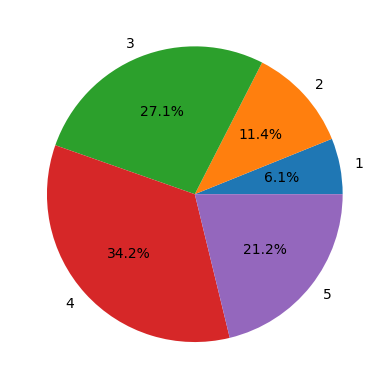

In [110]:
label=['1', '2','3', '4', '5']
plt.pie(data.groupby('rating')['rating'].count(),autopct="%.1f%%",labels=label)
plt.show()

In [111]:
data_rating = data.pivot_table(values='rating',columns='item',index='user').fillna(0)
data_rating

item,1,2,3,4,5,6,7,8,9,10,...,1673,1674,1675,1676,1677,1678,1679,1680,1681,1682
user,,,,,,,,,,,,,,,,,,,,,
1,5.0,3.0,4.0,3.0,3.0,5.0,4.0,1.0,5.0,3.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,4.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
5,4.0,3.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
939,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,5.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
940,0.0,0.0,0.0,2.0,0.0,0.0,4.0,5.0,3.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
941,5.0,0.0,0.0,0.0,0.0,0.0,4.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [113]:
data_rating.iloc[1,1]

0.0

In [35]:
movie_for_each_user

{5456: {10618: 3.0,
  1768: 5.0,
  3328: 2.0,
  3687: 4.0,
  7108: 1.0,
  1076: 4.0,
  3630: 1.0,
  6613: 1.0},
 4431: {1767: 5.0,
  9019: 5.0,
  1469: 4.0,
  6175: 5.0,
  3151: 5.0,
  4592: 5.0,
  1848: 4.0},
 4788: {8864: 5.0,
  5254: 5.0,
  8051: 5.0,
  10489: 4.0,
  6324: 5.0,
  3359: 1.0,
  6452: 5.0,
  10204: 5.0},
 4974: {535: 5.0,
  7456: 5.0,
  6493: 5.0,
  5699: 4.0,
  8079: 5.0,
  3961: 3.0,
  9001: 4.0},
 4155: {6725: 4.0,
  11442: 4.0,
  4086: 5.0,
  638: 5.0,
  2136: 5.0,
  337: 5.0,
  3927: 4.0,
  10542: 5.0},
 540: {10618: 3.0,
  1768: 5.0,
  3328: 2.0,
  3687: 4.0,
  7108: 1.0,
  1076: 4.0,
  3630: 1.0,
  6613: 1.0},
 5028: {8648: 5.0,
  1394: 5.0,
  10908: 5.0,
  3967: 5.0,
  10951: 5.0,
  2185: 5.0,
  7929: 5.0,
  10489: 1.0},
 5690: {5700: 5.0,
  8279: 5.0,
  3967: 5.0,
  3096: 5.0,
  3613: 5.0,
  5537: 4.0,
  10332: 4.0,
  2412: 5.0},
 4814: {3985: 1.0,
  7134: 2.0,
  1877: 1.0,
  2094: 1.0,
  10126: 2.0,
  5867: 1.0,
  10951: 1.0,
  395: 4.0},
 702: {9957: 5.0,
  

In [112]:
import torch
from torch.autograd import Variable

class MatrixFactorization(torch.nn.Module):
    def __init__(self, n_users, n_items, n_factors=20):
        super().__init__()
    # create user embeddings
        self.user_factors = torch.nn.Embedding(n_users, n_factors, sparse=True)
    # create item embeddings
        self.item_factors = torch.nn.Embedding(n_items, n_factors, sparse=True)

    def forward(self, user, item):
        # matrix multiplication
        return (self.user_factors(user)*self.item_factors(item)).sum(1)

    def predict(self, user, item):
        return self.forward(user, item)
    
n_users = len(set(data.user.tolist()))
n_items = len(set(data.item.tolist()))
model = MatrixFactorization(n_users, n_items, n_factors=20)
loss_fn = torch.nn.MSELoss() 
optimizer = torch.optim.SGD(model.parameters(), lr=1e-6)

for user, item in zip(data.user.tolist(), data.item.tolist()):
    # get user, item and rating data
    rating = Variable(torch.FloatTensor([data_rating.iloc[user, item]]))
    user = Variable(torch.LongTensor([int(user)]))
    item = Variable(torch.LongTensor([int(item)]))

    # predict
    prediction = model(user, item)
    
    loss = loss_fn(prediction, rating)
    print((user, item),'=>', (prediction, loss))
    # backpropagate
    loss.backward()

    # update weights
    optimizer.step()

(tensor([196]), tensor([242])) => (tensor([5.8756], grad_fn=<SumBackward1>), tensor(34.5231, grad_fn=<MseLossBackward0>))
(tensor([186]), tensor([302])) => (tensor([-3.3565], grad_fn=<SumBackward1>), tensor(11.2661, grad_fn=<MseLossBackward0>))
(tensor([22]), tensor([377])) => (tensor([-0.2794], grad_fn=<SumBackward1>), tensor(0.0780, grad_fn=<MseLossBackward0>))
(tensor([244]), tensor([51])) => (tensor([0.4208], grad_fn=<SumBackward1>), tensor(0.1770, grad_fn=<MseLossBackward0>))
(tensor([166]), tensor([346])) => (tensor([0.5088], grad_fn=<SumBackward1>), tensor(0.2589, grad_fn=<MseLossBackward0>))
(tensor([298]), tensor([474])) => (tensor([1.7328], grad_fn=<SumBackward1>), tensor(5.1401, grad_fn=<MseLossBackward0>))
(tensor([115]), tensor([265])) => (tensor([-1.9558], grad_fn=<SumBackward1>), tensor(3.8250, grad_fn=<MseLossBackward0>))
(tensor([253]), tensor([465])) => (tensor([1.0611], grad_fn=<SumBackward1>), tensor(1.1260, grad_fn=<MseLossBackward0>))
(tensor([305]), tensor([451])

(tensor([215]), tensor([212])) => (tensor([-3.5950], grad_fn=<SumBackward1>), tensor(12.9239, grad_fn=<MseLossBackward0>))
(tensor([69]), tensor([256])) => (tensor([-6.7045], grad_fn=<SumBackward1>), tensor(114.5871, grad_fn=<MseLossBackward0>))
(tensor([254]), tensor([662])) => (tensor([2.8564], grad_fn=<SumBackward1>), tensor(8.1592, grad_fn=<MseLossBackward0>))
(tensor([276]), tensor([2])) => (tensor([-4.9775], grad_fn=<SumBackward1>), tensor(24.7759, grad_fn=<MseLossBackward0>))
(tensor([104]), tensor([984])) => (tensor([-8.5274], grad_fn=<SumBackward1>), tensor(72.7164, grad_fn=<MseLossBackward0>))
(tensor([63]), tensor([1067])) => (tensor([0.6550], grad_fn=<SumBackward1>), tensor(0.4290, grad_fn=<MseLossBackward0>))
(tensor([267]), tensor([410])) => (tensor([5.0018], grad_fn=<SumBackward1>), tensor(25.0179, grad_fn=<MseLossBackward0>))
(tensor([13]), tensor([56])) => (tensor([-1.8593], grad_fn=<SumBackward1>), tensor(3.4570, grad_fn=<MseLossBackward0>))
(tensor([240]), tensor([87

(tensor([22]), tensor([376])) => (tensor([-1.4369], grad_fn=<SumBackward1>), tensor(2.0647, grad_fn=<MseLossBackward0>))
(tensor([294]), tensor([931])) => (tensor([4.3808], grad_fn=<SumBackward1>), tensor(19.1916, grad_fn=<MseLossBackward0>))
(tensor([82]), tensor([717])) => (tensor([7.2682], grad_fn=<SumBackward1>), tensor(52.8264, grad_fn=<MseLossBackward0>))
(tensor([279]), tensor([399])) => (tensor([4.2175], grad_fn=<SumBackward1>), tensor(17.7872, grad_fn=<MseLossBackward0>))
(tensor([269]), tensor([234])) => (tensor([3.5528], grad_fn=<SumBackward1>), tensor(12.6224, grad_fn=<MseLossBackward0>))
(tensor([6]), tensor([98])) => (tensor([0.2471], grad_fn=<SumBackward1>), tensor(22.5905, grad_fn=<MseLossBackward0>))
(tensor([243]), tensor([1039])) => (tensor([-2.9831], grad_fn=<SumBackward1>), tensor(8.8988, grad_fn=<MseLossBackward0>))
(tensor([298]), tensor([181])) => (tensor([-1.8947], grad_fn=<SumBackward1>), tensor(23.9577, grad_fn=<MseLossBackward0>))
(tensor([282]), tensor([325

(tensor([161]), tensor([48])) => (tensor([11.5521], grad_fn=<SumBackward1>), tensor(133.4512, grad_fn=<MseLossBackward0>))
(tensor([305]), tensor([654])) => (tensor([-9.5611], grad_fn=<SumBackward1>), tensor(91.4150, grad_fn=<MseLossBackward0>))
(tensor([47]), tensor([324])) => (tensor([9.7452], grad_fn=<SumBackward1>), tensor(94.9695, grad_fn=<MseLossBackward0>))
(tensor([64]), tensor([736])) => (tensor([0.5682], grad_fn=<SumBackward1>), tensor(0.3229, grad_fn=<MseLossBackward0>))
(tensor([191]), tensor([751])) => (tensor([-5.2313], grad_fn=<SumBackward1>), tensor(27.3669, grad_fn=<MseLossBackward0>))
(tensor([7]), tensor([378])) => (tensor([-3.8523], grad_fn=<SumBackward1>), tensor(14.8403, grad_fn=<MseLossBackward0>))
(tensor([59]), tensor([92])) => (tensor([0.8834], grad_fn=<SumBackward1>), tensor(0.7805, grad_fn=<MseLossBackward0>))
(tensor([69]), tensor([268])) => (tensor([-1.9276], grad_fn=<SumBackward1>), tensor(3.7156, grad_fn=<MseLossBackward0>))
(tensor([10]), tensor([461]))

(tensor([25]), tensor([501])) => (tensor([-3.4433], grad_fn=<SumBackward1>), tensor(11.8564, grad_fn=<MseLossBackward0>))
(tensor([293]), tensor([137])) => (tensor([6.0324], grad_fn=<SumBackward1>), tensor(36.3903, grad_fn=<MseLossBackward0>))
(tensor([201]), tensor([432])) => (tensor([-5.5879], grad_fn=<SumBackward1>), tensor(31.2250, grad_fn=<MseLossBackward0>))
(tensor([75]), tensor([240])) => (tensor([5.2879], grad_fn=<SumBackward1>), tensor(27.9621, grad_fn=<MseLossBackward0>))
(tensor([13]), tensor([181])) => (tensor([-5.5941], grad_fn=<SumBackward1>), tensor(31.2939, grad_fn=<MseLossBackward0>))
(tensor([207]), tensor([68])) => (tensor([-6.9717], grad_fn=<SumBackward1>), tensor(48.6048, grad_fn=<MseLossBackward0>))
(tensor([2]), tensor([50])) => (tensor([-1.1290], grad_fn=<SumBackward1>), tensor(1.2747, grad_fn=<MseLossBackward0>))
(tensor([313]), tensor([566])) => (tensor([6.5535], grad_fn=<SumBackward1>), tensor(42.9478, grad_fn=<MseLossBackward0>))
(tensor([144]), tensor([125

(tensor([244]), tensor([53])) => (tensor([5.7394], grad_fn=<SumBackward1>), tensor(32.9406, grad_fn=<MseLossBackward0>))
(tensor([250]), tensor([196])) => (tensor([-0.4650], grad_fn=<SumBackward1>), tensor(0.2162, grad_fn=<MseLossBackward0>))
(tensor([43]), tensor([40])) => (tensor([-3.8632], grad_fn=<SumBackward1>), tensor(14.9240, grad_fn=<MseLossBackward0>))
(tensor([285]), tensor([150])) => (tensor([-7.4842], grad_fn=<SumBackward1>), tensor(155.8560, grad_fn=<MseLossBackward0>))
(tensor([42]), tensor([953])) => (tensor([1.8741], grad_fn=<SumBackward1>), tensor(3.5123, grad_fn=<MseLossBackward0>))
(tensor([97]), tensor([670])) => (tensor([-2.0015], grad_fn=<SumBackward1>), tensor(4.0060, grad_fn=<MseLossBackward0>))
(tensor([122]), tensor([510])) => (tensor([-0.5452], grad_fn=<SumBackward1>), tensor(30.7497, grad_fn=<MseLossBackward0>))
(tensor([61]), tensor([323])) => (tensor([-1.6439], grad_fn=<SumBackward1>), tensor(2.7025, grad_fn=<MseLossBackward0>))
(tensor([222]), tensor([106

(tensor([151]), tensor([919])) => (tensor([2.9780], grad_fn=<SumBackward1>), tensor(8.8686, grad_fn=<MseLossBackward0>))
(tensor([199]), tensor([268])) => (tensor([-6.6412], grad_fn=<SumBackward1>), tensor(44.1050, grad_fn=<MseLossBackward0>))
(tensor([201]), tensor([209])) => (tensor([0.6758], grad_fn=<SumBackward1>), tensor(0.4567, grad_fn=<MseLossBackward0>))
(tensor([99]), tensor([274])) => (tensor([4.9244], grad_fn=<SumBackward1>), tensor(24.2499, grad_fn=<MseLossBackward0>))
(tensor([11]), tensor([740])) => (tensor([-3.7905], grad_fn=<SumBackward1>), tensor(14.3679, grad_fn=<MseLossBackward0>))
(tensor([59]), tensor([77])) => (tensor([-3.3584], grad_fn=<SumBackward1>), tensor(11.2788, grad_fn=<MseLossBackward0>))
(tensor([184]), tensor([277])) => (tensor([-5.0562], grad_fn=<SumBackward1>), tensor(25.5654, grad_fn=<MseLossBackward0>))
(tensor([222]), tensor([88])) => (tensor([-2.9034], grad_fn=<SumBackward1>), tensor(8.4296, grad_fn=<MseLossBackward0>))
(tensor([38]), tensor([161]

(tensor([64]), tensor([160])) => (tensor([-6.6764], grad_fn=<SumBackward1>), tensor(44.5739, grad_fn=<MseLossBackward0>))
(tensor([28]), tensor([79])) => (tensor([-4.9455], grad_fn=<SumBackward1>), tensor(24.4580, grad_fn=<MseLossBackward0>))
(tensor([168]), tensor([1278])) => (tensor([-0.9065], grad_fn=<SumBackward1>), tensor(0.8218, grad_fn=<MseLossBackward0>))
(tensor([265]), tensor([471])) => (tensor([2.9516], grad_fn=<SumBackward1>), tensor(8.7117, grad_fn=<MseLossBackward0>))
(tensor([18]), tensor([113])) => (tensor([-3.4463], grad_fn=<SumBackward1>), tensor(11.8770, grad_fn=<MseLossBackward0>))
(tensor([83]), tensor([82])) => (tensor([-7.2762], grad_fn=<SumBackward1>), tensor(52.9433, grad_fn=<MseLossBackward0>))
(tensor([90]), tensor([499])) => (tensor([-1.2861], grad_fn=<SumBackward1>), tensor(1.6540, grad_fn=<MseLossBackward0>))
(tensor([234]), tensor([1186])) => (tensor([1.6035], grad_fn=<SumBackward1>), tensor(2.5711, grad_fn=<MseLossBackward0>))
(tensor([87]), tensor([196]

(tensor([144]), tensor([508])) => (tensor([4.2012], grad_fn=<SumBackward1>), tensor(17.6501, grad_fn=<MseLossBackward0>))
(tensor([73]), tensor([94])) => (tensor([-5.3472], grad_fn=<SumBackward1>), tensor(28.5921, grad_fn=<MseLossBackward0>))
(tensor([194]), tensor([205])) => (tensor([4.6738], grad_fn=<SumBackward1>), tensor(21.8441, grad_fn=<MseLossBackward0>))
(tensor([177]), tensor([203])) => (tensor([-2.9924], grad_fn=<SumBackward1>), tensor(48.8931, grad_fn=<MseLossBackward0>))
(tensor([276]), tensor([273])) => (tensor([0.7962], grad_fn=<SumBackward1>), tensor(10.2645, grad_fn=<MseLossBackward0>))
(tensor([198]), tensor([7])) => (tensor([1.7595], grad_fn=<SumBackward1>), tensor(3.0957, grad_fn=<MseLossBackward0>))
(tensor([108]), tensor([290])) => (tensor([-3.8053], grad_fn=<SumBackward1>), tensor(46.3123, grad_fn=<MseLossBackward0>))
(tensor([189]), tensor([197])) => (tensor([-4.0407], grad_fn=<SumBackward1>), tensor(16.3269, grad_fn=<MseLossBackward0>))
(tensor([73]), tensor([56

(tensor([62]), tensor([114])) => (tensor([-1.4141], grad_fn=<SumBackward1>), tensor(1.9995, grad_fn=<MseLossBackward0>))
(tensor([72]), tensor([530])) => (tensor([3.5336], grad_fn=<SumBackward1>), tensor(12.4864, grad_fn=<MseLossBackward0>))
(tensor([276]), tensor([364])) => (tensor([-0.1490], grad_fn=<SumBackward1>), tensor(0.0222, grad_fn=<MseLossBackward0>))
(tensor([88]), tensor([750])) => (tensor([-2.3506], grad_fn=<SumBackward1>), tensor(5.5252, grad_fn=<MseLossBackward0>))
(tensor([49]), tensor([7])) => (tensor([-7.6070], grad_fn=<SumBackward1>), tensor(57.8664, grad_fn=<MseLossBackward0>))
(tensor([263]), tensor([117])) => (tensor([-1.8451], grad_fn=<SumBackward1>), tensor(3.4042, grad_fn=<MseLossBackward0>))
(tensor([9]), tensor([298])) => (tensor([-5.6221], grad_fn=<SumBackward1>), tensor(31.6082, grad_fn=<MseLossBackward0>))
(tensor([92]), tensor([528])) => (tensor([9.4795], grad_fn=<SumBackward1>), tensor(89.8604, grad_fn=<MseLossBackward0>))
(tensor([249]), tensor([708])) 

(tensor([256]), tensor([716])) => (tensor([-3.9986], grad_fn=<SumBackward1>), tensor(15.9887, grad_fn=<MseLossBackward0>))
(tensor([80]), tensor([582])) => (tensor([-6.2366], grad_fn=<SumBackward1>), tensor(38.8947, grad_fn=<MseLossBackward0>))
(tensor([303]), tensor([435])) => (tensor([-5.7502], grad_fn=<SumBackward1>), tensor(33.0645, grad_fn=<MseLossBackward0>))
(tensor([312]), tensor([121])) => (tensor([-4.2528], grad_fn=<SumBackward1>), tensor(18.0860, grad_fn=<MseLossBackward0>))
(tensor([151]), tensor([1006])) => (tensor([-3.5700], grad_fn=<SumBackward1>), tensor(12.7447, grad_fn=<MseLossBackward0>))
(tensor([62]), tensor([258])) => (tensor([-2.0487], grad_fn=<SumBackward1>), tensor(25.4895, grad_fn=<MseLossBackward0>))
(tensor([189]), tensor([1115])) => (tensor([-2.4768], grad_fn=<SumBackward1>), tensor(6.1344, grad_fn=<MseLossBackward0>))
(tensor([77]), tensor([195])) => (tensor([-0.8222], grad_fn=<SumBackward1>), tensor(0.6760, grad_fn=<MseLossBackward0>))
(tensor([99]), tens

(tensor([219]), tensor([347])) => (tensor([-2.4126], grad_fn=<SumBackward1>), tensor(5.8204, grad_fn=<MseLossBackward0>))
(tensor([295]), tensor([704])) => (tensor([3.3486], grad_fn=<SumBackward1>), tensor(2.7271, grad_fn=<MseLossBackward0>))
(tensor([293]), tensor([288])) => (tensor([4.2920], grad_fn=<SumBackward1>), tensor(18.4214, grad_fn=<MseLossBackward0>))
(tensor([125]), tensor([997])) => (tensor([-5.2045], grad_fn=<SumBackward1>), tensor(27.0870, grad_fn=<MseLossBackward0>))
(tensor([279]), tensor([487])) => (tensor([0.7505], grad_fn=<SumBackward1>), tensor(0.5632, grad_fn=<MseLossBackward0>))
(tensor([76]), tensor([582])) => (tensor([-1.6679], grad_fn=<SumBackward1>), tensor(2.7818, grad_fn=<MseLossBackward0>))
(tensor([272]), tensor([48])) => (tensor([-4.5812], grad_fn=<SumBackward1>), tensor(20.9869, grad_fn=<MseLossBackward0>))
(tensor([269]), tensor([285])) => (tensor([-4.6360], grad_fn=<SumBackward1>), tensor(92.8533, grad_fn=<MseLossBackward0>))
(tensor([244]), tensor([3

(tensor([268]), tensor([470])) => (tensor([1.0852], grad_fn=<SumBackward1>), tensor(1.1776, grad_fn=<MseLossBackward0>))
(tensor([188]), tensor([769])) => (tensor([-5.9754], grad_fn=<SumBackward1>), tensor(35.7051, grad_fn=<MseLossBackward0>))
(tensor([94]), tensor([89])) => (tensor([-7.5530], grad_fn=<SumBackward1>), tensor(91.2591, grad_fn=<MseLossBackward0>))
(tensor([7]), tensor([44])) => (tensor([-2.7773], grad_fn=<SumBackward1>), tensor(7.7134, grad_fn=<MseLossBackward0>))
(tensor([158]), tensor([85])) => (tensor([-4.5538], grad_fn=<SumBackward1>), tensor(20.7367, grad_fn=<MseLossBackward0>))
(tensor([256]), tensor([765])) => (tensor([-0.9467], grad_fn=<SumBackward1>), tensor(0.8962, grad_fn=<MseLossBackward0>))
(tensor([221]), tensor([69])) => (tensor([-0.0770], grad_fn=<SumBackward1>), tensor(9.4680, grad_fn=<MseLossBackward0>))
(tensor([196]), tensor([67])) => (tensor([2.6147], grad_fn=<SumBackward1>), tensor(0.3778, grad_fn=<MseLossBackward0>))
(tensor([232]), tensor([175])) 

(tensor([3]), tensor([343])) => (tensor([3.7030], grad_fn=<SumBackward1>), tensor(13.7122, grad_fn=<MseLossBackward0>))
(tensor([310]), tensor([845])) => (tensor([-6.5344], grad_fn=<SumBackward1>), tensor(42.6982, grad_fn=<MseLossBackward0>))
(tensor([224]), tensor([658])) => (tensor([0.4022], grad_fn=<SumBackward1>), tensor(0.1618, grad_fn=<MseLossBackward0>))
(tensor([4]), tensor([357])) => (tensor([4.5067], grad_fn=<SumBackward1>), tensor(20.3106, grad_fn=<MseLossBackward0>))
(tensor([25]), tensor([615])) => (tensor([9.1972], grad_fn=<SumBackward1>), tensor(84.5876, grad_fn=<MseLossBackward0>))
(tensor([11]), tensor([517])) => (tensor([-3.4006], grad_fn=<SumBackward1>), tensor(11.5644, grad_fn=<MseLossBackward0>))
(tensor([298]), tensor([91])) => (tensor([2.5195], grad_fn=<SumBackward1>), tensor(6.3479, grad_fn=<MseLossBackward0>))
(tensor([59]), tensor([170])) => (tensor([2.7087], grad_fn=<SumBackward1>), tensor(7.3368, grad_fn=<MseLossBackward0>))
(tensor([147]), tensor([305])) =>

(tensor([311]), tensor([28])) => (tensor([-8.7711], grad_fn=<SumBackward1>), tensor(76.9322, grad_fn=<MseLossBackward0>))
(tensor([25]), tensor([228])) => (tensor([2.0872], grad_fn=<SumBackward1>), tensor(4.3565, grad_fn=<MseLossBackward0>))
(tensor([76]), tensor([92])) => (tensor([1.1167], grad_fn=<SumBackward1>), tensor(1.2470, grad_fn=<MseLossBackward0>))
(tensor([246]), tensor([406])) => (tensor([2.1972], grad_fn=<SumBackward1>), tensor(4.8279, grad_fn=<MseLossBackward0>))
(tensor([201]), tensor([292])) => (tensor([-0.8335], grad_fn=<SumBackward1>), tensor(0.6947, grad_fn=<MseLossBackward0>))
(tensor([235]), tensor([647])) => (tensor([2.2283], grad_fn=<SumBackward1>), tensor(4.9654, grad_fn=<MseLossBackward0>))
(tensor([286]), tensor([133])) => (tensor([3.9583], grad_fn=<SumBackward1>), tensor(15.6680, grad_fn=<MseLossBackward0>))
(tensor([48]), tensor([174])) => (tensor([-3.3356], grad_fn=<SumBackward1>), tensor(69.4828, grad_fn=<MseLossBackward0>))
(tensor([144]), tensor([685])) 

(tensor([85]), tensor([98])) => (tensor([0.9397], grad_fn=<SumBackward1>), tensor(0.8830, grad_fn=<MseLossBackward0>))
(tensor([279]), tensor([393])) => (tensor([5.1681], grad_fn=<SumBackward1>), tensor(26.7097, grad_fn=<MseLossBackward0>))
(tensor([222]), tensor([323])) => (tensor([-4.7315], grad_fn=<SumBackward1>), tensor(22.3874, grad_fn=<MseLossBackward0>))
(tensor([288]), tensor([127])) => (tensor([-2.4228], grad_fn=<SumBackward1>), tensor(5.8699, grad_fn=<MseLossBackward0>))
(tensor([42]), tensor([606])) => (tensor([1.7359], grad_fn=<SumBackward1>), tensor(3.0134, grad_fn=<MseLossBackward0>))
(tensor([25]), tensor([729])) => (tensor([-0.5063], grad_fn=<SumBackward1>), tensor(0.2564, grad_fn=<MseLossBackward0>))
(tensor([119]), tensor([213])) => (tensor([-6.4610], grad_fn=<SumBackward1>), tensor(41.7443, grad_fn=<MseLossBackward0>))
(tensor([116]), tensor([185])) => (tensor([7.1041], grad_fn=<SumBackward1>), tensor(50.4687, grad_fn=<MseLossBackward0>))
(tensor([123]), tensor([13])

(tensor([138]), tensor([151])) => (tensor([-1.5167], grad_fn=<SumBackward1>), tensor(2.3004, grad_fn=<MseLossBackward0>))
(tensor([197]), tensor([849])) => (tensor([6.1135], grad_fn=<SumBackward1>), tensor(37.3753, grad_fn=<MseLossBackward0>))
(tensor([215]), tensor([157])) => (tensor([-5.3151], grad_fn=<SumBackward1>), tensor(28.2503, grad_fn=<MseLossBackward0>))
(tensor([94]), tensor([1119])) => (tensor([7.5656], grad_fn=<SumBackward1>), tensor(57.2382, grad_fn=<MseLossBackward0>))
(tensor([293]), tensor([724])) => (tensor([2.9484], grad_fn=<SumBackward1>), tensor(8.6931, grad_fn=<MseLossBackward0>))
(tensor([79]), tensor([246])) => (tensor([2.5074], grad_fn=<SumBackward1>), tensor(6.2869, grad_fn=<MseLossBackward0>))
(tensor([279]), tensor([1492])) => (tensor([-3.3385], grad_fn=<SumBackward1>), tensor(11.1453, grad_fn=<MseLossBackward0>))
(tensor([189]), tensor([30])) => (tensor([-2.7200], grad_fn=<SumBackward1>), tensor(7.3981, grad_fn=<MseLossBackward0>))
(tensor([233]), tensor([8

(tensor([217]), tensor([195])) => (tensor([0.6095], grad_fn=<SumBackward1>), tensor(0.3715, grad_fn=<MseLossBackward0>))
(tensor([224]), tensor([708])) => (tensor([-5.4193], grad_fn=<SumBackward1>), tensor(29.3688, grad_fn=<MseLossBackward0>))
(tensor([246]), tensor([121])) => (tensor([-5.1220], grad_fn=<SumBackward1>), tensor(26.2345, grad_fn=<MseLossBackward0>))
(tensor([284]), tensor([906])) => (tensor([1.3539], grad_fn=<SumBackward1>), tensor(1.8330, grad_fn=<MseLossBackward0>))
(tensor([301]), tensor([172])) => (tensor([-1.2353], grad_fn=<SumBackward1>), tensor(1.5260, grad_fn=<MseLossBackward0>))
(tensor([244]), tensor([31])) => (tensor([-3.1685], grad_fn=<SumBackward1>), tensor(10.0394, grad_fn=<MseLossBackward0>))
(tensor([95]), tensor([395])) => (tensor([4.2038], grad_fn=<SumBackward1>), tensor(17.6718, grad_fn=<MseLossBackward0>))
(tensor([303]), tensor([330])) => (tensor([-0.2438], grad_fn=<SumBackward1>), tensor(0.0595, grad_fn=<MseLossBackward0>))
(tensor([198]), tensor([6

(tensor([4]), tensor([260])) => (tensor([-1.3306], grad_fn=<SumBackward1>), tensor(1.7704, grad_fn=<MseLossBackward0>))
(tensor([261]), tensor([294])) => (tensor([1.3215], grad_fn=<SumBackward1>), tensor(1.7463, grad_fn=<MseLossBackward0>))
(tensor([159]), tensor([259])) => (tensor([2.1420], grad_fn=<SumBackward1>), tensor(4.5881, grad_fn=<MseLossBackward0>))
(tensor([137]), tensor([55])) => (tensor([-0.8347], grad_fn=<SumBackward1>), tensor(34.0434, grad_fn=<MseLossBackward0>))
(tensor([174]), tensor([699])) => (tensor([-0.2810], grad_fn=<SumBackward1>), tensor(0.0790, grad_fn=<MseLossBackward0>))
(tensor([286]), tensor([158])) => (tensor([-1.3461], grad_fn=<SumBackward1>), tensor(1.8120, grad_fn=<MseLossBackward0>))
(tensor([87]), tensor([1183])) => (tensor([-3.3919], grad_fn=<SumBackward1>), tensor(11.5050, grad_fn=<MseLossBackward0>))
(tensor([270]), tensor([230])) => (tensor([-1.6124], grad_fn=<SumBackward1>), tensor(2.5998, grad_fn=<MseLossBackward0>))
(tensor([91]), tensor([172]

(tensor([222]), tensor([1053])) => (tensor([1.3475], grad_fn=<SumBackward1>), tensor(1.8157, grad_fn=<MseLossBackward0>))
(tensor([93]), tensor([222])) => (tensor([2.8986], grad_fn=<SumBackward1>), tensor(4.4157, grad_fn=<MseLossBackward0>))
(tensor([330]), tensor([235])) => (tensor([2.5187], grad_fn=<SumBackward1>), tensor(6.3438, grad_fn=<MseLossBackward0>))
(tensor([82]), tensor([504])) => (tensor([-2.2091], grad_fn=<SumBackward1>), tensor(4.8799, grad_fn=<MseLossBackward0>))
(tensor([2]), tensor([314])) => (tensor([-3.2381], grad_fn=<SumBackward1>), tensor(10.4851, grad_fn=<MseLossBackward0>))
(tensor([89]), tensor([732])) => (tensor([1.3970], grad_fn=<SumBackward1>), tensor(1.9517, grad_fn=<MseLossBackward0>))
(tensor([38]), tensor([216])) => (tensor([-5.4691], grad_fn=<SumBackward1>), tensor(29.9107, grad_fn=<MseLossBackward0>))
(tensor([308]), tensor([85])) => (tensor([9.2984], grad_fn=<SumBackward1>), tensor(86.4611, grad_fn=<MseLossBackward0>))
(tensor([24]), tensor([153])) =>

(tensor([29]), tensor([748])) => (tensor([-2.6171], grad_fn=<SumBackward1>), tensor(6.8493, grad_fn=<MseLossBackward0>))
(tensor([221]), tensor([172])) => (tensor([-4.1377], grad_fn=<SumBackward1>), tensor(83.4968, grad_fn=<MseLossBackward0>))
(tensor([323]), tensor([9])) => (tensor([8.1805], grad_fn=<SumBackward1>), tensor(66.9204, grad_fn=<MseLossBackward0>))
(tensor([111]), tensor([340])) => (tensor([-1.7283], grad_fn=<SumBackward1>), tensor(2.9869, grad_fn=<MseLossBackward0>))
(tensor([95]), tensor([176])) => (tensor([2.2514], grad_fn=<SumBackward1>), tensor(5.0687, grad_fn=<MseLossBackward0>))
(tensor([207]), tensor([170])) => (tensor([-1.6029], grad_fn=<SumBackward1>), tensor(2.5693, grad_fn=<MseLossBackward0>))
(tensor([136]), tensor([276])) => (tensor([8.5114], grad_fn=<SumBackward1>), tensor(72.4442, grad_fn=<MseLossBackward0>))
(tensor([124]), tensor([616])) => (tensor([0.3870], grad_fn=<SumBackward1>), tensor(0.1497, grad_fn=<MseLossBackward0>))
(tensor([185]), tensor([528])

(tensor([321]), tensor([631])) => (tensor([-0.8118], grad_fn=<SumBackward1>), tensor(0.6590, grad_fn=<MseLossBackward0>))
(tensor([32]), tensor([591])) => (tensor([0.6055], grad_fn=<SumBackward1>), tensor(0.3666, grad_fn=<MseLossBackward0>))
(tensor([125]), tensor([1036])) => (tensor([4.5811], grad_fn=<SumBackward1>), tensor(20.9869, grad_fn=<MseLossBackward0>))
(tensor([1]), tensor([84])) => (tensor([-3.2918], grad_fn=<SumBackward1>), tensor(10.8357, grad_fn=<MseLossBackward0>))
(tensor([21]), tensor([742])) => (tensor([1.0231], grad_fn=<SumBackward1>), tensor(1.0466, grad_fn=<MseLossBackward0>))
(tensor([22]), tensor([186])) => (tensor([-4.2495], grad_fn=<SumBackward1>), tensor(18.0583, grad_fn=<MseLossBackward0>))
(tensor([292]), tensor([324])) => (tensor([-1.6131], grad_fn=<SumBackward1>), tensor(13.0545, grad_fn=<MseLossBackward0>))
(tensor([72]), tensor([129])) => (tensor([-2.5145], grad_fn=<SumBackward1>), tensor(6.3227, grad_fn=<MseLossBackward0>))
(tensor([256]), tensor([642])

(tensor([98]), tensor([655])) => (tensor([2.0548], grad_fn=<SumBackward1>), tensor(4.2221, grad_fn=<MseLossBackward0>))
(tensor([123]), tensor([275])) => (tensor([-1.8062], grad_fn=<SumBackward1>), tensor(3.2624, grad_fn=<MseLossBackward0>))
(tensor([181]), tensor([688])) => (tensor([3.4338], grad_fn=<SumBackward1>), tensor(11.7911, grad_fn=<MseLossBackward0>))
(tensor([7]), tensor([162])) => (tensor([-0.2568], grad_fn=<SumBackward1>), tensor(0.0659, grad_fn=<MseLossBackward0>))
(tensor([119]), tensor([269])) => (tensor([-0.2163], grad_fn=<SumBackward1>), tensor(0.0468, grad_fn=<MseLossBackward0>))
(tensor([181]), tensor([457])) => (tensor([-2.6492], grad_fn=<SumBackward1>), tensor(7.0182, grad_fn=<MseLossBackward0>))
(tensor([138]), tensor([483])) => (tensor([3.4823], grad_fn=<SumBackward1>), tensor(12.1261, grad_fn=<MseLossBackward0>))
(tensor([56]), tensor([63])) => (tensor([-6.2379], grad_fn=<SumBackward1>), tensor(126.2897, grad_fn=<MseLossBackward0>))
(tensor([291]), tensor([122]

(tensor([289]), tensor([410])) => (tensor([1.4128], grad_fn=<SumBackward1>), tensor(1.9960, grad_fn=<MseLossBackward0>))
(tensor([59]), tensor([132])) => (tensor([1.2147], grad_fn=<SumBackward1>), tensor(7.7579, grad_fn=<MseLossBackward0>))
(tensor([301]), tensor([1112])) => (tensor([2.4782], grad_fn=<SumBackward1>), tensor(6.1416, grad_fn=<MseLossBackward0>))
(tensor([56]), tensor([1090])) => (tensor([2.4314], grad_fn=<SumBackward1>), tensor(5.9118, grad_fn=<MseLossBackward0>))
(tensor([327]), tensor([192])) => (tensor([7.9194], grad_fn=<SumBackward1>), tensor(62.7163, grad_fn=<MseLossBackward0>))
(tensor([285]), tensor([288])) => (tensor([2.1102], grad_fn=<SumBackward1>), tensor(8.3507, grad_fn=<MseLossBackward0>))
(tensor([133]), tensor([328])) => (tensor([-2.0454], grad_fn=<SumBackward1>), tensor(4.1837, grad_fn=<MseLossBackward0>))
(tensor([71]), tensor([346])) => (tensor([1.1188], grad_fn=<SumBackward1>), tensor(1.2517, grad_fn=<MseLossBackward0>))
(tensor([293]), tensor([1132]))

(tensor([250]), tensor([127])) => (tensor([6.6792], grad_fn=<SumBackward1>), tensor(44.6115, grad_fn=<MseLossBackward0>))
(tensor([286]), tensor([1265])) => (tensor([-0.4869], grad_fn=<SumBackward1>), tensor(0.2370, grad_fn=<MseLossBackward0>))
(tensor([203]), tensor([294])) => (tensor([-6.7758], grad_fn=<SumBackward1>), tensor(45.9110, grad_fn=<MseLossBackward0>))
(tensor([267]), tensor([226])) => (tensor([9.3168], grad_fn=<SumBackward1>), tensor(28.2685, grad_fn=<MseLossBackward0>))
(tensor([194]), tensor([735])) => (tensor([1.6917], grad_fn=<SumBackward1>), tensor(2.8618, grad_fn=<MseLossBackward0>))
(tensor([303]), tensor([99])) => (tensor([-3.3968], grad_fn=<SumBackward1>), tensor(11.5381, grad_fn=<MseLossBackward0>))
(tensor([193]), tensor([195])) => (tensor([4.2296], grad_fn=<SumBackward1>), tensor(1.5119, grad_fn=<MseLossBackward0>))
(tensor([57]), tensor([588])) => (tensor([4.1047], grad_fn=<SumBackward1>), tensor(16.8484, grad_fn=<MseLossBackward0>))
(tensor([92]), tensor([67

(tensor([234]), tensor([671])) => (tensor([-0.0580], grad_fn=<SumBackward1>), tensor(0.0034, grad_fn=<MseLossBackward0>))
(tensor([234]), tensor([584])) => (tensor([1.8840], grad_fn=<SumBackward1>), tensor(3.5493, grad_fn=<MseLossBackward0>))
(tensor([279]), tensor([275])) => (tensor([4.3043], grad_fn=<SumBackward1>), tensor(0.4840, grad_fn=<MseLossBackward0>))
(tensor([234]), tensor([638])) => (tensor([2.6997], grad_fn=<SumBackward1>), tensor(7.2885, grad_fn=<MseLossBackward0>))
(tensor([110]), tensor([79])) => (tensor([-2.3075], grad_fn=<SumBackward1>), tensor(5.3247, grad_fn=<MseLossBackward0>))
(tensor([106]), tensor([273])) => (tensor([-0.5240], grad_fn=<SumBackward1>), tensor(0.2746, grad_fn=<MseLossBackward0>))
(tensor([128]), tensor([111])) => (tensor([-2.4072], grad_fn=<SumBackward1>), tensor(5.7947, grad_fn=<MseLossBackward0>))
(tensor([298]), tensor([151])) => (tensor([1.4904], grad_fn=<SumBackward1>), tensor(6.2979, grad_fn=<MseLossBackward0>))
(tensor([42]), tensor([845]))

(tensor([279]), tensor([363])) => (tensor([1.6480], grad_fn=<SumBackward1>), tensor(1.8278, grad_fn=<MseLossBackward0>))
(tensor([188]), tensor([357])) => (tensor([-3.9297], grad_fn=<SumBackward1>), tensor(15.4426, grad_fn=<MseLossBackward0>))
(tensor([214]), tensor([872])) => (tensor([5.8006], grad_fn=<SumBackward1>), tensor(33.6468, grad_fn=<MseLossBackward0>))
(tensor([234]), tensor([209])) => (tensor([1.5454], grad_fn=<SumBackward1>), tensor(2.3884, grad_fn=<MseLossBackward0>))
(tensor([5]), tensor([426])) => (tensor([1.5922], grad_fn=<SumBackward1>), tensor(5.7976, grad_fn=<MseLossBackward0>))
(tensor([1]), tensor([80])) => (tensor([2.3561], grad_fn=<SumBackward1>), tensor(5.5513, grad_fn=<MseLossBackward0>))
(tensor([246]), tensor([578])) => (tensor([-0.3319], grad_fn=<SumBackward1>), tensor(0.1102, grad_fn=<MseLossBackward0>))
(tensor([294]), tensor([979])) => (tensor([-1.4567], grad_fn=<SumBackward1>), tensor(2.1219, grad_fn=<MseLossBackward0>))
(tensor([314]), tensor([73])) =>

(tensor([54]), tensor([325])) => (tensor([-7.0885], grad_fn=<SumBackward1>), tensor(50.2466, grad_fn=<MseLossBackward0>))
(tensor([18]), tensor([498])) => (tensor([3.7607], grad_fn=<SumBackward1>), tensor(14.1430, grad_fn=<MseLossBackward0>))
(tensor([271]), tensor([345])) => (tensor([5.2519], grad_fn=<SumBackward1>), tensor(27.5826, grad_fn=<MseLossBackward0>))
(tensor([123]), tensor([22])) => (tensor([-2.0131], grad_fn=<SumBackward1>), tensor(4.0526, grad_fn=<MseLossBackward0>))
(tensor([87]), tensor([1189])) => (tensor([-0.8201], grad_fn=<SumBackward1>), tensor(0.6726, grad_fn=<MseLossBackward0>))
(tensor([217]), tensor([810])) => (tensor([-5.5565], grad_fn=<SumBackward1>), tensor(30.8743, grad_fn=<MseLossBackward0>))
(tensor([198]), tensor([148])) => (tensor([4.0059], grad_fn=<SumBackward1>), tensor(16.0472, grad_fn=<MseLossBackward0>))
(tensor([116]), tensor([257])) => (tensor([-3.8237], grad_fn=<SumBackward1>), tensor(61.2109, grad_fn=<MseLossBackward0>))
(tensor([131]), tensor([

(tensor([201]), tensor([98])) => (tensor([-2.1687], grad_fn=<SumBackward1>), tensor(4.7033, grad_fn=<MseLossBackward0>))
(tensor([43]), tensor([403])) => (tensor([-2.3057], grad_fn=<SumBackward1>), tensor(5.3163, grad_fn=<MseLossBackward0>))
(tensor([315]), tensor([216])) => (tensor([-2.8054], grad_fn=<SumBackward1>), tensor(7.8705, grad_fn=<MseLossBackward0>))
(tensor([53]), tensor([924])) => (tensor([3.1189], grad_fn=<SumBackward1>), tensor(9.7276, grad_fn=<MseLossBackward0>))
(tensor([308]), tensor([452])) => (tensor([-7.2640], grad_fn=<SumBackward1>), tensor(52.7661, grad_fn=<MseLossBackward0>))
(tensor([338]), tensor([613])) => (tensor([3.0319], grad_fn=<SumBackward1>), tensor(0.0010, grad_fn=<MseLossBackward0>))
(tensor([90]), tensor([357])) => (tensor([2.4106], grad_fn=<SumBackward1>), tensor(5.8110, grad_fn=<MseLossBackward0>))
(tensor([303]), tensor([327])) => (tensor([-4.1536], grad_fn=<SumBackward1>), tensor(51.1742, grad_fn=<MseLossBackward0>))
(tensor([247]), tensor([271])

(tensor([311]), tensor([692])) => (tensor([-0.7402], grad_fn=<SumBackward1>), tensor(0.5479, grad_fn=<MseLossBackward0>))
(tensor([159]), tensor([328])) => (tensor([-3.8216], grad_fn=<SumBackward1>), tensor(14.6044, grad_fn=<MseLossBackward0>))
(tensor([128]), tensor([77])) => (tensor([4.5786], grad_fn=<SumBackward1>), tensor(20.9636, grad_fn=<MseLossBackward0>))
(tensor([167]), tensor([48])) => (tensor([-0.6435], grad_fn=<SumBackward1>), tensor(0.4141, grad_fn=<MseLossBackward0>))
(tensor([291]), tensor([558])) => (tensor([-3.3603], grad_fn=<SumBackward1>), tensor(11.2915, grad_fn=<MseLossBackward0>))
(tensor([56]), tensor([143])) => (tensor([4.4900], grad_fn=<SumBackward1>), tensor(2.2202, grad_fn=<MseLossBackward0>))
(tensor([38]), tensor([392])) => (tensor([1.5738], grad_fn=<SumBackward1>), tensor(2.4769, grad_fn=<MseLossBackward0>))
(tensor([293]), tensor([264])) => (tensor([5.4306], grad_fn=<SumBackward1>), tensor(29.4913, grad_fn=<MseLossBackward0>))
(tensor([115]), tensor([69])

(tensor([338]), tensor([79])) => (tensor([4.1894], grad_fn=<SumBackward1>), tensor(1.4147, grad_fn=<MseLossBackward0>))
(tensor([244]), tensor([428])) => (tensor([-2.9464], grad_fn=<SumBackward1>), tensor(8.6815, grad_fn=<MseLossBackward0>))
(tensor([187]), tensor([70])) => (tensor([-0.0392], grad_fn=<SumBackward1>), tensor(0.0015, grad_fn=<MseLossBackward0>))
(tensor([253]), tensor([483])) => (tensor([0.5662], grad_fn=<SumBackward1>), tensor(0.3206, grad_fn=<MseLossBackward0>))
(tensor([194]), tensor([62])) => (tensor([2.1270], grad_fn=<SumBackward1>), tensor(4.5240, grad_fn=<MseLossBackward0>))
(tensor([70]), tensor([71])) => (tensor([2.3115], grad_fn=<SumBackward1>), tensor(5.3429, grad_fn=<MseLossBackward0>))
(tensor([203]), tensor([332])) => (tensor([2.9783], grad_fn=<SumBackward1>), tensor(3.9136, grad_fn=<MseLossBackward0>))
(tensor([49]), tensor([72])) => (tensor([4.6334], grad_fn=<SumBackward1>), tensor(21.4686, grad_fn=<MseLossBackward0>))
(tensor([308]), tensor([673])) => (t

(tensor([313]), tensor([740])) => (tensor([1.8365], grad_fn=<SumBackward1>), tensor(3.3728, grad_fn=<MseLossBackward0>))
(tensor([276]), tensor([1314])) => (tensor([-0.6190], grad_fn=<SumBackward1>), tensor(0.3831, grad_fn=<MseLossBackward0>))
(tensor([101]), tensor([1051])) => (tensor([-1.9736], grad_fn=<SumBackward1>), tensor(15.7896, grad_fn=<MseLossBackward0>))
(tensor([236]), tensor([699])) => (tensor([-0.7177], grad_fn=<SumBackward1>), tensor(0.5150, grad_fn=<MseLossBackward0>))
(tensor([207]), tensor([134])) => (tensor([-2.4302], grad_fn=<SumBackward1>), tensor(5.9060, grad_fn=<MseLossBackward0>))
(tensor([215]), tensor([82])) => (tensor([5.4430], grad_fn=<SumBackward1>), tensor(29.6258, grad_fn=<MseLossBackward0>))
(tensor([125]), tensor([945])) => (tensor([2.8786], grad_fn=<SumBackward1>), tensor(8.2862, grad_fn=<MseLossBackward0>))
(tensor([120]), tensor([282])) => (tensor([-3.3354], grad_fn=<SumBackward1>), tensor(11.1249, grad_fn=<MseLossBackward0>))
(tensor([293]), tensor(

(tensor([312]), tensor([847])) => (tensor([-0.6916], grad_fn=<SumBackward1>), tensor(0.4783, grad_fn=<MseLossBackward0>))
(tensor([308]), tensor([965])) => (tensor([-4.6553], grad_fn=<SumBackward1>), tensor(21.6719, grad_fn=<MseLossBackward0>))
(tensor([270]), tensor([707])) => (tensor([4.9928], grad_fn=<SumBackward1>), tensor(24.9278, grad_fn=<MseLossBackward0>))
(tensor([297]), tensor([31])) => (tensor([5.9473], grad_fn=<SumBackward1>), tensor(35.3704, grad_fn=<MseLossBackward0>))
(tensor([221]), tensor([100])) => (tensor([-2.0924], grad_fn=<SumBackward1>), tensor(37.1169, grad_fn=<MseLossBackward0>))
(tensor([116]), tensor([760])) => (tensor([-2.1528], grad_fn=<SumBackward1>), tensor(4.6347, grad_fn=<MseLossBackward0>))
(tensor([119]), tensor([193])) => (tensor([6.3966], grad_fn=<SumBackward1>), tensor(40.9165, grad_fn=<MseLossBackward0>))
(tensor([177]), tensor([300])) => (tensor([-3.2392], grad_fn=<SumBackward1>), tensor(10.4922, grad_fn=<MseLossBackward0>))
(tensor([161]), tensor

(tensor([87]), tensor([1047])) => (tensor([-3.7756], grad_fn=<SumBackward1>), tensor(14.2552, grad_fn=<MseLossBackward0>))
(tensor([301]), tensor([9])) => (tensor([-0.6965], grad_fn=<SumBackward1>), tensor(0.4852, grad_fn=<MseLossBackward0>))
(tensor([279]), tensor([1498])) => (tensor([4.1487], grad_fn=<SumBackward1>), tensor(17.2114, grad_fn=<MseLossBackward0>))
(tensor([299]), tensor([343])) => (tensor([-0.8879], grad_fn=<SumBackward1>), tensor(0.7884, grad_fn=<MseLossBackward0>))
(tensor([339]), tensor([288])) => (tensor([-4.0280], grad_fn=<SumBackward1>), tensor(16.2245, grad_fn=<MseLossBackward0>))
(tensor([13]), tensor([782])) => (tensor([0.5690], grad_fn=<SumBackward1>), tensor(0.3238, grad_fn=<MseLossBackward0>))
(tensor([210]), tensor([722])) => (tensor([-4.6359], grad_fn=<SumBackward1>), tensor(21.4912, grad_fn=<MseLossBackward0>))
(tensor([200]), tensor([528])) => (tensor([1.6377], grad_fn=<SumBackward1>), tensor(2.6822, grad_fn=<MseLossBackward0>))
(tensor([193]), tensor([6

(tensor([128]), tensor([227])) => (tensor([-0.4844], grad_fn=<SumBackward1>), tensor(0.2346, grad_fn=<MseLossBackward0>))
(tensor([119]), tensor([235])) => (tensor([-4.4939], grad_fn=<SumBackward1>), tensor(20.1950, grad_fn=<MseLossBackward0>))
(tensor([122]), tensor([1268])) => (tensor([5.6188], grad_fn=<SumBackward1>), tensor(13.0960, grad_fn=<MseLossBackward0>))
(tensor([276]), tensor([561])) => (tensor([-0.7651], grad_fn=<SumBackward1>), tensor(0.5854, grad_fn=<MseLossBackward0>))
(tensor([251]), tensor([109])) => (tensor([0.0604], grad_fn=<SumBackward1>), tensor(0.0036, grad_fn=<MseLossBackward0>))
(tensor([7]), tensor([90])) => (tensor([-0.9067], grad_fn=<SumBackward1>), tensor(0.8221, grad_fn=<MseLossBackward0>))
(tensor([184]), tensor([275])) => (tensor([3.2844], grad_fn=<SumBackward1>), tensor(0.5121, grad_fn=<MseLossBackward0>))
(tensor([262]), tensor([628])) => (tensor([5.5475], grad_fn=<SumBackward1>), tensor(30.7748, grad_fn=<MseLossBackward0>))
(tensor([279]), tensor([13]

(tensor([18]), tensor([25])) => (tensor([-0.5039], grad_fn=<SumBackward1>), tensor(0.2539, grad_fn=<MseLossBackward0>))
(tensor([343]), tensor([135])) => (tensor([-1.2386], grad_fn=<SumBackward1>), tensor(1.5341, grad_fn=<MseLossBackward0>))
(tensor([62]), tensor([856])) => (tensor([1.8487], grad_fn=<SumBackward1>), tensor(3.4176, grad_fn=<MseLossBackward0>))
(tensor([144]), tensor([528])) => (tensor([-2.4920], grad_fn=<SumBackward1>), tensor(6.2099, grad_fn=<MseLossBackward0>))
(tensor([24]), tensor([662])) => (tensor([0.1680], grad_fn=<SumBackward1>), tensor(0.0282, grad_fn=<MseLossBackward0>))
(tensor([108]), tensor([282])) => (tensor([1.9641], grad_fn=<SumBackward1>), tensor(3.8577, grad_fn=<MseLossBackward0>))
(tensor([95]), tensor([518])) => (tensor([2.5709], grad_fn=<SumBackward1>), tensor(2.0422, grad_fn=<MseLossBackward0>))
(tensor([276]), tensor([383])) => (tensor([1.0531], grad_fn=<SumBackward1>), tensor(1.1091, grad_fn=<MseLossBackward0>))
(tensor([187]), tensor([427])) => 

(tensor([243]), tensor([223])) => (tensor([-6.4771], grad_fn=<SumBackward1>), tensor(41.9525, grad_fn=<MseLossBackward0>))
(tensor([322]), tensor([479])) => (tensor([6.2568], grad_fn=<SumBackward1>), tensor(39.1476, grad_fn=<MseLossBackward0>))
(tensor([334]), tensor([481])) => (tensor([-5.5175], grad_fn=<SumBackward1>), tensor(30.4430, grad_fn=<MseLossBackward0>))
(tensor([243]), tensor([13])) => (tensor([1.6404], grad_fn=<SumBackward1>), tensor(2.6909, grad_fn=<MseLossBackward0>))
(tensor([268]), tensor([16])) => (tensor([6.2896], grad_fn=<SumBackward1>), tensor(18.4002, grad_fn=<MseLossBackward0>))
(tensor([90]), tensor([241])) => (tensor([-2.9875], grad_fn=<SumBackward1>), tensor(8.9252, grad_fn=<MseLossBackward0>))
(tensor([267]), tensor([484])) => (tensor([2.2697], grad_fn=<SumBackward1>), tensor(5.1513, grad_fn=<MseLossBackward0>))
(tensor([233]), tensor([48])) => (tensor([-2.9581], grad_fn=<SumBackward1>), tensor(8.7503, grad_fn=<MseLossBackward0>))
(tensor([77]), tensor([4])) 

(tensor([256]), tensor([1028])) => (tensor([-0.6431], grad_fn=<SumBackward1>), tensor(0.4136, grad_fn=<MseLossBackward0>))
(tensor([174]), tensor([94])) => (tensor([-2.0714], grad_fn=<SumBackward1>), tensor(4.2907, grad_fn=<MseLossBackward0>))
(tensor([5]), tensor([154])) => (tensor([-0.0647], grad_fn=<SumBackward1>), tensor(0.0042, grad_fn=<MseLossBackward0>))
(tensor([308]), tensor([488])) => (tensor([1.8493], grad_fn=<SumBackward1>), tensor(3.4200, grad_fn=<MseLossBackward0>))
(tensor([222]), tensor([436])) => (tensor([0.1260], grad_fn=<SumBackward1>), tensor(0.0159, grad_fn=<MseLossBackward0>))
(tensor([200]), tensor([7])) => (tensor([-0.5506], grad_fn=<SumBackward1>), tensor(12.6068, grad_fn=<MseLossBackward0>))
(tensor([65]), tensor([121])) => (tensor([-4.2869], grad_fn=<SumBackward1>), tensor(18.3776, grad_fn=<MseLossBackward0>))
(tensor([7]), tensor([485])) => (tensor([1.6352], grad_fn=<SumBackward1>), tensor(2.6738, grad_fn=<MseLossBackward0>))
(tensor([295]), tensor([843])) =

(tensor([201]), tensor([190])) => (tensor([-6.1239], grad_fn=<SumBackward1>), tensor(65.9973, grad_fn=<MseLossBackward0>))
(tensor([58]), tensor([8])) => (tensor([-0.7615], grad_fn=<SumBackward1>), tensor(22.6721, grad_fn=<MseLossBackward0>))
(tensor([303]), tensor([840])) => (tensor([-0.2977], grad_fn=<SumBackward1>), tensor(0.0886, grad_fn=<MseLossBackward0>))
(tensor([328]), tensor([1106])) => (tensor([6.7779], grad_fn=<SumBackward1>), tensor(45.9397, grad_fn=<MseLossBackward0>))
(tensor([58]), tensor([850])) => (tensor([1.2650], grad_fn=<SumBackward1>), tensor(1.6003, grad_fn=<MseLossBackward0>))
(tensor([299]), tensor([101])) => (tensor([4.1082], grad_fn=<SumBackward1>), tensor(16.8775, grad_fn=<MseLossBackward0>))
(tensor([339]), tensor([573])) => (tensor([-4.5535], grad_fn=<SumBackward1>), tensor(20.7346, grad_fn=<MseLossBackward0>))
(tensor([235]), tensor([198])) => (tensor([-4.7492], grad_fn=<SumBackward1>), tensor(76.5484, grad_fn=<MseLossBackward0>))
(tensor([58]), tensor([3

(tensor([150]), tensor([268])) => (tensor([1.9663], grad_fn=<SumBackward1>), tensor(3.8661, grad_fn=<MseLossBackward0>))
(tensor([257]), tensor([305])) => (tensor([-2.9195], grad_fn=<SumBackward1>), tensor(8.5236, grad_fn=<MseLossBackward0>))
(tensor([8]), tensor([385])) => (tensor([1.9389], grad_fn=<SumBackward1>), tensor(3.7595, grad_fn=<MseLossBackward0>))
(tensor([28]), tensor([100])) => (tensor([-4.4157], grad_fn=<SumBackward1>), tensor(19.4980, grad_fn=<MseLossBackward0>))
(tensor([119]), tensor([86])) => (tensor([6.4337], grad_fn=<SumBackward1>), tensor(41.3924, grad_fn=<MseLossBackward0>))
(tensor([155]), tensor([328])) => (tensor([-0.5306], grad_fn=<SumBackward1>), tensor(0.2816, grad_fn=<MseLossBackward0>))
(tensor([246]), tensor([368])) => (tensor([2.4234], grad_fn=<SumBackward1>), tensor(5.8728, grad_fn=<MseLossBackward0>))
(tensor([273]), tensor([345])) => (tensor([1.9392], grad_fn=<SumBackward1>), tensor(3.7606, grad_fn=<MseLossBackward0>))
(tensor([174]), tensor([117])) 

(tensor([229]), tensor([260])) => (tensor([-6.1187], grad_fn=<SumBackward1>), tensor(37.4391, grad_fn=<MseLossBackward0>))
(tensor([144]), tensor([855])) => (tensor([2.1808], grad_fn=<SumBackward1>), tensor(4.7558, grad_fn=<MseLossBackward0>))
(tensor([59]), tensor([569])) => (tensor([1.6123], grad_fn=<SumBackward1>), tensor(2.5996, grad_fn=<MseLossBackward0>))
(tensor([191]), tensor([313])) => (tensor([5.5574], grad_fn=<SumBackward1>), tensor(30.8851, grad_fn=<MseLossBackward0>))
(tensor([305]), tensor([212])) => (tensor([-1.6994], grad_fn=<SumBackward1>), tensor(2.8879, grad_fn=<MseLossBackward0>))
(tensor([14]), tensor([408])) => (tensor([-2.6702], grad_fn=<SumBackward1>), tensor(32.1507, grad_fn=<MseLossBackward0>))
(tensor([279]), tensor([216])) => (tensor([1.6747], grad_fn=<SumBackward1>), tensor(1.7563, grad_fn=<MseLossBackward0>))
(tensor([316]), tensor([735])) => (tensor([-4.5736], grad_fn=<SumBackward1>), tensor(20.9175, grad_fn=<MseLossBackward0>))
(tensor([193]), tensor([28

(tensor([151]), tensor([494])) => (tensor([-0.2071], grad_fn=<SumBackward1>), tensor(0.0429, grad_fn=<MseLossBackward0>))
(tensor([311]), tensor([258])) => (tensor([-0.7741], grad_fn=<SumBackward1>), tensor(0.5993, grad_fn=<MseLossBackward0>))
(tensor([244]), tensor([1178])) => (tensor([-4.3354], grad_fn=<SumBackward1>), tensor(18.7957, grad_fn=<MseLossBackward0>))
(tensor([270]), tensor([596])) => (tensor([1.0905], grad_fn=<SumBackward1>), tensor(1.1891, grad_fn=<MseLossBackward0>))
(tensor([83]), tensor([892])) => (tensor([-1.2846], grad_fn=<SumBackward1>), tensor(1.6502, grad_fn=<MseLossBackward0>))
(tensor([296]), tensor([1142])) => (tensor([6.9292], grad_fn=<SumBackward1>), tensor(48.0134, grad_fn=<MseLossBackward0>))
(tensor([301]), tensor([483])) => (tensor([-0.1690], grad_fn=<SumBackward1>), tensor(0.0286, grad_fn=<MseLossBackward0>))
(tensor([130]), tensor([222])) => (tensor([0.0503], grad_fn=<SumBackward1>), tensor(0.0025, grad_fn=<MseLossBackward0>))
(tensor([102]), tensor([

(tensor([23]), tensor([421])) => (tensor([-2.5233], grad_fn=<SumBackward1>), tensor(6.3673, grad_fn=<MseLossBackward0>))
(tensor([188]), tensor([511])) => (tensor([-10.7250], grad_fn=<SumBackward1>), tensor(216.8269, grad_fn=<MseLossBackward0>))
(tensor([137]), tensor([327])) => (tensor([-0.9757], grad_fn=<SumBackward1>), tensor(0.9519, grad_fn=<MseLossBackward0>))
(tensor([76]), tensor([690])) => (tensor([-1.0300], grad_fn=<SumBackward1>), tensor(1.0609, grad_fn=<MseLossBackward0>))
(tensor([38]), tensor([720])) => (tensor([-1.2826], grad_fn=<SumBackward1>), tensor(1.6449, grad_fn=<MseLossBackward0>))
(tensor([221]), tensor([1035])) => (tensor([3.8797], grad_fn=<SumBackward1>), tensor(15.0518, grad_fn=<MseLossBackward0>))
(tensor([59]), tensor([928])) => (tensor([0.0536], grad_fn=<SumBackward1>), tensor(0.0029, grad_fn=<MseLossBackward0>))
(tensor([13]), tensor([814])) => (tensor([-1.8162], grad_fn=<SumBackward1>), tensor(3.2986, grad_fn=<MseLossBackward0>))
(tensor([318]), tensor([31

(tensor([286]), tensor([191])) => (tensor([-2.4769], grad_fn=<SumBackward1>), tensor(6.1350, grad_fn=<MseLossBackward0>))
(tensor([23]), tensor([177])) => (tensor([2.2959], grad_fn=<SumBackward1>), tensor(7.3120, grad_fn=<MseLossBackward0>))
(tensor([32]), tensor([100])) => (tensor([-4.9009], grad_fn=<SumBackward1>), tensor(24.0192, grad_fn=<MseLossBackward0>))
(tensor([332]), tensor([156])) => (tensor([-2.7412], grad_fn=<SumBackward1>), tensor(7.5142, grad_fn=<MseLossBackward0>))
(tensor([236]), tensor([478])) => (tensor([-1.3502], grad_fn=<SumBackward1>), tensor(40.3246, grad_fn=<MseLossBackward0>))
(tensor([251]), tensor([50])) => (tensor([-0.2870], grad_fn=<SumBackward1>), tensor(0.0824, grad_fn=<MseLossBackward0>))
(tensor([7]), tensor([489])) => (tensor([-1.0867], grad_fn=<SumBackward1>), tensor(1.1810, grad_fn=<MseLossBackward0>))
(tensor([59]), tensor([134])) => (tensor([4.2412], grad_fn=<SumBackward1>), tensor(0.5757, grad_fn=<MseLossBackward0>))
(tensor([43]), tensor([117])) 

(tensor([144]), tensor([293])) => (tensor([0.4447], grad_fn=<SumBackward1>), tensor(12.6405, grad_fn=<MseLossBackward0>))
(tensor([308]), tensor([1046])) => (tensor([3.8192], grad_fn=<SumBackward1>), tensor(14.5861, grad_fn=<MseLossBackward0>))
(tensor([78]), tensor([269])) => (tensor([0.9133], grad_fn=<SumBackward1>), tensor(0.8341, grad_fn=<MseLossBackward0>))
(tensor([276]), tensor([228])) => (tensor([-0.6063], grad_fn=<SumBackward1>), tensor(0.3677, grad_fn=<MseLossBackward0>))
(tensor([142]), tensor([895])) => (tensor([2.1914], grad_fn=<SumBackward1>), tensor(4.8023, grad_fn=<MseLossBackward0>))
(tensor([234]), tensor([294])) => (tensor([0.0829], grad_fn=<SumBackward1>), tensor(0.0069, grad_fn=<MseLossBackward0>))
(tensor([234]), tensor([1123])) => (tensor([1.8868], grad_fn=<SumBackward1>), tensor(3.5600, grad_fn=<MseLossBackward0>))
(tensor([87]), tensor([1190])) => (tensor([0.3835], grad_fn=<SumBackward1>), tensor(21.3122, grad_fn=<MseLossBackward0>))
(tensor([286]), tensor([790

(tensor([92]), tensor([252])) => (tensor([4.1303], grad_fn=<SumBackward1>), tensor(17.0598, grad_fn=<MseLossBackward0>))
(tensor([339]), tensor([214])) => (tensor([2.9985], grad_fn=<SumBackward1>), tensor(4.0061, grad_fn=<MseLossBackward0>))
(tensor([18]), tensor([286])) => (tensor([-2.4111], grad_fn=<SumBackward1>), tensor(5.8135, grad_fn=<MseLossBackward0>))
(tensor([169]), tensor([181])) => (tensor([-1.5791], grad_fn=<SumBackward1>), tensor(2.4934, grad_fn=<MseLossBackward0>))
(tensor([189]), tensor([281])) => (tensor([-3.4129], grad_fn=<SumBackward1>), tensor(41.1252, grad_fn=<MseLossBackward0>))
(tensor([254]), tensor([238])) => (tensor([9.3159], grad_fn=<SumBackward1>), tensor(86.7868, grad_fn=<MseLossBackward0>))
(tensor([250]), tensor([1014])) => (tensor([1.5188], grad_fn=<SumBackward1>), tensor(2.3066, grad_fn=<MseLossBackward0>))
(tensor([130]), tensor([946])) => (tensor([-5.8097], grad_fn=<SumBackward1>), tensor(33.7530, grad_fn=<MseLossBackward0>))
(tensor([172]), tensor([6

(tensor([299]), tensor([378])) => (tensor([-0.9689], grad_fn=<SumBackward1>), tensor(0.9388, grad_fn=<MseLossBackward0>))
(tensor([294]), tensor([327])) => (tensor([-1.3823], grad_fn=<SumBackward1>), tensor(1.9107, grad_fn=<MseLossBackward0>))
(tensor([286]), tensor([1091])) => (tensor([-5.6838], grad_fn=<SumBackward1>), tensor(32.3053, grad_fn=<MseLossBackward0>))
(tensor([234]), tensor([601])) => (tensor([-1.0918], grad_fn=<SumBackward1>), tensor(1.1921, grad_fn=<MseLossBackward0>))
(tensor([207]), tensor([156])) => (tensor([-0.3606], grad_fn=<SumBackward1>), tensor(0.1301, grad_fn=<MseLossBackward0>))
(tensor([269]), tensor([492])) => (tensor([0.5425], grad_fn=<SumBackward1>), tensor(0.2943, grad_fn=<MseLossBackward0>))
(tensor([357]), tensor([284])) => (tensor([3.4264], grad_fn=<SumBackward1>), tensor(11.7403, grad_fn=<MseLossBackward0>))
(tensor([255]), tensor([53])) => (tensor([-1.8380], grad_fn=<SumBackward1>), tensor(46.7580, grad_fn=<MseLossBackward0>))
(tensor([92]), tensor([

(tensor([343]), tensor([474])) => (tensor([1.1606], grad_fn=<SumBackward1>), tensor(1.3469, grad_fn=<MseLossBackward0>))
(tensor([59]), tensor([25])) => (tensor([-1.2402], grad_fn=<SumBackward1>), tensor(1.5380, grad_fn=<MseLossBackward0>))
(tensor([64]), tensor([173])) => (tensor([-1.2582], grad_fn=<SumBackward1>), tensor(1.5830, grad_fn=<MseLossBackward0>))
(tensor([280]), tensor([934])) => (tensor([-0.5514], grad_fn=<SumBackward1>), tensor(0.3040, grad_fn=<MseLossBackward0>))
(tensor([283]), tensor([627])) => (tensor([-0.8451], grad_fn=<SumBackward1>), tensor(0.7141, grad_fn=<MseLossBackward0>))
(tensor([314]), tensor([120])) => (tensor([7.6969], grad_fn=<SumBackward1>), tensor(32.4543, grad_fn=<MseLossBackward0>))
(tensor([336]), tensor([13])) => (tensor([11.8968], grad_fn=<SumBackward1>), tensor(141.5339, grad_fn=<MseLossBackward0>))
(tensor([312]), tensor([587])) => (tensor([-0.1543], grad_fn=<SumBackward1>), tensor(17.2582, grad_fn=<MseLossBackward0>))
(tensor([222]), tensor([41

(tensor([230]), tensor([633])) => (tensor([4.5936], grad_fn=<SumBackward1>), tensor(21.1014, grad_fn=<MseLossBackward0>))
(tensor([263]), tensor([82])) => (tensor([-1.1374], grad_fn=<SumBackward1>), tensor(1.2937, grad_fn=<MseLossBackward0>))
(tensor([233]), tensor([495])) => (tensor([4.3905], grad_fn=<SumBackward1>), tensor(0.1525, grad_fn=<MseLossBackward0>))
(tensor([314]), tensor([672])) => (tensor([3.1352], grad_fn=<SumBackward1>), tensor(0.7479, grad_fn=<MseLossBackward0>))
(tensor([204]), tensor([310])) => (tensor([-1.1826], grad_fn=<SumBackward1>), tensor(1.3985, grad_fn=<MseLossBackward0>))
(tensor([279]), tensor([240])) => (tensor([-0.7623], grad_fn=<SumBackward1>), tensor(7.6305, grad_fn=<MseLossBackward0>))
(tensor([188]), tensor([195])) => (tensor([0.5472], grad_fn=<SumBackward1>), tensor(19.8271, grad_fn=<MseLossBackward0>))
(tensor([177]), tensor([179])) => (tensor([0.5884], grad_fn=<SumBackward1>), tensor(5.8159, grad_fn=<MseLossBackward0>))
(tensor([181]), tensor([330]

(tensor([343]), tensor([423])) => (tensor([-7.3733], grad_fn=<SumBackward1>), tensor(54.3654, grad_fn=<MseLossBackward0>))
(tensor([92]), tensor([423])) => (tensor([-1.4843], grad_fn=<SumBackward1>), tensor(2.2033, grad_fn=<MseLossBackward0>))
(tensor([244]), tensor([762])) => (tensor([3.1716], grad_fn=<SumBackward1>), tensor(10.0588, grad_fn=<MseLossBackward0>))
(tensor([363]), tensor([288])) => (tensor([4.0502], grad_fn=<SumBackward1>), tensor(1.1029, grad_fn=<MseLossBackward0>))
(tensor([43]), tensor([423])) => (tensor([-0.4061], grad_fn=<SumBackward1>), tensor(0.1649, grad_fn=<MseLossBackward0>))
(tensor([201]), tensor([1425])) => (tensor([3.4984], grad_fn=<SumBackward1>), tensor(12.2388, grad_fn=<MseLossBackward0>))
(tensor([84]), tensor([31])) => (tensor([1.7480], grad_fn=<SumBackward1>), tensor(3.0554, grad_fn=<MseLossBackward0>))
(tensor([59]), tensor([1047])) => (tensor([1.9654], grad_fn=<SumBackward1>), tensor(3.8627, grad_fn=<MseLossBackward0>))
(tensor([234]), tensor([157])

(tensor([279]), tensor([792])) => (tensor([0.4548], grad_fn=<SumBackward1>), tensor(0.2068, grad_fn=<MseLossBackward0>))
(tensor([268]), tensor([161])) => (tensor([6.6010], grad_fn=<SumBackward1>), tensor(12.9668, grad_fn=<MseLossBackward0>))
(tensor([85]), tensor([124])) => (tensor([-0.8150], grad_fn=<SumBackward1>), tensor(0.6643, grad_fn=<MseLossBackward0>))
(tensor([75]), tensor([472])) => (tensor([7.4233], grad_fn=<SumBackward1>), tensor(55.1047, grad_fn=<MseLossBackward0>))
(tensor([18]), tensor([483])) => (tensor([-4.2705], grad_fn=<SumBackward1>), tensor(18.2370, grad_fn=<MseLossBackward0>))
(tensor([234]), tensor([291])) => (tensor([0.2262], grad_fn=<SumBackward1>), tensor(7.6938, grad_fn=<MseLossBackward0>))
(tensor([196]), tensor([238])) => (tensor([-2.8487], grad_fn=<SumBackward1>), tensor(8.1149, grad_fn=<MseLossBackward0>))
(tensor([318]), tensor([750])) => (tensor([-0.1390], grad_fn=<SumBackward1>), tensor(9.8531, grad_fn=<MseLossBackward0>))
(tensor([2]), tensor([281]))

(tensor([234]), tensor([414])) => (tensor([-1.7968], grad_fn=<SumBackward1>), tensor(3.2286, grad_fn=<MseLossBackward0>))
(tensor([308]), tensor([515])) => (tensor([5.7637], grad_fn=<SumBackward1>), tensor(33.2200, grad_fn=<MseLossBackward0>))
(tensor([314]), tensor([983])) => (tensor([-4.0056], grad_fn=<SumBackward1>), tensor(16.0446, grad_fn=<MseLossBackward0>))
(tensor([85]), tensor([1168])) => (tensor([-1.6947], grad_fn=<SumBackward1>), tensor(2.8720, grad_fn=<MseLossBackward0>))
(tensor([137]), tensor([50])) => (tensor([-0.4701], grad_fn=<SumBackward1>), tensor(0.2210, grad_fn=<MseLossBackward0>))
(tensor([130]), tensor([1016])) => (tensor([-3.3092], grad_fn=<SumBackward1>), tensor(10.9508, grad_fn=<MseLossBackward0>))
(tensor([117]), tensor([1057])) => (tensor([2.9208], grad_fn=<SumBackward1>), tensor(8.5313, grad_fn=<MseLossBackward0>))
(tensor([225]), tensor([64])) => (tensor([-1.3499], grad_fn=<SumBackward1>), tensor(1.8223, grad_fn=<MseLossBackward0>))
(tensor([109]), tensor(

(tensor([56]), tensor([219])) => (tensor([-3.8214], grad_fn=<SumBackward1>), tensor(14.6029, grad_fn=<MseLossBackward0>))
(tensor([345]), tensor([403])) => (tensor([-0.4422], grad_fn=<SumBackward1>), tensor(0.1956, grad_fn=<MseLossBackward0>))
(tensor([45]), tensor([1061])) => (tensor([-0.5379], grad_fn=<SumBackward1>), tensor(30.6688, grad_fn=<MseLossBackward0>))
(tensor([73]), tensor([156])) => (tensor([3.0444], grad_fn=<SumBackward1>), tensor(9.2682, grad_fn=<MseLossBackward0>))
(tensor([254]), tensor([125])) => (tensor([-4.3014], grad_fn=<SumBackward1>), tensor(18.5018, grad_fn=<MseLossBackward0>))
(tensor([184]), tensor([202])) => (tensor([2.3188], grad_fn=<SumBackward1>), tensor(5.3769, grad_fn=<MseLossBackward0>))
(tensor([360]), tensor([309])) => (tensor([5.1223], grad_fn=<SumBackward1>), tensor(26.2379, grad_fn=<MseLossBackward0>))
(tensor([214]), tensor([236])) => (tensor([1.4042], grad_fn=<SumBackward1>), tensor(6.7383, grad_fn=<MseLossBackward0>))
(tensor([18]), tensor([179

(tensor([112]), tensor([347])) => (tensor([-0.8156], grad_fn=<SumBackward1>), tensor(0.6653, grad_fn=<MseLossBackward0>))
(tensor([292]), tensor([1014])) => (tensor([-9.3922], grad_fn=<SumBackward1>), tensor(88.2132, grad_fn=<MseLossBackward0>))
(tensor([77]), tensor([176])) => (tensor([0.5802], grad_fn=<SumBackward1>), tensor(0.3366, grad_fn=<MseLossBackward0>))
(tensor([314]), tensor([941])) => (tensor([-1.8239], grad_fn=<SumBackward1>), tensor(3.3264, grad_fn=<MseLossBackward0>))
(tensor([181]), tensor([829])) => (tensor([4.8499], grad_fn=<SumBackward1>), tensor(23.5217, grad_fn=<MseLossBackward0>))
(tensor([200]), tensor([33])) => (tensor([0.8270], grad_fn=<SumBackward1>), tensor(0.6840, grad_fn=<MseLossBackward0>))
(tensor([291]), tensor([551])) => (tensor([2.6609], grad_fn=<SumBackward1>), tensor(7.0802, grad_fn=<MseLossBackward0>))
(tensor([301]), tensor([152])) => (tensor([-0.0522], grad_fn=<SumBackward1>), tensor(0.0027, grad_fn=<MseLossBackward0>))
(tensor([291]), tensor([237

(tensor([346]), tensor([392])) => (tensor([-3.4554], grad_fn=<SumBackward1>), tensor(11.9398, grad_fn=<MseLossBackward0>))
(tensor([123]), tensor([50])) => (tensor([0.6586], grad_fn=<SumBackward1>), tensor(0.4337, grad_fn=<MseLossBackward0>))
(tensor([161]), tensor([286])) => (tensor([6.2927], grad_fn=<SumBackward1>), tensor(39.5983, grad_fn=<MseLossBackward0>))
(tensor([330]), tensor([204])) => (tensor([3.5873], grad_fn=<SumBackward1>), tensor(12.8688, grad_fn=<MseLossBackward0>))
(tensor([234]), tensor([781])) => (tensor([-3.9280], grad_fn=<SumBackward1>), tensor(15.4293, grad_fn=<MseLossBackward0>))
(tensor([181]), tensor([148])) => (tensor([3.6633], grad_fn=<SumBackward1>), tensor(13.4197, grad_fn=<MseLossBackward0>))
(tensor([262]), tensor([238])) => (tensor([2.3411], grad_fn=<SumBackward1>), tensor(5.4806, grad_fn=<MseLossBackward0>))
(tensor([233]), tensor([492])) => (tensor([4.1189], grad_fn=<SumBackward1>), tensor(1.2519, grad_fn=<MseLossBackward0>))
(tensor([200]), tensor([29

(tensor([288]), tensor([340])) => (tensor([6.0963], grad_fn=<SumBackward1>), tensor(37.1653, grad_fn=<MseLossBackward0>))
(tensor([329]), tensor([515])) => (tensor([7.1523], grad_fn=<SumBackward1>), tensor(51.1552, grad_fn=<MseLossBackward0>))
(tensor([354]), tensor([882])) => (tensor([-1.5959], grad_fn=<SumBackward1>), tensor(2.5470, grad_fn=<MseLossBackward0>))
(tensor([291]), tensor([101])) => (tensor([-2.0209], grad_fn=<SumBackward1>), tensor(4.0841, grad_fn=<MseLossBackward0>))
(tensor([153]), tensor([127])) => (tensor([2.1051], grad_fn=<SumBackward1>), tensor(4.4315, grad_fn=<MseLossBackward0>))
(tensor([285]), tensor([168])) => (tensor([3.4838], grad_fn=<SumBackward1>), tensor(0.2341, grad_fn=<MseLossBackward0>))
(tensor([303]), tensor([153])) => (tensor([0.7030], grad_fn=<SumBackward1>), tensor(0.4942, grad_fn=<MseLossBackward0>))
(tensor([13]), tensor([505])) => (tensor([-1.1496], grad_fn=<SumBackward1>), tensor(1.3216, grad_fn=<MseLossBackward0>))
(tensor([246]), tensor([675]

(tensor([76]), tensor([333])) => (tensor([-0.1429], grad_fn=<SumBackward1>), tensor(0.0204, grad_fn=<MseLossBackward0>))
(tensor([345]), tensor([988])) => (tensor([2.2923], grad_fn=<SumBackward1>), tensor(5.2546, grad_fn=<MseLossBackward0>))
(tensor([303]), tensor([257])) => (tensor([1.5512], grad_fn=<SumBackward1>), tensor(2.4063, grad_fn=<MseLossBackward0>))
(tensor([293]), tensor([679])) => (tensor([0.4097], grad_fn=<SumBackward1>), tensor(0.1678, grad_fn=<MseLossBackward0>))
(tensor([2]), tensor([280])) => (tensor([-10.2130], grad_fn=<SumBackward1>), tensor(104.3051, grad_fn=<MseLossBackward0>))
(tensor([368]), tensor([50])) => (tensor([-2.3955], grad_fn=<SumBackward1>), tensor(5.7385, grad_fn=<MseLossBackward0>))
(tensor([344]), tensor([707])) => (tensor([-5.0642], grad_fn=<SumBackward1>), tensor(65.0307, grad_fn=<MseLossBackward0>))
(tensor([92]), tensor([552])) => (tensor([2.4455], grad_fn=<SumBackward1>), tensor(5.9803, grad_fn=<MseLossBackward0>))
(tensor([40]), tensor([303]))

(tensor([128]), tensor([423])) => (tensor([-3.1187], grad_fn=<SumBackward1>), tensor(9.7261, grad_fn=<MseLossBackward0>))
(tensor([299]), tensor([485])) => (tensor([2.9395], grad_fn=<SumBackward1>), tensor(8.6407, grad_fn=<MseLossBackward0>))
(tensor([378]), tensor([202])) => (tensor([0.0217], grad_fn=<SumBackward1>), tensor(15.8269, grad_fn=<MseLossBackward0>))
(tensor([290]), tensor([473])) => (tensor([-2.3164], grad_fn=<SumBackward1>), tensor(5.3659, grad_fn=<MseLossBackward0>))
(tensor([233]), tensor([97])) => (tensor([-0.8107], grad_fn=<SumBackward1>), tensor(23.1427, grad_fn=<MseLossBackward0>))
(tensor([293]), tensor([405])) => (tensor([-0.3777], grad_fn=<SumBackward1>), tensor(5.6537, grad_fn=<MseLossBackward0>))
(tensor([92]), tensor([295])) => (tensor([1.7581], grad_fn=<SumBackward1>), tensor(3.0910, grad_fn=<MseLossBackward0>))
(tensor([299]), tensor([715])) => (tensor([-0.3675], grad_fn=<SumBackward1>), tensor(0.1351, grad_fn=<MseLossBackward0>))
(tensor([130]), tensor([678

(tensor([64]), tensor([240])) => (tensor([0.0919], grad_fn=<SumBackward1>), tensor(0.0084, grad_fn=<MseLossBackward0>))
(tensor([101]), tensor([1034])) => (tensor([4.7190], grad_fn=<SumBackward1>), tensor(22.2686, grad_fn=<MseLossBackward0>))
(tensor([18]), tensor([778])) => (tensor([3.1458], grad_fn=<SumBackward1>), tensor(9.8961, grad_fn=<MseLossBackward0>))
(tensor([301]), tensor([159])) => (tensor([0.7825], grad_fn=<SumBackward1>), tensor(0.6122, grad_fn=<MseLossBackward0>))
(tensor([90]), tensor([166])) => (tensor([-3.6008], grad_fn=<SumBackward1>), tensor(12.9655, grad_fn=<MseLossBackward0>))
(tensor([213]), tensor([2])) => (tensor([-2.3285], grad_fn=<SumBackward1>), tensor(5.4220, grad_fn=<MseLossBackward0>))
(tensor([251]), tensor([520])) => (tensor([-0.5364], grad_fn=<SumBackward1>), tensor(0.2877, grad_fn=<MseLossBackward0>))
(tensor([295]), tensor([99])) => (tensor([3.0420], grad_fn=<SumBackward1>), tensor(3.8337, grad_fn=<MseLossBackward0>))
(tensor([279]), tensor([175])) =

(tensor([263]), tensor([127])) => (tensor([-1.8991], grad_fn=<SumBackward1>), tensor(3.6066, grad_fn=<MseLossBackward0>))
(tensor([83]), tensor([795])) => (tensor([0.0499], grad_fn=<SumBackward1>), tensor(0.0025, grad_fn=<MseLossBackward0>))
(tensor([168]), tensor([7])) => (tensor([-0.4321], grad_fn=<SumBackward1>), tensor(0.1867, grad_fn=<MseLossBackward0>))
(tensor([284]), tensor([344])) => (tensor([-4.8594], grad_fn=<SumBackward1>), tensor(23.6138, grad_fn=<MseLossBackward0>))
(tensor([375]), tensor([44])) => (tensor([-11.4231], grad_fn=<SumBackward1>), tensor(130.4871, grad_fn=<MseLossBackward0>))
(tensor([91]), tensor([435])) => (tensor([0.6623], grad_fn=<SumBackward1>), tensor(11.1399, grad_fn=<MseLossBackward0>))
(tensor([311]), tensor([58])) => (tensor([1.6707], grad_fn=<SumBackward1>), tensor(2.7914, grad_fn=<MseLossBackward0>))
(tensor([204]), tensor([191])) => (tensor([2.5762], grad_fn=<SumBackward1>), tensor(6.6370, grad_fn=<MseLossBackward0>))
(tensor([109]), tensor([200])

(tensor([331]), tensor([277])) => (tensor([0.2439], grad_fn=<SumBackward1>), tensor(0.0595, grad_fn=<MseLossBackward0>))
(tensor([43]), tensor([54])) => (tensor([-1.1158], grad_fn=<SumBackward1>), tensor(26.1713, grad_fn=<MseLossBackward0>))
(tensor([244]), tensor([240])) => (tensor([-1.9383], grad_fn=<SumBackward1>), tensor(3.7572, grad_fn=<MseLossBackward0>))
(tensor([279]), tensor([469])) => (tensor([-1.4922], grad_fn=<SumBackward1>), tensor(2.2266, grad_fn=<MseLossBackward0>))
(tensor([1]), tensor([209])) => (tensor([3.0965], grad_fn=<SumBackward1>), tensor(9.5884, grad_fn=<MseLossBackward0>))
(tensor([313]), tensor([417])) => (tensor([-0.2574], grad_fn=<SumBackward1>), tensor(27.6400, grad_fn=<MseLossBackward0>))
(tensor([151]), tensor([1074])) => (tensor([-1.3204], grad_fn=<SumBackward1>), tensor(1.7434, grad_fn=<MseLossBackward0>))
(tensor([329]), tensor([124])) => (tensor([-3.8580], grad_fn=<SumBackward1>), tensor(14.8842, grad_fn=<MseLossBackward0>))
(tensor([332]), tensor([35

(tensor([194]), tensor([1220])) => (tensor([-1.8716], grad_fn=<SumBackward1>), tensor(3.5028, grad_fn=<MseLossBackward0>))
(tensor([222]), tensor([819])) => (tensor([1.7385], grad_fn=<SumBackward1>), tensor(5.1145, grad_fn=<MseLossBackward0>))
(tensor([311]), tensor([510])) => (tensor([0.1556], grad_fn=<SumBackward1>), tensor(23.4681, grad_fn=<MseLossBackward0>))
(tensor([59]), tensor([1065])) => (tensor([-2.2499], grad_fn=<SumBackward1>), tensor(5.0619, grad_fn=<MseLossBackward0>))
(tensor([195]), tensor([421])) => (tensor([2.9687], grad_fn=<SumBackward1>), tensor(8.8132, grad_fn=<MseLossBackward0>))
(tensor([145]), tensor([44])) => (tensor([1.4316], grad_fn=<SumBackward1>), tensor(2.0494, grad_fn=<MseLossBackward0>))
(tensor([38]), tensor([1014])) => (tensor([1.9867], grad_fn=<SumBackward1>), tensor(3.9470, grad_fn=<MseLossBackward0>))
(tensor([186]), tensor([71])) => (tensor([1.6529], grad_fn=<SumBackward1>), tensor(2.7320, grad_fn=<MseLossBackward0>))
(tensor([82]), tensor([109])) 

(tensor([279]), tensor([732])) => (tensor([-0.3462], grad_fn=<SumBackward1>), tensor(0.1198, grad_fn=<MseLossBackward0>))
(tensor([320]), tensor([431])) => (tensor([-0.9453], grad_fn=<SumBackward1>), tensor(35.3470, grad_fn=<MseLossBackward0>))
(tensor([1]), tensor([12])) => (tensor([-2.5660], grad_fn=<SumBackward1>), tensor(43.1119, grad_fn=<MseLossBackward0>))
(tensor([59]), tensor([568])) => (tensor([0.1323], grad_fn=<SumBackward1>), tensor(0.0175, grad_fn=<MseLossBackward0>))
(tensor([257]), tensor([221])) => (tensor([2.2441], grad_fn=<SumBackward1>), tensor(5.0359, grad_fn=<MseLossBackward0>))
(tensor([329]), tensor([855])) => (tensor([7.6298], grad_fn=<SumBackward1>), tensor(58.2134, grad_fn=<MseLossBackward0>))
(tensor([58]), tensor([1104])) => (tensor([2.5718], grad_fn=<SumBackward1>), tensor(6.6139, grad_fn=<MseLossBackward0>))
(tensor([43]), tensor([486])) => (tensor([0.5689], grad_fn=<SumBackward1>), tensor(0.3236, grad_fn=<MseLossBackward0>))
(tensor([339]), tensor([42])) =

(tensor([361]), tensor([238])) => (tensor([0.0305], grad_fn=<SumBackward1>), tensor(0.0009, grad_fn=<MseLossBackward0>))
(tensor([38]), tensor([383])) => (tensor([7.2585], grad_fn=<SumBackward1>), tensor(52.6863, grad_fn=<MseLossBackward0>))
(tensor([329]), tensor([924])) => (tensor([-2.3077], grad_fn=<SumBackward1>), tensor(5.3257, grad_fn=<MseLossBackward0>))
(tensor([378]), tensor([65])) => (tensor([-6.4824], grad_fn=<SumBackward1>), tensor(42.0214, grad_fn=<MseLossBackward0>))
(tensor([26]), tensor([315])) => (tensor([-4.4526], grad_fn=<SumBackward1>), tensor(19.8260, grad_fn=<MseLossBackward0>))
(tensor([5]), tensor([230])) => (tensor([0.8523], grad_fn=<SumBackward1>), tensor(0.7265, grad_fn=<MseLossBackward0>))
(tensor([269]), tensor([142])) => (tensor([2.7163], grad_fn=<SumBackward1>), tensor(7.3783, grad_fn=<MseLossBackward0>))
(tensor([43]), tensor([275])) => (tensor([2.8282], grad_fn=<SumBackward1>), tensor(7.9987, grad_fn=<MseLossBackward0>))
(tensor([297]), tensor([7])) => 

(tensor([54]), tensor([257])) => (tensor([-2.3158], grad_fn=<SumBackward1>), tensor(5.3631, grad_fn=<MseLossBackward0>))
(tensor([276]), tensor([1228])) => (tensor([0.2947], grad_fn=<SumBackward1>), tensor(0.0868, grad_fn=<MseLossBackward0>))
(tensor([268]), tensor([679])) => (tensor([-3.1022], grad_fn=<SumBackward1>), tensor(9.6236, grad_fn=<MseLossBackward0>))
(tensor([385]), tensor([1367])) => (tensor([6.6137], grad_fn=<SumBackward1>), tensor(43.7410, grad_fn=<MseLossBackward0>))
(tensor([56]), tensor([181])) => (tensor([-0.5832], grad_fn=<SumBackward1>), tensor(0.3401, grad_fn=<MseLossBackward0>))
(tensor([271]), tensor([15])) => (tensor([0.3290], grad_fn=<SumBackward1>), tensor(0.1083, grad_fn=<MseLossBackward0>))
(tensor([308]), tensor([184])) => (tensor([-0.2596], grad_fn=<SumBackward1>), tensor(0.0674, grad_fn=<MseLossBackward0>))
(tensor([64]), tensor([7])) => (tensor([-4.2057], grad_fn=<SumBackward1>), tensor(17.6875, grad_fn=<MseLossBackward0>))
(tensor([330]), tensor([38]))

(tensor([316]), tensor([19])) => (tensor([0.1655], grad_fn=<SumBackward1>), tensor(0.0274, grad_fn=<MseLossBackward0>))
(tensor([94]), tensor([483])) => (tensor([3.0990], grad_fn=<SumBackward1>), tensor(9.6036, grad_fn=<MseLossBackward0>))
(tensor([43]), tensor([1])) => (tensor([0.3143], grad_fn=<SumBackward1>), tensor(0.0988, grad_fn=<MseLossBackward0>))
(tensor([218]), tensor([654])) => (tensor([3.0518], grad_fn=<SumBackward1>), tensor(9.3133, grad_fn=<MseLossBackward0>))
(tensor([102]), tensor([746])) => (tensor([-1.7813], grad_fn=<SumBackward1>), tensor(3.1730, grad_fn=<MseLossBackward0>))
(tensor([367]), tensor([760])) => (tensor([-8.9109], grad_fn=<SumBackward1>), tensor(79.4042, grad_fn=<MseLossBackward0>))
(tensor([224]), tensor([387])) => (tensor([0.6851], grad_fn=<SumBackward1>), tensor(0.4694, grad_fn=<MseLossBackward0>))
(tensor([7]), tensor([637])) => (tensor([0.9313], grad_fn=<SumBackward1>), tensor(0.8674, grad_fn=<MseLossBackward0>))
(tensor([357]), tensor([294])) => (t

(tensor([168]), tensor([123])) => (tensor([6.0565], grad_fn=<SumBackward1>), tensor(36.6809, grad_fn=<MseLossBackward0>))
(tensor([327]), tensor([238])) => (tensor([0.7898], grad_fn=<SumBackward1>), tensor(0.6237, grad_fn=<MseLossBackward0>))
(tensor([31]), tensor([321])) => (tensor([3.2837], grad_fn=<SumBackward1>), tensor(10.7830, grad_fn=<MseLossBackward0>))
(tensor([182]), tensor([763])) => (tensor([9.8434], grad_fn=<SumBackward1>), tensor(96.8921, grad_fn=<MseLossBackward0>))
(tensor([224]), tensor([724])) => (tensor([7.3975], grad_fn=<SumBackward1>), tensor(54.7225, grad_fn=<MseLossBackward0>))
(tensor([352]), tensor([216])) => (tensor([-0.6377], grad_fn=<SumBackward1>), tensor(0.4066, grad_fn=<MseLossBackward0>))
(tensor([105]), tensor([272])) => (tensor([2.9884], grad_fn=<SumBackward1>), tensor(0.0001, grad_fn=<MseLossBackward0>))
(tensor([90]), tensor([177])) => (tensor([-0.5452], grad_fn=<SumBackward1>), tensor(0.2973, grad_fn=<MseLossBackward0>))
(tensor([311]), tensor([161]

(tensor([1]), tensor([210])) => (tensor([-1.4730], grad_fn=<SumBackward1>), tensor(2.1696, grad_fn=<MseLossBackward0>))
(tensor([181]), tensor([368])) => (tensor([-2.1327], grad_fn=<SumBackward1>), tensor(4.5485, grad_fn=<MseLossBackward0>))
(tensor([59]), tensor([692])) => (tensor([0.8304], grad_fn=<SumBackward1>), tensor(0.6896, grad_fn=<MseLossBackward0>))
(tensor([58]), tensor([1069])) => (tensor([-3.0156], grad_fn=<SumBackward1>), tensor(9.0941, grad_fn=<MseLossBackward0>))
(tensor([178]), tensor([1283])) => (tensor([-0.8347], grad_fn=<SumBackward1>), tensor(0.6967, grad_fn=<MseLossBackward0>))
(tensor([327]), tensor([127])) => (tensor([0.8162], grad_fn=<SumBackward1>), tensor(0.6661, grad_fn=<MseLossBackward0>))
(tensor([253]), tensor([282])) => (tensor([6.2090], grad_fn=<SumBackward1>), tensor(38.5518, grad_fn=<MseLossBackward0>))
(tensor([201]), tensor([673])) => (tensor([1.2201], grad_fn=<SumBackward1>), tensor(1.4887, grad_fn=<MseLossBackward0>))
(tensor([201]), tensor([1427]

(tensor([365]), tensor([287])) => (tensor([-3.7293], grad_fn=<SumBackward1>), tensor(59.7423, grad_fn=<MseLossBackward0>))
(tensor([387]), tensor([218])) => (tensor([-1.4821], grad_fn=<SumBackward1>), tensor(42.0177, grad_fn=<MseLossBackward0>))
(tensor([75]), tensor([137])) => (tensor([-0.4909], grad_fn=<SumBackward1>), tensor(0.2410, grad_fn=<MseLossBackward0>))
(tensor([178]), tensor([367])) => (tensor([-0.3501], grad_fn=<SumBackward1>), tensor(0.1226, grad_fn=<MseLossBackward0>))
(tensor([92]), tensor([11])) => (tensor([0.3081], grad_fn=<SumBackward1>), tensor(0.0949, grad_fn=<MseLossBackward0>))
(tensor([208]), tensor([381])) => (tensor([-2.5322], grad_fn=<SumBackward1>), tensor(6.4122, grad_fn=<MseLossBackward0>))
(tensor([23]), tensor([229])) => (tensor([1.5499], grad_fn=<SumBackward1>), tensor(2.4022, grad_fn=<MseLossBackward0>))
(tensor([58]), tensor([275])) => (tensor([-1.1486], grad_fn=<SumBackward1>), tensor(37.8058, grad_fn=<MseLossBackward0>))
(tensor([15]), tensor([148])

(tensor([122]), tensor([191])) => (tensor([-0.8079], grad_fn=<SumBackward1>), tensor(33.7322, grad_fn=<MseLossBackward0>))
(tensor([174]), tensor([862])) => (tensor([-1.9549], grad_fn=<SumBackward1>), tensor(3.8216, grad_fn=<MseLossBackward0>))
(tensor([297]), tensor([273])) => (tensor([4.1475], grad_fn=<SumBackward1>), tensor(1.3169, grad_fn=<MseLossBackward0>))
(tensor([378]), tensor([1180])) => (tensor([-2.5044], grad_fn=<SumBackward1>), tensor(6.2722, grad_fn=<MseLossBackward0>))
(tensor([299]), tensor([1020])) => (tensor([1.4896], grad_fn=<SumBackward1>), tensor(2.2188, grad_fn=<MseLossBackward0>))
(tensor([184]), tensor([511])) => (tensor([-0.1644], grad_fn=<SumBackward1>), tensor(0.0270, grad_fn=<MseLossBackward0>))
(tensor([301]), tensor([31])) => (tensor([1.9757], grad_fn=<SumBackward1>), tensor(3.9036, grad_fn=<MseLossBackward0>))
(tensor([178]), tensor([1169])) => (tensor([-1.4351], grad_fn=<SumBackward1>), tensor(2.0595, grad_fn=<MseLossBackward0>))
(tensor([276]), tensor([

(tensor([347]), tensor([588])) => (tensor([4.4865], grad_fn=<SumBackward1>), tensor(20.1285, grad_fn=<MseLossBackward0>))
(tensor([7]), tensor([177])) => (tensor([3.8240], grad_fn=<SumBackward1>), tensor(14.6229, grad_fn=<MseLossBackward0>))
(tensor([334]), tensor([170])) => (tensor([1.8841], grad_fn=<SumBackward1>), tensor(3.5499, grad_fn=<MseLossBackward0>))
(tensor([234]), tensor([928])) => (tensor([0.2824], grad_fn=<SumBackward1>), tensor(0.0798, grad_fn=<MseLossBackward0>))
(tensor([102]), tensor([443])) => (tensor([-3.9299], grad_fn=<SumBackward1>), tensor(15.4442, grad_fn=<MseLossBackward0>))
(tensor([7]), tensor([471])) => (tensor([-0.0472], grad_fn=<SumBackward1>), tensor(0.0022, grad_fn=<MseLossBackward0>))
(tensor([141]), tensor([405])) => (tensor([-0.0022], grad_fn=<SumBackward1>), tensor(4.7497e-06, grad_fn=<MseLossBackward0>))
(tensor([31]), tensor([514])) => (tensor([-1.3850], grad_fn=<SumBackward1>), tensor(1.9183, grad_fn=<MseLossBackward0>))
(tensor([271]), tensor([25

(tensor([290]), tensor([755])) => (tensor([1.8133], grad_fn=<SumBackward1>), tensor(1.4083, grad_fn=<MseLossBackward0>))
(tensor([312]), tensor([131])) => (tensor([-2.2891], grad_fn=<SumBackward1>), tensor(53.1307, grad_fn=<MseLossBackward0>))
(tensor([389]), tensor([109])) => (tensor([3.0942], grad_fn=<SumBackward1>), tensor(9.5741, grad_fn=<MseLossBackward0>))
(tensor([82]), tensor([529])) => (tensor([-1.5302], grad_fn=<SumBackward1>), tensor(2.3415, grad_fn=<MseLossBackward0>))
(tensor([301]), tensor([686])) => (tensor([-3.1919], grad_fn=<SumBackward1>), tensor(10.1884, grad_fn=<MseLossBackward0>))
(tensor([158]), tensor([149])) => (tensor([-2.7093], grad_fn=<SumBackward1>), tensor(7.3405, grad_fn=<MseLossBackward0>))
(tensor([270]), tensor([747])) => (tensor([3.0705], grad_fn=<SumBackward1>), tensor(9.4279, grad_fn=<MseLossBackward0>))
(tensor([262]), tensor([237])) => (tensor([-1.6951], grad_fn=<SumBackward1>), tensor(2.8732, grad_fn=<MseLossBackward0>))
(tensor([190]), tensor([22

(tensor([201]), tensor([1039])) => (tensor([-0.2466], grad_fn=<SumBackward1>), tensor(0.0608, grad_fn=<MseLossBackward0>))
(tensor([130]), tensor([541])) => (tensor([-1.1809], grad_fn=<SumBackward1>), tensor(1.3946, grad_fn=<MseLossBackward0>))
(tensor([237]), tensor([479])) => (tensor([1.1074], grad_fn=<SumBackward1>), tensor(1.2264, grad_fn=<MseLossBackward0>))
(tensor([9]), tensor([479])) => (tensor([-1.7917], grad_fn=<SumBackward1>), tensor(46.1267, grad_fn=<MseLossBackward0>))
(tensor([295]), tensor([1115])) => (tensor([-2.0805], grad_fn=<SumBackward1>), tensor(4.3284, grad_fn=<MseLossBackward0>))
(tensor([279]), tensor([432])) => (tensor([1.4040], grad_fn=<SumBackward1>), tensor(1.9713, grad_fn=<MseLossBackward0>))
(tensor([256]), tensor([866])) => (tensor([-1.8346], grad_fn=<SumBackward1>), tensor(3.3657, grad_fn=<MseLossBackward0>))
(tensor([305]), tensor([178])) => (tensor([-3.3364], grad_fn=<SumBackward1>), tensor(11.1315, grad_fn=<MseLossBackward0>))
(tensor([378]), tensor([

(tensor([269]), tensor([856])) => (tensor([1.0240], grad_fn=<SumBackward1>), tensor(1.0487, grad_fn=<MseLossBackward0>))
(tensor([99]), tensor([322])) => (tensor([-1.1838], grad_fn=<SumBackward1>), tensor(17.5045, grad_fn=<MseLossBackward0>))
(tensor([350]), tensor([153])) => (tensor([2.5467], grad_fn=<SumBackward1>), tensor(6.4855, grad_fn=<MseLossBackward0>))
(tensor([135]), tensor([603])) => (tensor([-0.8605], grad_fn=<SumBackward1>), tensor(0.7405, grad_fn=<MseLossBackward0>))
(tensor([121]), tensor([98])) => (tensor([0.6611], grad_fn=<SumBackward1>), tensor(0.4370, grad_fn=<MseLossBackward0>))
(tensor([297]), tensor([173])) => (tensor([0.9451], grad_fn=<SumBackward1>), tensor(16.4419, grad_fn=<MseLossBackward0>))
(tensor([85]), tensor([655])) => (tensor([3.8091], grad_fn=<SumBackward1>), tensor(14.5095, grad_fn=<MseLossBackward0>))
(tensor([56]), tensor([761])) => (tensor([-1.8077], grad_fn=<SumBackward1>), tensor(3.2677, grad_fn=<MseLossBackward0>))
(tensor([374]), tensor([427]))

(tensor([350]), tensor([340])) => (tensor([-10.0898], grad_fn=<SumBackward1>), tensor(198.5215, grad_fn=<MseLossBackward0>))
(tensor([302]), tensor([879])) => (tensor([3.4476], grad_fn=<SumBackward1>), tensor(11.8857, grad_fn=<MseLossBackward0>))
(tensor([393]), tensor([1219])) => (tensor([-4.9802], grad_fn=<SumBackward1>), tensor(24.8027, grad_fn=<MseLossBackward0>))
(tensor([374]), tensor([735])) => (tensor([-3.9071], grad_fn=<SumBackward1>), tensor(15.2653, grad_fn=<MseLossBackward0>))
(tensor([23]), tensor([427])) => (tensor([1.2204], grad_fn=<SumBackward1>), tensor(1.4893, grad_fn=<MseLossBackward0>))
(tensor([387]), tensor([447])) => (tensor([-0.4625], grad_fn=<SumBackward1>), tensor(0.2139, grad_fn=<MseLossBackward0>))
(tensor([234]), tensor([32])) => (tensor([1.2804], grad_fn=<SumBackward1>), tensor(1.6395, grad_fn=<MseLossBackward0>))
(tensor([286]), tensor([1182])) => (tensor([0.4565], grad_fn=<SumBackward1>), tensor(0.2083, grad_fn=<MseLossBackward0>))
(tensor([181]), tensor

(tensor([271]), tensor([44])) => (tensor([-2.6835], grad_fn=<SumBackward1>), tensor(7.2011, grad_fn=<MseLossBackward0>))
(tensor([372]), tensor([183])) => (tensor([-1.4930], grad_fn=<SumBackward1>), tensor(30.1730, grad_fn=<MseLossBackward0>))
(tensor([109]), tensor([356])) => (tensor([0.7513], grad_fn=<SumBackward1>), tensor(0.5644, grad_fn=<MseLossBackward0>))
(tensor([392]), tensor([178])) => (tensor([3.2105], grad_fn=<SumBackward1>), tensor(10.3071, grad_fn=<MseLossBackward0>))
(tensor([118]), tensor([184])) => (tensor([0.7725], grad_fn=<SumBackward1>), tensor(0.5967, grad_fn=<MseLossBackward0>))
(tensor([1]), tensor([208])) => (tensor([-0.5946], grad_fn=<SumBackward1>), tensor(0.3536, grad_fn=<MseLossBackward0>))
(tensor([342]), tensor([240])) => (tensor([3.3543], grad_fn=<SumBackward1>), tensor(0.1255, grad_fn=<MseLossBackward0>))
(tensor([320]), tensor([974])) => (tensor([1.3235], grad_fn=<SumBackward1>), tensor(1.7517, grad_fn=<MseLossBackward0>))
(tensor([10]), tensor([588])) 

(tensor([95]), tensor([385])) => (tensor([-3.6039], grad_fn=<SumBackward1>), tensor(12.9882, grad_fn=<MseLossBackward0>))
(tensor([300]), tensor([261])) => (tensor([-4.0665], grad_fn=<SumBackward1>), tensor(16.5363, grad_fn=<MseLossBackward0>))
(tensor([283]), tensor([709])) => (tensor([1.8933], grad_fn=<SumBackward1>), tensor(3.5847, grad_fn=<MseLossBackward0>))
(tensor([291]), tensor([156])) => (tensor([2.0154], grad_fn=<SumBackward1>), tensor(4.0618, grad_fn=<MseLossBackward0>))
(tensor([181]), tensor([937])) => (tensor([-2.1991], grad_fn=<SumBackward1>), tensor(4.8362, grad_fn=<MseLossBackward0>))
(tensor([339]), tensor([11])) => (tensor([-1.0628], grad_fn=<SumBackward1>), tensor(1.1296, grad_fn=<MseLossBackward0>))
(tensor([94]), tensor([68])) => (tensor([0.6409], grad_fn=<SumBackward1>), tensor(19.0019, grad_fn=<MseLossBackward0>))
(tensor([109]), tensor([392])) => (tensor([5.8036], grad_fn=<SumBackward1>), tensor(7.8603, grad_fn=<MseLossBackward0>))
(tensor([201]), tensor([99]))

(tensor([276]), tensor([649])) => (tensor([5.0634], grad_fn=<SumBackward1>), tensor(25.6381, grad_fn=<MseLossBackward0>))
(tensor([389]), tensor([28])) => (tensor([0.1270], grad_fn=<SumBackward1>), tensor(0.0161, grad_fn=<MseLossBackward0>))
(tensor([146]), tensor([347])) => (tensor([-4.1151], grad_fn=<SumBackward1>), tensor(16.9343, grad_fn=<MseLossBackward0>))
(tensor([206]), tensor([1430])) => (tensor([0.7937], grad_fn=<SumBackward1>), tensor(0.6300, grad_fn=<MseLossBackward0>))
(tensor([333]), tensor([79])) => (tensor([2.3084], grad_fn=<SumBackward1>), tensor(5.3289, grad_fn=<MseLossBackward0>))
(tensor([295]), tensor([157])) => (tensor([1.1403], grad_fn=<SumBackward1>), tensor(1.3003, grad_fn=<MseLossBackward0>))
(tensor([118]), tensor([655])) => (tensor([0.3200], grad_fn=<SumBackward1>), tensor(0.1024, grad_fn=<MseLossBackward0>))
(tensor([276]), tensor([4])) => (tensor([0.9834], grad_fn=<SumBackward1>), tensor(0.9671, grad_fn=<MseLossBackward0>))
(tensor([160]), tensor([109])) =

(tensor([80]), tensor([699])) => (tensor([3.4258], grad_fn=<SumBackward1>), tensor(11.7362, grad_fn=<MseLossBackward0>))
(tensor([294]), tensor([346])) => (tensor([2.0894], grad_fn=<SumBackward1>), tensor(4.3657, grad_fn=<MseLossBackward0>))
(tensor([214]), tensor([856])) => (tensor([-0.2744], grad_fn=<SumBackward1>), tensor(0.0753, grad_fn=<MseLossBackward0>))
(tensor([380]), tensor([427])) => (tensor([-0.9978], grad_fn=<SumBackward1>), tensor(0.9956, grad_fn=<MseLossBackward0>))
(tensor([379]), tensor([8])) => (tensor([-2.9285], grad_fn=<SumBackward1>), tensor(35.1474, grad_fn=<MseLossBackward0>))
(tensor([286]), tensor([55])) => (tensor([-0.8247], grad_fn=<SumBackward1>), tensor(33.9276, grad_fn=<MseLossBackward0>))
(tensor([347]), tensor([806])) => (tensor([2.5745], grad_fn=<SumBackward1>), tensor(6.6281, grad_fn=<MseLossBackward0>))
(tensor([223]), tensor([321])) => (tensor([0.1764], grad_fn=<SumBackward1>), tensor(3.3257, grad_fn=<MseLossBackward0>))
(tensor([320]), tensor([1041]

(tensor([385]), tensor([340])) => (tensor([4.5728], grad_fn=<SumBackward1>), tensor(20.9104, grad_fn=<MseLossBackward0>))
(tensor([21]), tensor([687])) => (tensor([2.8021], grad_fn=<SumBackward1>), tensor(3.2476, grad_fn=<MseLossBackward0>))
(tensor([305]), tensor([385])) => (tensor([-0.9305], grad_fn=<SumBackward1>), tensor(0.8659, grad_fn=<MseLossBackward0>))
(tensor([308]), tensor([28])) => (tensor([-0.5958], grad_fn=<SumBackward1>), tensor(0.3550, grad_fn=<MseLossBackward0>))
(tensor([43]), tensor([405])) => (tensor([-0.5998], grad_fn=<SumBackward1>), tensor(0.3598, grad_fn=<MseLossBackward0>))
(tensor([336]), tensor([742])) => (tensor([-4.2159], grad_fn=<SumBackward1>), tensor(17.7740, grad_fn=<MseLossBackward0>))
(tensor([210]), tensor([44])) => (tensor([3.3435], grad_fn=<SumBackward1>), tensor(11.1789, grad_fn=<MseLossBackward0>))
(tensor([64]), tensor([238])) => (tensor([-0.6823], grad_fn=<SumBackward1>), tensor(32.2885, grad_fn=<MseLossBackward0>))
(tensor([225]), tensor([172]

(tensor([59]), tensor([825])) => (tensor([-0.7298], grad_fn=<SumBackward1>), tensor(0.5326, grad_fn=<MseLossBackward0>))
(tensor([222]), tensor([239])) => (tensor([0.4724], grad_fn=<SumBackward1>), tensor(0.2231, grad_fn=<MseLossBackward0>))
(tensor([367]), tensor([441])) => (tensor([-4.1203], grad_fn=<SumBackward1>), tensor(16.9772, grad_fn=<MseLossBackward0>))
(tensor([42]), tensor([1040])) => (tensor([5.4702], grad_fn=<SumBackward1>), tensor(29.9231, grad_fn=<MseLossBackward0>))
(tensor([141]), tensor([151])) => (tensor([0.7536], grad_fn=<SumBackward1>), tensor(0.5680, grad_fn=<MseLossBackward0>))
(tensor([49]), tensor([1009])) => (tensor([-2.8606], grad_fn=<SumBackward1>), tensor(61.7889, grad_fn=<MseLossBackward0>))
(tensor([291]), tensor([383])) => (tensor([1.5062], grad_fn=<SumBackward1>), tensor(2.2687, grad_fn=<MseLossBackward0>))
(tensor([115]), tensor([763])) => (tensor([-3.1726], grad_fn=<SumBackward1>), tensor(10.0656, grad_fn=<MseLossBackward0>))
(tensor([374]), tensor([2

(tensor([43]), tensor([432])) => (tensor([-0.5359], grad_fn=<SumBackward1>), tensor(20.5748, grad_fn=<MseLossBackward0>))
(tensor([344]), tensor([125])) => (tensor([-3.9456], grad_fn=<SumBackward1>), tensor(80.0236, grad_fn=<MseLossBackward0>))
(tensor([219]), tensor([114])) => (tensor([4.1885], grad_fn=<SumBackward1>), tensor(17.5433, grad_fn=<MseLossBackward0>))
(tensor([291]), tensor([1188])) => (tensor([-0.6169], grad_fn=<SumBackward1>), tensor(0.3806, grad_fn=<MseLossBackward0>))
(tensor([246]), tensor([932])) => (tensor([2.2807], grad_fn=<SumBackward1>), tensor(5.2014, grad_fn=<MseLossBackward0>))
(tensor([21]), tensor([118])) => (tensor([-0.7472], grad_fn=<SumBackward1>), tensor(0.5583, grad_fn=<MseLossBackward0>))
(tensor([389]), tensor([111])) => (tensor([-0.5540], grad_fn=<SumBackward1>), tensor(0.3069, grad_fn=<MseLossBackward0>))
(tensor([58]), tensor([283])) => (tensor([0.9455], grad_fn=<SumBackward1>), tensor(1.1120, grad_fn=<MseLossBackward0>))
(tensor([276]), tensor([30

(tensor([378]), tensor([546])) => (tensor([4.1267], grad_fn=<SumBackward1>), tensor(17.0298, grad_fn=<MseLossBackward0>))
(tensor([145]), tensor([696])) => (tensor([0.0144], grad_fn=<SumBackward1>), tensor(0.0002, grad_fn=<MseLossBackward0>))
(tensor([357]), tensor([125])) => (tensor([4.0054], grad_fn=<SumBackward1>), tensor(16.0433, grad_fn=<MseLossBackward0>))
(tensor([393]), tensor([940])) => (tensor([-1.3424], grad_fn=<SumBackward1>), tensor(1.8022, grad_fn=<MseLossBackward0>))
(tensor([85]), tensor([89])) => (tensor([-1.8685], grad_fn=<SumBackward1>), tensor(3.4914, grad_fn=<MseLossBackward0>))
(tensor([390]), tensor([989])) => (tensor([0.5339], grad_fn=<SumBackward1>), tensor(0.2851, grad_fn=<MseLossBackward0>))
(tensor([109]), tensor([1014])) => (tensor([-0.7819], grad_fn=<SumBackward1>), tensor(0.6114, grad_fn=<MseLossBackward0>))
(tensor([1]), tensor([193])) => (tensor([-1.2752], grad_fn=<SumBackward1>), tensor(1.6261, grad_fn=<MseLossBackward0>))
(tensor([128]), tensor([118])

(tensor([362]), tensor([312])) => (tensor([-1.1524], grad_fn=<SumBackward1>), tensor(37.8519, grad_fn=<MseLossBackward0>))
(tensor([360]), tensor([283])) => (tensor([-12.7671], grad_fn=<SumBackward1>), tensor(162.9983, grad_fn=<MseLossBackward0>))
(tensor([394]), tensor([1210])) => (tensor([-2.1922], grad_fn=<SumBackward1>), tensor(4.8059, grad_fn=<MseLossBackward0>))
(tensor([174]), tensor([1028])) => (tensor([-3.7188], grad_fn=<SumBackward1>), tensor(13.8295, grad_fn=<MseLossBackward0>))
(tensor([280]), tensor([5])) => (tensor([0.9110], grad_fn=<SumBackward1>), tensor(0.8298, grad_fn=<MseLossBackward0>))
(tensor([60]), tensor([523])) => (tensor([2.4692], grad_fn=<SumBackward1>), tensor(6.0967, grad_fn=<MseLossBackward0>))
(tensor([279]), tensor([998])) => (tensor([2.5048], grad_fn=<SumBackward1>), tensor(6.2741, grad_fn=<MseLossBackward0>))
(tensor([323]), tensor([772])) => (tensor([8.7599], grad_fn=<SumBackward1>), tensor(76.7365, grad_fn=<MseLossBackward0>))
(tensor([382]), tensor(

(tensor([396]), tensor([841])) => (tensor([0.2637], grad_fn=<SumBackward1>), tensor(0.0696, grad_fn=<MseLossBackward0>))
(tensor([389]), tensor([715])) => (tensor([-1.6863], grad_fn=<SumBackward1>), tensor(2.8437, grad_fn=<MseLossBackward0>))
(tensor([48]), tensor([306])) => (tensor([2.8530], grad_fn=<SumBackward1>), tensor(8.1398, grad_fn=<MseLossBackward0>))
(tensor([201]), tensor([636])) => (tensor([-1.1746], grad_fn=<SumBackward1>), tensor(1.3797, grad_fn=<MseLossBackward0>))
(tensor([387]), tensor([183])) => (tensor([2.4555], grad_fn=<SumBackward1>), tensor(2.3856, grad_fn=<MseLossBackward0>))
(tensor([325]), tensor([193])) => (tensor([-4.8727], grad_fn=<SumBackward1>), tensor(78.7247, grad_fn=<MseLossBackward0>))
(tensor([90]), tensor([903])) => (tensor([-2.7751], grad_fn=<SumBackward1>), tensor(7.7013, grad_fn=<MseLossBackward0>))
(tensor([156]), tensor([124])) => (tensor([0.4016], grad_fn=<SumBackward1>), tensor(0.1613, grad_fn=<MseLossBackward0>))
(tensor([274]), tensor([476])

(tensor([365]), tensor([7])) => (tensor([-0.3939], grad_fn=<SumBackward1>), tensor(0.1552, grad_fn=<MseLossBackward0>))
(tensor([1]), tensor([264])) => (tensor([-2.2250], grad_fn=<SumBackward1>), tensor(4.9505, grad_fn=<MseLossBackward0>))
(tensor([64]), tensor([1141])) => (tensor([-2.5399], grad_fn=<SumBackward1>), tensor(42.7699, grad_fn=<MseLossBackward0>))
(tensor([87]), tensor([63])) => (tensor([0.4269], grad_fn=<SumBackward1>), tensor(0.1822, grad_fn=<MseLossBackward0>))
(tensor([64]), tensor([17])) => (tensor([-1.4249], grad_fn=<SumBackward1>), tensor(2.0303, grad_fn=<MseLossBackward0>))
(tensor([179]), tensor([303])) => (tensor([2.2907], grad_fn=<SumBackward1>), tensor(5.2473, grad_fn=<MseLossBackward0>))
(tensor([130]), tensor([496])) => (tensor([3.3988], grad_fn=<SumBackward1>), tensor(11.5517, grad_fn=<MseLossBackward0>))
(tensor([269]), tensor([276])) => (tensor([0.1404], grad_fn=<SumBackward1>), tensor(0.0197, grad_fn=<MseLossBackward0>))
(tensor([174]), tensor([21])) => (

(tensor([159]), tensor([220])) => (tensor([-0.6163], grad_fn=<SumBackward1>), tensor(0.3798, grad_fn=<MseLossBackward0>))
(tensor([339]), tensor([65])) => (tensor([0.6030], grad_fn=<SumBackward1>), tensor(19.3340, grad_fn=<MseLossBackward0>))
(tensor([130]), tensor([729])) => (tensor([-1.7083], grad_fn=<SumBackward1>), tensor(2.9183, grad_fn=<MseLossBackward0>))
(tensor([274]), tensor([742])) => (tensor([0.1163], grad_fn=<SumBackward1>), tensor(0.0135, grad_fn=<MseLossBackward0>))
(tensor([301]), tensor([154])) => (tensor([0.1241], grad_fn=<SumBackward1>), tensor(0.0154, grad_fn=<MseLossBackward0>))
(tensor([293]), tensor([151])) => (tensor([-1.3594], grad_fn=<SumBackward1>), tensor(1.8479, grad_fn=<MseLossBackward0>))
(tensor([128]), tensor([494])) => (tensor([2.1229], grad_fn=<SumBackward1>), tensor(4.5065, grad_fn=<MseLossBackward0>))
(tensor([102]), tensor([597])) => (tensor([-1.0910], grad_fn=<SumBackward1>), tensor(1.1903, grad_fn=<MseLossBackward0>))
(tensor([339]), tensor([25])

(tensor([16]), tensor([603])) => (tensor([1.2304], grad_fn=<SumBackward1>), tensor(1.5140, grad_fn=<MseLossBackward0>))
(tensor([87]), tensor([97])) => (tensor([0.5146], grad_fn=<SumBackward1>), tensor(0.2648, grad_fn=<MseLossBackward0>))
(tensor([389]), tensor([550])) => (tensor([-2.2450], grad_fn=<SumBackward1>), tensor(5.0402, grad_fn=<MseLossBackward0>))
(tensor([393]), tensor([62])) => (tensor([3.3131], grad_fn=<SumBackward1>), tensor(0.4719, grad_fn=<MseLossBackward0>))
(tensor([58]), tensor([64])) => (tensor([3.3383], grad_fn=<SumBackward1>), tensor(0.4379, grad_fn=<MseLossBackward0>))
(tensor([308]), tensor([160])) => (tensor([-1.3974], grad_fn=<SumBackward1>), tensor(1.9526, grad_fn=<MseLossBackward0>))
(tensor([255]), tensor([406])) => (tensor([-1.5647], grad_fn=<SumBackward1>), tensor(2.4482, grad_fn=<MseLossBackward0>))
(tensor([121]), tensor([249])) => (tensor([0.4779], grad_fn=<SumBackward1>), tensor(0.2284, grad_fn=<MseLossBackward0>))
(tensor([200]), tensor([391])) => (

(tensor([44]), tensor([717])) => (tensor([3.5079], grad_fn=<SumBackward1>), tensor(12.3053, grad_fn=<MseLossBackward0>))
(tensor([301]), tensor([849])) => (tensor([1.8592], grad_fn=<SumBackward1>), tensor(3.4567, grad_fn=<MseLossBackward0>))
(tensor([95]), tensor([90])) => (tensor([1.0111], grad_fn=<SumBackward1>), tensor(15.9116, grad_fn=<MseLossBackward0>))
(tensor([1]), tensor([236])) => (tensor([-0.4481], grad_fn=<SumBackward1>), tensor(19.7860, grad_fn=<MseLossBackward0>))
(tensor([197]), tensor([127])) => (tensor([1.7382], grad_fn=<SumBackward1>), tensor(1.5920, grad_fn=<MseLossBackward0>))
(tensor([232]), tensor([234])) => (tensor([-0.5474], grad_fn=<SumBackward1>), tensor(0.2996, grad_fn=<MseLossBackward0>))
(tensor([336]), tensor([399])) => (tensor([-1.8647], grad_fn=<SumBackward1>), tensor(3.4770, grad_fn=<MseLossBackward0>))
(tensor([305]), tensor([190])) => (tensor([-2.3707], grad_fn=<SumBackward1>), tensor(5.6201, grad_fn=<MseLossBackward0>))
(tensor([62]), tensor([213])) 

(tensor([255]), tensor([413])) => (tensor([0.9811], grad_fn=<SumBackward1>), tensor(0.9626, grad_fn=<MseLossBackward0>))
(tensor([224]), tensor([662])) => (tensor([2.6620], grad_fn=<SumBackward1>), tensor(7.0864, grad_fn=<MseLossBackward0>))
(tensor([332]), tensor([717])) => (tensor([-5.3784], grad_fn=<SumBackward1>), tensor(28.9271, grad_fn=<MseLossBackward0>))
(tensor([315]), tensor([732])) => (tensor([-1.1241], grad_fn=<SumBackward1>), tensor(1.2636, grad_fn=<MseLossBackward0>))
(tensor([236]), tensor([66])) => (tensor([-3.3379], grad_fn=<SumBackward1>), tensor(11.1414, grad_fn=<MseLossBackward0>))
(tensor([301]), tensor([1091])) => (tensor([0.4072], grad_fn=<SumBackward1>), tensor(0.1659, grad_fn=<MseLossBackward0>))
(tensor([374]), tensor([159])) => (tensor([1.6006], grad_fn=<SumBackward1>), tensor(2.5618, grad_fn=<MseLossBackward0>))
(tensor([125]), tensor([383])) => (tensor([-0.3931], grad_fn=<SumBackward1>), tensor(0.1545, grad_fn=<MseLossBackward0>))
(tensor([21]), tensor([665

(tensor([180]), tensor([694])) => (tensor([-1.6940], grad_fn=<SumBackward1>), tensor(2.8696, grad_fn=<MseLossBackward0>))
(tensor([299]), tensor([115])) => (tensor([0.4443], grad_fn=<SumBackward1>), tensor(0.1974, grad_fn=<MseLossBackward0>))
(tensor([373]), tensor([28])) => (tensor([1.9481], grad_fn=<SumBackward1>), tensor(1.1066, grad_fn=<MseLossBackward0>))
(tensor([40]), tensor([243])) => (tensor([-2.3856], grad_fn=<SumBackward1>), tensor(5.6910, grad_fn=<MseLossBackward0>))
(tensor([6]), tensor([81])) => (tensor([-2.9731], grad_fn=<SumBackward1>), tensor(35.6775, grad_fn=<MseLossBackward0>))
(tensor([7]), tensor([501])) => (tensor([1.2026], grad_fn=<SumBackward1>), tensor(1.4461, grad_fn=<MseLossBackward0>))
(tensor([399]), tensor([459])) => (tensor([-3.0343], grad_fn=<SumBackward1>), tensor(9.2071, grad_fn=<MseLossBackward0>))
(tensor([95]), tensor([185])) => (tensor([1.1548], grad_fn=<SumBackward1>), tensor(1.3336, grad_fn=<MseLossBackward0>))
(tensor([393]), tensor([953])) => (

(tensor([169]), tensor([604])) => (tensor([1.3996], grad_fn=<SumBackward1>), tensor(1.9589, grad_fn=<MseLossBackward0>))
(tensor([389]), tensor([792])) => (tensor([-1.3431], grad_fn=<SumBackward1>), tensor(1.8038, grad_fn=<MseLossBackward0>))
(tensor([77]), tensor([89])) => (tensor([-4.4105], grad_fn=<SumBackward1>), tensor(19.4525, grad_fn=<MseLossBackward0>))
(tensor([10]), tensor([176])) => (tensor([3.9031], grad_fn=<SumBackward1>), tensor(15.2340, grad_fn=<MseLossBackward0>))
(tensor([303]), tensor([844])) => (tensor([1.1550], grad_fn=<SumBackward1>), tensor(1.3341, grad_fn=<MseLossBackward0>))
(tensor([313]), tensor([228])) => (tensor([-1.2618], grad_fn=<SumBackward1>), tensor(1.5922, grad_fn=<MseLossBackward0>))
(tensor([224]), tensor([655])) => (tensor([-2.1003], grad_fn=<SumBackward1>), tensor(4.4111, grad_fn=<MseLossBackward0>))
(tensor([218]), tensor([789])) => (tensor([2.3504], grad_fn=<SumBackward1>), tensor(5.5246, grad_fn=<MseLossBackward0>))
(tensor([244]), tensor([117])

(tensor([200]), tensor([1060])) => (tensor([-4.8515], grad_fn=<SumBackward1>), tensor(23.5372, grad_fn=<MseLossBackward0>))
(tensor([260]), tensor([538])) => (tensor([0.6142], grad_fn=<SumBackward1>), tensor(0.3773, grad_fn=<MseLossBackward0>))
(tensor([174]), tensor([14])) => (tensor([-0.5650], grad_fn=<SumBackward1>), tensor(0.3192, grad_fn=<MseLossBackward0>))
(tensor([298]), tensor([71])) => (tensor([-0.7422], grad_fn=<SumBackward1>), tensor(14.0041, grad_fn=<MseLossBackward0>))
(tensor([279]), tensor([654])) => (tensor([-3.8032], grad_fn=<SumBackward1>), tensor(46.2841, grad_fn=<MseLossBackward0>))
(tensor([405]), tensor([1409])) => (tensor([-4.9118], grad_fn=<SumBackward1>), tensor(24.1253, grad_fn=<MseLossBackward0>))
(tensor([292]), tensor([234])) => (tensor([1.7340], grad_fn=<SumBackward1>), tensor(1.6028, grad_fn=<MseLossBackward0>))
(tensor([13]), tensor([290])) => (tensor([1.5911], grad_fn=<SumBackward1>), tensor(2.5316, grad_fn=<MseLossBackward0>))
(tensor([297]), tensor([

(tensor([95]), tensor([445])) => (tensor([-3.4752], grad_fn=<SumBackward1>), tensor(12.0772, grad_fn=<MseLossBackward0>))
(tensor([145]), tensor([683])) => (tensor([-1.8175], grad_fn=<SumBackward1>), tensor(3.3032, grad_fn=<MseLossBackward0>))
(tensor([396]), tensor([1025])) => (tensor([4.6390], grad_fn=<SumBackward1>), tensor(21.5203, grad_fn=<MseLossBackward0>))
(tensor([11]), tensor([260])) => (tensor([-0.3634], grad_fn=<SumBackward1>), tensor(0.1321, grad_fn=<MseLossBackward0>))
(tensor([76]), tensor([1007])) => (tensor([-0.2767], grad_fn=<SumBackward1>), tensor(0.0766, grad_fn=<MseLossBackward0>))
(tensor([392]), tensor([492])) => (tensor([5.1370], grad_fn=<SumBackward1>), tensor(26.3885, grad_fn=<MseLossBackward0>))
(tensor([290]), tensor([227])) => (tensor([0.6963], grad_fn=<SumBackward1>), tensor(0.4848, grad_fn=<MseLossBackward0>))
(tensor([64]), tensor([212])) => (tensor([0.1180], grad_fn=<SumBackward1>), tensor(0.0139, grad_fn=<MseLossBackward0>))
(tensor([213]), tensor([193

(tensor([361]), tensor([185])) => (tensor([4.7281], grad_fn=<SumBackward1>), tensor(22.3554, grad_fn=<MseLossBackward0>))
(tensor([374]), tensor([363])) => (tensor([-3.1709], grad_fn=<SumBackward1>), tensor(10.0543, grad_fn=<MseLossBackward0>))
(tensor([334]), tensor([153])) => (tensor([3.4389], grad_fn=<SumBackward1>), tensor(11.8263, grad_fn=<MseLossBackward0>))
(tensor([296]), tensor([124])) => (tensor([3.4869], grad_fn=<SumBackward1>), tensor(12.1586, grad_fn=<MseLossBackward0>))
(tensor([292]), tensor([222])) => (tensor([-0.3908], grad_fn=<SumBackward1>), tensor(19.2796, grad_fn=<MseLossBackward0>))
(tensor([115]), tensor([543])) => (tensor([2.6029], grad_fn=<SumBackward1>), tensor(6.7751, grad_fn=<MseLossBackward0>))
(tensor([290]), tensor([22])) => (tensor([-0.2064], grad_fn=<SumBackward1>), tensor(0.0426, grad_fn=<MseLossBackward0>))
(tensor([194]), tensor([195])) => (tensor([0.3733], grad_fn=<SumBackward1>), tensor(0.1394, grad_fn=<MseLossBackward0>))
(tensor([334]), tensor([5

(tensor([313]), tensor([194])) => (tensor([0.7330], grad_fn=<SumBackward1>), tensor(0.5373, grad_fn=<MseLossBackward0>))
(tensor([290]), tensor([832])) => (tensor([1.2669], grad_fn=<SumBackward1>), tensor(3.0036, grad_fn=<MseLossBackward0>))
(tensor([295]), tensor([570])) => (tensor([0.6785], grad_fn=<SumBackward1>), tensor(0.4603, grad_fn=<MseLossBackward0>))
(tensor([121]), tensor([294])) => (tensor([0.2839], grad_fn=<SumBackward1>), tensor(0.0806, grad_fn=<MseLossBackward0>))
(tensor([304]), tensor([343])) => (tensor([-2.8120], grad_fn=<SumBackward1>), tensor(7.9074, grad_fn=<MseLossBackward0>))
(tensor([287]), tensor([248])) => (tensor([-2.2299], grad_fn=<SumBackward1>), tensor(4.9724, grad_fn=<MseLossBackward0>))
(tensor([224]), tensor([1053])) => (tensor([-3.4374], grad_fn=<SumBackward1>), tensor(11.8154, grad_fn=<MseLossBackward0>))
(tensor([117]), tensor([628])) => (tensor([-3.0830], grad_fn=<SumBackward1>), tensor(9.5051, grad_fn=<MseLossBackward0>))
(tensor([359]), tensor([29

(tensor([186]), tensor([939])) => (tensor([-3.3381], grad_fn=<SumBackward1>), tensor(11.1426, grad_fn=<MseLossBackward0>))
(tensor([171]), tensor([344])) => (tensor([-4.2496], grad_fn=<SumBackward1>), tensor(18.0589, grad_fn=<MseLossBackward0>))
(tensor([294]), tensor([1007])) => (tensor([-1.0006], grad_fn=<SumBackward1>), tensor(1.0011, grad_fn=<MseLossBackward0>))
(tensor([402]), tensor([255])) => (tensor([-1.3674], grad_fn=<SumBackward1>), tensor(1.8697, grad_fn=<MseLossBackward0>))
(tensor([92]), tensor([463])) => (tensor([-1.4508], grad_fn=<SumBackward1>), tensor(2.1049, grad_fn=<MseLossBackward0>))
(tensor([235]), tensor([197])) => (tensor([2.2756], grad_fn=<SumBackward1>), tensor(5.1786, grad_fn=<MseLossBackward0>))
(tensor([85]), tensor([94])) => (tensor([2.4156], grad_fn=<SumBackward1>), tensor(5.8352, grad_fn=<MseLossBackward0>))
(tensor([38]), tensor([252])) => (tensor([1.2588], grad_fn=<SumBackward1>), tensor(1.5847, grad_fn=<MseLossBackward0>))
(tensor([174]), tensor([276]

(tensor([279]), tensor([121])) => (tensor([-0.2199], grad_fn=<SumBackward1>), tensor(0.0483, grad_fn=<MseLossBackward0>))
(tensor([344]), tensor([845])) => (tensor([4.4220], grad_fn=<SumBackward1>), tensor(0.1781, grad_fn=<MseLossBackward0>))
(tensor([370]), tensor([12])) => (tensor([-2.4687], grad_fn=<SumBackward1>), tensor(6.0945, grad_fn=<MseLossBackward0>))
(tensor([193]), tensor([553])) => (tensor([-3.0028], grad_fn=<SumBackward1>), tensor(9.0167, grad_fn=<MseLossBackward0>))
(tensor([276]), tensor([571])) => (tensor([-5.8193], grad_fn=<SumBackward1>), tensor(33.8640, grad_fn=<MseLossBackward0>))
(tensor([347]), tensor([841])) => (tensor([1.0886], grad_fn=<SumBackward1>), tensor(1.1851, grad_fn=<MseLossBackward0>))
(tensor([117]), tensor([886])) => (tensor([2.9159], grad_fn=<SumBackward1>), tensor(8.5024, grad_fn=<MseLossBackward0>))
(tensor([405]), tensor([210])) => (tensor([-2.6690], grad_fn=<SumBackward1>), tensor(58.8133, grad_fn=<MseLossBackward0>))
(tensor([90]), tensor([17]

(tensor([57]), tensor([264])) => (tensor([2.3811], grad_fn=<SumBackward1>), tensor(5.6695, grad_fn=<MseLossBackward0>))
(tensor([301]), tensor([597])) => (tensor([0.5333], grad_fn=<SumBackward1>), tensor(0.2844, grad_fn=<MseLossBackward0>))
(tensor([398]), tensor([199])) => (tensor([3.8273], grad_fn=<SumBackward1>), tensor(14.6486, grad_fn=<MseLossBackward0>))
(tensor([234]), tensor([739])) => (tensor([-0.1399], grad_fn=<SumBackward1>), tensor(0.0196, grad_fn=<MseLossBackward0>))
(tensor([276]), tensor([1471])) => (tensor([-3.3808], grad_fn=<SumBackward1>), tensor(11.4295, grad_fn=<MseLossBackward0>))
(tensor([374]), tensor([815])) => (tensor([5.1245], grad_fn=<SumBackward1>), tensor(26.2601, grad_fn=<MseLossBackward0>))
(tensor([318]), tensor([237])) => (tensor([-3.9502], grad_fn=<SumBackward1>), tensor(15.6043, grad_fn=<MseLossBackward0>))
(tensor([163]), tensor([286])) => (tensor([0.4799], grad_fn=<SumBackward1>), tensor(0.2303, grad_fn=<MseLossBackward0>))
(tensor([206]), tensor([8

(tensor([203]), tensor([7])) => (tensor([-4.4296], grad_fn=<SumBackward1>), tensor(19.6215, grad_fn=<MseLossBackward0>))
(tensor([314]), tensor([237])) => (tensor([1.9351], grad_fn=<SumBackward1>), tensor(9.3934, grad_fn=<MseLossBackward0>))
(tensor([128]), tensor([965])) => (tensor([1.7030], grad_fn=<SumBackward1>), tensor(2.9003, grad_fn=<MseLossBackward0>))
(tensor([379]), tensor([417])) => (tensor([4.5350], grad_fn=<SumBackward1>), tensor(20.5665, grad_fn=<MseLossBackward0>))
(tensor([64]), tensor([476])) => (tensor([1.0939], grad_fn=<SumBackward1>), tensor(1.1966, grad_fn=<MseLossBackward0>))
(tensor([299]), tensor([182])) => (tensor([2.3790], grad_fn=<SumBackward1>), tensor(5.6598, grad_fn=<MseLossBackward0>))
(tensor([82]), tensor([527])) => (tensor([-4.4900], grad_fn=<SumBackward1>), tensor(20.1599, grad_fn=<MseLossBackward0>))
(tensor([328]), tensor([423])) => (tensor([-2.0696], grad_fn=<SumBackward1>), tensor(4.2831, grad_fn=<MseLossBackward0>))
(tensor([12]), tensor([402])) 

(tensor([115]), tensor([310])) => (tensor([-1.3990], grad_fn=<SumBackward1>), tensor(19.3512, grad_fn=<MseLossBackward0>))
(tensor([130]), tensor([1207])) => (tensor([-3.7372], grad_fn=<SumBackward1>), tensor(13.9666, grad_fn=<MseLossBackward0>))
(tensor([130]), tensor([443])) => (tensor([-2.1988], grad_fn=<SumBackward1>), tensor(4.8348, grad_fn=<MseLossBackward0>))
(tensor([7]), tensor([396])) => (tensor([-0.9287], grad_fn=<SumBackward1>), tensor(0.8625, grad_fn=<MseLossBackward0>))
(tensor([194]), tensor([289])) => (tensor([-2.1117], grad_fn=<SumBackward1>), tensor(4.4595, grad_fn=<MseLossBackward0>))
(tensor([37]), tensor([11])) => (tensor([-0.7438], grad_fn=<SumBackward1>), tensor(0.5533, grad_fn=<MseLossBackward0>))
(tensor([308]), tensor([1021])) => (tensor([0.2227], grad_fn=<SumBackward1>), tensor(0.0496, grad_fn=<MseLossBackward0>))
(tensor([222]), tensor([204])) => (tensor([2.3891], grad_fn=<SumBackward1>), tensor(5.7076, grad_fn=<MseLossBackward0>))
(tensor([87]), tensor([33]

(tensor([303]), tensor([1011])) => (tensor([-2.6974], grad_fn=<SumBackward1>), tensor(7.2757, grad_fn=<MseLossBackward0>))
(tensor([308]), tensor([664])) => (tensor([-0.7288], grad_fn=<SumBackward1>), tensor(0.5312, grad_fn=<MseLossBackward0>))
(tensor([10]), tensor([275])) => (tensor([0.1798], grad_fn=<SumBackward1>), tensor(0.0323, grad_fn=<MseLossBackward0>))
(tensor([181]), tensor([881])) => (tensor([-0.9909], grad_fn=<SumBackward1>), tensor(0.9818, grad_fn=<MseLossBackward0>))
(tensor([405]), tensor([172])) => (tensor([-2.7934], grad_fn=<SumBackward1>), tensor(22.9770, grad_fn=<MseLossBackward0>))
(tensor([222]), tensor([840])) => (tensor([7.0783], grad_fn=<SumBackward1>), tensor(50.1021, grad_fn=<MseLossBackward0>))
(tensor([343]), tensor([250])) => (tensor([-0.2308], grad_fn=<SumBackward1>), tensor(27.3614, grad_fn=<MseLossBackward0>))
(tensor([405]), tensor([430])) => (tensor([-4.6251], grad_fn=<SumBackward1>), tensor(58.1414, grad_fn=<MseLossBackward0>))
(tensor([192]), tensor

(tensor([66]), tensor([475])) => (tensor([1.3293], grad_fn=<SumBackward1>), tensor(1.7671, grad_fn=<MseLossBackward0>))
(tensor([268]), tensor([1095])) => (tensor([-0.5898], grad_fn=<SumBackward1>), tensor(0.3478, grad_fn=<MseLossBackward0>))
(tensor([267]), tensor([3])) => (tensor([-1.5000], grad_fn=<SumBackward1>), tensor(30.2504, grad_fn=<MseLossBackward0>))
(tensor([253]), tensor([83])) => (tensor([5.0936], grad_fn=<SumBackward1>), tensor(25.9445, grad_fn=<MseLossBackward0>))
(tensor([361]), tensor([88])) => (tensor([-1.9872], grad_fn=<SumBackward1>), tensor(3.9489, grad_fn=<MseLossBackward0>))
(tensor([378]), tensor([411])) => (tensor([-3.3826], grad_fn=<SumBackward1>), tensor(11.4418, grad_fn=<MseLossBackward0>))
(tensor([7]), tensor([131])) => (tensor([-0.5896], grad_fn=<SumBackward1>), tensor(0.3476, grad_fn=<MseLossBackward0>))
(tensor([276]), tensor([693])) => (tensor([2.9232], grad_fn=<SumBackward1>), tensor(8.5452, grad_fn=<MseLossBackward0>))
(tensor([347]), tensor([257]))

(tensor([391]), tensor([180])) => (tensor([-2.8614], grad_fn=<SumBackward1>), tensor(61.8017, grad_fn=<MseLossBackward0>))
(tensor([164]), tensor([823])) => (tensor([0.1458], grad_fn=<SumBackward1>), tensor(0.0213, grad_fn=<MseLossBackward0>))
(tensor([286]), tensor([53])) => (tensor([2.3806], grad_fn=<SumBackward1>), tensor(5.6671, grad_fn=<MseLossBackward0>))
(tensor([244]), tensor([367])) => (tensor([-3.2859], grad_fn=<SumBackward1>), tensor(10.7973, grad_fn=<MseLossBackward0>))
(tensor([26]), tensor([255])) => (tensor([2.2282], grad_fn=<SumBackward1>), tensor(4.9650, grad_fn=<MseLossBackward0>))
(tensor([244]), tensor([724])) => (tensor([-2.7613], grad_fn=<SumBackward1>), tensor(7.6247, grad_fn=<MseLossBackward0>))
(tensor([65]), tensor([736])) => (tensor([-1.0702], grad_fn=<SumBackward1>), tensor(1.1453, grad_fn=<MseLossBackward0>))
(tensor([286]), tensor([88])) => (tensor([0.1087], grad_fn=<SumBackward1>), tensor(0.0118, grad_fn=<MseLossBackward0>))
(tensor([7]), tensor([121])) =

(tensor([294]), tensor([300])) => (tensor([-1.7209], grad_fn=<SumBackward1>), tensor(2.9615, grad_fn=<MseLossBackward0>))
(tensor([279]), tensor([52])) => (tensor([1.8120], grad_fn=<SumBackward1>), tensor(10.1636, grad_fn=<MseLossBackward0>))
(tensor([381]), tensor([1439])) => (tensor([1.9225], grad_fn=<SumBackward1>), tensor(3.6960, grad_fn=<MseLossBackward0>))
(tensor([380]), tensor([433])) => (tensor([-0.7447], grad_fn=<SumBackward1>), tensor(0.5545, grad_fn=<MseLossBackward0>))
(tensor([56]), tensor([769])) => (tensor([-0.0678], grad_fn=<SumBackward1>), tensor(0.0046, grad_fn=<MseLossBackward0>))
(tensor([279]), tensor([235])) => (tensor([-0.2821], grad_fn=<SumBackward1>), tensor(0.0796, grad_fn=<MseLossBackward0>))
(tensor([269]), tensor([423])) => (tensor([-0.0163], grad_fn=<SumBackward1>), tensor(0.0003, grad_fn=<MseLossBackward0>))
(tensor([92]), tensor([184])) => (tensor([-0.7541], grad_fn=<SumBackward1>), tensor(0.5686, grad_fn=<MseLossBackward0>))
(tensor([48]), tensor([656]

(tensor([332]), tensor([5])) => (tensor([-6.6931], grad_fn=<SumBackward1>), tensor(44.7976, grad_fn=<MseLossBackward0>))
(tensor([405]), tensor([1561])) => (tensor([-4.8021], grad_fn=<SumBackward1>), tensor(23.0603, grad_fn=<MseLossBackward0>))
(tensor([410]), tensor([300])) => (tensor([1.9370], grad_fn=<SumBackward1>), tensor(3.7519, grad_fn=<MseLossBackward0>))
(tensor([178]), tensor([216])) => (tensor([-1.9127], grad_fn=<SumBackward1>), tensor(3.6585, grad_fn=<MseLossBackward0>))
(tensor([358]), tensor([896])) => (tensor([-8.7827], grad_fn=<SumBackward1>), tensor(77.1359, grad_fn=<MseLossBackward0>))
(tensor([378]), tensor([420])) => (tensor([6.0406], grad_fn=<SumBackward1>), tensor(36.4889, grad_fn=<MseLossBackward0>))
(tensor([405]), tensor([440])) => (tensor([-2.5400], grad_fn=<SumBackward1>), tensor(6.4514, grad_fn=<MseLossBackward0>))
(tensor([280]), tensor([1478])) => (tensor([1.4393], grad_fn=<SumBackward1>), tensor(2.0714, grad_fn=<MseLossBackward0>))
(tensor([303]), tensor(

(tensor([295]), tensor([86])) => (tensor([4.1594], grad_fn=<SumBackward1>), tensor(17.3010, grad_fn=<MseLossBackward0>))
(tensor([195]), tensor([921])) => (tensor([-4.3462], grad_fn=<SumBackward1>), tensor(18.8895, grad_fn=<MseLossBackward0>))
(tensor([130]), tensor([597])) => (tensor([-1.9745], grad_fn=<SumBackward1>), tensor(3.8986, grad_fn=<MseLossBackward0>))
(tensor([389]), tensor([942])) => (tensor([2.6783], grad_fn=<SumBackward1>), tensor(7.1733, grad_fn=<MseLossBackward0>))
(tensor([137]), tensor([51])) => (tensor([2.8468], grad_fn=<SumBackward1>), tensor(8.1041, grad_fn=<MseLossBackward0>))
(tensor([345]), tensor([26])) => (tensor([1.6949], grad_fn=<SumBackward1>), tensor(2.8728, grad_fn=<MseLossBackward0>))
(tensor([222]), tensor([276])) => (tensor([0.9268], grad_fn=<SumBackward1>), tensor(0.8590, grad_fn=<MseLossBackward0>))
(tensor([94]), tensor([616])) => (tensor([2.6390], grad_fn=<SumBackward1>), tensor(6.9642, grad_fn=<MseLossBackward0>))
(tensor([334]), tensor([22])) =>

(tensor([311]), tensor([775])) => (tensor([4.4430], grad_fn=<SumBackward1>), tensor(19.7404, grad_fn=<MseLossBackward0>))
(tensor([7]), tensor([675])) => (tensor([4.9986], grad_fn=<SumBackward1>), tensor(24.9864, grad_fn=<MseLossBackward0>))
(tensor([207]), tensor([1197])) => (tensor([-3.9734], grad_fn=<SumBackward1>), tensor(15.7881, grad_fn=<MseLossBackward0>))
(tensor([347]), tensor([182])) => (tensor([-0.7299], grad_fn=<SumBackward1>), tensor(0.5327, grad_fn=<MseLossBackward0>))
(tensor([49]), tensor([11])) => (tensor([-0.4396], grad_fn=<SumBackward1>), tensor(0.1932, grad_fn=<MseLossBackward0>))
(tensor([92]), tensor([728])) => (tensor([-5.7970], grad_fn=<SumBackward1>), tensor(33.6050, grad_fn=<MseLossBackward0>))
(tensor([343]), tensor([38])) => (tensor([-0.5745], grad_fn=<SumBackward1>), tensor(12.7774, grad_fn=<MseLossBackward0>))
(tensor([293]), tensor([751])) => (tensor([-1.6962], grad_fn=<SumBackward1>), tensor(22.0542, grad_fn=<MseLossBackward0>))
(tensor([320]), tensor([2

(tensor([102]), tensor([554])) => (tensor([0.5606], grad_fn=<SumBackward1>), tensor(0.3143, grad_fn=<MseLossBackward0>))
(tensor([398]), tensor([172])) => (tensor([-1.3592], grad_fn=<SumBackward1>), tensor(19.0027, grad_fn=<MseLossBackward0>))
(tensor([290]), tensor([162])) => (tensor([1.3621], grad_fn=<SumBackward1>), tensor(1.8553, grad_fn=<MseLossBackward0>))
(tensor([6]), tensor([470])) => (tensor([0.9435], grad_fn=<SumBackward1>), tensor(9.3424, grad_fn=<MseLossBackward0>))
(tensor([94]), tensor([70])) => (tensor([1.9465], grad_fn=<SumBackward1>), tensor(9.3240, grad_fn=<MseLossBackward0>))
(tensor([137]), tensor([250])) => (tensor([-3.3688], grad_fn=<SumBackward1>), tensor(11.3486, grad_fn=<MseLossBackward0>))
(tensor([343]), tensor([642])) => (tensor([-1.4735], grad_fn=<SumBackward1>), tensor(2.1712, grad_fn=<MseLossBackward0>))
(tensor([112]), tensor([754])) => (tensor([0.4689], grad_fn=<SumBackward1>), tensor(0.2198, grad_fn=<MseLossBackward0>))
(tensor([204]), tensor([302])) 

(tensor([154]), tensor([462])) => (tensor([-0.2240], grad_fn=<SumBackward1>), tensor(0.0502, grad_fn=<MseLossBackward0>))
(tensor([406]), tensor([436])) => (tensor([3.3088], grad_fn=<SumBackward1>), tensor(10.9485, grad_fn=<MseLossBackward0>))
(tensor([24]), tensor([56])) => (tensor([-0.4835], grad_fn=<SumBackward1>), tensor(0.2338, grad_fn=<MseLossBackward0>))
(tensor([62]), tensor([742])) => (tensor([-1.4069], grad_fn=<SumBackward1>), tensor(1.9793, grad_fn=<MseLossBackward0>))
(tensor([264]), tensor([433])) => (tensor([-0.8869], grad_fn=<SumBackward1>), tensor(0.7865, grad_fn=<MseLossBackward0>))
(tensor([275]), tensor([208])) => (tensor([3.4554], grad_fn=<SumBackward1>), tensor(0.2966, grad_fn=<MseLossBackward0>))
(tensor([405]), tensor([96])) => (tensor([-1.6868], grad_fn=<SumBackward1>), tensor(44.7127, grad_fn=<MseLossBackward0>))
(tensor([328]), tensor([614])) => (tensor([-0.6343], grad_fn=<SumBackward1>), tensor(0.4023, grad_fn=<MseLossBackward0>))
(tensor([3]), tensor([327]))

(tensor([234]), tensor([135])) => (tensor([-0.4136], grad_fn=<SumBackward1>), tensor(0.1711, grad_fn=<MseLossBackward0>))
(tensor([374]), tensor([758])) => (tensor([2.0626], grad_fn=<SumBackward1>), tensor(4.2543, grad_fn=<MseLossBackward0>))
(tensor([243]), tensor([655])) => (tensor([-5.7532], grad_fn=<SumBackward1>), tensor(33.0993, grad_fn=<MseLossBackward0>))
(tensor([385]), tensor([489])) => (tensor([-3.6532], grad_fn=<SumBackward1>), tensor(13.3461, grad_fn=<MseLossBackward0>))
(tensor([346]), tensor([1090])) => (tensor([1.6388], grad_fn=<SumBackward1>), tensor(2.6857, grad_fn=<MseLossBackward0>))
(tensor([405]), tensor([450])) => (tensor([0.0642], grad_fn=<SumBackward1>), tensor(3.7474, grad_fn=<MseLossBackward0>))
(tensor([16]), tensor([233])) => (tensor([3.1433], grad_fn=<SumBackward1>), tensor(9.8804, grad_fn=<MseLossBackward0>))
(tensor([354]), tensor([414])) => (tensor([1.6616], grad_fn=<SumBackward1>), tensor(2.7610, grad_fn=<MseLossBackward0>))
(tensor([399]), tensor([744

(tensor([21]), tensor([696])) => (tensor([0.5015], grad_fn=<SumBackward1>), tensor(0.2515, grad_fn=<MseLossBackward0>))
(tensor([130]), tensor([298])) => (tensor([-3.7898], grad_fn=<SumBackward1>), tensor(14.3625, grad_fn=<MseLossBackward0>))
(tensor([85]), tensor([127])) => (tensor([0.2298], grad_fn=<SumBackward1>), tensor(0.0528, grad_fn=<MseLossBackward0>))
(tensor([239]), tensor([603])) => (tensor([0.1670], grad_fn=<SumBackward1>), tensor(0.0279, grad_fn=<MseLossBackward0>))
(tensor([390]), tensor([100])) => (tensor([-1.0847], grad_fn=<SumBackward1>), tensor(1.1765, grad_fn=<MseLossBackward0>))
(tensor([345]), tensor([132])) => (tensor([-1.7514], grad_fn=<SumBackward1>), tensor(45.5808, grad_fn=<MseLossBackward0>))
(tensor([326]), tensor([665])) => (tensor([-5.2491], grad_fn=<SumBackward1>), tensor(27.5531, grad_fn=<MseLossBackward0>))
(tensor([297]), tensor([423])) => (tensor([-1.2386], grad_fn=<SumBackward1>), tensor(1.5342, grad_fn=<MseLossBackward0>))
(tensor([70]), tensor([482

(tensor([416]), tensor([272])) => (tensor([2.3964], grad_fn=<SumBackward1>), tensor(0.3644, grad_fn=<MseLossBackward0>))
(tensor([182]), tensor([283])) => (tensor([-2.7456], grad_fn=<SumBackward1>), tensor(7.5381, grad_fn=<MseLossBackward0>))
(tensor([374]), tensor([1046])) => (tensor([4.4798], grad_fn=<SumBackward1>), tensor(20.0684, grad_fn=<MseLossBackward0>))
(tensor([222]), tensor([160])) => (tensor([-6.8232], grad_fn=<SumBackward1>), tensor(46.5557, grad_fn=<MseLossBackward0>))
(tensor([110]), tensor([212])) => (tensor([0.5733], grad_fn=<SumBackward1>), tensor(0.3286, grad_fn=<MseLossBackward0>))
(tensor([378]), tensor([655])) => (tensor([-2.0047], grad_fn=<SumBackward1>), tensor(4.0187, grad_fn=<MseLossBackward0>))
(tensor([401]), tensor([26])) => (tensor([-5.3326], grad_fn=<SumBackward1>), tensor(28.4362, grad_fn=<MseLossBackward0>))
(tensor([71]), tensor([151])) => (tensor([-0.0417], grad_fn=<SumBackward1>), tensor(0.0017, grad_fn=<MseLossBackward0>))
(tensor([288]), tensor([2

(tensor([290]), tensor([520])) => (tensor([2.8264], grad_fn=<SumBackward1>), tensor(7.9883, grad_fn=<MseLossBackward0>))
(tensor([385]), tensor([168])) => (tensor([-2.9244], grad_fn=<SumBackward1>), tensor(8.5519, grad_fn=<MseLossBackward0>))
(tensor([201]), tensor([825])) => (tensor([5.2041], grad_fn=<SumBackward1>), tensor(27.0825, grad_fn=<MseLossBackward0>))
(tensor([323]), tensor([215])) => (tensor([0.8134], grad_fn=<SumBackward1>), tensor(0.6616, grad_fn=<MseLossBackward0>))
(tensor([49]), tensor([931])) => (tensor([0.2985], grad_fn=<SumBackward1>), tensor(0.0891, grad_fn=<MseLossBackward0>))
(tensor([293]), tensor([1046])) => (tensor([-1.9579], grad_fn=<SumBackward1>), tensor(24.5806, grad_fn=<MseLossBackward0>))
(tensor([195]), tensor([823])) => (tensor([-0.3876], grad_fn=<SumBackward1>), tensor(0.1503, grad_fn=<MseLossBackward0>))
(tensor([293]), tensor([421])) => (tensor([-2.8378], grad_fn=<SumBackward1>), tensor(8.0529, grad_fn=<MseLossBackward0>))
(tensor([413]), tensor([12

(tensor([1]), tensor([118])) => (tensor([1.7639], grad_fn=<SumBackward1>), tensor(3.1114, grad_fn=<MseLossBackward0>))
(tensor([308]), tensor([107])) => (tensor([-2.6507], grad_fn=<SumBackward1>), tensor(7.0259, grad_fn=<MseLossBackward0>))
(tensor([92]), tensor([678])) => (tensor([0.4164], grad_fn=<SumBackward1>), tensor(0.1734, grad_fn=<MseLossBackward0>))
(tensor([279]), tensor([1110])) => (tensor([-1.3877], grad_fn=<SumBackward1>), tensor(1.9258, grad_fn=<MseLossBackward0>))
(tensor([417]), tensor([120])) => (tensor([2.6564], grad_fn=<SumBackward1>), tensor(7.0566, grad_fn=<MseLossBackward0>))
(tensor([412]), tensor([175])) => (tensor([-1.6208], grad_fn=<SumBackward1>), tensor(2.6270, grad_fn=<MseLossBackward0>))
(tensor([264]), tensor([12])) => (tensor([0.0470], grad_fn=<SumBackward1>), tensor(0.0022, grad_fn=<MseLossBackward0>))
(tensor([113]), tensor([246])) => (tensor([0.9185], grad_fn=<SumBackward1>), tensor(0.8437, grad_fn=<MseLossBackward0>))
(tensor([91]), tensor([616])) =>

(tensor([194]), tensor([144])) => (tensor([0.0904], grad_fn=<SumBackward1>), tensor(0.0082, grad_fn=<MseLossBackward0>))
(tensor([257]), tensor([301])) => (tensor([-2.1074], grad_fn=<SumBackward1>), tensor(4.4413, grad_fn=<MseLossBackward0>))
(tensor([294]), tensor([751])) => (tensor([0.7982], grad_fn=<SumBackward1>), tensor(0.6372, grad_fn=<MseLossBackward0>))
(tensor([214]), tensor([132])) => (tensor([-1.8601], grad_fn=<SumBackward1>), tensor(3.4602, grad_fn=<MseLossBackward0>))
(tensor([197]), tensor([79])) => (tensor([-0.3755], grad_fn=<SumBackward1>), tensor(0.1410, grad_fn=<MseLossBackward0>))
(tensor([82]), tensor([1033])) => (tensor([-0.9681], grad_fn=<SumBackward1>), tensor(0.9372, grad_fn=<MseLossBackward0>))
(tensor([276]), tensor([94])) => (tensor([-8.6562], grad_fn=<SumBackward1>), tensor(74.9306, grad_fn=<MseLossBackward0>))
(tensor([425]), tensor([271])) => (tensor([1.1659], grad_fn=<SumBackward1>), tensor(1.3593, grad_fn=<MseLossBackward0>))
(tensor([183]), tensor([227]

(tensor([316]), tensor([180])) => (tensor([2.4101], grad_fn=<SumBackward1>), tensor(5.8083, grad_fn=<MseLossBackward0>))
(tensor([276]), tensor([91])) => (tensor([4.8844], grad_fn=<SumBackward1>), tensor(23.8571, grad_fn=<MseLossBackward0>))
(tensor([168]), tensor([222])) => (tensor([-2.3001], grad_fn=<SumBackward1>), tensor(5.2906, grad_fn=<MseLossBackward0>))
(tensor([401]), tensor([866])) => (tensor([-8.3690], grad_fn=<SumBackward1>), tensor(70.0400, grad_fn=<MseLossBackward0>))
(tensor([425]), tensor([748])) => (tensor([2.0683], grad_fn=<SumBackward1>), tensor(4.2780, grad_fn=<MseLossBackward0>))
(tensor([264]), tensor([451])) => (tensor([0.9249], grad_fn=<SumBackward1>), tensor(0.8555, grad_fn=<MseLossBackward0>))
(tensor([406]), tensor([523])) => (tensor([-1.9896], grad_fn=<SumBackward1>), tensor(3.9587, grad_fn=<MseLossBackward0>))
(tensor([250]), tensor([628])) => (tensor([-1.5556], grad_fn=<SumBackward1>), tensor(2.4199, grad_fn=<MseLossBackward0>))
(tensor([110]), tensor([195

(tensor([376]), tensor([762])) => (tensor([0.8604], grad_fn=<SumBackward1>), tensor(0.7403, grad_fn=<MseLossBackward0>))
(tensor([338]), tensor([483])) => (tensor([-1.9872], grad_fn=<SumBackward1>), tensor(48.8216, grad_fn=<MseLossBackward0>))
(tensor([385]), tensor([174])) => (tensor([-2.1143], grad_fn=<SumBackward1>), tensor(4.4703, grad_fn=<MseLossBackward0>))
(tensor([317]), tensor([271])) => (tensor([-4.5615], grad_fn=<SumBackward1>), tensor(20.8071, grad_fn=<MseLossBackward0>))
(tensor([393]), tensor([1441])) => (tensor([-5.0223], grad_fn=<SumBackward1>), tensor(25.2235, grad_fn=<MseLossBackward0>))
(tensor([350]), tensor([211])) => (tensor([2.4203], grad_fn=<SumBackward1>), tensor(5.8576, grad_fn=<MseLossBackward0>))
(tensor([422]), tensor([184])) => (tensor([2.1300], grad_fn=<SumBackward1>), tensor(4.5370, grad_fn=<MseLossBackward0>))
(tensor([1]), tensor([54])) => (tensor([-1.4859], grad_fn=<SumBackward1>), tensor(2.2080, grad_fn=<MseLossBackward0>))
(tensor([407]), tensor([21

(tensor([125]), tensor([493])) => (tensor([-0.7437], grad_fn=<SumBackward1>), tensor(0.5531, grad_fn=<MseLossBackward0>))
(tensor([174]), tensor([575])) => (tensor([-2.2121], grad_fn=<SumBackward1>), tensor(4.8932, grad_fn=<MseLossBackward0>))
(tensor([313]), tensor([161])) => (tensor([2.0892], grad_fn=<SumBackward1>), tensor(4.3649, grad_fn=<MseLossBackward0>))
(tensor([336]), tensor([1054])) => (tensor([4.9692], grad_fn=<SumBackward1>), tensor(24.6927, grad_fn=<MseLossBackward0>))
(tensor([276]), tensor([665])) => (tensor([-3.2497], grad_fn=<SumBackward1>), tensor(10.5608, grad_fn=<MseLossBackward0>))
(tensor([378]), tensor([419])) => (tensor([1.3512], grad_fn=<SumBackward1>), tensor(1.8258, grad_fn=<MseLossBackward0>))
(tensor([339]), tensor([402])) => (tensor([1.5399], grad_fn=<SumBackward1>), tensor(2.3714, grad_fn=<MseLossBackward0>))
(tensor([268]), tensor([1477])) => (tensor([2.3862], grad_fn=<SumBackward1>), tensor(1.9215, grad_fn=<MseLossBackward0>))
(tensor([92]), tensor([27

(tensor([26]), tensor([322])) => (tensor([-1.3088], grad_fn=<SumBackward1>), tensor(1.7130, grad_fn=<MseLossBackward0>))
(tensor([92]), tensor([101])) => (tensor([-3.5109], grad_fn=<SumBackward1>), tensor(12.3265, grad_fn=<MseLossBackward0>))
(tensor([374]), tensor([28])) => (tensor([2.6490], grad_fn=<SumBackward1>), tensor(7.0170, grad_fn=<MseLossBackward0>))
(tensor([145]), tensor([51])) => (tensor([-4.7407], grad_fn=<SumBackward1>), tensor(22.4746, grad_fn=<MseLossBackward0>))
(tensor([168]), tensor([15])) => (tensor([-1.4260], grad_fn=<SumBackward1>), tensor(2.0335, grad_fn=<MseLossBackward0>))
(tensor([87]), tensor([382])) => (tensor([-3.4793], grad_fn=<SumBackward1>), tensor(12.1054, grad_fn=<MseLossBackward0>))
(tensor([24]), tensor([475])) => (tensor([-3.8427], grad_fn=<SumBackward1>), tensor(14.7664, grad_fn=<MseLossBackward0>))
(tensor([221]), tensor([940])) => (tensor([-0.0359], grad_fn=<SumBackward1>), tensor(9.2167, grad_fn=<MseLossBackward0>))
(tensor([224]), tensor([318]

(tensor([302]), tensor([299])) => (tensor([0.1788], grad_fn=<SumBackward1>), tensor(0.6744, grad_fn=<MseLossBackward0>))
(tensor([18]), tensor([162])) => (tensor([-2.0800], grad_fn=<SumBackward1>), tensor(4.3266, grad_fn=<MseLossBackward0>))
(tensor([303]), tensor([436])) => (tensor([-2.0904], grad_fn=<SumBackward1>), tensor(4.3698, grad_fn=<MseLossBackward0>))
(tensor([193]), tensor([155])) => (tensor([6.9709], grad_fn=<SumBackward1>), tensor(48.5939, grad_fn=<MseLossBackward0>))
(tensor([279]), tensor([841])) => (tensor([-0.8379], grad_fn=<SumBackward1>), tensor(0.7020, grad_fn=<MseLossBackward0>))
(tensor([193]), tensor([443])) => (tensor([0.7888], grad_fn=<SumBackward1>), tensor(0.6221, grad_fn=<MseLossBackward0>))
(tensor([59]), tensor([18])) => (tensor([-1.5944], grad_fn=<SumBackward1>), tensor(2.5420, grad_fn=<MseLossBackward0>))
(tensor([401]), tensor([137])) => (tensor([4.0674], grad_fn=<SumBackward1>), tensor(16.5440, grad_fn=<MseLossBackward0>))
(tensor([393]), tensor([1165]

(tensor([106]), tensor([313])) => (tensor([-0.5023], grad_fn=<SumBackward1>), tensor(0.2523, grad_fn=<MseLossBackward0>))
(tensor([366]), tensor([164])) => (tensor([-4.2238], grad_fn=<SumBackward1>), tensor(17.8403, grad_fn=<MseLossBackward0>))
(tensor([18]), tensor([70])) => (tensor([0.2017], grad_fn=<SumBackward1>), tensor(0.0407, grad_fn=<MseLossBackward0>))
(tensor([254]), tensor([699])) => (tensor([-0.4955], grad_fn=<SumBackward1>), tensor(0.2455, grad_fn=<MseLossBackward0>))
(tensor([201]), tensor([123])) => (tensor([-2.5975], grad_fn=<SumBackward1>), tensor(6.7469, grad_fn=<MseLossBackward0>))
(tensor([7]), tensor([161])) => (tensor([0.0101], grad_fn=<SumBackward1>), tensor(0.0001, grad_fn=<MseLossBackward0>))
(tensor([423]), tensor([237])) => (tensor([-1.4251], grad_fn=<SumBackward1>), tensor(2.0309, grad_fn=<MseLossBackward0>))
(tensor([44]), tensor([357])) => (tensor([0.0464], grad_fn=<SumBackward1>), tensor(0.0022, grad_fn=<MseLossBackward0>))
(tensor([423]), tensor([315])) 

(tensor([64]), tensor([451])) => (tensor([2.4751], grad_fn=<SumBackward1>), tensor(6.1261, grad_fn=<MseLossBackward0>))
(tensor([367]), tensor([201])) => (tensor([-5.1287], grad_fn=<SumBackward1>), tensor(26.3032, grad_fn=<MseLossBackward0>))
(tensor([330]), tensor([277])) => (tensor([2.3273], grad_fn=<SumBackward1>), tensor(5.4163, grad_fn=<MseLossBackward0>))
(tensor([328]), tensor([223])) => (tensor([2.8213], grad_fn=<SumBackward1>), tensor(7.9599, grad_fn=<MseLossBackward0>))
(tensor([16]), tensor([134])) => (tensor([-0.3763], grad_fn=<SumBackward1>), tensor(0.1416, grad_fn=<MseLossBackward0>))
(tensor([145]), tensor([265])) => (tensor([1.3936], grad_fn=<SumBackward1>), tensor(1.9422, grad_fn=<MseLossBackward0>))
(tensor([233]), tensor([31])) => (tensor([2.8322], grad_fn=<SumBackward1>), tensor(0.0282, grad_fn=<MseLossBackward0>))
(tensor([244]), tensor([559])) => (tensor([0.4616], grad_fn=<SumBackward1>), tensor(0.2131, grad_fn=<MseLossBackward0>))
(tensor([320]), tensor([739])) =

(tensor([321]), tensor([663])) => (tensor([1.1019], grad_fn=<SumBackward1>), tensor(1.2142, grad_fn=<MseLossBackward0>))
(tensor([32]), tensor([235])) => (tensor([-1.4460], grad_fn=<SumBackward1>), tensor(2.0910, grad_fn=<MseLossBackward0>))
(tensor([128]), tensor([265])) => (tensor([1.2800], grad_fn=<SumBackward1>), tensor(1.6384, grad_fn=<MseLossBackward0>))
(tensor([330]), tensor([193])) => (tensor([-1.6441], grad_fn=<SumBackward1>), tensor(2.7029, grad_fn=<MseLossBackward0>))
(tensor([269]), tensor([346])) => (tensor([7.3314], grad_fn=<SumBackward1>), tensor(53.7500, grad_fn=<MseLossBackward0>))
(tensor([153]), tensor([216])) => (tensor([1.6060], grad_fn=<SumBackward1>), tensor(2.5793, grad_fn=<MseLossBackward0>))
(tensor([316]), tensor([318])) => (tensor([-1.8023], grad_fn=<SumBackward1>), tensor(3.2482, grad_fn=<MseLossBackward0>))
(tensor([325]), tensor([357])) => (tensor([-0.3213], grad_fn=<SumBackward1>), tensor(0.1032, grad_fn=<MseLossBackward0>))
(tensor([1]), tensor([39])) 

(tensor([23]), tensor([512])) => (tensor([1.2069], grad_fn=<SumBackward1>), tensor(1.4565, grad_fn=<MseLossBackward0>))
(tensor([354]), tensor([344])) => (tensor([-0.1627], grad_fn=<SumBackward1>), tensor(0.0265, grad_fn=<MseLossBackward0>))
(tensor([316]), tensor([14])) => (tensor([-2.6479], grad_fn=<SumBackward1>), tensor(7.0112, grad_fn=<MseLossBackward0>))
(tensor([276]), tensor([333])) => (tensor([2.5210], grad_fn=<SumBackward1>), tensor(6.3556, grad_fn=<MseLossBackward0>))
(tensor([398]), tensor([991])) => (tensor([-5.1106], grad_fn=<SumBackward1>), tensor(26.1178, grad_fn=<MseLossBackward0>))
(tensor([326]), tensor([554])) => (tensor([-1.6797], grad_fn=<SumBackward1>), tensor(2.8214, grad_fn=<MseLossBackward0>))
(tensor([156]), tensor([22])) => (tensor([1.9183], grad_fn=<SumBackward1>), tensor(3.6798, grad_fn=<MseLossBackward0>))
(tensor([262]), tensor([332])) => (tensor([-1.6887], grad_fn=<SumBackward1>), tensor(13.6066, grad_fn=<MseLossBackward0>))
(tensor([360]), tensor([181]

(tensor([194]), tensor([127])) => (tensor([0.9091], grad_fn=<SumBackward1>), tensor(0.8265, grad_fn=<MseLossBackward0>))
(tensor([246]), tensor([117])) => (tensor([0.3174], grad_fn=<SumBackward1>), tensor(0.1007, grad_fn=<MseLossBackward0>))
(tensor([22]), tensor([208])) => (tensor([-0.6816], grad_fn=<SumBackward1>), tensor(32.2811, grad_fn=<MseLossBackward0>))
(tensor([257]), tensor([1008])) => (tensor([0.5146], grad_fn=<SumBackward1>), tensor(0.2648, grad_fn=<MseLossBackward0>))
(tensor([375]), tensor([566])) => (tensor([-3.7701], grad_fn=<SumBackward1>), tensor(14.2136, grad_fn=<MseLossBackward0>))
(tensor([94]), tensor([496])) => (tensor([0.4456], grad_fn=<SumBackward1>), tensor(0.1986, grad_fn=<MseLossBackward0>))
(tensor([190]), tensor([1313])) => (tensor([-0.0203], grad_fn=<SumBackward1>), tensor(0.0004, grad_fn=<MseLossBackward0>))
(tensor([354]), tensor([199])) => (tensor([1.4810], grad_fn=<SumBackward1>), tensor(2.1933, grad_fn=<MseLossBackward0>))
(tensor([210]), tensor([953

(tensor([197]), tensor([226])) => (tensor([-1.4872], grad_fn=<SumBackward1>), tensor(2.2117, grad_fn=<MseLossBackward0>))
(tensor([109]), tensor([157])) => (tensor([3.2340], grad_fn=<SumBackward1>), tensor(10.4590, grad_fn=<MseLossBackward0>))
(tensor([204]), tensor([336])) => (tensor([-3.6235], grad_fn=<SumBackward1>), tensor(13.1294, grad_fn=<MseLossBackward0>))
(tensor([23]), tensor([269])) => (tensor([-1.2874], grad_fn=<SumBackward1>), tensor(1.6573, grad_fn=<MseLossBackward0>))
(tensor([284]), tensor([332])) => (tensor([3.4216], grad_fn=<SumBackward1>), tensor(11.7074, grad_fn=<MseLossBackward0>))
(tensor([391]), tensor([1101])) => (tensor([-2.5834], grad_fn=<SumBackward1>), tensor(6.6738, grad_fn=<MseLossBackward0>))
(tensor([350]), tensor([589])) => (tensor([6.5828], grad_fn=<SumBackward1>), tensor(43.3327, grad_fn=<MseLossBackward0>))
(tensor([429]), tensor([735])) => (tensor([-0.0331], grad_fn=<SumBackward1>), tensor(0.0011, grad_fn=<MseLossBackward0>))
(tensor([398]), tensor(

(tensor([349]), tensor([9])) => (tensor([0.6340], grad_fn=<SumBackward1>), tensor(0.4020, grad_fn=<MseLossBackward0>))
(tensor([398]), tensor([276])) => (tensor([1.9886], grad_fn=<SumBackward1>), tensor(3.9544, grad_fn=<MseLossBackward0>))
(tensor([59]), tensor([521])) => (tensor([3.8055], grad_fn=<SumBackward1>), tensor(14.4815, grad_fn=<MseLossBackward0>))
(tensor([72]), tensor([87])) => (tensor([-0.4658], grad_fn=<SumBackward1>), tensor(0.2169, grad_fn=<MseLossBackward0>))
(tensor([417]), tensor([436])) => (tensor([0.8930], grad_fn=<SumBackward1>), tensor(0.7975, grad_fn=<MseLossBackward0>))
(tensor([13]), tensor([377])) => (tensor([2.1659], grad_fn=<SumBackward1>), tensor(4.6912, grad_fn=<MseLossBackward0>))
(tensor([432]), tensor([620])) => (tensor([4.1407], grad_fn=<SumBackward1>), tensor(17.1458, grad_fn=<MseLossBackward0>))
(tensor([399]), tensor([550])) => (tensor([9.0398], grad_fn=<SumBackward1>), tensor(81.7174, grad_fn=<MseLossBackward0>))
(tensor([339]), tensor([153])) => 

(tensor([406]), tensor([675])) => (tensor([9.2771], grad_fn=<SumBackward1>), tensor(86.0644, grad_fn=<MseLossBackward0>))
(tensor([402]), tensor([151])) => (tensor([0.2081], grad_fn=<SumBackward1>), tensor(0.0433, grad_fn=<MseLossBackward0>))
(tensor([387]), tensor([116])) => (tensor([2.2239], grad_fn=<SumBackward1>), tensor(7.7070, grad_fn=<MseLossBackward0>))
(tensor([345]), tensor([332])) => (tensor([-1.9069], grad_fn=<SumBackward1>), tensor(34.8914, grad_fn=<MseLossBackward0>))
(tensor([334]), tensor([631])) => (tensor([-3.2112], grad_fn=<SumBackward1>), tensor(10.3117, grad_fn=<MseLossBackward0>))
(tensor([76]), tensor([1156])) => (tensor([-3.3525], grad_fn=<SumBackward1>), tensor(11.2393, grad_fn=<MseLossBackward0>))
(tensor([398]), tensor([654])) => (tensor([0.0661], grad_fn=<SumBackward1>), tensor(8.6079, grad_fn=<MseLossBackward0>))
(tensor([157]), tensor([293])) => (tensor([1.6123], grad_fn=<SumBackward1>), tensor(0.3749, grad_fn=<MseLossBackward0>))
(tensor([18]), tensor([52

(tensor([330]), tensor([763])) => (tensor([0.9596], grad_fn=<SumBackward1>), tensor(0.9207, grad_fn=<MseLossBackward0>))
(tensor([130]), tensor([756])) => (tensor([-1.7827], grad_fn=<SumBackward1>), tensor(3.1780, grad_fn=<MseLossBackward0>))
(tensor([34]), tensor([332])) => (tensor([-1.8059], grad_fn=<SumBackward1>), tensor(33.7080, grad_fn=<MseLossBackward0>))
(tensor([219]), tensor([935])) => (tensor([-5.3039], grad_fn=<SumBackward1>), tensor(28.1319, grad_fn=<MseLossBackward0>))
(tensor([437]), tensor([165])) => (tensor([0.7618], grad_fn=<SumBackward1>), tensor(0.5804, grad_fn=<MseLossBackward0>))
(tensor([386]), tensor([546])) => (tensor([-4.6156], grad_fn=<SumBackward1>), tensor(74.2288, grad_fn=<MseLossBackward0>))
(tensor([7]), tensor([520])) => (tensor([-6.5742], grad_fn=<SumBackward1>), tensor(43.2205, grad_fn=<MseLossBackward0>))
(tensor([314]), tensor([682])) => (tensor([-0.6321], grad_fn=<SumBackward1>), tensor(0.3996, grad_fn=<MseLossBackward0>))
(tensor([436]), tensor([1

(tensor([8]), tensor([651])) => (tensor([1.7314], grad_fn=<SumBackward1>), tensor(2.9979, grad_fn=<MseLossBackward0>))
(tensor([387]), tensor([1143])) => (tensor([0.8280], grad_fn=<SumBackward1>), tensor(0.6856, grad_fn=<MseLossBackward0>))
(tensor([56]), tensor([258])) => (tensor([-2.3522], grad_fn=<SumBackward1>), tensor(5.5331, grad_fn=<MseLossBackward0>))
(tensor([10]), tensor([712])) => (tensor([-1.7245], grad_fn=<SumBackward1>), tensor(45.2191, grad_fn=<MseLossBackward0>))
(tensor([125]), tensor([926])) => (tensor([-0.5271], grad_fn=<SumBackward1>), tensor(0.2778, grad_fn=<MseLossBackward0>))
(tensor([275]), tensor([101])) => (tensor([-1.2447], grad_fn=<SumBackward1>), tensor(1.5493, grad_fn=<MseLossBackward0>))
(tensor([416]), tensor([427])) => (tensor([2.2814], grad_fn=<SumBackward1>), tensor(0.5164, grad_fn=<MseLossBackward0>))
(tensor([43]), tensor([272])) => (tensor([-0.6423], grad_fn=<SumBackward1>), tensor(0.4125, grad_fn=<MseLossBackward0>))
(tensor([221]), tensor([173]))

(tensor([94]), tensor([652])) => (tensor([4.8419], grad_fn=<SumBackward1>), tensor(23.4443, grad_fn=<MseLossBackward0>))
(tensor([361]), tensor([234])) => (tensor([4.5409], grad_fn=<SumBackward1>), tensor(20.6195, grad_fn=<MseLossBackward0>))
(tensor([363]), tensor([229])) => (tensor([3.9721], grad_fn=<SumBackward1>), tensor(15.7774, grad_fn=<MseLossBackward0>))
(tensor([213]), tensor([229])) => (tensor([-3.7512], grad_fn=<SumBackward1>), tensor(14.0714, grad_fn=<MseLossBackward0>))
(tensor([293]), tensor([739])) => (tensor([-1.7432], grad_fn=<SumBackward1>), tensor(3.0387, grad_fn=<MseLossBackward0>))
(tensor([118]), tensor([193])) => (tensor([-0.2654], grad_fn=<SumBackward1>), tensor(27.7250, grad_fn=<MseLossBackward0>))
(tensor([111]), tensor([242])) => (tensor([-2.6823], grad_fn=<SumBackward1>), tensor(7.1946, grad_fn=<MseLossBackward0>))
(tensor([195]), tensor([235])) => (tensor([1.7635], grad_fn=<SumBackward1>), tensor(3.1100, grad_fn=<MseLossBackward0>))
(tensor([292]), tensor([

(tensor([126]), tensor([327])) => (tensor([2.1704], grad_fn=<SumBackward1>), tensor(4.7108, grad_fn=<MseLossBackward0>))
(tensor([271]), tensor([642])) => (tensor([-2.2748], grad_fn=<SumBackward1>), tensor(5.1749, grad_fn=<MseLossBackward0>))
(tensor([345]), tensor([13])) => (tensor([0.3739], grad_fn=<SumBackward1>), tensor(0.1398, grad_fn=<MseLossBackward0>))
(tensor([224]), tensor([51])) => (tensor([3.4434], grad_fn=<SumBackward1>), tensor(11.8573, grad_fn=<MseLossBackward0>))
(tensor([207]), tensor([161])) => (tensor([-6.0917], grad_fn=<SumBackward1>), tensor(37.1087, grad_fn=<MseLossBackward0>))
(tensor([291]), tensor([1505])) => (tensor([-3.4621], grad_fn=<SumBackward1>), tensor(11.9861, grad_fn=<MseLossBackward0>))
(tensor([361]), tensor([531])) => (tensor([-2.3449], grad_fn=<SumBackward1>), tensor(5.4983, grad_fn=<MseLossBackward0>))
(tensor([213]), tensor([274])) => (tensor([-1.2679], grad_fn=<SumBackward1>), tensor(18.2148, grad_fn=<MseLossBackward0>))
(tensor([75]), tensor([1

(tensor([363]), tensor([679])) => (tensor([0.6601], grad_fn=<SumBackward1>), tensor(0.4357, grad_fn=<MseLossBackward0>))
(tensor([58]), tensor([195])) => (tensor([-0.6628], grad_fn=<SumBackward1>), tensor(32.0669, grad_fn=<MseLossBackward0>))
(tensor([427]), tensor([300])) => (tensor([1.0372], grad_fn=<SumBackward1>), tensor(8.7784, grad_fn=<MseLossBackward0>))
(tensor([405]), tensor([1519])) => (tensor([0.6974], grad_fn=<SumBackward1>), tensor(0.4864, grad_fn=<MseLossBackward0>))
(tensor([145]), tensor([549])) => (tensor([-3.9307], grad_fn=<SumBackward1>), tensor(15.4508, grad_fn=<MseLossBackward0>))
(tensor([210]), tensor([152])) => (tensor([-1.6860], grad_fn=<SumBackward1>), tensor(2.8427, grad_fn=<MseLossBackward0>))
(tensor([405]), tensor([1045])) => (tensor([-5.9614], grad_fn=<SumBackward1>), tensor(35.5388, grad_fn=<MseLossBackward0>))
(tensor([361]), tensor([524])) => (tensor([-3.8601], grad_fn=<SumBackward1>), tensor(14.9004, grad_fn=<MseLossBackward0>))
(tensor([234]), tensor

(tensor([23]), tensor([1])) => (tensor([-1.0677], grad_fn=<SumBackward1>), tensor(1.1400, grad_fn=<MseLossBackward0>))
(tensor([294]), tensor([823])) => (tensor([-0.2369], grad_fn=<SumBackward1>), tensor(0.0561, grad_fn=<MseLossBackward0>))
(tensor([406]), tensor([642])) => (tensor([-4.2509], grad_fn=<SumBackward1>), tensor(18.0700, grad_fn=<MseLossBackward0>))
(tensor([38]), tensor([22])) => (tensor([0.5917], grad_fn=<SumBackward1>), tensor(0.3501, grad_fn=<MseLossBackward0>))
(tensor([119]), tensor([511])) => (tensor([-4.1483], grad_fn=<SumBackward1>), tensor(17.2081, grad_fn=<MseLossBackward0>))
(tensor([198]), tensor([203])) => (tensor([-3.5405], grad_fn=<SumBackward1>), tensor(12.5349, grad_fn=<MseLossBackward0>))
(tensor([268]), tensor([134])) => (tensor([5.1602], grad_fn=<SumBackward1>), tensor(1.3461, grad_fn=<MseLossBackward0>))
(tensor([271]), tensor([742])) => (tensor([-1.0563], grad_fn=<SumBackward1>), tensor(1.1158, grad_fn=<MseLossBackward0>))
(tensor([99]), tensor([694])

(tensor([387]), tensor([744])) => (tensor([1.5746], grad_fn=<SumBackward1>), tensor(2.4795, grad_fn=<MseLossBackward0>))
(tensor([285]), tensor([237])) => (tensor([1.5522], grad_fn=<SumBackward1>), tensor(2.4095, grad_fn=<MseLossBackward0>))
(tensor([353]), tensor([316])) => (tensor([6.1998], grad_fn=<SumBackward1>), tensor(38.4375, grad_fn=<MseLossBackward0>))
(tensor([268]), tensor([472])) => (tensor([3.9976], grad_fn=<SumBackward1>), tensor(15.9808, grad_fn=<MseLossBackward0>))
(tensor([232]), tensor([474])) => (tensor([-0.0745], grad_fn=<SumBackward1>), tensor(0.0055, grad_fn=<MseLossBackward0>))
(tensor([13]), tensor([385])) => (tensor([2.6968], grad_fn=<SumBackward1>), tensor(7.2729, grad_fn=<MseLossBackward0>))
(tensor([308]), tensor([660])) => (tensor([0.4155], grad_fn=<SumBackward1>), tensor(0.1727, grad_fn=<MseLossBackward0>))
(tensor([72]), tensor([117])) => (tensor([0.6130], grad_fn=<SumBackward1>), tensor(0.3758, grad_fn=<MseLossBackward0>))
(tensor([60]), tensor([234])) =

(tensor([14]), tensor([492])) => (tensor([-1.5873], grad_fn=<SumBackward1>), tensor(2.5195, grad_fn=<MseLossBackward0>))
(tensor([81]), tensor([544])) => (tensor([3.3744], grad_fn=<SumBackward1>), tensor(11.3867, grad_fn=<MseLossBackward0>))
(tensor([25]), tensor([114])) => (tensor([-3.0583], grad_fn=<SumBackward1>), tensor(9.3534, grad_fn=<MseLossBackward0>))
(tensor([308]), tensor([58])) => (tensor([-2.2384], grad_fn=<SumBackward1>), tensor(5.0106, grad_fn=<MseLossBackward0>))
(tensor([343]), tensor([237])) => (tensor([-1.5143], grad_fn=<SumBackward1>), tensor(2.2931, grad_fn=<MseLossBackward0>))
(tensor([346]), tensor([455])) => (tensor([-1.6296], grad_fn=<SumBackward1>), tensor(2.6557, grad_fn=<MseLossBackward0>))
(tensor([178]), tensor([71])) => (tensor([1.0140], grad_fn=<SumBackward1>), tensor(1.0281, grad_fn=<MseLossBackward0>))
(tensor([320]), tensor([403])) => (tensor([-3.1999], grad_fn=<SumBackward1>), tensor(10.2395, grad_fn=<MseLossBackward0>))
(tensor([379]), tensor([504])

(tensor([396]), tensor([930])) => (tensor([-2.5417], grad_fn=<SumBackward1>), tensor(6.4602, grad_fn=<MseLossBackward0>))
(tensor([438]), tensor([1028])) => (tensor([-2.8232], grad_fn=<SumBackward1>), tensor(7.9702, grad_fn=<MseLossBackward0>))
(tensor([13]), tensor([783])) => (tensor([1.0907], grad_fn=<SumBackward1>), tensor(1.1897, grad_fn=<MseLossBackward0>))
(tensor([314]), tensor([1032])) => (tensor([0.1901], grad_fn=<SumBackward1>), tensor(0.0362, grad_fn=<MseLossBackward0>))
(tensor([373]), tensor([196])) => (tensor([-0.1444], grad_fn=<SumBackward1>), tensor(26.4652, grad_fn=<MseLossBackward0>))
(tensor([43]), tensor([271])) => (tensor([-0.5431], grad_fn=<SumBackward1>), tensor(0.2950, grad_fn=<MseLossBackward0>))
(tensor([158]), tensor([435])) => (tensor([-5.1982], grad_fn=<SumBackward1>), tensor(27.0209, grad_fn=<MseLossBackward0>))
(tensor([357]), tensor([713])) => (tensor([5.6779], grad_fn=<SumBackward1>), tensor(32.2387, grad_fn=<MseLossBackward0>))
(tensor([334]), tensor([

(tensor([391]), tensor([204])) => (tensor([-0.8634], grad_fn=<SumBackward1>), tensor(0.7454, grad_fn=<MseLossBackward0>))
(tensor([425]), tensor([38])) => (tensor([-0.5696], grad_fn=<SumBackward1>), tensor(0.3244, grad_fn=<MseLossBackward0>))
(tensor([189]), tensor([176])) => (tensor([-0.2295], grad_fn=<SumBackward1>), tensor(0.0526, grad_fn=<MseLossBackward0>))
(tensor([379]), tensor([196])) => (tensor([-3.8529], grad_fn=<SumBackward1>), tensor(46.9624, grad_fn=<MseLossBackward0>))
(tensor([421]), tensor([194])) => (tensor([4.2609], grad_fn=<SumBackward1>), tensor(18.1549, grad_fn=<MseLossBackward0>))
(tensor([86]), tensor([288])) => (tensor([1.0919], grad_fn=<SumBackward1>), tensor(1.1923, grad_fn=<MseLossBackward0>))
(tensor([106]), tensor([196])) => (tensor([0.7558], grad_fn=<SumBackward1>), tensor(0.5713, grad_fn=<MseLossBackward0>))
(tensor([297]), tensor([201])) => (tensor([-1.7541], grad_fn=<SumBackward1>), tensor(22.6018, grad_fn=<MseLossBackward0>))
(tensor([194]), tensor([42

(tensor([20]), tensor([144])) => (tensor([-0.1906], grad_fn=<SumBackward1>), tensor(1.4174, grad_fn=<MseLossBackward0>))
(tensor([38]), tensor([550])) => (tensor([3.1218], grad_fn=<SumBackward1>), tensor(9.7459, grad_fn=<MseLossBackward0>))
(tensor([383]), tensor([9])) => (tensor([-0.8117], grad_fn=<SumBackward1>), tensor(0.6589, grad_fn=<MseLossBackward0>))
(tensor([262]), tensor([393])) => (tensor([-0.3238], grad_fn=<SumBackward1>), tensor(0.1049, grad_fn=<MseLossBackward0>))
(tensor([343]), tensor([405])) => (tensor([-1.3703], grad_fn=<SumBackward1>), tensor(1.8778, grad_fn=<MseLossBackward0>))
(tensor([308]), tensor([618])) => (tensor([-1.0451], grad_fn=<SumBackward1>), tensor(1.0923, grad_fn=<MseLossBackward0>))
(tensor([210]), tensor([88])) => (tensor([-1.3459], grad_fn=<SumBackward1>), tensor(1.8115, grad_fn=<MseLossBackward0>))
(tensor([264]), tensor([175])) => (tensor([-5.0443], grad_fn=<SumBackward1>), tensor(25.4449, grad_fn=<MseLossBackward0>))
(tensor([64]), tensor([70])) 

(tensor([158]), tensor([502])) => (tensor([0.7062], grad_fn=<SumBackward1>), tensor(0.4988, grad_fn=<MseLossBackward0>))
(tensor([72]), tensor([230])) => (tensor([-0.4096], grad_fn=<SumBackward1>), tensor(0.1678, grad_fn=<MseLossBackward0>))
(tensor([21]), tensor([979])) => (tensor([1.9278], grad_fn=<SumBackward1>), tensor(3.7163, grad_fn=<MseLossBackward0>))
(tensor([341]), tensor([288])) => (tensor([-2.8066], grad_fn=<SumBackward1>), tensor(23.1033, grad_fn=<MseLossBackward0>))
(tensor([160]), tensor([544])) => (tensor([-4.2001], grad_fn=<SumBackward1>), tensor(17.6409, grad_fn=<MseLossBackward0>))
(tensor([157]), tensor([147])) => (tensor([2.3347], grad_fn=<SumBackward1>), tensor(2.7734, grad_fn=<MseLossBackward0>))
(tensor([401]), tensor([342])) => (tensor([-2.2490], grad_fn=<SumBackward1>), tensor(5.0579, grad_fn=<MseLossBackward0>))
(tensor([181]), tensor([879])) => (tensor([-12.5306], grad_fn=<SumBackward1>), tensor(157.0147, grad_fn=<MseLossBackward0>))
(tensor([390]), tensor([

(tensor([435]), tensor([1217])) => (tensor([0.1532], grad_fn=<SumBackward1>), tensor(0.0235, grad_fn=<MseLossBackward0>))
(tensor([29]), tensor([874])) => (tensor([-0.8815], grad_fn=<SumBackward1>), tensor(0.7770, grad_fn=<MseLossBackward0>))
(tensor([393]), tensor([1215])) => (tensor([-0.8252], grad_fn=<SumBackward1>), tensor(0.6809, grad_fn=<MseLossBackward0>))
(tensor([416]), tensor([1407])) => (tensor([-2.8582], grad_fn=<SumBackward1>), tensor(8.1691, grad_fn=<MseLossBackward0>))
(tensor([94]), tensor([17])) => (tensor([2.2029], grad_fn=<SumBackward1>), tensor(4.8530, grad_fn=<MseLossBackward0>))
(tensor([432]), tensor([411])) => (tensor([4.9804], grad_fn=<SumBackward1>), tensor(24.8046, grad_fn=<MseLossBackward0>))
(tensor([405]), tensor([1421])) => (tensor([2.5117], grad_fn=<SumBackward1>), tensor(6.3086, grad_fn=<MseLossBackward0>))
(tensor([56]), tensor([728])) => (tensor([1.6190], grad_fn=<SumBackward1>), tensor(2.6211, grad_fn=<MseLossBackward0>))
(tensor([90]), tensor([421])

(tensor([232]), tensor([493])) => (tensor([-0.4208], grad_fn=<SumBackward1>), tensor(0.1771, grad_fn=<MseLossBackward0>))
(tensor([246]), tensor([3])) => (tensor([0.3504], grad_fn=<SumBackward1>), tensor(0.1228, grad_fn=<MseLossBackward0>))
(tensor([342]), tensor([1009])) => (tensor([-0.5020], grad_fn=<SumBackward1>), tensor(0.2521, grad_fn=<MseLossBackward0>))
(tensor([181]), tensor([984])) => (tensor([-8.1230], grad_fn=<SumBackward1>), tensor(65.9833, grad_fn=<MseLossBackward0>))
(tensor([1]), tensor([243])) => (tensor([0.1871], grad_fn=<SumBackward1>), tensor(0.0350, grad_fn=<MseLossBackward0>))
(tensor([429]), tensor([967])) => (tensor([0.3794], grad_fn=<SumBackward1>), tensor(0.1439, grad_fn=<MseLossBackward0>))
(tensor([106]), tensor([684])) => (tensor([1.5855], grad_fn=<SumBackward1>), tensor(2.5139, grad_fn=<MseLossBackward0>))
(tensor([161]), tensor([508])) => (tensor([2.1860], grad_fn=<SumBackward1>), tensor(4.7786, grad_fn=<MseLossBackward0>))
(tensor([374]), tensor([150])) 

(tensor([276]), tensor([697])) => (tensor([-0.3346], grad_fn=<SumBackward1>), tensor(0.1119, grad_fn=<MseLossBackward0>))
(tensor([295]), tensor([1039])) => (tensor([2.1619], grad_fn=<SumBackward1>), tensor(4.6737, grad_fn=<MseLossBackward0>))
(tensor([57]), tensor([321])) => (tensor([2.0472], grad_fn=<SumBackward1>), tensor(4.1911, grad_fn=<MseLossBackward0>))
(tensor([350]), tensor([286])) => (tensor([-2.3845], grad_fn=<SumBackward1>), tensor(5.6859, grad_fn=<MseLossBackward0>))
(tensor([413]), tensor([628])) => (tensor([4.5461], grad_fn=<SumBackward1>), tensor(20.6668, grad_fn=<MseLossBackward0>))
(tensor([95]), tensor([43])) => (tensor([1.1351], grad_fn=<SumBackward1>), tensor(1.2886, grad_fn=<MseLossBackward0>))
(tensor([24]), tensor([9])) => (tensor([0.1524], grad_fn=<SumBackward1>), tensor(0.0232, grad_fn=<MseLossBackward0>))
(tensor([395]), tensor([892])) => (tensor([2.5166], grad_fn=<SumBackward1>), tensor(6.3331, grad_fn=<MseLossBackward0>))
(tensor([150]), tensor([278])) => 

(tensor([425]), tensor([250])) => (tensor([0.5211], grad_fn=<SumBackward1>), tensor(0.2716, grad_fn=<MseLossBackward0>))
(tensor([198]), tensor([218])) => (tensor([-0.1236], grad_fn=<SumBackward1>), tensor(0.0153, grad_fn=<MseLossBackward0>))
(tensor([299]), tensor([52])) => (tensor([-4.8972], grad_fn=<SumBackward1>), tensor(23.9828, grad_fn=<MseLossBackward0>))
(tensor([243]), tensor([83])) => (tensor([-3.9691], grad_fn=<SumBackward1>), tensor(15.7540, grad_fn=<MseLossBackward0>))
(tensor([192]), tensor([277])) => (tensor([3.0078], grad_fn=<SumBackward1>), tensor(9.0468, grad_fn=<MseLossBackward0>))
(tensor([64]), tensor([230])) => (tensor([-1.3614], grad_fn=<SumBackward1>), tensor(1.8535, grad_fn=<MseLossBackward0>))
(tensor([278]), tensor([294])) => (tensor([-1.8542], grad_fn=<SumBackward1>), tensor(3.4382, grad_fn=<MseLossBackward0>))
(tensor([291]), tensor([729])) => (tensor([-0.2276], grad_fn=<SumBackward1>), tensor(0.0518, grad_fn=<MseLossBackward0>))
(tensor([387]), tensor([294

(tensor([1]), tensor([154])) => (tensor([3.3589], grad_fn=<SumBackward1>), tensor(11.2822, grad_fn=<MseLossBackward0>))
(tensor([352]), tensor([568])) => (tensor([4.2942], grad_fn=<SumBackward1>), tensor(18.4405, grad_fn=<MseLossBackward0>))
(tensor([138]), tensor([318])) => (tensor([-0.9363], grad_fn=<SumBackward1>), tensor(0.8767, grad_fn=<MseLossBackward0>))
(tensor([393]), tensor([38])) => (tensor([0.5752], grad_fn=<SumBackward1>), tensor(11.7294, grad_fn=<MseLossBackward0>))
(tensor([7]), tensor([307])) => (tensor([1.8862], grad_fn=<SumBackward1>), tensor(3.5579, grad_fn=<MseLossBackward0>))
(tensor([214]), tensor([246])) => (tensor([-2.7538], grad_fn=<SumBackward1>), tensor(7.5831, grad_fn=<MseLossBackward0>))
(tensor([230]), tensor([228])) => (tensor([1.7406], grad_fn=<SumBackward1>), tensor(3.0298, grad_fn=<MseLossBackward0>))
(tensor([450]), tensor([1269])) => (tensor([2.2842], grad_fn=<SumBackward1>), tensor(5.2174, grad_fn=<MseLossBackward0>))
(tensor([262]), tensor([111])) 

(tensor([95]), tensor([191])) => (tensor([-3.3969], grad_fn=<SumBackward1>), tensor(11.5392, grad_fn=<MseLossBackward0>))
(tensor([258]), tensor([748])) => (tensor([2.7018], grad_fn=<SumBackward1>), tensor(7.2995, grad_fn=<MseLossBackward0>))
(tensor([279]), tensor([1007])) => (tensor([-4.3528], grad_fn=<SumBackward1>), tensor(18.9467, grad_fn=<MseLossBackward0>))
(tensor([338]), tensor([212])) => (tensor([0.7219], grad_fn=<SumBackward1>), tensor(10.7458, grad_fn=<MseLossBackward0>))
(tensor([406]), tensor([188])) => (tensor([-0.0256], grad_fn=<SumBackward1>), tensor(16.2055, grad_fn=<MseLossBackward0>))
(tensor([177]), tensor([294])) => (tensor([1.0880], grad_fn=<SumBackward1>), tensor(3.6557, grad_fn=<MseLossBackward0>))
(tensor([235]), tensor([1119])) => (tensor([-0.7954], grad_fn=<SumBackward1>), tensor(0.6326, grad_fn=<MseLossBackward0>))
(tensor([114]), tensor([96])) => (tensor([0.9585], grad_fn=<SumBackward1>), tensor(0.9187, grad_fn=<MseLossBackward0>))
(tensor([181]), tensor([

(tensor([297]), tensor([687])) => (tensor([-2.5363], grad_fn=<SumBackward1>), tensor(6.4331, grad_fn=<MseLossBackward0>))
(tensor([85]), tensor([215])) => (tensor([-2.3277], grad_fn=<SumBackward1>), tensor(5.4182, grad_fn=<MseLossBackward0>))
(tensor([207]), tensor([1147])) => (tensor([1.1896], grad_fn=<SumBackward1>), tensor(1.4153, grad_fn=<MseLossBackward0>))
(tensor([280]), tensor([135])) => (tensor([-1.9104], grad_fn=<SumBackward1>), tensor(3.6498, grad_fn=<MseLossBackward0>))
(tensor([330]), tensor([66])) => (tensor([-3.2110], grad_fn=<SumBackward1>), tensor(10.3106, grad_fn=<MseLossBackward0>))
(tensor([93]), tensor([815])) => (tensor([2.1052], grad_fn=<SumBackward1>), tensor(4.4320, grad_fn=<MseLossBackward0>))
(tensor([429]), tensor([273])) => (tensor([0.3879], grad_fn=<SumBackward1>), tensor(0.1505, grad_fn=<MseLossBackward0>))
(tensor([108]), tensor([137])) => (tensor([-2.6096], grad_fn=<SumBackward1>), tensor(6.8100, grad_fn=<MseLossBackward0>))
(tensor([416]), tensor([41])

(tensor([378]), tensor([405])) => (tensor([1.2664], grad_fn=<SumBackward1>), tensor(1.6038, grad_fn=<MseLossBackward0>))
(tensor([398]), tensor([1450])) => (tensor([-2.4326], grad_fn=<SumBackward1>), tensor(5.9173, grad_fn=<MseLossBackward0>))
(tensor([97]), tensor([661])) => (tensor([-0.2804], grad_fn=<SumBackward1>), tensor(0.0786, grad_fn=<MseLossBackward0>))
(tensor([323]), tensor([875])) => (tensor([-3.0430], grad_fn=<SumBackward1>), tensor(9.2596, grad_fn=<MseLossBackward0>))
(tensor([450]), tensor([659])) => (tensor([2.6906], grad_fn=<SumBackward1>), tensor(7.2394, grad_fn=<MseLossBackward0>))
(tensor([380]), tensor([474])) => (tensor([-0.3563], grad_fn=<SumBackward1>), tensor(0.1269, grad_fn=<MseLossBackward0>))
(tensor([189]), tensor([127])) => (tensor([1.0739], grad_fn=<SumBackward1>), tensor(1.1533, grad_fn=<MseLossBackward0>))
(tensor([117]), tensor([257])) => (tensor([6.4076], grad_fn=<SumBackward1>), tensor(1.9815, grad_fn=<MseLossBackward0>))
(tensor([198]), tensor([381]

(tensor([222]), tensor([261])) => (tensor([2.6459], grad_fn=<SumBackward1>), tensor(7.0009, grad_fn=<MseLossBackward0>))
(tensor([262]), tensor([923])) => (tensor([-2.4986], grad_fn=<SumBackward1>), tensor(6.2429, grad_fn=<MseLossBackward0>))
(tensor([43]), tensor([215])) => (tensor([-0.7782], grad_fn=<SumBackward1>), tensor(3.1620, grad_fn=<MseLossBackward0>))
(tensor([275]), tensor([451])) => (tensor([2.3588], grad_fn=<SumBackward1>), tensor(0.4112, grad_fn=<MseLossBackward0>))
(tensor([303]), tensor([152])) => (tensor([-2.6572], grad_fn=<SumBackward1>), tensor(7.0609, grad_fn=<MseLossBackward0>))
(tensor([144]), tensor([160])) => (tensor([-5.3745], grad_fn=<SumBackward1>), tensor(28.8848, grad_fn=<MseLossBackward0>))
(tensor([391]), tensor([238])) => (tensor([4.9185], grad_fn=<SumBackward1>), tensor(24.1921, grad_fn=<MseLossBackward0>))
(tensor([452]), tensor([1109])) => (tensor([3.0188], grad_fn=<SumBackward1>), tensor(9.1131, grad_fn=<MseLossBackward0>))
(tensor([330]), tensor([77

(tensor([198]), tensor([1094])) => (tensor([-4.6560], grad_fn=<SumBackward1>), tensor(21.6782, grad_fn=<MseLossBackward0>))
(tensor([452]), tensor([152])) => (tensor([2.7457], grad_fn=<SumBackward1>), tensor(7.5389, grad_fn=<MseLossBackward0>))
(tensor([344]), tensor([251])) => (tensor([-2.9491], grad_fn=<SumBackward1>), tensor(8.6974, grad_fn=<MseLossBackward0>))
(tensor([435]), tensor([160])) => (tensor([2.8930], grad_fn=<SumBackward1>), tensor(1.2254, grad_fn=<MseLossBackward0>))
(tensor([455]), tensor([135])) => (tensor([-3.0630], grad_fn=<SumBackward1>), tensor(9.3819, grad_fn=<MseLossBackward0>))
(tensor([195]), tensor([55])) => (tensor([0.5718], grad_fn=<SumBackward1>), tensor(0.3270, grad_fn=<MseLossBackward0>))
(tensor([233]), tensor([515])) => (tensor([2.1140], grad_fn=<SumBackward1>), tensor(0.7849, grad_fn=<MseLossBackward0>))
(tensor([174]), tensor([597])) => (tensor([-0.2007], grad_fn=<SumBackward1>), tensor(0.0403, grad_fn=<MseLossBackward0>))
(tensor([450]), tensor([908

(tensor([276]), tensor([876])) => (tensor([3.1238], grad_fn=<SumBackward1>), tensor(9.7580, grad_fn=<MseLossBackward0>))
(tensor([200]), tensor([140])) => (tensor([-3.3396], grad_fn=<SumBackward1>), tensor(11.1529, grad_fn=<MseLossBackward0>))
(tensor([454]), tensor([181])) => (tensor([-3.0090], grad_fn=<SumBackward1>), tensor(9.0540, grad_fn=<MseLossBackward0>))
(tensor([308]), tensor([226])) => (tensor([5.0119], grad_fn=<SumBackward1>), tensor(25.1187, grad_fn=<MseLossBackward0>))
(tensor([79]), tensor([1017])) => (tensor([-0.8956], grad_fn=<SumBackward1>), tensor(0.8020, grad_fn=<MseLossBackward0>))
(tensor([99]), tensor([406])) => (tensor([5.5819], grad_fn=<SumBackward1>), tensor(31.1572, grad_fn=<MseLossBackward0>))
(tensor([292]), tensor([190])) => (tensor([5.5426], grad_fn=<SumBackward1>), tensor(30.7208, grad_fn=<MseLossBackward0>))
(tensor([160]), tensor([1])) => (tensor([-1.3945], grad_fn=<SumBackward1>), tensor(1.9445, grad_fn=<MseLossBackward0>))
(tensor([296]), tensor([652

(tensor([423]), tensor([15])) => (tensor([1.5678], grad_fn=<SumBackward1>), tensor(2.4581, grad_fn=<MseLossBackward0>))
(tensor([168]), tensor([259])) => (tensor([-3.2968], grad_fn=<SumBackward1>), tensor(18.4626, grad_fn=<MseLossBackward0>))
(tensor([205]), tensor([328])) => (tensor([0.0053], grad_fn=<SumBackward1>), tensor(2.8027e-05, grad_fn=<MseLossBackward0>))
(tensor([183]), tensor([294])) => (tensor([-0.3145], grad_fn=<SumBackward1>), tensor(0.0989, grad_fn=<MseLossBackward0>))
(tensor([167]), tensor([949])) => (tensor([-1.7421], grad_fn=<SumBackward1>), tensor(3.0348, grad_fn=<MseLossBackward0>))
(tensor([452]), tensor([736])) => (tensor([-4.8892], grad_fn=<SumBackward1>), tensor(23.9043, grad_fn=<MseLossBackward0>))
(tensor([193]), tensor([327])) => (tensor([-1.3565], grad_fn=<SumBackward1>), tensor(1.8401, grad_fn=<MseLossBackward0>))
(tensor([349]), tensor([288])) => (tensor([0.0025], grad_fn=<SumBackward1>), tensor(6.4546e-06, grad_fn=<MseLossBackward0>))
(tensor([391]), te

(tensor([232]), tensor([270])) => (tensor([2.4989], grad_fn=<SumBackward1>), tensor(6.2444, grad_fn=<MseLossBackward0>))
(tensor([130]), tensor([721])) => (tensor([5.9695], grad_fn=<SumBackward1>), tensor(35.6355, grad_fn=<MseLossBackward0>))
(tensor([92]), tensor([455])) => (tensor([-3.8429], grad_fn=<SumBackward1>), tensor(14.7677, grad_fn=<MseLossBackward0>))
(tensor([326]), tensor([48])) => (tensor([2.9745], grad_fn=<SumBackward1>), tensor(8.8474, grad_fn=<MseLossBackward0>))
(tensor([437]), tensor([696])) => (tensor([5.8853], grad_fn=<SumBackward1>), tensor(34.6372, grad_fn=<MseLossBackward0>))
(tensor([395]), tensor([64])) => (tensor([-0.3836], grad_fn=<SumBackward1>), tensor(0.1471, grad_fn=<MseLossBackward0>))
(tensor([224]), tensor([11])) => (tensor([-1.2741], grad_fn=<SumBackward1>), tensor(1.6234, grad_fn=<MseLossBackward0>))
(tensor([200]), tensor([393])) => (tensor([-5.0339], grad_fn=<SumBackward1>), tensor(25.3406, grad_fn=<MseLossBackward0>))
(tensor([56]), tensor([372])

(tensor([62]), tensor([14])) => (tensor([-3.1271], grad_fn=<SumBackward1>), tensor(37.5417, grad_fn=<MseLossBackward0>))
(tensor([301]), tensor([552])) => (tensor([1.3255], grad_fn=<SumBackward1>), tensor(1.7570, grad_fn=<MseLossBackward0>))
(tensor([91]), tensor([97])) => (tensor([-3.0750], grad_fn=<SumBackward1>), tensor(65.2050, grad_fn=<MseLossBackward0>))
(tensor([392]), tensor([298])) => (tensor([0.7203], grad_fn=<SumBackward1>), tensor(0.5189, grad_fn=<MseLossBackward0>))
(tensor([184]), tensor([742])) => (tensor([0.5104], grad_fn=<SumBackward1>), tensor(0.2605, grad_fn=<MseLossBackward0>))
(tensor([380]), tensor([114])) => (tensor([-2.4128], grad_fn=<SumBackward1>), tensor(5.8218, grad_fn=<MseLossBackward0>))
(tensor([222]), tensor([120])) => (tensor([-6.1236], grad_fn=<SumBackward1>), tensor(83.2398, grad_fn=<MseLossBackward0>))
(tensor([405]), tensor([437])) => (tensor([-1.0412], grad_fn=<SumBackward1>), tensor(1.0841, grad_fn=<MseLossBackward0>))
(tensor([389]), tensor([151]

(tensor([444]), tensor([751])) => (tensor([-2.5091], grad_fn=<SumBackward1>), tensor(12.3139, grad_fn=<MseLossBackward0>))
(tensor([417]), tensor([23])) => (tensor([-0.3974], grad_fn=<SumBackward1>), tensor(0.1579, grad_fn=<MseLossBackward0>))
(tensor([234]), tensor([218])) => (tensor([0.7083], grad_fn=<SumBackward1>), tensor(0.5017, grad_fn=<MseLossBackward0>))
(tensor([394]), tensor([117])) => (tensor([-2.7536], grad_fn=<SumBackward1>), tensor(33.1039, grad_fn=<MseLossBackward0>))
(tensor([426]), tensor([486])) => (tensor([1.2342], grad_fn=<SumBackward1>), tensor(1.5232, grad_fn=<MseLossBackward0>))
(tensor([34]), tensor([286])) => (tensor([0.3959], grad_fn=<SumBackward1>), tensor(0.1567, grad_fn=<MseLossBackward0>))
(tensor([366]), tensor([854])) => (tensor([9.3837], grad_fn=<SumBackward1>), tensor(88.0533, grad_fn=<MseLossBackward0>))
(tensor([114]), tensor([179])) => (tensor([1.5429], grad_fn=<SumBackward1>), tensor(2.3805, grad_fn=<MseLossBackward0>))
(tensor([233]), tensor([249]

(tensor([270]), tensor([258])) => (tensor([-0.9678], grad_fn=<SumBackward1>), tensor(0.9366, grad_fn=<MseLossBackward0>))
(tensor([429]), tensor([1028])) => (tensor([2.0147], grad_fn=<SumBackward1>), tensor(4.0591, grad_fn=<MseLossBackward0>))
(tensor([381]), tensor([133])) => (tensor([0.1323], grad_fn=<SumBackward1>), tensor(8.2240, grad_fn=<MseLossBackward0>))
(tensor([12]), tensor([282])) => (tensor([2.7536], grad_fn=<SumBackward1>), tensor(7.5824, grad_fn=<MseLossBackward0>))
(tensor([13]), tensor([678])) => (tensor([0.9393], grad_fn=<SumBackward1>), tensor(0.8823, grad_fn=<MseLossBackward0>))
(tensor([392]), tensor([872])) => (tensor([1.6802], grad_fn=<SumBackward1>), tensor(2.8229, grad_fn=<MseLossBackward0>))
(tensor([52]), tensor([475])) => (tensor([1.3131], grad_fn=<SumBackward1>), tensor(1.7242, grad_fn=<MseLossBackward0>))
(tensor([198]), tensor([660])) => (tensor([1.6709], grad_fn=<SumBackward1>), tensor(2.7918, grad_fn=<MseLossBackward0>))
(tensor([262]), tensor([736])) =>

(tensor([151]), tensor([546])) => (tensor([-0.2377], grad_fn=<SumBackward1>), tensor(0.0565, grad_fn=<MseLossBackward0>))
(tensor([102]), tensor([1239])) => (tensor([-0.3324], grad_fn=<SumBackward1>), tensor(0.1105, grad_fn=<MseLossBackward0>))
(tensor([314]), tensor([246])) => (tensor([1.3622], grad_fn=<SumBackward1>), tensor(1.8557, grad_fn=<MseLossBackward0>))
(tensor([295]), tensor([142])) => (tensor([0.2608], grad_fn=<SumBackward1>), tensor(0.0680, grad_fn=<MseLossBackward0>))
(tensor([345]), tensor([235])) => (tensor([0.6289], grad_fn=<SumBackward1>), tensor(0.3955, grad_fn=<MseLossBackward0>))
(tensor([70]), tensor([193])) => (tensor([1.3127], grad_fn=<SumBackward1>), tensor(1.7231, grad_fn=<MseLossBackward0>))
(tensor([63]), tensor([1137])) => (tensor([2.0244], grad_fn=<SumBackward1>), tensor(4.0984, grad_fn=<MseLossBackward0>))
(tensor([325]), tensor([483])) => (tensor([-1.1446], grad_fn=<SumBackward1>), tensor(37.7559, grad_fn=<MseLossBackward0>))
(tensor([44]), tensor([245])

(tensor([228]), tensor([690])) => (tensor([-2.3973], grad_fn=<SumBackward1>), tensor(5.7469, grad_fn=<MseLossBackward0>))
(tensor([198]), tensor([280])) => (tensor([2.6563], grad_fn=<SumBackward1>), tensor(7.0561, grad_fn=<MseLossBackward0>))
(tensor([286]), tensor([1504])) => (tensor([-2.3191], grad_fn=<SumBackward1>), tensor(5.3781, grad_fn=<MseLossBackward0>))
(tensor([58]), tensor([32])) => (tensor([1.1207], grad_fn=<SumBackward1>), tensor(3.5316, grad_fn=<MseLossBackward0>))
(tensor([345]), tensor([582])) => (tensor([-1.9092], grad_fn=<SumBackward1>), tensor(3.6450, grad_fn=<MseLossBackward0>))
(tensor([208]), tensor([186])) => (tensor([1.7033], grad_fn=<SumBackward1>), tensor(2.9014, grad_fn=<MseLossBackward0>))
(tensor([6]), tensor([480])) => (tensor([-2.3030], grad_fn=<SumBackward1>), tensor(53.3344, grad_fn=<MseLossBackward0>))
(tensor([424]), tensor([9])) => (tensor([-0.0826], grad_fn=<SumBackward1>), tensor(0.0068, grad_fn=<MseLossBackward0>))
(tensor([246]), tensor([101])) 

(tensor([320]), tensor([184])) => (tensor([0.6566], grad_fn=<SumBackward1>), tensor(0.4311, grad_fn=<MseLossBackward0>))
(tensor([354]), tensor([605])) => (tensor([-1.5160], grad_fn=<SumBackward1>), tensor(2.2984, grad_fn=<MseLossBackward0>))
(tensor([152]), tensor([157])) => (tensor([-3.6739], grad_fn=<SumBackward1>), tensor(13.4974, grad_fn=<MseLossBackward0>))
(tensor([442]), tensor([29])) => (tensor([-2.5038], grad_fn=<SumBackward1>), tensor(6.2691, grad_fn=<MseLossBackward0>))
(tensor([378]), tensor([636])) => (tensor([1.1517], grad_fn=<SumBackward1>), tensor(0.7196, grad_fn=<MseLossBackward0>))
(tensor([110]), tensor([790])) => (tensor([-0.1554], grad_fn=<SumBackward1>), tensor(0.0242, grad_fn=<MseLossBackward0>))
(tensor([407]), tensor([147])) => (tensor([-0.6680], grad_fn=<SumBackward1>), tensor(0.4462, grad_fn=<MseLossBackward0>))
(tensor([327]), tensor([195])) => (tensor([-0.2474], grad_fn=<SumBackward1>), tensor(0.0612, grad_fn=<MseLossBackward0>))
(tensor([363]), tensor([10

(tensor([100]), tensor([1238])) => (tensor([2.1200], grad_fn=<SumBackward1>), tensor(4.4945, grad_fn=<MseLossBackward0>))
(tensor([397]), tensor([479])) => (tensor([0.5202], grad_fn=<SumBackward1>), tensor(20.0682, grad_fn=<MseLossBackward0>))
(tensor([268]), tensor([582])) => (tensor([-1.0663], grad_fn=<SumBackward1>), tensor(1.1371, grad_fn=<MseLossBackward0>))
(tensor([303]), tensor([940])) => (tensor([5.7967], grad_fn=<SumBackward1>), tensor(33.6013, grad_fn=<MseLossBackward0>))
(tensor([130]), tensor([218])) => (tensor([-2.6178], grad_fn=<SumBackward1>), tensor(6.8530, grad_fn=<MseLossBackward0>))
(tensor([7]), tensor([53])) => (tensor([0.9729], grad_fn=<SumBackward1>), tensor(0.9466, grad_fn=<MseLossBackward0>))
(tensor([11]), tensor([12])) => (tensor([1.1312], grad_fn=<SumBackward1>), tensor(1.2796, grad_fn=<MseLossBackward0>))
(tensor([297]), tensor([222])) => (tensor([-0.5683], grad_fn=<SumBackward1>), tensor(0.3230, grad_fn=<MseLossBackward0>))
(tensor([59]), tensor([707])) =

(tensor([291]), tensor([288])) => (tensor([1.2860], grad_fn=<SumBackward1>), tensor(1.6537, grad_fn=<MseLossBackward0>))
(tensor([60]), tensor([524])) => (tensor([0.9844], grad_fn=<SumBackward1>), tensor(0.9691, grad_fn=<MseLossBackward0>))
(tensor([438]), tensor([9])) => (tensor([0.1443], grad_fn=<SumBackward1>), tensor(0.0208, grad_fn=<MseLossBackward0>))
(tensor([297]), tensor([69])) => (tensor([-0.1009], grad_fn=<SumBackward1>), tensor(0.0102, grad_fn=<MseLossBackward0>))
(tensor([461]), tensor([50])) => (tensor([1.3274], grad_fn=<SumBackward1>), tensor(1.7619, grad_fn=<MseLossBackward0>))
(tensor([447]), tensor([252])) => (tensor([3.6035], grad_fn=<SumBackward1>), tensor(12.9850, grad_fn=<MseLossBackward0>))
(tensor([92]), tensor([82])) => (tensor([1.1082], grad_fn=<SumBackward1>), tensor(1.2281, grad_fn=<MseLossBackward0>))
(tensor([28]), tensor([443])) => (tensor([1.6055], grad_fn=<SumBackward1>), tensor(2.5777, grad_fn=<MseLossBackward0>))
(tensor([417]), tensor([1550])) => (te

(tensor([437]), tensor([727])) => (tensor([2.6293], grad_fn=<SumBackward1>), tensor(6.9131, grad_fn=<MseLossBackward0>))
(tensor([230]), tensor([141])) => (tensor([2.7268], grad_fn=<SumBackward1>), tensor(7.4355, grad_fn=<MseLossBackward0>))
(tensor([213]), tensor([199])) => (tensor([-2.8443], grad_fn=<SumBackward1>), tensor(8.0903, grad_fn=<MseLossBackward0>))
(tensor([116]), tensor([872])) => (tensor([3.0730], grad_fn=<SumBackward1>), tensor(9.4435, grad_fn=<MseLossBackward0>))
(tensor([407]), tensor([179])) => (tensor([-0.1909], grad_fn=<SumBackward1>), tensor(0.0365, grad_fn=<MseLossBackward0>))
(tensor([299]), tensor([606])) => (tensor([0.6609], grad_fn=<SumBackward1>), tensor(0.4368, grad_fn=<MseLossBackward0>))
(tensor([13]), tensor([234])) => (tensor([-6.4816], grad_fn=<SumBackward1>), tensor(42.0113, grad_fn=<MseLossBackward0>))
(tensor([331]), tensor([475])) => (tensor([-0.9018], grad_fn=<SumBackward1>), tensor(0.8133, grad_fn=<MseLossBackward0>))
(tensor([460]), tensor([327]

(tensor([364]), tensor([875])) => (tensor([5.1251], grad_fn=<SumBackward1>), tensor(26.2665, grad_fn=<MseLossBackward0>))
(tensor([405]), tensor([393])) => (tensor([0.9544], grad_fn=<SumBackward1>), tensor(0.9108, grad_fn=<MseLossBackward0>))
(tensor([450]), tensor([815])) => (tensor([4.1017], grad_fn=<SumBackward1>), tensor(16.8242, grad_fn=<MseLossBackward0>))
(tensor([144]), tensor([213])) => (tensor([-1.7839], grad_fn=<SumBackward1>), tensor(3.1825, grad_fn=<MseLossBackward0>))
(tensor([246]), tensor([758])) => (tensor([1.6809], grad_fn=<SumBackward1>), tensor(2.8253, grad_fn=<MseLossBackward0>))
(tensor([346]), tensor([550])) => (tensor([-1.0099], grad_fn=<SumBackward1>), tensor(1.0198, grad_fn=<MseLossBackward0>))
(tensor([73]), tensor([59])) => (tensor([-2.7300], grad_fn=<SumBackward1>), tensor(7.4531, grad_fn=<MseLossBackward0>))
(tensor([344]), tensor([73])) => (tensor([4.1906], grad_fn=<SumBackward1>), tensor(17.5610, grad_fn=<MseLossBackward0>))
(tensor([387]), tensor([1537]

(tensor([405]), tensor([1168])) => (tensor([-0.0475], grad_fn=<SumBackward1>), tensor(0.0023, grad_fn=<MseLossBackward0>))
(tensor([256]), tensor([583])) => (tensor([-0.5536], grad_fn=<SumBackward1>), tensor(0.3065, grad_fn=<MseLossBackward0>))
(tensor([90]), tensor([127])) => (tensor([2.6771], grad_fn=<SumBackward1>), tensor(7.1669, grad_fn=<MseLossBackward0>))
(tensor([17]), tensor([117])) => (tensor([-1.6031], grad_fn=<SumBackward1>), tensor(2.5700, grad_fn=<MseLossBackward0>))
(tensor([360]), tensor([10])) => (tensor([5.6286], grad_fn=<SumBackward1>), tensor(31.6808, grad_fn=<MseLossBackward0>))
(tensor([435]), tensor([729])) => (tensor([-2.7842], grad_fn=<SumBackward1>), tensor(7.7515, grad_fn=<MseLossBackward0>))
(tensor([272]), tensor([79])) => (tensor([-1.9232], grad_fn=<SumBackward1>), tensor(3.6986, grad_fn=<MseLossBackward0>))
(tensor([95]), tensor([532])) => (tensor([6.5310], grad_fn=<SumBackward1>), tensor(42.6536, grad_fn=<MseLossBackward0>))
(tensor([74]), tensor([354]))

(tensor([55]), tensor([597])) => (tensor([1.4197], grad_fn=<SumBackward1>), tensor(2.0156, grad_fn=<MseLossBackward0>))
(tensor([308]), tensor([31])) => (tensor([-0.8220], grad_fn=<SumBackward1>), tensor(0.6757, grad_fn=<MseLossBackward0>))
(tensor([373]), tensor([215])) => (tensor([-0.2221], grad_fn=<SumBackward1>), tensor(27.2699, grad_fn=<MseLossBackward0>))
(tensor([320]), tensor([95])) => (tensor([-0.5605], grad_fn=<SumBackward1>), tensor(0.3142, grad_fn=<MseLossBackward0>))
(tensor([437]), tensor([283])) => (tensor([0.8546], grad_fn=<SumBackward1>), tensor(1.3120, grad_fn=<MseLossBackward0>))
(tensor([326]), tensor([89])) => (tensor([-0.2322], grad_fn=<SumBackward1>), tensor(10.4469, grad_fn=<MseLossBackward0>))
(tensor([312]), tensor([653])) => (tensor([-2.6982], grad_fn=<SumBackward1>), tensor(59.2626, grad_fn=<MseLossBackward0>))
(tensor([328]), tensor([333])) => (tensor([-1.9052], grad_fn=<SumBackward1>), tensor(3.6298, grad_fn=<MseLossBackward0>))
(tensor([330]), tensor([67]

(tensor([268]), tensor([47])) => (tensor([-2.8522], grad_fn=<SumBackward1>), tensor(61.6574, grad_fn=<MseLossBackward0>))
(tensor([373]), tensor([195])) => (tensor([2.5544], grad_fn=<SumBackward1>), tensor(2.4161, grad_fn=<MseLossBackward0>))
(tensor([257]), tensor([1472])) => (tensor([-3.0884], grad_fn=<SumBackward1>), tensor(9.5379, grad_fn=<MseLossBackward0>))
(tensor([327]), tensor([147])) => (tensor([3.9023], grad_fn=<SumBackward1>), tensor(0.8142, grad_fn=<MseLossBackward0>))
(tensor([17]), tensor([150])) => (tensor([0.7465], grad_fn=<SumBackward1>), tensor(5.0781, grad_fn=<MseLossBackward0>))
(tensor([26]), tensor([413])) => (tensor([-2.7270], grad_fn=<SumBackward1>), tensor(7.4365, grad_fn=<MseLossBackward0>))
(tensor([2]), tensor([282])) => (tensor([-0.4550], grad_fn=<SumBackward1>), tensor(0.2070, grad_fn=<MseLossBackward0>))
(tensor([141]), tensor([756])) => (tensor([-4.7930], grad_fn=<SumBackward1>), tensor(22.9726, grad_fn=<MseLossBackward0>))
(tensor([271]), tensor([495])

(tensor([277]), tensor([844])) => (tensor([0.3110], grad_fn=<SumBackward1>), tensor(0.0967, grad_fn=<MseLossBackward0>))
(tensor([174]), tensor([722])) => (tensor([-2.4535], grad_fn=<SumBackward1>), tensor(6.0195, grad_fn=<MseLossBackward0>))
(tensor([363]), tensor([568])) => (tensor([-0.5486], grad_fn=<SumBackward1>), tensor(0.3010, grad_fn=<MseLossBackward0>))
(tensor([106]), tensor([210])) => (tensor([0.4365], grad_fn=<SumBackward1>), tensor(0.1906, grad_fn=<MseLossBackward0>))
(tensor([13]), tensor([475])) => (tensor([0.1488], grad_fn=<SumBackward1>), tensor(0.0221, grad_fn=<MseLossBackward0>))
(tensor([407]), tensor([144])) => (tensor([0.5140], grad_fn=<SumBackward1>), tensor(0.2642, grad_fn=<MseLossBackward0>))
(tensor([420]), tensor([137])) => (tensor([0.4273], grad_fn=<SumBackward1>), tensor(0.1826, grad_fn=<MseLossBackward0>))
(tensor([307]), tensor([210])) => (tensor([0.9899], grad_fn=<SumBackward1>), tensor(9.0610, grad_fn=<MseLossBackward0>))
(tensor([70]), tensor([181])) =

(tensor([145]), tensor([242])) => (tensor([9.6492], grad_fn=<SumBackward1>), tensor(93.1071, grad_fn=<MseLossBackward0>))
(tensor([457]), tensor([58])) => (tensor([-1.4734], grad_fn=<SumBackward1>), tensor(2.1710, grad_fn=<MseLossBackward0>))
(tensor([369]), tensor([168])) => (tensor([0.0677], grad_fn=<SumBackward1>), tensor(0.0046, grad_fn=<MseLossBackward0>))
(tensor([454]), tensor([144])) => (tensor([4.3443], grad_fn=<SumBackward1>), tensor(18.8733, grad_fn=<MseLossBackward0>))
(tensor([417]), tensor([1028])) => (tensor([-0.4934], grad_fn=<SumBackward1>), tensor(0.2435, grad_fn=<MseLossBackward0>))
(tensor([94]), tensor([739])) => (tensor([4.0874], grad_fn=<SumBackward1>), tensor(16.7069, grad_fn=<MseLossBackward0>))
(tensor([42]), tensor([371])) => (tensor([-3.0644], grad_fn=<SumBackward1>), tensor(9.3906, grad_fn=<MseLossBackward0>))
(tensor([390]), tensor([515])) => (tensor([-3.9399], grad_fn=<SumBackward1>), tensor(15.5231, grad_fn=<MseLossBackward0>))
(tensor([11]), tensor([274

(tensor([145]), tensor([209])) => (tensor([3.8674], grad_fn=<SumBackward1>), tensor(14.9571, grad_fn=<MseLossBackward0>))
(tensor([389]), tensor([475])) => (tensor([0.4208], grad_fn=<SumBackward1>), tensor(0.1771, grad_fn=<MseLossBackward0>))
(tensor([463]), tensor([455])) => (tensor([5.4035], grad_fn=<SumBackward1>), tensor(29.1973, grad_fn=<MseLossBackward0>))
(tensor([405]), tensor([1384])) => (tensor([0.4065], grad_fn=<SumBackward1>), tensor(0.1652, grad_fn=<MseLossBackward0>))
(tensor([177]), tensor([154])) => (tensor([-0.3925], grad_fn=<SumBackward1>), tensor(19.2939, grad_fn=<MseLossBackward0>))
(tensor([456]), tensor([274])) => (tensor([0.1984], grad_fn=<SumBackward1>), tensor(23.0550, grad_fn=<MseLossBackward0>))
(tensor([174]), tensor([388])) => (tensor([1.5989], grad_fn=<SumBackward1>), tensor(2.5563, grad_fn=<MseLossBackward0>))
(tensor([224]), tensor([280])) => (tensor([1.5882], grad_fn=<SumBackward1>), tensor(2.5223, grad_fn=<MseLossBackward0>))
(tensor([244]), tensor([41

(tensor([13]), tensor([329])) => (tensor([4.6654], grad_fn=<SumBackward1>), tensor(21.7657, grad_fn=<MseLossBackward0>))
(tensor([145]), tensor([407])) => (tensor([7.8762], grad_fn=<SumBackward1>), tensor(62.0339, grad_fn=<MseLossBackward0>))
(tensor([201]), tensor([53])) => (tensor([-1.8112], grad_fn=<SumBackward1>), tensor(3.2804, grad_fn=<MseLossBackward0>))
(tensor([337]), tensor([222])) => (tensor([-2.1096], grad_fn=<SumBackward1>), tensor(4.4502, grad_fn=<MseLossBackward0>))
(tensor([334]), tensor([239])) => (tensor([1.8928], grad_fn=<SumBackward1>), tensor(3.5826, grad_fn=<MseLossBackward0>))
(tensor([465]), tensor([114])) => (tensor([0.6516], grad_fn=<SumBackward1>), tensor(0.4246, grad_fn=<MseLossBackward0>))
(tensor([1]), tensor([22])) => (tensor([-1.8841], grad_fn=<SumBackward1>), tensor(3.5499, grad_fn=<MseLossBackward0>))
(tensor([363]), tensor([290])) => (tensor([-2.9934], grad_fn=<SumBackward1>), tensor(8.9606, grad_fn=<MseLossBackward0>))
(tensor([435]), tensor([1039]))

(tensor([144]), tensor([470])) => (tensor([0.9320], grad_fn=<SumBackward1>), tensor(9.4127, grad_fn=<MseLossBackward0>))
(tensor([59]), tensor([51])) => (tensor([-1.9925], grad_fn=<SumBackward1>), tensor(3.9701, grad_fn=<MseLossBackward0>))
(tensor([295]), tensor([420])) => (tensor([-3.6501], grad_fn=<SumBackward1>), tensor(13.3229, grad_fn=<MseLossBackward0>))
(tensor([23]), tensor([408])) => (tensor([1.4404], grad_fn=<SumBackward1>), tensor(2.0749, grad_fn=<MseLossBackward0>))
(tensor([374]), tensor([71])) => (tensor([0.2902], grad_fn=<SumBackward1>), tensor(0.0842, grad_fn=<MseLossBackward0>))
(tensor([317]), tensor([313])) => (tensor([0.5805], grad_fn=<SumBackward1>), tensor(0.3370, grad_fn=<MseLossBackward0>))
(tensor([367]), tensor([561])) => (tensor([-0.2962], grad_fn=<SumBackward1>), tensor(0.0877, grad_fn=<MseLossBackward0>))
(tensor([198]), tensor([187])) => (tensor([2.9179], grad_fn=<SumBackward1>), tensor(8.5143, grad_fn=<MseLossBackward0>))
(tensor([188]), tensor([1263])) 

(tensor([425]), tensor([678])) => (tensor([-0.8397], grad_fn=<SumBackward1>), tensor(0.7051, grad_fn=<MseLossBackward0>))
(tensor([21]), tensor([453])) => (tensor([2.6836], grad_fn=<SumBackward1>), tensor(7.2017, grad_fn=<MseLossBackward0>))
(tensor([360]), tensor([1197])) => (tensor([5.5686], grad_fn=<SumBackward1>), tensor(31.0094, grad_fn=<MseLossBackward0>))
(tensor([464]), tensor([289])) => (tensor([0.6982], grad_fn=<SumBackward1>), tensor(0.4875, grad_fn=<MseLossBackward0>))
(tensor([56]), tensor([151])) => (tensor([-2.6107], grad_fn=<SumBackward1>), tensor(6.8157, grad_fn=<MseLossBackward0>))
(tensor([460]), tensor([20])) => (tensor([1.8851], grad_fn=<SumBackward1>), tensor(3.5537, grad_fn=<MseLossBackward0>))
(tensor([378]), tensor([49])) => (tensor([1.7419], grad_fn=<SumBackward1>), tensor(5.0989, grad_fn=<MseLossBackward0>))
(tensor([324]), tensor([123])) => (tensor([-1.7667], grad_fn=<SumBackward1>), tensor(3.1211, grad_fn=<MseLossBackward0>))
(tensor([110]), tensor([69])) =

(tensor([389]), tensor([64])) => (tensor([1.6630], grad_fn=<SumBackward1>), tensor(2.7656, grad_fn=<MseLossBackward0>))
(tensor([419]), tensor([488])) => (tensor([0.6074], grad_fn=<SumBackward1>), tensor(0.3689, grad_fn=<MseLossBackward0>))
(tensor([343]), tensor([427])) => (tensor([0.5815], grad_fn=<SumBackward1>), tensor(0.3381, grad_fn=<MseLossBackward0>))
(tensor([125]), tensor([56])) => (tensor([2.8862], grad_fn=<SumBackward1>), tensor(8.3302, grad_fn=<MseLossBackward0>))
(tensor([181]), tensor([235])) => (tensor([-7.7451], grad_fn=<SumBackward1>), tensor(59.9862, grad_fn=<MseLossBackward0>))
(tensor([380]), tensor([134])) => (tensor([-1.1621], grad_fn=<SumBackward1>), tensor(37.9716, grad_fn=<MseLossBackward0>))
(tensor([312]), tensor([276])) => (tensor([-2.3368], grad_fn=<SumBackward1>), tensor(5.4608, grad_fn=<MseLossBackward0>))
(tensor([343]), tensor([174])) => (tensor([-0.1692], grad_fn=<SumBackward1>), tensor(26.7205, grad_fn=<MseLossBackward0>))
(tensor([385]), tensor([152

(tensor([201]), tensor([76])) => (tensor([-8.1388], grad_fn=<SumBackward1>), tensor(66.2393, grad_fn=<MseLossBackward0>))
(tensor([399]), tensor([546])) => (tensor([-1.9503], grad_fn=<SumBackward1>), tensor(3.8038, grad_fn=<MseLossBackward0>))
(tensor([22]), tensor([53])) => (tensor([2.8876], grad_fn=<SumBackward1>), tensor(8.3382, grad_fn=<MseLossBackward0>))
(tensor([327]), tensor([874])) => (tensor([-1.9502], grad_fn=<SumBackward1>), tensor(3.8032, grad_fn=<MseLossBackward0>))
(tensor([473]), tensor([273])) => (tensor([0.6497], grad_fn=<SumBackward1>), tensor(5.5239, grad_fn=<MseLossBackward0>))
(tensor([159]), tensor([588])) => (tensor([-3.1773], grad_fn=<SumBackward1>), tensor(38.1586, grad_fn=<MseLossBackward0>))
(tensor([176]), tensor([246])) => (tensor([0.8536], grad_fn=<SumBackward1>), tensor(0.7287, grad_fn=<MseLossBackward0>))
(tensor([176]), tensor([343])) => (tensor([-1.0283], grad_fn=<SumBackward1>), tensor(1.0574, grad_fn=<MseLossBackward0>))
(tensor([291]), tensor([9]))

(tensor([399]), tensor([140])) => (tensor([0.5308], grad_fn=<SumBackward1>), tensor(0.2818, grad_fn=<MseLossBackward0>))
(tensor([70]), tensor([496])) => (tensor([0.9989], grad_fn=<SumBackward1>), tensor(0.9977, grad_fn=<MseLossBackward0>))
(tensor([450]), tensor([904])) => (tensor([3.4891], grad_fn=<SumBackward1>), tensor(12.1735, grad_fn=<MseLossBackward0>))
(tensor([26]), tensor([129])) => (tensor([-0.3192], grad_fn=<SumBackward1>), tensor(0.1019, grad_fn=<MseLossBackward0>))
(tensor([25]), tensor([141])) => (tensor([0.1165], grad_fn=<SumBackward1>), tensor(0.0136, grad_fn=<MseLossBackward0>))
(tensor([316]), tensor([199])) => (tensor([-4.0806], grad_fn=<SumBackward1>), tensor(16.6516, grad_fn=<MseLossBackward0>))
(tensor([321]), tensor([87])) => (tensor([2.2425], grad_fn=<SumBackward1>), tensor(5.0290, grad_fn=<MseLossBackward0>))
(tensor([416]), tensor([1521])) => (tensor([-0.6271], grad_fn=<SumBackward1>), tensor(0.3933, grad_fn=<MseLossBackward0>))
(tensor([406]), tensor([25])) 

(tensor([345]), tensor([148])) => (tensor([-1.6677], grad_fn=<SumBackward1>), tensor(2.7811, grad_fn=<MseLossBackward0>))
(tensor([416]), tensor([560])) => (tensor([4.4469], grad_fn=<SumBackward1>), tensor(2.0936, grad_fn=<MseLossBackward0>))
(tensor([468]), tensor([39])) => (tensor([-2.0288], grad_fn=<SumBackward1>), tensor(4.1162, grad_fn=<MseLossBackward0>))
(tensor([59]), tensor([56])) => (tensor([6.4487], grad_fn=<SumBackward1>), tensor(41.5855, grad_fn=<MseLossBackward0>))
(tensor([345]), tensor([1096])) => (tensor([-0.1790], grad_fn=<SumBackward1>), tensor(0.0320, grad_fn=<MseLossBackward0>))
(tensor([435]), tensor([184])) => (tensor([1.0142], grad_fn=<SumBackward1>), tensor(1.0286, grad_fn=<MseLossBackward0>))
(tensor([346]), tensor([110])) => (tensor([0.4838], grad_fn=<SumBackward1>), tensor(0.2340, grad_fn=<MseLossBackward0>))
(tensor([11]), tensor([707])) => (tensor([0.6392], grad_fn=<SumBackward1>), tensor(5.5735, grad_fn=<MseLossBackward0>))
(tensor([102]), tensor([201])) 

(tensor([249]), tensor([175])) => (tensor([0.0786], grad_fn=<SumBackward1>), tensor(0.0062, grad_fn=<MseLossBackward0>))
(tensor([279]), tensor([532])) => (tensor([-2.0085], grad_fn=<SumBackward1>), tensor(4.0343, grad_fn=<MseLossBackward0>))
(tensor([95]), tensor([98])) => (tensor([1.3925], grad_fn=<SumBackward1>), tensor(1.9392, grad_fn=<MseLossBackward0>))
(tensor([466]), tensor([128])) => (tensor([-1.8861], grad_fn=<SumBackward1>), tensor(3.5573, grad_fn=<MseLossBackward0>))
(tensor([354]), tensor([419])) => (tensor([-1.1249], grad_fn=<SumBackward1>), tensor(1.2654, grad_fn=<MseLossBackward0>))
(tensor([279]), tensor([274])) => (tensor([-3.4652], grad_fn=<SumBackward1>), tensor(12.0073, grad_fn=<MseLossBackward0>))
(tensor([256]), tensor([1])) => (tensor([-1.1219], grad_fn=<SumBackward1>), tensor(1.2587, grad_fn=<MseLossBackward0>))
(tensor([357]), tensor([1047])) => (tensor([2.6317], grad_fn=<SumBackward1>), tensor(6.9258, grad_fn=<MseLossBackward0>))
(tensor([147]), tensor([313])

(tensor([249]), tensor([53])) => (tensor([1.4129], grad_fn=<SumBackward1>), tensor(1.9963, grad_fn=<MseLossBackward0>))
(tensor([263]), tensor([300])) => (tensor([-2.8983], grad_fn=<SumBackward1>), tensor(8.3999, grad_fn=<MseLossBackward0>))
(tensor([116]), tensor([1226])) => (tensor([-4.2351], grad_fn=<SumBackward1>), tensor(17.9362, grad_fn=<MseLossBackward0>))
(tensor([384]), tensor([989])) => (tensor([-0.7998], grad_fn=<SumBackward1>), tensor(0.6397, grad_fn=<MseLossBackward0>))
(tensor([99]), tensor([275])) => (tensor([4.2926], grad_fn=<SumBackward1>), tensor(18.4263, grad_fn=<MseLossBackward0>))
(tensor([267]), tensor([65])) => (tensor([4.6212], grad_fn=<SumBackward1>), tensor(21.3553, grad_fn=<MseLossBackward0>))
(tensor([95]), tensor([892])) => (tensor([5.2962], grad_fn=<SumBackward1>), tensor(28.0495, grad_fn=<MseLossBackward0>))
(tensor([370]), tensor([514])) => (tensor([-0.1511], grad_fn=<SumBackward1>), tensor(0.0228, grad_fn=<MseLossBackward0>))
(tensor([232]), tensor([150

(tensor([398]), tensor([182])) => (tensor([-0.6575], grad_fn=<SumBackward1>), tensor(0.4322, grad_fn=<MseLossBackward0>))
(tensor([64]), tensor([143])) => (tensor([-1.4799], grad_fn=<SumBackward1>), tensor(2.1900, grad_fn=<MseLossBackward0>))
(tensor([381]), tensor([656])) => (tensor([3.3890], grad_fn=<SumBackward1>), tensor(11.4856, grad_fn=<MseLossBackward0>))
(tensor([59]), tensor([201])) => (tensor([-1.1919], grad_fn=<SumBackward1>), tensor(1.4207, grad_fn=<MseLossBackward0>))
(tensor([365]), tensor([315])) => (tensor([-2.4784], grad_fn=<SumBackward1>), tensor(6.1423, grad_fn=<MseLossBackward0>))
(tensor([385]), tensor([185])) => (tensor([1.9279], grad_fn=<SumBackward1>), tensor(3.7167, grad_fn=<MseLossBackward0>))
(tensor([457]), tensor([679])) => (tensor([-5.0938], grad_fn=<SumBackward1>), tensor(25.9467, grad_fn=<MseLossBackward0>))
(tensor([145]), tensor([1287])) => (tensor([-15.2626], grad_fn=<SumBackward1>), tensor(232.9474, grad_fn=<MseLossBackward0>))
(tensor([381]), tensor

(tensor([343]), tensor([117])) => (tensor([1.4302], grad_fn=<SumBackward1>), tensor(2.4642, grad_fn=<MseLossBackward0>))
(tensor([144]), tensor([847])) => (tensor([-5.2052], grad_fn=<SumBackward1>), tensor(27.0945, grad_fn=<MseLossBackward0>))
(tensor([254]), tensor([102])) => (tensor([-3.6850], grad_fn=<SumBackward1>), tensor(13.5790, grad_fn=<MseLossBackward0>))
(tensor([127]), tensor([750])) => (tensor([1.7275], grad_fn=<SumBackward1>), tensor(2.9844, grad_fn=<MseLossBackward0>))
(tensor([454]), tensor([507])) => (tensor([1.9902], grad_fn=<SumBackward1>), tensor(4.0392, grad_fn=<MseLossBackward0>))
(tensor([239]), tensor([162])) => (tensor([-0.0709], grad_fn=<SumBackward1>), tensor(0.0050, grad_fn=<MseLossBackward0>))
(tensor([246]), tensor([138])) => (tensor([-5.0086], grad_fn=<SumBackward1>), tensor(25.0858, grad_fn=<MseLossBackward0>))
(tensor([326]), tensor([705])) => (tensor([-2.2699], grad_fn=<SumBackward1>), tensor(5.1524, grad_fn=<MseLossBackward0>))
(tensor([94]), tensor([5

(tensor([313]), tensor([185])) => (tensor([5.1190], grad_fn=<SumBackward1>), tensor(26.2044, grad_fn=<MseLossBackward0>))
(tensor([308]), tensor([208])) => (tensor([-9.0509], grad_fn=<SumBackward1>), tensor(81.9192, grad_fn=<MseLossBackward0>))
(tensor([177]), tensor([654])) => (tensor([1.5723], grad_fn=<SumBackward1>), tensor(5.8936, grad_fn=<MseLossBackward0>))
(tensor([254]), tensor([1263])) => (tensor([0.9959], grad_fn=<SumBackward1>), tensor(0.9918, grad_fn=<MseLossBackward0>))
(tensor([405]), tensor([625])) => (tensor([-5.5275], grad_fn=<SumBackward1>), tensor(30.5530, grad_fn=<MseLossBackward0>))
(tensor([368]), tensor([56])) => (tensor([3.9196], grad_fn=<SumBackward1>), tensor(15.3634, grad_fn=<MseLossBackward0>))
(tensor([78]), tensor([301])) => (tensor([-0.6238], grad_fn=<SumBackward1>), tensor(0.3891, grad_fn=<MseLossBackward0>))
(tensor([411]), tensor([709])) => (tensor([4.7041], grad_fn=<SumBackward1>), tensor(22.1288, grad_fn=<MseLossBackward0>))
(tensor([447]), tensor([1

(tensor([7]), tensor([447])) => (tensor([2.8061], grad_fn=<SumBackward1>), tensor(7.8744, grad_fn=<MseLossBackward0>))
(tensor([450]), tensor([685])) => (tensor([0.6362], grad_fn=<SumBackward1>), tensor(0.4047, grad_fn=<MseLossBackward0>))
(tensor([253]), tensor([732])) => (tensor([1.0926], grad_fn=<SumBackward1>), tensor(1.1937, grad_fn=<MseLossBackward0>))
(tensor([267]), tensor([176])) => (tensor([-2.8148], grad_fn=<SumBackward1>), tensor(7.9229, grad_fn=<MseLossBackward0>))
(tensor([458]), tensor([48])) => (tensor([-0.8673], grad_fn=<SumBackward1>), tensor(0.7521, grad_fn=<MseLossBackward0>))
(tensor([399]), tensor([187])) => (tensor([0.8163], grad_fn=<SumBackward1>), tensor(0.6664, grad_fn=<MseLossBackward0>))
(tensor([370]), tensor([435])) => (tensor([-0.6123], grad_fn=<SumBackward1>), tensor(0.3749, grad_fn=<MseLossBackward0>))
(tensor([58]), tensor([176])) => (tensor([-4.5562], grad_fn=<SumBackward1>), tensor(73.2092, grad_fn=<MseLossBackward0>))
(tensor([258]), tensor([258])) 

(tensor([357]), tensor([270])) => (tensor([-0.5861], grad_fn=<SumBackward1>), tensor(0.3435, grad_fn=<MseLossBackward0>))
(tensor([280]), tensor([232])) => (tensor([-1.6996], grad_fn=<SumBackward1>), tensor(2.8886, grad_fn=<MseLossBackward0>))
(tensor([130]), tensor([472])) => (tensor([6.3658], grad_fn=<SumBackward1>), tensor(40.5232, grad_fn=<MseLossBackward0>))
(tensor([254]), tensor([313])) => (tensor([0.9824], grad_fn=<SumBackward1>), tensor(0.9651, grad_fn=<MseLossBackward0>))
(tensor([429]), tensor([24])) => (tensor([3.9074], grad_fn=<SumBackward1>), tensor(15.2678, grad_fn=<MseLossBackward0>))
(tensor([348]), tensor([225])) => (tensor([-2.6460], grad_fn=<SumBackward1>), tensor(7.0016, grad_fn=<MseLossBackward0>))
(tensor([60]), tensor([144])) => (tensor([1.7769], grad_fn=<SumBackward1>), tensor(3.1573, grad_fn=<MseLossBackward0>))
(tensor([412]), tensor([724])) => (tensor([1.7483], grad_fn=<SumBackward1>), tensor(3.0566, grad_fn=<MseLossBackward0>))
(tensor([286]), tensor([285])

(tensor([125]), tensor([659])) => (tensor([-0.9488], grad_fn=<SumBackward1>), tensor(0.9002, grad_fn=<MseLossBackward0>))
(tensor([55]), tensor([117])) => (tensor([2.5721], grad_fn=<SumBackward1>), tensor(2.0389, grad_fn=<MseLossBackward0>))
(tensor([314]), tensor([378])) => (tensor([4.9326], grad_fn=<SumBackward1>), tensor(24.3307, grad_fn=<MseLossBackward0>))
(tensor([69]), tensor([282])) => (tensor([-0.1487], grad_fn=<SumBackward1>), tensor(0.0221, grad_fn=<MseLossBackward0>))
(tensor([468]), tensor([69])) => (tensor([-0.1162], grad_fn=<SumBackward1>), tensor(0.0135, grad_fn=<MseLossBackward0>))
(tensor([158]), tensor([168])) => (tensor([-2.5975], grad_fn=<SumBackward1>), tensor(6.7469, grad_fn=<MseLossBackward0>))
(tensor([195]), tensor([127])) => (tensor([-0.6273], grad_fn=<SumBackward1>), tensor(0.3935, grad_fn=<MseLossBackward0>))
(tensor([7]), tensor([91])) => (tensor([-3.1328], grad_fn=<SumBackward1>), tensor(9.8146, grad_fn=<MseLossBackward0>))
(tensor([152]), tensor([215])) 

(tensor([332]), tensor([12])) => (tensor([1.0000], grad_fn=<SumBackward1>), tensor(1.0001, grad_fn=<MseLossBackward0>))
(tensor([305]), tensor([690])) => (tensor([1.6303], grad_fn=<SumBackward1>), tensor(2.6580, grad_fn=<MseLossBackward0>))
(tensor([130]), tensor([469])) => (tensor([-0.6229], grad_fn=<SumBackward1>), tensor(0.3880, grad_fn=<MseLossBackward0>))
(tensor([406]), tensor([275])) => (tensor([1.0577], grad_fn=<SumBackward1>), tensor(1.1187, grad_fn=<MseLossBackward0>))
(tensor([96]), tensor([174])) => (tensor([-1.6930], grad_fn=<SumBackward1>), tensor(44.7960, grad_fn=<MseLossBackward0>))
(tensor([213]), tensor([156])) => (tensor([1.7101], grad_fn=<SumBackward1>), tensor(2.9245, grad_fn=<MseLossBackward0>))
(tensor([212]), tensor([199])) => (tensor([-0.2168], grad_fn=<SumBackward1>), tensor(27.2151, grad_fn=<MseLossBackward0>))
(tensor([354]), tensor([154])) => (tensor([6.1534], grad_fn=<SumBackward1>), tensor(37.8649, grad_fn=<MseLossBackward0>))
(tensor([317]), tensor([264]

(tensor([389]), tensor([1147])) => (tensor([1.2161], grad_fn=<SumBackward1>), tensor(1.4788, grad_fn=<MseLossBackward0>))
(tensor([13]), tensor([672])) => (tensor([-1.1271], grad_fn=<SumBackward1>), tensor(1.2703, grad_fn=<MseLossBackward0>))
(tensor([463]), tensor([311])) => (tensor([-2.7791], grad_fn=<SumBackward1>), tensor(7.7231, grad_fn=<MseLossBackward0>))
(tensor([391]), tensor([508])) => (tensor([-1.8929], grad_fn=<SumBackward1>), tensor(3.5832, grad_fn=<MseLossBackward0>))
(tensor([293]), tensor([742])) => (tensor([1.3855], grad_fn=<SumBackward1>), tensor(0.3776, grad_fn=<MseLossBackward0>))
(tensor([391]), tensor([60])) => (tensor([3.7220], grad_fn=<SumBackward1>), tensor(13.8535, grad_fn=<MseLossBackward0>))
(tensor([279]), tensor([153])) => (tensor([0.8946], grad_fn=<SumBackward1>), tensor(0.8004, grad_fn=<MseLossBackward0>))
(tensor([333]), tensor([255])) => (tensor([-0.4578], grad_fn=<SumBackward1>), tensor(0.2096, grad_fn=<MseLossBackward0>))
(tensor([405]), tensor([1139

(tensor([130]), tensor([54])) => (tensor([5.4060], grad_fn=<SumBackward1>), tensor(29.2253, grad_fn=<MseLossBackward0>))
(tensor([13]), tensor([99])) => (tensor([6.2613], grad_fn=<SumBackward1>), tensor(1.5910, grad_fn=<MseLossBackward0>))
(tensor([112]), tensor([879])) => (tensor([0.9089], grad_fn=<SumBackward1>), tensor(0.8261, grad_fn=<MseLossBackward0>))
(tensor([11]), tensor([716])) => (tensor([2.1381], grad_fn=<SumBackward1>), tensor(4.5715, grad_fn=<MseLossBackward0>))
(tensor([454]), tensor([607])) => (tensor([-5.1838], grad_fn=<SumBackward1>), tensor(26.8721, grad_fn=<MseLossBackward0>))
(tensor([205]), tensor([286])) => (tensor([-2.2054], grad_fn=<SumBackward1>), tensor(4.8638, grad_fn=<MseLossBackward0>))
(tensor([295]), tensor([660])) => (tensor([-0.2814], grad_fn=<SumBackward1>), tensor(0.0792, grad_fn=<MseLossBackward0>))
(tensor([130]), tensor([1151])) => (tensor([-2.1890], grad_fn=<SumBackward1>), tensor(4.7916, grad_fn=<MseLossBackward0>))
(tensor([416]), tensor([443])

(tensor([484]), tensor([554])) => (tensor([-4.7325], grad_fn=<SumBackward1>), tensor(22.3967, grad_fn=<MseLossBackward0>))
(tensor([425]), tensor([447])) => (tensor([2.2167], grad_fn=<SumBackward1>), tensor(4.9136, grad_fn=<MseLossBackward0>))
(tensor([28]), tensor([670])) => (tensor([-4.0849], grad_fn=<SumBackward1>), tensor(16.6867, grad_fn=<MseLossBackward0>))
(tensor([346]), tensor([173])) => (tensor([-2.0150], grad_fn=<SumBackward1>), tensor(36.1799, grad_fn=<MseLossBackward0>))
(tensor([20]), tensor([866])) => (tensor([3.3870], grad_fn=<SumBackward1>), tensor(11.4716, grad_fn=<MseLossBackward0>))
(tensor([244]), tensor([200])) => (tensor([-4.7647], grad_fn=<SumBackward1>), tensor(22.7027, grad_fn=<MseLossBackward0>))
(tensor([286]), tensor([1105])) => (tensor([-5.9588], grad_fn=<SumBackward1>), tensor(35.5067, grad_fn=<MseLossBackward0>))
(tensor([181]), tensor([1085])) => (tensor([3.5325], grad_fn=<SumBackward1>), tensor(12.4785, grad_fn=<MseLossBackward0>))
(tensor([459]), tens

(tensor([227]), tensor([294])) => (tensor([-1.1399], grad_fn=<SumBackward1>), tensor(1.2993, grad_fn=<MseLossBackward0>))
(tensor([433]), tensor([690])) => (tensor([-1.8241], grad_fn=<SumBackward1>), tensor(3.3274, grad_fn=<MseLossBackward0>))
(tensor([130]), tensor([501])) => (tensor([0.0769], grad_fn=<SumBackward1>), tensor(0.0059, grad_fn=<MseLossBackward0>))
(tensor([493]), tensor([222])) => (tensor([-1.7455], grad_fn=<SumBackward1>), tensor(3.0468, grad_fn=<MseLossBackward0>))
(tensor([301]), tensor([143])) => (tensor([-1.6028], grad_fn=<SumBackward1>), tensor(2.5688, grad_fn=<MseLossBackward0>))
(tensor([379]), tensor([200])) => (tensor([-1.3987], grad_fn=<SumBackward1>), tensor(1.9562, grad_fn=<MseLossBackward0>))
(tensor([222]), tensor([546])) => (tensor([0.7057], grad_fn=<SumBackward1>), tensor(0.4980, grad_fn=<MseLossBackward0>))
(tensor([429]), tensor([89])) => (tensor([0.4872], grad_fn=<SumBackward1>), tensor(0.2373, grad_fn=<MseLossBackward0>))
(tensor([450]), tensor([29])

(tensor([332]), tensor([815])) => (tensor([4.5653], grad_fn=<SumBackward1>), tensor(20.8417, grad_fn=<MseLossBackward0>))
(tensor([68]), tensor([258])) => (tensor([1.6791], grad_fn=<SumBackward1>), tensor(2.8192, grad_fn=<MseLossBackward0>))
(tensor([346]), tensor([89])) => (tensor([1.8780], grad_fn=<SumBackward1>), tensor(3.5270, grad_fn=<MseLossBackward0>))
(tensor([123]), tensor([197])) => (tensor([-2.1648], grad_fn=<SumBackward1>), tensor(4.6862, grad_fn=<MseLossBackward0>))
(tensor([406]), tensor([453])) => (tensor([-0.8556], grad_fn=<SumBackward1>), tensor(0.7321, grad_fn=<MseLossBackward0>))
(tensor([492]), tensor([318])) => (tensor([2.7625], grad_fn=<SumBackward1>), tensor(7.6314, grad_fn=<MseLossBackward0>))
(tensor([451]), tensor([875])) => (tensor([0.6487], grad_fn=<SumBackward1>), tensor(0.4208, grad_fn=<MseLossBackward0>))
(tensor([343]), tensor([144])) => (tensor([1.4430], grad_fn=<SumBackward1>), tensor(2.0821, grad_fn=<MseLossBackward0>))
(tensor([101]), tensor([1])) =>

(tensor([394]), tensor([550])) => (tensor([0.6651], grad_fn=<SumBackward1>), tensor(0.4423, grad_fn=<MseLossBackward0>))
(tensor([398]), tensor([485])) => (tensor([-1.1418], grad_fn=<SumBackward1>), tensor(17.1547, grad_fn=<MseLossBackward0>))
(tensor([332]), tensor([11])) => (tensor([-0.5823], grad_fn=<SumBackward1>), tensor(0.3390, grad_fn=<MseLossBackward0>))
(tensor([330]), tensor([148])) => (tensor([0.2846], grad_fn=<SumBackward1>), tensor(0.0810, grad_fn=<MseLossBackward0>))
(tensor([117]), tensor([237])) => (tensor([5.1375], grad_fn=<SumBackward1>), tensor(26.3936, grad_fn=<MseLossBackward0>))
(tensor([387]), tensor([96])) => (tensor([-0.6119], grad_fn=<SumBackward1>), tensor(0.3744, grad_fn=<MseLossBackward0>))
(tensor([1]), tensor([89])) => (tensor([1.1721], grad_fn=<SumBackward1>), tensor(1.3739, grad_fn=<MseLossBackward0>))
(tensor([269]), tensor([88])) => (tensor([1.9737], grad_fn=<SumBackward1>), tensor(3.8953, grad_fn=<MseLossBackward0>))
(tensor([9]), tensor([615])) => (

(tensor([303]), tensor([1270])) => (tensor([5.8000], grad_fn=<SumBackward1>), tensor(33.6400, grad_fn=<MseLossBackward0>))
(tensor([276]), tensor([720])) => (tensor([1.5275], grad_fn=<SumBackward1>), tensor(2.3334, grad_fn=<MseLossBackward0>))
(tensor([155]), tensor([990])) => (tensor([-5.1559], grad_fn=<SumBackward1>), tensor(26.5834, grad_fn=<MseLossBackward0>))
(tensor([459]), tensor([825])) => (tensor([0.2988], grad_fn=<SumBackward1>), tensor(0.0893, grad_fn=<MseLossBackward0>))
(tensor([397]), tensor([513])) => (tensor([5.3293], grad_fn=<SumBackward1>), tensor(1.7669, grad_fn=<MseLossBackward0>))
(tensor([160]), tensor([100])) => (tensor([-4.7657], grad_fn=<SumBackward1>), tensor(22.7120, grad_fn=<MseLossBackward0>))
(tensor([403]), tensor([471])) => (tensor([-0.7917], grad_fn=<SumBackward1>), tensor(0.6268, grad_fn=<MseLossBackward0>))
(tensor([122]), tensor([429])) => (tensor([-1.0161], grad_fn=<SumBackward1>), tensor(1.0325, grad_fn=<MseLossBackward0>))
(tensor([146]), tensor([

(tensor([100]), tensor([328])) => (tensor([-2.6160], grad_fn=<SumBackward1>), tensor(6.8433, grad_fn=<MseLossBackward0>))
(tensor([13]), tensor([313])) => (tensor([-1.3330], grad_fn=<SumBackward1>), tensor(1.7768, grad_fn=<MseLossBackward0>))
(tensor([64]), tensor([265])) => (tensor([1.6574], grad_fn=<SumBackward1>), tensor(2.7470, grad_fn=<MseLossBackward0>))
(tensor([330]), tensor([91])) => (tensor([-2.7503], grad_fn=<SumBackward1>), tensor(7.5642, grad_fn=<MseLossBackward0>))
(tensor([326]), tensor([491])) => (tensor([-3.1749], grad_fn=<SumBackward1>), tensor(10.0801, grad_fn=<MseLossBackward0>))
(tensor([279]), tensor([421])) => (tensor([1.8361], grad_fn=<SumBackward1>), tensor(3.3712, grad_fn=<MseLossBackward0>))
(tensor([335]), tensor([902])) => (tensor([-1.7781], grad_fn=<SumBackward1>), tensor(3.1616, grad_fn=<MseLossBackward0>))
(tensor([158]), tensor([275])) => (tensor([-1.6625], grad_fn=<SumBackward1>), tensor(44.3892, grad_fn=<MseLossBackward0>))
(tensor([452]), tensor([173

(tensor([450]), tensor([1184])) => (tensor([4.4496], grad_fn=<SumBackward1>), tensor(19.7991, grad_fn=<MseLossBackward0>))
(tensor([158]), tensor([118])) => (tensor([1.4371], grad_fn=<SumBackward1>), tensor(2.0653, grad_fn=<MseLossBackward0>))
(tensor([495]), tensor([167])) => (tensor([-1.3813], grad_fn=<SumBackward1>), tensor(19.1954, grad_fn=<MseLossBackward0>))
(tensor([251]), tensor([111])) => (tensor([2.5853], grad_fn=<SumBackward1>), tensor(6.6839, grad_fn=<MseLossBackward0>))
(tensor([145]), tensor([1290])) => (tensor([-12.8597], grad_fn=<SumBackward1>), tensor(165.3728, grad_fn=<MseLossBackward0>))
(tensor([224]), tensor([276])) => (tensor([-2.4612], grad_fn=<SumBackward1>), tensor(6.0574, grad_fn=<MseLossBackward0>))
(tensor([384]), tensor([328])) => (tensor([2.2851], grad_fn=<SumBackward1>), tensor(5.2218, grad_fn=<MseLossBackward0>))
(tensor([486]), tensor([689])) => (tensor([-4.9280], grad_fn=<SumBackward1>), tensor(24.2849, grad_fn=<MseLossBackward0>))
(tensor([324]), tens

(tensor([416]), tensor([126])) => (tensor([0.0280], grad_fn=<SumBackward1>), tensor(15.7772, grad_fn=<MseLossBackward0>))
(tensor([20]), tensor([423])) => (tensor([-2.8858], grad_fn=<SumBackward1>), tensor(15.0998, grad_fn=<MseLossBackward0>))
(tensor([102]), tensor([319])) => (tensor([2.5312], grad_fn=<SumBackward1>), tensor(6.4069, grad_fn=<MseLossBackward0>))
(tensor([295]), tensor([91])) => (tensor([-2.7062], grad_fn=<SumBackward1>), tensor(7.3236, grad_fn=<MseLossBackward0>))
(tensor([339]), tensor([209])) => (tensor([-4.3777], grad_fn=<SumBackward1>), tensor(19.1642, grad_fn=<MseLossBackward0>))
(tensor([200]), tensor([1034])) => (tensor([-3.8723], grad_fn=<SumBackward1>), tensor(14.9947, grad_fn=<MseLossBackward0>))
(tensor([60]), tensor([210])) => (tensor([-0.7784], grad_fn=<SumBackward1>), tensor(0.6059, grad_fn=<MseLossBackward0>))
(tensor([57]), tensor([245])) => (tensor([0.2841], grad_fn=<SumBackward1>), tensor(22.2399, grad_fn=<MseLossBackward0>))
(tensor([473]), tensor([1

(tensor([194]), tensor([1412])) => (tensor([-13.2331], grad_fn=<SumBackward1>), tensor(232.0468, grad_fn=<MseLossBackward0>))
(tensor([80]), tensor([100])) => (tensor([4.2630], grad_fn=<SumBackward1>), tensor(18.1729, grad_fn=<MseLossBackward0>))
(tensor([214]), tensor([427])) => (tensor([-0.2642], grad_fn=<SumBackward1>), tensor(0.0698, grad_fn=<MseLossBackward0>))
(tensor([95]), tensor([199])) => (tensor([-4.9091], grad_fn=<SumBackward1>), tensor(98.1910, grad_fn=<MseLossBackward0>))
(tensor([422]), tensor([590])) => (tensor([-5.2204], grad_fn=<SumBackward1>), tensor(104.4572, grad_fn=<MseLossBackward0>))
(tensor([56]), tensor([158])) => (tensor([3.6355], grad_fn=<SumBackward1>), tensor(13.2168, grad_fn=<MseLossBackward0>))
(tensor([177]), tensor([121])) => (tensor([1.2811], grad_fn=<SumBackward1>), tensor(1.6413, grad_fn=<MseLossBackward0>))
(tensor([416]), tensor([155])) => (tensor([0.1224], grad_fn=<SumBackward1>), tensor(8.2808, grad_fn=<MseLossBackward0>))
(tensor([456]), tensor

(tensor([405]), tensor([50])) => (tensor([-0.0385], grad_fn=<SumBackward1>), tensor(0.0015, grad_fn=<MseLossBackward0>))
(tensor([397]), tensor([504])) => (tensor([-0.0443], grad_fn=<SumBackward1>), tensor(0.0020, grad_fn=<MseLossBackward0>))
(tensor([429]), tensor([481])) => (tensor([-1.8064], grad_fn=<SumBackward1>), tensor(3.2632, grad_fn=<MseLossBackward0>))
(tensor([201]), tensor([1428])) => (tensor([-5.3782], grad_fn=<SumBackward1>), tensor(28.9248, grad_fn=<MseLossBackward0>))
(tensor([72]), tensor([525])) => (tensor([5.4245], grad_fn=<SumBackward1>), tensor(29.4248, grad_fn=<MseLossBackward0>))
(tensor([44]), tensor([132])) => (tensor([0.8170], grad_fn=<SumBackward1>), tensor(0.6674, grad_fn=<MseLossBackward0>))
(tensor([416]), tensor([1091])) => (tensor([0.9841], grad_fn=<SumBackward1>), tensor(0.9684, grad_fn=<MseLossBackward0>))
(tensor([91]), tensor([988])) => (tensor([-0.6858], grad_fn=<SumBackward1>), tensor(0.4703, grad_fn=<MseLossBackward0>))
(tensor([405]), tensor([969

(tensor([295]), tensor([188])) => (tensor([2.7701], grad_fn=<SumBackward1>), tensor(7.6734, grad_fn=<MseLossBackward0>))
(tensor([181]), tensor([1337])) => (tensor([10.1304], grad_fn=<SumBackward1>), tensor(102.6246, grad_fn=<MseLossBackward0>))
(tensor([22]), tensor([932])) => (tensor([2.0073], grad_fn=<SumBackward1>), tensor(4.0291, grad_fn=<MseLossBackward0>))
(tensor([462]), tensor([289])) => (tensor([-3.8939], grad_fn=<SumBackward1>), tensor(15.1627, grad_fn=<MseLossBackward0>))
(tensor([59]), tensor([606])) => (tensor([2.2605], grad_fn=<SumBackward1>), tensor(5.1098, grad_fn=<MseLossBackward0>))
(tensor([201]), tensor([227])) => (tensor([1.0680], grad_fn=<SumBackward1>), tensor(1.1407, grad_fn=<MseLossBackward0>))
(tensor([264]), tensor([194])) => (tensor([-0.8589], grad_fn=<SumBackward1>), tensor(0.7377, grad_fn=<MseLossBackward0>))
(tensor([152]), tensor([237])) => (tensor([4.3745], grad_fn=<SumBackward1>), tensor(19.1365, grad_fn=<MseLossBackward0>))
(tensor([7]), tensor([529]

(tensor([268]), tensor([222])) => (tensor([2.0078], grad_fn=<SumBackward1>), tensor(4.0313, grad_fn=<MseLossBackward0>))
(tensor([435]), tensor([542])) => (tensor([-0.8056], grad_fn=<SumBackward1>), tensor(0.6490, grad_fn=<MseLossBackward0>))
(tensor([346]), tensor([141])) => (tensor([1.1725], grad_fn=<SumBackward1>), tensor(1.3747, grad_fn=<MseLossBackward0>))
(tensor([498]), tensor([176])) => (tensor([-3.0012], grad_fn=<SumBackward1>), tensor(36.0148, grad_fn=<MseLossBackward0>))
(tensor([435]), tensor([186])) => (tensor([-3.8141], grad_fn=<SumBackward1>), tensor(77.6887, grad_fn=<MseLossBackward0>))
(tensor([117]), tensor([678])) => (tensor([3.4942], grad_fn=<SumBackward1>), tensor(12.2098, grad_fn=<MseLossBackward0>))
(tensor([292]), tensor([250])) => (tensor([3.6848], grad_fn=<SumBackward1>), tensor(0.0993, grad_fn=<MseLossBackward0>))
(tensor([472]), tensor([120])) => (tensor([6.9268], grad_fn=<SumBackward1>), tensor(47.9803, grad_fn=<MseLossBackward0>))
(tensor([393]), tensor([7

(tensor([83]), tensor([71])) => (tensor([4.2700], grad_fn=<SumBackward1>), tensor(18.2328, grad_fn=<MseLossBackward0>))
(tensor([467]), tensor([268])) => (tensor([-0.6217], grad_fn=<SumBackward1>), tensor(0.3865, grad_fn=<MseLossBackward0>))
(tensor([376]), tensor([246])) => (tensor([-2.5143], grad_fn=<SumBackward1>), tensor(6.3219, grad_fn=<MseLossBackward0>))
(tensor([271]), tensor([526])) => (tensor([2.5214], grad_fn=<SumBackward1>), tensor(6.3577, grad_fn=<MseLossBackward0>))
(tensor([360]), tensor([582])) => (tensor([-0.0422], grad_fn=<SumBackward1>), tensor(0.0018, grad_fn=<MseLossBackward0>))
(tensor([394]), tensor([679])) => (tensor([-0.4125], grad_fn=<SumBackward1>), tensor(0.1702, grad_fn=<MseLossBackward0>))
(tensor([201]), tensor([1011])) => (tensor([8.6399], grad_fn=<SumBackward1>), tensor(74.6487, grad_fn=<MseLossBackward0>))
(tensor([393]), tensor([1244])) => (tensor([-2.7067], grad_fn=<SumBackward1>), tensor(7.3265, grad_fn=<MseLossBackward0>))
(tensor([272]), tensor([2

(tensor([423]), tensor([276])) => (tensor([-1.5855], grad_fn=<SumBackward1>), tensor(2.5139, grad_fn=<MseLossBackward0>))
(tensor([343]), tensor([152])) => (tensor([-1.2636], grad_fn=<SumBackward1>), tensor(1.5966, grad_fn=<MseLossBackward0>))
(tensor([85]), tensor([447])) => (tensor([-2.2886], grad_fn=<SumBackward1>), tensor(5.2376, grad_fn=<MseLossBackward0>))
(tensor([399]), tensor([84])) => (tensor([-2.7030], grad_fn=<SumBackward1>), tensor(7.3062, grad_fn=<MseLossBackward0>))
(tensor([375]), tensor([939])) => (tensor([-0.1686], grad_fn=<SumBackward1>), tensor(0.0284, grad_fn=<MseLossBackward0>))
(tensor([393]), tensor([237])) => (tensor([-0.6023], grad_fn=<SumBackward1>), tensor(31.3862, grad_fn=<MseLossBackward0>))
(tensor([405]), tensor([996])) => (tensor([-2.5969], grad_fn=<SumBackward1>), tensor(6.7438, grad_fn=<MseLossBackward0>))
(tensor([395]), tensor([257])) => (tensor([3.3331], grad_fn=<SumBackward1>), tensor(11.1097, grad_fn=<MseLossBackward0>))
(tensor([296]), tensor([1

(tensor([488]), tensor([748])) => (tensor([2.6156], grad_fn=<SumBackward1>), tensor(1.9165, grad_fn=<MseLossBackward0>))
(tensor([450]), tensor([419])) => (tensor([-1.0019], grad_fn=<SumBackward1>), tensor(1.0038, grad_fn=<MseLossBackward0>))
(tensor([192]), tensor([121])) => (tensor([-2.5309], grad_fn=<SumBackward1>), tensor(12.4671, grad_fn=<MseLossBackward0>))
(tensor([15]), tensor([252])) => (tensor([1.0885], grad_fn=<SumBackward1>), tensor(1.1849, grad_fn=<MseLossBackward0>))
(tensor([109]), tensor([323])) => (tensor([4.9186], grad_fn=<SumBackward1>), tensor(24.1922, grad_fn=<MseLossBackward0>))
(tensor([97]), tensor([204])) => (tensor([0.5012], grad_fn=<SumBackward1>), tensor(0.2512, grad_fn=<MseLossBackward0>))
(tensor([334]), tensor([655])) => (tensor([1.6837], grad_fn=<SumBackward1>), tensor(2.8348, grad_fn=<MseLossBackward0>))
(tensor([109]), tensor([265])) => (tensor([1.2776], grad_fn=<SumBackward1>), tensor(1.6323, grad_fn=<MseLossBackward0>))
(tensor([450]), tensor([689]))

(tensor([283]), tensor([175])) => (tensor([-1.3672], grad_fn=<SumBackward1>), tensor(1.8693, grad_fn=<MseLossBackward0>))
(tensor([222]), tensor([41])) => (tensor([13.3544], grad_fn=<SumBackward1>), tensor(178.3409, grad_fn=<MseLossBackward0>))
(tensor([189]), tensor([283])) => (tensor([2.0587], grad_fn=<SumBackward1>), tensor(4.2380, grad_fn=<MseLossBackward0>))
(tensor([347]), tensor([77])) => (tensor([0.0743], grad_fn=<SumBackward1>), tensor(0.0055, grad_fn=<MseLossBackward0>))
(tensor([406]), tensor([3])) => (tensor([1.8695], grad_fn=<SumBackward1>), tensor(4.5388, grad_fn=<MseLossBackward0>))
(tensor([80]), tensor([213])) => (tensor([2.8445], grad_fn=<SumBackward1>), tensor(8.0909, grad_fn=<MseLossBackward0>))
(tensor([64]), tensor([603])) => (tensor([0.5558], grad_fn=<SumBackward1>), tensor(0.3089, grad_fn=<MseLossBackward0>))
(tensor([474]), tensor([76])) => (tensor([7.1368], grad_fn=<SumBackward1>), tensor(50.9344, grad_fn=<MseLossBackward0>))
(tensor([378]), tensor([619])) => 

(tensor([15]), tensor([927])) => (tensor([-1.7058], grad_fn=<SumBackward1>), tensor(2.9096, grad_fn=<MseLossBackward0>))
(tensor([438]), tensor([121])) => (tensor([-1.2559], grad_fn=<SumBackward1>), tensor(1.5772, grad_fn=<MseLossBackward0>))
(tensor([200]), tensor([177])) => (tensor([-0.5536], grad_fn=<SumBackward1>), tensor(0.3064, grad_fn=<MseLossBackward0>))
(tensor([479]), tensor([55])) => (tensor([-1.6879], grad_fn=<SumBackward1>), tensor(32.3517, grad_fn=<MseLossBackward0>))
(tensor([167]), tensor([225])) => (tensor([-3.7647], grad_fn=<SumBackward1>), tensor(14.1730, grad_fn=<MseLossBackward0>))
(tensor([295]), tensor([230])) => (tensor([1.2756], grad_fn=<SumBackward1>), tensor(1.6272, grad_fn=<MseLossBackward0>))
(tensor([43]), tensor([408])) => (tensor([0.7328], grad_fn=<SumBackward1>), tensor(0.5369, grad_fn=<MseLossBackward0>))
(tensor([450]), tensor([383])) => (tensor([-1.4023], grad_fn=<SumBackward1>), tensor(1.9664, grad_fn=<MseLossBackward0>))
(tensor([180]), tensor([380

(tensor([95]), tensor([449])) => (tensor([-1.5496], grad_fn=<SumBackward1>), tensor(2.4013, grad_fn=<MseLossBackward0>))
(tensor([500]), tensor([665])) => (tensor([0.7573], grad_fn=<SumBackward1>), tensor(0.5735, grad_fn=<MseLossBackward0>))
(tensor([130]), tensor([248])) => (tensor([-5.3608], grad_fn=<SumBackward1>), tensor(28.7379, grad_fn=<MseLossBackward0>))
(tensor([450]), tensor([145])) => (tensor([0.4191], grad_fn=<SumBackward1>), tensor(0.1757, grad_fn=<MseLossBackward0>))
(tensor([426]), tensor([525])) => (tensor([-5.9785], grad_fn=<SumBackward1>), tensor(35.7426, grad_fn=<MseLossBackward0>))
(tensor([221]), tensor([218])) => (tensor([1.5926], grad_fn=<SumBackward1>), tensor(5.7957, grad_fn=<MseLossBackward0>))
(tensor([503]), tensor([69])) => (tensor([-2.7334], grad_fn=<SumBackward1>), tensor(32.8717, grad_fn=<MseLossBackward0>))
(tensor([143]), tensor([313])) => (tensor([1.1520], grad_fn=<SumBackward1>), tensor(1.3270, grad_fn=<MseLossBackward0>))
(tensor([125]), tensor([216

(tensor([387]), tensor([98])) => (tensor([-1.9876], grad_fn=<SumBackward1>), tensor(3.9504, grad_fn=<MseLossBackward0>))
(tensor([470]), tensor([544])) => (tensor([-2.4580], grad_fn=<SumBackward1>), tensor(6.0417, grad_fn=<MseLossBackward0>))
(tensor([246]), tensor([238])) => (tensor([-2.3912], grad_fn=<SumBackward1>), tensor(5.7177, grad_fn=<MseLossBackward0>))
(tensor([466]), tensor([172])) => (tensor([1.3371], grad_fn=<SumBackward1>), tensor(1.7879, grad_fn=<MseLossBackward0>))
(tensor([409]), tensor([9])) => (tensor([-1.0468], grad_fn=<SumBackward1>), tensor(1.0957, grad_fn=<MseLossBackward0>))
(tensor([489]), tensor([1238])) => (tensor([5.0102], grad_fn=<SumBackward1>), tensor(25.1019, grad_fn=<MseLossBackward0>))
(tensor([371]), tensor([265])) => (tensor([-1.6175], grad_fn=<SumBackward1>), tensor(2.6164, grad_fn=<MseLossBackward0>))
(tensor([283]), tensor([202])) => (tensor([0.7206], grad_fn=<SumBackward1>), tensor(0.5192, grad_fn=<MseLossBackward0>))
(tensor([417]), tensor([184]

(tensor([128]), tensor([71])) => (tensor([-1.3627], grad_fn=<SumBackward1>), tensor(1.8569, grad_fn=<MseLossBackward0>))
(tensor([14]), tensor([921])) => (tensor([-0.1824], grad_fn=<SumBackward1>), tensor(0.0333, grad_fn=<MseLossBackward0>))
(tensor([6]), tensor([293])) => (tensor([2.5078], grad_fn=<SumBackward1>), tensor(2.2734, grad_fn=<MseLossBackward0>))
(tensor([221]), tensor([386])) => (tensor([-1.9343], grad_fn=<SumBackward1>), tensor(3.7415, grad_fn=<MseLossBackward0>))
(tensor([495]), tensor([127])) => (tensor([-0.9068], grad_fn=<SumBackward1>), tensor(0.8223, grad_fn=<MseLossBackward0>))
(tensor([294]), tensor([307])) => (tensor([-2.3593], grad_fn=<SumBackward1>), tensor(5.5661, grad_fn=<MseLossBackward0>))
(tensor([450]), tensor([771])) => (tensor([-1.0284], grad_fn=<SumBackward1>), tensor(1.0575, grad_fn=<MseLossBackward0>))
(tensor([456]), tensor([1478])) => (tensor([2.6456], grad_fn=<SumBackward1>), tensor(6.9993, grad_fn=<MseLossBackward0>))
(tensor([342]), tensor([223])

(tensor([444]), tensor([678])) => (tensor([-0.5258], grad_fn=<SumBackward1>), tensor(0.2765, grad_fn=<MseLossBackward0>))
(tensor([293]), tensor([1208])) => (tensor([4.3169], grad_fn=<SumBackward1>), tensor(18.6360, grad_fn=<MseLossBackward0>))
(tensor([269]), tensor([157])) => (tensor([3.7309], grad_fn=<SumBackward1>), tensor(13.9192, grad_fn=<MseLossBackward0>))
(tensor([488]), tensor([405])) => (tensor([0.5283], grad_fn=<SumBackward1>), tensor(0.2791, grad_fn=<MseLossBackward0>))
(tensor([175]), tensor([147])) => (tensor([-1.5228], grad_fn=<SumBackward1>), tensor(2.3190, grad_fn=<MseLossBackward0>))
(tensor([4]), tensor([210])) => (tensor([-1.6236], grad_fn=<SumBackward1>), tensor(31.6245, grad_fn=<MseLossBackward0>))
(tensor([198]), tensor([300])) => (tensor([4.7013], grad_fn=<SumBackward1>), tensor(22.1018, grad_fn=<MseLossBackward0>))
(tensor([416]), tensor([317])) => (tensor([-0.9359], grad_fn=<SumBackward1>), tensor(0.8758, grad_fn=<MseLossBackward0>))
(tensor([7]), tensor([199

(tensor([378]), tensor([684])) => (tensor([-2.4870], grad_fn=<SumBackward1>), tensor(6.1850, grad_fn=<MseLossBackward0>))
(tensor([468]), tensor([4])) => (tensor([-3.9057], grad_fn=<SumBackward1>), tensor(15.2545, grad_fn=<MseLossBackward0>))
(tensor([456]), tensor([660])) => (tensor([-5.3661], grad_fn=<SumBackward1>), tensor(28.7954, grad_fn=<MseLossBackward0>))
(tensor([59]), tensor([55])) => (tensor([8.8993], grad_fn=<SumBackward1>), tensor(24.0029, grad_fn=<MseLossBackward0>))
(tensor([385]), tensor([145])) => (tensor([1.6242], grad_fn=<SumBackward1>), tensor(2.6382, grad_fn=<MseLossBackward0>))
(tensor([381]), tensor([20])) => (tensor([0.3395], grad_fn=<SumBackward1>), tensor(0.1153, grad_fn=<MseLossBackward0>))
(tensor([474]), tensor([322])) => (tensor([0.4982], grad_fn=<SumBackward1>), tensor(0.2482, grad_fn=<MseLossBackward0>))
(tensor([305]), tensor([631])) => (tensor([1.3073], grad_fn=<SumBackward1>), tensor(1.7090, grad_fn=<MseLossBackward0>))
(tensor([66]), tensor([127])) =

(tensor([450]), tensor([650])) => (tensor([-3.4465], grad_fn=<SumBackward1>), tensor(11.8787, grad_fn=<MseLossBackward0>))
(tensor([235]), tensor([512])) => (tensor([1.0021], grad_fn=<SumBackward1>), tensor(1.0042, grad_fn=<MseLossBackward0>))
(tensor([486]), tensor([690])) => (tensor([-2.6627], grad_fn=<SumBackward1>), tensor(7.0899, grad_fn=<MseLossBackward0>))
(tensor([399]), tensor([496])) => (tensor([-0.5908], grad_fn=<SumBackward1>), tensor(0.3490, grad_fn=<MseLossBackward0>))
(tensor([18]), tensor([430])) => (tensor([1.7166], grad_fn=<SumBackward1>), tensor(2.9469, grad_fn=<MseLossBackward0>))
(tensor([488]), tensor([58])) => (tensor([-1.5732], grad_fn=<SumBackward1>), tensor(2.4751, grad_fn=<MseLossBackward0>))
(tensor([212]), tensor([268])) => (tensor([-2.3859], grad_fn=<SumBackward1>), tensor(5.6927, grad_fn=<MseLossBackward0>))
(tensor([21]), tensor([669])) => (tensor([0.6719], grad_fn=<SumBackward1>), tensor(0.4515, grad_fn=<MseLossBackward0>))
(tensor([506]), tensor([479])

(tensor([336]), tensor([4])) => (tensor([3.5539], grad_fn=<SumBackward1>), tensor(12.6301, grad_fn=<MseLossBackward0>))
(tensor([60]), tensor([357])) => (tensor([-2.1732], grad_fn=<SumBackward1>), tensor(4.7227, grad_fn=<MseLossBackward0>))
(tensor([279]), tensor([128])) => (tensor([-3.1601], grad_fn=<SumBackward1>), tensor(9.9860, grad_fn=<MseLossBackward0>))
(tensor([18]), tensor([402])) => (tensor([-2.0401], grad_fn=<SumBackward1>), tensor(4.1622, grad_fn=<MseLossBackward0>))
(tensor([378]), tensor([806])) => (tensor([0.8922], grad_fn=<SumBackward1>), tensor(0.7960, grad_fn=<MseLossBackward0>))
(tensor([417]), tensor([778])) => (tensor([0.5087], grad_fn=<SumBackward1>), tensor(0.2588, grad_fn=<MseLossBackward0>))
(tensor([239]), tensor([474])) => (tensor([-0.2516], grad_fn=<SumBackward1>), tensor(0.0633, grad_fn=<MseLossBackward0>))
(tensor([417]), tensor([1000])) => (tensor([1.1367], grad_fn=<SumBackward1>), tensor(1.2921, grad_fn=<MseLossBackward0>))
(tensor([94]), tensor([192])) 

(tensor([99]), tensor([315])) => (tensor([-3.3293], grad_fn=<SumBackward1>), tensor(69.3764, grad_fn=<MseLossBackward0>))
(tensor([505]), tensor([713])) => (tensor([5.8484], grad_fn=<SumBackward1>), tensor(34.2036, grad_fn=<MseLossBackward0>))
(tensor([221]), tensor([7])) => (tensor([6.6414], grad_fn=<SumBackward1>), tensor(31.8251, grad_fn=<MseLossBackward0>))
(tensor([377]), tensor([338])) => (tensor([5.7905], grad_fn=<SumBackward1>), tensor(33.5300, grad_fn=<MseLossBackward0>))
(tensor([287]), tensor([237])) => (tensor([-2.2271], grad_fn=<SumBackward1>), tensor(4.9599, grad_fn=<MseLossBackward0>))
(tensor([297]), tensor([430])) => (tensor([-3.2273], grad_fn=<SumBackward1>), tensor(10.4156, grad_fn=<MseLossBackward0>))
(tensor([426]), tensor([613])) => (tensor([-2.2132], grad_fn=<SumBackward1>), tensor(4.8981, grad_fn=<MseLossBackward0>))
(tensor([330]), tensor([98])) => (tensor([0.4352], grad_fn=<SumBackward1>), tensor(0.1894, grad_fn=<MseLossBackward0>))
(tensor([392]), tensor([813

(tensor([153]), tensor([50])) => (tensor([3.1403], grad_fn=<SumBackward1>), tensor(9.8613, grad_fn=<MseLossBackward0>))
(tensor([489]), tensor([310])) => (tensor([-0.7838], grad_fn=<SumBackward1>), tensor(0.6144, grad_fn=<MseLossBackward0>))
(tensor([504]), tensor([678])) => (tensor([0.0823], grad_fn=<SumBackward1>), tensor(0.0068, grad_fn=<MseLossBackward0>))
(tensor([486]), tensor([994])) => (tensor([2.4015], grad_fn=<SumBackward1>), tensor(5.7670, grad_fn=<MseLossBackward0>))
(tensor([233]), tensor([47])) => (tensor([-3.5766], grad_fn=<SumBackward1>), tensor(31.0987, grad_fn=<MseLossBackward0>))
(tensor([450]), tensor([712])) => (tensor([2.7968], grad_fn=<SumBackward1>), tensor(7.8223, grad_fn=<MseLossBackward0>))
(tensor([96]), tensor([194])) => (tensor([0.7423], grad_fn=<SumBackward1>), tensor(18.1281, grad_fn=<MseLossBackward0>))
(tensor([488]), tensor([474])) => (tensor([-5.0486], grad_fn=<SumBackward1>), tensor(25.4887, grad_fn=<MseLossBackward0>))
(tensor([417]), tensor([774])

(tensor([415]), tensor([754])) => (tensor([-0.6987], grad_fn=<SumBackward1>), tensor(22.0780, grad_fn=<MseLossBackward0>))
(tensor([361]), tensor([514])) => (tensor([-0.6565], grad_fn=<SumBackward1>), tensor(0.4310, grad_fn=<MseLossBackward0>))
(tensor([237]), tensor([408])) => (tensor([-3.7401], grad_fn=<SumBackward1>), tensor(13.9883, grad_fn=<MseLossBackward0>))
(tensor([293]), tensor([684])) => (tensor([0.2615], grad_fn=<SumBackward1>), tensor(0.0684, grad_fn=<MseLossBackward0>))
(tensor([404]), tensor([348])) => (tensor([0.6139], grad_fn=<SumBackward1>), tensor(0.3769, grad_fn=<MseLossBackward0>))
(tensor([58]), tensor([1101])) => (tensor([-1.7084], grad_fn=<SumBackward1>), tensor(2.9185, grad_fn=<MseLossBackward0>))
(tensor([301]), tensor([132])) => (tensor([0.3971], grad_fn=<SumBackward1>), tensor(0.1577, grad_fn=<MseLossBackward0>))
(tensor([208]), tensor([194])) => (tensor([0.1967], grad_fn=<SumBackward1>), tensor(0.0387, grad_fn=<MseLossBackward0>))
(tensor([324]), tensor([29

(tensor([417]), tensor([1446])) => (tensor([-1.1090], grad_fn=<SumBackward1>), tensor(1.2299, grad_fn=<MseLossBackward0>))
(tensor([274]), tensor([866])) => (tensor([0.0095], grad_fn=<SumBackward1>), tensor(9.0316e-05, grad_fn=<MseLossBackward0>))
(tensor([393]), tensor([154])) => (tensor([-0.7928], grad_fn=<SumBackward1>), tensor(0.6286, grad_fn=<MseLossBackward0>))
(tensor([450]), tensor([1222])) => (tensor([-1.3558], grad_fn=<SumBackward1>), tensor(1.8381, grad_fn=<MseLossBackward0>))
(tensor([331]), tensor([1194])) => (tensor([-0.0699], grad_fn=<SumBackward1>), tensor(0.0049, grad_fn=<MseLossBackward0>))
(tensor([461]), tensor([269])) => (tensor([-3.1424], grad_fn=<SumBackward1>), tensor(9.8747, grad_fn=<MseLossBackward0>))
(tensor([178]), tensor([38])) => (tensor([2.4480], grad_fn=<SumBackward1>), tensor(5.9925, grad_fn=<MseLossBackward0>))
(tensor([169]), tensor([684])) => (tensor([0.6304], grad_fn=<SumBackward1>), tensor(0.3973, grad_fn=<MseLossBackward0>))
(tensor([336]), tenso

(tensor([136]), tensor([137])) => (tensor([0.2765], grad_fn=<SumBackward1>), tensor(0.0764, grad_fn=<MseLossBackward0>))
(tensor([450]), tensor([94])) => (tensor([0.4102], grad_fn=<SumBackward1>), tensor(0.1683, grad_fn=<MseLossBackward0>))
(tensor([468]), tensor([258])) => (tensor([-3.8697], grad_fn=<SumBackward1>), tensor(14.9746, grad_fn=<MseLossBackward0>))
(tensor([392]), tensor([249])) => (tensor([2.1000], grad_fn=<SumBackward1>), tensor(3.6099, grad_fn=<MseLossBackward0>))
(tensor([387]), tensor([161])) => (tensor([5.3524], grad_fn=<SumBackward1>), tensor(28.6484, grad_fn=<MseLossBackward0>))
(tensor([459]), tensor([411])) => (tensor([-0.4653], grad_fn=<SumBackward1>), tensor(0.2165, grad_fn=<MseLossBackward0>))
(tensor([489]), tensor([457])) => (tensor([-4.3985], grad_fn=<SumBackward1>), tensor(54.7385, grad_fn=<MseLossBackward0>))
(tensor([361]), tensor([170])) => (tensor([0.5957], grad_fn=<SumBackward1>), tensor(0.3549, grad_fn=<MseLossBackward0>))
(tensor([498]), tensor([474

(tensor([177]), tensor([268])) => (tensor([-3.9433], grad_fn=<SumBackward1>), tensor(63.0958, grad_fn=<MseLossBackward0>))
(tensor([506]), tensor([385])) => (tensor([3.8907], grad_fn=<SumBackward1>), tensor(15.1372, grad_fn=<MseLossBackward0>))
(tensor([344]), tensor([291])) => (tensor([-1.5139], grad_fn=<SumBackward1>), tensor(2.2919, grad_fn=<MseLossBackward0>))
(tensor([500]), tensor([58])) => (tensor([-5.8880], grad_fn=<SumBackward1>), tensor(34.6683, grad_fn=<MseLossBackward0>))
(tensor([24]), tensor([180])) => (tensor([-3.5795], grad_fn=<SumBackward1>), tensor(73.6072, grad_fn=<MseLossBackward0>))
(tensor([95]), tensor([708])) => (tensor([-4.9063], grad_fn=<SumBackward1>), tensor(24.0718, grad_fn=<MseLossBackward0>))
(tensor([497]), tensor([188])) => (tensor([0.3559], grad_fn=<SumBackward1>), tensor(0.1266, grad_fn=<MseLossBackward0>))
(tensor([13]), tensor([529])) => (tensor([-4.0836], grad_fn=<SumBackward1>), tensor(82.5117, grad_fn=<MseLossBackward0>))
(tensor([271]), tensor([

(tensor([207]), tensor([458])) => (tensor([0.4413], grad_fn=<SumBackward1>), tensor(0.1947, grad_fn=<MseLossBackward0>))
(tensor([110]), tensor([215])) => (tensor([-1.0728], grad_fn=<SumBackward1>), tensor(1.1510, grad_fn=<MseLossBackward0>))
(tensor([343]), tensor([530])) => (tensor([0.4390], grad_fn=<SumBackward1>), tensor(0.1928, grad_fn=<MseLossBackward0>))
(tensor([116]), tensor([511])) => (tensor([4.9936], grad_fn=<SumBackward1>), tensor(24.9356, grad_fn=<MseLossBackward0>))
(tensor([415]), tensor([195])) => (tensor([1.5769], grad_fn=<SumBackward1>), tensor(11.7174, grad_fn=<MseLossBackward0>))
(tensor([85]), tensor([194])) => (tensor([-2.5114], grad_fn=<SumBackward1>), tensor(6.3071, grad_fn=<MseLossBackward0>))
(tensor([508]), tensor([195])) => (tensor([4.8776], grad_fn=<SumBackward1>), tensor(23.7906, grad_fn=<MseLossBackward0>))
(tensor([477]), tensor([15])) => (tensor([2.8252], grad_fn=<SumBackward1>), tensor(7.9816, grad_fn=<MseLossBackward0>))
(tensor([360]), tensor([326])

(tensor([327]), tensor([327])) => (tensor([10.2720], grad_fn=<SumBackward1>), tensor(39.3380, grad_fn=<MseLossBackward0>))
(tensor([347]), tensor([756])) => (tensor([-1.5123], grad_fn=<SumBackward1>), tensor(2.2870, grad_fn=<MseLossBackward0>))
(tensor([416]), tensor([1074])) => (tensor([-0.9507], grad_fn=<SumBackward1>), tensor(0.9037, grad_fn=<MseLossBackward0>))
(tensor([509]), tensor([319])) => (tensor([-0.0581], grad_fn=<SumBackward1>), tensor(0.0034, grad_fn=<MseLossBackward0>))
(tensor([326]), tensor([657])) => (tensor([-1.3447], grad_fn=<SumBackward1>), tensor(11.1871, grad_fn=<MseLossBackward0>))
(tensor([92]), tensor([364])) => (tensor([3.7581], grad_fn=<SumBackward1>), tensor(14.1230, grad_fn=<MseLossBackward0>))
(tensor([495]), tensor([391])) => (tensor([-4.9865], grad_fn=<SumBackward1>), tensor(24.8656, grad_fn=<MseLossBackward0>))
(tensor([6]), tensor([410])) => (tensor([-0.8268], grad_fn=<SumBackward1>), tensor(0.6836, grad_fn=<MseLossBackward0>))
(tensor([472]), tensor(

(tensor([145]), tensor([877])) => (tensor([-7.8025], grad_fn=<SumBackward1>), tensor(60.8784, grad_fn=<MseLossBackward0>))
(tensor([465]), tensor([179])) => (tensor([-2.5694], grad_fn=<SumBackward1>), tensor(6.6016, grad_fn=<MseLossBackward0>))
(tensor([472]), tensor([88])) => (tensor([-0.3200], grad_fn=<SumBackward1>), tensor(0.1024, grad_fn=<MseLossBackward0>))
(tensor([510]), tensor([289])) => (tensor([2.6844], grad_fn=<SumBackward1>), tensor(7.2061, grad_fn=<MseLossBackward0>))
(tensor([325]), tensor([50])) => (tensor([-2.4373], grad_fn=<SumBackward1>), tensor(5.9402, grad_fn=<MseLossBackward0>))
(tensor([181]), tensor([1359])) => (tensor([14.2254], grad_fn=<SumBackward1>), tensor(202.3611, grad_fn=<MseLossBackward0>))
(tensor([305]), tensor([327])) => (tensor([-0.4236], grad_fn=<SumBackward1>), tensor(0.1794, grad_fn=<MseLossBackward0>))
(tensor([361]), tensor([502])) => (tensor([6.5812], grad_fn=<SumBackward1>), tensor(43.3121, grad_fn=<MseLossBackward0>))
(tensor([18]), tensor([

(tensor([210]), tensor([435])) => (tensor([0.3128], grad_fn=<SumBackward1>), tensor(0.0979, grad_fn=<MseLossBackward0>))
(tensor([495]), tensor([200])) => (tensor([1.7231], grad_fn=<SumBackward1>), tensor(2.9691, grad_fn=<MseLossBackward0>))
(tensor([325]), tensor([28])) => (tensor([-3.1802], grad_fn=<SumBackward1>), tensor(10.1137, grad_fn=<MseLossBackward0>))
(tensor([450]), tensor([736])) => (tensor([1.2262], grad_fn=<SumBackward1>), tensor(1.5036, grad_fn=<MseLossBackward0>))
(tensor([43]), tensor([479])) => (tensor([0.7274], grad_fn=<SumBackward1>), tensor(10.7100, grad_fn=<MseLossBackward0>))
(tensor([286]), tensor([224])) => (tensor([-4.0394], grad_fn=<SumBackward1>), tensor(16.3171, grad_fn=<MseLossBackward0>))
(tensor([481]), tensor([313])) => (tensor([0.7087], grad_fn=<SumBackward1>), tensor(0.5023, grad_fn=<MseLossBackward0>))
(tensor([227]), tensor([321])) => (tensor([-3.0034], grad_fn=<SumBackward1>), tensor(9.0207, grad_fn=<MseLossBackward0>))
(tensor([525]), tensor([1]))

(tensor([13]), tensor([347])) => (tensor([1.3710], grad_fn=<SumBackward1>), tensor(1.8795, grad_fn=<MseLossBackward0>))
(tensor([251]), tensor([1098])) => (tensor([-0.2385], grad_fn=<SumBackward1>), tensor(0.0569, grad_fn=<MseLossBackward0>))
(tensor([334]), tensor([83])) => (tensor([-1.0533], grad_fn=<SumBackward1>), tensor(1.1095, grad_fn=<MseLossBackward0>))
(tensor([325]), tensor([768])) => (tensor([1.4393], grad_fn=<SumBackward1>), tensor(2.0716, grad_fn=<MseLossBackward0>))
(tensor([271]), tensor([663])) => (tensor([-0.7954], grad_fn=<SumBackward1>), tensor(0.6327, grad_fn=<MseLossBackward0>))
(tensor([416]), tensor([329])) => (tensor([0.6003], grad_fn=<SumBackward1>), tensor(0.3603, grad_fn=<MseLossBackward0>))
(tensor([503]), tensor([173])) => (tensor([5.8329], grad_fn=<SumBackward1>), tensor(3.3595, grad_fn=<MseLossBackward0>))
(tensor([64]), tensor([431])) => (tensor([-3.0119], grad_fn=<SumBackward1>), tensor(9.0718, grad_fn=<MseLossBackward0>))
(tensor([193]), tensor([72])) 

(tensor([524]), tensor([615])) => (tensor([6.9951], grad_fn=<SumBackward1>), tensor(48.9315, grad_fn=<MseLossBackward0>))
(tensor([394]), tensor([128])) => (tensor([2.3231], grad_fn=<SumBackward1>), tensor(5.3970, grad_fn=<MseLossBackward0>))
(tensor([11]), tensor([69])) => (tensor([2.0667], grad_fn=<SumBackward1>), tensor(4.2711, grad_fn=<MseLossBackward0>))
(tensor([116]), tensor([306])) => (tensor([-5.6843], grad_fn=<SumBackward1>), tensor(114.1549, grad_fn=<MseLossBackward0>))
(tensor([90]), tensor([1195])) => (tensor([0.7631], grad_fn=<SumBackward1>), tensor(0.5823, grad_fn=<MseLossBackward0>))
(tensor([449]), tensor([1006])) => (tensor([4.2826], grad_fn=<SumBackward1>), tensor(18.3409, grad_fn=<MseLossBackward0>))
(tensor([436]), tensor([288])) => (tensor([1.7262], grad_fn=<SumBackward1>), tensor(2.9797, grad_fn=<MseLossBackward0>))
(tensor([84]), tensor([225])) => (tensor([0.1824], grad_fn=<SumBackward1>), tensor(0.0333, grad_fn=<MseLossBackward0>))
(tensor([500]), tensor([553])

(tensor([206]), tensor([262])) => (tensor([2.4635], grad_fn=<SumBackward1>), tensor(6.0689, grad_fn=<MseLossBackward0>))
(tensor([293]), tensor([746])) => (tensor([-2.1378], grad_fn=<SumBackward1>), tensor(4.5702, grad_fn=<MseLossBackward0>))
(tensor([94]), tensor([66])) => (tensor([1.6378], grad_fn=<SumBackward1>), tensor(0.1312, grad_fn=<MseLossBackward0>))
(tensor([379]), tensor([79])) => (tensor([-1.0873], grad_fn=<SumBackward1>), tensor(1.1822, grad_fn=<MseLossBackward0>))
(tensor([455]), tensor([778])) => (tensor([1.1712], grad_fn=<SumBackward1>), tensor(1.3717, grad_fn=<MseLossBackward0>))
(tensor([217]), tensor([679])) => (tensor([5.4895], grad_fn=<SumBackward1>), tensor(30.1343, grad_fn=<MseLossBackward0>))
(tensor([435]), tensor([161])) => (tensor([1.0206], grad_fn=<SumBackward1>), tensor(1.0417, grad_fn=<MseLossBackward0>))
(tensor([394]), tensor([210])) => (tensor([-4.0660], grad_fn=<SumBackward1>), tensor(16.5320, grad_fn=<MseLossBackward0>))
(tensor([280]), tensor([1221])

(tensor([320]), tensor([421])) => (tensor([-3.4824], grad_fn=<SumBackward1>), tensor(12.1273, grad_fn=<MseLossBackward0>))
(tensor([32]), tensor([248])) => (tensor([1.2941], grad_fn=<SumBackward1>), tensor(1.6747, grad_fn=<MseLossBackward0>))
(tensor([197]), tensor([678])) => (tensor([-3.9782], grad_fn=<SumBackward1>), tensor(15.8260, grad_fn=<MseLossBackward0>))
(tensor([245]), tensor([133])) => (tensor([1.9888], grad_fn=<SumBackward1>), tensor(3.9553, grad_fn=<MseLossBackward0>))
(tensor([401]), tensor([1016])) => (tensor([-5.3983], grad_fn=<SumBackward1>), tensor(29.1422, grad_fn=<MseLossBackward0>))
(tensor([201]), tensor([238])) => (tensor([4.1924], grad_fn=<SumBackward1>), tensor(17.5758, grad_fn=<MseLossBackward0>))
(tensor([254]), tensor([78])) => (tensor([0.2690], grad_fn=<SumBackward1>), tensor(0.0724, grad_fn=<MseLossBackward0>))
(tensor([295]), tensor([118])) => (tensor([1.4905], grad_fn=<SumBackward1>), tensor(2.2215, grad_fn=<MseLossBackward0>))
(tensor([498]), tensor([19

(tensor([458]), tensor([288])) => (tensor([1.2044], grad_fn=<SumBackward1>), tensor(7.8153, grad_fn=<MseLossBackward0>))
(tensor([189]), tensor([132])) => (tensor([3.5286], grad_fn=<SumBackward1>), tensor(12.4509, grad_fn=<MseLossBackward0>))
(tensor([160]), tensor([671])) => (tensor([-1.7412], grad_fn=<SumBackward1>), tensor(3.0319, grad_fn=<MseLossBackward0>))
(tensor([489]), tensor([271])) => (tensor([-10.5594], grad_fn=<SumBackward1>), tensor(111.5007, grad_fn=<MseLossBackward0>))
(tensor([180]), tensor([258])) => (tensor([0.4423], grad_fn=<SumBackward1>), tensor(0.3111, grad_fn=<MseLossBackward0>))
(tensor([458]), tensor([956])) => (tensor([-9.2574], grad_fn=<SumBackward1>), tensor(85.6990, grad_fn=<MseLossBackward0>))
(tensor([354]), tensor([66])) => (tensor([-0.8795], grad_fn=<SumBackward1>), tensor(0.7735, grad_fn=<MseLossBackward0>))
(tensor([253]), tensor([300])) => (tensor([-4.9940], grad_fn=<SumBackward1>), tensor(24.9404, grad_fn=<MseLossBackward0>))
(tensor([429]), tensor

(tensor([344]), tensor([70])) => (tensor([1.0435], grad_fn=<SumBackward1>), tensor(3.8281, grad_fn=<MseLossBackward0>))
(tensor([200]), tensor([107])) => (tensor([5.3527], grad_fn=<SumBackward1>), tensor(28.6511, grad_fn=<MseLossBackward0>))
(tensor([399]), tensor([226])) => (tensor([3.3057], grad_fn=<SumBackward1>), tensor(10.9279, grad_fn=<MseLossBackward0>))
(tensor([459]), tensor([121])) => (tensor([-2.8316], grad_fn=<SumBackward1>), tensor(8.0178, grad_fn=<MseLossBackward0>))
(tensor([398]), tensor([125])) => (tensor([-3.7669], grad_fn=<SumBackward1>), tensor(14.1894, grad_fn=<MseLossBackward0>))
(tensor([73]), tensor([171])) => (tensor([0.1378], grad_fn=<SumBackward1>), tensor(0.0190, grad_fn=<MseLossBackward0>))
(tensor([505]), tensor([54])) => (tensor([2.6510], grad_fn=<SumBackward1>), tensor(1.8198, grad_fn=<MseLossBackward0>))
(tensor([518]), tensor([284])) => (tensor([1.3759], grad_fn=<SumBackward1>), tensor(1.8931, grad_fn=<MseLossBackward0>))
(tensor([37]), tensor([825])) 

(tensor([394]), tensor([156])) => (tensor([2.8555], grad_fn=<SumBackward1>), tensor(8.1536, grad_fn=<MseLossBackward0>))
(tensor([145]), tensor([738])) => (tensor([3.1175], grad_fn=<SumBackward1>), tensor(9.7188, grad_fn=<MseLossBackward0>))
(tensor([5]), tensor([208])) => (tensor([4.2273], grad_fn=<SumBackward1>), tensor(0.0517, grad_fn=<MseLossBackward0>))
(tensor([524]), tensor([1044])) => (tensor([-3.2641], grad_fn=<SumBackward1>), tensor(10.6546, grad_fn=<MseLossBackward0>))
(tensor([346]), tensor([576])) => (tensor([-3.9911], grad_fn=<SumBackward1>), tensor(15.9292, grad_fn=<MseLossBackward0>))
(tensor([484]), tensor([879])) => (tensor([3.8600], grad_fn=<SumBackward1>), tensor(14.8993, grad_fn=<MseLossBackward0>))
(tensor([401]), tensor([632])) => (tensor([4.6594], grad_fn=<SumBackward1>), tensor(21.7097, grad_fn=<MseLossBackward0>))
(tensor([401]), tensor([282])) => (tensor([-0.8788], grad_fn=<SumBackward1>), tensor(0.7722, grad_fn=<MseLossBackward0>))
(tensor([6]), tensor([522]

(tensor([509]), tensor([50])) => (tensor([12.4686], grad_fn=<SumBackward1>), tensor(155.4660, grad_fn=<MseLossBackward0>))
(tensor([23]), tensor([856])) => (tensor([1.7560], grad_fn=<SumBackward1>), tensor(3.0835, grad_fn=<MseLossBackward0>))
(tensor([193]), tensor([508])) => (tensor([-3.7148], grad_fn=<SumBackward1>), tensor(45.0883, grad_fn=<MseLossBackward0>))
(tensor([104]), tensor([289])) => (tensor([-2.6936], grad_fn=<SumBackward1>), tensor(7.2555, grad_fn=<MseLossBackward0>))
(tensor([527]), tensor([152])) => (tensor([5.8716], grad_fn=<SumBackward1>), tensor(34.4754, grad_fn=<MseLossBackward0>))
(tensor([339]), tensor([276])) => (tensor([-0.4975], grad_fn=<SumBackward1>), tensor(0.2475, grad_fn=<MseLossBackward0>))
(tensor([1]), tensor([40])) => (tensor([2.9434], grad_fn=<SumBackward1>), tensor(8.6635, grad_fn=<MseLossBackward0>))
(tensor([450]), tensor([13])) => (tensor([0.7884], grad_fn=<SumBackward1>), tensor(0.6216, grad_fn=<MseLossBackward0>))
(tensor([464]), tensor([326]))

(tensor([223]), tensor([591])) => (tensor([-7.2951], grad_fn=<SumBackward1>), tensor(53.2183, grad_fn=<MseLossBackward0>))
(tensor([268]), tensor([179])) => (tensor([-1.0427], grad_fn=<SumBackward1>), tensor(16.3433, grad_fn=<MseLossBackward0>))
(tensor([408]), tensor([315])) => (tensor([-4.7469], grad_fn=<SumBackward1>), tensor(22.5332, grad_fn=<MseLossBackward0>))
(tensor([466]), tensor([334])) => (tensor([-1.1820], grad_fn=<SumBackward1>), tensor(1.3972, grad_fn=<MseLossBackward0>))
(tensor([416]), tensor([25])) => (tensor([-0.3345], grad_fn=<SumBackward1>), tensor(0.1119, grad_fn=<MseLossBackward0>))
(tensor([107]), tensor([268])) => (tensor([2.7366], grad_fn=<SumBackward1>), tensor(7.4889, grad_fn=<MseLossBackward0>))
(tensor([405]), tensor([419])) => (tensor([0.3104], grad_fn=<SumBackward1>), tensor(13.6132, grad_fn=<MseLossBackward0>))
(tensor([360]), tensor([248])) => (tensor([1.5070], grad_fn=<SumBackward1>), tensor(2.2710, grad_fn=<MseLossBackward0>))
(tensor([75]), tensor([1

(tensor([367]), tensor([183])) => (tensor([-3.2044], grad_fn=<SumBackward1>), tensor(67.3122, grad_fn=<MseLossBackward0>))
(tensor([373]), tensor([64])) => (tensor([-1.8761], grad_fn=<SumBackward1>), tensor(3.5196, grad_fn=<MseLossBackward0>))
(tensor([184]), tensor([738])) => (tensor([3.3405], grad_fn=<SumBackward1>), tensor(11.1592, grad_fn=<MseLossBackward0>))
(tensor([330]), tensor([293])) => (tensor([-4.2496], grad_fn=<SumBackward1>), tensor(18.0589, grad_fn=<MseLossBackward0>))
(tensor([385]), tensor([143])) => (tensor([-2.4698], grad_fn=<SumBackward1>), tensor(6.0998, grad_fn=<MseLossBackward0>))
(tensor([336]), tensor([1496])) => (tensor([2.8842], grad_fn=<SumBackward1>), tensor(8.3185, grad_fn=<MseLossBackward0>))
(tensor([387]), tensor([650])) => (tensor([-1.8086], grad_fn=<SumBackward1>), tensor(3.2709, grad_fn=<MseLossBackward0>))
(tensor([198]), tensor([56])) => (tensor([5.3517], grad_fn=<SumBackward1>), tensor(28.6406, grad_fn=<MseLossBackward0>))
(tensor([314]), tensor([

(tensor([416]), tensor([144])) => (tensor([0.8678], grad_fn=<SumBackward1>), tensor(4.5462, grad_fn=<MseLossBackward0>))
(tensor([417]), tensor([562])) => (tensor([-0.5960], grad_fn=<SumBackward1>), tensor(0.3552, grad_fn=<MseLossBackward0>))
(tensor([144]), tensor([144])) => (tensor([8.7868], grad_fn=<SumBackward1>), tensor(77.2077, grad_fn=<MseLossBackward0>))
(tensor([474]), tensor([181])) => (tensor([1.8393], grad_fn=<SumBackward1>), tensor(3.3830, grad_fn=<MseLossBackward0>))
(tensor([159]), tensor([72])) => (tensor([-4.8062], grad_fn=<SumBackward1>), tensor(23.0991, grad_fn=<MseLossBackward0>))
(tensor([187]), tensor([651])) => (tensor([0.3472], grad_fn=<SumBackward1>), tensor(0.1205, grad_fn=<MseLossBackward0>))
(tensor([64]), tensor([191])) => (tensor([-0.3308], grad_fn=<SumBackward1>), tensor(0.1094, grad_fn=<MseLossBackward0>))
(tensor([437]), tensor([58])) => (tensor([-0.9471], grad_fn=<SumBackward1>), tensor(0.8969, grad_fn=<MseLossBackward0>))
(tensor([328]), tensor([559])

(tensor([116]), tensor([203])) => (tensor([-1.6428], grad_fn=<SumBackward1>), tensor(2.6987, grad_fn=<MseLossBackward0>))
(tensor([459]), tensor([8])) => (tensor([7.0372], grad_fn=<SumBackward1>), tensor(16.2988, grad_fn=<MseLossBackward0>))
(tensor([73]), tensor([272])) => (tensor([-1.2307], grad_fn=<SumBackward1>), tensor(1.5147, grad_fn=<MseLossBackward0>))
(tensor([495]), tensor([392])) => (tensor([3.8886], grad_fn=<SumBackward1>), tensor(8.3437, grad_fn=<MseLossBackward0>))
(tensor([450]), tensor([258])) => (tensor([-2.1353], grad_fn=<SumBackward1>), tensor(37.6421, grad_fn=<MseLossBackward0>))
(tensor([107]), tensor([313])) => (tensor([-2.2885], grad_fn=<SumBackward1>), tensor(5.2374, grad_fn=<MseLossBackward0>))
(tensor([510]), tensor([330])) => (tensor([8.7141], grad_fn=<SumBackward1>), tensor(75.9361, grad_fn=<MseLossBackward0>))
(tensor([303]), tensor([455])) => (tensor([3.2890], grad_fn=<SumBackward1>), tensor(10.8173, grad_fn=<MseLossBackward0>))
(tensor([189]), tensor([106

(tensor([504]), tensor([529])) => (tensor([4.7777], grad_fn=<SumBackward1>), tensor(22.8268, grad_fn=<MseLossBackward0>))
(tensor([106]), tensor([280])) => (tensor([-1.4035], grad_fn=<SumBackward1>), tensor(1.9697, grad_fn=<MseLossBackward0>))
(tensor([7]), tensor([140])) => (tensor([-10.5767], grad_fn=<SumBackward1>), tensor(111.8666, grad_fn=<MseLossBackward0>))
(tensor([514]), tensor([302])) => (tensor([0.9484], grad_fn=<SumBackward1>), tensor(0.8994, grad_fn=<MseLossBackward0>))
(tensor([151]), tensor([657])) => (tensor([4.1975], grad_fn=<SumBackward1>), tensor(17.6187, grad_fn=<MseLossBackward0>))
(tensor([377]), tensor([98])) => (tensor([4.5478], grad_fn=<SumBackward1>), tensor(0.3001, grad_fn=<MseLossBackward0>))
(tensor([334]), tensor([746])) => (tensor([-1.7392], grad_fn=<SumBackward1>), tensor(3.0250, grad_fn=<MseLossBackward0>))
(tensor([254]), tensor([28])) => (tensor([1.0018], grad_fn=<SumBackward1>), tensor(1.0037, grad_fn=<MseLossBackward0>))
(tensor([64]), tensor([218])

(tensor([43]), tensor([347])) => (tensor([-2.2679], grad_fn=<SumBackward1>), tensor(5.1432, grad_fn=<MseLossBackward0>))
(tensor([102]), tensor([29])) => (tensor([1.0504], grad_fn=<SumBackward1>), tensor(1.1033, grad_fn=<MseLossBackward0>))
(tensor([330]), tensor([135])) => (tensor([-1.0145], grad_fn=<SumBackward1>), tensor(1.0291, grad_fn=<MseLossBackward0>))
(tensor([474]), tensor([481])) => (tensor([-2.0752], grad_fn=<SumBackward1>), tensor(4.3066, grad_fn=<MseLossBackward0>))
(tensor([253]), tensor([8])) => (tensor([-2.0945], grad_fn=<SumBackward1>), tensor(4.3870, grad_fn=<MseLossBackward0>))
(tensor([532]), tensor([132])) => (tensor([-1.7477], grad_fn=<SumBackward1>), tensor(45.5310, grad_fn=<MseLossBackward0>))
(tensor([450]), tensor([905])) => (tensor([0.8184], grad_fn=<SumBackward1>), tensor(0.6698, grad_fn=<MseLossBackward0>))
(tensor([109]), tensor([64])) => (tensor([-3.9746], grad_fn=<SumBackward1>), tensor(15.7971, grad_fn=<MseLossBackward0>))
(tensor([314]), tensor([627])

(tensor([221]), tensor([50])) => (tensor([-4.1649], grad_fn=<SumBackward1>), tensor(51.3356, grad_fn=<MseLossBackward0>))
(tensor([524]), tensor([942])) => (tensor([-0.0364], grad_fn=<SumBackward1>), tensor(0.0013, grad_fn=<MseLossBackward0>))
(tensor([256]), tensor([22])) => (tensor([-2.2274], grad_fn=<SumBackward1>), tensor(4.9615, grad_fn=<MseLossBackward0>))
(tensor([286]), tensor([737])) => (tensor([1.0705], grad_fn=<SumBackward1>), tensor(1.1459, grad_fn=<MseLossBackward0>))
(tensor([119]), tensor([1260])) => (tensor([3.8385], grad_fn=<SumBackward1>), tensor(14.7339, grad_fn=<MseLossBackward0>))
(tensor([253]), tensor([100])) => (tensor([0.3130], grad_fn=<SumBackward1>), tensor(0.0980, grad_fn=<MseLossBackward0>))
(tensor([178]), tensor([97])) => (tensor([17.2663], grad_fn=<SumBackward1>), tensor(298.1246, grad_fn=<MseLossBackward0>))
(tensor([478]), tensor([739])) => (tensor([0.4468], grad_fn=<SumBackward1>), tensor(0.1996, grad_fn=<MseLossBackward0>))
(tensor([151]), tensor([77

(tensor([389]), tensor([105])) => (tensor([0.1533], grad_fn=<SumBackward1>), tensor(0.0235, grad_fn=<MseLossBackward0>))
(tensor([239]), tensor([499])) => (tensor([-2.9430], grad_fn=<SumBackward1>), tensor(8.6615, grad_fn=<MseLossBackward0>))
(tensor([235]), tensor([181])) => (tensor([-1.4743], grad_fn=<SumBackward1>), tensor(2.1735, grad_fn=<MseLossBackward0>))
(tensor([99]), tensor([125])) => (tensor([-5.6051], grad_fn=<SumBackward1>), tensor(31.4172, grad_fn=<MseLossBackward0>))
(tensor([429]), tensor([12])) => (tensor([0.4757], grad_fn=<SumBackward1>), tensor(0.2262, grad_fn=<MseLossBackward0>))
(tensor([279]), tensor([978])) => (tensor([-7.4071], grad_fn=<SumBackward1>), tensor(54.8647, grad_fn=<MseLossBackward0>))
(tensor([504]), tensor([288])) => (tensor([0.4020], grad_fn=<SumBackward1>), tensor(0.1616, grad_fn=<MseLossBackward0>))
(tensor([469]), tensor([10])) => (tensor([-0.2209], grad_fn=<SumBackward1>), tensor(0.0488, grad_fn=<MseLossBackward0>))
(tensor([413]), tensor([245]

(tensor([519]), tensor([1280])) => (tensor([-1.2475], grad_fn=<SumBackward1>), tensor(1.5562, grad_fn=<MseLossBackward0>))
(tensor([436]), tensor([400])) => (tensor([-4.1172], grad_fn=<SumBackward1>), tensor(83.1236, grad_fn=<MseLossBackward0>))
(tensor([506]), tensor([475])) => (tensor([-0.3485], grad_fn=<SumBackward1>), tensor(0.1215, grad_fn=<MseLossBackward0>))
(tensor([54]), tensor([291])) => (tensor([-2.7168], grad_fn=<SumBackward1>), tensor(7.3810, grad_fn=<MseLossBackward0>))
(tensor([532]), tensor([746])) => (tensor([-1.3150], grad_fn=<SumBackward1>), tensor(39.8787, grad_fn=<MseLossBackward0>))
(tensor([391]), tensor([276])) => (tensor([-3.9579], grad_fn=<SumBackward1>), tensor(15.6652, grad_fn=<MseLossBackward0>))
(tensor([234]), tensor([143])) => (tensor([-1.2340], grad_fn=<SumBackward1>), tensor(1.5228, grad_fn=<MseLossBackward0>))
(tensor([184]), tensor([401])) => (tensor([12.1857], grad_fn=<SumBackward1>), tensor(148.4914, grad_fn=<MseLossBackward0>))
(tensor([274]), ten

(tensor([490]), tensor([123])) => (tensor([5.0559], grad_fn=<SumBackward1>), tensor(0.0031, grad_fn=<MseLossBackward0>))
(tensor([145]), tensor([257])) => (tensor([4.5893], grad_fn=<SumBackward1>), tensor(0.3473, grad_fn=<MseLossBackward0>))
(tensor([336]), tensor([56])) => (tensor([-1.1698], grad_fn=<SumBackward1>), tensor(1.3685, grad_fn=<MseLossBackward0>))
(tensor([490]), tensor([764])) => (tensor([3.4722], grad_fn=<SumBackward1>), tensor(12.0561, grad_fn=<MseLossBackward0>))
(tensor([378]), tensor([1407])) => (tensor([2.9820], grad_fn=<SumBackward1>), tensor(8.8925, grad_fn=<MseLossBackward0>))
(tensor([323]), tensor([678])) => (tensor([-3.7006], grad_fn=<SumBackward1>), tensor(13.6941, grad_fn=<MseLossBackward0>))
(tensor([234]), tensor([474])) => (tensor([6.3923], grad_fn=<SumBackward1>), tensor(40.8612, grad_fn=<MseLossBackward0>))
(tensor([311]), tensor([479])) => (tensor([2.2567], grad_fn=<SumBackward1>), tensor(7.5259, grad_fn=<MseLossBackward0>))
(tensor([303]), tensor([340

(tensor([435]), tensor([128])) => (tensor([1.0589], grad_fn=<SumBackward1>), tensor(1.1213, grad_fn=<MseLossBackward0>))
(tensor([388]), tensor([895])) => (tensor([3.2147], grad_fn=<SumBackward1>), tensor(10.3342, grad_fn=<MseLossBackward0>))
(tensor([435]), tensor([38])) => (tensor([-2.8177], grad_fn=<SumBackward1>), tensor(33.8461, grad_fn=<MseLossBackward0>))
(tensor([7]), tensor([609])) => (tensor([-6.2345], grad_fn=<SumBackward1>), tensor(38.8694, grad_fn=<MseLossBackward0>))
(tensor([385]), tensor([871])) => (tensor([-1.2161], grad_fn=<SumBackward1>), tensor(1.4790, grad_fn=<MseLossBackward0>))
(tensor([79]), tensor([690])) => (tensor([2.4979], grad_fn=<SumBackward1>), tensor(6.2396, grad_fn=<MseLossBackward0>))
(tensor([405]), tensor([702])) => (tensor([-3.7812], grad_fn=<SumBackward1>), tensor(14.2976, grad_fn=<MseLossBackward0>))
(tensor([416]), tensor([448])) => (tensor([0.1187], grad_fn=<SumBackward1>), tensor(8.3019, grad_fn=<MseLossBackward0>))
(tensor([405]), tensor([643]

(tensor([392]), tensor([325])) => (tensor([-0.7362], grad_fn=<SumBackward1>), tensor(0.5419, grad_fn=<MseLossBackward0>))
(tensor([454]), tensor([427])) => (tensor([2.1965], grad_fn=<SumBackward1>), tensor(3.2528, grad_fn=<MseLossBackward0>))
(tensor([454]), tensor([735])) => (tensor([-2.0534], grad_fn=<SumBackward1>), tensor(25.5372, grad_fn=<MseLossBackward0>))
(tensor([26]), tensor([1012])) => (tensor([-3.6318], grad_fn=<SumBackward1>), tensor(13.1898, grad_fn=<MseLossBackward0>))
(tensor([275]), tensor([1])) => (tensor([11.4617], grad_fn=<SumBackward1>), tensor(55.6770, grad_fn=<MseLossBackward0>))
(tensor([34]), tensor([294])) => (tensor([-0.1841], grad_fn=<SumBackward1>), tensor(0.0339, grad_fn=<MseLossBackward0>))
(tensor([407]), tensor([1044])) => (tensor([1.1354], grad_fn=<SumBackward1>), tensor(1.2892, grad_fn=<MseLossBackward0>))
(tensor([469]), tensor([173])) => (tensor([-1.1387], grad_fn=<SumBackward1>), tensor(1.2967, grad_fn=<MseLossBackward0>))
(tensor([222]), tensor([7

(tensor([454]), tensor([568])) => (tensor([-2.0213], grad_fn=<SumBackward1>), tensor(4.0856, grad_fn=<MseLossBackward0>))
(tensor([44]), tensor([429])) => (tensor([5.6901], grad_fn=<SumBackward1>), tensor(32.3771, grad_fn=<MseLossBackward0>))
(tensor([177]), tensor([628])) => (tensor([-0.7978], grad_fn=<SumBackward1>), tensor(0.6365, grad_fn=<MseLossBackward0>))
(tensor([457]), tensor([428])) => (tensor([2.5401], grad_fn=<SumBackward1>), tensor(6.4521, grad_fn=<MseLossBackward0>))
(tensor([503]), tensor([313])) => (tensor([-1.5351], grad_fn=<SumBackward1>), tensor(2.3566, grad_fn=<MseLossBackward0>))
(tensor([387]), tensor([769])) => (tensor([7.2819], grad_fn=<SumBackward1>), tensor(53.0268, grad_fn=<MseLossBackward0>))
(tensor([110]), tensor([325])) => (tensor([-0.0958], grad_fn=<SumBackward1>), tensor(9.5839, grad_fn=<MseLossBackward0>))
(tensor([450]), tensor([203])) => (tensor([1.1899], grad_fn=<SumBackward1>), tensor(1.4159, grad_fn=<MseLossBackward0>))
(tensor([23]), tensor([780]

(tensor([347]), tensor([468])) => (tensor([0.1959], grad_fn=<SumBackward1>), tensor(0.0384, grad_fn=<MseLossBackward0>))
(tensor([62]), tensor([715])) => (tensor([4.7253], grad_fn=<SumBackward1>), tensor(22.3284, grad_fn=<MseLossBackward0>))
(tensor([394]), tensor([56])) => (tensor([-3.6766], grad_fn=<SumBackward1>), tensor(13.5173, grad_fn=<MseLossBackward0>))
(tensor([488]), tensor([662])) => (tensor([2.2918], grad_fn=<SumBackward1>), tensor(5.2524, grad_fn=<MseLossBackward0>))
(tensor([489]), tensor([908])) => (tensor([1.8043], grad_fn=<SumBackward1>), tensor(3.2554, grad_fn=<MseLossBackward0>))
(tensor([406]), tensor([211])) => (tensor([-0.1322], grad_fn=<SumBackward1>), tensor(0.0175, grad_fn=<MseLossBackward0>))
(tensor([20]), tensor([763])) => (tensor([3.8019], grad_fn=<SumBackward1>), tensor(14.4542, grad_fn=<MseLossBackward0>))
(tensor([476]), tensor([33])) => (tensor([-1.8872], grad_fn=<SumBackward1>), tensor(3.5614, grad_fn=<MseLossBackward0>))
(tensor([216]), tensor([402]))

(tensor([453]), tensor([59])) => (tensor([-0.7642], grad_fn=<SumBackward1>), tensor(0.5840, grad_fn=<MseLossBackward0>))
(tensor([429]), tensor([264])) => (tensor([3.4062], grad_fn=<SumBackward1>), tensor(11.6021, grad_fn=<MseLossBackward0>))
(tensor([447]), tensor([483])) => (tensor([1.6359], grad_fn=<SumBackward1>), tensor(2.6763, grad_fn=<MseLossBackward0>))
(tensor([60]), tensor([95])) => (tensor([-2.2297], grad_fn=<SumBackward1>), tensor(4.9716, grad_fn=<MseLossBackward0>))
(tensor([422]), tensor([1199])) => (tensor([-1.6430], grad_fn=<SumBackward1>), tensor(2.6994, grad_fn=<MseLossBackward0>))
(tensor([512]), tensor([198])) => (tensor([-0.5541], grad_fn=<SumBackward1>), tensor(0.3070, grad_fn=<MseLossBackward0>))
(tensor([279]), tensor([395])) => (tensor([8.5344], grad_fn=<SumBackward1>), tensor(72.8362, grad_fn=<MseLossBackward0>))
(tensor([533]), tensor([322])) => (tensor([1.7834], grad_fn=<SumBackward1>), tensor(3.1806, grad_fn=<MseLossBackward0>))
(tensor([421]), tensor([174]

(tensor([59]), tensor([489])) => (tensor([-2.7270], grad_fn=<SumBackward1>), tensor(45.2522, grad_fn=<MseLossBackward0>))
(tensor([514]), tensor([344])) => (tensor([0.0213], grad_fn=<SumBackward1>), tensor(0.0005, grad_fn=<MseLossBackward0>))
(tensor([12]), tensor([202])) => (tensor([-3.0405], grad_fn=<SumBackward1>), tensor(9.2447, grad_fn=<MseLossBackward0>))
(tensor([363]), tensor([707])) => (tensor([0.8872], grad_fn=<SumBackward1>), tensor(0.7871, grad_fn=<MseLossBackward0>))
(tensor([219]), tensor([855])) => (tensor([2.1482], grad_fn=<SumBackward1>), tensor(4.6146, grad_fn=<MseLossBackward0>))
(tensor([523]), tensor([516])) => (tensor([2.6162], grad_fn=<SumBackward1>), tensor(1.9150, grad_fn=<MseLossBackward0>))
(tensor([429]), tensor([179])) => (tensor([-1.0083], grad_fn=<SumBackward1>), tensor(1.0167, grad_fn=<MseLossBackward0>))
(tensor([537]), tensor([507])) => (tensor([1.0915], grad_fn=<SumBackward1>), tensor(1.1913, grad_fn=<MseLossBackward0>))
(tensor([126]), tensor([311]))

(tensor([501]), tensor([127])) => (tensor([-4.4129], grad_fn=<SumBackward1>), tensor(19.4733, grad_fn=<MseLossBackward0>))
(tensor([308]), tensor([512])) => (tensor([-10.5134], grad_fn=<SumBackward1>), tensor(110.5314, grad_fn=<MseLossBackward0>))
(tensor([9]), tensor([690])) => (tensor([2.7072], grad_fn=<SumBackward1>), tensor(7.3291, grad_fn=<MseLossBackward0>))
(tensor([194]), tensor([230])) => (tensor([-7.7232], grad_fn=<SumBackward1>), tensor(59.6486, grad_fn=<MseLossBackward0>))
(tensor([87]), tensor([781])) => (tensor([5.2763], grad_fn=<SumBackward1>), tensor(27.8398, grad_fn=<MseLossBackward0>))
(tensor([496]), tensor([1444])) => (tensor([0.8311], grad_fn=<SumBackward1>), tensor(0.6907, grad_fn=<MseLossBackward0>))
(tensor([249]), tensor([228])) => (tensor([2.9550], grad_fn=<SumBackward1>), tensor(8.7322, grad_fn=<MseLossBackward0>))
(tensor([144]), tensor([476])) => (tensor([-3.2423], grad_fn=<SumBackward1>), tensor(27.4818, grad_fn=<MseLossBackward0>))
(tensor([524]), tensor(

(tensor([322]), tensor([23])) => (tensor([-0.5538], grad_fn=<SumBackward1>), tensor(0.3067, grad_fn=<MseLossBackward0>))
(tensor([478]), tensor([350])) => (tensor([-0.0798], grad_fn=<SumBackward1>), tensor(0.0064, grad_fn=<MseLossBackward0>))
(tensor([24]), tensor([176])) => (tensor([2.8044], grad_fn=<SumBackward1>), tensor(0.0383, grad_fn=<MseLossBackward0>))
(tensor([36]), tensor([289])) => (tensor([1.4091], grad_fn=<SumBackward1>), tensor(1.9854, grad_fn=<MseLossBackward0>))
(tensor([242]), tensor([331])) => (tensor([0.0481], grad_fn=<SumBackward1>), tensor(0.0023, grad_fn=<MseLossBackward0>))
(tensor([344]), tensor([487])) => (tensor([-7.3102], grad_fn=<SumBackward1>), tensor(53.4384, grad_fn=<MseLossBackward0>))
(tensor([523]), tensor([242])) => (tensor([1.0154], grad_fn=<SumBackward1>), tensor(1.0310, grad_fn=<MseLossBackward0>))
(tensor([95]), tensor([356])) => (tensor([5.3598], grad_fn=<SumBackward1>), tensor(28.7273, grad_fn=<MseLossBackward0>))
(tensor([489]), tensor([682])) 

(tensor([532]), tensor([96])) => (tensor([-3.7069], grad_fn=<SumBackward1>), tensor(32.5683, grad_fn=<MseLossBackward0>))
(tensor([361]), tensor([150])) => (tensor([0.5381], grad_fn=<SumBackward1>), tensor(0.2896, grad_fn=<MseLossBackward0>))
(tensor([405]), tensor([1159])) => (tensor([3.8908], grad_fn=<SumBackward1>), tensor(15.1385, grad_fn=<MseLossBackward0>))
(tensor([44]), tensor([71])) => (tensor([-6.4634], grad_fn=<SumBackward1>), tensor(41.7754, grad_fn=<MseLossBackward0>))
(tensor([455]), tensor([245])) => (tensor([1.1844], grad_fn=<SumBackward1>), tensor(1.4029, grad_fn=<MseLossBackward0>))
(tensor([391]), tensor([294])) => (tensor([-2.4560], grad_fn=<SumBackward1>), tensor(6.0319, grad_fn=<MseLossBackward0>))
(tensor([535]), tensor([8])) => (tensor([-2.5748], grad_fn=<SumBackward1>), tensor(6.6297, grad_fn=<MseLossBackward0>))
(tensor([429]), tensor([602])) => (tensor([4.2459], grad_fn=<SumBackward1>), tensor(18.0275, grad_fn=<MseLossBackward0>))
(tensor([450]), tensor([127]

(tensor([279]), tensor([150])) => (tensor([1.4316], grad_fn=<SumBackward1>), tensor(2.0494, grad_fn=<MseLossBackward0>))
(tensor([474]), tensor([42])) => (tensor([1.2637], grad_fn=<SumBackward1>), tensor(1.5969, grad_fn=<MseLossBackward0>))
(tensor([345]), tensor([382])) => (tensor([-2.0061], grad_fn=<SumBackward1>), tensor(4.0244, grad_fn=<MseLossBackward0>))
(tensor([539]), tensor([382])) => (tensor([0.2542], grad_fn=<SumBackward1>), tensor(0.0646, grad_fn=<MseLossBackward0>))
(tensor([531]), tensor([905])) => (tensor([1.6436], grad_fn=<SumBackward1>), tensor(2.7014, grad_fn=<MseLossBackward0>))
(tensor([380]), tensor([435])) => (tensor([1.3045], grad_fn=<SumBackward1>), tensor(1.7018, grad_fn=<MseLossBackward0>))
(tensor([378]), tensor([469])) => (tensor([1.9449], grad_fn=<SumBackward1>), tensor(3.7827, grad_fn=<MseLossBackward0>))
(tensor([151]), tensor([517])) => (tensor([-4.3200], grad_fn=<SumBackward1>), tensor(18.6626, grad_fn=<MseLossBackward0>))
(tensor([435]), tensor([21])) 

(tensor([514]), tensor([11])) => (tensor([2.0859], grad_fn=<SumBackward1>), tensor(4.3510, grad_fn=<MseLossBackward0>))
(tensor([542]), tensor([648])) => (tensor([0.6430], grad_fn=<SumBackward1>), tensor(0.4134, grad_fn=<MseLossBackward0>))
(tensor([486]), tensor([1589])) => (tensor([0.7206], grad_fn=<SumBackward1>), tensor(0.5193, grad_fn=<MseLossBackward0>))
(tensor([405]), tensor([588])) => (tensor([-5.4767], grad_fn=<SumBackward1>), tensor(109.7607, grad_fn=<MseLossBackward0>))
(tensor([293]), tensor([133])) => (tensor([6.9294], grad_fn=<SumBackward1>), tensor(48.0161, grad_fn=<MseLossBackward0>))
(tensor([81]), tensor([150])) => (tensor([5.5065], grad_fn=<SumBackward1>), tensor(12.2954, grad_fn=<MseLossBackward0>))
(tensor([193]), tensor([1])) => (tensor([-1.5313], grad_fn=<SumBackward1>), tensor(2.3448, grad_fn=<MseLossBackward0>))
(tensor([244]), tensor([1132])) => (tensor([-3.4894], grad_fn=<SumBackward1>), tensor(12.1760, grad_fn=<MseLossBackward0>))
(tensor([187]), tensor([19

(tensor([405]), tensor([51])) => (tensor([-8.7826], grad_fn=<SumBackward1>), tensor(189.9604, grad_fn=<MseLossBackward0>))
(tensor([533]), tensor([303])) => (tensor([-2.9570], grad_fn=<SumBackward1>), tensor(8.7441, grad_fn=<MseLossBackward0>))
(tensor([405]), tensor([1425])) => (tensor([8.9918], grad_fn=<SumBackward1>), tensor(80.8518, grad_fn=<MseLossBackward0>))
(tensor([62]), tensor([472])) => (tensor([0.5532], grad_fn=<SumBackward1>), tensor(2.0934, grad_fn=<MseLossBackward0>))
(tensor([474]), tensor([183])) => (tensor([-2.1672], grad_fn=<SumBackward1>), tensor(4.6967, grad_fn=<MseLossBackward0>))
(tensor([454]), tensor([133])) => (tensor([2.0167], grad_fn=<SumBackward1>), tensor(4.0670, grad_fn=<MseLossBackward0>))
(tensor([508]), tensor([239])) => (tensor([-5.9610], grad_fn=<SumBackward1>), tensor(35.5337, grad_fn=<MseLossBackward0>))
(tensor([460]), tensor([146])) => (tensor([-3.8272], grad_fn=<SumBackward1>), tensor(14.6478, grad_fn=<MseLossBackward0>))
(tensor([533]), tensor(

(tensor([268]), tensor([1231])) => (tensor([4.9485], grad_fn=<SumBackward1>), tensor(24.4880, grad_fn=<MseLossBackward0>))
(tensor([121]), tensor([313])) => (tensor([-5.5130], grad_fn=<SumBackward1>), tensor(30.3931, grad_fn=<MseLossBackward0>))
(tensor([342]), tensor([286])) => (tensor([-5.6172], grad_fn=<SumBackward1>), tensor(31.5534, grad_fn=<MseLossBackward0>))
(tensor([507]), tensor([682])) => (tensor([6.3475], grad_fn=<SumBackward1>), tensor(40.2907, grad_fn=<MseLossBackward0>))
(tensor([117]), tensor([173])) => (tensor([1.0904], grad_fn=<SumBackward1>), tensor(15.2852, grad_fn=<MseLossBackward0>))
(tensor([450]), tensor([294])) => (tensor([1.6003], grad_fn=<SumBackward1>), tensor(2.5609, grad_fn=<MseLossBackward0>))
(tensor([233]), tensor([129])) => (tensor([0.1735], grad_fn=<SumBackward1>), tensor(0.6831, grad_fn=<MseLossBackward0>))
(tensor([263]), tensor([222])) => (tensor([1.0968], grad_fn=<SumBackward1>), tensor(1.2030, grad_fn=<MseLossBackward0>))
(tensor([532]), tensor([

(tensor([222]), tensor([941])) => (tensor([3.5665], grad_fn=<SumBackward1>), tensor(12.7202, grad_fn=<MseLossBackward0>))
(tensor([307]), tensor([529])) => (tensor([0.3026], grad_fn=<SumBackward1>), tensor(13.6710, grad_fn=<MseLossBackward0>))
(tensor([292]), tensor([180])) => (tensor([-1.7304], grad_fn=<SumBackward1>), tensor(22.3767, grad_fn=<MseLossBackward0>))
(tensor([432]), tensor([844])) => (tensor([3.1514], grad_fn=<SumBackward1>), tensor(9.9314, grad_fn=<MseLossBackward0>))
(tensor([474]), tensor([171])) => (tensor([0.7274], grad_fn=<SumBackward1>), tensor(0.5291, grad_fn=<MseLossBackward0>))
(tensor([532]), tensor([763])) => (tensor([3.2682], grad_fn=<SumBackward1>), tensor(10.6811, grad_fn=<MseLossBackward0>))
(tensor([264]), tensor([185])) => (tensor([5.0672], grad_fn=<SumBackward1>), tensor(25.6770, grad_fn=<MseLossBackward0>))
(tensor([141]), tensor([298])) => (tensor([-2.4730], grad_fn=<SumBackward1>), tensor(6.1156, grad_fn=<MseLossBackward0>))
(tensor([435]), tensor([8

(tensor([288]), tensor([234])) => (tensor([2.2890], grad_fn=<SumBackward1>), tensor(5.2397, grad_fn=<MseLossBackward0>))
(tensor([498]), tensor([32])) => (tensor([-2.7278], grad_fn=<SumBackward1>), tensor(7.4408, grad_fn=<MseLossBackward0>))
(tensor([184]), tensor([215])) => (tensor([2.2775], grad_fn=<SumBackward1>), tensor(2.9670, grad_fn=<MseLossBackward0>))
(tensor([505]), tensor([566])) => (tensor([-1.6212], grad_fn=<SumBackward1>), tensor(2.6283, grad_fn=<MseLossBackward0>))
(tensor([217]), tensor([541])) => (tensor([-0.7055], grad_fn=<SumBackward1>), tensor(0.4977, grad_fn=<MseLossBackward0>))
(tensor([194]), tensor([529])) => (tensor([3.1087], grad_fn=<SumBackward1>), tensor(9.6638, grad_fn=<MseLossBackward0>))
(tensor([443]), tensor([327])) => (tensor([-4.2194], grad_fn=<SumBackward1>), tensor(84.9973, grad_fn=<MseLossBackward0>))
(tensor([345]), tensor([278])) => (tensor([-3.3200], grad_fn=<SumBackward1>), tensor(11.0222, grad_fn=<MseLossBackward0>))
(tensor([499]), tensor([75

(tensor([492]), tensor([185])) => (tensor([4.9661], grad_fn=<SumBackward1>), tensor(0.0011, grad_fn=<MseLossBackward0>))
(tensor([18]), tensor([504])) => (tensor([-4.8689], grad_fn=<SumBackward1>), tensor(23.7061, grad_fn=<MseLossBackward0>))
(tensor([438]), tensor([845])) => (tensor([-1.2508], grad_fn=<SumBackward1>), tensor(1.5644, grad_fn=<MseLossBackward0>))
(tensor([497]), tensor([89])) => (tensor([-1.7150], grad_fn=<SumBackward1>), tensor(2.9412, grad_fn=<MseLossBackward0>))
(tensor([487]), tensor([586])) => (tensor([2.1047], grad_fn=<SumBackward1>), tensor(4.4296, grad_fn=<MseLossBackward0>))
(tensor([484]), tensor([258])) => (tensor([-1.0696], grad_fn=<SumBackward1>), tensor(1.1440, grad_fn=<MseLossBackward0>))
(tensor([521]), tensor([232])) => (tensor([-1.4211], grad_fn=<SumBackward1>), tensor(2.0196, grad_fn=<MseLossBackward0>))
(tensor([459]), tensor([220])) => (tensor([1.1114], grad_fn=<SumBackward1>), tensor(8.3441, grad_fn=<MseLossBackward0>))
(tensor([297]), tensor([283]

(tensor([399]), tensor([393])) => (tensor([0.6136], grad_fn=<SumBackward1>), tensor(0.3766, grad_fn=<MseLossBackward0>))
(tensor([119]), tensor([226])) => (tensor([-0.4717], grad_fn=<SumBackward1>), tensor(0.2225, grad_fn=<MseLossBackward0>))
(tensor([481]), tensor([507])) => (tensor([-3.3108], grad_fn=<SumBackward1>), tensor(10.9613, grad_fn=<MseLossBackward0>))
(tensor([543]), tensor([83])) => (tensor([-1.4125], grad_fn=<SumBackward1>), tensor(1.9952, grad_fn=<MseLossBackward0>))
(tensor([524]), tensor([506])) => (tensor([2.6422], grad_fn=<SumBackward1>), tensor(6.9813, grad_fn=<MseLossBackward0>))
(tensor([299]), tensor([811])) => (tensor([-9.4113], grad_fn=<SumBackward1>), tensor(88.5722, grad_fn=<MseLossBackward0>))
(tensor([194]), tensor([118])) => (tensor([2.6799], grad_fn=<SumBackward1>), tensor(7.1821, grad_fn=<MseLossBackward0>))
(tensor([293]), tensor([942])) => (tensor([-0.4744], grad_fn=<SumBackward1>), tensor(0.2251, grad_fn=<MseLossBackward0>))
(tensor([283]), tensor([62

(tensor([314]), tensor([806])) => (tensor([3.2969], grad_fn=<SumBackward1>), tensor(10.8694, grad_fn=<MseLossBackward0>))
(tensor([308]), tensor([195])) => (tensor([-8.6508], grad_fn=<SumBackward1>), tensor(74.8355, grad_fn=<MseLossBackward0>))
(tensor([38]), tensor([356])) => (tensor([-3.1032], grad_fn=<SumBackward1>), tensor(9.6297, grad_fn=<MseLossBackward0>))
(tensor([421]), tensor([117])) => (tensor([4.5884], grad_fn=<SumBackward1>), tensor(21.0538, grad_fn=<MseLossBackward0>))
(tensor([224]), tensor([689])) => (tensor([-12.1129], grad_fn=<SumBackward1>), tensor(146.7214, grad_fn=<MseLossBackward0>))
(tensor([90]), tensor([762])) => (tensor([-0.4690], grad_fn=<SumBackward1>), tensor(0.2200, grad_fn=<MseLossBackward0>))
(tensor([10]), tensor([33])) => (tensor([-0.8413], grad_fn=<SumBackward1>), tensor(0.7078, grad_fn=<MseLossBackward0>))
(tensor([184]), tensor([747])) => (tensor([11.3427], grad_fn=<SumBackward1>), tensor(128.6574, grad_fn=<MseLossBackward0>))
(tensor([435]), tensor

(tensor([385]), tensor([811])) => (tensor([0.8675], grad_fn=<SumBackward1>), tensor(0.7526, grad_fn=<MseLossBackward0>))
(tensor([329]), tensor([185])) => (tensor([3.6879], grad_fn=<SumBackward1>), tensor(13.6003, grad_fn=<MseLossBackward0>))
(tensor([109]), tensor([1035])) => (tensor([0.1076], grad_fn=<SumBackward1>), tensor(0.0116, grad_fn=<MseLossBackward0>))
(tensor([541]), tensor([210])) => (tensor([0.4999], grad_fn=<SumBackward1>), tensor(0.2499, grad_fn=<MseLossBackward0>))
(tensor([504]), tensor([50])) => (tensor([-0.3260], grad_fn=<SumBackward1>), tensor(0.1063, grad_fn=<MseLossBackward0>))
(tensor([64]), tensor([588])) => (tensor([-3.5021], grad_fn=<SumBackward1>), tensor(12.2644, grad_fn=<MseLossBackward0>))
(tensor([237]), tensor([485])) => (tensor([-1.6588], grad_fn=<SumBackward1>), tensor(2.7517, grad_fn=<MseLossBackward0>))
(tensor([405]), tensor([1184])) => (tensor([-3.3155], grad_fn=<SumBackward1>), tensor(10.9927, grad_fn=<MseLossBackward0>))
(tensor([20]), tensor([21

(tensor([60]), tensor([506])) => (tensor([-1.8576], grad_fn=<SumBackward1>), tensor(3.4507, grad_fn=<MseLossBackward0>))
(tensor([541]), tensor([399])) => (tensor([-0.9805], grad_fn=<SumBackward1>), tensor(0.9613, grad_fn=<MseLossBackward0>))
(tensor([407]), tensor([118])) => (tensor([0.1346], grad_fn=<SumBackward1>), tensor(0.0181, grad_fn=<MseLossBackward0>))
(tensor([482]), tensor([301])) => (tensor([2.4539], grad_fn=<SumBackward1>), tensor(6.0218, grad_fn=<MseLossBackward0>))
(tensor([506]), tensor([655])) => (tensor([4.9263], grad_fn=<SumBackward1>), tensor(24.2684, grad_fn=<MseLossBackward0>))
(tensor([85]), tensor([14])) => (tensor([-1.0538], grad_fn=<SumBackward1>), tensor(1.1104, grad_fn=<MseLossBackward0>))
(tensor([454]), tensor([248])) => (tensor([-0.3221], grad_fn=<SumBackward1>), tensor(0.1038, grad_fn=<MseLossBackward0>))
(tensor([269]), tensor([66])) => (tensor([1.1982], grad_fn=<SumBackward1>), tensor(1.4356, grad_fn=<MseLossBackward0>))
(tensor([387]), tensor([117])) 

(tensor([128]), tensor([26])) => (tensor([-2.4601], grad_fn=<SumBackward1>), tensor(6.0521, grad_fn=<MseLossBackward0>))
(tensor([280]), tensor([219])) => (tensor([5.2762], grad_fn=<SumBackward1>), tensor(27.8380, grad_fn=<MseLossBackward0>))
(tensor([70]), tensor([95])) => (tensor([1.8287], grad_fn=<SumBackward1>), tensor(3.3440, grad_fn=<MseLossBackward0>))
(tensor([125]), tensor([914])) => (tensor([0.1413], grad_fn=<SumBackward1>), tensor(0.0200, grad_fn=<MseLossBackward0>))
(tensor([132]), tensor([127])) => (tensor([-1.5911], grad_fn=<SumBackward1>), tensor(2.5315, grad_fn=<MseLossBackward0>))
(tensor([348]), tensor([7])) => (tensor([-2.4465], grad_fn=<SumBackward1>), tensor(5.9854, grad_fn=<MseLossBackward0>))
(tensor([412]), tensor([114])) => (tensor([-2.1742], grad_fn=<SumBackward1>), tensor(4.7271, grad_fn=<MseLossBackward0>))
(tensor([506]), tensor([646])) => (tensor([-1.8319], grad_fn=<SumBackward1>), tensor(3.3558, grad_fn=<MseLossBackward0>))
(tensor([330]), tensor([470])) 

(tensor([515]), tensor([329])) => (tensor([-2.5064], grad_fn=<SumBackward1>), tensor(6.2820, grad_fn=<MseLossBackward0>))
(tensor([484]), tensor([318])) => (tensor([0.5440], grad_fn=<SumBackward1>), tensor(6.0319, grad_fn=<MseLossBackward0>))
(tensor([429]), tensor([55])) => (tensor([-0.3631], grad_fn=<SumBackward1>), tensor(19.0369, grad_fn=<MseLossBackward0>))
(tensor([305]), tensor([735])) => (tensor([-5.7342], grad_fn=<SumBackward1>), tensor(32.8815, grad_fn=<MseLossBackward0>))
(tensor([532]), tensor([210])) => (tensor([-1.9242], grad_fn=<SumBackward1>), tensor(35.0962, grad_fn=<MseLossBackward0>))
(tensor([445]), tensor([871])) => (tensor([-0.2669], grad_fn=<SumBackward1>), tensor(0.0712, grad_fn=<MseLossBackward0>))
(tensor([351]), tensor([289])) => (tensor([2.7093], grad_fn=<SumBackward1>), tensor(7.3401, grad_fn=<MseLossBackward0>))
(tensor([368]), tensor([569])) => (tensor([-2.5625], grad_fn=<SumBackward1>), tensor(6.5664, grad_fn=<MseLossBackward0>))
(tensor([90]), tensor([5

(tensor([75]), tensor([1])) => (tensor([-6.4799], grad_fn=<SumBackward1>), tensor(41.9896, grad_fn=<MseLossBackward0>))
(tensor([262]), tensor([100])) => (tensor([-1.7530], grad_fn=<SumBackward1>), tensor(3.0728, grad_fn=<MseLossBackward0>))
(tensor([452]), tensor([614])) => (tensor([0.8645], grad_fn=<SumBackward1>), tensor(0.7473, grad_fn=<MseLossBackward0>))
(tensor([452]), tensor([494])) => (tensor([1.7177], grad_fn=<SumBackward1>), tensor(2.9506, grad_fn=<MseLossBackward0>))
(tensor([445]), tensor([325])) => (tensor([-0.7824], grad_fn=<SumBackward1>), tensor(7.7420, grad_fn=<MseLossBackward0>))
(tensor([532]), tensor([205])) => (tensor([-2.7932], grad_fn=<SumBackward1>), tensor(7.8021, grad_fn=<MseLossBackward0>))
(tensor([357]), tensor([1034])) => (tensor([2.1231], grad_fn=<SumBackward1>), tensor(4.5077, grad_fn=<MseLossBackward0>))
(tensor([551]), tensor([365])) => (tensor([0.3584], grad_fn=<SumBackward1>), tensor(0.1285, grad_fn=<MseLossBackward0>))
(tensor([336]), tensor([383])

(tensor([416]), tensor([58])) => (tensor([0.0375], grad_fn=<SumBackward1>), tensor(0.0014, grad_fn=<MseLossBackward0>))
(tensor([435]), tensor([72])) => (tensor([1.5096], grad_fn=<SumBackward1>), tensor(6.2022, grad_fn=<MseLossBackward0>))
(tensor([290]), tensor([1047])) => (tensor([2.3668], grad_fn=<SumBackward1>), tensor(5.6016, grad_fn=<MseLossBackward0>))
(tensor([472]), tensor([1119])) => (tensor([-1.0317], grad_fn=<SumBackward1>), tensor(1.0644, grad_fn=<MseLossBackward0>))
(tensor([524]), tensor([199])) => (tensor([2.3159], grad_fn=<SumBackward1>), tensor(5.3633, grad_fn=<MseLossBackward0>))
(tensor([529]), tensor([331])) => (tensor([0.7531], grad_fn=<SumBackward1>), tensor(0.5671, grad_fn=<MseLossBackward0>))
(tensor([313]), tensor([393])) => (tensor([-6.2612], grad_fn=<SumBackward1>), tensor(39.2025, grad_fn=<MseLossBackward0>))
(tensor([416]), tensor([795])) => (tensor([-1.2784], grad_fn=<SumBackward1>), tensor(27.8615, grad_fn=<MseLossBackward0>))
(tensor([487]), tensor([732

(tensor([279]), tensor([843])) => (tensor([10.8154], grad_fn=<SumBackward1>), tensor(116.9733, grad_fn=<MseLossBackward0>))
(tensor([244]), tensor([64])) => (tensor([-6.0132], grad_fn=<SumBackward1>), tensor(36.1585, grad_fn=<MseLossBackward0>))
(tensor([327]), tensor([164])) => (tensor([0.7389], grad_fn=<SumBackward1>), tensor(0.5460, grad_fn=<MseLossBackward0>))
(tensor([466]), tensor([902])) => (tensor([0.0271], grad_fn=<SumBackward1>), tensor(0.0007, grad_fn=<MseLossBackward0>))
(tensor([551]), tensor([458])) => (tensor([-0.8028], grad_fn=<SumBackward1>), tensor(0.6445, grad_fn=<MseLossBackward0>))
(tensor([178]), tensor([763])) => (tensor([14.6144], grad_fn=<SumBackward1>), tensor(213.5801, grad_fn=<MseLossBackward0>))
(tensor([279]), tensor([1121])) => (tensor([1.8583], grad_fn=<SumBackward1>), tensor(3.4534, grad_fn=<MseLossBackward0>))
(tensor([38]), tensor([313])) => (tensor([-0.8718], grad_fn=<SumBackward1>), tensor(0.7600, grad_fn=<MseLossBackward0>))
(tensor([394]), tensor(

(tensor([501]), tensor([298])) => (tensor([1.2953], grad_fn=<SumBackward1>), tensor(1.6779, grad_fn=<MseLossBackward0>))
(tensor([405]), tensor([528])) => (tensor([-2.0778], grad_fn=<SumBackward1>), tensor(16.6286, grad_fn=<MseLossBackward0>))
(tensor([277]), tensor([619])) => (tensor([-2.3890], grad_fn=<SumBackward1>), tensor(5.7072, grad_fn=<MseLossBackward0>))
(tensor([374]), tensor([5])) => (tensor([4.6523], grad_fn=<SumBackward1>), tensor(21.6437, grad_fn=<MseLossBackward0>))
(tensor([512]), tensor([313])) => (tensor([-0.9029], grad_fn=<SumBackward1>), tensor(0.8153, grad_fn=<MseLossBackward0>))
(tensor([130]), tensor([227])) => (tensor([-0.3964], grad_fn=<SumBackward1>), tensor(0.1571, grad_fn=<MseLossBackward0>))
(tensor([500]), tensor([56])) => (tensor([-2.8782], grad_fn=<SumBackward1>), tensor(8.2843, grad_fn=<MseLossBackward0>))
(tensor([487]), tensor([288])) => (tensor([2.5849], grad_fn=<SumBackward1>), tensor(2.5118, grad_fn=<MseLossBackward0>))
(tensor([308]), tensor([699]

(tensor([181]), tensor([456])) => (tensor([-7.2987], grad_fn=<SumBackward1>), tensor(53.2714, grad_fn=<MseLossBackward0>))
(tensor([344]), tensor([8])) => (tensor([-11.2884], grad_fn=<SumBackward1>), tensor(233.7336, grad_fn=<MseLossBackward0>))
(tensor([472]), tensor([49])) => (tensor([-2.5385], grad_fn=<SumBackward1>), tensor(6.4440, grad_fn=<MseLossBackward0>))
(tensor([374]), tensor([1277])) => (tensor([-2.9472], grad_fn=<SumBackward1>), tensor(8.6862, grad_fn=<MseLossBackward0>))
(tensor([405]), tensor([1539])) => (tensor([-1.1509], grad_fn=<SumBackward1>), tensor(1.3245, grad_fn=<MseLossBackward0>))
(tensor([500]), tensor([316])) => (tensor([-2.4211], grad_fn=<SumBackward1>), tensor(5.8620, grad_fn=<MseLossBackward0>))
(tensor([480]), tensor([517])) => (tensor([-2.4570], grad_fn=<SumBackward1>), tensor(6.0366, grad_fn=<MseLossBackward0>))
(tensor([463]), tensor([741])) => (tensor([-5.1392], grad_fn=<SumBackward1>), tensor(26.4112, grad_fn=<MseLossBackward0>))
(tensor([85]), tenso

(tensor([434]), tensor([763])) => (tensor([-1.4222], grad_fn=<SumBackward1>), tensor(2.0228, grad_fn=<MseLossBackward0>))
(tensor([500]), tensor([662])) => (tensor([3.3203], grad_fn=<SumBackward1>), tensor(11.0247, grad_fn=<MseLossBackward0>))
(tensor([509]), tensor([751])) => (tensor([-4.3166], grad_fn=<SumBackward1>), tensor(18.6334, grad_fn=<MseLossBackward0>))
(tensor([305]), tensor([480])) => (tensor([-1.2500], grad_fn=<SumBackward1>), tensor(1.5624, grad_fn=<MseLossBackward0>))
(tensor([244]), tensor([318])) => (tensor([-10.9675], grad_fn=<SumBackward1>), tensor(120.2865, grad_fn=<MseLossBackward0>))
(tensor([198]), tensor([411])) => (tensor([-7.0139], grad_fn=<SumBackward1>), tensor(49.1943, grad_fn=<MseLossBackward0>))
(tensor([10]), tensor([178])) => (tensor([0.1811], grad_fn=<SumBackward1>), tensor(0.0328, grad_fn=<MseLossBackward0>))
(tensor([474]), tensor([1050])) => (tensor([-3.0469], grad_fn=<SumBackward1>), tensor(9.2838, grad_fn=<MseLossBackward0>))
(tensor([541]), tens

(tensor([447]), tensor([204])) => (tensor([-3.3627], grad_fn=<SumBackward1>), tensor(11.3079, grad_fn=<MseLossBackward0>))
(tensor([411]), tensor([568])) => (tensor([1.4320], grad_fn=<SumBackward1>), tensor(2.0507, grad_fn=<MseLossBackward0>))
(tensor([538]), tensor([191])) => (tensor([3.2575], grad_fn=<SumBackward1>), tensor(10.6112, grad_fn=<MseLossBackward0>))
(tensor([246]), tensor([92])) => (tensor([3.2500], grad_fn=<SumBackward1>), tensor(10.5627, grad_fn=<MseLossBackward0>))
(tensor([463]), tensor([596])) => (tensor([-2.3054], grad_fn=<SumBackward1>), tensor(5.3146, grad_fn=<MseLossBackward0>))
(tensor([498]), tensor([919])) => (tensor([1.1983], grad_fn=<SumBackward1>), tensor(1.4359, grad_fn=<MseLossBackward0>))
(tensor([545]), tensor([524])) => (tensor([0.8795], grad_fn=<SumBackward1>), tensor(0.7735, grad_fn=<MseLossBackward0>))
(tensor([456]), tensor([60])) => (tensor([1.0335], grad_fn=<SumBackward1>), tensor(1.0682, grad_fn=<MseLossBackward0>))
(tensor([537]), tensor([459])

(tensor([561]), tensor([143])) => (tensor([-2.1122], grad_fn=<SumBackward1>), tensor(50.5837, grad_fn=<MseLossBackward0>))
(tensor([472]), tensor([1])) => (tensor([-0.9334], grad_fn=<SumBackward1>), tensor(0.8713, grad_fn=<MseLossBackward0>))
(tensor([144]), tensor([271])) => (tensor([10.4805], grad_fn=<SumBackward1>), tensor(109.8413, grad_fn=<MseLossBackward0>))
(tensor([193]), tensor([354])) => (tensor([-2.5969], grad_fn=<SumBackward1>), tensor(6.7437, grad_fn=<MseLossBackward0>))
(tensor([537]), tensor([661])) => (tensor([-5.3067], grad_fn=<SumBackward1>), tensor(28.1611, grad_fn=<MseLossBackward0>))
(tensor([9]), tensor([483])) => (tensor([-3.1238], grad_fn=<SumBackward1>), tensor(65.9969, grad_fn=<MseLossBackward0>))
(tensor([82]), tensor([418])) => (tensor([-0.3056], grad_fn=<SumBackward1>), tensor(0.0934, grad_fn=<MseLossBackward0>))
(tensor([538]), tensor([496])) => (tensor([-3.4095], grad_fn=<SumBackward1>), tensor(11.6250, grad_fn=<MseLossBackward0>))
(tensor([563]), tensor(

(tensor([382]), tensor([177])) => (tensor([1.6106], grad_fn=<SumBackward1>), tensor(2.5939, grad_fn=<MseLossBackward0>))
(tensor([6]), tensor([203])) => (tensor([-1.0288], grad_fn=<SumBackward1>), tensor(36.3466, grad_fn=<MseLossBackward0>))
(tensor([184]), tensor([529])) => (tensor([6.4767], grad_fn=<SumBackward1>), tensor(41.9470, grad_fn=<MseLossBackward0>))
(tensor([308]), tensor([517])) => (tensor([-6.4061], grad_fn=<SumBackward1>), tensor(41.0382, grad_fn=<MseLossBackward0>))
(tensor([484]), tensor([69])) => (tensor([0.7007], grad_fn=<SumBackward1>), tensor(0.4909, grad_fn=<MseLossBackward0>))
(tensor([387]), tensor([663])) => (tensor([-3.7086], grad_fn=<SumBackward1>), tensor(13.7538, grad_fn=<MseLossBackward0>))
(tensor([7]), tensor([665])) => (tensor([-3.5710], grad_fn=<SumBackward1>), tensor(12.7519, grad_fn=<MseLossBackward0>))
(tensor([532]), tensor([241])) => (tensor([-2.3116], grad_fn=<SumBackward1>), tensor(39.8365, grad_fn=<MseLossBackward0>))
(tensor([407]), tensor([40

(tensor([498]), tensor([182])) => (tensor([3.3931], grad_fn=<SumBackward1>), tensor(0.3684, grad_fn=<MseLossBackward0>))
(tensor([541]), tensor([763])) => (tensor([-1.4359], grad_fn=<SumBackward1>), tensor(2.0618, grad_fn=<MseLossBackward0>))
(tensor([232]), tensor([750])) => (tensor([13.9105], grad_fn=<SumBackward1>), tensor(193.5019, grad_fn=<MseLossBackward0>))
(tensor([454]), tensor([496])) => (tensor([1.5112], grad_fn=<SumBackward1>), tensor(2.2837, grad_fn=<MseLossBackward0>))
(tensor([416]), tensor([245])) => (tensor([1.3231], grad_fn=<SumBackward1>), tensor(7.1660, grad_fn=<MseLossBackward0>))
(tensor([453]), tensor([214])) => (tensor([-0.6312], grad_fn=<SumBackward1>), tensor(21.4479, grad_fn=<MseLossBackward0>))
(tensor([545]), tensor([229])) => (tensor([4.4078], grad_fn=<SumBackward1>), tensor(19.4283, grad_fn=<MseLossBackward0>))
(tensor([168]), tensor([597])) => (tensor([-2.0956], grad_fn=<SumBackward1>), tensor(4.3915, grad_fn=<MseLossBackward0>))
(tensor([13]), tensor([6

(tensor([201]), tensor([282])) => (tensor([-3.9064], grad_fn=<SumBackward1>), tensor(47.6989, grad_fn=<MseLossBackward0>))
(tensor([556]), tensor([170])) => (tensor([2.1124], grad_fn=<SumBackward1>), tensor(4.4621, grad_fn=<MseLossBackward0>))
(tensor([10]), tensor([134])) => (tensor([7.1789], grad_fn=<SumBackward1>), tensor(10.1053, grad_fn=<MseLossBackward0>))
(tensor([56]), tensor([11])) => (tensor([7.3150], grad_fn=<SumBackward1>), tensor(53.5089, grad_fn=<MseLossBackward0>))
(tensor([239]), tensor([753])) => (tensor([1.6846], grad_fn=<SumBackward1>), tensor(2.8379, grad_fn=<MseLossBackward0>))
(tensor([452]), tensor([79])) => (tensor([4.1734], grad_fn=<SumBackward1>), tensor(4.7239, grad_fn=<MseLossBackward0>))
(tensor([339]), tensor([79])) => (tensor([-13.0022], grad_fn=<SumBackward1>), tensor(169.0565, grad_fn=<MseLossBackward0>))
(tensor([174]), tensor([1221])) => (tensor([-1.2417], grad_fn=<SumBackward1>), tensor(1.5419, grad_fn=<MseLossBackward0>))
(tensor([130]), tensor([420

(tensor([264]), tensor([856])) => (tensor([7.1133], grad_fn=<SumBackward1>), tensor(50.5985, grad_fn=<MseLossBackward0>))
(tensor([537]), tensor([956])) => (tensor([-4.0683], grad_fn=<SumBackward1>), tensor(16.5507, grad_fn=<MseLossBackward0>))
(tensor([497]), tensor([127])) => (tensor([1.2344], grad_fn=<SumBackward1>), tensor(1.5237, grad_fn=<MseLossBackward0>))
(tensor([565]), tensor([52])) => (tensor([4.7784], grad_fn=<SumBackward1>), tensor(22.8327, grad_fn=<MseLossBackward0>))
(tensor([209]), tensor([1])) => (tensor([6.9514], grad_fn=<SumBackward1>), tensor(48.3224, grad_fn=<MseLossBackward0>))
(tensor([321]), tensor([863])) => (tensor([-4.2999], grad_fn=<SumBackward1>), tensor(18.4890, grad_fn=<MseLossBackward0>))
(tensor([425]), tensor([187])) => (tensor([-1.6098], grad_fn=<SumBackward1>), tensor(2.5915, grad_fn=<MseLossBackward0>))
(tensor([83]), tensor([584])) => (tensor([0.1627], grad_fn=<SumBackward1>), tensor(0.0265, grad_fn=<MseLossBackward0>))
(tensor([10]), tensor([137])

(tensor([489]), tensor([687])) => (tensor([-0.1228], grad_fn=<SumBackward1>), tensor(0.0151, grad_fn=<MseLossBackward0>))
(tensor([89]), tensor([702])) => (tensor([4.1327], grad_fn=<SumBackward1>), tensor(1.2831, grad_fn=<MseLossBackward0>))
(tensor([416]), tensor([1300])) => (tensor([1.4910], grad_fn=<SumBackward1>), tensor(2.2230, grad_fn=<MseLossBackward0>))
(tensor([92]), tensor([120])) => (tensor([-0.0025], grad_fn=<SumBackward1>), tensor(9.0149, grad_fn=<MseLossBackward0>))
(tensor([538]), tensor([211])) => (tensor([-1.6374], grad_fn=<SumBackward1>), tensor(2.6812, grad_fn=<MseLossBackward0>))
(tensor([425]), tensor([566])) => (tensor([2.2413], grad_fn=<SumBackward1>), tensor(5.0233, grad_fn=<MseLossBackward0>))
(tensor([435]), tensor([327])) => (tensor([-0.0635], grad_fn=<SumBackward1>), tensor(0.0040, grad_fn=<MseLossBackward0>))
(tensor([56]), tensor([173])) => (tensor([6.8181], grad_fn=<SumBackward1>), tensor(46.4865, grad_fn=<MseLossBackward0>))
(tensor([393]), tensor([147])

(tensor([311]), tensor([501])) => (tensor([1.9265], grad_fn=<SumBackward1>), tensor(3.7115, grad_fn=<MseLossBackward0>))
(tensor([527]), tensor([143])) => (tensor([-3.0077], grad_fn=<SumBackward1>), tensor(9.0465, grad_fn=<MseLossBackward0>))
(tensor([94]), tensor([22])) => (tensor([-0.6748], grad_fn=<SumBackward1>), tensor(0.4554, grad_fn=<MseLossBackward0>))
(tensor([118]), tensor([396])) => (tensor([-4.3852], grad_fn=<SumBackward1>), tensor(19.2300, grad_fn=<MseLossBackward0>))
(tensor([484]), tensor([293])) => (tensor([-3.6372], grad_fn=<SumBackward1>), tensor(21.5035, grad_fn=<MseLossBackward0>))
(tensor([542]), tensor([693])) => (tensor([-0.3412], grad_fn=<SumBackward1>), tensor(18.8456, grad_fn=<MseLossBackward0>))
(tensor([308]), tensor([24])) => (tensor([5.9885], grad_fn=<SumBackward1>), tensor(35.8617, grad_fn=<MseLossBackward0>))
(tensor([536]), tensor([50])) => (tensor([1.1124], grad_fn=<SumBackward1>), tensor(1.2374, grad_fn=<MseLossBackward0>))
(tensor([89]), tensor([321]

(tensor([251]), tensor([282])) => (tensor([2.0044], grad_fn=<SumBackward1>), tensor(4.0175, grad_fn=<MseLossBackward0>))
(tensor([397]), tensor([340])) => (tensor([-1.8373], grad_fn=<SumBackward1>), tensor(3.3758, grad_fn=<MseLossBackward0>))
(tensor([491]), tensor([190])) => (tensor([-1.2123], grad_fn=<SumBackward1>), tensor(1.4697, grad_fn=<MseLossBackward0>))
(tensor([18]), tensor([198])) => (tensor([2.7982], grad_fn=<SumBackward1>), tensor(7.8301, grad_fn=<MseLossBackward0>))
(tensor([343]), tensor([703])) => (tensor([-1.3708], grad_fn=<SumBackward1>), tensor(1.8790, grad_fn=<MseLossBackward0>))
(tensor([256]), tensor([66])) => (tensor([4.9586], grad_fn=<SumBackward1>), tensor(24.5879, grad_fn=<MseLossBackward0>))
(tensor([306]), tensor([756])) => (tensor([1.0542], grad_fn=<SumBackward1>), tensor(1.1114, grad_fn=<MseLossBackward0>))
(tensor([405]), tensor([68])) => (tensor([-6.7799], grad_fn=<SumBackward1>), tensor(116.2057, grad_fn=<MseLossBackward0>))
(tensor([202]), tensor([1]))

(tensor([56]), tensor([78])) => (tensor([-8.7904], grad_fn=<SumBackward1>), tensor(190.1750, grad_fn=<MseLossBackward0>))
(tensor([328]), tensor([301])) => (tensor([19.7020], grad_fn=<SumBackward1>), tensor(216.1500, grad_fn=<MseLossBackward0>))
(tensor([90]), tensor([954])) => (tensor([7.7262], grad_fn=<SumBackward1>), tensor(59.6934, grad_fn=<MseLossBackward0>))
(tensor([286]), tensor([461])) => (tensor([-6.2876], grad_fn=<SumBackward1>), tensor(39.5338, grad_fn=<MseLossBackward0>))
(tensor([449]), tensor([273])) => (tensor([-1.4227], grad_fn=<SumBackward1>), tensor(29.4055, grad_fn=<MseLossBackward0>))
(tensor([38]), tensor([259])) => (tensor([-0.8424], grad_fn=<SumBackward1>), tensor(0.7097, grad_fn=<MseLossBackward0>))
(tensor([276]), tensor([391])) => (tensor([-1.9718], grad_fn=<SumBackward1>), tensor(3.8881, grad_fn=<MseLossBackward0>))
(tensor([90]), tensor([650])) => (tensor([3.4471], grad_fn=<SumBackward1>), tensor(2.4116, grad_fn=<MseLossBackward0>))
(tensor([110]), tensor([

(tensor([498]), tensor([23])) => (tensor([-0.6646], grad_fn=<SumBackward1>), tensor(0.4417, grad_fn=<MseLossBackward0>))
(tensor([409]), tensor([526])) => (tensor([4.9496], grad_fn=<SumBackward1>), tensor(24.4980, grad_fn=<MseLossBackward0>))
(tensor([474]), tensor([653])) => (tensor([-4.4587], grad_fn=<SumBackward1>), tensor(19.8799, grad_fn=<MseLossBackward0>))
(tensor([519]), tensor([336])) => (tensor([-5.2766], grad_fn=<SumBackward1>), tensor(27.8422, grad_fn=<MseLossBackward0>))
(tensor([393]), tensor([173])) => (tensor([-2.7144], grad_fn=<SumBackward1>), tensor(59.5127, grad_fn=<MseLossBackward0>))
(tensor([500]), tensor([70])) => (tensor([-5.1820], grad_fn=<SumBackward1>), tensor(26.8527, grad_fn=<MseLossBackward0>))
(tensor([312]), tensor([208])) => (tensor([6.9902], grad_fn=<SumBackward1>), tensor(48.8634, grad_fn=<MseLossBackward0>))
(tensor([490]), tensor([124])) => (tensor([4.8149], grad_fn=<SumBackward1>), tensor(23.1830, grad_fn=<MseLossBackward0>))
(tensor([308]), tensor

(tensor([392]), tensor([328])) => (tensor([-0.0280], grad_fn=<SumBackward1>), tensor(0.0008, grad_fn=<MseLossBackward0>))
(tensor([340]), tensor([662])) => (tensor([-6.4075], grad_fn=<SumBackward1>), tensor(41.0557, grad_fn=<MseLossBackward0>))
(tensor([450]), tensor([153])) => (tensor([-3.8225], grad_fn=<SumBackward1>), tensor(14.6115, grad_fn=<MseLossBackward0>))
(tensor([426]), tensor([204])) => (tensor([0.1626], grad_fn=<SumBackward1>), tensor(0.0264, grad_fn=<MseLossBackward0>))
(tensor([500]), tensor([252])) => (tensor([-2.6022], grad_fn=<SumBackward1>), tensor(6.7714, grad_fn=<MseLossBackward0>))
(tensor([29]), tensor([480])) => (tensor([-0.7826], grad_fn=<SumBackward1>), tensor(0.6124, grad_fn=<MseLossBackward0>))
(tensor([181]), tensor([767])) => (tensor([-5.3622], grad_fn=<SumBackward1>), tensor(28.7535, grad_fn=<MseLossBackward0>))
(tensor([479]), tensor([101])) => (tensor([4.5040], grad_fn=<SumBackward1>), tensor(20.2857, grad_fn=<MseLossBackward0>))
(tensor([57]), tensor([

(tensor([506]), tensor([554])) => (tensor([2.0661], grad_fn=<SumBackward1>), tensor(4.2686, grad_fn=<MseLossBackward0>))
(tensor([276]), tensor([323])) => (tensor([1.9979], grad_fn=<SumBackward1>), tensor(3.9914, grad_fn=<MseLossBackward0>))
(tensor([406]), tensor([274])) => (tensor([-2.8228], grad_fn=<SumBackward1>), tensor(7.9682, grad_fn=<MseLossBackward0>))
(tensor([561]), tensor([469])) => (tensor([3.0100], grad_fn=<SumBackward1>), tensor(9.0602, grad_fn=<MseLossBackward0>))
(tensor([540]), tensor([245])) => (tensor([-2.2909], grad_fn=<SumBackward1>), tensor(5.2481, grad_fn=<MseLossBackward0>))
(tensor([156]), tensor([187])) => (tensor([-6.1725], grad_fn=<SumBackward1>), tensor(38.1001, grad_fn=<MseLossBackward0>))
(tensor([406]), tensor([746])) => (tensor([0.7672], grad_fn=<SumBackward1>), tensor(4.9856, grad_fn=<MseLossBackward0>))
(tensor([94]), tensor([80])) => (tensor([1.5358], grad_fn=<SumBackward1>), tensor(2.3586, grad_fn=<MseLossBackward0>))
(tensor([314]), tensor([1014])

(tensor([493]), tensor([746])) => (tensor([1.5280], grad_fn=<SumBackward1>), tensor(2.3348, grad_fn=<MseLossBackward0>))
(tensor([276]), tensor([395])) => (tensor([-14.0753], grad_fn=<SumBackward1>), tensor(198.1135, grad_fn=<MseLossBackward0>))
(tensor([567]), tensor([7])) => (tensor([-4.8781], grad_fn=<SumBackward1>), tensor(23.7960, grad_fn=<MseLossBackward0>))
(tensor([14]), tensor([428])) => (tensor([0.3563], grad_fn=<SumBackward1>), tensor(0.1270, grad_fn=<MseLossBackward0>))
(tensor([478]), tensor([98])) => (tensor([-4.2319], grad_fn=<SumBackward1>), tensor(17.9093, grad_fn=<MseLossBackward0>))
(tensor([52]), tensor([815])) => (tensor([1.0389], grad_fn=<SumBackward1>), tensor(1.0792, grad_fn=<MseLossBackward0>))
(tensor([58]), tensor([640])) => (tensor([-2.6654], grad_fn=<SumBackward1>), tensor(7.1043, grad_fn=<MseLossBackward0>))
(tensor([486]), tensor([258])) => (tensor([1.5045], grad_fn=<SumBackward1>), tensor(0.2455, grad_fn=<MseLossBackward0>))
(tensor([450]), tensor([231])

(tensor([1]), tensor([99])) => (tensor([4.0857], grad_fn=<SumBackward1>), tensor(0.8359, grad_fn=<MseLossBackward0>))
(tensor([28]), tensor([227])) => (tensor([3.6158], grad_fn=<SumBackward1>), tensor(13.0739, grad_fn=<MseLossBackward0>))
(tensor([77]), tensor([127])) => (tensor([-3.6752], grad_fn=<SumBackward1>), tensor(13.5069, grad_fn=<MseLossBackward0>))
(tensor([572]), tensor([300])) => (tensor([1.1333], grad_fn=<SumBackward1>), tensor(1.2844, grad_fn=<MseLossBackward0>))
(tensor([264]), tensor([26])) => (tensor([2.6294], grad_fn=<SumBackward1>), tensor(6.9136, grad_fn=<MseLossBackward0>))
(tensor([181]), tensor([977])) => (tensor([-5.7440], grad_fn=<SumBackward1>), tensor(32.9933, grad_fn=<MseLossBackward0>))
(tensor([392]), tensor([172])) => (tensor([-2.0502], grad_fn=<SumBackward1>), tensor(49.7057, grad_fn=<MseLossBackward0>))
(tensor([454]), tensor([661])) => (tensor([-0.2407], grad_fn=<SumBackward1>), tensor(17.9834, grad_fn=<MseLossBackward0>))
(tensor([390]), tensor([283])

(tensor([92]), tensor([5])) => (tensor([5.3283], grad_fn=<SumBackward1>), tensor(28.3912, grad_fn=<MseLossBackward0>))
(tensor([320]), tensor([808])) => (tensor([3.0400], grad_fn=<SumBackward1>), tensor(9.2415, grad_fn=<MseLossBackward0>))
(tensor([407]), tensor([565])) => (tensor([-0.0005], grad_fn=<SumBackward1>), tensor(2.6737e-07, grad_fn=<MseLossBackward0>))
(tensor([406]), tensor([1065])) => (tensor([-3.9350], grad_fn=<SumBackward1>), tensor(15.4844, grad_fn=<MseLossBackward0>))
(tensor([15]), tensor([546])) => (tensor([0.8789], grad_fn=<SumBackward1>), tensor(0.7724, grad_fn=<MseLossBackward0>))
(tensor([394]), tensor([265])) => (tensor([1.6378], grad_fn=<SumBackward1>), tensor(2.6825, grad_fn=<MseLossBackward0>))
(tensor([514]), tensor([682])) => (tensor([-2.4531], grad_fn=<SumBackward1>), tensor(6.0175, grad_fn=<MseLossBackward0>))
(tensor([526]), tensor([346])) => (tensor([-3.7564], grad_fn=<SumBackward1>), tensor(14.1106, grad_fn=<MseLossBackward0>))
(tensor([489]), tensor([

(tensor([567]), tensor([1131])) => (tensor([-1.4269], grad_fn=<SumBackward1>), tensor(2.0361, grad_fn=<MseLossBackward0>))
(tensor([59]), tensor([410])) => (tensor([5.6086], grad_fn=<SumBackward1>), tensor(6.8045, grad_fn=<MseLossBackward0>))
(tensor([535]), tensor([283])) => (tensor([-0.2052], grad_fn=<SumBackward1>), tensor(0.0421, grad_fn=<MseLossBackward0>))
(tensor([503]), tensor([654])) => (tensor([-0.0718], grad_fn=<SumBackward1>), tensor(16.5798, grad_fn=<MseLossBackward0>))
(tensor([553]), tensor([604])) => (tensor([6.0636], grad_fn=<SumBackward1>), tensor(36.7677, grad_fn=<MseLossBackward0>))
(tensor([524]), tensor([866])) => (tensor([5.5939], grad_fn=<SumBackward1>), tensor(31.2914, grad_fn=<MseLossBackward0>))
(tensor([557]), tensor([508])) => (tensor([-0.6085], grad_fn=<SumBackward1>), tensor(0.3703, grad_fn=<MseLossBackward0>))
(tensor([305]), tensor([135])) => (tensor([8.3312], grad_fn=<SumBackward1>), tensor(69.4082, grad_fn=<MseLossBackward0>))
(tensor([354]), tensor([

(tensor([288]), tensor([190])) => (tensor([-9.8299], grad_fn=<SumBackward1>), tensor(96.6262, grad_fn=<MseLossBackward0>))
(tensor([435]), tensor([752])) => (tensor([0.8761], grad_fn=<SumBackward1>), tensor(0.7676, grad_fn=<MseLossBackward0>))
(tensor([47]), tensor([683])) => (tensor([2.5698], grad_fn=<SumBackward1>), tensor(6.6040, grad_fn=<MseLossBackward0>))
(tensor([587]), tensor([748])) => (tensor([2.8681], grad_fn=<SumBackward1>), tensor(8.2258, grad_fn=<MseLossBackward0>))
(tensor([320]), tensor([800])) => (tensor([3.9595], grad_fn=<SumBackward1>), tensor(15.6777, grad_fn=<MseLossBackward0>))
(tensor([378]), tensor([729])) => (tensor([-2.5225], grad_fn=<SumBackward1>), tensor(6.3631, grad_fn=<MseLossBackward0>))
(tensor([562]), tensor([462])) => (tensor([-0.4941], grad_fn=<SumBackward1>), tensor(0.2441, grad_fn=<MseLossBackward0>))
(tensor([59]), tensor([610])) => (tensor([-7.4362], grad_fn=<SumBackward1>), tensor(55.2966, grad_fn=<MseLossBackward0>))
(tensor([559]), tensor([73]

(tensor([417]), tensor([518])) => (tensor([0.8879], grad_fn=<SumBackward1>), tensor(0.7884, grad_fn=<MseLossBackward0>))
(tensor([389]), tensor([739])) => (tensor([-1.0311], grad_fn=<SumBackward1>), tensor(25.3117, grad_fn=<MseLossBackward0>))
(tensor([500]), tensor([535])) => (tensor([2.7121], grad_fn=<SumBackward1>), tensor(7.3554, grad_fn=<MseLossBackward0>))
(tensor([577]), tensor([204])) => (tensor([6.8520], grad_fn=<SumBackward1>), tensor(46.9504, grad_fn=<MseLossBackward0>))
(tensor([517]), tensor([111])) => (tensor([2.4773], grad_fn=<SumBackward1>), tensor(6.1371, grad_fn=<MseLossBackward0>))
(tensor([473]), tensor([25])) => (tensor([-2.7064], grad_fn=<SumBackward1>), tensor(44.9760, grad_fn=<MseLossBackward0>))
(tensor([493]), tensor([98])) => (tensor([5.0004], grad_fn=<SumBackward1>), tensor(25.0038, grad_fn=<MseLossBackward0>))
(tensor([264]), tensor([645])) => (tensor([5.3823], grad_fn=<SumBackward1>), tensor(28.9688, grad_fn=<MseLossBackward0>))
(tensor([201]), tensor([142

(tensor([405]), tensor([1560])) => (tensor([10.6481], grad_fn=<SumBackward1>), tensor(113.3829, grad_fn=<MseLossBackward0>))
(tensor([41]), tensor([188])) => (tensor([-0.1485], grad_fn=<SumBackward1>), tensor(0.0221, grad_fn=<MseLossBackward0>))
(tensor([379]), tensor([64])) => (tensor([0.2365], grad_fn=<SumBackward1>), tensor(0.0559, grad_fn=<MseLossBackward0>))
(tensor([251]), tensor([147])) => (tensor([-0.7053], grad_fn=<SumBackward1>), tensor(0.4974, grad_fn=<MseLossBackward0>))
(tensor([537]), tensor([137])) => (tensor([1.0628], grad_fn=<SumBackward1>), tensor(1.1296, grad_fn=<MseLossBackward0>))
(tensor([399]), tensor([77])) => (tensor([-1.4038], grad_fn=<SumBackward1>), tensor(1.9708, grad_fn=<MseLossBackward0>))
(tensor([10]), tensor([462])) => (tensor([-7.5544], grad_fn=<SumBackward1>), tensor(57.0688, grad_fn=<MseLossBackward0>))
(tensor([533]), tensor([65])) => (tensor([1.4795], grad_fn=<SumBackward1>), tensor(2.1889, grad_fn=<MseLossBackward0>))
(tensor([64]), tensor([121])

(tensor([536]), tensor([183])) => (tensor([3.2966], grad_fn=<SumBackward1>), tensor(0.0880, grad_fn=<MseLossBackward0>))
(tensor([399]), tensor([941])) => (tensor([-0.3165], grad_fn=<SumBackward1>), tensor(0.1001, grad_fn=<MseLossBackward0>))
(tensor([313]), tensor([523])) => (tensor([-2.4108], grad_fn=<SumBackward1>), tensor(5.8120, grad_fn=<MseLossBackward0>))
(tensor([551]), tensor([616])) => (tensor([-2.8214], grad_fn=<SumBackward1>), tensor(7.9606, grad_fn=<MseLossBackward0>))
(tensor([95]), tensor([153])) => (tensor([-0.8035], grad_fn=<SumBackward1>), tensor(0.6456, grad_fn=<MseLossBackward0>))
(tensor([503]), tensor([246])) => (tensor([3.5769], grad_fn=<SumBackward1>), tensor(12.7944, grad_fn=<MseLossBackward0>))
(tensor([498]), tensor([628])) => (tensor([-3.4517], grad_fn=<SumBackward1>), tensor(11.9146, grad_fn=<MseLossBackward0>))
(tensor([77]), tensor([246])) => (tensor([-0.7999], grad_fn=<SumBackward1>), tensor(0.6399, grad_fn=<MseLossBackward0>))
(tensor([567]), tensor([48

(tensor([465]), tensor([199])) => (tensor([0.9492], grad_fn=<SumBackward1>), tensor(0.9011, grad_fn=<MseLossBackward0>))
(tensor([92]), tensor([195])) => (tensor([11.9755], grad_fn=<SumBackward1>), tensor(143.4133, grad_fn=<MseLossBackward0>))
(tensor([588]), tensor([365])) => (tensor([-1.8227], grad_fn=<SumBackward1>), tensor(3.3223, grad_fn=<MseLossBackward0>))
(tensor([548]), tensor([1405])) => (tensor([1.7745], grad_fn=<SumBackward1>), tensor(3.1487, grad_fn=<MseLossBackward0>))
(tensor([434]), tensor([237])) => (tensor([-7.7453], grad_fn=<SumBackward1>), tensor(59.9897, grad_fn=<MseLossBackward0>))
(tensor([420]), tensor([408])) => (tensor([1.9058], grad_fn=<SumBackward1>), tensor(3.6322, grad_fn=<MseLossBackward0>))
(tensor([537]), tensor([460])) => (tensor([0.0533], grad_fn=<SumBackward1>), tensor(0.0028, grad_fn=<MseLossBackward0>))
(tensor([197]), tensor([265])) => (tensor([4.1053], grad_fn=<SumBackward1>), tensor(16.8536, grad_fn=<MseLossBackward0>))
(tensor([26]), tensor([11

(tensor([22]), tensor([24])) => (tensor([-5.4674], grad_fn=<SumBackward1>), tensor(29.8927, grad_fn=<MseLossBackward0>))
(tensor([349]), tensor([471])) => (tensor([1.5947], grad_fn=<SumBackward1>), tensor(2.5430, grad_fn=<MseLossBackward0>))
(tensor([411]), tensor([566])) => (tensor([0.7767], grad_fn=<SumBackward1>), tensor(0.6032, grad_fn=<MseLossBackward0>))
(tensor([486]), tensor([766])) => (tensor([-1.2227], grad_fn=<SumBackward1>), tensor(1.4951, grad_fn=<MseLossBackward0>))
(tensor([303]), tensor([1411])) => (tensor([-4.0357], grad_fn=<SumBackward1>), tensor(16.2865, grad_fn=<MseLossBackward0>))
(tensor([442]), tensor([53])) => (tensor([2.4715], grad_fn=<SumBackward1>), tensor(6.1082, grad_fn=<MseLossBackward0>))
(tensor([392]), tensor([289])) => (tensor([-0.1615], grad_fn=<SumBackward1>), tensor(9.9952, grad_fn=<MseLossBackward0>))
(tensor([23]), tensor([224])) => (tensor([7.0768], grad_fn=<SumBackward1>), tensor(50.0813, grad_fn=<MseLossBackward0>))
(tensor([587]), tensor([875]

(tensor([271]), tensor([285])) => (tensor([-10.3228], grad_fn=<SumBackward1>), tensor(106.5599, grad_fn=<MseLossBackward0>))
(tensor([308]), tensor([176])) => (tensor([5.2468], grad_fn=<SumBackward1>), tensor(27.5284, grad_fn=<MseLossBackward0>))
(tensor([334]), tensor([955])) => (tensor([3.1104], grad_fn=<SumBackward1>), tensor(9.6747, grad_fn=<MseLossBackward0>))
(tensor([276]), tensor([399])) => (tensor([7.5821], grad_fn=<SumBackward1>), tensor(57.4890, grad_fn=<MseLossBackward0>))
(tensor([316]), tensor([83])) => (tensor([4.9225], grad_fn=<SumBackward1>), tensor(24.2309, grad_fn=<MseLossBackward0>))
(tensor([435]), tensor([762])) => (tensor([2.8004], grad_fn=<SumBackward1>), tensor(1.4391, grad_fn=<MseLossBackward0>))
(tensor([532]), tensor([153])) => (tensor([5.9889], grad_fn=<SumBackward1>), tensor(35.8673, grad_fn=<MseLossBackward0>))
(tensor([13]), tensor([311])) => (tensor([-5.8752], grad_fn=<SumBackward1>), tensor(34.5176, grad_fn=<MseLossBackward0>))
(tensor([128]), tensor([

(tensor([472]), tensor([930])) => (tensor([1.8421], grad_fn=<SumBackward1>), tensor(3.3932, grad_fn=<MseLossBackward0>))
(tensor([425]), tensor([147])) => (tensor([3.4849], grad_fn=<SumBackward1>), tensor(12.1447, grad_fn=<MseLossBackward0>))
(tensor([297]), tensor([11])) => (tensor([8.9606], grad_fn=<SumBackward1>), tensor(80.2930, grad_fn=<MseLossBackward0>))
(tensor([497]), tensor([145])) => (tensor([1.4268], grad_fn=<SumBackward1>), tensor(2.0357, grad_fn=<MseLossBackward0>))
(tensor([551]), tensor([742])) => (tensor([1.8249], grad_fn=<SumBackward1>), tensor(3.3303, grad_fn=<MseLossBackward0>))
(tensor([374]), tensor([48])) => (tensor([3.3497], grad_fn=<SumBackward1>), tensor(11.2202, grad_fn=<MseLossBackward0>))
(tensor([405]), tensor([1032])) => (tensor([0.8140], grad_fn=<SumBackward1>), tensor(0.6625, grad_fn=<MseLossBackward0>))
(tensor([363]), tensor([774])) => (tensor([5.1654], grad_fn=<SumBackward1>), tensor(26.6817, grad_fn=<MseLossBackward0>))
(tensor([465]), tensor([318])

(tensor([567]), tensor([1])) => (tensor([9.2436], grad_fn=<SumBackward1>), tensor(85.4436, grad_fn=<MseLossBackward0>))
(tensor([394]), tensor([195])) => (tensor([0.6774], grad_fn=<SumBackward1>), tensor(11.0396, grad_fn=<MseLossBackward0>))
(tensor([405]), tensor([461])) => (tensor([1.3473], grad_fn=<SumBackward1>), tensor(13.3424, grad_fn=<MseLossBackward0>))
(tensor([407]), tensor([357])) => (tensor([0.5724], grad_fn=<SumBackward1>), tensor(11.7485, grad_fn=<MseLossBackward0>))
(tensor([592]), tensor([297])) => (tensor([2.9450], grad_fn=<SumBackward1>), tensor(8.6732, grad_fn=<MseLossBackward0>))
(tensor([13]), tensor([851])) => (tensor([0.7304], grad_fn=<SumBackward1>), tensor(0.5336, grad_fn=<MseLossBackward0>))
(tensor([435]), tensor([95])) => (tensor([-0.2947], grad_fn=<SumBackward1>), tensor(18.4444, grad_fn=<MseLossBackward0>))
(tensor([254]), tensor([1028])) => (tensor([-0.0603], grad_fn=<SumBackward1>), tensor(0.0036, grad_fn=<MseLossBackward0>))
(tensor([236]), tensor([435]

(tensor([324]), tensor([323])) => (tensor([1.2602], grad_fn=<SumBackward1>), tensor(1.5882, grad_fn=<MseLossBackward0>))
(tensor([414]), tensor([272])) => (tensor([0.5734], grad_fn=<SumBackward1>), tensor(0.3288, grad_fn=<MseLossBackward0>))
(tensor([253]), tensor([190])) => (tensor([-5.1701], grad_fn=<SumBackward1>), tensor(26.7298, grad_fn=<MseLossBackward0>))
(tensor([271]), tensor([161])) => (tensor([-3.2081], grad_fn=<SumBackward1>), tensor(10.2919, grad_fn=<MseLossBackward0>))
(tensor([399]), tensor([1074])) => (tensor([1.5767], grad_fn=<SumBackward1>), tensor(2.4860, grad_fn=<MseLossBackward0>))
(tensor([506]), tensor([54])) => (tensor([3.1428], grad_fn=<SumBackward1>), tensor(9.8775, grad_fn=<MseLossBackward0>))
(tensor([508]), tensor([181])) => (tensor([6.0187], grad_fn=<SumBackward1>), tensor(36.2247, grad_fn=<MseLossBackward0>))
(tensor([288]), tensor([268])) => (tensor([-10.1970], grad_fn=<SumBackward1>), tensor(103.9797, grad_fn=<MseLossBackward0>))
(tensor([405]), tensor(

(tensor([21]), tensor([244])) => (tensor([-7.8019], grad_fn=<SumBackward1>), tensor(60.8702, grad_fn=<MseLossBackward0>))
(tensor([174]), tensor([278])) => (tensor([-0.6625], grad_fn=<SumBackward1>), tensor(0.4389, grad_fn=<MseLossBackward0>))
(tensor([60]), tensor([30])) => (tensor([1.2830], grad_fn=<SumBackward1>), tensor(1.6461, grad_fn=<MseLossBackward0>))
(tensor([568]), tensor([269])) => (tensor([7.2809], grad_fn=<SumBackward1>), tensor(53.0112, grad_fn=<MseLossBackward0>))
(tensor([521]), tensor([271])) => (tensor([1.4782], grad_fn=<SumBackward1>), tensor(2.1850, grad_fn=<MseLossBackward0>))
(tensor([234]), tensor([417])) => (tensor([5.8357], grad_fn=<SumBackward1>), tensor(34.0554, grad_fn=<MseLossBackward0>))
(tensor([450]), tensor([790])) => (tensor([-4.3391], grad_fn=<SumBackward1>), tensor(18.8279, grad_fn=<MseLossBackward0>))
(tensor([548]), tensor([1073])) => (tensor([-0.0102], grad_fn=<SumBackward1>), tensor(0.0001, grad_fn=<MseLossBackward0>))
(tensor([106]), tensor([25

(tensor([474]), tensor([966])) => (tensor([-4.1303], grad_fn=<SumBackward1>), tensor(17.0591, grad_fn=<MseLossBackward0>))
(tensor([466]), tensor([324])) => (tensor([1.3652], grad_fn=<SumBackward1>), tensor(1.8638, grad_fn=<MseLossBackward0>))
(tensor([363]), tensor([805])) => (tensor([-2.3265], grad_fn=<SumBackward1>), tensor(5.4128, grad_fn=<MseLossBackward0>))
(tensor([524]), tensor([724])) => (tensor([-1.3461], grad_fn=<SumBackward1>), tensor(1.8121, grad_fn=<MseLossBackward0>))
(tensor([336]), tensor([186])) => (tensor([-0.8232], grad_fn=<SumBackward1>), tensor(0.6777, grad_fn=<MseLossBackward0>))
(tensor([262]), tensor([72])) => (tensor([-2.8184], grad_fn=<SumBackward1>), tensor(7.9436, grad_fn=<MseLossBackward0>))
(tensor([105]), tensor([327])) => (tensor([1.0607], grad_fn=<SumBackward1>), tensor(1.1251, grad_fn=<MseLossBackward0>))
(tensor([478]), tensor([518])) => (tensor([0.6357], grad_fn=<SumBackward1>), tensor(0.4041, grad_fn=<MseLossBackward0>))
(tensor([432]), tensor([181

(tensor([201]), tensor([644])) => (tensor([-12.1212], grad_fn=<SumBackward1>), tensor(146.9244, grad_fn=<MseLossBackward0>))
(tensor([148]), tensor([496])) => (tensor([-1.4493], grad_fn=<SumBackward1>), tensor(2.1004, grad_fn=<MseLossBackward0>))
(tensor([533]), tensor([708])) => (tensor([-0.5087], grad_fn=<SumBackward1>), tensor(0.2587, grad_fn=<MseLossBackward0>))
(tensor([593]), tensor([79])) => (tensor([6.4224], grad_fn=<SumBackward1>), tensor(41.2471, grad_fn=<MseLossBackward0>))
(tensor([350]), tensor([210])) => (tensor([-2.5147], grad_fn=<SumBackward1>), tensor(6.3235, grad_fn=<MseLossBackward0>))
(tensor([107]), tensor([323])) => (tensor([4.6889], grad_fn=<SumBackward1>), tensor(21.9860, grad_fn=<MseLossBackward0>))
(tensor([177]), tensor([64])) => (tensor([1.9111], grad_fn=<SumBackward1>), tensor(3.6524, grad_fn=<MseLossBackward0>))
(tensor([308]), tensor([162])) => (tensor([-3.1988], grad_fn=<SumBackward1>), tensor(10.2321, grad_fn=<MseLossBackward0>))
(tensor([437]), tensor(

(tensor([130]), tensor([118])) => (tensor([2.4999], grad_fn=<SumBackward1>), tensor(6.2494, grad_fn=<MseLossBackward0>))
(tensor([578]), tensor([294])) => (tensor([-11.7507], grad_fn=<SumBackward1>), tensor(138.0789, grad_fn=<MseLossBackward0>))
(tensor([425]), tensor([1434])) => (tensor([3.0035], grad_fn=<SumBackward1>), tensor(9.0207, grad_fn=<MseLossBackward0>))
(tensor([271]), tensor([276])) => (tensor([0.4513], grad_fn=<SumBackward1>), tensor(0.2037, grad_fn=<MseLossBackward0>))
(tensor([59]), tensor([529])) => (tensor([6.0660], grad_fn=<SumBackward1>), tensor(36.7958, grad_fn=<MseLossBackward0>))
(tensor([85]), tensor([79])) => (tensor([0.9301], grad_fn=<SumBackward1>), tensor(0.8650, grad_fn=<MseLossBackward0>))
(tensor([488]), tensor([521])) => (tensor([3.5998], grad_fn=<SumBackward1>), tensor(12.9584, grad_fn=<MseLossBackward0>))
(tensor([551]), tensor([340])) => (tensor([-1.0551], grad_fn=<SumBackward1>), tensor(1.1132, grad_fn=<MseLossBackward0>))
(tensor([497]), tensor([25]

(tensor([18]), tensor([236])) => (tensor([-1.6889], grad_fn=<SumBackward1>), tensor(2.8525, grad_fn=<MseLossBackward0>))
(tensor([256]), tensor([405])) => (tensor([8.6309], grad_fn=<SumBackward1>), tensor(74.4923, grad_fn=<MseLossBackward0>))
(tensor([592]), tensor([433])) => (tensor([-4.3770], grad_fn=<SumBackward1>), tensor(19.1580, grad_fn=<MseLossBackward0>))
(tensor([189]), tensor([124])) => (tensor([5.0235], grad_fn=<SumBackward1>), tensor(4.0944, grad_fn=<MseLossBackward0>))
(tensor([261]), tensor([243])) => (tensor([-1.0962], grad_fn=<SumBackward1>), tensor(1.2017, grad_fn=<MseLossBackward0>))
(tensor([353]), tensor([340])) => (tensor([6.9499], grad_fn=<SumBackward1>), tensor(48.3014, grad_fn=<MseLossBackward0>))
(tensor([470]), tensor([288])) => (tensor([0.6326], grad_fn=<SumBackward1>), tensor(0.4001, grad_fn=<MseLossBackward0>))
(tensor([561]), tensor([239])) => (tensor([-5.1206], grad_fn=<SumBackward1>), tensor(26.2208, grad_fn=<MseLossBackward0>))
(tensor([538]), tensor([6

(tensor([62]), tensor([97])) => (tensor([4.4549], grad_fn=<SumBackward1>), tensor(19.8460, grad_fn=<MseLossBackward0>))
(tensor([119]), tensor([23])) => (tensor([-2.2451], grad_fn=<SumBackward1>), tensor(5.0404, grad_fn=<MseLossBackward0>))
(tensor([332]), tensor([1])) => (tensor([2.2414], grad_fn=<SumBackward1>), tensor(5.0240, grad_fn=<MseLossBackward0>))
(tensor([399]), tensor([53])) => (tensor([-0.7319], grad_fn=<SumBackward1>), tensor(0.5356, grad_fn=<MseLossBackward0>))
(tensor([387]), tensor([532])) => (tensor([2.9513], grad_fn=<SumBackward1>), tensor(8.7103, grad_fn=<MseLossBackward0>))
(tensor([406]), tensor([125])) => (tensor([5.4730], grad_fn=<SumBackward1>), tensor(29.9538, grad_fn=<MseLossBackward0>))
(tensor([561]), tensor([64])) => (tensor([-1.1580], grad_fn=<SumBackward1>), tensor(1.3410, grad_fn=<MseLossBackward0>))
(tensor([299]), tensor([1507])) => (tensor([-8.5472], grad_fn=<SumBackward1>), tensor(73.0544, grad_fn=<MseLossBackward0>))
(tensor([443]), tensor([644])) 

(tensor([198]), tensor([356])) => (tensor([-7.4459], grad_fn=<SumBackward1>), tensor(55.4419, grad_fn=<MseLossBackward0>))
(tensor([535]), tensor([59])) => (tensor([-1.6088], grad_fn=<SumBackward1>), tensor(2.5883, grad_fn=<MseLossBackward0>))
(tensor([95]), tensor([78])) => (tensor([2.9351], grad_fn=<SumBackward1>), tensor(1.1341, grad_fn=<MseLossBackward0>))
(tensor([416]), tensor([1160])) => (tensor([0.9841], grad_fn=<SumBackward1>), tensor(0.9685, grad_fn=<MseLossBackward0>))
(tensor([6]), tensor([505])) => (tensor([2.9610], grad_fn=<SumBackward1>), tensor(4.1575, grad_fn=<MseLossBackward0>))
(tensor([334]), tensor([485])) => (tensor([0.3060], grad_fn=<SumBackward1>), tensor(0.0936, grad_fn=<MseLossBackward0>))
(tensor([586]), tensor([281])) => (tensor([-3.3707], grad_fn=<SumBackward1>), tensor(11.3615, grad_fn=<MseLossBackward0>))
(tensor([92]), tensor([474])) => (tensor([-2.7168], grad_fn=<SumBackward1>), tensor(7.3808, grad_fn=<MseLossBackward0>))
(tensor([551]), tensor([62])) =

(tensor([195]), tensor([1415])) => (tensor([3.4876], grad_fn=<SumBackward1>), tensor(12.1636, grad_fn=<MseLossBackward0>))
(tensor([351]), tensor([323])) => (tensor([0.6633], grad_fn=<SumBackward1>), tensor(0.4400, grad_fn=<MseLossBackward0>))
(tensor([417]), tensor([758])) => (tensor([-2.3202], grad_fn=<SumBackward1>), tensor(5.3835, grad_fn=<MseLossBackward0>))
(tensor([561]), tensor([671])) => (tensor([1.2784], grad_fn=<SumBackward1>), tensor(1.6343, grad_fn=<MseLossBackward0>))
(tensor([263]), tensor([132])) => (tensor([3.1071], grad_fn=<SumBackward1>), tensor(9.6543, grad_fn=<MseLossBackward0>))
(tensor([267]), tensor([62])) => (tensor([-3.8807], grad_fn=<SumBackward1>), tensor(23.8216, grad_fn=<MseLossBackward0>))
(tensor([600]), tensor([229])) => (tensor([1.9176], grad_fn=<SumBackward1>), tensor(4.3363, grad_fn=<MseLossBackward0>))
(tensor([543]), tensor([86])) => (tensor([5.9869], grad_fn=<SumBackward1>), tensor(35.8431, grad_fn=<MseLossBackward0>))
(tensor([600]), tensor([1110

(tensor([251]), tensor([405])) => (tensor([0.0420], grad_fn=<SumBackward1>), tensor(0.0018, grad_fn=<MseLossBackward0>))
(tensor([521]), tensor([33])) => (tensor([-1.8725], grad_fn=<SumBackward1>), tensor(3.5062, grad_fn=<MseLossBackward0>))
(tensor([485]), tensor([313])) => (tensor([-9.4691], grad_fn=<SumBackward1>), tensor(89.6633, grad_fn=<MseLossBackward0>))
(tensor([554]), tensor([69])) => (tensor([5.7256], grad_fn=<SumBackward1>), tensor(32.7828, grad_fn=<MseLossBackward0>))
(tensor([405]), tensor([1576])) => (tensor([-0.7342], grad_fn=<SumBackward1>), tensor(0.5391, grad_fn=<MseLossBackward0>))
(tensor([318]), tensor([892])) => (tensor([2.2969], grad_fn=<SumBackward1>), tensor(5.2758, grad_fn=<MseLossBackward0>))
(tensor([181]), tensor([547])) => (tensor([-0.1364], grad_fn=<SumBackward1>), tensor(0.0186, grad_fn=<MseLossBackward0>))
(tensor([331]), tensor([238])) => (tensor([3.5355], grad_fn=<SumBackward1>), tensor(12.5000, grad_fn=<MseLossBackward0>))
(tensor([243]), tensor([86

(tensor([529]), tensor([269])) => (tensor([-0.9255], grad_fn=<SumBackward1>), tensor(0.8565, grad_fn=<MseLossBackward0>))
(tensor([301]), tensor([193])) => (tensor([4.3872], grad_fn=<SumBackward1>), tensor(19.2478, grad_fn=<MseLossBackward0>))
(tensor([85]), tensor([510])) => (tensor([2.7558], grad_fn=<SumBackward1>), tensor(7.5946, grad_fn=<MseLossBackward0>))
(tensor([314]), tensor([67])) => (tensor([0.9988], grad_fn=<SumBackward1>), tensor(0.9976, grad_fn=<MseLossBackward0>))
(tensor([13]), tensor([791])) => (tensor([6.0793], grad_fn=<SumBackward1>), tensor(1.1648, grad_fn=<MseLossBackward0>))
(tensor([409]), tensor([174])) => (tensor([1.8466], grad_fn=<SumBackward1>), tensor(3.4098, grad_fn=<MseLossBackward0>))
(tensor([405]), tensor([739])) => (tensor([-0.6227], grad_fn=<SumBackward1>), tensor(0.3878, grad_fn=<MseLossBackward0>))
(tensor([554]), tensor([228])) => (tensor([0.0930], grad_fn=<SumBackward1>), tensor(0.0087, grad_fn=<MseLossBackward0>))
(tensor([476]), tensor([288])) =

(tensor([7]), tensor([213])) => (tensor([3.2292], grad_fn=<SumBackward1>), tensor(10.4274, grad_fn=<MseLossBackward0>))
(tensor([354]), tensor([1511])) => (tensor([7.4396], grad_fn=<SumBackward1>), tensor(55.3471, grad_fn=<MseLossBackward0>))
(tensor([472]), tensor([567])) => (tensor([1.1730], grad_fn=<SumBackward1>), tensor(1.3759, grad_fn=<MseLossBackward0>))
(tensor([601]), tensor([1073])) => (tensor([0.3431], grad_fn=<SumBackward1>), tensor(0.1177, grad_fn=<MseLossBackward0>))
(tensor([226]), tensor([97])) => (tensor([0.2690], grad_fn=<SumBackward1>), tensor(0.0723, grad_fn=<MseLossBackward0>))
(tensor([293]), tensor([248])) => (tensor([1.0571], grad_fn=<SumBackward1>), tensor(15.5461, grad_fn=<MseLossBackward0>))
(tensor([405]), tensor([200])) => (tensor([-5.2514], grad_fn=<SumBackward1>), tensor(27.5768, grad_fn=<MseLossBackward0>))
(tensor([316]), tensor([187])) => (tensor([-5.3745], grad_fn=<SumBackward1>), tensor(28.8856, grad_fn=<MseLossBackward0>))
(tensor([402]), tensor([47

(tensor([70]), tensor([450])) => (tensor([2.3562], grad_fn=<SumBackward1>), tensor(5.5515, grad_fn=<MseLossBackward0>))
(tensor([130]), tensor([449])) => (tensor([2.5831], grad_fn=<SumBackward1>), tensor(6.6724, grad_fn=<MseLossBackward0>))
(tensor([493]), tensor([687])) => (tensor([-0.3048], grad_fn=<SumBackward1>), tensor(0.0929, grad_fn=<MseLossBackward0>))
(tensor([479]), tensor([195])) => (tensor([-2.1574], grad_fn=<SumBackward1>), tensor(4.6543, grad_fn=<MseLossBackward0>))
(tensor([354]), tensor([1119])) => (tensor([2.9469], grad_fn=<SumBackward1>), tensor(8.6842, grad_fn=<MseLossBackward0>))
(tensor([601]), tensor([834])) => (tensor([-6.8744], grad_fn=<SumBackward1>), tensor(47.2572, grad_fn=<MseLossBackward0>))
(tensor([136]), tensor([275])) => (tensor([3.0340], grad_fn=<SumBackward1>), tensor(9.2051, grad_fn=<MseLossBackward0>))
(tensor([383]), tensor([315])) => (tensor([-0.6893], grad_fn=<SumBackward1>), tensor(32.3682, grad_fn=<MseLossBackward0>))
(tensor([494]), tensor([9]

(tensor([479]), tensor([535])) => (tensor([-0.2435], grad_fn=<SumBackward1>), tensor(0.0593, grad_fn=<MseLossBackward0>))
(tensor([460]), tensor([293])) => (tensor([-1.9850], grad_fn=<SumBackward1>), tensor(24.8504, grad_fn=<MseLossBackward0>))
(tensor([526]), tensor([754])) => (tensor([3.4409], grad_fn=<SumBackward1>), tensor(11.8398, grad_fn=<MseLossBackward0>))
(tensor([548]), tensor([323])) => (tensor([-0.4962], grad_fn=<SumBackward1>), tensor(0.2462, grad_fn=<MseLossBackward0>))
(tensor([518]), tensor([1079])) => (tensor([2.0377], grad_fn=<SumBackward1>), tensor(4.1522, grad_fn=<MseLossBackward0>))
(tensor([216]), tensor([403])) => (tensor([-3.2251], grad_fn=<SumBackward1>), tensor(10.4011, grad_fn=<MseLossBackward0>))
(tensor([314]), tensor([294])) => (tensor([3.3167], grad_fn=<SumBackward1>), tensor(11.0004, grad_fn=<MseLossBackward0>))
(tensor([528]), tensor([82])) => (tensor([-5.3386], grad_fn=<SumBackward1>), tensor(28.5004, grad_fn=<MseLossBackward0>))
(tensor([379]), tensor

(tensor([376]), tensor([11])) => (tensor([6.4590], grad_fn=<SumBackward1>), tensor(41.7187, grad_fn=<MseLossBackward0>))
(tensor([484]), tensor([135])) => (tensor([-1.9732], grad_fn=<SumBackward1>), tensor(3.8936, grad_fn=<MseLossBackward0>))
(tensor([437]), tensor([651])) => (tensor([-0.2505], grad_fn=<SumBackward1>), tensor(0.0627, grad_fn=<MseLossBackward0>))
(tensor([457]), tensor([507])) => (tensor([0.4538], grad_fn=<SumBackward1>), tensor(0.2059, grad_fn=<MseLossBackward0>))
(tensor([3]), tensor([303])) => (tensor([-0.6116], grad_fn=<SumBackward1>), tensor(0.3741, grad_fn=<MseLossBackward0>))
(tensor([269]), tensor([151])) => (tensor([7.9383], grad_fn=<SumBackward1>), tensor(63.0161, grad_fn=<MseLossBackward0>))
(tensor([429]), tensor([274])) => (tensor([-8.0668], grad_fn=<SumBackward1>), tensor(65.0726, grad_fn=<MseLossBackward0>))
(tensor([43]), tensor([686])) => (tensor([-2.4058], grad_fn=<SumBackward1>), tensor(5.7877, grad_fn=<MseLossBackward0>))
(tensor([529]), tensor([984]

(tensor([566]), tensor([235])) => (tensor([-4.4830], grad_fn=<SumBackward1>), tensor(20.0975, grad_fn=<MseLossBackward0>))
(tensor([416]), tensor([1226])) => (tensor([2.6763], grad_fn=<SumBackward1>), tensor(7.1625, grad_fn=<MseLossBackward0>))
(tensor([69]), tensor([50])) => (tensor([4.0115], grad_fn=<SumBackward1>), tensor(16.0921, grad_fn=<MseLossBackward0>))
(tensor([328]), tensor([405])) => (tensor([-6.6738], grad_fn=<SumBackward1>), tensor(44.5396, grad_fn=<MseLossBackward0>))
(tensor([222]), tensor([642])) => (tensor([1.1983], grad_fn=<SumBackward1>), tensor(1.4359, grad_fn=<MseLossBackward0>))
(tensor([313]), tensor([183])) => (tensor([10.8417], grad_fn=<SumBackward1>), tensor(117.5426, grad_fn=<MseLossBackward0>))
(tensor([608]), tensor([1115])) => (tensor([-3.8229], grad_fn=<SumBackward1>), tensor(14.6143, grad_fn=<MseLossBackward0>))
(tensor([119]), tensor([537])) => (tensor([3.0152], grad_fn=<SumBackward1>), tensor(9.0913, grad_fn=<MseLossBackward0>))
(tensor([484]), tensor

(tensor([198]), tensor([216])) => (tensor([-2.7650], grad_fn=<SumBackward1>), tensor(7.6452, grad_fn=<MseLossBackward0>))
(tensor([393]), tensor([186])) => (tensor([0.9207], grad_fn=<SumBackward1>), tensor(0.8477, grad_fn=<MseLossBackward0>))
(tensor([49]), tensor([403])) => (tensor([8.1949], grad_fn=<SumBackward1>), tensor(67.1565, grad_fn=<MseLossBackward0>))
(tensor([269]), tensor([111])) => (tensor([2.7475], grad_fn=<SumBackward1>), tensor(7.5486, grad_fn=<MseLossBackward0>))
(tensor([60]), tensor([528])) => (tensor([0.9596], grad_fn=<SumBackward1>), tensor(0.9208, grad_fn=<MseLossBackward0>))
(tensor([248]), tensor([50])) => (tensor([3.8231], grad_fn=<SumBackward1>), tensor(14.6161, grad_fn=<MseLossBackward0>))
(tensor([610]), tensor([315])) => (tensor([-3.4087], grad_fn=<SumBackward1>), tensor(11.6192, grad_fn=<MseLossBackward0>))
(tensor([327]), tensor([117])) => (tensor([-5.9848], grad_fn=<SumBackward1>), tensor(80.7269, grad_fn=<MseLossBackward0>))
(tensor([297]), tensor([268]

(tensor([521]), tensor([1022])) => (tensor([-3.6746], grad_fn=<SumBackward1>), tensor(13.5027, grad_fn=<MseLossBackward0>))
(tensor([58]), tensor([474])) => (tensor([-7.3336], grad_fn=<SumBackward1>), tensor(53.7824, grad_fn=<MseLossBackward0>))
(tensor([374]), tensor([1051])) => (tensor([-0.9433], grad_fn=<SumBackward1>), tensor(0.8898, grad_fn=<MseLossBackward0>))
(tensor([416]), tensor([121])) => (tensor([2.7066], grad_fn=<SumBackward1>), tensor(0.4993, grad_fn=<MseLossBackward0>))
(tensor([506]), tensor([611])) => (tensor([0.8799], grad_fn=<SumBackward1>), tensor(0.7743, grad_fn=<MseLossBackward0>))
(tensor([37]), tensor([546])) => (tensor([0.0932], grad_fn=<SumBackward1>), tensor(0.0087, grad_fn=<MseLossBackward0>))
(tensor([532]), tensor([404])) => (tensor([0.8197], grad_fn=<SumBackward1>), tensor(4.7536, grad_fn=<MseLossBackward0>))
(tensor([533]), tensor([568])) => (tensor([0.6302], grad_fn=<SumBackward1>), tensor(0.3971, grad_fn=<MseLossBackward0>))
(tensor([13]), tensor([193]

(tensor([586]), tensor([1407])) => (tensor([-3.3867], grad_fn=<SumBackward1>), tensor(11.4700, grad_fn=<MseLossBackward0>))
(tensor([537]), tensor([201])) => (tensor([0.9787], grad_fn=<SumBackward1>), tensor(9.1281, grad_fn=<MseLossBackward0>))
(tensor([562]), tensor([720])) => (tensor([-1.6716], grad_fn=<SumBackward1>), tensor(2.7941, grad_fn=<MseLossBackward0>))
(tensor([394]), tensor([1])) => (tensor([-3.2927], grad_fn=<SumBackward1>), tensor(10.8422, grad_fn=<MseLossBackward0>))
(tensor([614]), tensor([126])) => (tensor([-0.5935], grad_fn=<SumBackward1>), tensor(31.2876, grad_fn=<MseLossBackward0>))
(tensor([52]), tensor([762])) => (tensor([-1.2064], grad_fn=<SumBackward1>), tensor(1.4555, grad_fn=<MseLossBackward0>))
(tensor([178]), tensor([535])) => (tensor([6.8203], grad_fn=<SumBackward1>), tensor(46.5170, grad_fn=<MseLossBackward0>))
(tensor([381]), tensor([95])) => (tensor([-2.4735], grad_fn=<SumBackward1>), tensor(6.1182, grad_fn=<MseLossBackward0>))
(tensor([331]), tensor([2

(tensor([599]), tensor([282])) => (tensor([1.2150], grad_fn=<SumBackward1>), tensor(1.4763, grad_fn=<MseLossBackward0>))
(tensor([381]), tensor([217])) => (tensor([-0.4278], grad_fn=<SumBackward1>), tensor(0.1830, grad_fn=<MseLossBackward0>))
(tensor([455]), tensor([288])) => (tensor([0.1133], grad_fn=<SumBackward1>), tensor(15.1066, grad_fn=<MseLossBackward0>))
(tensor([99]), tensor([456])) => (tensor([-2.6907], grad_fn=<SumBackward1>), tensor(7.2398, grad_fn=<MseLossBackward0>))
(tensor([314]), tensor([202])) => (tensor([-1.0816], grad_fn=<SumBackward1>), tensor(16.6595, grad_fn=<MseLossBackward0>))
(tensor([573]), tensor([478])) => (tensor([0.1799], grad_fn=<SumBackward1>), tensor(0.0324, grad_fn=<MseLossBackward0>))
(tensor([59]), tensor([393])) => (tensor([5.6778], grad_fn=<SumBackward1>), tensor(32.2372, grad_fn=<MseLossBackward0>))
(tensor([617]), tensor([7])) => (tensor([3.5412], grad_fn=<SumBackward1>), tensor(0.2929, grad_fn=<MseLossBackward0>))
(tensor([568]), tensor([525]))

(tensor([486]), tensor([1134])) => (tensor([4.2060], grad_fn=<SumBackward1>), tensor(17.6903, grad_fn=<MseLossBackward0>))
(tensor([535]), tensor([97])) => (tensor([5.9200], grad_fn=<SumBackward1>), tensor(3.6865, grad_fn=<MseLossBackward0>))
(tensor([614]), tensor([287])) => (tensor([-5.6306], grad_fn=<SumBackward1>), tensor(31.7039, grad_fn=<MseLossBackward0>))
(tensor([566]), tensor([82])) => (tensor([9.9438], grad_fn=<SumBackward1>), tensor(35.3284, grad_fn=<MseLossBackward0>))
(tensor([3]), tensor([329])) => (tensor([9.1810], grad_fn=<SumBackward1>), tensor(84.2912, grad_fn=<MseLossBackward0>))
(tensor([537]), tensor([239])) => (tensor([0.0863], grad_fn=<SumBackward1>), tensor(3.6622, grad_fn=<MseLossBackward0>))
(tensor([196]), tensor([382])) => (tensor([-3.5533], grad_fn=<SumBackward1>), tensor(12.6261, grad_fn=<MseLossBackward0>))
(tensor([335]), tensor([307])) => (tensor([2.9861], grad_fn=<SumBackward1>), tensor(8.9169, grad_fn=<MseLossBackward0>))
(tensor([589]), tensor([327]

(tensor([145]), tensor([1087])) => (tensor([-2.2444], grad_fn=<SumBackward1>), tensor(5.0372, grad_fn=<MseLossBackward0>))
(tensor([497]), tensor([1210])) => (tensor([-2.0647], grad_fn=<SumBackward1>), tensor(4.2632, grad_fn=<MseLossBackward0>))
(tensor([444]), tensor([313])) => (tensor([-0.8613], grad_fn=<SumBackward1>), tensor(0.7418, grad_fn=<MseLossBackward0>))
(tensor([532]), tensor([592])) => (tensor([1.4948], grad_fn=<SumBackward1>), tensor(2.2344, grad_fn=<MseLossBackward0>))
(tensor([504]), tensor([97])) => (tensor([1.9171], grad_fn=<SumBackward1>), tensor(4.3384, grad_fn=<MseLossBackward0>))
(tensor([13]), tensor([177])) => (tensor([-6.9445], grad_fn=<SumBackward1>), tensor(48.2267, grad_fn=<MseLossBackward0>))
(tensor([363]), tensor([226])) => (tensor([9.5872], grad_fn=<SumBackward1>), tensor(91.9135, grad_fn=<MseLossBackward0>))
(tensor([583]), tensor([12])) => (tensor([3.9482], grad_fn=<SumBackward1>), tensor(15.5885, grad_fn=<MseLossBackward0>))
(tensor([190]), tensor([68

(tensor([407]), tensor([559])) => (tensor([1.4061], grad_fn=<SumBackward1>), tensor(1.9770, grad_fn=<MseLossBackward0>))
(tensor([537]), tensor([210])) => (tensor([-1.5503], grad_fn=<SumBackward1>), tensor(30.8054, grad_fn=<MseLossBackward0>))
(tensor([506]), tensor([404])) => (tensor([0.1267], grad_fn=<SumBackward1>), tensor(23.7489, grad_fn=<MseLossBackward0>))
(tensor([554]), tensor([742])) => (tensor([-0.6488], grad_fn=<SumBackward1>), tensor(0.4210, grad_fn=<MseLossBackward0>))
(tensor([465]), tensor([134])) => (tensor([2.4156], grad_fn=<SumBackward1>), tensor(5.8351, grad_fn=<MseLossBackward0>))
(tensor([56]), tensor([323])) => (tensor([-4.0372], grad_fn=<SumBackward1>), tensor(16.2986, grad_fn=<MseLossBackward0>))
(tensor([557]), tensor([254])) => (tensor([-1.3908], grad_fn=<SumBackward1>), tensor(1.9344, grad_fn=<MseLossBackward0>))
(tensor([210]), tensor([423])) => (tensor([-0.2361], grad_fn=<SumBackward1>), tensor(0.0557, grad_fn=<MseLossBackward0>))
(tensor([527]), tensor([5

(tensor([542]), tensor([89])) => (tensor([1.0216], grad_fn=<SumBackward1>), tensor(1.0436, grad_fn=<MseLossBackward0>))
(tensor([538]), tensor([196])) => (tensor([-4.5271], grad_fn=<SumBackward1>), tensor(90.7653, grad_fn=<MseLossBackward0>))
(tensor([482]), tensor([876])) => (tensor([0.5419], grad_fn=<SumBackward1>), tensor(0.2936, grad_fn=<MseLossBackward0>))
(tensor([515]), tensor([322])) => (tensor([-9.9200], grad_fn=<SumBackward1>), tensor(98.4069, grad_fn=<MseLossBackward0>))
(tensor([181]), tensor([407])) => (tensor([-4.3208], grad_fn=<SumBackward1>), tensor(18.6692, grad_fn=<MseLossBackward0>))
(tensor([24]), tensor([919])) => (tensor([-3.5331], grad_fn=<SumBackward1>), tensor(12.4826, grad_fn=<MseLossBackward0>))
(tensor([81]), tensor([111])) => (tensor([2.7829], grad_fn=<SumBackward1>), tensor(3.1787, grad_fn=<MseLossBackward0>))
(tensor([22]), tensor([546])) => (tensor([-2.2507], grad_fn=<SumBackward1>), tensor(5.0656, grad_fn=<MseLossBackward0>))
(tensor([537]), tensor([191

(tensor([276]), tensor([771])) => (tensor([-3.3884], grad_fn=<SumBackward1>), tensor(11.4811, grad_fn=<MseLossBackward0>))
(tensor([92]), tensor([157])) => (tensor([-2.8032], grad_fn=<SumBackward1>), tensor(7.8581, grad_fn=<MseLossBackward0>))
(tensor([429]), tensor([265])) => (tensor([-1.2529], grad_fn=<SumBackward1>), tensor(1.5698, grad_fn=<MseLossBackward0>))
(tensor([422]), tensor([257])) => (tensor([3.4729], grad_fn=<SumBackward1>), tensor(2.3320, grad_fn=<MseLossBackward0>))
(tensor([378]), tensor([227])) => (tensor([2.4736], grad_fn=<SumBackward1>), tensor(6.1185, grad_fn=<MseLossBackward0>))
(tensor([474]), tensor([87])) => (tensor([0.8294], grad_fn=<SumBackward1>), tensor(0.6878, grad_fn=<MseLossBackward0>))
(tensor([181]), tensor([1245])) => (tensor([-5.5527], grad_fn=<SumBackward1>), tensor(30.8328, grad_fn=<MseLossBackward0>))
(tensor([532]), tensor([329])) => (tensor([-0.3010], grad_fn=<SumBackward1>), tensor(0.0906, grad_fn=<MseLossBackward0>))
(tensor([459]), tensor([10

(tensor([574]), tensor([272])) => (tensor([10.5179], grad_fn=<SumBackward1>), tensor(110.6256, grad_fn=<MseLossBackward0>))
(tensor([76]), tensor([358])) => (tensor([3.8320], grad_fn=<SumBackward1>), tensor(14.6843, grad_fn=<MseLossBackward0>))
(tensor([504]), tensor([84])) => (tensor([2.6449], grad_fn=<SumBackward1>), tensor(6.9953, grad_fn=<MseLossBackward0>))
(tensor([541]), tensor([222])) => (tensor([6.4837], grad_fn=<SumBackward1>), tensor(42.0385, grad_fn=<MseLossBackward0>))
(tensor([297]), tensor([191])) => (tensor([3.4418], grad_fn=<SumBackward1>), tensor(11.8460, grad_fn=<MseLossBackward0>))
(tensor([401]), tensor([357])) => (tensor([2.4057], grad_fn=<SumBackward1>), tensor(5.7875, grad_fn=<MseLossBackward0>))
(tensor([447]), tensor([31])) => (tensor([1.8617], grad_fn=<SumBackward1>), tensor(3.4658, grad_fn=<MseLossBackward0>))
(tensor([56]), tensor([386])) => (tensor([5.4309], grad_fn=<SumBackward1>), tensor(29.4945, grad_fn=<MseLossBackward0>))
(tensor([537]), tensor([762])

(tensor([500]), tensor([43])) => (tensor([-0.9221], grad_fn=<SumBackward1>), tensor(0.8502, grad_fn=<MseLossBackward0>))
(tensor([561]), tensor([205])) => (tensor([-1.6722], grad_fn=<SumBackward1>), tensor(2.7962, grad_fn=<MseLossBackward0>))
(tensor([380]), tensor([425])) => (tensor([0.5792], grad_fn=<SumBackward1>), tensor(0.3354, grad_fn=<MseLossBackward0>))
(tensor([174]), tensor([747])) => (tensor([4.1723], grad_fn=<SumBackward1>), tensor(17.4084, grad_fn=<MseLossBackward0>))
(tensor([52]), tensor([126])) => (tensor([-1.5251], grad_fn=<SumBackward1>), tensor(2.3260, grad_fn=<MseLossBackward0>))
(tensor([548]), tensor([281])) => (tensor([0.7919], grad_fn=<SumBackward1>), tensor(4.8755, grad_fn=<MseLossBackward0>))
(tensor([286]), tensor([761])) => (tensor([-5.6271], grad_fn=<SumBackward1>), tensor(31.6642, grad_fn=<MseLossBackward0>))
(tensor([279]), tensor([1059])) => (tensor([-7.4962], grad_fn=<SumBackward1>), tensor(110.1693, grad_fn=<MseLossBackward0>))
(tensor([479]), tensor([

(tensor([234]), tensor([609])) => (tensor([-1.3087], grad_fn=<SumBackward1>), tensor(1.7126, grad_fn=<MseLossBackward0>))
(tensor([121]), tensor([357])) => (tensor([-5.5424], grad_fn=<SumBackward1>), tensor(30.7180, grad_fn=<MseLossBackward0>))
(tensor([159]), tensor([1013])) => (tensor([1.0382], grad_fn=<SumBackward1>), tensor(1.0778, grad_fn=<MseLossBackward0>))
(tensor([356]), tensor([331])) => (tensor([-2.0186], grad_fn=<SumBackward1>), tensor(4.0748, grad_fn=<MseLossBackward0>))
(tensor([334]), tensor([906])) => (tensor([6.2589], grad_fn=<SumBackward1>), tensor(39.1743, grad_fn=<MseLossBackward0>))
(tensor([324]), tensor([875])) => (tensor([-6.7911], grad_fn=<SumBackward1>), tensor(46.1194, grad_fn=<MseLossBackward0>))
(tensor([128]), tensor([168])) => (tensor([-1.5047], grad_fn=<SumBackward1>), tensor(2.2640, grad_fn=<MseLossBackward0>))
(tensor([189]), tensor([317])) => (tensor([5.7055], grad_fn=<SumBackward1>), tensor(32.5530, grad_fn=<MseLossBackward0>))
(tensor([608]), tensor

(tensor([605]), tensor([601])) => (tensor([1.6274], grad_fn=<SumBackward1>), tensor(2.6483, grad_fn=<MseLossBackward0>))
(tensor([151]), tensor([741])) => (tensor([8.4350], grad_fn=<SumBackward1>), tensor(71.1494, grad_fn=<MseLossBackward0>))
(tensor([303]), tensor([443])) => (tensor([-4.3247], grad_fn=<SumBackward1>), tensor(18.7034, grad_fn=<MseLossBackward0>))
(tensor([13]), tensor([733])) => (tensor([0.8157], grad_fn=<SumBackward1>), tensor(0.6654, grad_fn=<MseLossBackward0>))
(tensor([178]), tensor([744])) => (tensor([-7.4944], grad_fn=<SumBackward1>), tensor(56.1662, grad_fn=<MseLossBackward0>))
(tensor([489]), tensor([270])) => (tensor([4.9741], grad_fn=<SumBackward1>), tensor(24.7416, grad_fn=<MseLossBackward0>))
(tensor([433]), tensor([268])) => (tensor([4.3092], grad_fn=<SumBackward1>), tensor(18.5689, grad_fn=<MseLossBackward0>))
(tensor([344]), tensor([210])) => (tensor([-12.3800], grad_fn=<SumBackward1>), tensor(153.2632, grad_fn=<MseLossBackward0>))
(tensor([336]), tensor

(tensor([616]), tensor([300])) => (tensor([-0.3594], grad_fn=<SumBackward1>), tensor(0.1292, grad_fn=<MseLossBackward0>))
(tensor([70]), tensor([204])) => (tensor([4.1112], grad_fn=<SumBackward1>), tensor(16.9022, grad_fn=<MseLossBackward0>))
(tensor([592]), tensor([1377])) => (tensor([4.1043], grad_fn=<SumBackward1>), tensor(16.8454, grad_fn=<MseLossBackward0>))
(tensor([363]), tensor([1073])) => (tensor([-4.1136], grad_fn=<SumBackward1>), tensor(16.9218, grad_fn=<MseLossBackward0>))
(tensor([298]), tensor([603])) => (tensor([-1.8929], grad_fn=<SumBackward1>), tensor(3.5831, grad_fn=<MseLossBackward0>))
(tensor([344]), tensor([216])) => (tensor([12.2819], grad_fn=<SumBackward1>), tensor(150.8452, grad_fn=<MseLossBackward0>))
(tensor([293]), tensor([49])) => (tensor([-1.3177], grad_fn=<SumBackward1>), tensor(39.9129, grad_fn=<MseLossBackward0>))
(tensor([537]), tensor([1019])) => (tensor([-0.0234], grad_fn=<SumBackward1>), tensor(0.0005, grad_fn=<MseLossBackward0>))
(tensor([164]), ten

(tensor([82]), tensor([121])) => (tensor([-1.6691], grad_fn=<SumBackward1>), tensor(7.1241, grad_fn=<MseLossBackward0>))
(tensor([144]), tensor([1197])) => (tensor([-1.3056], grad_fn=<SumBackward1>), tensor(1.7046, grad_fn=<MseLossBackward0>))
(tensor([536]), tensor([561])) => (tensor([-1.6614], grad_fn=<SumBackward1>), tensor(2.7604, grad_fn=<MseLossBackward0>))
(tensor([301]), tensor([51])) => (tensor([1.1326], grad_fn=<SumBackward1>), tensor(1.2827, grad_fn=<MseLossBackward0>))
(tensor([221]), tensor([282])) => (tensor([-7.4585], grad_fn=<SumBackward1>), tensor(55.6290, grad_fn=<MseLossBackward0>))
(tensor([373]), tensor([1133])) => (tensor([4.0908], grad_fn=<SumBackward1>), tensor(0.0083, grad_fn=<MseLossBackward0>))
(tensor([475]), tensor([259])) => (tensor([0.7586], grad_fn=<SumBackward1>), tensor(0.5754, grad_fn=<MseLossBackward0>))
(tensor([56]), tensor([67])) => (tensor([-18.7504], grad_fn=<SumBackward1>), tensor(351.5769, grad_fn=<MseLossBackward0>))
(tensor([21]), tensor([98

(tensor([398]), tensor([737])) => (tensor([-3.0891], grad_fn=<SumBackward1>), tensor(50.2547, grad_fn=<MseLossBackward0>))
(tensor([486]), tensor([13])) => (tensor([-2.7068], grad_fn=<SumBackward1>), tensor(7.3266, grad_fn=<MseLossBackward0>))
(tensor([622]), tensor([993])) => (tensor([-0.6136], grad_fn=<SumBackward1>), tensor(0.3765, grad_fn=<MseLossBackward0>))
(tensor([500]), tensor([325])) => (tensor([-0.6772], grad_fn=<SumBackward1>), tensor(0.4586, grad_fn=<MseLossBackward0>))
(tensor([479]), tensor([210])) => (tensor([0.9227], grad_fn=<SumBackward1>), tensor(0.8514, grad_fn=<MseLossBackward0>))
(tensor([23]), tensor([79])) => (tensor([-7.6608], grad_fn=<SumBackward1>), tensor(58.6886, grad_fn=<MseLossBackward0>))
(tensor([125]), tensor([1115])) => (tensor([-1.5983], grad_fn=<SumBackward1>), tensor(2.5547, grad_fn=<MseLossBackward0>))
(tensor([429]), tensor([301])) => (tensor([5.3027], grad_fn=<SumBackward1>), tensor(1.6970, grad_fn=<MseLossBackward0>))
(tensor([463]), tensor([28

(tensor([600]), tensor([1407])) => (tensor([-5.2110], grad_fn=<SumBackward1>), tensor(27.1546, grad_fn=<MseLossBackward0>))
(tensor([259]), tensor([97])) => (tensor([0.2418], grad_fn=<SumBackward1>), tensor(0.0585, grad_fn=<MseLossBackward0>))
(tensor([524]), tensor([286])) => (tensor([3.2365], grad_fn=<SumBackward1>), tensor(10.4750, grad_fn=<MseLossBackward0>))
(tensor([344]), tensor([89])) => (tensor([-2.5918], grad_fn=<SumBackward1>), tensor(6.7173, grad_fn=<MseLossBackward0>))
(tensor([387]), tensor([732])) => (tensor([-5.8199], grad_fn=<SumBackward1>), tensor(33.8708, grad_fn=<MseLossBackward0>))
(tensor([402]), tensor([455])) => (tensor([0.6375], grad_fn=<SumBackward1>), tensor(0.4064, grad_fn=<MseLossBackward0>))
(tensor([536]), tensor([402])) => (tensor([-0.9506], grad_fn=<SumBackward1>), tensor(0.9037, grad_fn=<MseLossBackward0>))
(tensor([394]), tensor([364])) => (tensor([1.1325], grad_fn=<SumBackward1>), tensor(14.9574, grad_fn=<MseLossBackward0>))
(tensor([430]), tensor([1

(tensor([493]), tensor([95])) => (tensor([0.0498], grad_fn=<SumBackward1>), tensor(0.0025, grad_fn=<MseLossBackward0>))
(tensor([595]), tensor([1059])) => (tensor([-2.6814], grad_fn=<SumBackward1>), tensor(7.1898, grad_fn=<MseLossBackward0>))
(tensor([151]), tensor([9])) => (tensor([-0.9041], grad_fn=<SumBackward1>), tensor(0.8175, grad_fn=<MseLossBackward0>))
(tensor([177]), tensor([1218])) => (tensor([-0.3766], grad_fn=<SumBackward1>), tensor(0.1418, grad_fn=<MseLossBackward0>))
(tensor([69]), tensor([265])) => (tensor([2.2168], grad_fn=<SumBackward1>), tensor(4.9143, grad_fn=<MseLossBackward0>))
(tensor([299]), tensor([283])) => (tensor([1.5060], grad_fn=<SumBackward1>), tensor(2.2679, grad_fn=<MseLossBackward0>))
(tensor([82]), tensor([834])) => (tensor([-3.9349], grad_fn=<SumBackward1>), tensor(15.4833, grad_fn=<MseLossBackward0>))
(tensor([621]), tensor([748])) => (tensor([-2.1719], grad_fn=<SumBackward1>), tensor(4.7172, grad_fn=<MseLossBackward0>))
(tensor([59]), tensor([1])) =

(tensor([59]), tensor([649])) => (tensor([6.0153], grad_fn=<SumBackward1>), tensor(4.0616, grad_fn=<MseLossBackward0>))
(tensor([394]), tensor([184])) => (tensor([-0.6308], grad_fn=<SumBackward1>), tensor(0.3979, grad_fn=<MseLossBackward0>))
(tensor([483]), tensor([109])) => (tensor([-3.3786], grad_fn=<SumBackward1>), tensor(11.4149, grad_fn=<MseLossBackward0>))
(tensor([468]), tensor([273])) => (tensor([-0.7262], grad_fn=<SumBackward1>), tensor(0.5273, grad_fn=<MseLossBackward0>))
(tensor([318]), tensor([739])) => (tensor([3.3508], grad_fn=<SumBackward1>), tensor(11.2276, grad_fn=<MseLossBackward0>))
(tensor([389]), tensor([480])) => (tensor([-1.6554], grad_fn=<SumBackward1>), tensor(2.7404, grad_fn=<MseLossBackward0>))
(tensor([110]), tensor([1210])) => (tensor([-0.3100], grad_fn=<SumBackward1>), tensor(0.0961, grad_fn=<MseLossBackward0>))
(tensor([487]), tensor([620])) => (tensor([0.3829], grad_fn=<SumBackward1>), tensor(0.1466, grad_fn=<MseLossBackward0>))
(tensor([392]), tensor([3

(tensor([393]), tensor([566])) => (tensor([-10.4210], grad_fn=<SumBackward1>), tensor(108.5969, grad_fn=<MseLossBackward0>))
(tensor([433]), tensor([507])) => (tensor([3.1154], grad_fn=<SumBackward1>), tensor(9.7057, grad_fn=<MseLossBackward0>))
(tensor([64]), tensor([1140])) => (tensor([-0.9568], grad_fn=<SumBackward1>), tensor(0.9154, grad_fn=<MseLossBackward0>))
(tensor([293]), tensor([492])) => (tensor([-4.3106], grad_fn=<SumBackward1>), tensor(18.5813, grad_fn=<MseLossBackward0>))
(tensor([489]), tensor([988])) => (tensor([-1.3286], grad_fn=<SumBackward1>), tensor(1.7651, grad_fn=<MseLossBackward0>))
(tensor([128]), tensor([181])) => (tensor([-7.5462], grad_fn=<SumBackward1>), tensor(56.9445, grad_fn=<MseLossBackward0>))
(tensor([592]), tensor([264])) => (tensor([0.8575], grad_fn=<SumBackward1>), tensor(0.7353, grad_fn=<MseLossBackward0>))
(tensor([64]), tensor([188])) => (tensor([-2.3831], grad_fn=<SumBackward1>), tensor(5.6793, grad_fn=<MseLossBackward0>))
(tensor([21]), tensor(

(tensor([504]), tensor([180])) => (tensor([-2.2211], grad_fn=<SumBackward1>), tensor(27.2601, grad_fn=<MseLossBackward0>))
(tensor([506]), tensor([796])) => (tensor([0.1507], grad_fn=<SumBackward1>), tensor(0.0227, grad_fn=<MseLossBackward0>))
(tensor([320]), tensor([231])) => (tensor([3.3729], grad_fn=<SumBackward1>), tensor(11.3766, grad_fn=<MseLossBackward0>))
(tensor([599]), tensor([471])) => (tensor([-2.3885], grad_fn=<SumBackward1>), tensor(5.7051, grad_fn=<MseLossBackward0>))
(tensor([541]), tensor([257])) => (tensor([5.2405], grad_fn=<SumBackward1>), tensor(27.4626, grad_fn=<MseLossBackward0>))
(tensor([44]), tensor([211])) => (tensor([2.5732], grad_fn=<SumBackward1>), tensor(6.6215, grad_fn=<MseLossBackward0>))
(tensor([619]), tensor([403])) => (tensor([2.6613], grad_fn=<SumBackward1>), tensor(1.7922, grad_fn=<MseLossBackward0>))
(tensor([479]), tensor([282])) => (tensor([1.7335], grad_fn=<SumBackward1>), tensor(3.0050, grad_fn=<MseLossBackward0>))
(tensor([592]), tensor([1025

(tensor([181]), tensor([1340])) => (tensor([0.0115], grad_fn=<SumBackward1>), tensor(0.0001, grad_fn=<MseLossBackward0>))
(tensor([479]), tensor([79])) => (tensor([3.6721], grad_fn=<SumBackward1>), tensor(13.4845, grad_fn=<MseLossBackward0>))
(tensor([441]), tensor([683])) => (tensor([2.9807], grad_fn=<SumBackward1>), tensor(0.0004, grad_fn=<MseLossBackward0>))
(tensor([204]), tensor([321])) => (tensor([0.6314], grad_fn=<SumBackward1>), tensor(5.6103, grad_fn=<MseLossBackward0>))
(tensor([463]), tensor([544])) => (tensor([-0.4438], grad_fn=<SumBackward1>), tensor(0.1969, grad_fn=<MseLossBackward0>))
(tensor([601]), tensor([250])) => (tensor([-5.1473], grad_fn=<SumBackward1>), tensor(26.4950, grad_fn=<MseLossBackward0>))
(tensor([551]), tensor([447])) => (tensor([1.6597], grad_fn=<SumBackward1>), tensor(2.7545, grad_fn=<MseLossBackward0>))
(tensor([425]), tensor([568])) => (tensor([-4.8467], grad_fn=<SumBackward1>), tensor(23.4908, grad_fn=<MseLossBackward0>))
(tensor([532]), tensor([47

(tensor([615]), tensor([644])) => (tensor([3.5003], grad_fn=<SumBackward1>), tensor(12.2521, grad_fn=<MseLossBackward0>))
(tensor([554]), tensor([576])) => (tensor([-2.2996], grad_fn=<SumBackward1>), tensor(5.2883, grad_fn=<MseLossBackward0>))
(tensor([543]), tensor([202])) => (tensor([1.2656], grad_fn=<SumBackward1>), tensor(1.6018, grad_fn=<MseLossBackward0>))
(tensor([608]), tensor([1113])) => (tensor([-5.9736], grad_fn=<SumBackward1>), tensor(35.6842, grad_fn=<MseLossBackward0>))
(tensor([406]), tensor([203])) => (tensor([-5.5255], grad_fn=<SumBackward1>), tensor(72.6842, grad_fn=<MseLossBackward0>))
(tensor([527]), tensor([19])) => (tensor([3.0772], grad_fn=<SumBackward1>), tensor(9.4694, grad_fn=<MseLossBackward0>))
(tensor([486]), tensor([864])) => (tensor([0.3054], grad_fn=<SumBackward1>), tensor(0.0933, grad_fn=<MseLossBackward0>))
(tensor([342]), tensor([873])) => (tensor([4.9056], grad_fn=<SumBackward1>), tensor(24.0649, grad_fn=<MseLossBackward0>))
(tensor([109]), tensor([1

(tensor([271]), tensor([126])) => (tensor([9.0892], grad_fn=<SumBackward1>), tensor(16.7219, grad_fn=<MseLossBackward0>))
(tensor([506]), tensor([81])) => (tensor([3.6607], grad_fn=<SumBackward1>), tensor(13.4005, grad_fn=<MseLossBackward0>))
(tensor([244]), tensor([197])) => (tensor([-1.5983], grad_fn=<SumBackward1>), tensor(2.5545, grad_fn=<MseLossBackward0>))
(tensor([414]), tensor([258])) => (tensor([-6.0960], grad_fn=<SumBackward1>), tensor(37.1609, grad_fn=<MseLossBackward0>))
(tensor([507]), tensor([328])) => (tensor([-0.8205], grad_fn=<SumBackward1>), tensor(0.6732, grad_fn=<MseLossBackward0>))
(tensor([291]), tensor([1229])) => (tensor([-6.5412], grad_fn=<SumBackward1>), tensor(42.7871, grad_fn=<MseLossBackward0>))
(tensor([267]), tensor([206])) => (tensor([-4.3241], grad_fn=<SumBackward1>), tensor(18.6975, grad_fn=<MseLossBackward0>))
(tensor([620]), tensor([768])) => (tensor([-1.5108], grad_fn=<SumBackward1>), tensor(20.3476, grad_fn=<MseLossBackward0>))
(tensor([456]), tens

(tensor([535]), tensor([282])) => (tensor([0.1893], grad_fn=<SumBackward1>), tensor(7.9002, grad_fn=<MseLossBackward0>))
(tensor([634]), tensor([476])) => (tensor([-1.8449], grad_fn=<SumBackward1>), tensor(3.4036, grad_fn=<MseLossBackward0>))
(tensor([463]), tensor([7])) => (tensor([2.7124], grad_fn=<SumBackward1>), tensor(7.3572, grad_fn=<MseLossBackward0>))
(tensor([99]), tensor([595])) => (tensor([1.1420], grad_fn=<SumBackward1>), tensor(1.3043, grad_fn=<MseLossBackward0>))
(tensor([488]), tensor([208])) => (tensor([-0.8676], grad_fn=<SumBackward1>), tensor(0.7526, grad_fn=<MseLossBackward0>))
(tensor([381]), tensor([432])) => (tensor([0.9215], grad_fn=<SumBackward1>), tensor(0.8492, grad_fn=<MseLossBackward0>))
(tensor([11]), tensor([544])) => (tensor([-2.4738], grad_fn=<SumBackward1>), tensor(6.1199, grad_fn=<MseLossBackward0>))
(tensor([308]), tensor([148])) => (tensor([11.9220], grad_fn=<SumBackward1>), tensor(142.1339, grad_fn=<MseLossBackward0>))
(tensor([308]), tensor([8])) =

(tensor([561]), tensor([32])) => (tensor([1.5109], grad_fn=<SumBackward1>), tensor(2.2827, grad_fn=<MseLossBackward0>))
(tensor([288]), tensor([1358])) => (tensor([-3.1509], grad_fn=<SumBackward1>), tensor(9.9282, grad_fn=<MseLossBackward0>))
(tensor([545]), tensor([388])) => (tensor([-2.9542], grad_fn=<SumBackward1>), tensor(8.7271, grad_fn=<MseLossBackward0>))
(tensor([276]), tensor([647])) => (tensor([-1.4891], grad_fn=<SumBackward1>), tensor(2.2175, grad_fn=<MseLossBackward0>))
(tensor([597]), tensor([988])) => (tensor([1.0783], grad_fn=<SumBackward1>), tensor(1.1626, grad_fn=<MseLossBackward0>))
(tensor([5]), tensor([415])) => (tensor([-8.1149], grad_fn=<SumBackward1>), tensor(65.8515, grad_fn=<MseLossBackward0>))
(tensor([385]), tensor([719])) => (tensor([2.5467], grad_fn=<SumBackward1>), tensor(6.4858, grad_fn=<MseLossBackward0>))
(tensor([559]), tensor([127])) => (tensor([-0.3260], grad_fn=<SumBackward1>), tensor(0.1063, grad_fn=<MseLossBackward0>))
(tensor([407]), tensor([123]

(tensor([478]), tensor([255])) => (tensor([1.2454], grad_fn=<SumBackward1>), tensor(1.5509, grad_fn=<MseLossBackward0>))
(tensor([176]), tensor([321])) => (tensor([3.1197], grad_fn=<SumBackward1>), tensor(1.2537, grad_fn=<MseLossBackward0>))
(tensor([543]), tensor([664])) => (tensor([0.6851], grad_fn=<SumBackward1>), tensor(0.4694, grad_fn=<MseLossBackward0>))
(tensor([298]), tensor([435])) => (tensor([-7.6375], grad_fn=<SumBackward1>), tensor(58.3322, grad_fn=<MseLossBackward0>))
(tensor([536]), tensor([699])) => (tensor([4.4641], grad_fn=<SumBackward1>), tensor(19.9285, grad_fn=<MseLossBackward0>))
(tensor([230]), tensor([239])) => (tensor([8.0438], grad_fn=<SumBackward1>), tensor(64.7020, grad_fn=<MseLossBackward0>))
(tensor([588]), tensor([623])) => (tensor([0.0936], grad_fn=<SumBackward1>), tensor(0.0088, grad_fn=<MseLossBackward0>))
(tensor([98]), tensor([428])) => (tensor([4.6761], grad_fn=<SumBackward1>), tensor(21.8663, grad_fn=<MseLossBackward0>))
(tensor([72]), tensor([97]))

(tensor([162]), tensor([105])) => (tensor([4.5637], grad_fn=<SumBackward1>), tensor(20.8273, grad_fn=<MseLossBackward0>))
(tensor([346]), tensor([204])) => (tensor([-1.9478], grad_fn=<SumBackward1>), tensor(3.7938, grad_fn=<MseLossBackward0>))
(tensor([632]), tensor([622])) => (tensor([-0.1643], grad_fn=<SumBackward1>), tensor(0.0270, grad_fn=<MseLossBackward0>))
(tensor([429]), tensor([276])) => (tensor([-6.3144], grad_fn=<SumBackward1>), tensor(39.8716, grad_fn=<MseLossBackward0>))
(tensor([535]), tensor([478])) => (tensor([1.4546], grad_fn=<SumBackward1>), tensor(2.1159, grad_fn=<MseLossBackward0>))
(tensor([495]), tensor([191])) => (tensor([-5.2029], grad_fn=<SumBackward1>), tensor(27.0704, grad_fn=<MseLossBackward0>))
(tensor([402]), tensor([42])) => (tensor([0.1489], grad_fn=<SumBackward1>), tensor(0.0222, grad_fn=<MseLossBackward0>))
(tensor([591]), tensor([56])) => (tensor([4.0669], grad_fn=<SumBackward1>), tensor(16.5400, grad_fn=<MseLossBackward0>))
(tensor([537]), tensor([30

(tensor([405]), tensor([549])) => (tensor([-3.9882], grad_fn=<SumBackward1>), tensor(15.9059, grad_fn=<MseLossBackward0>))
(tensor([373]), tensor([1110])) => (tensor([4.5819], grad_fn=<SumBackward1>), tensor(20.9939, grad_fn=<MseLossBackward0>))
(tensor([504]), tensor([1133])) => (tensor([-3.2509], grad_fn=<SumBackward1>), tensor(10.5681, grad_fn=<MseLossBackward0>))
(tensor([306]), tensor([111])) => (tensor([1.7688], grad_fn=<SumBackward1>), tensor(3.1287, grad_fn=<MseLossBackward0>))
(tensor([468]), tensor([159])) => (tensor([-0.5944], grad_fn=<SumBackward1>), tensor(0.3533, grad_fn=<MseLossBackward0>))
(tensor([387]), tensor([99])) => (tensor([3.5363], grad_fn=<SumBackward1>), tensor(0.2877, grad_fn=<MseLossBackward0>))
(tensor([64]), tensor([652])) => (tensor([5.6070], grad_fn=<SumBackward1>), tensor(31.4388, grad_fn=<MseLossBackward0>))
(tensor([586]), tensor([276])) => (tensor([-1.7353], grad_fn=<SumBackward1>), tensor(3.0112, grad_fn=<MseLossBackward0>))
(tensor([149]), tensor([

(tensor([453]), tensor([223])) => (tensor([0.0005], grad_fn=<SumBackward1>), tensor(2.4557e-07, grad_fn=<MseLossBackward0>))
(tensor([642]), tensor([1039])) => (tensor([-5.2105], grad_fn=<SumBackward1>), tensor(27.1492, grad_fn=<MseLossBackward0>))
(tensor([385]), tensor([502])) => (tensor([1.3076], grad_fn=<SumBackward1>), tensor(1.7098, grad_fn=<MseLossBackward0>))
(tensor([194]), tensor([91])) => (tensor([3.4282], grad_fn=<SumBackward1>), tensor(11.7526, grad_fn=<MseLossBackward0>))
(tensor([27]), tensor([9])) => (tensor([0.7975], grad_fn=<SumBackward1>), tensor(0.6360, grad_fn=<MseLossBackward0>))
(tensor([327]), tensor([482])) => (tensor([-10.2433], grad_fn=<SumBackward1>), tensor(232.3589, grad_fn=<MseLossBackward0>))
(tensor([458]), tensor([1011])) => (tensor([1.6929], grad_fn=<SumBackward1>), tensor(2.8658, grad_fn=<MseLossBackward0>))
(tensor([435]), tensor([67])) => (tensor([-7.2829], grad_fn=<SumBackward1>), tensor(53.0412, grad_fn=<MseLossBackward0>))
(tensor([62]), tensor(

(tensor([533]), tensor([412])) => (tensor([0.1885], grad_fn=<SumBackward1>), tensor(0.0355, grad_fn=<MseLossBackward0>))
(tensor([599]), tensor([120])) => (tensor([0.0119], grad_fn=<SumBackward1>), tensor(0.0001, grad_fn=<MseLossBackward0>))
(tensor([450]), tensor([735])) => (tensor([-4.5900], grad_fn=<SumBackward1>), tensor(21.0685, grad_fn=<MseLossBackward0>))
(tensor([298]), tensor([22])) => (tensor([0.4799], grad_fn=<SumBackward1>), tensor(12.3913, grad_fn=<MseLossBackward0>))
(tensor([23]), tensor([156])) => (tensor([-1.0492], grad_fn=<SumBackward1>), tensor(1.1007, grad_fn=<MseLossBackward0>))
(tensor([442]), tensor([100])) => (tensor([-6.1864], grad_fn=<SumBackward1>), tensor(38.2714, grad_fn=<MseLossBackward0>))
(tensor([207]), tensor([735])) => (tensor([-20.1571], grad_fn=<SumBackward1>), tensor(406.3093, grad_fn=<MseLossBackward0>))
(tensor([288]), tensor([511])) => (tensor([0.2207], grad_fn=<SumBackward1>), tensor(0.0487, grad_fn=<MseLossBackward0>))
(tensor([72]), tensor([4

(tensor([76]), tensor([343])) => (tensor([-0.1838], grad_fn=<SumBackward1>), tensor(0.0338, grad_fn=<MseLossBackward0>))
(tensor([435]), tensor([183])) => (tensor([4.3061], grad_fn=<SumBackward1>), tensor(18.5429, grad_fn=<MseLossBackward0>))
(tensor([417]), tensor([944])) => (tensor([-0.4434], grad_fn=<SumBackward1>), tensor(0.1966, grad_fn=<MseLossBackward0>))
(tensor([448]), tensor([305])) => (tensor([0.3758], grad_fn=<SumBackward1>), tensor(0.1412, grad_fn=<MseLossBackward0>))
(tensor([446]), tensor([887])) => (tensor([-0.8476], grad_fn=<SumBackward1>), tensor(0.7185, grad_fn=<MseLossBackward0>))
(tensor([270]), tensor([694])) => (tensor([-9.3164], grad_fn=<SumBackward1>), tensor(86.7951, grad_fn=<MseLossBackward0>))
(tensor([85]), tensor([69])) => (tensor([-2.7059], grad_fn=<SumBackward1>), tensor(7.3217, grad_fn=<MseLossBackward0>))
(tensor([429]), tensor([69])) => (tensor([3.9991], grad_fn=<SumBackward1>), tensor(15.9924, grad_fn=<MseLossBackward0>))
(tensor([574]), tensor([331]

(tensor([532]), tensor([472])) => (tensor([0.8493], grad_fn=<SumBackward1>), tensor(0.7213, grad_fn=<MseLossBackward0>))
(tensor([506]), tensor([356])) => (tensor([-0.9074], grad_fn=<SumBackward1>), tensor(0.8234, grad_fn=<MseLossBackward0>))
(tensor([267]), tensor([720])) => (tensor([2.1429], grad_fn=<SumBackward1>), tensor(0.7347, grad_fn=<MseLossBackward0>))
(tensor([532]), tensor([177])) => (tensor([0.3634], grad_fn=<SumBackward1>), tensor(0.1321, grad_fn=<MseLossBackward0>))
(tensor([1]), tensor([37])) => (tensor([4.8857], grad_fn=<SumBackward1>), tensor(23.8699, grad_fn=<MseLossBackward0>))
(tensor([484]), tensor([568])) => (tensor([3.7965], grad_fn=<SumBackward1>), tensor(14.4137, grad_fn=<MseLossBackward0>))
(tensor([478]), tensor([42])) => (tensor([0.4980], grad_fn=<SumBackward1>), tensor(0.2480, grad_fn=<MseLossBackward0>))
(tensor([542]), tensor([179])) => (tensor([-0.4328], grad_fn=<SumBackward1>), tensor(19.6495, grad_fn=<MseLossBackward0>))
(tensor([561]), tensor([645])) 

(tensor([177]), tensor([527])) => (tensor([0.2642], grad_fn=<SumBackward1>), tensor(0.0698, grad_fn=<MseLossBackward0>))
(tensor([592]), tensor([266])) => (tensor([-3.9128], grad_fn=<SumBackward1>), tensor(15.3102, grad_fn=<MseLossBackward0>))
(tensor([504]), tensor([385])) => (tensor([1.4798], grad_fn=<SumBackward1>), tensor(2.1899, grad_fn=<MseLossBackward0>))
(tensor([261]), tensor([321])) => (tensor([3.0581], grad_fn=<SumBackward1>), tensor(9.3517, grad_fn=<MseLossBackward0>))
(tensor([631]), tensor([286])) => (tensor([-4.4461], grad_fn=<SumBackward1>), tensor(19.7675, grad_fn=<MseLossBackward0>))
(tensor([371]), tensor([452])) => (tensor([3.8550], grad_fn=<SumBackward1>), tensor(14.8613, grad_fn=<MseLossBackward0>))
(tensor([457]), tensor([173])) => (tensor([-0.4712], grad_fn=<SumBackward1>), tensor(12.0492, grad_fn=<MseLossBackward0>))
(tensor([334]), tensor([12])) => (tensor([-6.7690], grad_fn=<SumBackward1>), tensor(45.8199, grad_fn=<MseLossBackward0>))
(tensor([144]), tensor([

(tensor([303]), tensor([379])) => (tensor([-4.2678], grad_fn=<SumBackward1>), tensor(18.2137, grad_fn=<MseLossBackward0>))
(tensor([173]), tensor([937])) => (tensor([-4.6915], grad_fn=<SumBackward1>), tensor(22.0106, grad_fn=<MseLossBackward0>))
(tensor([325]), tensor([628])) => (tensor([-2.1108], grad_fn=<SumBackward1>), tensor(4.4553, grad_fn=<MseLossBackward0>))
(tensor([200]), tensor([235])) => (tensor([-9.8596], grad_fn=<SumBackward1>), tensor(97.2117, grad_fn=<MseLossBackward0>))
(tensor([320]), tensor([769])) => (tensor([1.0681], grad_fn=<SumBackward1>), tensor(1.1408, grad_fn=<MseLossBackward0>))
(tensor([551]), tensor([56])) => (tensor([-0.0779], grad_fn=<SumBackward1>), tensor(0.0061, grad_fn=<MseLossBackward0>))
(tensor([83]), tensor([781])) => (tensor([1.0790], grad_fn=<SumBackward1>), tensor(1.1643, grad_fn=<MseLossBackward0>))
(tensor([537]), tensor([101])) => (tensor([-0.0461], grad_fn=<SumBackward1>), tensor(0.0021, grad_fn=<MseLossBackward0>))
(tensor([618]), tensor([7

(tensor([22]), tensor([109])) => (tensor([-1.5574], grad_fn=<SumBackward1>), tensor(2.4254, grad_fn=<MseLossBackward0>))
(tensor([478]), tensor([111])) => (tensor([1.5838], grad_fn=<SumBackward1>), tensor(2.5084, grad_fn=<MseLossBackward0>))
(tensor([527]), tensor([543])) => (tensor([1.5899], grad_fn=<SumBackward1>), tensor(2.5277, grad_fn=<MseLossBackward0>))
(tensor([293]), tensor([272])) => (tensor([10.7874], grad_fn=<SumBackward1>), tensor(60.6430, grad_fn=<MseLossBackward0>))
(tensor([648]), tensor([96])) => (tensor([3.0589], grad_fn=<SumBackward1>), tensor(9.3572, grad_fn=<MseLossBackward0>))
(tensor([213]), tensor([521])) => (tensor([6.2941], grad_fn=<SumBackward1>), tensor(5.2628, grad_fn=<MseLossBackward0>))
(tensor([184]), tensor([118])) => (tensor([6.0428], grad_fn=<SumBackward1>), tensor(36.5154, grad_fn=<MseLossBackward0>))
(tensor([548]), tensor([504])) => (tensor([-0.3431], grad_fn=<SumBackward1>), tensor(0.1177, grad_fn=<MseLossBackward0>))
(tensor([543]), tensor([381])

(tensor([429]), tensor([290])) => (tensor([-1.6971], grad_fn=<SumBackward1>), tensor(2.8802, grad_fn=<MseLossBackward0>))
(tensor([497]), tensor([781])) => (tensor([-1.3442], grad_fn=<SumBackward1>), tensor(1.8068, grad_fn=<MseLossBackward0>))
(tensor([533]), tensor([21])) => (tensor([-0.2654], grad_fn=<SumBackward1>), tensor(0.0704, grad_fn=<MseLossBackward0>))
(tensor([401]), tensor([235])) => (tensor([-0.9380], grad_fn=<SumBackward1>), tensor(0.8798, grad_fn=<MseLossBackward0>))
(tensor([635]), tensor([300])) => (tensor([-3.3655], grad_fn=<SumBackward1>), tensor(11.3265, grad_fn=<MseLossBackward0>))
(tensor([1]), tensor([181])) => (tensor([-15.0102], grad_fn=<SumBackward1>), tensor(225.3051, grad_fn=<MseLossBackward0>))
(tensor([491]), tensor([1281])) => (tensor([-4.7509], grad_fn=<SumBackward1>), tensor(22.5714, grad_fn=<MseLossBackward0>))
(tensor([447]), tensor([158])) => (tensor([0.6971], grad_fn=<SumBackward1>), tensor(0.4860, grad_fn=<MseLossBackward0>))
(tensor([630]), tensor

(tensor([236]), tensor([866])) => (tensor([-1.0192], grad_fn=<SumBackward1>), tensor(1.0389, grad_fn=<MseLossBackward0>))
(tensor([292]), tensor([462])) => (tensor([1.4386], grad_fn=<SumBackward1>), tensor(6.5610, grad_fn=<MseLossBackward0>))
(tensor([504]), tensor([537])) => (tensor([-2.0548], grad_fn=<SumBackward1>), tensor(4.2223, grad_fn=<MseLossBackward0>))
(tensor([622]), tensor([120])) => (tensor([1.8177], grad_fn=<SumBackward1>), tensor(4.7625, grad_fn=<MseLossBackward0>))
(tensor([429]), tensor([183])) => (tensor([-8.8468], grad_fn=<SumBackward1>), tensor(78.2652, grad_fn=<MseLossBackward0>))
(tensor([398]), tensor([1020])) => (tensor([2.5546], grad_fn=<SumBackward1>), tensor(6.5261, grad_fn=<MseLossBackward0>))
(tensor([456]), tensor([232])) => (tensor([-2.4721], grad_fn=<SumBackward1>), tensor(6.1114, grad_fn=<MseLossBackward0>))
(tensor([356]), tensor([1294])) => (tensor([-3.4434], grad_fn=<SumBackward1>), tensor(11.8570, grad_fn=<MseLossBackward0>))
(tensor([13]), tensor([

(tensor([454]), tensor([649])) => (tensor([7.6435], grad_fn=<SumBackward1>), tensor(58.4231, grad_fn=<MseLossBackward0>))
(tensor([160]), tensor([192])) => (tensor([7.6073], grad_fn=<SumBackward1>), tensor(57.8718, grad_fn=<MseLossBackward0>))
(tensor([639]), tensor([306])) => (tensor([4.9015], grad_fn=<SumBackward1>), tensor(24.0243, grad_fn=<MseLossBackward0>))
(tensor([18]), tensor([134])) => (tensor([0.7420], grad_fn=<SumBackward1>), tensor(0.5505, grad_fn=<MseLossBackward0>))
(tensor([457]), tensor([89])) => (tensor([-3.2471], grad_fn=<SumBackward1>), tensor(10.5440, grad_fn=<MseLossBackward0>))
(tensor([234]), tensor([531])) => (tensor([-7.0164], grad_fn=<SumBackward1>), tensor(49.2292, grad_fn=<MseLossBackward0>))
(tensor([21]), tensor([561])) => (tensor([-3.5617], grad_fn=<SumBackward1>), tensor(12.6858, grad_fn=<MseLossBackward0>))
(tensor([7]), tensor([403])) => (tensor([0.6192], grad_fn=<SumBackward1>), tensor(0.3834, grad_fn=<MseLossBackward0>))
(tensor([542]), tensor([209]

(tensor([327]), tensor([204])) => (tensor([-12.3549], grad_fn=<SumBackward1>), tensor(267.4827, grad_fn=<MseLossBackward0>))
(tensor([621]), tensor([231])) => (tensor([3.9166], grad_fn=<SumBackward1>), tensor(15.3396, grad_fn=<MseLossBackward0>))
(tensor([246]), tensor([576])) => (tensor([0.2751], grad_fn=<SumBackward1>), tensor(0.0757, grad_fn=<MseLossBackward0>))
(tensor([542]), tensor([818])) => (tensor([-2.1932], grad_fn=<SumBackward1>), tensor(4.8101, grad_fn=<MseLossBackward0>))
(tensor([536]), tensor([139])) => (tensor([-2.0896], grad_fn=<SumBackward1>), tensor(16.7245, grad_fn=<MseLossBackward0>))
(tensor([563]), tensor([254])) => (tensor([0.8540], grad_fn=<SumBackward1>), tensor(0.7294, grad_fn=<MseLossBackward0>))
(tensor([223]), tensor([284])) => (tensor([3.8052], grad_fn=<SumBackward1>), tensor(14.4799, grad_fn=<MseLossBackward0>))
(tensor([313]), tensor([495])) => (tensor([-11.5624], grad_fn=<SumBackward1>), tensor(242.1876, grad_fn=<MseLossBackward0>))
(tensor([498]), ten

(tensor([525]), tensor([595])) => (tensor([0.8543], grad_fn=<SumBackward1>), tensor(0.7299, grad_fn=<MseLossBackward0>))
(tensor([624]), tensor([886])) => (tensor([2.3789], grad_fn=<SumBackward1>), tensor(5.6591, grad_fn=<MseLossBackward0>))
(tensor([429]), tensor([91])) => (tensor([0.3561], grad_fn=<SumBackward1>), tensor(0.1268, grad_fn=<MseLossBackward0>))
(tensor([576]), tensor([237])) => (tensor([-4.0580], grad_fn=<SumBackward1>), tensor(16.4675, grad_fn=<MseLossBackward0>))
(tensor([508]), tensor([1135])) => (tensor([-1.3896], grad_fn=<SumBackward1>), tensor(1.9309, grad_fn=<MseLossBackward0>))
(tensor([2]), tensor([273])) => (tensor([-2.3932], grad_fn=<SumBackward1>), tensor(5.7273, grad_fn=<MseLossBackward0>))
(tensor([154]), tensor([945])) => (tensor([-0.3652], grad_fn=<SumBackward1>), tensor(0.1334, grad_fn=<MseLossBackward0>))
(tensor([363]), tensor([682])) => (tensor([4.0390], grad_fn=<SumBackward1>), tensor(16.3139, grad_fn=<MseLossBackward0>))
(tensor([618]), tensor([392]

(tensor([318]), tensor([403])) => (tensor([0.0276], grad_fn=<SumBackward1>), tensor(0.0008, grad_fn=<MseLossBackward0>))
(tensor([487]), tensor([111])) => (tensor([-1.3608], grad_fn=<SumBackward1>), tensor(1.8518, grad_fn=<MseLossBackward0>))
(tensor([363]), tensor([172])) => (tensor([-11.0390], grad_fn=<SumBackward1>), tensor(121.8585, grad_fn=<MseLossBackward0>))
(tensor([94]), tensor([518])) => (tensor([4.3520], grad_fn=<SumBackward1>), tensor(18.9401, grad_fn=<MseLossBackward0>))
(tensor([632]), tensor([202])) => (tensor([-7.1906], grad_fn=<SumBackward1>), tensor(51.7053, grad_fn=<MseLossBackward0>))
(tensor([532]), tensor([601])) => (tensor([-0.4252], grad_fn=<SumBackward1>), tensor(0.1808, grad_fn=<MseLossBackward0>))
(tensor([601]), tensor([140])) => (tensor([6.0123], grad_fn=<SumBackward1>), tensor(36.1480, grad_fn=<MseLossBackward0>))
(tensor([378]), tensor([787])) => (tensor([2.6342], grad_fn=<SumBackward1>), tensor(6.9389, grad_fn=<MseLossBackward0>))
(tensor([537]), tensor(

(tensor([62]), tensor([357])) => (tensor([-6.1005], grad_fn=<SumBackward1>), tensor(37.2163, grad_fn=<MseLossBackward0>))
(tensor([501]), tensor([257])) => (tensor([0.5698], grad_fn=<SumBackward1>), tensor(2.0455, grad_fn=<MseLossBackward0>))
(tensor([393]), tensor([824])) => (tensor([-0.2366], grad_fn=<SumBackward1>), tensor(0.0560, grad_fn=<MseLossBackward0>))
(tensor([397]), tensor([435])) => (tensor([6.3841], grad_fn=<SumBackward1>), tensor(40.7573, grad_fn=<MseLossBackward0>))
(tensor([243]), tensor([708])) => (tensor([2.7845], grad_fn=<SumBackward1>), tensor(7.7536, grad_fn=<MseLossBackward0>))
(tensor([551]), tensor([912])) => (tensor([0.0213], grad_fn=<SumBackward1>), tensor(0.0005, grad_fn=<MseLossBackward0>))
(tensor([1]), tensor([257])) => (tensor([-7.6015], grad_fn=<SumBackward1>), tensor(112.3913, grad_fn=<MseLossBackward0>))
(tensor([70]), tensor([411])) => (tensor([2.1514], grad_fn=<SumBackward1>), tensor(4.6283, grad_fn=<MseLossBackward0>))
(tensor([311]), tensor([509])

(tensor([234]), tensor([613])) => (tensor([1.5031], grad_fn=<SumBackward1>), tensor(2.2592, grad_fn=<MseLossBackward0>))
(tensor([503]), tensor([205])) => (tensor([4.9449], grad_fn=<SumBackward1>), tensor(24.4522, grad_fn=<MseLossBackward0>))
(tensor([43]), tensor([588])) => (tensor([0.5590], grad_fn=<SumBackward1>), tensor(0.3125, grad_fn=<MseLossBackward0>))
(tensor([489]), tensor([315])) => (tensor([-0.9412], grad_fn=<SumBackward1>), tensor(0.8858, grad_fn=<MseLossBackward0>))
(tensor([264]), tensor([603])) => (tensor([-2.4572], grad_fn=<SumBackward1>), tensor(6.0381, grad_fn=<MseLossBackward0>))
(tensor([637]), tensor([831])) => (tensor([1.4919], grad_fn=<SumBackward1>), tensor(2.2259, grad_fn=<MseLossBackward0>))
(tensor([213]), tensor([463])) => (tensor([2.0208], grad_fn=<SumBackward1>), tensor(4.0836, grad_fn=<MseLossBackward0>))
(tensor([569]), tensor([475])) => (tensor([0.7847], grad_fn=<SumBackward1>), tensor(0.6158, grad_fn=<MseLossBackward0>))
(tensor([472]), tensor([90])) 

(tensor([137]), tensor([748])) => (tensor([9.2365], grad_fn=<SumBackward1>), tensor(85.3127, grad_fn=<MseLossBackward0>))
(tensor([464]), tensor([286])) => (tensor([-1.8983], grad_fn=<SumBackward1>), tensor(3.6035, grad_fn=<MseLossBackward0>))
(tensor([342]), tensor([208])) => (tensor([-1.6219], grad_fn=<SumBackward1>), tensor(2.6307, grad_fn=<MseLossBackward0>))
(tensor([551]), tensor([222])) => (tensor([-0.5169], grad_fn=<SumBackward1>), tensor(0.2672, grad_fn=<MseLossBackward0>))
(tensor([234]), tensor([88])) => (tensor([-2.9141], grad_fn=<SumBackward1>), tensor(8.4918, grad_fn=<MseLossBackward0>))
(tensor([645]), tensor([179])) => (tensor([-0.3628], grad_fn=<SumBackward1>), tensor(0.1317, grad_fn=<MseLossBackward0>))
(tensor([97]), tensor([82])) => (tensor([0.8842], grad_fn=<SumBackward1>), tensor(0.7818, grad_fn=<MseLossBackward0>))
(tensor([246]), tensor([178])) => (tensor([-10.6543], grad_fn=<SumBackward1>), tensor(113.5139, grad_fn=<MseLossBackward0>))
(tensor([334]), tensor([4

(tensor([393]), tensor([347])) => (tensor([0.3409], grad_fn=<SumBackward1>), tensor(0.1162, grad_fn=<MseLossBackward0>))
(tensor([76]), tensor([172])) => (tensor([11.6813], grad_fn=<SumBackward1>), tensor(44.6396, grad_fn=<MseLossBackward0>))
(tensor([520]), tensor([242])) => (tensor([4.1422], grad_fn=<SumBackward1>), tensor(17.1582, grad_fn=<MseLossBackward0>))
(tensor([315]), tensor([645])) => (tensor([-1.4096], grad_fn=<SumBackward1>), tensor(1.9869, grad_fn=<MseLossBackward0>))
(tensor([643]), tensor([1149])) => (tensor([-3.0667], grad_fn=<SumBackward1>), tensor(9.4048, grad_fn=<MseLossBackward0>))
(tensor([395]), tensor([240])) => (tensor([-2.2709], grad_fn=<SumBackward1>), tensor(5.1571, grad_fn=<MseLossBackward0>))
(tensor([605]), tensor([754])) => (tensor([2.6031], grad_fn=<SumBackward1>), tensor(6.7762, grad_fn=<MseLossBackward0>))
(tensor([487]), tensor([823])) => (tensor([3.9606], grad_fn=<SumBackward1>), tensor(15.6863, grad_fn=<MseLossBackward0>))
(tensor([470]), tensor([5

(tensor([588]), tensor([1508])) => (tensor([4.8279], grad_fn=<SumBackward1>), tensor(23.3090, grad_fn=<MseLossBackward0>))
(tensor([71]), tensor([282])) => (tensor([-3.9761], grad_fn=<SumBackward1>), tensor(15.8095, grad_fn=<MseLossBackward0>))
(tensor([542]), tensor([230])) => (tensor([-1.0746], grad_fn=<SumBackward1>), tensor(16.6021, grad_fn=<MseLossBackward0>))
(tensor([606]), tensor([22])) => (tensor([0.8064], grad_fn=<SumBackward1>), tensor(0.6503, grad_fn=<MseLossBackward0>))
(tensor([630]), tensor([25])) => (tensor([1.5276], grad_fn=<SumBackward1>), tensor(2.3335, grad_fn=<MseLossBackward0>))
(tensor([456]), tensor([922])) => (tensor([-0.5503], grad_fn=<SumBackward1>), tensor(0.3028, grad_fn=<MseLossBackward0>))
(tensor([545]), tensor([71])) => (tensor([1.9021], grad_fn=<SumBackward1>), tensor(3.6180, grad_fn=<MseLossBackward0>))
(tensor([559]), tensor([528])) => (tensor([3.2922], grad_fn=<SumBackward1>), tensor(10.8386, grad_fn=<MseLossBackward0>))
(tensor([326]), tensor([393]

(tensor([601]), tensor([584])) => (tensor([1.6184], grad_fn=<SumBackward1>), tensor(2.6193, grad_fn=<MseLossBackward0>))
(tensor([587]), tensor([343])) => (tensor([1.3044], grad_fn=<SumBackward1>), tensor(1.7013, grad_fn=<MseLossBackward0>))
(tensor([601]), tensor([418])) => (tensor([-1.2381], grad_fn=<SumBackward1>), tensor(1.5328, grad_fn=<MseLossBackward0>))
(tensor([181]), tensor([326])) => (tensor([-1.6358], grad_fn=<SumBackward1>), tensor(2.6758, grad_fn=<MseLossBackward0>))
(tensor([201]), tensor([567])) => (tensor([1.2861], grad_fn=<SumBackward1>), tensor(1.6541, grad_fn=<MseLossBackward0>))
(tensor([592]), tensor([28])) => (tensor([-1.5244], grad_fn=<SumBackward1>), tensor(2.3239, grad_fn=<MseLossBackward0>))
(tensor([94]), tensor([585])) => (tensor([6.6754], grad_fn=<SumBackward1>), tensor(21.8598, grad_fn=<MseLossBackward0>))
(tensor([13]), tensor([737])) => (tensor([1.5234], grad_fn=<SumBackward1>), tensor(2.3209, grad_fn=<MseLossBackward0>))
(tensor([279]), tensor([751])) 

(tensor([416]), tensor([396])) => (tensor([-1.9975], grad_fn=<SumBackward1>), tensor(3.9899, grad_fn=<MseLossBackward0>))
(tensor([653]), tensor([1044])) => (tensor([8.3629], grad_fn=<SumBackward1>), tensor(69.9386, grad_fn=<MseLossBackward0>))
(tensor([535]), tensor([435])) => (tensor([1.3732], grad_fn=<SumBackward1>), tensor(2.6466, grad_fn=<MseLossBackward0>))
(tensor([642]), tensor([72])) => (tensor([-0.6325], grad_fn=<SumBackward1>), tensor(0.4000, grad_fn=<MseLossBackward0>))
(tensor([609]), tensor([901])) => (tensor([-2.0300], grad_fn=<SumBackward1>), tensor(4.1210, grad_fn=<MseLossBackward0>))
(tensor([277]), tensor([7])) => (tensor([-10.3485], grad_fn=<SumBackward1>), tensor(107.0918, grad_fn=<MseLossBackward0>))
(tensor([354]), tensor([50])) => (tensor([-2.8737], grad_fn=<SumBackward1>), tensor(8.2581, grad_fn=<MseLossBackward0>))
(tensor([532]), tensor([926])) => (tensor([-0.7641], grad_fn=<SumBackward1>), tensor(0.5839, grad_fn=<MseLossBackward0>))
(tensor([409]), tensor([6

(tensor([255]), tensor([343])) => (tensor([-2.2175], grad_fn=<SumBackward1>), tensor(4.9174, grad_fn=<MseLossBackward0>))
(tensor([271]), tensor([282])) => (tensor([1.0647], grad_fn=<SumBackward1>), tensor(1.1336, grad_fn=<MseLossBackward0>))
(tensor([22]), tensor([21])) => (tensor([11.3480], grad_fn=<SumBackward1>), tensor(128.7772, grad_fn=<MseLossBackward0>))
(tensor([455]), tensor([678])) => (tensor([-3.3043], grad_fn=<SumBackward1>), tensor(10.9182, grad_fn=<MseLossBackward0>))
(tensor([18]), tensor([736])) => (tensor([-5.7364], grad_fn=<SumBackward1>), tensor(32.9059, grad_fn=<MseLossBackward0>))
(tensor([136]), tensor([525])) => (tensor([-1.4218], grad_fn=<SumBackward1>), tensor(2.0215, grad_fn=<MseLossBackward0>))
(tensor([417]), tensor([923])) => (tensor([-0.3156], grad_fn=<SumBackward1>), tensor(0.0996, grad_fn=<MseLossBackward0>))
(tensor([276]), tensor([1118])) => (tensor([2.8206], grad_fn=<SumBackward1>), tensor(7.9555, grad_fn=<MseLossBackward0>))
(tensor([66]), tensor([2

(tensor([650]), tensor([552])) => (tensor([-3.9022], grad_fn=<SumBackward1>), tensor(15.2272, grad_fn=<MseLossBackward0>))
(tensor([606]), tensor([421])) => (tensor([-2.4902], grad_fn=<SumBackward1>), tensor(6.2013, grad_fn=<MseLossBackward0>))
(tensor([655]), tensor([126])) => (tensor([-4.1408], grad_fn=<SumBackward1>), tensor(17.1462, grad_fn=<MseLossBackward0>))
(tensor([627]), tensor([549])) => (tensor([-1.4543], grad_fn=<SumBackward1>), tensor(2.1151, grad_fn=<MseLossBackward0>))
(tensor([314]), tensor([1016])) => (tensor([7.6048], grad_fn=<SumBackward1>), tensor(57.8326, grad_fn=<MseLossBackward0>))
(tensor([378]), tensor([1531])) => (tensor([2.1272], grad_fn=<SumBackward1>), tensor(4.5250, grad_fn=<MseLossBackward0>))
(tensor([651]), tensor([306])) => (tensor([2.7676], grad_fn=<SumBackward1>), tensor(1.5188, grad_fn=<MseLossBackward0>))
(tensor([89]), tensor([202])) => (tensor([0.4701], grad_fn=<SumBackward1>), tensor(20.5203, grad_fn=<MseLossBackward0>))
(tensor([503]), tensor(

(tensor([643]), tensor([189])) => (tensor([0.8309], grad_fn=<SumBackward1>), tensor(0.6904, grad_fn=<MseLossBackward0>))
(tensor([161]), tensor([496])) => (tensor([1.8725], grad_fn=<SumBackward1>), tensor(3.5063, grad_fn=<MseLossBackward0>))
(tensor([455]), tensor([100])) => (tensor([3.5679], grad_fn=<SumBackward1>), tensor(0.3225, grad_fn=<MseLossBackward0>))
(tensor([502]), tensor([893])) => (tensor([1.1654], grad_fn=<SumBackward1>), tensor(1.3583, grad_fn=<MseLossBackward0>))
(tensor([601]), tensor([127])) => (tensor([-2.0498], grad_fn=<SumBackward1>), tensor(4.2016, grad_fn=<MseLossBackward0>))
(tensor([298]), tensor([143])) => (tensor([4.7728], grad_fn=<SumBackward1>), tensor(0.5973, grad_fn=<MseLossBackward0>))
(tensor([638]), tensor([161])) => (tensor([-0.2491], grad_fn=<SumBackward1>), tensor(10.5567, grad_fn=<MseLossBackward0>))
(tensor([378]), tensor([282])) => (tensor([4.1948], grad_fn=<SumBackward1>), tensor(17.5963, grad_fn=<MseLossBackward0>))
(tensor([13]), tensor([403])

(tensor([495]), tensor([1118])) => (tensor([-2.4652], grad_fn=<SumBackward1>), tensor(6.0771, grad_fn=<MseLossBackward0>))
(tensor([487]), tensor([206])) => (tensor([-0.1275], grad_fn=<SumBackward1>), tensor(9.7812, grad_fn=<MseLossBackward0>))
(tensor([246]), tensor([204])) => (tensor([2.6958], grad_fn=<SumBackward1>), tensor(7.2676, grad_fn=<MseLossBackward0>))
(tensor([405]), tensor([1053])) => (tensor([3.2907], grad_fn=<SumBackward1>), tensor(10.8286, grad_fn=<MseLossBackward0>))
(tensor([468]), tensor([56])) => (tensor([2.4206], grad_fn=<SumBackward1>), tensor(5.8594, grad_fn=<MseLossBackward0>))
(tensor([234]), tensor([177])) => (tensor([-4.2055], grad_fn=<SumBackward1>), tensor(17.6859, grad_fn=<MseLossBackward0>))
(tensor([455]), tensor([628])) => (tensor([2.4350], grad_fn=<SumBackward1>), tensor(5.9295, grad_fn=<MseLossBackward0>))
(tensor([501]), tensor([288])) => (tensor([0.8754], grad_fn=<SumBackward1>), tensor(0.7664, grad_fn=<MseLossBackward0>))
(tensor([566]), tensor([21

(tensor([487]), tensor([28])) => (tensor([2.1381], grad_fn=<SumBackward1>), tensor(4.5716, grad_fn=<MseLossBackward0>))
(tensor([614]), tensor([9])) => (tensor([0.7603], grad_fn=<SumBackward1>), tensor(0.5781, grad_fn=<MseLossBackward0>))
(tensor([528]), tensor([181])) => (tensor([0.9088], grad_fn=<SumBackward1>), tensor(0.8259, grad_fn=<MseLossBackward0>))
(tensor([181]), tensor([1152])) => (tensor([-0.3742], grad_fn=<SumBackward1>), tensor(0.1401, grad_fn=<MseLossBackward0>))
(tensor([116]), tensor([349])) => (tensor([-1.8471], grad_fn=<SumBackward1>), tensor(3.4119, grad_fn=<MseLossBackward0>))
(tensor([622]), tensor([252])) => (tensor([0.7628], grad_fn=<SumBackward1>), tensor(0.5819, grad_fn=<MseLossBackward0>))
(tensor([506]), tensor([403])) => (tensor([-0.3377], grad_fn=<SumBackward1>), tensor(0.1140, grad_fn=<MseLossBackward0>))
(tensor([130]), tensor([531])) => (tensor([4.0846], grad_fn=<SumBackward1>), tensor(16.6839, grad_fn=<MseLossBackward0>))
(tensor([94]), tensor([1073]))

(tensor([416]), tensor([73])) => (tensor([-0.0502], grad_fn=<SumBackward1>), tensor(0.0025, grad_fn=<MseLossBackward0>))
(tensor([357]), tensor([275])) => (tensor([-3.9034], grad_fn=<SumBackward1>), tensor(15.2364, grad_fn=<MseLossBackward0>))
(tensor([536]), tensor([52])) => (tensor([-1.3417], grad_fn=<SumBackward1>), tensor(11.1673, grad_fn=<MseLossBackward0>))
(tensor([624]), tensor([327])) => (tensor([-4.8907], grad_fn=<SumBackward1>), tensor(23.9187, grad_fn=<MseLossBackward0>))
(tensor([283]), tensor([204])) => (tensor([1.4029], grad_fn=<SumBackward1>), tensor(1.9682, grad_fn=<MseLossBackward0>))
(tensor([617]), tensor([100])) => (tensor([-0.7264], grad_fn=<SumBackward1>), tensor(0.5276, grad_fn=<MseLossBackward0>))
(tensor([1]), tensor([131])) => (tensor([-5.8014], grad_fn=<SumBackward1>), tensor(33.6565, grad_fn=<MseLossBackward0>))
(tensor([436]), tensor([649])) => (tensor([2.0654], grad_fn=<SumBackward1>), tensor(4.2657, grad_fn=<MseLossBackward0>))
(tensor([358]), tensor([63

(tensor([650]), tensor([197])) => (tensor([-2.5009], grad_fn=<SumBackward1>), tensor(6.2544, grad_fn=<MseLossBackward0>))
(tensor([59]), tensor([523])) => (tensor([2.3290], grad_fn=<SumBackward1>), tensor(2.7923, grad_fn=<MseLossBackward0>))
(tensor([394]), tensor([402])) => (tensor([-0.7715], grad_fn=<SumBackward1>), tensor(0.5952, grad_fn=<MseLossBackward0>))
(tensor([622]), tensor([780])) => (tensor([-3.1121], grad_fn=<SumBackward1>), tensor(9.6854, grad_fn=<MseLossBackward0>))
(tensor([130]), tensor([315])) => (tensor([-4.4994], grad_fn=<SumBackward1>), tensor(20.2450, grad_fn=<MseLossBackward0>))
(tensor([313]), tensor([177])) => (tensor([-10.6113], grad_fn=<SumBackward1>), tensor(112.6001, grad_fn=<MseLossBackward0>))
(tensor([116]), tensor([748])) => (tensor([-5.9238], grad_fn=<SumBackward1>), tensor(35.0918, grad_fn=<MseLossBackward0>))
(tensor([374]), tensor([185])) => (tensor([-10.0388], grad_fn=<SumBackward1>), tensor(100.7782, grad_fn=<MseLossBackward0>))
(tensor([151]), te

(tensor([222]), tensor([712])) => (tensor([-3.1263], grad_fn=<SumBackward1>), tensor(9.7738, grad_fn=<MseLossBackward0>))
(tensor([416]), tensor([651])) => (tensor([-4.0990], grad_fn=<SumBackward1>), tensor(16.8018, grad_fn=<MseLossBackward0>))
(tensor([141]), tensor([25])) => (tensor([-2.4477], grad_fn=<SumBackward1>), tensor(5.9911, grad_fn=<MseLossBackward0>))
(tensor([450]), tensor([1048])) => (tensor([1.2017], grad_fn=<SumBackward1>), tensor(1.4442, grad_fn=<MseLossBackward0>))
(tensor([615]), tensor([199])) => (tensor([1.4120], grad_fn=<SumBackward1>), tensor(1.9938, grad_fn=<MseLossBackward0>))
(tensor([416]), tensor([181])) => (tensor([-5.6129], grad_fn=<SumBackward1>), tensor(92.4085, grad_fn=<MseLossBackward0>))
(tensor([614]), tensor([288])) => (tensor([-7.5275], grad_fn=<SumBackward1>), tensor(90.7729, grad_fn=<MseLossBackward0>))
(tensor([437]), tensor([185])) => (tensor([-2.0952], grad_fn=<SumBackward1>), tensor(4.3900, grad_fn=<MseLossBackward0>))
(tensor([585]), tensor(

(tensor([587]), tensor([259])) => (tensor([-1.5652], grad_fn=<SumBackward1>), tensor(12.7103, grad_fn=<MseLossBackward0>))
(tensor([637]), tensor([332])) => (tensor([2.5957], grad_fn=<SumBackward1>), tensor(6.7376, grad_fn=<MseLossBackward0>))
(tensor([612]), tensor([15])) => (tensor([-5.9603], grad_fn=<SumBackward1>), tensor(35.5247, grad_fn=<MseLossBackward0>))
(tensor([526]), tensor([250])) => (tensor([2.8319], grad_fn=<SumBackward1>), tensor(8.0197, grad_fn=<MseLossBackward0>))
(tensor([620]), tensor([240])) => (tensor([-2.6551], grad_fn=<SumBackward1>), tensor(44.2906, grad_fn=<MseLossBackward0>))
(tensor([348]), tensor([25])) => (tensor([1.2941], grad_fn=<SumBackward1>), tensor(1.6747, grad_fn=<MseLossBackward0>))
(tensor([13]), tensor([128])) => (tensor([-2.0242], grad_fn=<SumBackward1>), tensor(4.0972, grad_fn=<MseLossBackward0>))
(tensor([595]), tensor([282])) => (tensor([-3.9173], grad_fn=<SumBackward1>), tensor(15.3454, grad_fn=<MseLossBackward0>))
(tensor([279]), tensor([16

(tensor([394]), tensor([238])) => (tensor([-2.3786], grad_fn=<SumBackward1>), tensor(5.6576, grad_fn=<MseLossBackward0>))
(tensor([655]), tensor([945])) => (tensor([4.4209], grad_fn=<SumBackward1>), tensor(19.5441, grad_fn=<MseLossBackward0>))
(tensor([451]), tensor([301])) => (tensor([0.7077], grad_fn=<SumBackward1>), tensor(0.5009, grad_fn=<MseLossBackward0>))
(tensor([496]), tensor([173])) => (tensor([-0.3761], grad_fn=<SumBackward1>), tensor(19.1504, grad_fn=<MseLossBackward0>))
(tensor([623]), tensor([692])) => (tensor([-0.2139], grad_fn=<SumBackward1>), tensor(0.0458, grad_fn=<MseLossBackward0>))
(tensor([152]), tensor([1300])) => (tensor([-1.3581], grad_fn=<SumBackward1>), tensor(1.8445, grad_fn=<MseLossBackward0>))
(tensor([336]), tensor([1048])) => (tensor([-1.1381], grad_fn=<SumBackward1>), tensor(1.2953, grad_fn=<MseLossBackward0>))
(tensor([339]), tensor([174])) => (tensor([2.1659], grad_fn=<SumBackward1>), tensor(4.6912, grad_fn=<MseLossBackward0>))
(tensor([18]), tensor([

(tensor([59]), tensor([755])) => (tensor([0.3511], grad_fn=<SumBackward1>), tensor(0.1233, grad_fn=<MseLossBackward0>))
(tensor([279]), tensor([1012])) => (tensor([0.3042], grad_fn=<SumBackward1>), tensor(0.0926, grad_fn=<MseLossBackward0>))
(tensor([634]), tensor([129])) => (tensor([-6.1584], grad_fn=<SumBackward1>), tensor(37.9256, grad_fn=<MseLossBackward0>))
(tensor([440]), tensor([313])) => (tensor([-1.5868], grad_fn=<SumBackward1>), tensor(2.5178, grad_fn=<MseLossBackward0>))
(tensor([622]), tensor([432])) => (tensor([0.2906], grad_fn=<SumBackward1>), tensor(0.0844, grad_fn=<MseLossBackward0>))
(tensor([342]), tensor([433])) => (tensor([8.5227], grad_fn=<SumBackward1>), tensor(72.6362, grad_fn=<MseLossBackward0>))
(tensor([640]), tensor([1073])) => (tensor([-1.6822], grad_fn=<SumBackward1>), tensor(2.8296, grad_fn=<MseLossBackward0>))
(tensor([478]), tensor([1101])) => (tensor([3.9354], grad_fn=<SumBackward1>), tensor(15.4871, grad_fn=<MseLossBackward0>))
(tensor([638]), tensor([

(tensor([218]), tensor([591])) => (tensor([-4.2777], grad_fn=<SumBackward1>), tensor(18.2988, grad_fn=<MseLossBackward0>))
(tensor([361]), tensor([79])) => (tensor([-3.3624], grad_fn=<SumBackward1>), tensor(11.3056, grad_fn=<MseLossBackward0>))
(tensor([6]), tensor([302])) => (tensor([-10.0750], grad_fn=<SumBackward1>), tensor(101.5056, grad_fn=<MseLossBackward0>))
(tensor([437]), tensor([482])) => (tensor([0.5283], grad_fn=<SumBackward1>), tensor(0.2791, grad_fn=<MseLossBackward0>))
(tensor([347]), tensor([550])) => (tensor([-1.1398], grad_fn=<SumBackward1>), tensor(1.2991, grad_fn=<MseLossBackward0>))
(tensor([65]), tensor([179])) => (tensor([-5.0832], grad_fn=<SumBackward1>), tensor(25.8391, grad_fn=<MseLossBackward0>))
(tensor([592]), tensor([508])) => (tensor([-1.3854], grad_fn=<SumBackward1>), tensor(1.9194, grad_fn=<MseLossBackward0>))
(tensor([551]), tensor([172])) => (tensor([1.2821], grad_fn=<SumBackward1>), tensor(1.6439, grad_fn=<MseLossBackward0>))
(tensor([95]), tensor([4

(tensor([61]), tensor([333])) => (tensor([0.8447], grad_fn=<SumBackward1>), tensor(0.7136, grad_fn=<MseLossBackward0>))
(tensor([327]), tensor([682])) => (tensor([-14.0190], grad_fn=<SumBackward1>), tensor(196.5329, grad_fn=<MseLossBackward0>))
(tensor([592]), tensor([705])) => (tensor([1.3346], grad_fn=<SumBackward1>), tensor(1.7810, grad_fn=<MseLossBackward0>))
(tensor([423]), tensor([1238])) => (tensor([4.6077], grad_fn=<SumBackward1>), tensor(21.2310, grad_fn=<MseLossBackward0>))
(tensor([318]), tensor([77])) => (tensor([6.6482], grad_fn=<SumBackward1>), tensor(44.1982, grad_fn=<MseLossBackward0>))
(tensor([397]), tensor([641])) => (tensor([-3.8115], grad_fn=<SumBackward1>), tensor(14.5275, grad_fn=<MseLossBackward0>))
(tensor([312]), tensor([490])) => (tensor([1.9717], grad_fn=<SumBackward1>), tensor(3.8875, grad_fn=<MseLossBackward0>))
(tensor([489]), tensor([327])) => (tensor([-4.7871], grad_fn=<SumBackward1>), tensor(22.9164, grad_fn=<MseLossBackward0>))
(tensor([663]), tensor(

(tensor([339]), tensor([74])) => (tensor([-0.6705], grad_fn=<SumBackward1>), tensor(0.4495, grad_fn=<MseLossBackward0>))
(tensor([385]), tensor([433])) => (tensor([-1.2511], grad_fn=<SumBackward1>), tensor(1.5651, grad_fn=<MseLossBackward0>))
(tensor([332]), tensor([756])) => (tensor([7.5470], grad_fn=<SumBackward1>), tensor(56.9569, grad_fn=<MseLossBackward0>))
(tensor([537]), tensor([582])) => (tensor([0.6703], grad_fn=<SumBackward1>), tensor(0.4493, grad_fn=<MseLossBackward0>))
(tensor([271]), tensor([487])) => (tensor([-3.1003], grad_fn=<SumBackward1>), tensor(9.6120, grad_fn=<MseLossBackward0>))
(tensor([577]), tensor([338])) => (tensor([2.2531], grad_fn=<SumBackward1>), tensor(5.0766, grad_fn=<MseLossBackward0>))
(tensor([625]), tensor([213])) => (tensor([3.7185], grad_fn=<SumBackward1>), tensor(13.8274, grad_fn=<MseLossBackward0>))
(tensor([1]), tensor([182])) => (tensor([15.1327], grad_fn=<SumBackward1>), tensor(228.9972, grad_fn=<MseLossBackward0>))
(tensor([655]), tensor([303

(tensor([161]), tensor([640])) => (tensor([-2.9379], grad_fn=<SumBackward1>), tensor(8.6313, grad_fn=<MseLossBackward0>))
(tensor([435]), tensor([163])) => (tensor([-0.6681], grad_fn=<SumBackward1>), tensor(0.4463, grad_fn=<MseLossBackward0>))
(tensor([489]), tensor([261])) => (tensor([-2.6253], grad_fn=<SumBackward1>), tensor(6.8921, grad_fn=<MseLossBackward0>))
(tensor([597]), tensor([293])) => (tensor([-2.8003], grad_fn=<SumBackward1>), tensor(7.8417, grad_fn=<MseLossBackward0>))
(tensor([504]), tensor([660])) => (tensor([-0.2179], grad_fn=<SumBackward1>), tensor(0.0475, grad_fn=<MseLossBackward0>))
(tensor([417]), tensor([257])) => (tensor([2.8233], grad_fn=<SumBackward1>), tensor(4.7382, grad_fn=<MseLossBackward0>))
(tensor([458]), tensor([651])) => (tensor([2.8684], grad_fn=<SumBackward1>), tensor(8.2279, grad_fn=<MseLossBackward0>))
(tensor([655]), tensor([1651])) => (tensor([5.1931], grad_fn=<SumBackward1>), tensor(26.9684, grad_fn=<MseLossBackward0>))
(tensor([393]), tensor([3

(tensor([592]), tensor([546])) => (tensor([-1.6627], grad_fn=<SumBackward1>), tensor(2.7646, grad_fn=<MseLossBackward0>))
(tensor([524]), tensor([516])) => (tensor([2.2586], grad_fn=<SumBackward1>), tensor(5.1011, grad_fn=<MseLossBackward0>))
(tensor([545]), tensor([633])) => (tensor([-0.9630], grad_fn=<SumBackward1>), tensor(0.9274, grad_fn=<MseLossBackward0>))
(tensor([213]), tensor([455])) => (tensor([-16.7630], grad_fn=<SumBackward1>), tensor(280.9996, grad_fn=<MseLossBackward0>))
(tensor([451]), tensor([680])) => (tensor([1.8329], grad_fn=<SumBackward1>), tensor(3.3595, grad_fn=<MseLossBackward0>))
(tensor([49]), tensor([57])) => (tensor([-8.8989], grad_fn=<SumBackward1>), tensor(79.1910, grad_fn=<MseLossBackward0>))
(tensor([290]), tensor([930])) => (tensor([-4.8124], grad_fn=<SumBackward1>), tensor(23.1595, grad_fn=<MseLossBackward0>))
(tensor([171]), tensor([305])) => (tensor([-0.1289], grad_fn=<SumBackward1>), tensor(0.0166, grad_fn=<MseLossBackward0>))
(tensor([423]), tensor(

(tensor([215]), tensor([28])) => (tensor([-3.0431], grad_fn=<SumBackward1>), tensor(9.2605, grad_fn=<MseLossBackward0>))
(tensor([633]), tensor([234])) => (tensor([2.3702], grad_fn=<SumBackward1>), tensor(0.3966, grad_fn=<MseLossBackward0>))
(tensor([531]), tensor([327])) => (tensor([-4.3790], grad_fn=<SumBackward1>), tensor(19.1755, grad_fn=<MseLossBackward0>))
(tensor([495]), tensor([452])) => (tensor([1.0989], grad_fn=<SumBackward1>), tensor(1.2075, grad_fn=<MseLossBackward0>))
(tensor([618]), tensor([173])) => (tensor([-1.0752], grad_fn=<SumBackward1>), tensor(25.7574, grad_fn=<MseLossBackward0>))
(tensor([537]), tensor([573])) => (tensor([2.2302], grad_fn=<SumBackward1>), tensor(4.9736, grad_fn=<MseLossBackward0>))
(tensor([43]), tensor([301])) => (tensor([-4.7680], grad_fn=<SumBackward1>), tensor(22.7336, grad_fn=<MseLossBackward0>))
(tensor([399]), tensor([399])) => (tensor([3.5849], grad_fn=<SumBackward1>), tensor(12.8518, grad_fn=<MseLossBackward0>))
(tensor([72]), tensor([380

(tensor([655]), tensor([1097])) => (tensor([-1.0730], grad_fn=<SumBackward1>), tensor(1.1514, grad_fn=<MseLossBackward0>))
(tensor([524]), tensor([436])) => (tensor([-2.0903], grad_fn=<SumBackward1>), tensor(4.3693, grad_fn=<MseLossBackward0>))
(tensor([538]), tensor([735])) => (tensor([1.6384], grad_fn=<SumBackward1>), tensor(2.6844, grad_fn=<MseLossBackward0>))
(tensor([374]), tensor([248])) => (tensor([1.1359], grad_fn=<SumBackward1>), tensor(1.2903, grad_fn=<MseLossBackward0>))
(tensor([207]), tensor([196])) => (tensor([3.1802], grad_fn=<SumBackward1>), tensor(3.3116, grad_fn=<MseLossBackward0>))
(tensor([476]), tensor([386])) => (tensor([0.2375], grad_fn=<SumBackward1>), tensor(0.0564, grad_fn=<MseLossBackward0>))
(tensor([523]), tensor([934])) => (tensor([-2.0368], grad_fn=<SumBackward1>), tensor(4.1485, grad_fn=<MseLossBackward0>))
(tensor([254]), tensor([82])) => (tensor([-5.4557], grad_fn=<SumBackward1>), tensor(29.7651, grad_fn=<MseLossBackward0>))
(tensor([639]), tensor([116

(tensor([664]), tensor([73])) => (tensor([-0.5665], grad_fn=<SumBackward1>), tensor(0.3209, grad_fn=<MseLossBackward0>))
(tensor([275]), tensor([432])) => (tensor([-4.0885], grad_fn=<SumBackward1>), tensor(65.4242, grad_fn=<MseLossBackward0>))
(tensor([425]), tensor([117])) => (tensor([2.5377], grad_fn=<SumBackward1>), tensor(6.4401, grad_fn=<MseLossBackward0>))
(tensor([181]), tensor([300])) => (tensor([0.5405], grad_fn=<SumBackward1>), tensor(0.2921, grad_fn=<MseLossBackward0>))
(tensor([253]), tensor([153])) => (tensor([7.9356], grad_fn=<SumBackward1>), tensor(62.9740, grad_fn=<MseLossBackward0>))
(tensor([593]), tensor([451])) => (tensor([-0.1665], grad_fn=<SumBackward1>), tensor(0.0277, grad_fn=<MseLossBackward0>))
(tensor([579]), tensor([603])) => (tensor([1.1310], grad_fn=<SumBackward1>), tensor(1.2793, grad_fn=<MseLossBackward0>))
(tensor([97]), tensor([434])) => (tensor([-7.2532], grad_fn=<SumBackward1>), tensor(150.1421, grad_fn=<MseLossBackward0>))
(tensor([397]), tensor([10

(tensor([201]), tensor([303])) => (tensor([-3.1742], grad_fn=<SumBackward1>), tensor(10.0755, grad_fn=<MseLossBackward0>))
(tensor([653]), tensor([732])) => (tensor([-1.6253], grad_fn=<SumBackward1>), tensor(2.6416, grad_fn=<MseLossBackward0>))
(tensor([573]), tensor([185])) => (tensor([4.0546], grad_fn=<SumBackward1>), tensor(16.4399, grad_fn=<MseLossBackward0>))
(tensor([344]), tensor([367])) => (tensor([-1.7683], grad_fn=<SumBackward1>), tensor(3.1268, grad_fn=<MseLossBackward0>))
(tensor([584]), tensor([172])) => (tensor([6.7902], grad_fn=<SumBackward1>), tensor(46.1067, grad_fn=<MseLossBackward0>))
(tensor([574]), tensor([302])) => (tensor([3.9123], grad_fn=<SumBackward1>), tensor(15.3064, grad_fn=<MseLossBackward0>))
(tensor([13]), tensor([657])) => (tensor([-1.5840], grad_fn=<SumBackward1>), tensor(2.5092, grad_fn=<MseLossBackward0>))
(tensor([493]), tensor([22])) => (tensor([-2.0849], grad_fn=<SumBackward1>), tensor(4.3467, grad_fn=<MseLossBackward0>))
(tensor([12]), tensor([16

(tensor([58]), tensor([651])) => (tensor([10.1656], grad_fn=<SumBackward1>), tensor(103.3404, grad_fn=<MseLossBackward0>))
(tensor([492]), tensor([291])) => (tensor([5.3873], grad_fn=<SumBackward1>), tensor(29.0231, grad_fn=<MseLossBackward0>))
(tensor([234]), tensor([28])) => (tensor([-2.6121], grad_fn=<SumBackward1>), tensor(6.8231, grad_fn=<MseLossBackward0>))
(tensor([601]), tensor([133])) => (tensor([1.2788], grad_fn=<SumBackward1>), tensor(1.6353, grad_fn=<MseLossBackward0>))
(tensor([639]), tensor([212])) => (tensor([-3.4520], grad_fn=<SumBackward1>), tensor(11.9160, grad_fn=<MseLossBackward0>))
(tensor([416]), tensor([369])) => (tensor([-1.1834], grad_fn=<SumBackward1>), tensor(1.4004, grad_fn=<MseLossBackward0>))
(tensor([452]), tensor([490])) => (tensor([-0.3962], grad_fn=<SumBackward1>), tensor(0.1570, grad_fn=<MseLossBackward0>))
(tensor([650]), tensor([1119])) => (tensor([-0.5197], grad_fn=<SumBackward1>), tensor(0.2701, grad_fn=<MseLossBackward0>))
(tensor([358]), tensor(

(tensor([405]), tensor([1037])) => (tensor([-2.4856], grad_fn=<SumBackward1>), tensor(6.1781, grad_fn=<MseLossBackward0>))
(tensor([655]), tensor([1232])) => (tensor([-0.8720], grad_fn=<SumBackward1>), tensor(0.7605, grad_fn=<MseLossBackward0>))
(tensor([524]), tensor([44])) => (tensor([2.7874], grad_fn=<SumBackward1>), tensor(7.7697, grad_fn=<MseLossBackward0>))
(tensor([313]), tensor([195])) => (tensor([-14.1883], grad_fn=<SumBackward1>), tensor(295.4390, grad_fn=<MseLossBackward0>))
(tensor([655]), tensor([1605])) => (tensor([1.1382], grad_fn=<SumBackward1>), tensor(1.2955, grad_fn=<MseLossBackward0>))
(tensor([455]), tensor([275])) => (tensor([-2.4101], grad_fn=<SumBackward1>), tensor(5.8087, grad_fn=<MseLossBackward0>))
(tensor([661]), tensor([132])) => (tensor([1.0787], grad_fn=<SumBackward1>), tensor(1.1636, grad_fn=<MseLossBackward0>))
(tensor([648]), tensor([178])) => (tensor([0.8512], grad_fn=<SumBackward1>), tensor(0.7246, grad_fn=<MseLossBackward0>))
(tensor([65]), tensor([

(tensor([279]), tensor([1486])) => (tensor([3.7165], grad_fn=<SumBackward1>), tensor(13.8122, grad_fn=<MseLossBackward0>))
(tensor([606]), tensor([660])) => (tensor([-4.8653], grad_fn=<SumBackward1>), tensor(23.6716, grad_fn=<MseLossBackward0>))
(tensor([536]), tensor([496])) => (tensor([1.8257], grad_fn=<SumBackward1>), tensor(4.7275, grad_fn=<MseLossBackward0>))
(tensor([526]), tensor([293])) => (tensor([-0.7115], grad_fn=<SumBackward1>), tensor(0.5063, grad_fn=<MseLossBackward0>))
(tensor([560]), tensor([134])) => (tensor([5.6352], grad_fn=<SumBackward1>), tensor(2.6738, grad_fn=<MseLossBackward0>))
(tensor([601]), tensor([949])) => (tensor([-0.5713], grad_fn=<SumBackward1>), tensor(0.3263, grad_fn=<MseLossBackward0>))
(tensor([90]), tensor([10])) => (tensor([-6.8377], grad_fn=<SumBackward1>), tensor(46.7536, grad_fn=<MseLossBackward0>))
(tensor([637]), tensor([111])) => (tensor([1.9512], grad_fn=<SumBackward1>), tensor(3.8070, grad_fn=<MseLossBackward0>))
(tensor([91]), tensor([143

(tensor([614]), tensor([476])) => (tensor([2.0122], grad_fn=<SumBackward1>), tensor(4.0488, grad_fn=<MseLossBackward0>))
(tensor([388]), tensor([773])) => (tensor([2.7850], grad_fn=<SumBackward1>), tensor(7.7562, grad_fn=<MseLossBackward0>))
(tensor([553]), tensor([484])) => (tensor([5.6295], grad_fn=<SumBackward1>), tensor(31.6914, grad_fn=<MseLossBackward0>))
(tensor([540]), tensor([596])) => (tensor([-6.8276], grad_fn=<SumBackward1>), tensor(46.6159, grad_fn=<MseLossBackward0>))
(tensor([658]), tensor([1])) => (tensor([2.3584], grad_fn=<SumBackward1>), tensor(5.5622, grad_fn=<MseLossBackward0>))
(tensor([667]), tensor([285])) => (tensor([9.5520], grad_fn=<SumBackward1>), tensor(30.8252, grad_fn=<MseLossBackward0>))
(tensor([577]), tensor([25])) => (tensor([-4.9874], grad_fn=<SumBackward1>), tensor(24.8737, grad_fn=<MseLossBackward0>))
(tensor([9]), tensor([371])) => (tensor([-0.9749], grad_fn=<SumBackward1>), tensor(0.9505, grad_fn=<MseLossBackward0>))
(tensor([207]), tensor([233]))

(tensor([393]), tensor([755])) => (tensor([6.4695], grad_fn=<SumBackward1>), tensor(41.8539, grad_fn=<MseLossBackward0>))
(tensor([22]), tensor([201])) => (tensor([1.5972], grad_fn=<SumBackward1>), tensor(1.9678, grad_fn=<MseLossBackward0>))
(tensor([474]), tensor([971])) => (tensor([-1.1216], grad_fn=<SumBackward1>), tensor(1.2580, grad_fn=<MseLossBackward0>))
(tensor([246]), tensor([411])) => (tensor([4.2022], grad_fn=<SumBackward1>), tensor(17.6584, grad_fn=<MseLossBackward0>))
(tensor([193]), tensor([69])) => (tensor([-9.3027], grad_fn=<SumBackward1>), tensor(151.3572, grad_fn=<MseLossBackward0>))
(tensor([349]), tensor([125])) => (tensor([2.1529], grad_fn=<SumBackward1>), tensor(4.6351, grad_fn=<MseLossBackward0>))
(tensor([542]), tensor([47])) => (tensor([-2.2172], grad_fn=<SumBackward1>), tensor(4.9160, grad_fn=<MseLossBackward0>))
(tensor([343]), tensor([473])) => (tensor([2.9022], grad_fn=<SumBackward1>), tensor(8.4229, grad_fn=<MseLossBackward0>))
(tensor([450]), tensor([491]

(tensor([184]), tensor([40])) => (tensor([-19.2114], grad_fn=<SumBackward1>), tensor(369.0789, grad_fn=<MseLossBackward0>))
(tensor([653]), tensor([87])) => (tensor([-2.5626], grad_fn=<SumBackward1>), tensor(6.5667, grad_fn=<MseLossBackward0>))
(tensor([384]), tensor([329])) => (tensor([1.0678], grad_fn=<SumBackward1>), tensor(1.1403, grad_fn=<MseLossBackward0>))
(tensor([609]), tensor([304])) => (tensor([7.1378], grad_fn=<SumBackward1>), tensor(50.9487, grad_fn=<MseLossBackward0>))
(tensor([154]), tensor([197])) => (tensor([-2.3505], grad_fn=<SumBackward1>), tensor(5.5248, grad_fn=<MseLossBackward0>))
(tensor([256]), tensor([1424])) => (tensor([-6.0310], grad_fn=<SumBackward1>), tensor(36.3731, grad_fn=<MseLossBackward0>))
(tensor([643]), tensor([794])) => (tensor([-2.9182], grad_fn=<SumBackward1>), tensor(8.5159, grad_fn=<MseLossBackward0>))
(tensor([595]), tensor([1259])) => (tensor([-5.4229], grad_fn=<SumBackward1>), tensor(29.4083, grad_fn=<MseLossBackward0>))
(tensor([136]), tens

(tensor([663]), tensor([956])) => (tensor([9.9361], grad_fn=<SumBackward1>), tensor(98.7269, grad_fn=<MseLossBackward0>))
(tensor([429]), tensor([53])) => (tensor([2.7211], grad_fn=<SumBackward1>), tensor(7.4044, grad_fn=<MseLossBackward0>))
(tensor([632]), tensor([97])) => (tensor([3.4430], grad_fn=<SumBackward1>), tensor(0.3102, grad_fn=<MseLossBackward0>))
(tensor([624]), tensor([285])) => (tensor([3.9145], grad_fn=<SumBackward1>), tensor(0.0073, grad_fn=<MseLossBackward0>))
(tensor([457]), tensor([27])) => (tensor([-2.8719], grad_fn=<SumBackward1>), tensor(34.4789, grad_fn=<MseLossBackward0>))
(tensor([618]), tensor([597])) => (tensor([2.6965], grad_fn=<SumBackward1>), tensor(7.2712, grad_fn=<MseLossBackward0>))
(tensor([543]), tensor([936])) => (tensor([-3.8055], grad_fn=<SumBackward1>), tensor(14.4815, grad_fn=<MseLossBackward0>))
(tensor([401]), tensor([507])) => (tensor([-0.2385], grad_fn=<SumBackward1>), tensor(0.0569, grad_fn=<MseLossBackward0>))
(tensor([676]), tensor([265])

(tensor([303]), tensor([1092])) => (tensor([0.7017], grad_fn=<SumBackward1>), tensor(0.4924, grad_fn=<MseLossBackward0>))
(tensor([18]), tensor([482])) => (tensor([1.2339], grad_fn=<SumBackward1>), tensor(1.5225, grad_fn=<MseLossBackward0>))
(tensor([637]), tensor([471])) => (tensor([-3.1307], grad_fn=<SumBackward1>), tensor(37.5858, grad_fn=<MseLossBackward0>))
(tensor([222]), tensor([693])) => (tensor([2.1171], grad_fn=<SumBackward1>), tensor(4.4821, grad_fn=<MseLossBackward0>))
(tensor([457]), tensor([181])) => (tensor([-1.6605], grad_fn=<SumBackward1>), tensor(32.0415, grad_fn=<MseLossBackward0>))
(tensor([574]), tensor([345])) => (tensor([0.9703], grad_fn=<SumBackward1>), tensor(0.9414, grad_fn=<MseLossBackward0>))
(tensor([551]), tensor([476])) => (tensor([2.2142], grad_fn=<SumBackward1>), tensor(4.9029, grad_fn=<MseLossBackward0>))
(tensor([90]), tensor([447])) => (tensor([-9.2006], grad_fn=<SumBackward1>), tensor(84.6505, grad_fn=<MseLossBackward0>))
(tensor([1]), tensor([46]))

(tensor([430]), tensor([181])) => (tensor([0.8516], grad_fn=<SumBackward1>), tensor(0.7253, grad_fn=<MseLossBackward0>))
(tensor([188]), tensor([566])) => (tensor([-20.9916], grad_fn=<SumBackward1>), tensor(440.6455, grad_fn=<MseLossBackward0>))
(tensor([606]), tensor([1518])) => (tensor([2.4351], grad_fn=<SumBackward1>), tensor(5.9295, grad_fn=<MseLossBackward0>))
(tensor([589]), tensor([892])) => (tensor([1.5454], grad_fn=<SumBackward1>), tensor(2.3882, grad_fn=<MseLossBackward0>))
(tensor([59]), tensor([106])) => (tensor([-7.4715], grad_fn=<SumBackward1>), tensor(55.8239, grad_fn=<MseLossBackward0>))
(tensor([116]), tensor([221])) => (tensor([-2.3459], grad_fn=<SumBackward1>), tensor(53.9626, grad_fn=<MseLossBackward0>))
(tensor([115]), tensor([124])) => (tensor([-9.1374], grad_fn=<SumBackward1>), tensor(83.4915, grad_fn=<MseLossBackward0>))
(tensor([268]), tensor([173])) => (tensor([-2.6907], grad_fn=<SumBackward1>), tensor(13.6216, grad_fn=<MseLossBackward0>))
(tensor([666]), tens

(tensor([526]), tensor([282])) => (tensor([4.1567], grad_fn=<SumBackward1>), tensor(0.0246, grad_fn=<MseLossBackward0>))
(tensor([328]), tensor([65])) => (tensor([0.3253], grad_fn=<SumBackward1>), tensor(0.1058, grad_fn=<MseLossBackward0>))
(tensor([460]), tensor([127])) => (tensor([-5.1918], grad_fn=<SumBackward1>), tensor(26.9546, grad_fn=<MseLossBackward0>))
(tensor([85]), tensor([782])) => (tensor([9.4808], grad_fn=<SumBackward1>), tensor(89.8853, grad_fn=<MseLossBackward0>))
(tensor([660]), tensor([546])) => (tensor([3.3856], grad_fn=<SumBackward1>), tensor(11.4625, grad_fn=<MseLossBackward0>))
(tensor([551]), tensor([693])) => (tensor([-0.6963], grad_fn=<SumBackward1>), tensor(0.4848, grad_fn=<MseLossBackward0>))
(tensor([504]), tensor([208])) => (tensor([0.6085], grad_fn=<SumBackward1>), tensor(0.3703, grad_fn=<MseLossBackward0>))
(tensor([52]), tensor([318])) => (tensor([1.9708], grad_fn=<SumBackward1>), tensor(3.8839, grad_fn=<MseLossBackward0>))
(tensor([577]), tensor([560]))

(tensor([637]), tensor([833])) => (tensor([-1.7080], grad_fn=<SumBackward1>), tensor(2.9173, grad_fn=<MseLossBackward0>))
(tensor([597]), tensor([225])) => (tensor([-1.7979], grad_fn=<SumBackward1>), tensor(3.2325, grad_fn=<MseLossBackward0>))
(tensor([417]), tensor([1011])) => (tensor([1.8026], grad_fn=<SumBackward1>), tensor(3.2494, grad_fn=<MseLossBackward0>))
(tensor([617]), tensor([647])) => (tensor([-0.3695], grad_fn=<SumBackward1>), tensor(0.1366, grad_fn=<MseLossBackward0>))
(tensor([682]), tensor([924])) => (tensor([2.1015], grad_fn=<SumBackward1>), tensor(4.4161, grad_fn=<MseLossBackward0>))
(tensor([328]), tensor([77])) => (tensor([3.8605], grad_fn=<SumBackward1>), tensor(14.9036, grad_fn=<MseLossBackward0>))
(tensor([628]), tensor([874])) => (tensor([-4.4551], grad_fn=<SumBackward1>), tensor(19.8476, grad_fn=<MseLossBackward0>))
(tensor([609]), tensor([908])) => (tensor([-7.2947], grad_fn=<SumBackward1>), tensor(53.2126, grad_fn=<MseLossBackward0>))
(tensor([521]), tensor([

(tensor([496]), tensor([825])) => (tensor([-0.3667], grad_fn=<SumBackward1>), tensor(11.3350, grad_fn=<MseLossBackward0>))
(tensor([380]), tensor([1039])) => (tensor([-0.6631], grad_fn=<SumBackward1>), tensor(0.4397, grad_fn=<MseLossBackward0>))
(tensor([664]), tensor([1090])) => (tensor([0.1003], grad_fn=<SumBackward1>), tensor(0.0101, grad_fn=<MseLossBackward0>))
(tensor([618]), tensor([132])) => (tensor([-4.4826], grad_fn=<SumBackward1>), tensor(20.0936, grad_fn=<MseLossBackward0>))
(tensor([543]), tensor([471])) => (tensor([-0.2431], grad_fn=<SumBackward1>), tensor(0.0591, grad_fn=<MseLossBackward0>))
(tensor([527]), tensor([93])) => (tensor([-2.8427], grad_fn=<SumBackward1>), tensor(8.0807, grad_fn=<MseLossBackward0>))
(tensor([654]), tensor([278])) => (tensor([5.3428], grad_fn=<SumBackward1>), tensor(5.4889, grad_fn=<MseLossBackward0>))
(tensor([94]), tensor([501])) => (tensor([4.1635], grad_fn=<SumBackward1>), tensor(17.3344, grad_fn=<MseLossBackward0>))
(tensor([437]), tensor([

(tensor([542]), tensor([70])) => (tensor([-0.9199], grad_fn=<SumBackward1>), tensor(24.2051, grad_fn=<MseLossBackward0>))
(tensor([85]), tensor([419])) => (tensor([-8.2514], grad_fn=<SumBackward1>), tensor(68.0861, grad_fn=<MseLossBackward0>))
(tensor([334]), tensor([494])) => (tensor([2.3436], grad_fn=<SumBackward1>), tensor(5.4925, grad_fn=<MseLossBackward0>))
(tensor([13]), tensor([656])) => (tensor([-1.5969], grad_fn=<SumBackward1>), tensor(2.5500, grad_fn=<MseLossBackward0>))
(tensor([533]), tensor([186])) => (tensor([-0.6297], grad_fn=<SumBackward1>), tensor(0.3965, grad_fn=<MseLossBackward0>))
(tensor([513]), tensor([405])) => (tensor([-2.4841], grad_fn=<SumBackward1>), tensor(6.1705, grad_fn=<MseLossBackward0>))
(tensor([551]), tensor([3])) => (tensor([-0.7402], grad_fn=<SumBackward1>), tensor(0.5479, grad_fn=<MseLossBackward0>))
(tensor([655]), tensor([1319])) => (tensor([-0.6300], grad_fn=<SumBackward1>), tensor(0.3969, grad_fn=<MseLossBackward0>))
(tensor([417]), tensor([63]

(tensor([664]), tensor([514])) => (tensor([0.2265], grad_fn=<SumBackward1>), tensor(0.0513, grad_fn=<MseLossBackward0>))
(tensor([165]), tensor([260])) => (tensor([2.9805], grad_fn=<SumBackward1>), tensor(8.8837, grad_fn=<MseLossBackward0>))
(tensor([627]), tensor([458])) => (tensor([0.9382], grad_fn=<SumBackward1>), tensor(0.8802, grad_fn=<MseLossBackward0>))
(tensor([659]), tensor([419])) => (tensor([1.6536], grad_fn=<SumBackward1>), tensor(2.7344, grad_fn=<MseLossBackward0>))
(tensor([496]), tensor([158])) => (tensor([-0.8996], grad_fn=<SumBackward1>), tensor(0.8092, grad_fn=<MseLossBackward0>))
(tensor([537]), tensor([317])) => (tensor([-0.9208], grad_fn=<SumBackward1>), tensor(35.0553, grad_fn=<MseLossBackward0>))
(tensor([49]), tensor([501])) => (tensor([-4.2007], grad_fn=<SumBackward1>), tensor(17.6455, grad_fn=<MseLossBackward0>))
(tensor([653]), tensor([1012])) => (tensor([-0.0082], grad_fn=<SumBackward1>), tensor(6.7944e-05, grad_fn=<MseLossBackward0>))
(tensor([537]), tensor

(tensor([661]), tensor([313])) => (tensor([0.8456], grad_fn=<SumBackward1>), tensor(0.7150, grad_fn=<MseLossBackward0>))
(tensor([627]), tensor([732])) => (tensor([1.4017], grad_fn=<SumBackward1>), tensor(1.9647, grad_fn=<MseLossBackward0>))
(tensor([679]), tensor([520])) => (tensor([-2.7731], grad_fn=<SumBackward1>), tensor(7.6902, grad_fn=<MseLossBackward0>))
(tensor([291]), tensor([456])) => (tensor([4.9281], grad_fn=<SumBackward1>), tensor(24.2860, grad_fn=<MseLossBackward0>))
(tensor([299]), tensor([81])) => (tensor([-7.6004], grad_fn=<SumBackward1>), tensor(57.7657, grad_fn=<MseLossBackward0>))
(tensor([298]), tensor([484])) => (tensor([3.1232], grad_fn=<SumBackward1>), tensor(0.7687, grad_fn=<MseLossBackward0>))
(tensor([303]), tensor([597])) => (tensor([6.4596], grad_fn=<SumBackward1>), tensor(41.7264, grad_fn=<MseLossBackward0>))
(tensor([97]), tensor([195])) => (tensor([-5.7763], grad_fn=<SumBackward1>), tensor(33.3651, grad_fn=<MseLossBackward0>))
(tensor([521]), tensor([746

(tensor([295]), tensor([790])) => (tensor([-13.4604], grad_fn=<SumBackward1>), tensor(181.1818, grad_fn=<MseLossBackward0>))
(tensor([257]), tensor([313])) => (tensor([-5.7655], grad_fn=<SumBackward1>), tensor(33.2408, grad_fn=<MseLossBackward0>))
(tensor([666]), tensor([179])) => (tensor([0.4045], grad_fn=<SumBackward1>), tensor(0.1636, grad_fn=<MseLossBackward0>))
(tensor([521]), tensor([235])) => (tensor([1.9400], grad_fn=<SumBackward1>), tensor(3.7636, grad_fn=<MseLossBackward0>))
(tensor([38]), tensor([202])) => (tensor([-6.2225], grad_fn=<SumBackward1>), tensor(38.7190, grad_fn=<MseLossBackward0>))
(tensor([145]), tensor([352])) => (tensor([6.7187], grad_fn=<SumBackward1>), tensor(45.1404, grad_fn=<MseLossBackward0>))
(tensor([293]), tensor([17])) => (tensor([-2.1434], grad_fn=<SumBackward1>), tensor(4.5940, grad_fn=<MseLossBackward0>))
(tensor([94]), tensor([250])) => (tensor([-16.3325], grad_fn=<SumBackward1>), tensor(266.7505, grad_fn=<MseLossBackward0>))
(tensor([244]), tenso

(tensor([588]), tensor([934])) => (tensor([-2.9457], grad_fn=<SumBackward1>), tensor(8.6773, grad_fn=<MseLossBackward0>))
(tensor([627]), tensor([86])) => (tensor([-1.9421], grad_fn=<SumBackward1>), tensor(3.7716, grad_fn=<MseLossBackward0>))
(tensor([301]), tensor([97])) => (tensor([-14.5428], grad_fn=<SumBackward1>), tensor(211.4922, grad_fn=<MseLossBackward0>))
(tensor([63]), tensor([480])) => (tensor([1.0733], grad_fn=<SumBackward1>), tensor(1.1520, grad_fn=<MseLossBackward0>))
(tensor([640]), tensor([201])) => (tensor([6.9677], grad_fn=<SumBackward1>), tensor(48.5491, grad_fn=<MseLossBackward0>))
(tensor([588]), tensor([531])) => (tensor([1.2934], grad_fn=<SumBackward1>), tensor(1.6730, grad_fn=<MseLossBackward0>))
(tensor([385]), tensor([919])) => (tensor([-4.3981], grad_fn=<SumBackward1>), tensor(19.3434, grad_fn=<MseLossBackward0>))
(tensor([347]), tensor([100])) => (tensor([4.6033], grad_fn=<SumBackward1>), tensor(21.1902, grad_fn=<MseLossBackward0>))
(tensor([344]), tensor([1

(tensor([600]), tensor([62])) => (tensor([5.7262], grad_fn=<SumBackward1>), tensor(32.7895, grad_fn=<MseLossBackward0>))
(tensor([94]), tensor([302])) => (tensor([5.3346], grad_fn=<SumBackward1>), tensor(28.4582, grad_fn=<MseLossBackward0>))
(tensor([342]), tensor([531])) => (tensor([3.4691], grad_fn=<SumBackward1>), tensor(12.0349, grad_fn=<MseLossBackward0>))
(tensor([568]), tensor([659])) => (tensor([-1.6223], grad_fn=<SumBackward1>), tensor(2.6319, grad_fn=<MseLossBackward0>))
(tensor([665]), tensor([346])) => (tensor([-2.3106], grad_fn=<SumBackward1>), tensor(5.3390, grad_fn=<MseLossBackward0>))
(tensor([70]), tensor([135])) => (tensor([2.9458], grad_fn=<SumBackward1>), tensor(8.6777, grad_fn=<MseLossBackward0>))
(tensor([107]), tensor([259])) => (tensor([-5.6231], grad_fn=<SumBackward1>), tensor(31.6189, grad_fn=<MseLossBackward0>))
(tensor([506]), tensor([972])) => (tensor([0.4162], grad_fn=<SumBackward1>), tensor(0.1732, grad_fn=<MseLossBackward0>))
(tensor([341]), tensor([872]

(tensor([417]), tensor([827])) => (tensor([2.8173], grad_fn=<SumBackward1>), tensor(7.9374, grad_fn=<MseLossBackward0>))
(tensor([125]), tensor([376])) => (tensor([12.3808], grad_fn=<SumBackward1>), tensor(153.2831, grad_fn=<MseLossBackward0>))
(tensor([200]), tensor([462])) => (tensor([3.9967], grad_fn=<SumBackward1>), tensor(15.9732, grad_fn=<MseLossBackward0>))
(tensor([314]), tensor([470])) => (tensor([4.2232], grad_fn=<SumBackward1>), tensor(17.8357, grad_fn=<MseLossBackward0>))
(tensor([683]), tensor([1483])) => (tensor([-4.1668], grad_fn=<SumBackward1>), tensor(17.3624, grad_fn=<MseLossBackward0>))
(tensor([193]), tensor([177])) => (tensor([12.9411], grad_fn=<SumBackward1>), tensor(98.8262, grad_fn=<MseLossBackward0>))
(tensor([510]), tensor([300])) => (tensor([-3.9916], grad_fn=<SumBackward1>), tensor(15.9330, grad_fn=<MseLossBackward0>))
(tensor([269]), tensor([762])) => (tensor([0.8701], grad_fn=<SumBackward1>), tensor(0.7571, grad_fn=<MseLossBackward0>))
(tensor([577]), tens

(tensor([378]), tensor([479])) => (tensor([2.2905], grad_fn=<SumBackward1>), tensor(7.3411, grad_fn=<MseLossBackward0>))
(tensor([437]), tensor([702])) => (tensor([-3.9085], grad_fn=<SumBackward1>), tensor(15.2766, grad_fn=<MseLossBackward0>))
(tensor([661]), tensor([178])) => (tensor([3.3245], grad_fn=<SumBackward1>), tensor(11.0523, grad_fn=<MseLossBackward0>))
(tensor([647]), tensor([490])) => (tensor([6.7168], grad_fn=<SumBackward1>), tensor(45.1158, grad_fn=<MseLossBackward0>))
(tensor([629]), tensor([7])) => (tensor([5.8929], grad_fn=<SumBackward1>), tensor(34.7257, grad_fn=<MseLossBackward0>))
(tensor([360]), tensor([523])) => (tensor([-3.4677], grad_fn=<SumBackward1>), tensor(55.7661, grad_fn=<MseLossBackward0>))
(tensor([352]), tensor([653])) => (tensor([-3.1279], grad_fn=<SumBackward1>), tensor(9.7838, grad_fn=<MseLossBackward0>))
(tensor([276]), tensor([328])) => (tensor([7.5522], grad_fn=<SumBackward1>), tensor(57.0360, grad_fn=<MseLossBackward0>))
(tensor([352]), tensor([1

(tensor([200]), tensor([924])) => (tensor([5.2612], grad_fn=<SumBackward1>), tensor(27.6802, grad_fn=<MseLossBackward0>))
(tensor([174]), tensor([623])) => (tensor([-5.1551], grad_fn=<SumBackward1>), tensor(26.5749, grad_fn=<MseLossBackward0>))
(tensor([632]), tensor([131])) => (tensor([2.1704], grad_fn=<SumBackward1>), tensor(4.7105, grad_fn=<MseLossBackward0>))
(tensor([551]), tensor([157])) => (tensor([-0.2435], grad_fn=<SumBackward1>), tensor(0.0593, grad_fn=<MseLossBackward0>))
(tensor([567]), tensor([168])) => (tensor([3.6121], grad_fn=<SumBackward1>), tensor(13.0473, grad_fn=<MseLossBackward0>))
(tensor([138]), tensor([602])) => (tensor([-4.9463], grad_fn=<SumBackward1>), tensor(24.4657, grad_fn=<MseLossBackward0>))
(tensor([406]), tensor([505])) => (tensor([3.2766], grad_fn=<SumBackward1>), tensor(10.7361, grad_fn=<MseLossBackward0>))
(tensor([548]), tensor([460])) => (tensor([4.6404], grad_fn=<SumBackward1>), tensor(21.5330, grad_fn=<MseLossBackward0>))
(tensor([493]), tensor(

(tensor([184]), tensor([451])) => (tensor([3.9984], grad_fn=<SumBackward1>), tensor(15.9873, grad_fn=<MseLossBackward0>))
(tensor([654]), tensor([313])) => (tensor([-4.4918], grad_fn=<SumBackward1>), tensor(20.1764, grad_fn=<MseLossBackward0>))
(tensor([6]), tensor([303])) => (tensor([-2.8014], grad_fn=<SumBackward1>), tensor(7.8478, grad_fn=<MseLossBackward0>))
(tensor([57]), tensor([496])) => (tensor([-0.9705], grad_fn=<SumBackward1>), tensor(8.8238, grad_fn=<MseLossBackward0>))
(tensor([236]), tensor([191])) => (tensor([-10.2100], grad_fn=<SumBackward1>), tensor(104.2440, grad_fn=<MseLossBackward0>))
(tensor([294]), tensor([111])) => (tensor([8.4519], grad_fn=<SumBackward1>), tensor(71.4339, grad_fn=<MseLossBackward0>))
(tensor([115]), tensor([479])) => (tensor([2.3767], grad_fn=<SumBackward1>), tensor(5.6488, grad_fn=<MseLossBackward0>))
(tensor([457]), tensor([1037])) => (tensor([3.3916], grad_fn=<SumBackward1>), tensor(11.5032, grad_fn=<MseLossBackward0>))
(tensor([311]), tensor(

(tensor([60]), tensor([227])) => (tensor([0.4964], grad_fn=<SumBackward1>), tensor(0.2464, grad_fn=<MseLossBackward0>))
(tensor([364]), tensor([990])) => (tensor([-0.1400], grad_fn=<SumBackward1>), tensor(0.0196, grad_fn=<MseLossBackward0>))
(tensor([314]), tensor([655])) => (tensor([5.3416], grad_fn=<SumBackward1>), tensor(28.5324, grad_fn=<MseLossBackward0>))
(tensor([7]), tensor([540])) => (tensor([-2.1408], grad_fn=<SumBackward1>), tensor(4.5831, grad_fn=<MseLossBackward0>))
(tensor([416]), tensor([431])) => (tensor([3.0330], grad_fn=<SumBackward1>), tensor(9.1988, grad_fn=<MseLossBackward0>))
(tensor([527]), tensor([238])) => (tensor([-7.1852], grad_fn=<SumBackward1>), tensor(148.4794, grad_fn=<MseLossBackward0>))
(tensor([663]), tensor([47])) => (tensor([1.3578], grad_fn=<SumBackward1>), tensor(1.8437, grad_fn=<MseLossBackward0>))
(tensor([518]), tensor([1040])) => (tensor([1.2766], grad_fn=<SumBackward1>), tensor(1.6297, grad_fn=<MseLossBackward0>))
(tensor([271]), tensor([498])

(tensor([454]), tensor([614])) => (tensor([1.4035], grad_fn=<SumBackward1>), tensor(1.9698, grad_fn=<MseLossBackward0>))
(tensor([441]), tensor([294])) => (tensor([-1.7597], grad_fn=<SumBackward1>), tensor(3.0964, grad_fn=<MseLossBackward0>))
(tensor([361]), tensor([207])) => (tensor([3.8585], grad_fn=<SumBackward1>), tensor(14.8881, grad_fn=<MseLossBackward0>))
(tensor([532]), tensor([330])) => (tensor([1.0746], grad_fn=<SumBackward1>), tensor(1.1547, grad_fn=<MseLossBackward0>))
(tensor([66]), tensor([763])) => (tensor([7.1796], grad_fn=<SumBackward1>), tensor(51.5470, grad_fn=<MseLossBackward0>))
(tensor([378]), tensor([53])) => (tensor([3.3112], grad_fn=<SumBackward1>), tensor(1.7191, grad_fn=<MseLossBackward0>))
(tensor([1]), tensor([162])) => (tensor([9.8700], grad_fn=<SumBackward1>), tensor(97.4166, grad_fn=<MseLossBackward0>))
(tensor([389]), tensor([238])) => (tensor([0.8314], grad_fn=<SumBackward1>), tensor(0.6911, grad_fn=<MseLossBackward0>))
(tensor([181]), tensor([1326])) 

(tensor([173]), tensor([299])) => (tensor([-0.7328], grad_fn=<SumBackward1>), tensor(0.5370, grad_fn=<MseLossBackward0>))
(tensor([627]), tensor([214])) => (tensor([5.3042], grad_fn=<SumBackward1>), tensor(28.1342, grad_fn=<MseLossBackward0>))
(tensor([89]), tensor([50])) => (tensor([-9.0293], grad_fn=<SumBackward1>), tensor(81.5284, grad_fn=<MseLossBackward0>))
(tensor([152]), tensor([8])) => (tensor([4.6069], grad_fn=<SumBackward1>), tensor(21.2233, grad_fn=<MseLossBackward0>))
(tensor([559]), tensor([1141])) => (tensor([3.8101], grad_fn=<SumBackward1>), tensor(14.5167, grad_fn=<MseLossBackward0>))
(tensor([80]), tensor([531])) => (tensor([-3.7813], grad_fn=<SumBackward1>), tensor(14.2983, grad_fn=<MseLossBackward0>))
(tensor([652]), tensor([259])) => (tensor([5.2821], grad_fn=<SumBackward1>), tensor(27.9001, grad_fn=<MseLossBackward0>))
(tensor([158]), tensor([226])) => (tensor([0.0859], grad_fn=<SumBackward1>), tensor(0.0074, grad_fn=<MseLossBackward0>))
(tensor([671]), tensor([204

(tensor([648]), tensor([216])) => (tensor([-1.5136], grad_fn=<SumBackward1>), tensor(2.2911, grad_fn=<MseLossBackward0>))
(tensor([334]), tensor([116])) => (tensor([-1.3249], grad_fn=<SumBackward1>), tensor(1.7553, grad_fn=<MseLossBackward0>))
(tensor([405]), tensor([37])) => (tensor([0.1275], grad_fn=<SumBackward1>), tensor(0.0162, grad_fn=<MseLossBackward0>))
(tensor([44]), tensor([298])) => (tensor([2.6612], grad_fn=<SumBackward1>), tensor(7.0822, grad_fn=<MseLossBackward0>))
(tensor([11]), tensor([367])) => (tensor([-0.1531], grad_fn=<SumBackward1>), tensor(0.0234, grad_fn=<MseLossBackward0>))
(tensor([268]), tensor([70])) => (tensor([-2.5937], grad_fn=<SumBackward1>), tensor(6.7274, grad_fn=<MseLossBackward0>))
(tensor([666]), tensor([199])) => (tensor([-0.8144], grad_fn=<SumBackward1>), tensor(0.6632, grad_fn=<MseLossBackward0>))
(tensor([325]), tensor([58])) => (tensor([3.8345], grad_fn=<SumBackward1>), tensor(14.7035, grad_fn=<MseLossBackward0>))
(tensor([429]), tensor([237])) 

(tensor([486]), tensor([628])) => (tensor([0.6545], grad_fn=<SumBackward1>), tensor(0.4283, grad_fn=<MseLossBackward0>))
(tensor([406]), tensor([92])) => (tensor([-9.8212], grad_fn=<SumBackward1>), tensor(96.4555, grad_fn=<MseLossBackward0>))
(tensor([566]), tensor([80])) => (tensor([-1.6035], grad_fn=<SumBackward1>), tensor(2.5711, grad_fn=<MseLossBackward0>))
(tensor([642]), tensor([1028])) => (tensor([-0.5883], grad_fn=<SumBackward1>), tensor(0.3461, grad_fn=<MseLossBackward0>))
(tensor([667]), tensor([124])) => (tensor([2.7037], grad_fn=<SumBackward1>), tensor(7.3100, grad_fn=<MseLossBackward0>))
(tensor([522]), tensor([654])) => (tensor([2.8873], grad_fn=<SumBackward1>), tensor(8.3362, grad_fn=<MseLossBackward0>))
(tensor([256]), tensor([975])) => (tensor([-3.8040], grad_fn=<SumBackward1>), tensor(14.4706, grad_fn=<MseLossBackward0>))
(tensor([593]), tensor([275])) => (tensor([1.6982], grad_fn=<SumBackward1>), tensor(1.6948, grad_fn=<MseLossBackward0>))
(tensor([234]), tensor([259

(tensor([670]), tensor([482])) => (tensor([2.0263], grad_fn=<SumBackward1>), tensor(4.1060, grad_fn=<MseLossBackward0>))
(tensor([592]), tensor([4])) => (tensor([-3.3420], grad_fn=<SumBackward1>), tensor(53.9052, grad_fn=<MseLossBackward0>))
(tensor([153]), tensor([182])) => (tensor([3.9379], grad_fn=<SumBackward1>), tensor(15.5073, grad_fn=<MseLossBackward0>))
(tensor([59]), tensor([465])) => (tensor([-0.9329], grad_fn=<SumBackward1>), tensor(0.8703, grad_fn=<MseLossBackward0>))
(tensor([101]), tensor([370])) => (tensor([8.3780], grad_fn=<SumBackward1>), tensor(70.1915, grad_fn=<MseLossBackward0>))
(tensor([308]), tensor([230])) => (tensor([1.0520], grad_fn=<SumBackward1>), tensor(1.1068, grad_fn=<MseLossBackward0>))
(tensor([359]), tensor([268])) => (tensor([-6.4829], grad_fn=<SumBackward1>), tensor(109.8920, grad_fn=<MseLossBackward0>))
(tensor([135]), tensor([55])) => (tensor([-3.1956], grad_fn=<SumBackward1>), tensor(51.7769, grad_fn=<MseLossBackward0>))
(tensor([192]), tensor([23

(tensor([622]), tensor([1207])) => (tensor([0.7449], grad_fn=<SumBackward1>), tensor(0.5549, grad_fn=<MseLossBackward0>))
(tensor([619]), tensor([720])) => (tensor([-2.4462], grad_fn=<SumBackward1>), tensor(5.9838, grad_fn=<MseLossBackward0>))
(tensor([59]), tensor([679])) => (tensor([-2.6913], grad_fn=<SumBackward1>), tensor(7.2433, grad_fn=<MseLossBackward0>))
(tensor([568]), tensor([615])) => (tensor([0.7222], grad_fn=<SumBackward1>), tensor(0.5215, grad_fn=<MseLossBackward0>))
(tensor([497]), tensor([1228])) => (tensor([-0.5005], grad_fn=<SumBackward1>), tensor(0.2505, grad_fn=<MseLossBackward0>))
(tensor([600]), tensor([810])) => (tensor([0.8062], grad_fn=<SumBackward1>), tensor(0.6499, grad_fn=<MseLossBackward0>))
(tensor([506]), tensor([215])) => (tensor([-1.9702], grad_fn=<SumBackward1>), tensor(3.8817, grad_fn=<MseLossBackward0>))
(tensor([185]), tensor([160])) => (tensor([-3.6578], grad_fn=<SumBackward1>), tensor(13.3794, grad_fn=<MseLossBackward0>))
(tensor([405]), tensor([4

(tensor([474]), tensor([291])) => (tensor([1.6828], grad_fn=<SumBackward1>), tensor(2.8317, grad_fn=<MseLossBackward0>))
(tensor([568]), tensor([638])) => (tensor([2.9346], grad_fn=<SumBackward1>), tensor(8.6118, grad_fn=<MseLossBackward0>))
(tensor([479]), tensor([318])) => (tensor([1.4351], grad_fn=<SumBackward1>), tensor(2.4491, grad_fn=<MseLossBackward0>))
(tensor([672]), tensor([50])) => (tensor([-7.7443], grad_fn=<SumBackward1>), tensor(59.9741, grad_fn=<MseLossBackward0>))
(tensor([234]), tensor([66])) => (tensor([-1.7268], grad_fn=<SumBackward1>), tensor(2.9818, grad_fn=<MseLossBackward0>))
(tensor([389]), tensor([491])) => (tensor([-1.3803], grad_fn=<SumBackward1>), tensor(1.9054, grad_fn=<MseLossBackward0>))
(tensor([642]), tensor([63])) => (tensor([-2.9859], grad_fn=<SumBackward1>), tensor(8.9155, grad_fn=<MseLossBackward0>))
(tensor([484]), tensor([73])) => (tensor([-0.1833], grad_fn=<SumBackward1>), tensor(0.0336, grad_fn=<MseLossBackward0>))
(tensor([174]), tensor([126]))

(tensor([417]), tensor([1416])) => (tensor([12.7834], grad_fn=<SumBackward1>), tensor(163.4153, grad_fn=<MseLossBackward0>))
(tensor([379]), tensor([434])) => (tensor([-2.0625], grad_fn=<SumBackward1>), tensor(25.6287, grad_fn=<MseLossBackward0>))
(tensor([554]), tensor([173])) => (tensor([1.3964], grad_fn=<SumBackward1>), tensor(1.9499, grad_fn=<MseLossBackward0>))
(tensor([622]), tensor([50])) => (tensor([4.3550], grad_fn=<SumBackward1>), tensor(18.9664, grad_fn=<MseLossBackward0>))
(tensor([291]), tensor([117])) => (tensor([2.1430], grad_fn=<SumBackward1>), tensor(0.7345, grad_fn=<MseLossBackward0>))
(tensor([642]), tensor([462])) => (tensor([1.4528], grad_fn=<SumBackward1>), tensor(2.1106, grad_fn=<MseLossBackward0>))
(tensor([295]), tensor([465])) => (tensor([4.4257], grad_fn=<SumBackward1>), tensor(19.5867, grad_fn=<MseLossBackward0>))
(tensor([486]), tensor([935])) => (tensor([1.7976], grad_fn=<SumBackward1>), tensor(3.2313, grad_fn=<MseLossBackward0>))
(tensor([222]), tensor([1

(tensor([9]), tensor([242])) => (tensor([0.3823], grad_fn=<SumBackward1>), tensor(0.1462, grad_fn=<MseLossBackward0>))
(tensor([624]), tensor([342])) => (tensor([-4.4057], grad_fn=<SumBackward1>), tensor(19.4104, grad_fn=<MseLossBackward0>))
(tensor([236]), tensor([328])) => (tensor([-6.1653], grad_fn=<SumBackward1>), tensor(38.0112, grad_fn=<MseLossBackward0>))
(tensor([670]), tensor([651])) => (tensor([-2.4246], grad_fn=<SumBackward1>), tensor(5.8787, grad_fn=<MseLossBackward0>))
(tensor([701]), tensor([285])) => (tensor([8.4081], grad_fn=<SumBackward1>), tensor(70.6967, grad_fn=<MseLossBackward0>))
(tensor([223]), tensor([1051])) => (tensor([2.3198], grad_fn=<SumBackward1>), tensor(5.3816, grad_fn=<MseLossBackward0>))
(tensor([429]), tensor([418])) => (tensor([-3.0950], grad_fn=<SumBackward1>), tensor(9.5789, grad_fn=<MseLossBackward0>))
(tensor([624]), tensor([333])) => (tensor([2.3096], grad_fn=<SumBackward1>), tensor(5.3342, grad_fn=<MseLossBackward0>))
(tensor([299]), tensor([50

(tensor([507]), tensor([750])) => (tensor([3.2719], grad_fn=<SumBackward1>), tensor(10.7056, grad_fn=<MseLossBackward0>))
(tensor([671]), tensor([23])) => (tensor([-4.6607], grad_fn=<SumBackward1>), tensor(21.7220, grad_fn=<MseLossBackward0>))
(tensor([405]), tensor([193])) => (tensor([-2.2623], grad_fn=<SumBackward1>), tensor(52.7407, grad_fn=<MseLossBackward0>))
(tensor([669]), tensor([326])) => (tensor([3.3302], grad_fn=<SumBackward1>), tensor(11.0903, grad_fn=<MseLossBackward0>))
(tensor([487]), tensor([685])) => (tensor([-2.8322], grad_fn=<SumBackward1>), tensor(8.0212, grad_fn=<MseLossBackward0>))
(tensor([546]), tensor([164])) => (tensor([2.3955], grad_fn=<SumBackward1>), tensor(5.7383, grad_fn=<MseLossBackward0>))
(tensor([149]), tensor([874])) => (tensor([1.1303], grad_fn=<SumBackward1>), tensor(1.2775, grad_fn=<MseLossBackward0>))
(tensor([618]), tensor([576])) => (tensor([-1.0236], grad_fn=<SumBackward1>), tensor(1.0478, grad_fn=<MseLossBackward0>))
(tensor([608]), tensor([1

(tensor([643]), tensor([24])) => (tensor([-3.0480], grad_fn=<SumBackward1>), tensor(9.2905, grad_fn=<MseLossBackward0>))
(tensor([49]), tensor([997])) => (tensor([-2.1276], grad_fn=<SumBackward1>), tensor(4.5265, grad_fn=<MseLossBackward0>))
(tensor([64]), tensor([273])) => (tensor([-5.9828], grad_fn=<SumBackward1>), tensor(35.7939, grad_fn=<MseLossBackward0>))
(tensor([671]), tensor([188])) => (tensor([1.3298], grad_fn=<SumBackward1>), tensor(1.7684, grad_fn=<MseLossBackward0>))
(tensor([685]), tensor([319])) => (tensor([-7.6354], grad_fn=<SumBackward1>), tensor(58.2991, grad_fn=<MseLossBackward0>))
(tensor([568]), tensor([509])) => (tensor([-3.8333], grad_fn=<SumBackward1>), tensor(14.6942, grad_fn=<MseLossBackward0>))
(tensor([411]), tensor([1475])) => (tensor([4.1925], grad_fn=<SumBackward1>), tensor(17.5772, grad_fn=<MseLossBackward0>))
(tensor([178]), tensor([7])) => (tensor([-10.9968], grad_fn=<SumBackward1>), tensor(120.9305, grad_fn=<MseLossBackward0>))
(tensor([655]), tensor(

(tensor([429]), tensor([202])) => (tensor([-0.9551], grad_fn=<SumBackward1>), tensor(0.9122, grad_fn=<MseLossBackward0>))
(tensor([531]), tensor([688])) => (tensor([1.6423], grad_fn=<SumBackward1>), tensor(5.5589, grad_fn=<MseLossBackward0>))
(tensor([18]), tensor([528])) => (tensor([8.9935], grad_fn=<SumBackward1>), tensor(80.8822, grad_fn=<MseLossBackward0>))
(tensor([682]), tensor([940])) => (tensor([6.1591], grad_fn=<SumBackward1>), tensor(37.9340, grad_fn=<MseLossBackward0>))
(tensor([472]), tensor([928])) => (tensor([1.8157], grad_fn=<SumBackward1>), tensor(3.2968, grad_fn=<MseLossBackward0>))
(tensor([627]), tensor([1136])) => (tensor([-3.2271], grad_fn=<SumBackward1>), tensor(10.4141, grad_fn=<MseLossBackward0>))
(tensor([299]), tensor([77])) => (tensor([-6.2810], grad_fn=<SumBackward1>), tensor(39.4514, grad_fn=<MseLossBackward0>))
(tensor([695]), tensor([300])) => (tensor([5.5764], grad_fn=<SumBackward1>), tensor(31.0964, grad_fn=<MseLossBackward0>))
(tensor([657]), tensor([1

(tensor([255]), tensor([325])) => (tensor([3.9076], grad_fn=<SumBackward1>), tensor(15.2695, grad_fn=<MseLossBackward0>))
(tensor([705]), tensor([58])) => (tensor([2.3816], grad_fn=<SumBackward1>), tensor(5.6722, grad_fn=<MseLossBackward0>))
(tensor([373]), tensor([510])) => (tensor([7.2614], grad_fn=<SumBackward1>), tensor(52.7282, grad_fn=<MseLossBackward0>))
(tensor([433]), tensor([326])) => (tensor([-0.5058], grad_fn=<SumBackward1>), tensor(0.2558, grad_fn=<MseLossBackward0>))
(tensor([639]), tensor([305])) => (tensor([-4.4017], grad_fn=<SumBackward1>), tensor(19.3751, grad_fn=<MseLossBackward0>))
(tensor([445]), tensor([7])) => (tensor([3.8368], grad_fn=<SumBackward1>), tensor(14.7212, grad_fn=<MseLossBackward0>))
(tensor([116]), tensor([323])) => (tensor([0.4410], grad_fn=<SumBackward1>), tensor(0.1945, grad_fn=<MseLossBackward0>))
(tensor([630]), tensor([832])) => (tensor([-2.0496], grad_fn=<SumBackward1>), tensor(4.2009, grad_fn=<MseLossBackward0>))
(tensor([480]), tensor([89])

(tensor([583]), tensor([7])) => (tensor([14.9774], grad_fn=<SumBackward1>), tensor(224.3228, grad_fn=<MseLossBackward0>))
(tensor([207]), tensor([69])) => (tensor([14.6295], grad_fn=<SumBackward1>), tensor(135.2449, grad_fn=<MseLossBackward0>))
(tensor([124]), tensor([173])) => (tensor([4.1124], grad_fn=<SumBackward1>), tensor(0.7879, grad_fn=<MseLossBackward0>))
(tensor([655]), tensor([481])) => (tensor([1.4611], grad_fn=<SumBackward1>), tensor(2.1348, grad_fn=<MseLossBackward0>))
(tensor([168]), tensor([225])) => (tensor([0.1761], grad_fn=<SumBackward1>), tensor(0.0310, grad_fn=<MseLossBackward0>))
(tensor([307]), tensor([70])) => (tensor([7.2271], grad_fn=<SumBackward1>), tensor(10.4145, grad_fn=<MseLossBackward0>))
(tensor([181]), tensor([289])) => (tensor([0.5277], grad_fn=<SumBackward1>), tensor(0.2784, grad_fn=<MseLossBackward0>))
(tensor([655]), tensor([1649])) => (tensor([0.0484], grad_fn=<SumBackward1>), tensor(0.0023, grad_fn=<MseLossBackward0>))
(tensor([325]), tensor([200]

(tensor([506]), tensor([92])) => (tensor([0.6166], grad_fn=<SumBackward1>), tensor(0.3802, grad_fn=<MseLossBackward0>))
(tensor([435]), tensor([566])) => (tensor([6.1929], grad_fn=<SumBackward1>), tensor(38.3516, grad_fn=<MseLossBackward0>))
(tensor([498]), tensor([887])) => (tensor([1.3581], grad_fn=<SumBackward1>), tensor(1.8443, grad_fn=<MseLossBackward0>))
(tensor([655]), tensor([213])) => (tensor([-0.1585], grad_fn=<SumBackward1>), tensor(0.0251, grad_fn=<MseLossBackward0>))
(tensor([682]), tensor([541])) => (tensor([1.2701], grad_fn=<SumBackward1>), tensor(1.6131, grad_fn=<MseLossBackward0>))
(tensor([648]), tensor([399])) => (tensor([-2.9808], grad_fn=<SumBackward1>), tensor(8.8852, grad_fn=<MseLossBackward0>))
(tensor([116]), tensor([678])) => (tensor([8.5813], grad_fn=<SumBackward1>), tensor(73.6387, grad_fn=<MseLossBackward0>))
(tensor([111]), tensor([302])) => (tensor([-7.7264], grad_fn=<SumBackward1>), tensor(137.5079, grad_fn=<MseLossBackward0>))
(tensor([14]), tensor([265

(tensor([541]), tensor([1185])) => (tensor([-1.2279], grad_fn=<SumBackward1>), tensor(1.5078, grad_fn=<MseLossBackward0>))
(tensor([361]), tensor([794])) => (tensor([-2.5255], grad_fn=<SumBackward1>), tensor(6.3783, grad_fn=<MseLossBackward0>))
(tensor([372]), tensor([443])) => (tensor([-5.0753], grad_fn=<SumBackward1>), tensor(25.7584, grad_fn=<MseLossBackward0>))
(tensor([456]), tensor([226])) => (tensor([-1.3416], grad_fn=<SumBackward1>), tensor(28.5327, grad_fn=<MseLossBackward0>))
(tensor([665]), tensor([298])) => (tensor([-6.6251], grad_fn=<SumBackward1>), tensor(43.8926, grad_fn=<MseLossBackward0>))
(tensor([426]), tensor([50])) => (tensor([4.7897], grad_fn=<SumBackward1>), tensor(22.9412, grad_fn=<MseLossBackward0>))
(tensor([568]), tensor([855])) => (tensor([7.6996], grad_fn=<SumBackward1>), tensor(59.2836, grad_fn=<MseLossBackward0>))
(tensor([506]), tensor([241])) => (tensor([-6.5882], grad_fn=<SumBackward1>), tensor(43.4040, grad_fn=<MseLossBackward0>))
(tensor([325]), tens

(tensor([392]), tensor([271])) => (tensor([2.1751], grad_fn=<SumBackward1>), tensor(3.3303, grad_fn=<MseLossBackward0>))
(tensor([457]), tensor([65])) => (tensor([2.5903], grad_fn=<SumBackward1>), tensor(6.7094, grad_fn=<MseLossBackward0>))
(tensor([16]), tensor([476])) => (tensor([-2.2546], grad_fn=<SumBackward1>), tensor(5.0830, grad_fn=<MseLossBackward0>))
(tensor([537]), tensor([243])) => (tensor([3.8880], grad_fn=<SumBackward1>), tensor(15.1163, grad_fn=<MseLossBackward0>))
(tensor([619]), tensor([1016])) => (tensor([-1.2104], grad_fn=<SumBackward1>), tensor(1.4651, grad_fn=<MseLossBackward0>))
(tensor([533]), tensor([191])) => (tensor([0.4501], grad_fn=<SumBackward1>), tensor(0.2026, grad_fn=<MseLossBackward0>))
(tensor([711]), tensor([421])) => (tensor([-1.5395], grad_fn=<SumBackward1>), tensor(2.3702, grad_fn=<MseLossBackward0>))
(tensor([618]), tensor([673])) => (tensor([0.7954], grad_fn=<SumBackward1>), tensor(0.6326, grad_fn=<MseLossBackward0>))
(tensor([632]), tensor([483])

(tensor([463]), tensor([1197])) => (tensor([3.2179], grad_fn=<SumBackward1>), tensor(10.3548, grad_fn=<MseLossBackward0>))
(tensor([389]), tensor([1036])) => (tensor([2.9811], grad_fn=<SumBackward1>), tensor(8.8868, grad_fn=<MseLossBackward0>))
(tensor([630]), tensor([70])) => (tensor([-4.3155], grad_fn=<SumBackward1>), tensor(18.6236, grad_fn=<MseLossBackward0>))
(tensor([442]), tensor([27])) => (tensor([0.5740], grad_fn=<SumBackward1>), tensor(0.3295, grad_fn=<MseLossBackward0>))
(tensor([601]), tensor([172])) => (tensor([10.1612], grad_fn=<SumBackward1>), tensor(103.2504, grad_fn=<MseLossBackward0>))
(tensor([621]), tensor([174])) => (tensor([2.1564], grad_fn=<SumBackward1>), tensor(3.3989, grad_fn=<MseLossBackward0>))
(tensor([345]), tensor([131])) => (tensor([-7.0161], grad_fn=<SumBackward1>), tensor(121.3549, grad_fn=<MseLossBackward0>))
(tensor([87]), tensor([926])) => (tensor([9.6365], grad_fn=<SumBackward1>), tensor(92.8615, grad_fn=<MseLossBackward0>))
(tensor([306]), tensor(

(tensor([359]), tensor([118])) => (tensor([-1.5468], grad_fn=<SumBackward1>), tensor(2.3927, grad_fn=<MseLossBackward0>))
(tensor([452]), tensor([947])) => (tensor([-1.2211], grad_fn=<SumBackward1>), tensor(1.4912, grad_fn=<MseLossBackward0>))
(tensor([189]), tensor([178])) => (tensor([3.0314], grad_fn=<SumBackward1>), tensor(9.1895, grad_fn=<MseLossBackward0>))
(tensor([265]), tensor([756])) => (tensor([-2.6804], grad_fn=<SumBackward1>), tensor(7.1846, grad_fn=<MseLossBackward0>))
(tensor([253]), tensor([433])) => (tensor([2.5069], grad_fn=<SumBackward1>), tensor(6.2846, grad_fn=<MseLossBackward0>))
(tensor([694]), tensor([300])) => (tensor([9.5918], grad_fn=<SumBackward1>), tensor(43.4514, grad_fn=<MseLossBackward0>))
(tensor([70]), tensor([142])) => (tensor([-2.2968], grad_fn=<SumBackward1>), tensor(5.2753, grad_fn=<MseLossBackward0>))
(tensor([429]), tensor([181])) => (tensor([-3.4456], grad_fn=<SumBackward1>), tensor(11.8719, grad_fn=<MseLossBackward0>))
(tensor([85]), tensor([113

(tensor([579]), tensor([433])) => (tensor([-4.3646], grad_fn=<SumBackward1>), tensor(19.0494, grad_fn=<MseLossBackward0>))
(tensor([643]), tensor([100])) => (tensor([-3.0001], grad_fn=<SumBackward1>), tensor(9.0009, grad_fn=<MseLossBackward0>))
(tensor([234]), tensor([13])) => (tensor([1.0262], grad_fn=<SumBackward1>), tensor(1.0531, grad_fn=<MseLossBackward0>))
(tensor([59]), tensor([212])) => (tensor([-0.1336], grad_fn=<SumBackward1>), tensor(0.0179, grad_fn=<MseLossBackward0>))
(tensor([201]), tensor([145])) => (tensor([9.0949], grad_fn=<SumBackward1>), tensor(82.7180, grad_fn=<MseLossBackward0>))
(tensor([318]), tensor([722])) => (tensor([4.8749], grad_fn=<SumBackward1>), tensor(23.7648, grad_fn=<MseLossBackward0>))
(tensor([264]), tensor([7])) => (tensor([-0.3673], grad_fn=<SumBackward1>), tensor(0.1349, grad_fn=<MseLossBackward0>))
(tensor([230]), tensor([266])) => (tensor([-7.1416], grad_fn=<SumBackward1>), tensor(51.0029, grad_fn=<MseLossBackward0>))
(tensor([413]), tensor([332

(tensor([694]), tensor([684])) => (tensor([-3.5169], grad_fn=<SumBackward1>), tensor(12.3688, grad_fn=<MseLossBackward0>))
(tensor([552]), tensor([248])) => (tensor([-2.0745], grad_fn=<SumBackward1>), tensor(4.3036, grad_fn=<MseLossBackward0>))
(tensor([91]), tensor([1126])) => (tensor([4.5395], grad_fn=<SumBackward1>), tensor(20.6074, grad_fn=<MseLossBackward0>))
(tensor([648]), tensor([827])) => (tensor([-1.0846], grad_fn=<SumBackward1>), tensor(1.1763, grad_fn=<MseLossBackward0>))
(tensor([152]), tensor([173])) => (tensor([1.3358], grad_fn=<SumBackward1>), tensor(0.1127, grad_fn=<MseLossBackward0>))
(tensor([393]), tensor([655])) => (tensor([-6.0898], grad_fn=<SumBackward1>), tensor(37.0862, grad_fn=<MseLossBackward0>))
(tensor([694]), tensor([193])) => (tensor([-7.7411], grad_fn=<SumBackward1>), tensor(59.9252, grad_fn=<MseLossBackward0>))
(tensor([638]), tensor([241])) => (tensor([6.5330], grad_fn=<SumBackward1>), tensor(6.4160, grad_fn=<MseLossBackward0>))
(tensor([394]), tensor(

(tensor([389]), tensor([520])) => (tensor([-0.6415], grad_fn=<SumBackward1>), tensor(0.4115, grad_fn=<MseLossBackward0>))
(tensor([549]), tensor([472])) => (tensor([-7.3690], grad_fn=<SumBackward1>), tensor(54.3018, grad_fn=<MseLossBackward0>))
(tensor([484]), tensor([173])) => (tensor([1.4975], grad_fn=<SumBackward1>), tensor(2.2426, grad_fn=<MseLossBackward0>))
(tensor([246]), tensor([672])) => (tensor([-12.4430], grad_fn=<SumBackward1>), tensor(154.8273, grad_fn=<MseLossBackward0>))
(tensor([655]), tensor([1252])) => (tensor([0.2244], grad_fn=<SumBackward1>), tensor(0.0504, grad_fn=<MseLossBackward0>))
(tensor([244]), tensor([70])) => (tensor([14.9474], grad_fn=<SumBackward1>), tensor(223.4259, grad_fn=<MseLossBackward0>))
(tensor([643]), tensor([77])) => (tensor([-0.9743], grad_fn=<SumBackward1>), tensor(0.9493, grad_fn=<MseLossBackward0>))
(tensor([128]), tensor([220])) => (tensor([-4.0072], grad_fn=<SumBackward1>), tensor(16.0576, grad_fn=<MseLossBackward0>))
(tensor([18]), tenso

(tensor([588]), tensor([72])) => (tensor([-0.1749], grad_fn=<SumBackward1>), tensor(0.0306, grad_fn=<MseLossBackward0>))
(tensor([437]), tensor([1227])) => (tensor([3.4364], grad_fn=<SumBackward1>), tensor(11.8090, grad_fn=<MseLossBackward0>))
(tensor([64]), tensor([650])) => (tensor([2.4815], grad_fn=<SumBackward1>), tensor(2.3059, grad_fn=<MseLossBackward0>))
(tensor([387]), tensor([231])) => (tensor([25.0926], grad_fn=<SumBackward1>), tensor(629.6380, grad_fn=<MseLossBackward0>))
(tensor([450]), tensor([609])) => (tensor([0.1594], grad_fn=<SumBackward1>), tensor(0.0254, grad_fn=<MseLossBackward0>))
(tensor([334]), tensor([1132])) => (tensor([-3.0159], grad_fn=<SumBackward1>), tensor(9.0957, grad_fn=<MseLossBackward0>))
(tensor([504]), tensor([411])) => (tensor([2.7917], grad_fn=<SumBackward1>), tensor(7.7937, grad_fn=<MseLossBackward0>))
(tensor([181]), tensor([683])) => (tensor([0.5090], grad_fn=<SumBackward1>), tensor(0.2591, grad_fn=<MseLossBackward0>))
(tensor([399]), tensor([82

(tensor([405]), tensor([1405])) => (tensor([0.4531], grad_fn=<SumBackward1>), tensor(0.2053, grad_fn=<MseLossBackward0>))
(tensor([668]), tensor([354])) => (tensor([-5.2747], grad_fn=<SumBackward1>), tensor(52.9217, grad_fn=<MseLossBackward0>))
(tensor([385]), tensor([1252])) => (tensor([-1.9352], grad_fn=<SumBackward1>), tensor(3.7450, grad_fn=<MseLossBackward0>))
(tensor([716]), tensor([483])) => (tensor([-1.8855], grad_fn=<SumBackward1>), tensor(3.5552, grad_fn=<MseLossBackward0>))
(tensor([566]), tensor([1005])) => (tensor([2.3446], grad_fn=<SumBackward1>), tensor(5.4974, grad_fn=<MseLossBackward0>))
(tensor([416]), tensor([425])) => (tensor([0.2311], grad_fn=<SumBackward1>), tensor(0.0534, grad_fn=<MseLossBackward0>))
(tensor([707]), tensor([478])) => (tensor([6.6884], grad_fn=<SumBackward1>), tensor(44.7343, grad_fn=<MseLossBackward0>))
(tensor([11]), tensor([29])) => (tensor([6.0139], grad_fn=<SumBackward1>), tensor(36.1669, grad_fn=<MseLossBackward0>))
(tensor([509]), tensor([2

(tensor([98]), tensor([502])) => (tensor([-2.1278], grad_fn=<SumBackward1>), tensor(4.5277, grad_fn=<MseLossBackward0>))
(tensor([453]), tensor([552])) => (tensor([-0.1453], grad_fn=<SumBackward1>), tensor(0.0211, grad_fn=<MseLossBackward0>))
(tensor([595]), tensor([922])) => (tensor([-2.4423], grad_fn=<SumBackward1>), tensor(5.9650, grad_fn=<MseLossBackward0>))
(tensor([437]), tensor([1098])) => (tensor([-2.2156], grad_fn=<SumBackward1>), tensor(4.9089, grad_fn=<MseLossBackward0>))
(tensor([291]), tensor([1079])) => (tensor([1.2175], grad_fn=<SumBackward1>), tensor(1.4824, grad_fn=<MseLossBackward0>))
(tensor([633]), tensor([276])) => (tensor([1.7036], grad_fn=<SumBackward1>), tensor(2.9023, grad_fn=<MseLossBackward0>))
(tensor([571]), tensor([64])) => (tensor([-1.7700], grad_fn=<SumBackward1>), tensor(3.1331, grad_fn=<MseLossBackward0>))
(tensor([152]), tensor([153])) => (tensor([-3.8999], grad_fn=<SumBackward1>), tensor(15.2091, grad_fn=<MseLossBackward0>))
(tensor([527]), tensor([1

(tensor([653]), tensor([378])) => (tensor([-0.0062], grad_fn=<SumBackward1>), tensor(3.8952e-05, grad_fn=<MseLossBackward0>))
(tensor([497]), tensor([194])) => (tensor([5.0497], grad_fn=<SumBackward1>), tensor(25.4990, grad_fn=<MseLossBackward0>))
(tensor([546]), tensor([322])) => (tensor([5.3984], grad_fn=<SumBackward1>), tensor(29.1429, grad_fn=<MseLossBackward0>))
(tensor([63]), tensor([713])) => (tensor([-6.8753], grad_fn=<SumBackward1>), tensor(47.2699, grad_fn=<MseLossBackward0>))
(tensor([561]), tensor([1103])) => (tensor([0.7719], grad_fn=<SumBackward1>), tensor(0.5958, grad_fn=<MseLossBackward0>))
(tensor([396]), tensor([237])) => (tensor([-1.6291], grad_fn=<SumBackward1>), tensor(2.6541, grad_fn=<MseLossBackward0>))
(tensor([647]), tensor([705])) => (tensor([-1.0167], grad_fn=<SumBackward1>), tensor(1.0336, grad_fn=<MseLossBackward0>))
(tensor([487]), tensor([651])) => (tensor([-2.1494], grad_fn=<SumBackward1>), tensor(4.6200, grad_fn=<MseLossBackward0>))
(tensor([716]), tens

(tensor([627]), tensor([546])) => (tensor([2.9456], grad_fn=<SumBackward1>), tensor(8.6768, grad_fn=<MseLossBackward0>))
(tensor([548]), tensor([292])) => (tensor([-4.2836], grad_fn=<SumBackward1>), tensor(18.3492, grad_fn=<MseLossBackward0>))
(tensor([639]), tensor([638])) => (tensor([2.4114], grad_fn=<SumBackward1>), tensor(5.8148, grad_fn=<MseLossBackward0>))
(tensor([683]), tensor([748])) => (tensor([-7.6011], grad_fn=<SumBackward1>), tensor(57.7771, grad_fn=<MseLossBackward0>))
(tensor([386]), tensor([323])) => (tensor([-10.0978], grad_fn=<SumBackward1>), tensor(198.7491, grad_fn=<MseLossBackward0>))
(tensor([642]), tensor([412])) => (tensor([2.9960], grad_fn=<SumBackward1>), tensor(8.9761, grad_fn=<MseLossBackward0>))
(tensor([551]), tensor([696])) => (tensor([-0.9532], grad_fn=<SumBackward1>), tensor(0.9085, grad_fn=<MseLossBackward0>))
(tensor([584]), tensor([229])) => (tensor([-0.5723], grad_fn=<SumBackward1>), tensor(0.3275, grad_fn=<MseLossBackward0>))
(tensor([201]), tensor

(tensor([94]), tensor([72])) => (tensor([8.4007], grad_fn=<SumBackward1>), tensor(19.3658, grad_fn=<MseLossBackward0>))
(tensor([621]), tensor([273])) => (tensor([1.5439], grad_fn=<SumBackward1>), tensor(2.3835, grad_fn=<MseLossBackward0>))
(tensor([506]), tensor([749])) => (tensor([0.7464], grad_fn=<SumBackward1>), tensor(18.0929, grad_fn=<MseLossBackward0>))
(tensor([405]), tensor([81])) => (tensor([5.0573], grad_fn=<SumBackward1>), tensor(25.5759, grad_fn=<MseLossBackward0>))
(tensor([299]), tensor([727])) => (tensor([-0.9351], grad_fn=<SumBackward1>), tensor(0.8743, grad_fn=<MseLossBackward0>))
(tensor([458]), tensor([195])) => (tensor([1.2331], grad_fn=<SumBackward1>), tensor(1.5206, grad_fn=<MseLossBackward0>))
(tensor([43]), tensor([8])) => (tensor([4.4448], grad_fn=<SumBackward1>), tensor(0.3083, grad_fn=<MseLossBackward0>))
(tensor([666]), tensor([467])) => (tensor([-1.0885], grad_fn=<SumBackward1>), tensor(1.1848, grad_fn=<MseLossBackward0>))
(tensor([593]), tensor([659])) =>

(tensor([445]), tensor([1097])) => (tensor([1.8393], grad_fn=<SumBackward1>), tensor(3.3831, grad_fn=<MseLossBackward0>))
(tensor([268]), tensor([77])) => (tensor([-7.7148], grad_fn=<SumBackward1>), tensor(59.5183, grad_fn=<MseLossBackward0>))
(tensor([562]), tensor([806])) => (tensor([-3.4272], grad_fn=<SumBackward1>), tensor(11.7457, grad_fn=<MseLossBackward0>))
(tensor([343]), tensor([429])) => (tensor([-0.6264], grad_fn=<SumBackward1>), tensor(0.3924, grad_fn=<MseLossBackward0>))
(tensor([524]), tensor([709])) => (tensor([3.2662], grad_fn=<SumBackward1>), tensor(10.6681, grad_fn=<MseLossBackward0>))
(tensor([526]), tensor([879])) => (tensor([-0.7596], grad_fn=<SumBackward1>), tensor(0.5770, grad_fn=<MseLossBackward0>))
(tensor([60]), tensor([393])) => (tensor([-4.5362], grad_fn=<SumBackward1>), tensor(20.5770, grad_fn=<MseLossBackward0>))
(tensor([481]), tensor([163])) => (tensor([-1.3647], grad_fn=<SumBackward1>), tensor(1.8625, grad_fn=<MseLossBackward0>))
(tensor([38]), tensor([

(tensor([158]), tensor([227])) => (tensor([-4.0930], grad_fn=<SumBackward1>), tensor(16.7529, grad_fn=<MseLossBackward0>))
(tensor([452]), tensor([318])) => (tensor([-0.3341], grad_fn=<SumBackward1>), tensor(0.1116, grad_fn=<MseLossBackward0>))
(tensor([699]), tensor([983])) => (tensor([-2.0498], grad_fn=<SumBackward1>), tensor(4.2017, grad_fn=<MseLossBackward0>))
(tensor([453]), tensor([122])) => (tensor([-0.6209], grad_fn=<SumBackward1>), tensor(0.3855, grad_fn=<MseLossBackward0>))
(tensor([234]), tensor([619])) => (tensor([-1.5292], grad_fn=<SumBackward1>), tensor(2.3386, grad_fn=<MseLossBackward0>))
(tensor([697]), tensor([150])) => (tensor([-4.6912], grad_fn=<SumBackward1>), tensor(22.0071, grad_fn=<MseLossBackward0>))
(tensor([690]), tensor([67])) => (tensor([-0.9304], grad_fn=<SumBackward1>), tensor(0.8657, grad_fn=<MseLossBackward0>))
(tensor([503]), tensor([451])) => (tensor([2.2594], grad_fn=<SumBackward1>), tensor(0.0673, grad_fn=<MseLossBackward0>))
(tensor([267]), tensor([

(tensor([474]), tensor([230])) => (tensor([3.4404], grad_fn=<SumBackward1>), tensor(11.8364, grad_fn=<MseLossBackward0>))
(tensor([712]), tensor([366])) => (tensor([-1.4897], grad_fn=<SumBackward1>), tensor(2.2192, grad_fn=<MseLossBackward0>))
(tensor([188]), tensor([288])) => (tensor([-1.4519], grad_fn=<SumBackward1>), tensor(2.1080, grad_fn=<MseLossBackward0>))
(tensor([457]), tensor([632])) => (tensor([-2.5900], grad_fn=<SumBackward1>), tensor(6.7082, grad_fn=<MseLossBackward0>))
(tensor([682]), tensor([1305])) => (tensor([-1.4792], grad_fn=<SumBackward1>), tensor(2.1881, grad_fn=<MseLossBackward0>))
(tensor([696]), tensor([1176])) => (tensor([-0.3862], grad_fn=<SumBackward1>), tensor(0.1492, grad_fn=<MseLossBackward0>))
(tensor([699]), tensor([16])) => (tensor([-4.5728], grad_fn=<SumBackward1>), tensor(20.9109, grad_fn=<MseLossBackward0>))
(tensor([684]), tensor([186])) => (tensor([6.5546], grad_fn=<SumBackward1>), tensor(42.9633, grad_fn=<MseLossBackward0>))
(tensor([577]), tensor

(tensor([173]), tensor([324])) => (tensor([6.2557], grad_fn=<SumBackward1>), tensor(39.1333, grad_fn=<MseLossBackward0>))
(tensor([190]), tensor([597])) => (tensor([6.1296], grad_fn=<SumBackward1>), tensor(37.5717, grad_fn=<MseLossBackward0>))
(tensor([707]), tensor([154])) => (tensor([3.2644], grad_fn=<SumBackward1>), tensor(10.6565, grad_fn=<MseLossBackward0>))
(tensor([466]), tensor([144])) => (tensor([4.5399], grad_fn=<SumBackward1>), tensor(20.6109, grad_fn=<MseLossBackward0>))
(tensor([244]), tensor([126])) => (tensor([-1.7435], grad_fn=<SumBackward1>), tensor(3.0400, grad_fn=<MseLossBackward0>))
(tensor([658]), tensor([510])) => (tensor([4.7488], grad_fn=<SumBackward1>), tensor(22.5511, grad_fn=<MseLossBackward0>))
(tensor([659]), tensor([837])) => (tensor([-0.8556], grad_fn=<SumBackward1>), tensor(0.7320, grad_fn=<MseLossBackward0>))
(tensor([7]), tensor([625])) => (tensor([0.4304], grad_fn=<SumBackward1>), tensor(0.1852, grad_fn=<MseLossBackward0>))
(tensor([688]), tensor([682

(tensor([354]), tensor([381])) => (tensor([-1.5995], grad_fn=<SumBackward1>), tensor(2.5583, grad_fn=<MseLossBackward0>))
(tensor([538]), tensor([423])) => (tensor([-5.2165], grad_fn=<SumBackward1>), tensor(27.2115, grad_fn=<MseLossBackward0>))
(tensor([487]), tensor([578])) => (tensor([3.4890], grad_fn=<SumBackward1>), tensor(12.1732, grad_fn=<MseLossBackward0>))
(tensor([615]), tensor([949])) => (tensor([0.2252], grad_fn=<SumBackward1>), tensor(0.0507, grad_fn=<MseLossBackward0>))
(tensor([405]), tensor([736])) => (tensor([5.3020], grad_fn=<SumBackward1>), tensor(5.2990, grad_fn=<MseLossBackward0>))
(tensor([308]), tensor([942])) => (tensor([3.5421], grad_fn=<SumBackward1>), tensor(12.5464, grad_fn=<MseLossBackward0>))
(tensor([486]), tensor([14])) => (tensor([8.4978], grad_fn=<SumBackward1>), tensor(72.2128, grad_fn=<MseLossBackward0>))
(tensor([41]), tensor([58])) => (tensor([0.2850], grad_fn=<SumBackward1>), tensor(0.0812, grad_fn=<MseLossBackward0>))
(tensor([378]), tensor([95]))

(tensor([267]), tensor([127])) => (tensor([3.7536], grad_fn=<SumBackward1>), tensor(0.5679, grad_fn=<MseLossBackward0>))
(tensor([648]), tensor([218])) => (tensor([1.3513], grad_fn=<SumBackward1>), tensor(1.8259, grad_fn=<MseLossBackward0>))
(tensor([567]), tensor([430])) => (tensor([-2.8767], grad_fn=<SumBackward1>), tensor(8.2751, grad_fn=<MseLossBackward0>))
(tensor([41]), tensor([357])) => (tensor([6.3459], grad_fn=<SumBackward1>), tensor(40.2705, grad_fn=<MseLossBackward0>))
(tensor([648]), tensor([56])) => (tensor([-0.1809], grad_fn=<SumBackward1>), tensor(0.0327, grad_fn=<MseLossBackward0>))
(tensor([314]), tensor([158])) => (tensor([-2.8997], grad_fn=<SumBackward1>), tensor(8.4082, grad_fn=<MseLossBackward0>))
(tensor([525]), tensor([127])) => (tensor([-10.1053], grad_fn=<SumBackward1>), tensor(102.1179, grad_fn=<MseLossBackward0>))
(tensor([670]), tensor([650])) => (tensor([1.7220], grad_fn=<SumBackward1>), tensor(2.9653, grad_fn=<MseLossBackward0>))
(tensor([437]), tensor([49

(tensor([709]), tensor([29])) => (tensor([2.6442], grad_fn=<SumBackward1>), tensor(6.9917, grad_fn=<MseLossBackward0>))
(tensor([638]), tensor([449])) => (tensor([-1.3195], grad_fn=<SumBackward1>), tensor(1.7411, grad_fn=<MseLossBackward0>))
(tensor([656]), tensor([875])) => (tensor([4.5605], grad_fn=<SumBackward1>), tensor(20.7978, grad_fn=<MseLossBackward0>))
(tensor([498]), tensor([806])) => (tensor([-1.3052], grad_fn=<SumBackward1>), tensor(1.7036, grad_fn=<MseLossBackward0>))
(tensor([301]), tensor([802])) => (tensor([-2.1119], grad_fn=<SumBackward1>), tensor(4.4599, grad_fn=<MseLossBackward0>))
(tensor([478]), tensor([655])) => (tensor([-2.8144], grad_fn=<SumBackward1>), tensor(7.9210, grad_fn=<MseLossBackward0>))
(tensor([69]), tensor([182])) => (tensor([-5.2850], grad_fn=<SumBackward1>), tensor(86.2104, grad_fn=<MseLossBackward0>))
(tensor([43]), tensor([566])) => (tensor([2.7847], grad_fn=<SumBackward1>), tensor(7.7544, grad_fn=<MseLossBackward0>))
(tensor([495]), tensor([416]

(tensor([497]), tensor([577])) => (tensor([2.1318], grad_fn=<SumBackward1>), tensor(4.5446, grad_fn=<MseLossBackward0>))
(tensor([524]), tensor([513])) => (tensor([-4.9405], grad_fn=<SumBackward1>), tensor(24.4084, grad_fn=<MseLossBackward0>))
(tensor([416]), tensor([840])) => (tensor([-0.6748], grad_fn=<SumBackward1>), tensor(0.4554, grad_fn=<MseLossBackward0>))
(tensor([398]), tensor([756])) => (tensor([6.4815], grad_fn=<SumBackward1>), tensor(42.0094, grad_fn=<MseLossBackward0>))
(tensor([488]), tensor([96])) => (tensor([1.0853], grad_fn=<SumBackward1>), tensor(1.1778, grad_fn=<MseLossBackward0>))
(tensor([13]), tensor([789])) => (tensor([0.3160], grad_fn=<SumBackward1>), tensor(0.0999, grad_fn=<MseLossBackward0>))
(tensor([718]), tensor([841])) => (tensor([3.9301], grad_fn=<SumBackward1>), tensor(15.4460, grad_fn=<MseLossBackward0>))
(tensor([640]), tensor([126])) => (tensor([-0.0377], grad_fn=<SumBackward1>), tensor(0.0014, grad_fn=<MseLossBackward0>))
(tensor([682]), tensor([546]

(tensor([561]), tensor([425])) => (tensor([0.3707], grad_fn=<SumBackward1>), tensor(0.1374, grad_fn=<MseLossBackward0>))
(tensor([3]), tensor([333])) => (tensor([-6.5168], grad_fn=<SumBackward1>), tensor(42.4686, grad_fn=<MseLossBackward0>))
(tensor([497]), tensor([66])) => (tensor([1.1468], grad_fn=<SumBackward1>), tensor(1.3152, grad_fn=<MseLossBackward0>))
(tensor([551]), tensor([1217])) => (tensor([0.3308], grad_fn=<SumBackward1>), tensor(0.1094, grad_fn=<MseLossBackward0>))
(tensor([497]), tensor([225])) => (tensor([-1.1583], grad_fn=<SumBackward1>), tensor(1.3416, grad_fn=<MseLossBackward0>))
(tensor([655]), tensor([960])) => (tensor([-0.0258], grad_fn=<SumBackward1>), tensor(0.0007, grad_fn=<MseLossBackward0>))
(tensor([568]), tensor([462])) => (tensor([5.4476], grad_fn=<SumBackward1>), tensor(29.6764, grad_fn=<MseLossBackward0>))
(tensor([637]), tensor([273])) => (tensor([0.2155], grad_fn=<SumBackward1>), tensor(0.0465, grad_fn=<MseLossBackward0>))
(tensor([674]), tensor([929])

(tensor([729]), tensor([328])) => (tensor([-0.4182], grad_fn=<SumBackward1>), tensor(0.1749, grad_fn=<MseLossBackward0>))
(tensor([334]), tensor([9])) => (tensor([9.9263], grad_fn=<SumBackward1>), tensor(98.5307, grad_fn=<MseLossBackward0>))
(tensor([537]), tensor([47])) => (tensor([4.6367], grad_fn=<SumBackward1>), tensor(21.4992, grad_fn=<MseLossBackward0>))
(tensor([716]), tensor([707])) => (tensor([-0.3186], grad_fn=<SumBackward1>), tensor(0.1015, grad_fn=<MseLossBackward0>))
(tensor([694]), tensor([199])) => (tensor([11.9405], grad_fn=<SumBackward1>), tensor(142.5763, grad_fn=<MseLossBackward0>))
(tensor([623]), tensor([183])) => (tensor([-5.4114], grad_fn=<SumBackward1>), tensor(29.2834, grad_fn=<MseLossBackward0>))
(tensor([693]), tensor([333])) => (tensor([3.0534], grad_fn=<SumBackward1>), tensor(9.3232, grad_fn=<MseLossBackward0>))
(tensor([49]), tensor([428])) => (tensor([15.6350], grad_fn=<SumBackward1>), tensor(244.4544, grad_fn=<MseLossBackward0>))
(tensor([694]), tensor([

(tensor([561]), tensor([180])) => (tensor([0.6690], grad_fn=<SumBackward1>), tensor(5.4334, grad_fn=<MseLossBackward0>))
(tensor([537]), tensor([581])) => (tensor([-3.3230], grad_fn=<SumBackward1>), tensor(11.0425, grad_fn=<MseLossBackward0>))
(tensor([416]), tensor([815])) => (tensor([3.2055], grad_fn=<SumBackward1>), tensor(10.2754, grad_fn=<MseLossBackward0>))
(tensor([622]), tensor([403])) => (tensor([-1.5451], grad_fn=<SumBackward1>), tensor(2.3873, grad_fn=<MseLossBackward0>))
(tensor([639]), tensor([274])) => (tensor([-9.2658], grad_fn=<SumBackward1>), tensor(85.8553, grad_fn=<MseLossBackward0>))
(tensor([595]), tensor([411])) => (tensor([-3.8951], grad_fn=<SumBackward1>), tensor(15.1721, grad_fn=<MseLossBackward0>))
(tensor([655]), tensor([175])) => (tensor([0.8475], grad_fn=<SumBackward1>), tensor(0.7182, grad_fn=<MseLossBackward0>))
(tensor([443]), tensor([343])) => (tensor([-1.6773], grad_fn=<SumBackward1>), tensor(2.8132, grad_fn=<MseLossBackward0>))
(tensor([639]), tensor(

(tensor([437]), tensor([318])) => (tensor([-1.0377], grad_fn=<SumBackward1>), tensor(1.0768, grad_fn=<MseLossBackward0>))
(tensor([593]), tensor([476])) => (tensor([0.3666], grad_fn=<SumBackward1>), tensor(0.1344, grad_fn=<MseLossBackward0>))
(tensor([679]), tensor([327])) => (tensor([1.7295], grad_fn=<SumBackward1>), tensor(2.9912, grad_fn=<MseLossBackward0>))
(tensor([699]), tensor([749])) => (tensor([-1.5599], grad_fn=<SumBackward1>), tensor(2.4333, grad_fn=<MseLossBackward0>))
(tensor([561]), tensor([277])) => (tensor([-1.7921], grad_fn=<SumBackward1>), tensor(3.2118, grad_fn=<MseLossBackward0>))
(tensor([429]), tensor([419])) => (tensor([2.7639], grad_fn=<SumBackward1>), tensor(7.6393, grad_fn=<MseLossBackward0>))
(tensor([665]), tensor([97])) => (tensor([14.1367], grad_fn=<SumBackward1>), tensor(102.7534, grad_fn=<MseLossBackward0>))
(tensor([557]), tensor([334])) => (tensor([3.4990], grad_fn=<SumBackward1>), tensor(12.2429, grad_fn=<MseLossBackward0>))
(tensor([722]), tensor([12

(tensor([268]), tensor([257])) => (tensor([7.6647], grad_fn=<SumBackward1>), tensor(58.7470, grad_fn=<MseLossBackward0>))
(tensor([581]), tensor([9])) => (tensor([-0.1106], grad_fn=<SumBackward1>), tensor(0.0122, grad_fn=<MseLossBackward0>))
(tensor([716]), tensor([160])) => (tensor([-2.5822], grad_fn=<SumBackward1>), tensor(6.6677, grad_fn=<MseLossBackward0>))
(tensor([300]), tensor([833])) => (tensor([-0.5434], grad_fn=<SumBackward1>), tensor(0.2953, grad_fn=<MseLossBackward0>))
(tensor([486]), tensor([275])) => (tensor([-1.6303], grad_fn=<SumBackward1>), tensor(21.4400, grad_fn=<MseLossBackward0>))
(tensor([660]), tensor([357])) => (tensor([2.1031], grad_fn=<SumBackward1>), tensor(4.4231, grad_fn=<MseLossBackward0>))
(tensor([256]), tensor([243])) => (tensor([-9.0883], grad_fn=<SumBackward1>), tensor(82.5972, grad_fn=<MseLossBackward0>))
(tensor([286]), tensor([70])) => (tensor([-8.7663], grad_fn=<SumBackward1>), tensor(76.8474, grad_fn=<MseLossBackward0>))
(tensor([562]), tensor([9

(tensor([634]), tensor([50])) => (tensor([-1.0872], grad_fn=<SumBackward1>), tensor(1.1821, grad_fn=<MseLossBackward0>))
(tensor([661]), tensor([310])) => (tensor([1.3841], grad_fn=<SumBackward1>), tensor(1.9156, grad_fn=<MseLossBackward0>))
(tensor([87]), tensor([1179])) => (tensor([-2.5870], grad_fn=<SumBackward1>), tensor(6.6924, grad_fn=<MseLossBackward0>))
(tensor([610]), tensor([271])) => (tensor([-2.4248], grad_fn=<SumBackward1>), tensor(55.1271, grad_fn=<MseLossBackward0>))
(tensor([313]), tensor([331])) => (tensor([3.1779], grad_fn=<SumBackward1>), tensor(3.3200, grad_fn=<MseLossBackward0>))
(tensor([506]), tensor([578])) => (tensor([2.2837], grad_fn=<SumBackward1>), tensor(5.2154, grad_fn=<MseLossBackward0>))
(tensor([145]), tensor([331])) => (tensor([-6.6287], grad_fn=<SumBackward1>), tensor(43.9399, grad_fn=<MseLossBackward0>))
(tensor([49]), tensor([77])) => (tensor([0.6848], grad_fn=<SumBackward1>), tensor(0.4689, grad_fn=<MseLossBackward0>))
(tensor([514]), tensor([283])

(tensor([695]), tensor([882])) => (tensor([0.6615], grad_fn=<SumBackward1>), tensor(11.1453, grad_fn=<MseLossBackward0>))
(tensor([519]), tensor([339])) => (tensor([0.9840], grad_fn=<SumBackward1>), tensor(0.9682, grad_fn=<MseLossBackward0>))
(tensor([468]), tensor([25])) => (tensor([-1.1153], grad_fn=<SumBackward1>), tensor(1.2440, grad_fn=<MseLossBackward0>))
(tensor([601]), tensor([820])) => (tensor([-0.6905], grad_fn=<SumBackward1>), tensor(0.4768, grad_fn=<MseLossBackward0>))
(tensor([488]), tensor([659])) => (tensor([1.1027], grad_fn=<SumBackward1>), tensor(1.2158, grad_fn=<MseLossBackward0>))
(tensor([537]), tensor([83])) => (tensor([3.6389], grad_fn=<SumBackward1>), tensor(13.2415, grad_fn=<MseLossBackward0>))
(tensor([56]), tensor([144])) => (tensor([13.6970], grad_fn=<SumBackward1>), tensor(187.6073, grad_fn=<MseLossBackward0>))
(tensor([694]), tensor([275])) => (tensor([0.4330], grad_fn=<SumBackward1>), tensor(0.1875, grad_fn=<MseLossBackward0>))
(tensor([41]), tensor([276])

(tensor([546]), tensor([250])) => (tensor([-0.8988], grad_fn=<SumBackward1>), tensor(0.8079, grad_fn=<MseLossBackward0>))
(tensor([379]), tensor([63])) => (tensor([2.1312], grad_fn=<SumBackward1>), tensor(0.7548, grad_fn=<MseLossBackward0>))
(tensor([660]), tensor([80])) => (tensor([-0.5317], grad_fn=<SumBackward1>), tensor(0.2827, grad_fn=<MseLossBackward0>))
(tensor([719]), tensor([66])) => (tensor([-4.6804], grad_fn=<SumBackward1>), tensor(21.9065, grad_fn=<MseLossBackward0>))
(tensor([305]), tensor([300])) => (tensor([-20.6311], grad_fn=<SumBackward1>), tensor(425.6419, grad_fn=<MseLossBackward0>))
(tensor([342]), tensor([98])) => (tensor([-16.8484], grad_fn=<SumBackward1>), tensor(283.8688, grad_fn=<MseLossBackward0>))
(tensor([354]), tensor([143])) => (tensor([-9.7032], grad_fn=<SumBackward1>), tensor(94.1524, grad_fn=<MseLossBackward0>))
(tensor([343]), tensor([67])) => (tensor([-4.3300], grad_fn=<SumBackward1>), tensor(18.7489, grad_fn=<MseLossBackward0>))
(tensor([416]), tenso

(tensor([178]), tensor([435])) => (tensor([-13.9512], grad_fn=<SumBackward1>), tensor(194.6353, grad_fn=<MseLossBackward0>))
(tensor([235]), tensor([1])) => (tensor([7.6476], grad_fn=<SumBackward1>), tensor(58.4859, grad_fn=<MseLossBackward0>))
(tensor([655]), tensor([629])) => (tensor([0.3652], grad_fn=<SumBackward1>), tensor(0.1334, grad_fn=<MseLossBackward0>))
(tensor([536]), tensor([472])) => (tensor([-3.6188], grad_fn=<SumBackward1>), tensor(13.0957, grad_fn=<MseLossBackward0>))
(tensor([533]), tensor([1047])) => (tensor([0.3658], grad_fn=<SumBackward1>), tensor(0.1338, grad_fn=<MseLossBackward0>))
(tensor([721]), tensor([681])) => (tensor([5.7614], grad_fn=<SumBackward1>), tensor(33.1942, grad_fn=<MseLossBackward0>))
(tensor([701]), tensor([304])) => (tensor([1.7016], grad_fn=<SumBackward1>), tensor(2.8955, grad_fn=<MseLossBackward0>))
(tensor([659]), tensor([143])) => (tensor([-0.9146], grad_fn=<SumBackward1>), tensor(15.3241, grad_fn=<MseLossBackward0>))
(tensor([470]), tensor(

(tensor([622]), tensor([597])) => (tensor([-2.3699], grad_fn=<SumBackward1>), tensor(5.6165, grad_fn=<MseLossBackward0>))
(tensor([244]), tensor([26])) => (tensor([-6.3325], grad_fn=<SumBackward1>), tensor(40.1011, grad_fn=<MseLossBackward0>))
(tensor([41]), tensor([238])) => (tensor([0.6387], grad_fn=<SumBackward1>), tensor(19.0209, grad_fn=<MseLossBackward0>))
(tensor([693]), tensor([183])) => (tensor([2.1428], grad_fn=<SumBackward1>), tensor(4.5915, grad_fn=<MseLossBackward0>))
(tensor([110]), tensor([326])) => (tensor([1.2261], grad_fn=<SumBackward1>), tensor(1.5032, grad_fn=<MseLossBackward0>))
(tensor([577]), tensor([228])) => (tensor([-0.8792], grad_fn=<SumBackward1>), tensor(0.7730, grad_fn=<MseLossBackward0>))
(tensor([222]), tensor([571])) => (tensor([-3.3210], grad_fn=<SumBackward1>), tensor(11.0293, grad_fn=<MseLossBackward0>))
(tensor([30]), tensor([252])) => (tensor([9.1135], grad_fn=<SumBackward1>), tensor(83.0563, grad_fn=<MseLossBackward0>))
(tensor([100]), tensor([900

(tensor([276]), tensor([29])) => (tensor([2.9065], grad_fn=<SumBackward1>), tensor(8.4478, grad_fn=<MseLossBackward0>))
(tensor([42]), tensor([468])) => (tensor([1.8452], grad_fn=<SumBackward1>), tensor(3.4049, grad_fn=<MseLossBackward0>))
(tensor([537]), tensor([32])) => (tensor([2.9598], grad_fn=<SumBackward1>), tensor(8.7606, grad_fn=<MseLossBackward0>))
(tensor([527]), tensor([169])) => (tensor([4.5568], grad_fn=<SumBackward1>), tensor(20.7640, grad_fn=<MseLossBackward0>))
(tensor([671]), tensor([405])) => (tensor([-0.2899], grad_fn=<SumBackward1>), tensor(0.0840, grad_fn=<MseLossBackward0>))
(tensor([541]), tensor([1078])) => (tensor([-2.5361], grad_fn=<SumBackward1>), tensor(6.4319, grad_fn=<MseLossBackward0>))
(tensor([666]), tensor([31])) => (tensor([-0.1574], grad_fn=<SumBackward1>), tensor(0.0248, grad_fn=<MseLossBackward0>))
(tensor([508]), tensor([154])) => (tensor([-4.3077], grad_fn=<SumBackward1>), tensor(18.5560, grad_fn=<MseLossBackward0>))
(tensor([409]), tensor([23]))

(tensor([497]), tensor([204])) => (tensor([-1.2199], grad_fn=<SumBackward1>), tensor(1.4882, grad_fn=<MseLossBackward0>))
(tensor([564]), tensor([831])) => (tensor([-3.0050], grad_fn=<SumBackward1>), tensor(9.0298, grad_fn=<MseLossBackward0>))
(tensor([459]), tensor([258])) => (tensor([0.8529], grad_fn=<SumBackward1>), tensor(0.7274, grad_fn=<MseLossBackward0>))
(tensor([237]), tensor([474])) => (tensor([-0.3919], grad_fn=<SumBackward1>), tensor(0.1536, grad_fn=<MseLossBackward0>))
(tensor([711]), tensor([488])) => (tensor([-2.2451], grad_fn=<SumBackward1>), tensor(5.0406, grad_fn=<MseLossBackward0>))
(tensor([395]), tensor([458])) => (tensor([-10.2954], grad_fn=<SumBackward1>), tensor(105.9954, grad_fn=<MseLossBackward0>))
(tensor([467]), tensor([327])) => (tensor([-4.7449], grad_fn=<SumBackward1>), tensor(22.5137, grad_fn=<MseLossBackward0>))
(tensor([405]), tensor([438])) => (tensor([-8.1732], grad_fn=<SumBackward1>), tensor(66.8007, grad_fn=<MseLossBackward0>))
(tensor([484]), tens

(tensor([604]), tensor([48])) => (tensor([-4.4095], grad_fn=<SumBackward1>), tensor(19.4439, grad_fn=<MseLossBackward0>))
(tensor([711]), tensor([1152])) => (tensor([-0.1867], grad_fn=<SumBackward1>), tensor(0.0349, grad_fn=<MseLossBackward0>))
(tensor([721]), tensor([690])) => (tensor([-6.3869], grad_fn=<SumBackward1>), tensor(40.7929, grad_fn=<MseLossBackward0>))
(tensor([379]), tensor([514])) => (tensor([3.3705], grad_fn=<SumBackward1>), tensor(0.3962, grad_fn=<MseLossBackward0>))
(tensor([204]), tensor([288])) => (tensor([5.1345], grad_fn=<SumBackward1>), tensor(1.2871, grad_fn=<MseLossBackward0>))
(tensor([394]), tensor([28])) => (tensor([-2.4430], grad_fn=<SumBackward1>), tensor(5.9681, grad_fn=<MseLossBackward0>))
(tensor([718]), tensor([926])) => (tensor([1.1892], grad_fn=<SumBackward1>), tensor(1.4142, grad_fn=<MseLossBackward0>))
(tensor([405]), tensor([659])) => (tensor([4.4519], grad_fn=<SumBackward1>), tensor(2.1080, grad_fn=<MseLossBackward0>))
(tensor([494]), tensor([65]

(tensor([587]), tensor([690])) => (tensor([1.7593], grad_fn=<SumBackward1>), tensor(3.0953, grad_fn=<MseLossBackward0>))
(tensor([1]), tensor([5])) => (tensor([-15.6601], grad_fn=<SumBackward1>), tensor(245.2380, grad_fn=<MseLossBackward0>))
(tensor([645]), tensor([168])) => (tensor([-1.0049], grad_fn=<SumBackward1>), tensor(1.0099, grad_fn=<MseLossBackward0>))
(tensor([606]), tensor([1190])) => (tensor([3.7603], grad_fn=<SumBackward1>), tensor(14.1402, grad_fn=<MseLossBackward0>))
(tensor([537]), tensor([882])) => (tensor([-2.6385], grad_fn=<SumBackward1>), tensor(6.9617, grad_fn=<MseLossBackward0>))
(tensor([244]), tensor([1])) => (tensor([2.3436], grad_fn=<SumBackward1>), tensor(5.4926, grad_fn=<MseLossBackward0>))
(tensor([686]), tensor([134])) => (tensor([1.6737], grad_fn=<SumBackward1>), tensor(2.8014, grad_fn=<MseLossBackward0>))
(tensor([716]), tensor([97])) => (tensor([1.1199], grad_fn=<SumBackward1>), tensor(1.2541, grad_fn=<MseLossBackward0>))
(tensor([660]), tensor([164])) 

(tensor([455]), tensor([276])) => (tensor([-3.8733], grad_fn=<SumBackward1>), tensor(15.0024, grad_fn=<MseLossBackward0>))
(tensor([393]), tensor([977])) => (tensor([3.2290], grad_fn=<SumBackward1>), tensor(10.4264, grad_fn=<MseLossBackward0>))
(tensor([697]), tensor([1245])) => (tensor([0.5894], grad_fn=<SumBackward1>), tensor(0.3474, grad_fn=<MseLossBackward0>))
(tensor([620]), tensor([740])) => (tensor([0.3286], grad_fn=<SumBackward1>), tensor(0.1080, grad_fn=<MseLossBackward0>))
(tensor([503]), tensor([70])) => (tensor([-3.6409], grad_fn=<SumBackward1>), tensor(74.6653, grad_fn=<MseLossBackward0>))
(tensor([453]), tensor([9])) => (tensor([-1.0614], grad_fn=<SumBackward1>), tensor(1.1265, grad_fn=<MseLossBackward0>))
(tensor([697]), tensor([754])) => (tensor([3.2001], grad_fn=<SumBackward1>), tensor(10.2410, grad_fn=<MseLossBackward0>))
(tensor([67]), tensor([235])) => (tensor([-4.9537], grad_fn=<SumBackward1>), tensor(24.5392, grad_fn=<MseLossBackward0>))
(tensor([13]), tensor([631

(tensor([608]), tensor([1183])) => (tensor([1.0596], grad_fn=<SumBackward1>), tensor(1.1227, grad_fn=<MseLossBackward0>))
(tensor([398]), tensor([168])) => (tensor([1.7579], grad_fn=<SumBackward1>), tensor(3.0902, grad_fn=<MseLossBackward0>))
(tensor([607]), tensor([498])) => (tensor([0.0081], grad_fn=<SumBackward1>), tensor(15.9354, grad_fn=<MseLossBackward0>))
(tensor([658]), tensor([45])) => (tensor([1.1326], grad_fn=<SumBackward1>), tensor(1.2828, grad_fn=<MseLossBackward0>))
(tensor([606]), tensor([25])) => (tensor([-0.2921], grad_fn=<SumBackward1>), tensor(0.0853, grad_fn=<MseLossBackward0>))
(tensor([85]), tensor([707])) => (tensor([2.4520], grad_fn=<SumBackward1>), tensor(6.0123, grad_fn=<MseLossBackward0>))
(tensor([739]), tensor([359])) => (tensor([-2.0622], grad_fn=<SumBackward1>), tensor(4.2527, grad_fn=<MseLossBackward0>))
(tensor([606]), tensor([925])) => (tensor([-2.1716], grad_fn=<SumBackward1>), tensor(4.7157, grad_fn=<MseLossBackward0>))
(tensor([474]), tensor([86])) 

(tensor([435]), tensor([625])) => (tensor([0.6758], grad_fn=<SumBackward1>), tensor(0.4567, grad_fn=<MseLossBackward0>))
(tensor([655]), tensor([700])) => (tensor([0.7446], grad_fn=<SumBackward1>), tensor(0.5544, grad_fn=<MseLossBackward0>))
(tensor([486]), tensor([1082])) => (tensor([0.8737], grad_fn=<SumBackward1>), tensor(0.7633, grad_fn=<MseLossBackward0>))
(tensor([374]), tensor([2])) => (tensor([-3.6901], grad_fn=<SumBackward1>), tensor(13.6166, grad_fn=<MseLossBackward0>))
(tensor([493]), tensor([183])) => (tensor([0.1552], grad_fn=<SumBackward1>), tensor(0.0241, grad_fn=<MseLossBackward0>))
(tensor([417]), tensor([219])) => (tensor([0.0761], grad_fn=<SumBackward1>), tensor(0.0058, grad_fn=<MseLossBackward0>))
(tensor([716]), tensor([969])) => (tensor([1.5622], grad_fn=<SumBackward1>), tensor(2.4404, grad_fn=<MseLossBackward0>))
(tensor([577]), tensor([191])) => (tensor([-0.0510], grad_fn=<SumBackward1>), tensor(0.0026, grad_fn=<MseLossBackward0>))
(tensor([694]), tensor([22])) 

(tensor([479]), tensor([24])) => (tensor([6.5163], grad_fn=<SumBackward1>), tensor(42.4626, grad_fn=<MseLossBackward0>))
(tensor([524]), tensor([405])) => (tensor([2.9394], grad_fn=<SumBackward1>), tensor(8.6401, grad_fn=<MseLossBackward0>))
(tensor([405]), tensor([794])) => (tensor([0.0703], grad_fn=<SumBackward1>), tensor(0.0049, grad_fn=<MseLossBackward0>))
(tensor([499]), tensor([194])) => (tensor([6.1886], grad_fn=<SumBackward1>), tensor(38.2990, grad_fn=<MseLossBackward0>))
(tensor([653]), tensor([451])) => (tensor([0.8178], grad_fn=<SumBackward1>), tensor(0.6688, grad_fn=<MseLossBackward0>))
(tensor([746]), tensor([96])) => (tensor([4.1441], grad_fn=<SumBackward1>), tensor(0.7325, grad_fn=<MseLossBackward0>))
(tensor([654]), tensor([963])) => (tensor([0.1868], grad_fn=<SumBackward1>), tensor(0.0349, grad_fn=<MseLossBackward0>))
(tensor([215]), tensor([180])) => (tensor([-16.7494], grad_fn=<SumBackward1>), tensor(390.0376, grad_fn=<MseLossBackward0>))
(tensor([537]), tensor([42])

(tensor([439]), tensor([121])) => (tensor([-0.2041], grad_fn=<SumBackward1>), tensor(0.0417, grad_fn=<MseLossBackward0>))
(tensor([429]), tensor([654])) => (tensor([-3.1372], grad_fn=<SumBackward1>), tensor(9.8420, grad_fn=<MseLossBackward0>))
(tensor([207]), tensor([546])) => (tensor([0.7822], grad_fn=<SumBackward1>), tensor(0.6118, grad_fn=<MseLossBackward0>))
(tensor([386]), tensor([405])) => (tensor([2.7587], grad_fn=<SumBackward1>), tensor(7.6103, grad_fn=<MseLossBackward0>))
(tensor([1]), tensor([238])) => (tensor([-0.5297], grad_fn=<SumBackward1>), tensor(0.2806, grad_fn=<MseLossBackward0>))
(tensor([735]), tensor([741])) => (tensor([0.4164], grad_fn=<SumBackward1>), tensor(0.1734, grad_fn=<MseLossBackward0>))
(tensor([653]), tensor([520])) => (tensor([4.2507], grad_fn=<SumBackward1>), tensor(18.0682, grad_fn=<MseLossBackward0>))
(tensor([663]), tensor([928])) => (tensor([0.2685], grad_fn=<SumBackward1>), tensor(0.0721, grad_fn=<MseLossBackward0>))
(tensor([606]), tensor([326]))

(tensor([682]), tensor([317])) => (tensor([1.2899], grad_fn=<SumBackward1>), tensor(1.6639, grad_fn=<MseLossBackward0>))
(tensor([425]), tensor([1595])) => (tensor([-8.9026], grad_fn=<SumBackward1>), tensor(79.2571, grad_fn=<MseLossBackward0>))
(tensor([436]), tensor([38])) => (tensor([8.5968], grad_fn=<SumBackward1>), tensor(73.9053, grad_fn=<MseLossBackward0>))
(tensor([694]), tensor([504])) => (tensor([-2.2970], grad_fn=<SumBackward1>), tensor(5.2764, grad_fn=<MseLossBackward0>))
(tensor([691]), tensor([170])) => (tensor([-2.0332], grad_fn=<SumBackward1>), tensor(4.1338, grad_fn=<MseLossBackward0>))
(tensor([694]), tensor([197])) => (tensor([-1.0345], grad_fn=<SumBackward1>), tensor(1.0702, grad_fn=<MseLossBackward0>))
(tensor([522]), tensor([12])) => (tensor([4.1772], grad_fn=<SumBackward1>), tensor(17.4489, grad_fn=<MseLossBackward0>))
(tensor([721]), tensor([191])) => (tensor([5.2258], grad_fn=<SumBackward1>), tensor(27.3085, grad_fn=<MseLossBackward0>))
(tensor([699]), tensor([4

(tensor([496]), tensor([56])) => (tensor([3.0275], grad_fn=<SumBackward1>), tensor(9.1661, grad_fn=<MseLossBackward0>))
(tensor([85]), tensor([87])) => (tensor([8.9083], grad_fn=<SumBackward1>), tensor(79.3573, grad_fn=<MseLossBackward0>))
(tensor([738]), tensor([205])) => (tensor([6.1982], grad_fn=<SumBackward1>), tensor(38.4172, grad_fn=<MseLossBackward0>))
(tensor([715]), tensor([70])) => (tensor([2.5412], grad_fn=<SumBackward1>), tensor(6.4579, grad_fn=<MseLossBackward0>))
(tensor([13]), tensor([510])) => (tensor([-6.2722], grad_fn=<SumBackward1>), tensor(39.3400, grad_fn=<MseLossBackward0>))
(tensor([537]), tensor([392])) => (tensor([1.5840], grad_fn=<SumBackward1>), tensor(2.5092, grad_fn=<MseLossBackward0>))
(tensor([581]), tensor([224])) => (tensor([0.1682], grad_fn=<SumBackward1>), tensor(0.0283, grad_fn=<MseLossBackward0>))
(tensor([503]), tensor([285])) => (tensor([1.0479], grad_fn=<SumBackward1>), tensor(1.0981, grad_fn=<MseLossBackward0>))
(tensor([379]), tensor([306])) =>

(tensor([405]), tensor([61])) => (tensor([14.8402], grad_fn=<SumBackward1>), tensor(220.2319, grad_fn=<MseLossBackward0>))
(tensor([719]), tensor([281])) => (tensor([3.8904], grad_fn=<SumBackward1>), tensor(15.1354, grad_fn=<MseLossBackward0>))
(tensor([453]), tensor([49])) => (tensor([2.0206], grad_fn=<SumBackward1>), tensor(3.9180, grad_fn=<MseLossBackward0>))
(tensor([608]), tensor([321])) => (tensor([-0.7527], grad_fn=<SumBackward1>), tensor(0.5666, grad_fn=<MseLossBackward0>))
(tensor([458]), tensor([255])) => (tensor([-1.9642], grad_fn=<SumBackward1>), tensor(3.8582, grad_fn=<MseLossBackward0>))
(tensor([603]), tensor([271])) => (tensor([-14.3581], grad_fn=<SumBackward1>), tensor(206.1550, grad_fn=<MseLossBackward0>))
(tensor([655]), tensor([92])) => (tensor([0.0757], grad_fn=<SumBackward1>), tensor(0.0057, grad_fn=<MseLossBackward0>))
(tensor([574]), tensor([1062])) => (tensor([0.7174], grad_fn=<SumBackward1>), tensor(0.5147, grad_fn=<MseLossBackward0>))
(tensor([60]), tensor([2

(tensor([642]), tensor([444])) => (tensor([2.5200], grad_fn=<SumBackward1>), tensor(6.3505, grad_fn=<MseLossBackward0>))
(tensor([286]), tensor([724])) => (tensor([2.5955], grad_fn=<SumBackward1>), tensor(6.7366, grad_fn=<MseLossBackward0>))
(tensor([577]), tensor([728])) => (tensor([0.4033], grad_fn=<SumBackward1>), tensor(0.1627, grad_fn=<MseLossBackward0>))
(tensor([185]), tensor([321])) => (tensor([3.6424], grad_fn=<SumBackward1>), tensor(1.8431, grad_fn=<MseLossBackward0>))
(tensor([303]), tensor([829])) => (tensor([-1.9118], grad_fn=<SumBackward1>), tensor(3.6549, grad_fn=<MseLossBackward0>))
(tensor([342]), tensor([1070])) => (tensor([-7.4708], grad_fn=<SumBackward1>), tensor(55.8124, grad_fn=<MseLossBackward0>))
(tensor([7]), tensor([523])) => (tensor([1.9451], grad_fn=<SumBackward1>), tensor(3.7834, grad_fn=<MseLossBackward0>))
(tensor([537]), tensor([1335])) => (tensor([6.0867], grad_fn=<SumBackward1>), tensor(37.0473, grad_fn=<MseLossBackward0>))
(tensor([660]), tensor([67])

(tensor([432]), tensor([294])) => (tensor([-5.7422], grad_fn=<SumBackward1>), tensor(32.9732, grad_fn=<MseLossBackward0>))
(tensor([593]), tensor([568])) => (tensor([0.1555], grad_fn=<SumBackward1>), tensor(0.0242, grad_fn=<MseLossBackward0>))
(tensor([345]), tensor([258])) => (tensor([0.6393], grad_fn=<SumBackward1>), tensor(1.8516, grad_fn=<MseLossBackward0>))
(tensor([541]), tensor([732])) => (tensor([-2.6639], grad_fn=<SumBackward1>), tensor(7.0965, grad_fn=<MseLossBackward0>))
(tensor([682]), tensor([1091])) => (tensor([4.4897], grad_fn=<SumBackward1>), tensor(20.1575, grad_fn=<MseLossBackward0>))
(tensor([537]), tensor([141])) => (tensor([0.4744], grad_fn=<SumBackward1>), tensor(0.2250, grad_fn=<MseLossBackward0>))
(tensor([5]), tensor([228])) => (tensor([-17.3760], grad_fn=<SumBackward1>), tensor(301.9255, grad_fn=<MseLossBackward0>))
(tensor([130]), tensor([290])) => (tensor([-2.0035], grad_fn=<SumBackward1>), tensor(4.0139, grad_fn=<MseLossBackward0>))
(tensor([268]), tensor([

(tensor([669]), tensor([902])) => (tensor([-2.4241], grad_fn=<SumBackward1>), tensor(5.8764, grad_fn=<MseLossBackward0>))
(tensor([429]), tensor([559])) => (tensor([-3.0805], grad_fn=<SumBackward1>), tensor(9.4895, grad_fn=<MseLossBackward0>))
(tensor([59]), tensor([900])) => (tensor([-2.1189], grad_fn=<SumBackward1>), tensor(4.4897, grad_fn=<MseLossBackward0>))
(tensor([554]), tensor([820])) => (tensor([3.0035], grad_fn=<SumBackward1>), tensor(9.0209, grad_fn=<MseLossBackward0>))
(tensor([711]), tensor([739])) => (tensor([2.0776], grad_fn=<SumBackward1>), tensor(4.3164, grad_fn=<MseLossBackward0>))
(tensor([178]), tensor([180])) => (tensor([15.5015], grad_fn=<SumBackward1>), tensor(240.2979, grad_fn=<MseLossBackward0>))
(tensor([216]), tensor([98])) => (tensor([-7.7390], grad_fn=<SumBackward1>), tensor(59.8918, grad_fn=<MseLossBackward0>))
(tensor([373]), tensor([184])) => (tensor([5.0350], grad_fn=<SumBackward1>), tensor(0.0012, grad_fn=<MseLossBackward0>))
(tensor([712]), tensor([49

(tensor([648]), tensor([679])) => (tensor([-0.9815], grad_fn=<SumBackward1>), tensor(0.9633, grad_fn=<MseLossBackward0>))
(tensor([756]), tensor([367])) => (tensor([0.9048], grad_fn=<SumBackward1>), tensor(0.8187, grad_fn=<MseLossBackward0>))
(tensor([500]), tensor([118])) => (tensor([-1.1581], grad_fn=<SumBackward1>), tensor(1.3411, grad_fn=<MseLossBackward0>))
(tensor([669]), tensor([127])) => (tensor([-3.0235], grad_fn=<SumBackward1>), tensor(9.1418, grad_fn=<MseLossBackward0>))
(tensor([549]), tensor([127])) => (tensor([2.9834], grad_fn=<SumBackward1>), tensor(8.9009, grad_fn=<MseLossBackward0>))
(tensor([594]), tensor([50])) => (tensor([-1.3260], grad_fn=<SumBackward1>), tensor(1.7582, grad_fn=<MseLossBackward0>))
(tensor([513]), tensor([222])) => (tensor([-3.1617], grad_fn=<SumBackward1>), tensor(9.9962, grad_fn=<MseLossBackward0>))
(tensor([480]), tensor([258])) => (tensor([7.7388], grad_fn=<SumBackward1>), tensor(59.8897, grad_fn=<MseLossBackward0>))
(tensor([403]), tensor([291

(tensor([256]), tensor([628])) => (tensor([7.9460], grad_fn=<SumBackward1>), tensor(63.1391, grad_fn=<MseLossBackward0>))
(tensor([347]), tensor([660])) => (tensor([-1.7997], grad_fn=<SumBackward1>), tensor(3.2388, grad_fn=<MseLossBackward0>))
(tensor([655]), tensor([234])) => (tensor([0.4338], grad_fn=<SumBackward1>), tensor(0.1882, grad_fn=<MseLossBackward0>))
(tensor([60]), tensor([755])) => (tensor([-9.5018], grad_fn=<SumBackward1>), tensor(90.2840, grad_fn=<MseLossBackward0>))
(tensor([455]), tensor([382])) => (tensor([-6.4323], grad_fn=<SumBackward1>), tensor(41.3745, grad_fn=<MseLossBackward0>))
(tensor([561]), tensor([214])) => (tensor([1.6544], grad_fn=<SumBackward1>), tensor(2.7370, grad_fn=<MseLossBackward0>))
(tensor([83]), tensor([993])) => (tensor([7.1752], grad_fn=<SumBackward1>), tensor(51.4840, grad_fn=<MseLossBackward0>))
(tensor([95]), tensor([197])) => (tensor([5.0975], grad_fn=<SumBackward1>), tensor(0.0095, grad_fn=<MseLossBackward0>))
(tensor([588]), tensor([132]

(tensor([716]), tensor([105])) => (tensor([-1.1111], grad_fn=<SumBackward1>), tensor(26.1231, grad_fn=<MseLossBackward0>))
(tensor([751]), tensor([178])) => (tensor([-2.8269], grad_fn=<SumBackward1>), tensor(7.9915, grad_fn=<MseLossBackward0>))
(tensor([548]), tensor([466])) => (tensor([-0.2978], grad_fn=<SumBackward1>), tensor(0.0887, grad_fn=<MseLossBackward0>))
(tensor([587]), tensor([266])) => (tensor([2.0302], grad_fn=<SumBackward1>), tensor(4.1217, grad_fn=<MseLossBackward0>))
(tensor([495]), tensor([231])) => (tensor([9.0065], grad_fn=<SumBackward1>), tensor(81.1171, grad_fn=<MseLossBackward0>))
(tensor([654]), tensor([204])) => (tensor([1.0124], grad_fn=<SumBackward1>), tensor(3.9506, grad_fn=<MseLossBackward0>))
(tensor([435]), tensor([862])) => (tensor([-3.5871], grad_fn=<SumBackward1>), tensor(12.8676, grad_fn=<MseLossBackward0>))
(tensor([353]), tensor([327])) => (tensor([0.4945], grad_fn=<SumBackward1>), tensor(0.2446, grad_fn=<MseLossBackward0>))
(tensor([504]), tensor([1

(tensor([514]), tensor([652])) => (tensor([0.6379], grad_fn=<SumBackward1>), tensor(0.4069, grad_fn=<MseLossBackward0>))
(tensor([16]), tensor([180])) => (tensor([3.7539], grad_fn=<SumBackward1>), tensor(14.0915, grad_fn=<MseLossBackward0>))
(tensor([501]), tensor([342])) => (tensor([0.2924], grad_fn=<SumBackward1>), tensor(22.1616, grad_fn=<MseLossBackward0>))
(tensor([551]), tensor([55])) => (tensor([7.3573], grad_fn=<SumBackward1>), tensor(54.1305, grad_fn=<MseLossBackward0>))
(tensor([459]), tensor([1039])) => (tensor([0.8358], grad_fn=<SumBackward1>), tensor(0.6986, grad_fn=<MseLossBackward0>))
(tensor([610]), tensor([477])) => (tensor([3.0110], grad_fn=<SumBackward1>), tensor(9.0659, grad_fn=<MseLossBackward0>))
(tensor([717]), tensor([331])) => (tensor([-4.5549], grad_fn=<SumBackward1>), tensor(20.7475, grad_fn=<MseLossBackward0>))
(tensor([627]), tensor([554])) => (tensor([0.7148], grad_fn=<SumBackward1>), tensor(0.5109, grad_fn=<MseLossBackward0>))
(tensor([684]), tensor([204]

(tensor([678]), tensor([7])) => (tensor([3.0081], grad_fn=<SumBackward1>), tensor(1.0163, grad_fn=<MseLossBackward0>))
(tensor([316]), tensor([89])) => (tensor([-3.6518], grad_fn=<SumBackward1>), tensor(13.3358, grad_fn=<MseLossBackward0>))
(tensor([699]), tensor([977])) => (tensor([1.0915], grad_fn=<SumBackward1>), tensor(1.1913, grad_fn=<MseLossBackward0>))
(tensor([532]), tensor([44])) => (tensor([3.4351], grad_fn=<SumBackward1>), tensor(11.7997, grad_fn=<MseLossBackward0>))
(tensor([561]), tensor([589])) => (tensor([-0.2073], grad_fn=<SumBackward1>), tensor(0.0430, grad_fn=<MseLossBackward0>))
(tensor([665]), tensor([249])) => (tensor([-3.3631], grad_fn=<SumBackward1>), tensor(11.3105, grad_fn=<MseLossBackward0>))
(tensor([374]), tensor([975])) => (tensor([-10.3688], grad_fn=<SumBackward1>), tensor(107.5129, grad_fn=<MseLossBackward0>))
(tensor([452]), tensor([615])) => (tensor([0.2445], grad_fn=<SumBackward1>), tensor(0.0598, grad_fn=<MseLossBackward0>))
(tensor([597]), tensor([23

(tensor([33]), tensor([339])) => (tensor([3.0829], grad_fn=<SumBackward1>), tensor(9.5043, grad_fn=<MseLossBackward0>))
(tensor([401]), tensor([315])) => (tensor([8.4572], grad_fn=<SumBackward1>), tensor(71.5242, grad_fn=<MseLossBackward0>))
(tensor([587]), tensor([271])) => (tensor([5.3915], grad_fn=<SumBackward1>), tensor(0.1533, grad_fn=<MseLossBackward0>))
(tensor([752]), tensor([286])) => (tensor([-1.0338], grad_fn=<SumBackward1>), tensor(1.0688, grad_fn=<MseLossBackward0>))
(tensor([749]), tensor([188])) => (tensor([3.4374], grad_fn=<SumBackward1>), tensor(11.8156, grad_fn=<MseLossBackward0>))
(tensor([659]), tensor([269])) => (tensor([0.2310], grad_fn=<SumBackward1>), tensor(0.0534, grad_fn=<MseLossBackward0>))
(tensor([653]), tensor([204])) => (tensor([2.8109], grad_fn=<SumBackward1>), tensor(7.9010, grad_fn=<MseLossBackward0>))
(tensor([387]), tensor([22])) => (tensor([-12.1371], grad_fn=<SumBackward1>), tensor(147.3090, grad_fn=<MseLossBackward0>))
(tensor([645]), tensor([228

(tensor([436]), tensor([790])) => (tensor([7.3505], grad_fn=<SumBackward1>), tensor(54.0297, grad_fn=<MseLossBackward0>))
(tensor([741]), tensor([69])) => (tensor([-6.0221], grad_fn=<SumBackward1>), tensor(36.2655, grad_fn=<MseLossBackward0>))
(tensor([416]), tensor([843])) => (tensor([-3.7035], grad_fn=<SumBackward1>), tensor(13.7157, grad_fn=<MseLossBackward0>))
(tensor([88]), tensor([880])) => (tensor([1.4166], grad_fn=<SumBackward1>), tensor(2.0067, grad_fn=<MseLossBackward0>))
(tensor([221]), tensor([384])) => (tensor([8.3516], grad_fn=<SumBackward1>), tensor(18.9368, grad_fn=<MseLossBackward0>))
(tensor([537]), tensor([1113])) => (tensor([-3.8058], grad_fn=<SumBackward1>), tensor(14.4841, grad_fn=<MseLossBackward0>))
(tensor([749]), tensor([154])) => (tensor([0.3749], grad_fn=<SumBackward1>), tensor(0.1405, grad_fn=<MseLossBackward0>))
(tensor([389]), tensor([383])) => (tensor([2.1981], grad_fn=<SumBackward1>), tensor(4.8315, grad_fn=<MseLossBackward0>))
(tensor([716]), tensor([1

(tensor([627]), tensor([76])) => (tensor([-1.7072], grad_fn=<SumBackward1>), tensor(2.9144, grad_fn=<MseLossBackward0>))
(tensor([588]), tensor([959])) => (tensor([-2.7199], grad_fn=<SumBackward1>), tensor(7.3981, grad_fn=<MseLossBackward0>))
(tensor([344]), tensor([494])) => (tensor([10.1348], grad_fn=<SumBackward1>), tensor(102.7140, grad_fn=<MseLossBackward0>))
(tensor([307]), tensor([178])) => (tensor([-22.7730], grad_fn=<SumBackward1>), tensor(716.7942, grad_fn=<MseLossBackward0>))
(tensor([476]), tensor([648])) => (tensor([-4.7350], grad_fn=<SumBackward1>), tensor(22.4201, grad_fn=<MseLossBackward0>))
(tensor([291]), tensor([783])) => (tensor([-0.3566], grad_fn=<SumBackward1>), tensor(0.1271, grad_fn=<MseLossBackward0>))
(tensor([630]), tensor([96])) => (tensor([11.7257], grad_fn=<SumBackward1>), tensor(137.4927, grad_fn=<MseLossBackward0>))
(tensor([731]), tensor([378])) => (tensor([-5.4492], grad_fn=<SumBackward1>), tensor(29.6938, grad_fn=<MseLossBackward0>))
(tensor([403]), t

(tensor([537]), tensor([495])) => (tensor([0.6097], grad_fn=<SumBackward1>), tensor(19.2749, grad_fn=<MseLossBackward0>))
(tensor([537]), tensor([510])) => (tensor([-19.8254], grad_fn=<SumBackward1>), tensor(393.0466, grad_fn=<MseLossBackward0>))
(tensor([545]), tensor([575])) => (tensor([0.7927], grad_fn=<SumBackward1>), tensor(0.6284, grad_fn=<MseLossBackward0>))
(tensor([110]), tensor([184])) => (tensor([5.2866], grad_fn=<SumBackward1>), tensor(27.9482, grad_fn=<MseLossBackward0>))
(tensor([405]), tensor([420])) => (tensor([1.3545], grad_fn=<SumBackward1>), tensor(6.9989, grad_fn=<MseLossBackward0>))
(tensor([453]), tensor([1273])) => (tensor([-2.5227], grad_fn=<SumBackward1>), tensor(6.3639, grad_fn=<MseLossBackward0>))
(tensor([159]), tensor([1258])) => (tensor([-1.4384], grad_fn=<SumBackward1>), tensor(2.0691, grad_fn=<MseLossBackward0>))
(tensor([608]), tensor([61])) => (tensor([-0.0374], grad_fn=<SumBackward1>), tensor(0.0014, grad_fn=<MseLossBackward0>))
(tensor([655]), tensor

(tensor([698]), tensor([275])) => (tensor([-2.7857], grad_fn=<SumBackward1>), tensor(33.4738, grad_fn=<MseLossBackward0>))
(tensor([234]), tensor([99])) => (tensor([-5.9721], grad_fn=<SumBackward1>), tensor(99.4421, grad_fn=<MseLossBackward0>))
(tensor([538]), tensor([82])) => (tensor([-0.4699], grad_fn=<SumBackward1>), tensor(0.2208, grad_fn=<MseLossBackward0>))
(tensor([757]), tensor([100])) => (tensor([-6.2742], grad_fn=<SumBackward1>), tensor(39.3657, grad_fn=<MseLossBackward0>))
(tensor([692]), tensor([412])) => (tensor([-1.2347], grad_fn=<SumBackward1>), tensor(1.5245, grad_fn=<MseLossBackward0>))
(tensor([727]), tensor([949])) => (tensor([-0.2332], grad_fn=<SumBackward1>), tensor(0.0544, grad_fn=<MseLossBackward0>))
(tensor([533]), tensor([43])) => (tensor([5.3680], grad_fn=<SumBackward1>), tensor(28.8157, grad_fn=<MseLossBackward0>))
(tensor([503]), tensor([662])) => (tensor([0.4350], grad_fn=<SumBackward1>), tensor(0.1892, grad_fn=<MseLossBackward0>))
(tensor([407]), tensor([2

(tensor([72]), tensor([50])) => (tensor([6.0430], grad_fn=<SumBackward1>), tensor(36.5176, grad_fn=<MseLossBackward0>))
(tensor([411]), tensor([228])) => (tensor([-6.5792], grad_fn=<SumBackward1>), tensor(43.2859, grad_fn=<MseLossBackward0>))
(tensor([620]), tensor([423])) => (tensor([-1.5910], grad_fn=<SumBackward1>), tensor(2.5314, grad_fn=<MseLossBackward0>))
(tensor([521]), tensor([385])) => (tensor([3.4269], grad_fn=<SumBackward1>), tensor(11.7439, grad_fn=<MseLossBackward0>))
(tensor([284]), tensor([903])) => (tensor([-0.3926], grad_fn=<SumBackward1>), tensor(0.1541, grad_fn=<MseLossBackward0>))
(tensor([495]), tensor([431])) => (tensor([0.5712], grad_fn=<SumBackward1>), tensor(11.7566, grad_fn=<MseLossBackward0>))
(tensor([608]), tensor([174])) => (tensor([-0.3499], grad_fn=<SumBackward1>), tensor(0.1224, grad_fn=<MseLossBackward0>))
(tensor([614]), tensor([294])) => (tensor([9.7009], grad_fn=<SumBackward1>), tensor(94.1075, grad_fn=<MseLossBackward0>))
(tensor([224]), tensor([5

(tensor([478]), tensor([134])) => (tensor([-6.0988], grad_fn=<SumBackward1>), tensor(101.9850, grad_fn=<MseLossBackward0>))
(tensor([100]), tensor([886])) => (tensor([-1.2602], grad_fn=<SumBackward1>), tensor(1.5881, grad_fn=<MseLossBackward0>))
(tensor([455]), tensor([241])) => (tensor([-6.0224], grad_fn=<SumBackward1>), tensor(36.2696, grad_fn=<MseLossBackward0>))
(tensor([157]), tensor([120])) => (tensor([8.0061], grad_fn=<SumBackward1>), tensor(16.0490, grad_fn=<MseLossBackward0>))
(tensor([650]), tensor([501])) => (tensor([-3.0945], grad_fn=<SumBackward1>), tensor(9.5760, grad_fn=<MseLossBackward0>))
(tensor([329]), tensor([286])) => (tensor([-9.6149], grad_fn=<SumBackward1>), tensor(92.4467, grad_fn=<MseLossBackward0>))
(tensor([493]), tensor([239])) => (tensor([6.1359], grad_fn=<SumBackward1>), tensor(37.6495, grad_fn=<MseLossBackward0>))
(tensor([498]), tensor([137])) => (tensor([3.3901], grad_fn=<SumBackward1>), tensor(11.4931, grad_fn=<MseLossBackward0>))
(tensor([372]), tens

(tensor([735]), tensor([9])) => (tensor([-1.9989], grad_fn=<SumBackward1>), tensor(3.9958, grad_fn=<MseLossBackward0>))
(tensor([504]), tensor([238])) => (tensor([-2.2132], grad_fn=<SumBackward1>), tensor(4.8982, grad_fn=<MseLossBackward0>))
(tensor([747]), tensor([650])) => (tensor([2.3072], grad_fn=<SumBackward1>), tensor(5.3232, grad_fn=<MseLossBackward0>))
(tensor([339]), tensor([7])) => (tensor([-4.3694], grad_fn=<SumBackward1>), tensor(19.0917, grad_fn=<MseLossBackward0>))
(tensor([736]), tensor([255])) => (tensor([-2.4468], grad_fn=<SumBackward1>), tensor(5.9870, grad_fn=<MseLossBackward0>))
(tensor([683]), tensor([308])) => (tensor([-4.8946], grad_fn=<SumBackward1>), tensor(23.9568, grad_fn=<MseLossBackward0>))
(tensor([514]), tensor([173])) => (tensor([-7.9694], grad_fn=<SumBackward1>), tensor(63.5116, grad_fn=<MseLossBackward0>))
(tensor([476]), tensor([692])) => (tensor([-2.9342], grad_fn=<SumBackward1>), tensor(8.6093, grad_fn=<MseLossBackward0>))
(tensor([536]), tensor([11

(tensor([598]), tensor([308])) => (tensor([-1.5716], grad_fn=<SumBackward1>), tensor(2.4698, grad_fn=<MseLossBackward0>))
(tensor([3]), tensor([326])) => (tensor([1.2067], grad_fn=<SumBackward1>), tensor(14.3893, grad_fn=<MseLossBackward0>))
(tensor([648]), tensor([430])) => (tensor([-0.0005], grad_fn=<SumBackward1>), tensor(2.5196e-07, grad_fn=<MseLossBackward0>))
(tensor([455]), tensor([292])) => (tensor([-10.4298], grad_fn=<SumBackward1>), tensor(108.7811, grad_fn=<MseLossBackward0>))
(tensor([524]), tensor([124])) => (tensor([1.6501], grad_fn=<SumBackward1>), tensor(1.8221, grad_fn=<MseLossBackward0>))
(tensor([764]), tensor([86])) => (tensor([0.3006], grad_fn=<SumBackward1>), tensor(0.0903, grad_fn=<MseLossBackward0>))
(tensor([537]), tensor([294])) => (tensor([-2.6823], grad_fn=<SumBackward1>), tensor(7.1946, grad_fn=<MseLossBackward0>))
(tensor([674]), tensor([117])) => (tensor([-0.9114], grad_fn=<SumBackward1>), tensor(0.8306, grad_fn=<MseLossBackward0>))
(tensor([276]), tensor

(tensor([376]), tensor([288])) => (tensor([-2.6941], grad_fn=<SumBackward1>), tensor(7.2580, grad_fn=<MseLossBackward0>))
(tensor([568]), tensor([772])) => (tensor([-3.8384], grad_fn=<SumBackward1>), tensor(14.7331, grad_fn=<MseLossBackward0>))
(tensor([561]), tensor([608])) => (tensor([0.3511], grad_fn=<SumBackward1>), tensor(0.1233, grad_fn=<MseLossBackward0>))
(tensor([715]), tensor([426])) => (tensor([-2.1010], grad_fn=<SumBackward1>), tensor(50.4245, grad_fn=<MseLossBackward0>))
(tensor([457]), tensor([14])) => (tensor([12.0298], grad_fn=<SumBackward1>), tensor(144.7167, grad_fn=<MseLossBackward0>))
(tensor([518]), tensor([476])) => (tensor([-1.2435], grad_fn=<SumBackward1>), tensor(1.5464, grad_fn=<MseLossBackward0>))
(tensor([293]), tensor([510])) => (tensor([12.2590], grad_fn=<SumBackward1>), tensor(150.2823, grad_fn=<MseLossBackward0>))
(tensor([754]), tensor([937])) => (tensor([1.8352], grad_fn=<SumBackward1>), tensor(1.3567, grad_fn=<MseLossBackward0>))
(tensor([592]), tenso

(tensor([750]), tensor([331])) => (tensor([8.1062], grad_fn=<SumBackward1>), tensor(26.0732, grad_fn=<MseLossBackward0>))
(tensor([17]), tensor([126])) => (tensor([2.8873], grad_fn=<SumBackward1>), tensor(4.4637, grad_fn=<MseLossBackward0>))
(tensor([354]), tensor([487])) => (tensor([-1.5797], grad_fn=<SumBackward1>), tensor(2.4954, grad_fn=<MseLossBackward0>))
(tensor([209]), tensor([16])) => (tensor([-5.9348], grad_fn=<SumBackward1>), tensor(35.2218, grad_fn=<MseLossBackward0>))
(tensor([230]), tensor([622])) => (tensor([-0.4362], grad_fn=<SumBackward1>), tensor(0.1903, grad_fn=<MseLossBackward0>))
(tensor([582]), tensor([477])) => (tensor([-3.4904], grad_fn=<SumBackward1>), tensor(12.1827, grad_fn=<MseLossBackward0>))
(tensor([91]), tensor([735])) => (tensor([-7.9085], grad_fn=<SumBackward1>), tensor(62.5447, grad_fn=<MseLossBackward0>))
(tensor([57]), tensor([258])) => (tensor([3.0000], grad_fn=<SumBackward1>), tensor(9.0001, grad_fn=<MseLossBackward0>))
(tensor([704]), tensor([429

(tensor([339]), tensor([549])) => (tensor([-3.1166], grad_fn=<SumBackward1>), tensor(9.7130, grad_fn=<MseLossBackward0>))
(tensor([661]), tensor([514])) => (tensor([8.2062], grad_fn=<SumBackward1>), tensor(17.6919, grad_fn=<MseLossBackward0>))
(tensor([452]), tensor([88])) => (tensor([3.2470], grad_fn=<SumBackward1>), tensor(10.5431, grad_fn=<MseLossBackward0>))
(tensor([457]), tensor([239])) => (tensor([-2.0804], grad_fn=<SumBackward1>), tensor(4.3281, grad_fn=<MseLossBackward0>))
(tensor([618]), tensor([125])) => (tensor([-3.8397], grad_fn=<SumBackward1>), tensor(14.7435, grad_fn=<MseLossBackward0>))
(tensor([640]), tensor([14])) => (tensor([0.1089], grad_fn=<SumBackward1>), tensor(0.0118, grad_fn=<MseLossBackward0>))
(tensor([597]), tensor([283])) => (tensor([0.8809], grad_fn=<SumBackward1>), tensor(0.7760, grad_fn=<MseLossBackward0>))
(tensor([664]), tensor([649])) => (tensor([2.0617], grad_fn=<SumBackward1>), tensor(4.2506, grad_fn=<MseLossBackward0>))
(tensor([266]), tensor([245]

(tensor([503]), tensor([452])) => (tensor([-0.9461], grad_fn=<SumBackward1>), tensor(0.8951, grad_fn=<MseLossBackward0>))
(tensor([666]), tensor([288])) => (tensor([-0.0940], grad_fn=<SumBackward1>), tensor(0.0088, grad_fn=<MseLossBackward0>))
(tensor([716]), tensor([82])) => (tensor([4.4775], grad_fn=<SumBackward1>), tensor(20.0479, grad_fn=<MseLossBackward0>))
(tensor([695]), tensor([319])) => (tensor([-4.1644], grad_fn=<SumBackward1>), tensor(17.3426, grad_fn=<MseLossBackward0>))
(tensor([196]), tensor([411])) => (tensor([2.0662], grad_fn=<SumBackward1>), tensor(4.2690, grad_fn=<MseLossBackward0>))
(tensor([89]), tensor([709])) => (tensor([-7.3440], grad_fn=<SumBackward1>), tensor(53.9347, grad_fn=<MseLossBackward0>))
(tensor([482]), tensor([748])) => (tensor([-6.3753], grad_fn=<SumBackward1>), tensor(40.6445, grad_fn=<MseLossBackward0>))
(tensor([669]), tensor([427])) => (tensor([2.8945], grad_fn=<SumBackward1>), tensor(8.3780, grad_fn=<MseLossBackward0>))
(tensor([717]), tensor([2

(tensor([339]), tensor([568])) => (tensor([3.7190], grad_fn=<SumBackward1>), tensor(13.8306, grad_fn=<MseLossBackward0>))
(tensor([374]), tensor([11])) => (tensor([3.4542], grad_fn=<SumBackward1>), tensor(11.9315, grad_fn=<MseLossBackward0>))
(tensor([708]), tensor([864])) => (tensor([-7.4779], grad_fn=<SumBackward1>), tensor(55.9194, grad_fn=<MseLossBackward0>))
(tensor([413]), tensor([303])) => (tensor([1.4422], grad_fn=<SumBackward1>), tensor(2.0798, grad_fn=<MseLossBackward0>))
(tensor([270]), tensor([251])) => (tensor([10.8131], grad_fn=<SumBackward1>), tensor(116.9237, grad_fn=<MseLossBackward0>))
(tensor([656]), tensor([346])) => (tensor([-6.9170], grad_fn=<SumBackward1>), tensor(47.8447, grad_fn=<MseLossBackward0>))
(tensor([59]), tensor([622])) => (tensor([-1.2723], grad_fn=<SumBackward1>), tensor(1.6187, grad_fn=<MseLossBackward0>))
(tensor([648]), tensor([929])) => (tensor([2.6582], grad_fn=<SumBackward1>), tensor(7.0662, grad_fn=<MseLossBackward0>))
(tensor([747]), tensor([

(tensor([665]), tensor([185])) => (tensor([-11.9599], grad_fn=<SumBackward1>), tensor(194.8779, grad_fn=<MseLossBackward0>))
(tensor([706]), tensor([628])) => (tensor([2.9496], grad_fn=<SumBackward1>), tensor(8.7001, grad_fn=<MseLossBackward0>))
(tensor([720]), tensor([906])) => (tensor([-6.6057], grad_fn=<SumBackward1>), tensor(43.6347, grad_fn=<MseLossBackward0>))
(tensor([340]), tensor([274])) => (tensor([2.4312], grad_fn=<SumBackward1>), tensor(5.9108, grad_fn=<MseLossBackward0>))
(tensor([588]), tensor([645])) => (tensor([-2.3879], grad_fn=<SumBackward1>), tensor(5.7018, grad_fn=<MseLossBackward0>))
(tensor([576]), tensor([15])) => (tensor([-1.8516], grad_fn=<SumBackward1>), tensor(3.4283, grad_fn=<MseLossBackward0>))
(tensor([435]), tensor([7])) => (tensor([7.4336], grad_fn=<SumBackward1>), tensor(55.2587, grad_fn=<MseLossBackward0>))
(tensor([606]), tensor([298])) => (tensor([5.2644], grad_fn=<SumBackward1>), tensor(27.7135, grad_fn=<MseLossBackward0>))
(tensor([525]), tensor([2

(tensor([146]), tensor([272])) => (tensor([4.6117], grad_fn=<SumBackward1>), tensor(21.2675, grad_fn=<MseLossBackward0>))
(tensor([435]), tensor([568])) => (tensor([6.5889], grad_fn=<SumBackward1>), tensor(43.4141, grad_fn=<MseLossBackward0>))
(tensor([707]), tensor([12])) => (tensor([-0.6872], grad_fn=<SumBackward1>), tensor(0.4722, grad_fn=<MseLossBackward0>))
(tensor([514]), tensor([172])) => (tensor([-0.0327], grad_fn=<SumBackward1>), tensor(0.0011, grad_fn=<MseLossBackward0>))
(tensor([717]), tensor([117])) => (tensor([11.7014], grad_fn=<SumBackward1>), tensor(59.3121, grad_fn=<MseLossBackward0>))
(tensor([176]), tensor([319])) => (tensor([2.8044], grad_fn=<SumBackward1>), tensor(7.8645, grad_fn=<MseLossBackward0>))
(tensor([744]), tensor([508])) => (tensor([0.7587], grad_fn=<SumBackward1>), tensor(0.5756, grad_fn=<MseLossBackward0>))
(tensor([661]), tensor([196])) => (tensor([1.9874], grad_fn=<SumBackward1>), tensor(3.9498, grad_fn=<MseLossBackward0>))
(tensor([721]), tensor([358

(tensor([655]), tensor([1466])) => (tensor([-1.1273], grad_fn=<SumBackward1>), tensor(1.2707, grad_fn=<MseLossBackward0>))
(tensor([746]), tensor([128])) => (tensor([1.5576], grad_fn=<SumBackward1>), tensor(11.8501, grad_fn=<MseLossBackward0>))
(tensor([405]), tensor([566])) => (tensor([3.3070], grad_fn=<SumBackward1>), tensor(10.9366, grad_fn=<MseLossBackward0>))
(tensor([279]), tensor([671])) => (tensor([1.7801], grad_fn=<SumBackward1>), tensor(3.1689, grad_fn=<MseLossBackward0>))
(tensor([655]), tensor([694])) => (tensor([1.0198], grad_fn=<SumBackward1>), tensor(1.0399, grad_fn=<MseLossBackward0>))
(tensor([765]), tensor([237])) => (tensor([-9.2170], grad_fn=<SumBackward1>), tensor(174.6897, grad_fn=<MseLossBackward0>))
(tensor([717]), tensor([235])) => (tensor([-5.6549], grad_fn=<SumBackward1>), tensor(31.9784, grad_fn=<MseLossBackward0>))
(tensor([763]), tensor([1])) => (tensor([-1.5693], grad_fn=<SumBackward1>), tensor(20.8785, grad_fn=<MseLossBackward0>))
(tensor([638]), tensor(

(tensor([311]), tensor([39])) => (tensor([7.1151], grad_fn=<SumBackward1>), tensor(50.6249, grad_fn=<MseLossBackward0>))
(tensor([680]), tensor([1089])) => (tensor([-0.5147], grad_fn=<SumBackward1>), tensor(0.2649, grad_fn=<MseLossBackward0>))
(tensor([271]), tensor([504])) => (tensor([3.2079], grad_fn=<SumBackward1>), tensor(10.2906, grad_fn=<MseLossBackward0>))
(tensor([440]), tensor([736])) => (tensor([0.5471], grad_fn=<SumBackward1>), tensor(0.2993, grad_fn=<MseLossBackward0>))
(tensor([560]), tensor([12])) => (tensor([-3.5536], grad_fn=<SumBackward1>), tensor(42.9497, grad_fn=<MseLossBackward0>))
(tensor([573]), tensor([283])) => (tensor([-1.6944], grad_fn=<SumBackward1>), tensor(2.8710, grad_fn=<MseLossBackward0>))
(tensor([474]), tensor([288])) => (tensor([0.5797], grad_fn=<SumBackward1>), tensor(0.3361, grad_fn=<MseLossBackward0>))
(tensor([712]), tensor([420])) => (tensor([3.7693], grad_fn=<SumBackward1>), tensor(14.2074, grad_fn=<MseLossBackward0>))
(tensor([654]), tensor([43

(tensor([551]), tensor([182])) => (tensor([-0.6242], grad_fn=<SumBackward1>), tensor(0.3897, grad_fn=<MseLossBackward0>))
(tensor([724]), tensor([299])) => (tensor([-1.2760], grad_fn=<SumBackward1>), tensor(27.8358, grad_fn=<MseLossBackward0>))
(tensor([641]), tensor([434])) => (tensor([2.3296], grad_fn=<SumBackward1>), tensor(5.4271, grad_fn=<MseLossBackward0>))
(tensor([6]), tensor([7])) => (tensor([-5.0124], grad_fn=<SumBackward1>), tensor(100.2487, grad_fn=<MseLossBackward0>))
(tensor([437]), tensor([412])) => (tensor([2.5693], grad_fn=<SumBackward1>), tensor(6.6013, grad_fn=<MseLossBackward0>))
(tensor([642]), tensor([403])) => (tensor([0.0347], grad_fn=<SumBackward1>), tensor(15.7233, grad_fn=<MseLossBackward0>))
(tensor([551]), tensor([186])) => (tensor([5.6934], grad_fn=<SumBackward1>), tensor(32.4152, grad_fn=<MseLossBackward0>))
(tensor([503]), tensor([286])) => (tensor([5.4822], grad_fn=<SumBackward1>), tensor(30.0549, grad_fn=<MseLossBackward0>))
(tensor([602]), tensor([148

(tensor([90]), tensor([57])) => (tensor([-7.2618], grad_fn=<SumBackward1>), tensor(52.7342, grad_fn=<MseLossBackward0>))
(tensor([510]), tensor([313])) => (tensor([-0.0012], grad_fn=<SumBackward1>), tensor(1.5315e-06, grad_fn=<MseLossBackward0>))
(tensor([250]), tensor([191])) => (tensor([-6.3681], grad_fn=<SumBackward1>), tensor(40.5525, grad_fn=<MseLossBackward0>))
(tensor([571]), tensor([964])) => (tensor([-3.7391], grad_fn=<SumBackward1>), tensor(13.9805, grad_fn=<MseLossBackward0>))
(tensor([650]), tensor([99])) => (tensor([-0.9430], grad_fn=<SumBackward1>), tensor(0.8892, grad_fn=<MseLossBackward0>))
(tensor([699]), tensor([277])) => (tensor([0.6355], grad_fn=<SumBackward1>), tensor(0.4039, grad_fn=<MseLossBackward0>))
(tensor([535]), tensor([87])) => (tensor([-0.3098], grad_fn=<SumBackward1>), tensor(18.5744, grad_fn=<MseLossBackward0>))
(tensor([719]), tensor([742])) => (tensor([5.5748], grad_fn=<SumBackward1>), tensor(31.0781, grad_fn=<MseLossBackward0>))
(tensor([709]), tenso

(tensor([207]), tensor([367])) => (tensor([1.6754], grad_fn=<SumBackward1>), tensor(2.8071, grad_fn=<MseLossBackward0>))
(tensor([295]), tensor([385])) => (tensor([10.1029], grad_fn=<SumBackward1>), tensor(102.0693, grad_fn=<MseLossBackward0>))
(tensor([151]), tensor([487])) => (tensor([0.9743], grad_fn=<SumBackward1>), tensor(0.9493, grad_fn=<MseLossBackward0>))
(tensor([314]), tensor([401])) => (tensor([-11.2782], grad_fn=<SumBackward1>), tensor(127.1973, grad_fn=<MseLossBackward0>))
(tensor([437]), tensor([435])) => (tensor([1.1192], grad_fn=<SumBackward1>), tensor(1.2527, grad_fn=<MseLossBackward0>))
(tensor([660]), tensor([663])) => (tensor([2.6364], grad_fn=<SumBackward1>), tensor(6.9506, grad_fn=<MseLossBackward0>))
(tensor([452]), tensor([202])) => (tensor([-4.0207], grad_fn=<SumBackward1>), tensor(16.1657, grad_fn=<MseLossBackward0>))
(tensor([450]), tensor([82])) => (tensor([2.2512], grad_fn=<SumBackward1>), tensor(5.0681, grad_fn=<MseLossBackward0>))
(tensor([233]), tensor([

(tensor([592]), tensor([301])) => (tensor([2.3993], grad_fn=<SumBackward1>), tensor(5.7567, grad_fn=<MseLossBackward0>))
(tensor([727]), tensor([826])) => (tensor([-8.3158], grad_fn=<SumBackward1>), tensor(69.1521, grad_fn=<MseLossBackward0>))
(tensor([694]), tensor([82])) => (tensor([5.6484], grad_fn=<SumBackward1>), tensor(31.9040, grad_fn=<MseLossBackward0>))
(tensor([406]), tensor([96])) => (tensor([-24.6236], grad_fn=<SumBackward1>), tensor(819.3123, grad_fn=<MseLossBackward0>))
(tensor([125]), tensor([209])) => (tensor([-5.0456], grad_fn=<SumBackward1>), tensor(25.4584, grad_fn=<MseLossBackward0>))
(tensor([360]), tensor([187])) => (tensor([18.6179], grad_fn=<SumBackward1>), tensor(346.6280, grad_fn=<MseLossBackward0>))
(tensor([649]), tensor([15])) => (tensor([2.8564], grad_fn=<SumBackward1>), tensor(8.1590, grad_fn=<MseLossBackward0>))
(tensor([407]), tensor([72])) => (tensor([0.8289], grad_fn=<SumBackward1>), tensor(0.6871, grad_fn=<MseLossBackward0>))
(tensor([665]), tensor([

(tensor([618]), tensor([729])) => (tensor([5.0391], grad_fn=<SumBackward1>), tensor(25.3925, grad_fn=<MseLossBackward0>))
(tensor([745]), tensor([285])) => (tensor([-3.9996], grad_fn=<SumBackward1>), tensor(15.9970, grad_fn=<MseLossBackward0>))
(tensor([450]), tensor([373])) => (tensor([-4.9109], grad_fn=<SumBackward1>), tensor(24.1170, grad_fn=<MseLossBackward0>))
(tensor([665]), tensor([191])) => (tensor([-7.9901], grad_fn=<SumBackward1>), tensor(143.7617, grad_fn=<MseLossBackward0>))
(tensor([639]), tensor([778])) => (tensor([0.8387], grad_fn=<SumBackward1>), tensor(0.7034, grad_fn=<MseLossBackward0>))
(tensor([727]), tensor([809])) => (tensor([-6.8197], grad_fn=<SumBackward1>), tensor(46.5080, grad_fn=<MseLossBackward0>))
(tensor([774]), tensor([511])) => (tensor([6.4650], grad_fn=<SumBackward1>), tensor(41.7964, grad_fn=<MseLossBackward0>))
(tensor([615]), tensor([523])) => (tensor([0.1178], grad_fn=<SumBackward1>), tensor(0.0139, grad_fn=<MseLossBackward0>))
(tensor([234]), tenso

(tensor([405]), tensor([1228])) => (tensor([3.4570], grad_fn=<SumBackward1>), tensor(11.9508, grad_fn=<MseLossBackward0>))
(tensor([484]), tensor([98])) => (tensor([3.6761], grad_fn=<SumBackward1>), tensor(13.5134, grad_fn=<MseLossBackward0>))
(tensor([588]), tensor([731])) => (tensor([1.5136], grad_fn=<SumBackward1>), tensor(2.2909, grad_fn=<MseLossBackward0>))
(tensor([79]), tensor([257])) => (tensor([-12.4623], grad_fn=<SumBackward1>), tensor(155.3092, grad_fn=<MseLossBackward0>))
(tensor([758]), tensor([58])) => (tensor([-2.4669], grad_fn=<SumBackward1>), tensor(6.0858, grad_fn=<MseLossBackward0>))
(tensor([643]), tensor([66])) => (tensor([-5.6744], grad_fn=<SumBackward1>), tensor(32.1991, grad_fn=<MseLossBackward0>))
(tensor([463]), tensor([121])) => (tensor([1.5710], grad_fn=<SumBackward1>), tensor(2.4681, grad_fn=<MseLossBackward0>))
(tensor([704]), tensor([289])) => (tensor([4.8710], grad_fn=<SumBackward1>), tensor(23.7267, grad_fn=<MseLossBackward0>))
(tensor([102]), tensor([8

(tensor([291]), tensor([636])) => (tensor([-7.9288], grad_fn=<SumBackward1>), tensor(62.8655, grad_fn=<MseLossBackward0>))
(tensor([293]), tensor([468])) => (tensor([4.0824], grad_fn=<SumBackward1>), tensor(16.6662, grad_fn=<MseLossBackward0>))
(tensor([395]), tensor([215])) => (tensor([-8.0075], grad_fn=<SumBackward1>), tensor(64.1197, grad_fn=<MseLossBackward0>))
(tensor([151]), tensor([470])) => (tensor([-0.1717], grad_fn=<SumBackward1>), tensor(0.0295, grad_fn=<MseLossBackward0>))
(tensor([517]), tensor([335])) => (tensor([1.4913], grad_fn=<SumBackward1>), tensor(2.2240, grad_fn=<MseLossBackward0>))
(tensor([13]), tensor([873])) => (tensor([-3.8426], grad_fn=<SumBackward1>), tensor(14.7657, grad_fn=<MseLossBackward0>))
(tensor([286]), tensor([884])) => (tensor([7.8241], grad_fn=<SumBackward1>), tensor(61.2162, grad_fn=<MseLossBackward0>))
(tensor([62]), tensor([676])) => (tensor([-5.1999], grad_fn=<SumBackward1>), tensor(27.0392, grad_fn=<MseLossBackward0>))
(tensor([548]), tensor(

(tensor([447]), tensor([123])) => (tensor([-0.1280], grad_fn=<SumBackward1>), tensor(0.0164, grad_fn=<MseLossBackward0>))
(tensor([624]), tensor([111])) => (tensor([0.8237], grad_fn=<SumBackward1>), tensor(0.6784, grad_fn=<MseLossBackward0>))
(tensor([178]), tensor([1])) => (tensor([-17.1267], grad_fn=<SumBackward1>), tensor(293.3252, grad_fn=<MseLossBackward0>))
(tensor([716]), tensor([502])) => (tensor([-1.0770], grad_fn=<SumBackward1>), tensor(1.1600, grad_fn=<MseLossBackward0>))
(tensor([152]), tensor([411])) => (tensor([-6.3766], grad_fn=<SumBackward1>), tensor(40.6613, grad_fn=<MseLossBackward0>))
(tensor([95]), tensor([389])) => (tensor([1.4863], grad_fn=<SumBackward1>), tensor(2.2090, grad_fn=<MseLossBackward0>))
(tensor([305]), tensor([709])) => (tensor([-6.7683], grad_fn=<SumBackward1>), tensor(45.8100, grad_fn=<MseLossBackward0>))
(tensor([592]), tensor([265])) => (tensor([-3.7806], grad_fn=<SumBackward1>), tensor(14.2933, grad_fn=<MseLossBackward0>))
(tensor([748]), tensor(

(tensor([582]), tensor([763])) => (tensor([1.0895], grad_fn=<SumBackward1>), tensor(1.1869, grad_fn=<MseLossBackward0>))
(tensor([264]), tensor([137])) => (tensor([0.6081], grad_fn=<SumBackward1>), tensor(0.3698, grad_fn=<MseLossBackward0>))
(tensor([409]), tensor([647])) => (tensor([10.1205], grad_fn=<SumBackward1>), tensor(102.4252, grad_fn=<MseLossBackward0>))
(tensor([354]), tensor([606])) => (tensor([3.7029], grad_fn=<SumBackward1>), tensor(13.7116, grad_fn=<MseLossBackward0>))
(tensor([541]), tensor([553])) => (tensor([-1.5842], grad_fn=<SumBackward1>), tensor(2.5097, grad_fn=<MseLossBackward0>))
(tensor([326]), tensor([187])) => (tensor([-10.4409], grad_fn=<SumBackward1>), tensor(238.4227, grad_fn=<MseLossBackward0>))
(tensor([642]), tensor([1531])) => (tensor([1.0460], grad_fn=<SumBackward1>), tensor(1.0941, grad_fn=<MseLossBackward0>))
(tensor([184]), tensor([692])) => (tensor([4.1774], grad_fn=<SumBackward1>), tensor(17.4503, grad_fn=<MseLossBackward0>))
(tensor([222]), tenso

(tensor([642]), tensor([392])) => (tensor([-0.4640], grad_fn=<SumBackward1>), tensor(19.9269, grad_fn=<MseLossBackward0>))
(tensor([561]), tensor([217])) => (tensor([-0.0129], grad_fn=<SumBackward1>), tensor(16.1034, grad_fn=<MseLossBackward0>))
(tensor([722]), tensor([412])) => (tensor([-3.2151], grad_fn=<SumBackward1>), tensor(10.3369, grad_fn=<MseLossBackward0>))
(tensor([630]), tensor([298])) => (tensor([5.0379], grad_fn=<SumBackward1>), tensor(25.3809, grad_fn=<MseLossBackward0>))
(tensor([472]), tensor([186])) => (tensor([5.1885], grad_fn=<SumBackward1>), tensor(26.9204, grad_fn=<MseLossBackward0>))
(tensor([279]), tensor([781])) => (tensor([-2.0035], grad_fn=<SumBackward1>), tensor(4.0142, grad_fn=<MseLossBackward0>))
(tensor([230]), tensor([435])) => (tensor([13.9916], grad_fn=<SumBackward1>), tensor(195.7647, grad_fn=<MseLossBackward0>))
(tensor([588]), tensor([275])) => (tensor([0.5240], grad_fn=<SumBackward1>), tensor(0.2746, grad_fn=<MseLossBackward0>))
(tensor([655]), tens

(tensor([413]), tensor([50])) => (tensor([0.1406], grad_fn=<SumBackward1>), tensor(0.0198, grad_fn=<MseLossBackward0>))
(tensor([586]), tensor([800])) => (tensor([-0.6827], grad_fn=<SumBackward1>), tensor(0.4661, grad_fn=<MseLossBackward0>))
(tensor([731]), tensor([205])) => (tensor([5.1948], grad_fn=<SumBackward1>), tensor(26.9865, grad_fn=<MseLossBackward0>))
(tensor([655]), tensor([1196])) => (tensor([-0.4749], grad_fn=<SumBackward1>), tensor(0.2255, grad_fn=<MseLossBackward0>))
(tensor([332]), tensor([452])) => (tensor([-4.7064], grad_fn=<SumBackward1>), tensor(22.1506, grad_fn=<MseLossBackward0>))
(tensor([308]), tensor([61])) => (tensor([3.5461], grad_fn=<SumBackward1>), tensor(12.5746, grad_fn=<MseLossBackward0>))
(tensor([532]), tensor([72])) => (tensor([-1.1599], grad_fn=<SumBackward1>), tensor(1.3455, grad_fn=<MseLossBackward0>))
(tensor([532]), tensor([619])) => (tensor([-3.6412], grad_fn=<SumBackward1>), tensor(13.2581, grad_fn=<MseLossBackward0>))
(tensor([387]), tensor([5

(tensor([279]), tensor([230])) => (tensor([-1.6918], grad_fn=<SumBackward1>), tensor(22.0128, grad_fn=<MseLossBackward0>))
(tensor([786]), tensor([177])) => (tensor([4.3846], grad_fn=<SumBackward1>), tensor(19.2244, grad_fn=<MseLossBackward0>))
(tensor([388]), tensor([323])) => (tensor([-0.1645], grad_fn=<SumBackward1>), tensor(0.0271, grad_fn=<MseLossBackward0>))
(tensor([465]), tensor([154])) => (tensor([-0.3390], grad_fn=<SumBackward1>), tensor(0.1149, grad_fn=<MseLossBackward0>))
(tensor([666]), tensor([96])) => (tensor([1.2713], grad_fn=<SumBackward1>), tensor(1.6162, grad_fn=<MseLossBackward0>))
(tensor([708]), tensor([690])) => (tensor([2.9782], grad_fn=<SumBackward1>), tensor(8.8700, grad_fn=<MseLossBackward0>))
(tensor([299]), tensor([194])) => (tensor([0.6179], grad_fn=<SumBackward1>), tensor(0.3818, grad_fn=<MseLossBackward0>))
(tensor([393]), tensor([111])) => (tensor([5.5026], grad_fn=<SumBackward1>), tensor(30.2788, grad_fn=<MseLossBackward0>))
(tensor([749]), tensor([222

(tensor([561]), tensor([97])) => (tensor([-6.7984], grad_fn=<SumBackward1>), tensor(116.6056, grad_fn=<MseLossBackward0>))
(tensor([244]), tensor([9])) => (tensor([-5.7853], grad_fn=<SumBackward1>), tensor(33.4695, grad_fn=<MseLossBackward0>))
(tensor([234]), tensor([806])) => (tensor([-6.5603], grad_fn=<SumBackward1>), tensor(43.0377, grad_fn=<MseLossBackward0>))
(tensor([747]), tensor([1194])) => (tensor([1.9246], grad_fn=<SumBackward1>), tensor(3.7039, grad_fn=<MseLossBackward0>))
(tensor([207]), tensor([56])) => (tensor([0.5752], grad_fn=<SumBackward1>), tensor(0.3309, grad_fn=<MseLossBackward0>))
(tensor([6]), tensor([527])) => (tensor([-3.3606], grad_fn=<SumBackward1>), tensor(69.9003, grad_fn=<MseLossBackward0>))
(tensor([747]), tensor([211])) => (tensor([-6.3724], grad_fn=<SumBackward1>), tensor(40.6069, grad_fn=<MseLossBackward0>))
(tensor([532]), tensor([24])) => (tensor([11.4726], grad_fn=<SumBackward1>), tensor(55.8398, grad_fn=<MseLossBackward0>))
(tensor([128]), tensor([4

(tensor([648]), tensor([502])) => (tensor([0.3964], grad_fn=<SumBackward1>), tensor(0.1571, grad_fn=<MseLossBackward0>))
(tensor([741]), tensor([31])) => (tensor([-4.3388], grad_fn=<SumBackward1>), tensor(18.8251, grad_fn=<MseLossBackward0>))
(tensor([145]), tensor([1009])) => (tensor([6.3649], grad_fn=<SumBackward1>), tensor(40.5114, grad_fn=<MseLossBackward0>))
(tensor([777]), tensor([357])) => (tensor([1.9363], grad_fn=<SumBackward1>), tensor(3.7492, grad_fn=<MseLossBackward0>))
(tensor([332]), tensor([118])) => (tensor([4.1762], grad_fn=<SumBackward1>), tensor(17.4403, grad_fn=<MseLossBackward0>))
(tensor([648]), tensor([49])) => (tensor([1.0862], grad_fn=<SumBackward1>), tensor(8.4902, grad_fn=<MseLossBackward0>))
(tensor([580]), tensor([455])) => (tensor([3.9312], grad_fn=<SumBackward1>), tensor(15.4543, grad_fn=<MseLossBackward0>))
(tensor([495]), tensor([433])) => (tensor([-1.6906], grad_fn=<SumBackward1>), tensor(2.8582, grad_fn=<MseLossBackward0>))
(tensor([603]), tensor([62]

(tensor([703]), tensor([147])) => (tensor([1.5521], grad_fn=<SumBackward1>), tensor(2.4090, grad_fn=<MseLossBackward0>))
(tensor([707]), tensor([778])) => (tensor([-0.9976], grad_fn=<SumBackward1>), tensor(0.9953, grad_fn=<MseLossBackward0>))
(tensor([782]), tensor([938])) => (tensor([0.0457], grad_fn=<SumBackward1>), tensor(0.0021, grad_fn=<MseLossBackward0>))
(tensor([661]), tensor([69])) => (tensor([1.0616], grad_fn=<SumBackward1>), tensor(1.1271, grad_fn=<MseLossBackward0>))
(tensor([747]), tensor([1660])) => (tensor([2.1319], grad_fn=<SumBackward1>), tensor(4.5449, grad_fn=<MseLossBackward0>))
(tensor([109]), tensor([317])) => (tensor([6.9321], grad_fn=<SumBackward1>), tensor(48.0543, grad_fn=<MseLossBackward0>))
(tensor([374]), tensor([68])) => (tensor([-10.8139], grad_fn=<SumBackward1>), tensor(116.9400, grad_fn=<MseLossBackward0>))
(tensor([663]), tensor([96])) => (tensor([-5.1478], grad_fn=<SumBackward1>), tensor(66.3865, grad_fn=<MseLossBackward0>))
(tensor([751]), tensor([48

(tensor([18]), tensor([737])) => (tensor([0.3809], grad_fn=<SumBackward1>), tensor(0.1451, grad_fn=<MseLossBackward0>))
(tensor([270]), tensor([815])) => (tensor([-5.4046], grad_fn=<SumBackward1>), tensor(29.2097, grad_fn=<MseLossBackward0>))
(tensor([400]), tensor([690])) => (tensor([-4.5510], grad_fn=<SumBackward1>), tensor(20.7113, grad_fn=<MseLossBackward0>))
(tensor([299]), tensor([7])) => (tensor([2.3588], grad_fn=<SumBackward1>), tensor(5.5639, grad_fn=<MseLossBackward0>))
(tensor([760]), tensor([723])) => (tensor([-1.6468], grad_fn=<SumBackward1>), tensor(2.7119, grad_fn=<MseLossBackward0>))
(tensor([630]), tensor([118])) => (tensor([-0.2745], grad_fn=<SumBackward1>), tensor(0.0753, grad_fn=<MseLossBackward0>))
(tensor([397]), tensor([853])) => (tensor([-0.6602], grad_fn=<SumBackward1>), tensor(0.4359, grad_fn=<MseLossBackward0>))
(tensor([378]), tensor([135])) => (tensor([-0.4899], grad_fn=<SumBackward1>), tensor(0.2400, grad_fn=<MseLossBackward0>))
(tensor([655]), tensor([800

(tensor([407]), tensor([1090])) => (tensor([-1.2577], grad_fn=<SumBackward1>), tensor(1.5819, grad_fn=<MseLossBackward0>))
(tensor([329]), tensor([651])) => (tensor([4.9265], grad_fn=<SumBackward1>), tensor(24.2705, grad_fn=<MseLossBackward0>))
(tensor([592]), tensor([657])) => (tensor([2.2582], grad_fn=<SumBackward1>), tensor(5.0996, grad_fn=<MseLossBackward0>))
(tensor([303]), tensor([1509])) => (tensor([-1.5614], grad_fn=<SumBackward1>), tensor(2.4380, grad_fn=<MseLossBackward0>))
(tensor([627]), tensor([797])) => (tensor([-0.2074], grad_fn=<SumBackward1>), tensor(0.0430, grad_fn=<MseLossBackward0>))
(tensor([593]), tensor([357])) => (tensor([-0.6772], grad_fn=<SumBackward1>), tensor(0.4586, grad_fn=<MseLossBackward0>))
(tensor([664]), tensor([504])) => (tensor([2.4612], grad_fn=<SumBackward1>), tensor(6.0576, grad_fn=<MseLossBackward0>))
(tensor([530]), tensor([487])) => (tensor([-1.2960], grad_fn=<SumBackward1>), tensor(1.6797, grad_fn=<MseLossBackward0>))
(tensor([109]), tensor([

(tensor([500]), tensor([202])) => (tensor([-6.2780], grad_fn=<SumBackward1>), tensor(39.4128, grad_fn=<MseLossBackward0>))
(tensor([253]), tensor([1])) => (tensor([0.1165], grad_fn=<SumBackward1>), tensor(0.0136, grad_fn=<MseLossBackward0>))
(tensor([405]), tensor([64])) => (tensor([-1.7877], grad_fn=<SumBackward1>), tensor(3.1959, grad_fn=<MseLossBackward0>))
(tensor([624]), tensor([270])) => (tensor([3.6658], grad_fn=<SumBackward1>), tensor(13.4378, grad_fn=<MseLossBackward0>))
(tensor([453]), tensor([181])) => (tensor([1.0538], grad_fn=<SumBackward1>), tensor(3.7878, grad_fn=<MseLossBackward0>))
(tensor([794]), tensor([887])) => (tensor([2.4095], grad_fn=<SumBackward1>), tensor(5.8057, grad_fn=<MseLossBackward0>))
(tensor([437]), tensor([82])) => (tensor([4.3156], grad_fn=<SumBackward1>), tensor(18.6244, grad_fn=<MseLossBackward0>))
(tensor([159]), tensor([829])) => (tensor([0.4141], grad_fn=<SumBackward1>), tensor(0.1715, grad_fn=<MseLossBackward0>))
(tensor([452]), tensor([135])) 

(tensor([533]), tensor([297])) => (tensor([3.3378], grad_fn=<SumBackward1>), tensor(11.1411, grad_fn=<MseLossBackward0>))
(tensor([653]), tensor([819])) => (tensor([1.7387], grad_fn=<SumBackward1>), tensor(3.0231, grad_fn=<MseLossBackward0>))
(tensor([234]), tensor([1446])) => (tensor([2.6431], grad_fn=<SumBackward1>), tensor(6.9860, grad_fn=<MseLossBackward0>))
(tensor([758]), tensor([172])) => (tensor([0.5273], grad_fn=<SumBackward1>), tensor(0.2781, grad_fn=<MseLossBackward0>))
(tensor([660]), tensor([22])) => (tensor([-0.4700], grad_fn=<SumBackward1>), tensor(0.2209, grad_fn=<MseLossBackward0>))
(tensor([533]), tensor([134])) => (tensor([5.6835], grad_fn=<SumBackward1>), tensor(32.3021, grad_fn=<MseLossBackward0>))
(tensor([534]), tensor([15])) => (tensor([4.1702], grad_fn=<SumBackward1>), tensor(0.0290, grad_fn=<MseLossBackward0>))
(tensor([548]), tensor([1244])) => (tensor([-0.0272], grad_fn=<SumBackward1>), tensor(0.0007, grad_fn=<MseLossBackward0>))
(tensor([542]), tensor([418]

(tensor([795]), tensor([172])) => (tensor([1.7937], grad_fn=<SumBackward1>), tensor(10.2801, grad_fn=<MseLossBackward0>))
(tensor([130]), tensor([808])) => (tensor([12.4730], grad_fn=<SumBackward1>), tensor(155.5751, grad_fn=<MseLossBackward0>))
(tensor([237]), tensor([656])) => (tensor([-9.4885], grad_fn=<SumBackward1>), tensor(90.0308, grad_fn=<MseLossBackward0>))
(tensor([794]), tensor([118])) => (tensor([-2.1694], grad_fn=<SumBackward1>), tensor(4.7065, grad_fn=<MseLossBackward0>))
(tensor([642]), tensor([845])) => (tensor([-0.6525], grad_fn=<SumBackward1>), tensor(0.4258, grad_fn=<MseLossBackward0>))
(tensor([619]), tensor([174])) => (tensor([5.8397], grad_fn=<SumBackward1>), tensor(34.1020, grad_fn=<MseLossBackward0>))
(tensor([660]), tensor([215])) => (tensor([4.2689], grad_fn=<SumBackward1>), tensor(0.5344, grad_fn=<MseLossBackward0>))
(tensor([417]), tensor([447])) => (tensor([-5.0941], grad_fn=<SumBackward1>), tensor(25.9501, grad_fn=<MseLossBackward0>))
(tensor([555]), tenso

(tensor([121]), tensor([197])) => (tensor([1.1916], grad_fn=<SumBackward1>), tensor(1.4199, grad_fn=<MseLossBackward0>))
(tensor([417]), tensor([100])) => (tensor([-4.4586], grad_fn=<SumBackward1>), tensor(19.8789, grad_fn=<MseLossBackward0>))
(tensor([660]), tensor([177])) => (tensor([-0.9845], grad_fn=<SumBackward1>), tensor(24.8450, grad_fn=<MseLossBackward0>))
(tensor([623]), tensor([79])) => (tensor([4.4160], grad_fn=<SumBackward1>), tensor(19.5012, grad_fn=<MseLossBackward0>))
(tensor([782]), tensor([249])) => (tensor([-2.3027], grad_fn=<SumBackward1>), tensor(5.3024, grad_fn=<MseLossBackward0>))
(tensor([276]), tensor([590])) => (tensor([2.4464], grad_fn=<SumBackward1>), tensor(2.4138, grad_fn=<MseLossBackward0>))
(tensor([574]), tensor([270])) => (tensor([-6.1312], grad_fn=<SumBackward1>), tensor(37.5910, grad_fn=<MseLossBackward0>))
(tensor([718]), tensor([1165])) => (tensor([3.0360], grad_fn=<SumBackward1>), tensor(9.2176, grad_fn=<MseLossBackward0>))
(tensor([711]), tensor([

(tensor([637]), tensor([325])) => (tensor([3.1385], grad_fn=<SumBackward1>), tensor(9.8500, grad_fn=<MseLossBackward0>))
(tensor([417]), tensor([294])) => (tensor([-5.6351], grad_fn=<SumBackward1>), tensor(31.7542, grad_fn=<MseLossBackward0>))
(tensor([748]), tensor([228])) => (tensor([-1.9896], grad_fn=<SumBackward1>), tensor(24.8959, grad_fn=<MseLossBackward0>))
(tensor([432]), tensor([300])) => (tensor([1.2665], grad_fn=<SumBackward1>), tensor(1.6041, grad_fn=<MseLossBackward0>))
(tensor([629]), tensor([684])) => (tensor([-4.3637], grad_fn=<SumBackward1>), tensor(19.0417, grad_fn=<MseLossBackward0>))
(tensor([761]), tensor([546])) => (tensor([8.1761], grad_fn=<SumBackward1>), tensor(66.8492, grad_fn=<MseLossBackward0>))
(tensor([705]), tensor([38])) => (tensor([-6.1263], grad_fn=<SumBackward1>), tensor(37.5310, grad_fn=<MseLossBackward0>))
(tensor([790]), tensor([157])) => (tensor([3.6619], grad_fn=<SumBackward1>), tensor(13.4097, grad_fn=<MseLossBackward0>))
(tensor([497]), tensor(

(tensor([537]), tensor([290])) => (tensor([3.9721], grad_fn=<SumBackward1>), tensor(15.7780, grad_fn=<MseLossBackward0>))
(tensor([666]), tensor([855])) => (tensor([-0.0478], grad_fn=<SumBackward1>), tensor(0.0023, grad_fn=<MseLossBackward0>))
(tensor([749]), tensor([254])) => (tensor([1.7923], grad_fn=<SumBackward1>), tensor(3.2124, grad_fn=<MseLossBackward0>))
(tensor([703]), tensor([275])) => (tensor([0.3202], grad_fn=<SumBackward1>), tensor(0.1025, grad_fn=<MseLossBackward0>))
(tensor([18]), tensor([221])) => (tensor([13.2548], grad_fn=<SumBackward1>), tensor(175.6889, grad_fn=<MseLossBackward0>))
(tensor([404]), tensor([689])) => (tensor([-0.8910], grad_fn=<SumBackward1>), tensor(0.7938, grad_fn=<MseLossBackward0>))
(tensor([506]), tensor([1089])) => (tensor([-6.8503], grad_fn=<SumBackward1>), tensor(46.9267, grad_fn=<MseLossBackward0>))
(tensor([399]), tensor([121])) => (tensor([-2.3915], grad_fn=<SumBackward1>), tensor(5.7195, grad_fn=<MseLossBackward0>))
(tensor([608]), tensor(

(tensor([374]), tensor([742])) => (tensor([-2.0512], grad_fn=<SumBackward1>), tensor(4.2076, grad_fn=<MseLossBackward0>))
(tensor([506]), tensor([161])) => (tensor([-4.6173], grad_fn=<SumBackward1>), tensor(21.3194, grad_fn=<MseLossBackward0>))
(tensor([200]), tensor([596])) => (tensor([-9.1531], grad_fn=<SumBackward1>), tensor(124.3924, grad_fn=<MseLossBackward0>))
(tensor([707]), tensor([293])) => (tensor([-2.7563], grad_fn=<SumBackward1>), tensor(33.1351, grad_fn=<MseLossBackward0>))
(tensor([361]), tensor([705])) => (tensor([-10.5329], grad_fn=<SumBackward1>), tensor(110.9426, grad_fn=<MseLossBackward0>))
(tensor([301]), tensor([420])) => (tensor([-8.1491], grad_fn=<SumBackward1>), tensor(66.4080, grad_fn=<MseLossBackward0>))
(tensor([537]), tensor([466])) => (tensor([4.8896], grad_fn=<SumBackward1>), tensor(23.9087, grad_fn=<MseLossBackward0>))
(tensor([495]), tensor([181])) => (tensor([-4.7493], grad_fn=<SumBackward1>), tensor(22.5556, grad_fn=<MseLossBackward0>))
(tensor([557]),

(tensor([788]), tensor([51])) => (tensor([8.6431], grad_fn=<SumBackward1>), tensor(74.7026, grad_fn=<MseLossBackward0>))
(tensor([750]), tensor([306])) => (tensor([10.7242], grad_fn=<SumBackward1>), tensor(115.0095, grad_fn=<MseLossBackward0>))
(tensor([664]), tensor([175])) => (tensor([8.7406], grad_fn=<SumBackward1>), tensor(76.3978, grad_fn=<MseLossBackward0>))
(tensor([276]), tensor([928])) => (tensor([5.6441], grad_fn=<SumBackward1>), tensor(31.8557, grad_fn=<MseLossBackward0>))
(tensor([346]), tensor([97])) => (tensor([-0.5473], grad_fn=<SumBackward1>), tensor(30.7728, grad_fn=<MseLossBackward0>))
(tensor([617]), tensor([1073])) => (tensor([-3.1216], grad_fn=<SumBackward1>), tensor(9.7446, grad_fn=<MseLossBackward0>))
(tensor([655]), tensor([1368])) => (tensor([3.1509], grad_fn=<SumBackward1>), tensor(9.9283, grad_fn=<MseLossBackward0>))
(tensor([601]), tensor([504])) => (tensor([-1.9458], grad_fn=<SumBackward1>), tensor(3.7861, grad_fn=<MseLossBackward0>))
(tensor([279]), tensor

(tensor([640]), tensor([1228])) => (tensor([-0.2730], grad_fn=<SumBackward1>), tensor(0.0745, grad_fn=<MseLossBackward0>))
(tensor([645]), tensor([963])) => (tensor([1.2686], grad_fn=<SumBackward1>), tensor(1.6093, grad_fn=<MseLossBackward0>))
(tensor([643]), tensor([418])) => (tensor([-3.8529], grad_fn=<SumBackward1>), tensor(14.8447, grad_fn=<MseLossBackward0>))
(tensor([671]), tensor([559])) => (tensor([3.0444], grad_fn=<SumBackward1>), tensor(9.2686, grad_fn=<MseLossBackward0>))
(tensor([684]), tensor([692])) => (tensor([7.1718], grad_fn=<SumBackward1>), tensor(51.4342, grad_fn=<MseLossBackward0>))
(tensor([625]), tensor([154])) => (tensor([3.1973], grad_fn=<SumBackward1>), tensor(10.2227, grad_fn=<MseLossBackward0>))
(tensor([363]), tensor([235])) => (tensor([1.1887], grad_fn=<SumBackward1>), tensor(1.4130, grad_fn=<MseLossBackward0>))
(tensor([48]), tensor([357])) => (tensor([3.9622], grad_fn=<SumBackward1>), tensor(8.7746, grad_fn=<MseLossBackward0>))
(tensor([462]), tensor([330

(tensor([663]), tensor([1324])) => (tensor([-2.5700], grad_fn=<SumBackward1>), tensor(6.6047, grad_fn=<MseLossBackward0>))
(tensor([755]), tensor([690])) => (tensor([-1.4388], grad_fn=<SumBackward1>), tensor(2.0701, grad_fn=<MseLossBackward0>))
(tensor([798]), tensor([988])) => (tensor([-3.9076], grad_fn=<SumBackward1>), tensor(15.2692, grad_fn=<MseLossBackward0>))
(tensor([746]), tensor([566])) => (tensor([2.7245], grad_fn=<SumBackward1>), tensor(7.4231, grad_fn=<MseLossBackward0>))
(tensor([560]), tensor([318])) => (tensor([4.7728], grad_fn=<SumBackward1>), tensor(7.6886, grad_fn=<MseLossBackward0>))
(tensor([788]), tensor([692])) => (tensor([1.3747], grad_fn=<SumBackward1>), tensor(1.8898, grad_fn=<MseLossBackward0>))
(tensor([647]), tensor([255])) => (tensor([3.6553], grad_fn=<SumBackward1>), tensor(13.3615, grad_fn=<MseLossBackward0>))
(tensor([664]), tensor([45])) => (tensor([-8.0474], grad_fn=<SumBackward1>), tensor(64.7607, grad_fn=<MseLossBackward0>))
(tensor([733]), tensor([1

(tensor([705]), tensor([568])) => (tensor([1.1334], grad_fn=<SumBackward1>), tensor(1.2845, grad_fn=<MseLossBackward0>))
(tensor([70]), tensor([222])) => (tensor([-1.1781], grad_fn=<SumBackward1>), tensor(1.3879, grad_fn=<MseLossBackward0>))
(tensor([354]), tensor([865])) => (tensor([-13.6956], grad_fn=<SumBackward1>), tensor(187.5699, grad_fn=<MseLossBackward0>))
(tensor([429]), tensor([92])) => (tensor([-0.2359], grad_fn=<SumBackward1>), tensor(0.0557, grad_fn=<MseLossBackward0>))
(tensor([501]), tensor([685])) => (tensor([-6.3664], grad_fn=<SumBackward1>), tensor(40.5306, grad_fn=<MseLossBackward0>))
(tensor([655]), tensor([1099])) => (tensor([-2.0737], grad_fn=<SumBackward1>), tensor(4.3000, grad_fn=<MseLossBackward0>))
(tensor([711]), tensor([40])) => (tensor([-3.9712], grad_fn=<SumBackward1>), tensor(15.7703, grad_fn=<MseLossBackward0>))
(tensor([253]), tensor([192])) => (tensor([1.2138], grad_fn=<SumBackward1>), tensor(1.4733, grad_fn=<MseLossBackward0>))
(tensor([756]), tensor(

(tensor([486]), tensor([1302])) => (tensor([6.7054], grad_fn=<SumBackward1>), tensor(44.9619, grad_fn=<MseLossBackward0>))
(tensor([151]), tensor([178])) => (tensor([-6.1928], grad_fn=<SumBackward1>), tensor(38.3513, grad_fn=<MseLossBackward0>))
(tensor([537]), tensor([678])) => (tensor([1.3285], grad_fn=<SumBackward1>), tensor(1.7649, grad_fn=<MseLossBackward0>))
(tensor([623]), tensor([222])) => (tensor([5.8305], grad_fn=<SumBackward1>), tensor(33.9945, grad_fn=<MseLossBackward0>))
(tensor([472]), tensor([2])) => (tensor([10.5016], grad_fn=<SumBackward1>), tensor(110.2839, grad_fn=<MseLossBackward0>))
(tensor([680]), tensor([815])) => (tensor([0.2224], grad_fn=<SumBackward1>), tensor(0.0494, grad_fn=<MseLossBackward0>))
(tensor([475]), tensor([902])) => (tensor([1.6743], grad_fn=<SumBackward1>), tensor(2.8034, grad_fn=<MseLossBackward0>))
(tensor([588]), tensor([778])) => (tensor([-6.5470], grad_fn=<SumBackward1>), tensor(42.8637, grad_fn=<MseLossBackward0>))
(tensor([551]), tensor([

(tensor([407]), tensor([89])) => (tensor([-4.4288], grad_fn=<SumBackward1>), tensor(19.6144, grad_fn=<MseLossBackward0>))
(tensor([804]), tensor([31])) => (tensor([6.2939], grad_fn=<SumBackward1>), tensor(5.2618, grad_fn=<MseLossBackward0>))
(tensor([792]), tensor([111])) => (tensor([-7.3511], grad_fn=<SumBackward1>), tensor(54.0393, grad_fn=<MseLossBackward0>))
(tensor([537]), tensor([1103])) => (tensor([9.3848], grad_fn=<SumBackward1>), tensor(88.0746, grad_fn=<MseLossBackward0>))
(tensor([425]), tensor([669])) => (tensor([-2.7820], grad_fn=<SumBackward1>), tensor(7.7395, grad_fn=<MseLossBackward0>))
(tensor([229]), tensor([751])) => (tensor([4.6419], grad_fn=<SumBackward1>), tensor(21.5474, grad_fn=<MseLossBackward0>))
(tensor([735]), tensor([813])) => (tensor([-0.9511], grad_fn=<SumBackward1>), tensor(0.9046, grad_fn=<MseLossBackward0>))
(tensor([717]), tensor([111])) => (tensor([-0.3086], grad_fn=<SumBackward1>), tensor(0.0953, grad_fn=<MseLossBackward0>))
(tensor([694]), tensor([

(tensor([43]), tensor([581])) => (tensor([-6.8061], grad_fn=<SumBackward1>), tensor(46.3228, grad_fn=<MseLossBackward0>))
(tensor([250]), tensor([123])) => (tensor([9.6776], grad_fn=<SumBackward1>), tensor(93.6560, grad_fn=<MseLossBackward0>))
(tensor([675]), tensor([874])) => (tensor([-0.8181], grad_fn=<SumBackward1>), tensor(0.6693, grad_fn=<MseLossBackward0>))
(tensor([770]), tensor([1])) => (tensor([5.0801], grad_fn=<SumBackward1>), tensor(25.8073, grad_fn=<MseLossBackward0>))
(tensor([497]), tensor([552])) => (tensor([5.9024], grad_fn=<SumBackward1>), tensor(34.8381, grad_fn=<MseLossBackward0>))
(tensor([777]), tensor([216])) => (tensor([3.1014], grad_fn=<SumBackward1>), tensor(9.6187, grad_fn=<MseLossBackward0>))
(tensor([774]), tensor([28])) => (tensor([-0.5862], grad_fn=<SumBackward1>), tensor(0.3436, grad_fn=<MseLossBackward0>))
(tensor([313]), tensor([143])) => (tensor([9.6770], grad_fn=<SumBackward1>), tensor(44.5826, grad_fn=<MseLossBackward0>))
(tensor([437]), tensor([698]

(tensor([73]), tensor([82])) => (tensor([-1.2144], grad_fn=<SumBackward1>), tensor(1.4748, grad_fn=<MseLossBackward0>))
(tensor([620]), tensor([946])) => (tensor([2.4941], grad_fn=<SumBackward1>), tensor(6.2204, grad_fn=<MseLossBackward0>))
(tensor([406]), tensor([196])) => (tensor([-0.2877], grad_fn=<SumBackward1>), tensor(18.3841, grad_fn=<MseLossBackward0>))
(tensor([621]), tensor([87])) => (tensor([6.9672], grad_fn=<SumBackward1>), tensor(15.7384, grad_fn=<MseLossBackward0>))
(tensor([697]), tensor([283])) => (tensor([-4.9257], grad_fn=<SumBackward1>), tensor(35.1134, grad_fn=<MseLossBackward0>))
(tensor([452]), tensor([86])) => (tensor([-2.0615], grad_fn=<SumBackward1>), tensor(4.2499, grad_fn=<MseLossBackward0>))
(tensor([666]), tensor([603])) => (tensor([0.1637], grad_fn=<SumBackward1>), tensor(0.0268, grad_fn=<MseLossBackward0>))
(tensor([621]), tensor([894])) => (tensor([3.0956], grad_fn=<SumBackward1>), tensor(9.5829, grad_fn=<MseLossBackward0>))
(tensor([629]), tensor([523])

(tensor([600]), tensor([161])) => (tensor([0.5861], grad_fn=<SumBackward1>), tensor(0.3436, grad_fn=<MseLossBackward0>))
(tensor([429]), tensor([1209])) => (tensor([3.6384], grad_fn=<SumBackward1>), tensor(13.2382, grad_fn=<MseLossBackward0>))
(tensor([354]), tensor([270])) => (tensor([4.9591], grad_fn=<SumBackward1>), tensor(3.8379, grad_fn=<MseLossBackward0>))
(tensor([747]), tensor([327])) => (tensor([-1.7657], grad_fn=<SumBackward1>), tensor(33.2434, grad_fn=<MseLossBackward0>))
(tensor([559]), tensor([508])) => (tensor([-4.5655], grad_fn=<SumBackward1>), tensor(20.8441, grad_fn=<MseLossBackward0>))
(tensor([488]), tensor([190])) => (tensor([6.9473], grad_fn=<SumBackward1>), tensor(48.2644, grad_fn=<MseLossBackward0>))
(tensor([92]), tensor([1023])) => (tensor([-11.0144], grad_fn=<SumBackward1>), tensor(121.3159, grad_fn=<MseLossBackward0>))
(tensor([320]), tensor([825])) => (tensor([-1.8380], grad_fn=<SumBackward1>), tensor(3.3781, grad_fn=<MseLossBackward0>))
(tensor([234]), tens

(tensor([743]), tensor([297])) => (tensor([4.4349], grad_fn=<SumBackward1>), tensor(19.6681, grad_fn=<MseLossBackward0>))
(tensor([474]), tensor([660])) => (tensor([0.6160], grad_fn=<SumBackward1>), tensor(0.3794, grad_fn=<MseLossBackward0>))
(tensor([645]), tensor([488])) => (tensor([-0.5076], grad_fn=<SumBackward1>), tensor(0.2576, grad_fn=<MseLossBackward0>))
(tensor([587]), tensor([332])) => (tensor([4.5863], grad_fn=<SumBackward1>), tensor(0.1711, grad_fn=<MseLossBackward0>))
(tensor([790]), tensor([174])) => (tensor([-4.4138], grad_fn=<SumBackward1>), tensor(19.4816, grad_fn=<MseLossBackward0>))
(tensor([379]), tensor([208])) => (tensor([11.1341], grad_fn=<SumBackward1>), tensor(123.9682, grad_fn=<MseLossBackward0>))
(tensor([658]), tensor([117])) => (tensor([11.1022], grad_fn=<SumBackward1>), tensor(123.2590, grad_fn=<MseLossBackward0>))
(tensor([561]), tensor([155])) => (tensor([3.3497], grad_fn=<SumBackward1>), tensor(11.2205, grad_fn=<MseLossBackward0>))
(tensor([204]), tenso

(tensor([623]), tensor([194])) => (tensor([3.3948], grad_fn=<SumBackward1>), tensor(11.5247, grad_fn=<MseLossBackward0>))
(tensor([625]), tensor([403])) => (tensor([6.6800], grad_fn=<SumBackward1>), tensor(44.6230, grad_fn=<MseLossBackward0>))
(tensor([543]), tensor([684])) => (tensor([7.2695], grad_fn=<SumBackward1>), tensor(52.8455, grad_fn=<MseLossBackward0>))
(tensor([621]), tensor([1028])) => (tensor([0.4809], grad_fn=<SumBackward1>), tensor(0.2313, grad_fn=<MseLossBackward0>))
(tensor([805]), tensor([715])) => (tensor([2.7007], grad_fn=<SumBackward1>), tensor(7.2940, grad_fn=<MseLossBackward0>))
(tensor([465]), tensor([174])) => (tensor([-0.0108], grad_fn=<SumBackward1>), tensor(0.0001, grad_fn=<MseLossBackward0>))
(tensor([250]), tensor([933])) => (tensor([15.9629], grad_fn=<SumBackward1>), tensor(254.8152, grad_fn=<MseLossBackward0>))
(tensor([354]), tensor([464])) => (tensor([-16.3916], grad_fn=<SumBackward1>), tensor(268.6854, grad_fn=<MseLossBackward0>))
(tensor([724]), tens

(tensor([647]), tensor([72])) => (tensor([-1.4706], grad_fn=<SumBackward1>), tensor(2.1627, grad_fn=<MseLossBackward0>))
(tensor([551]), tensor([77])) => (tensor([8.6195], grad_fn=<SumBackward1>), tensor(74.2956, grad_fn=<MseLossBackward0>))
(tensor([447]), tensor([298])) => (tensor([14.2124], grad_fn=<SumBackward1>), tensor(201.9934, grad_fn=<MseLossBackward0>))
(tensor([711]), tensor([132])) => (tensor([-2.1598], grad_fn=<SumBackward1>), tensor(4.6648, grad_fn=<MseLossBackward0>))
(tensor([125]), tensor([70])) => (tensor([-26.5932], grad_fn=<SumBackward1>), tensor(707.1980, grad_fn=<MseLossBackward0>))
(tensor([16]), tensor([661])) => (tensor([2.2182], grad_fn=<SumBackward1>), tensor(4.9202, grad_fn=<MseLossBackward0>))
(tensor([690]), tensor([376])) => (tensor([-0.9088], grad_fn=<SumBackward1>), tensor(0.8259, grad_fn=<MseLossBackward0>))
(tensor([532]), tensor([315])) => (tensor([0.3829], grad_fn=<SumBackward1>), tensor(0.1466, grad_fn=<MseLossBackward0>))
(tensor([492]), tensor([1

(tensor([497]), tensor([652])) => (tensor([-6.4649], grad_fn=<SumBackward1>), tensor(41.7948, grad_fn=<MseLossBackward0>))
(tensor([605]), tensor([873])) => (tensor([-6.4917], grad_fn=<SumBackward1>), tensor(42.1422, grad_fn=<MseLossBackward0>))
(tensor([654]), tensor([252])) => (tensor([1.5270], grad_fn=<SumBackward1>), tensor(2.3317, grad_fn=<MseLossBackward0>))
(tensor([675]), tensor([311])) => (tensor([6.3444], grad_fn=<SumBackward1>), tensor(40.2515, grad_fn=<MseLossBackward0>))
(tensor([542]), tensor([41])) => (tensor([2.2094], grad_fn=<SumBackward1>), tensor(4.8814, grad_fn=<MseLossBackward0>))
(tensor([524]), tensor([186])) => (tensor([1.3615], grad_fn=<SumBackward1>), tensor(1.8538, grad_fn=<MseLossBackward0>))
(tensor([682]), tensor([549])) => (tensor([3.0552], grad_fn=<SumBackward1>), tensor(9.3341, grad_fn=<MseLossBackward0>))
(tensor([554]), tensor([595])) => (tensor([5.1840], grad_fn=<SumBackward1>), tensor(26.8738, grad_fn=<MseLossBackward0>))
(tensor([157]), tensor([111

(tensor([504]), tensor([1118])) => (tensor([-4.0124], grad_fn=<SumBackward1>), tensor(16.0991, grad_fn=<MseLossBackward0>))
(tensor([244]), tensor([118])) => (tensor([-10.2128], grad_fn=<SumBackward1>), tensor(104.3017, grad_fn=<MseLossBackward0>))
(tensor([459]), tensor([16])) => (tensor([-1.2033], grad_fn=<SumBackward1>), tensor(1.4480, grad_fn=<MseLossBackward0>))
(tensor([379]), tensor([210])) => (tensor([2.8566], grad_fn=<SumBackward1>), tensor(0.0206, grad_fn=<MseLossBackward0>))
(tensor([279]), tensor([456])) => (tensor([10.0836], grad_fn=<SumBackward1>), tensor(101.6782, grad_fn=<MseLossBackward0>))
(tensor([798]), tensor([196])) => (tensor([-1.4579], grad_fn=<SumBackward1>), tensor(2.1254, grad_fn=<MseLossBackward0>))
(tensor([687]), tensor([319])) => (tensor([7.3731], grad_fn=<SumBackward1>), tensor(54.3630, grad_fn=<MseLossBackward0>))
(tensor([340]), tensor([179])) => (tensor([-5.1827], grad_fn=<SumBackward1>), tensor(26.8607, grad_fn=<MseLossBackward0>))
(tensor([749]), te

(tensor([416]), tensor([154])) => (tensor([1.3347], grad_fn=<SumBackward1>), tensor(1.7815, grad_fn=<MseLossBackward0>))
(tensor([595]), tensor([952])) => (tensor([-1.1856], grad_fn=<SumBackward1>), tensor(1.4056, grad_fn=<MseLossBackward0>))
(tensor([357]), tensor([1028])) => (tensor([0.1766], grad_fn=<SumBackward1>), tensor(0.0312, grad_fn=<MseLossBackward0>))
(tensor([763]), tensor([151])) => (tensor([1.7481], grad_fn=<SumBackward1>), tensor(3.0558, grad_fn=<MseLossBackward0>))
(tensor([535]), tensor([1039])) => (tensor([-6.9572], grad_fn=<SumBackward1>), tensor(48.4029, grad_fn=<MseLossBackward0>))
(tensor([486]), tensor([245])) => (tensor([5.0006], grad_fn=<SumBackward1>), tensor(25.0062, grad_fn=<MseLossBackward0>))
(tensor([601]), tensor([156])) => (tensor([-0.5918], grad_fn=<SumBackward1>), tensor(0.3502, grad_fn=<MseLossBackward0>))
(tensor([794]), tensor([475])) => (tensor([5.9367], grad_fn=<SumBackward1>), tensor(35.2446, grad_fn=<MseLossBackward0>))
(tensor([775]), tensor([

(tensor([568]), tensor([612])) => (tensor([0.9811], grad_fn=<SumBackward1>), tensor(0.9625, grad_fn=<MseLossBackward0>))
(tensor([807]), tensor([117])) => (tensor([5.0763], grad_fn=<SumBackward1>), tensor(25.7684, grad_fn=<MseLossBackward0>))
(tensor([518]), tensor([475])) => (tensor([-1.8649], grad_fn=<SumBackward1>), tensor(3.4779, grad_fn=<MseLossBackward0>))
(tensor([717]), tensor([274])) => (tensor([5.7092], grad_fn=<SumBackward1>), tensor(32.5945, grad_fn=<MseLossBackward0>))
(tensor([600]), tensor([29])) => (tensor([-0.7844], grad_fn=<SumBackward1>), tensor(0.6153, grad_fn=<MseLossBackward0>))
(tensor([627]), tensor([673])) => (tensor([0.0344], grad_fn=<SumBackward1>), tensor(0.0012, grad_fn=<MseLossBackward0>))
(tensor([738]), tensor([496])) => (tensor([-1.4394], grad_fn=<SumBackward1>), tensor(2.0720, grad_fn=<MseLossBackward0>))
(tensor([727]), tensor([356])) => (tensor([5.1673], grad_fn=<SumBackward1>), tensor(26.7006, grad_fn=<MseLossBackward0>))
(tensor([699]), tensor([244

(tensor([416]), tensor([295])) => (tensor([0.8948], grad_fn=<SumBackward1>), tensor(0.8007, grad_fn=<MseLossBackward0>))
(tensor([496]), tensor([1229])) => (tensor([3.6295], grad_fn=<SumBackward1>), tensor(13.1734, grad_fn=<MseLossBackward0>))
(tensor([782]), tensor([294])) => (tensor([-2.0846], grad_fn=<SumBackward1>), tensor(4.3454, grad_fn=<MseLossBackward0>))
(tensor([45]), tensor([282])) => (tensor([-9.0601], grad_fn=<SumBackward1>), tensor(82.0848, grad_fn=<MseLossBackward0>))
(tensor([474]), tensor([302])) => (tensor([-1.3767], grad_fn=<SumBackward1>), tensor(5.6489, grad_fn=<MseLossBackward0>))
(tensor([326]), tensor([385])) => (tensor([2.9918], grad_fn=<SumBackward1>), tensor(8.9506, grad_fn=<MseLossBackward0>))
(tensor([712]), tensor([73])) => (tensor([1.4827], grad_fn=<SumBackward1>), tensor(2.1983, grad_fn=<MseLossBackward0>))
(tensor([796]), tensor([932])) => (tensor([0.7968], grad_fn=<SumBackward1>), tensor(0.6349, grad_fn=<MseLossBackward0>))
(tensor([210]), tensor([792]

(tensor([327]), tensor([338])) => (tensor([-4.3717], grad_fn=<SumBackward1>), tensor(19.1117, grad_fn=<MseLossBackward0>))
(tensor([440]), tensor([1265])) => (tensor([-0.5790], grad_fn=<SumBackward1>), tensor(0.3353, grad_fn=<MseLossBackward0>))
(tensor([133]), tensor([343])) => (tensor([0.2216], grad_fn=<SumBackward1>), tensor(0.0491, grad_fn=<MseLossBackward0>))
(tensor([312]), tensor([10])) => (tensor([-8.0845], grad_fn=<SumBackward1>), tensor(65.3585, grad_fn=<MseLossBackward0>))
(tensor([254]), tensor([29])) => (tensor([4.3446], grad_fn=<SumBackward1>), tensor(18.8752, grad_fn=<MseLossBackward0>))
(tensor([184]), tensor([496])) => (tensor([15.8711], grad_fn=<SumBackward1>), tensor(251.8920, grad_fn=<MseLossBackward0>))
(tensor([579]), tensor([245])) => (tensor([-7.4823], grad_fn=<SumBackward1>), tensor(55.9854, grad_fn=<MseLossBackward0>))
(tensor([754]), tensor([255])) => (tensor([3.4218], grad_fn=<SumBackward1>), tensor(11.7089, grad_fn=<MseLossBackward0>))
(tensor([809]), tenso

(tensor([659]), tensor([664])) => (tensor([-0.4998], grad_fn=<SumBackward1>), tensor(0.2498, grad_fn=<MseLossBackward0>))
(tensor([272]), tensor([651])) => (tensor([-11.5277], grad_fn=<SumBackward1>), tensor(132.8880, grad_fn=<MseLossBackward0>))
(tensor([804]), tensor([550])) => (tensor([-14.4299], grad_fn=<SumBackward1>), tensor(208.2229, grad_fn=<MseLossBackward0>))
(tensor([650]), tensor([416])) => (tensor([2.4071], grad_fn=<SumBackward1>), tensor(5.7941, grad_fn=<MseLossBackward0>))
(tensor([634]), tensor([1009])) => (tensor([3.9787], grad_fn=<SumBackward1>), tensor(15.8304, grad_fn=<MseLossBackward0>))
(tensor([711]), tensor([248])) => (tensor([-3.1931], grad_fn=<SumBackward1>), tensor(10.1957, grad_fn=<MseLossBackward0>))
(tensor([537]), tensor([346])) => (tensor([2.3264], grad_fn=<SumBackward1>), tensor(5.4119, grad_fn=<MseLossBackward0>))
(tensor([593]), tensor([966])) => (tensor([-0.9028], grad_fn=<SumBackward1>), tensor(0.8151, grad_fn=<MseLossBackward0>))
(tensor([650]), te

(tensor([773]), tensor([234])) => (tensor([-3.7154], grad_fn=<SumBackward1>), tensor(22.2350, grad_fn=<MseLossBackward0>))
(tensor([387]), tensor([856])) => (tensor([11.0087], grad_fn=<SumBackward1>), tensor(121.1926, grad_fn=<MseLossBackward0>))
(tensor([390]), tensor([286])) => (tensor([-0.4581], grad_fn=<SumBackward1>), tensor(0.2098, grad_fn=<MseLossBackward0>))
(tensor([804]), tensor([213])) => (tensor([3.5495], grad_fn=<SumBackward1>), tensor(2.4010, grad_fn=<MseLossBackward0>))
(tensor([454]), tensor([842])) => (tensor([-14.1245], grad_fn=<SumBackward1>), tensor(199.5002, grad_fn=<MseLossBackward0>))
(tensor([553]), tensor([190])) => (tensor([6.6113], grad_fn=<SumBackward1>), tensor(2.5962, grad_fn=<MseLossBackward0>))
(tensor([251]), tensor([24])) => (tensor([-4.2101], grad_fn=<SumBackward1>), tensor(17.7253, grad_fn=<MseLossBackward0>))
(tensor([89]), tensor([475])) => (tensor([14.2833], grad_fn=<SumBackward1>), tensor(204.0132, grad_fn=<MseLossBackward0>))
(tensor([752]), ten

(tensor([104]), tensor([271])) => (tensor([-3.2858], grad_fn=<SumBackward1>), tensor(53.0830, grad_fn=<MseLossBackward0>))
(tensor([652]), tensor([245])) => (tensor([-3.9727], grad_fn=<SumBackward1>), tensor(15.7826, grad_fn=<MseLossBackward0>))
(tensor([795]), tensor([235])) => (tensor([1.3441], grad_fn=<SumBackward1>), tensor(7.0539, grad_fn=<MseLossBackward0>))
(tensor([501]), tensor([111])) => (tensor([1.1180], grad_fn=<SumBackward1>), tensor(1.2499, grad_fn=<MseLossBackward0>))
(tensor([773]), tensor([384])) => (tensor([-5.8172], grad_fn=<SumBackward1>), tensor(46.4741, grad_fn=<MseLossBackward0>))
(tensor([576]), tensor([248])) => (tensor([0.7559], grad_fn=<SumBackward1>), tensor(0.5714, grad_fn=<MseLossBackward0>))
(tensor([642]), tensor([755])) => (tensor([1.9501], grad_fn=<SumBackward1>), tensor(3.8031, grad_fn=<MseLossBackward0>))
(tensor([210]), tensor([451])) => (tensor([10.4378], grad_fn=<SumBackward1>), tensor(108.9482, grad_fn=<MseLossBackward0>))
(tensor([708]), tensor(

(tensor([435]), tensor([567])) => (tensor([4.7597], grad_fn=<SumBackward1>), tensor(0.0578, grad_fn=<MseLossBackward0>))
(tensor([290]), tensor([28])) => (tensor([6.2216], grad_fn=<SumBackward1>), tensor(38.7089, grad_fn=<MseLossBackward0>))
(tensor([6]), tensor([1])) => (tensor([-4.1806], grad_fn=<SumBackward1>), tensor(17.4775, grad_fn=<MseLossBackward0>))
(tensor([50]), tensor([15])) => (tensor([-1.9352], grad_fn=<SumBackward1>), tensor(3.7451, grad_fn=<MseLossBackward0>))
(tensor([529]), tensor([328])) => (tensor([-7.7989], grad_fn=<SumBackward1>), tensor(60.8232, grad_fn=<MseLossBackward0>))
(tensor([495]), tensor([132])) => (tensor([2.9567], grad_fn=<SumBackward1>), tensor(4.1751, grad_fn=<MseLossBackward0>))
(tensor([639]), tensor([178])) => (tensor([5.8062], grad_fn=<SumBackward1>), tensor(33.7122, grad_fn=<MseLossBackward0>))
(tensor([798]), tensor([932])) => (tensor([1.9002], grad_fn=<SumBackward1>), tensor(3.6109, grad_fn=<MseLossBackward0>))
(tensor([328]), tensor([73])) =>

(tensor([57]), tensor([1001])) => (tensor([-10.1613], grad_fn=<SumBackward1>), tensor(103.2522, grad_fn=<MseLossBackward0>))
(tensor([798]), tensor([586])) => (tensor([-1.1997], grad_fn=<SumBackward1>), tensor(1.4392, grad_fn=<MseLossBackward0>))
(tensor([342]), tensor([262])) => (tensor([-1.4591], grad_fn=<SumBackward1>), tensor(2.1289, grad_fn=<MseLossBackward0>))
(tensor([216]), tensor([238])) => (tensor([-11.0870], grad_fn=<SumBackward1>), tensor(122.9211, grad_fn=<MseLossBackward0>))
(tensor([230]), tensor([496])) => (tensor([-5.7008], grad_fn=<SumBackward1>), tensor(32.4987, grad_fn=<MseLossBackward0>))
(tensor([59]), tensor([240])) => (tensor([1.3289], grad_fn=<SumBackward1>), tensor(1.7660, grad_fn=<MseLossBackward0>))
(tensor([730]), tensor([300])) => (tensor([-5.0416], grad_fn=<SumBackward1>), tensor(25.4175, grad_fn=<MseLossBackward0>))
(tensor([618]), tensor([1048])) => (tensor([1.2910], grad_fn=<SumBackward1>), tensor(1.6668, grad_fn=<MseLossBackward0>))
(tensor([500]), te

(tensor([787]), tensor([292])) => (tensor([-4.5082], grad_fn=<SumBackward1>), tensor(20.3236, grad_fn=<MseLossBackward0>))
(tensor([804]), tensor([365])) => (tensor([-2.1260], grad_fn=<SumBackward1>), tensor(4.5199, grad_fn=<MseLossBackward0>))
(tensor([322]), tensor([654])) => (tensor([2.2073], grad_fn=<SumBackward1>), tensor(4.8722, grad_fn=<MseLossBackward0>))
(tensor([535]), tensor([284])) => (tensor([-10.2494], grad_fn=<SumBackward1>), tensor(105.0509, grad_fn=<MseLossBackward0>))
(tensor([665]), tensor([214])) => (tensor([-6.2638], grad_fn=<SumBackward1>), tensor(39.2347, grad_fn=<MseLossBackward0>))
(tensor([63]), tensor([1])) => (tensor([1.8372], grad_fn=<SumBackward1>), tensor(1.3520, grad_fn=<MseLossBackward0>))
(tensor([378]), tensor([59])) => (tensor([0.6359], grad_fn=<SumBackward1>), tensor(0.4044, grad_fn=<MseLossBackward0>))
(tensor([11]), tensor([434])) => (tensor([-13.8116], grad_fn=<SumBackward1>), tensor(190.7596, grad_fn=<MseLossBackward0>))
(tensor([404]), tensor([

(tensor([804]), tensor([81])) => (tensor([-5.0568], grad_fn=<SumBackward1>), tensor(64.9125, grad_fn=<MseLossBackward0>))
(tensor([660]), tensor([106])) => (tensor([0.6610], grad_fn=<SumBackward1>), tensor(0.4369, grad_fn=<MseLossBackward0>))
(tensor([334]), tensor([82])) => (tensor([-1.0702], grad_fn=<SumBackward1>), tensor(1.1454, grad_fn=<MseLossBackward0>))
(tensor([803]), tensor([271])) => (tensor([1.2945], grad_fn=<SumBackward1>), tensor(1.6757, grad_fn=<MseLossBackward0>))
(tensor([176]), tensor([93])) => (tensor([-2.7868], grad_fn=<SumBackward1>), tensor(7.7664, grad_fn=<MseLossBackward0>))
(tensor([425]), tensor([118])) => (tensor([1.9475], grad_fn=<SumBackward1>), tensor(3.7928, grad_fn=<MseLossBackward0>))
(tensor([2]), tensor([300])) => (tensor([-13.3220], grad_fn=<SumBackward1>), tensor(177.4751, grad_fn=<MseLossBackward0>))
(tensor([550]), tensor([877])) => (tensor([1.6037], grad_fn=<SumBackward1>), tensor(2.5719, grad_fn=<MseLossBackward0>))
(tensor([398]), tensor([523])

(tensor([709]), tensor([470])) => (tensor([-1.6686], grad_fn=<SumBackward1>), tensor(2.7844, grad_fn=<MseLossBackward0>))
(tensor([690]), tensor([739])) => (tensor([0.5324], grad_fn=<SumBackward1>), tensor(0.2834, grad_fn=<MseLossBackward0>))
(tensor([796]), tensor([26])) => (tensor([1.1270], grad_fn=<SumBackward1>), tensor(1.2702, grad_fn=<MseLossBackward0>))
(tensor([178]), tensor([1011])) => (tensor([-2.9170], grad_fn=<SumBackward1>), tensor(8.5092, grad_fn=<MseLossBackward0>))
(tensor([823]), tensor([211])) => (tensor([0.5586], grad_fn=<SumBackward1>), tensor(0.3120, grad_fn=<MseLossBackward0>))
(tensor([608]), tensor([64])) => (tensor([0.2092], grad_fn=<SumBackward1>), tensor(0.0438, grad_fn=<MseLossBackward0>))
(tensor([535]), tensor([193])) => (tensor([-0.7269], grad_fn=<SumBackward1>), tensor(0.5283, grad_fn=<MseLossBackward0>))
(tensor([776]), tensor([21])) => (tensor([0.8209], grad_fn=<SumBackward1>), tensor(0.6739, grad_fn=<MseLossBackward0>))
(tensor([449]), tensor([1011]))

(tensor([752]), tensor([896])) => (tensor([-3.3019], grad_fn=<SumBackward1>), tensor(10.9025, grad_fn=<MseLossBackward0>))
(tensor([464]), tensor([248])) => (tensor([-3.9075], grad_fn=<SumBackward1>), tensor(15.2682, grad_fn=<MseLossBackward0>))
(tensor([699]), tensor([250])) => (tensor([-0.2761], grad_fn=<SumBackward1>), tensor(0.0762, grad_fn=<MseLossBackward0>))
(tensor([661]), tensor([647])) => (tensor([1.0295], grad_fn=<SumBackward1>), tensor(1.0599, grad_fn=<MseLossBackward0>))
(tensor([684]), tensor([208])) => (tensor([0.0661], grad_fn=<SumBackward1>), tensor(0.0044, grad_fn=<MseLossBackward0>))
(tensor([70]), tensor([538])) => (tensor([-4.3166], grad_fn=<SumBackward1>), tensor(18.6331, grad_fn=<MseLossBackward0>))
(tensor([827]), tensor([329])) => (tensor([-0.5372], grad_fn=<SumBackward1>), tensor(0.2886, grad_fn=<MseLossBackward0>))
(tensor([270]), tensor([123])) => (tensor([2.6918], grad_fn=<SumBackward1>), tensor(1.7113, grad_fn=<MseLossBackward0>))
(tensor([790]), tensor([2

(tensor([194]), tensor([133])) => (tensor([-6.3100], grad_fn=<SumBackward1>), tensor(127.9150, grad_fn=<MseLossBackward0>))
(tensor([378]), tensor([218])) => (tensor([1.0856], grad_fn=<SumBackward1>), tensor(3.6648, grad_fn=<MseLossBackward0>))
(tensor([745]), tensor([646])) => (tensor([3.0881], grad_fn=<SumBackward1>), tensor(9.5367, grad_fn=<MseLossBackward0>))
(tensor([751]), tensor([131])) => (tensor([0.5017], grad_fn=<SumBackward1>), tensor(0.2517, grad_fn=<MseLossBackward0>))
(tensor([675]), tensor([937])) => (tensor([2.4755], grad_fn=<SumBackward1>), tensor(6.1281, grad_fn=<MseLossBackward0>))
(tensor([60]), tensor([617])) => (tensor([-1.1282], grad_fn=<SumBackward1>), tensor(1.2729, grad_fn=<MseLossBackward0>))
(tensor([13]), tensor([264])) => (tensor([-9.4788], grad_fn=<SumBackward1>), tensor(155.7210, grad_fn=<MseLossBackward0>))
(tensor([793]), tensor([1142])) => (tensor([-13.9680], grad_fn=<SumBackward1>), tensor(195.1049, grad_fn=<MseLossBackward0>))
(tensor([804]), tensor

(tensor([682]), tensor([53])) => (tensor([-2.4079], grad_fn=<SumBackward1>), tensor(5.7981, grad_fn=<MseLossBackward0>))
(tensor([222]), tensor([237])) => (tensor([5.0961], grad_fn=<SumBackward1>), tensor(25.9702, grad_fn=<MseLossBackward0>))
(tensor([621]), tensor([1029])) => (tensor([1.0423], grad_fn=<SumBackward1>), tensor(1.0863, grad_fn=<MseLossBackward0>))
(tensor([788]), tensor([739])) => (tensor([-2.6563], grad_fn=<SumBackward1>), tensor(7.0561, grad_fn=<MseLossBackward0>))
(tensor([588]), tensor([678])) => (tensor([-3.1143], grad_fn=<SumBackward1>), tensor(9.6987, grad_fn=<MseLossBackward0>))
(tensor([276]), tensor([871])) => (tensor([-4.9414], grad_fn=<SumBackward1>), tensor(63.0662, grad_fn=<MseLossBackward0>))
(tensor([501]), tensor([952])) => (tensor([-2.2233], grad_fn=<SumBackward1>), tensor(4.9433, grad_fn=<MseLossBackward0>))
(tensor([804]), tensor([385])) => (tensor([6.2608], grad_fn=<SumBackward1>), tensor(10.6331, grad_fn=<MseLossBackward0>))
(tensor([745]), tensor([

(tensor([757]), tensor([58])) => (tensor([8.5286], grad_fn=<SumBackward1>), tensor(72.7376, grad_fn=<MseLossBackward0>))
(tensor([804]), tensor([405])) => (tensor([1.4641], grad_fn=<SumBackward1>), tensor(0.2154, grad_fn=<MseLossBackward0>))
(tensor([487]), tensor([941])) => (tensor([-2.4969], grad_fn=<SumBackward1>), tensor(6.2344, grad_fn=<MseLossBackward0>))
(tensor([527]), tensor([183])) => (tensor([3.6928], grad_fn=<SumBackward1>), tensor(13.6366, grad_fn=<MseLossBackward0>))
(tensor([679]), tensor([56])) => (tensor([-6.8256], grad_fn=<SumBackward1>), tensor(46.5894, grad_fn=<MseLossBackward0>))
(tensor([739]), tensor([96])) => (tensor([-7.7602], grad_fn=<SumBackward1>), tensor(60.2214, grad_fn=<MseLossBackward0>))
(tensor([709]), tensor([451])) => (tensor([-2.1907], grad_fn=<SumBackward1>), tensor(4.7993, grad_fn=<MseLossBackward0>))
(tensor([543]), tensor([147])) => (tensor([0.1328], grad_fn=<SumBackward1>), tensor(0.0176, grad_fn=<MseLossBackward0>))
(tensor([456]), tensor([154

(tensor([524]), tensor([546])) => (tensor([-0.3573], grad_fn=<SumBackward1>), tensor(0.1276, grad_fn=<MseLossBackward0>))
(tensor([826]), tensor([336])) => (tensor([0.8048], grad_fn=<SumBackward1>), tensor(0.6476, grad_fn=<MseLossBackward0>))
(tensor([234]), tensor([286])) => (tensor([-3.4726], grad_fn=<SumBackward1>), tensor(12.0592, grad_fn=<MseLossBackward0>))
(tensor([731]), tensor([1269])) => (tensor([-2.5700], grad_fn=<SumBackward1>), tensor(6.6051, grad_fn=<MseLossBackward0>))
(tensor([642]), tensor([577])) => (tensor([0.1127], grad_fn=<SumBackward1>), tensor(0.0127, grad_fn=<MseLossBackward0>))
(tensor([804]), tensor([1079])) => (tensor([-5.0608], grad_fn=<SumBackward1>), tensor(25.6118, grad_fn=<MseLossBackward0>))
(tensor([655]), tensor([1322])) => (tensor([0.4351], grad_fn=<SumBackward1>), tensor(0.1893, grad_fn=<MseLossBackward0>))
(tensor([630]), tensor([280])) => (tensor([-3.5920], grad_fn=<SumBackward1>), tensor(12.9028, grad_fn=<MseLossBackward0>))
(tensor([751]), tenso

(tensor([539]), tensor([610])) => (tensor([3.0370], grad_fn=<SumBackward1>), tensor(9.2232, grad_fn=<MseLossBackward0>))
(tensor([650]), tensor([735])) => (tensor([0.3518], grad_fn=<SumBackward1>), tensor(0.1238, grad_fn=<MseLossBackward0>))
(tensor([747]), tensor([28])) => (tensor([-0.4236], grad_fn=<SumBackward1>), tensor(0.1794, grad_fn=<MseLossBackward0>))
(tensor([778]), tensor([1035])) => (tensor([0.2302], grad_fn=<SumBackward1>), tensor(0.0530, grad_fn=<MseLossBackward0>))
(tensor([710]), tensor([134])) => (tensor([-5.6925], grad_fn=<SumBackward1>), tensor(93.9451, grad_fn=<MseLossBackward0>))
(tensor([655]), tensor([651])) => (tensor([-2.3661], grad_fn=<SumBackward1>), tensor(5.5986, grad_fn=<MseLossBackward0>))
(tensor([682]), tensor([7])) => (tensor([2.9187], grad_fn=<SumBackward1>), tensor(8.5185, grad_fn=<MseLossBackward0>))
(tensor([627]), tensor([227])) => (tensor([2.8268], grad_fn=<SumBackward1>), tensor(7.9910, grad_fn=<MseLossBackward0>))
(tensor([717]), tensor([271]))

(tensor([545]), tensor([176])) => (tensor([-13.2282], grad_fn=<SumBackward1>), tensor(174.9841, grad_fn=<MseLossBackward0>))
(tensor([648]), tensor([820])) => (tensor([-0.3930], grad_fn=<SumBackward1>), tensor(0.1545, grad_fn=<MseLossBackward0>))
(tensor([450]), tensor([215])) => (tensor([-19.7619], grad_fn=<SumBackward1>), tensor(390.5335, grad_fn=<MseLossBackward0>))
(tensor([387]), tensor([33])) => (tensor([-0.4191], grad_fn=<SumBackward1>), tensor(0.1756, grad_fn=<MseLossBackward0>))
(tensor([593]), tensor([98])) => (tensor([1.1404], grad_fn=<SumBackward1>), tensor(1.3005, grad_fn=<MseLossBackward0>))
(tensor([296]), tensor([301])) => (tensor([18.9332], grad_fn=<SumBackward1>), tensor(223.0003, grad_fn=<MseLossBackward0>))
(tensor([301]), tensor([685])) => (tensor([-4.9398], grad_fn=<SumBackward1>), tensor(24.4019, grad_fn=<MseLossBackward0>))
(tensor([285]), tensor([357])) => (tensor([-13.7443], grad_fn=<SumBackward1>), tensor(188.9066, grad_fn=<MseLossBackward0>))
(tensor([747]),

(tensor([85]), tensor([1171])) => (tensor([-0.8860], grad_fn=<SumBackward1>), tensor(0.7849, grad_fn=<MseLossBackward0>))
(tensor([387]), tensor([186])) => (tensor([6.1807], grad_fn=<SumBackward1>), tensor(38.2013, grad_fn=<MseLossBackward0>))
(tensor([726]), tensor([1014])) => (tensor([2.6591], grad_fn=<SumBackward1>), tensor(7.0709, grad_fn=<MseLossBackward0>))
(tensor([37]), tensor([1027])) => (tensor([-6.3673], grad_fn=<SumBackward1>), tensor(129.2159, grad_fn=<MseLossBackward0>))
(tensor([555]), tensor([195])) => (tensor([1.4592], grad_fn=<SumBackward1>), tensor(2.1293, grad_fn=<MseLossBackward0>))
(tensor([660]), tensor([748])) => (tensor([6.3647], grad_fn=<SumBackward1>), tensor(19.0505, grad_fn=<MseLossBackward0>))
(tensor([95]), tensor([139])) => (tensor([5.1809], grad_fn=<SumBackward1>), tensor(26.8412, grad_fn=<MseLossBackward0>))
(tensor([249]), tensor([209])) => (tensor([5.5100], grad_fn=<SumBackward1>), tensor(30.3601, grad_fn=<MseLossBackward0>))
(tensor([119]), tensor([

(tensor([262]), tensor([417])) => (tensor([-12.9165], grad_fn=<SumBackward1>), tensor(166.8362, grad_fn=<MseLossBackward0>))
(tensor([92]), tensor([934])) => (tensor([-7.9481], grad_fn=<SumBackward1>), tensor(63.1722, grad_fn=<MseLossBackward0>))
(tensor([347]), tensor([91])) => (tensor([13.2263], grad_fn=<SumBackward1>), tensor(174.9362, grad_fn=<MseLossBackward0>))
(tensor([488]), tensor([69])) => (tensor([-1.4564], grad_fn=<SumBackward1>), tensor(2.1211, grad_fn=<MseLossBackward0>))
(tensor([645]), tensor([211])) => (tensor([-2.9805], grad_fn=<SumBackward1>), tensor(8.8831, grad_fn=<MseLossBackward0>))
(tensor([804]), tensor([121])) => (tensor([-1.8219], grad_fn=<SumBackward1>), tensor(46.5377, grad_fn=<MseLossBackward0>))
(tensor([124]), tensor([117])) => (tensor([-7.1006], grad_fn=<SumBackward1>), tensor(50.4191, grad_fn=<MseLossBackward0>))
(tensor([804]), tensor([185])) => (tensor([-2.1244], grad_fn=<SumBackward1>), tensor(4.5131, grad_fn=<MseLossBackward0>))
(tensor([634]), ten

(tensor([1]), tensor([261])) => (tensor([-2.5981], grad_fn=<SumBackward1>), tensor(6.7502, grad_fn=<MseLossBackward0>))
(tensor([682]), tensor([699])) => (tensor([5.0666], grad_fn=<SumBackward1>), tensor(25.6709, grad_fn=<MseLossBackward0>))
(tensor([587]), tensor([989])) => (tensor([-2.5628], grad_fn=<SumBackward1>), tensor(6.5679, grad_fn=<MseLossBackward0>))
(tensor([586]), tensor([185])) => (tensor([2.1723], grad_fn=<SumBackward1>), tensor(4.7189, grad_fn=<MseLossBackward0>))
(tensor([804]), tensor([445])) => (tensor([-1.8798], grad_fn=<SumBackward1>), tensor(3.5337, grad_fn=<MseLossBackward0>))
(tensor([35]), tensor([326])) => (tensor([-3.3756], grad_fn=<SumBackward1>), tensor(11.3945, grad_fn=<MseLossBackward0>))
(tensor([290]), tensor([168])) => (tensor([-1.8759], grad_fn=<SumBackward1>), tensor(3.5189, grad_fn=<MseLossBackward0>))
(tensor([761]), tensor([181])) => (tensor([1.7242], grad_fn=<SumBackward1>), tensor(2.9729, grad_fn=<MseLossBackward0>))
(tensor([526]), tensor([751]

(tensor([762]), tensor([475])) => (tensor([-4.9504], grad_fn=<SumBackward1>), tensor(24.5063, grad_fn=<MseLossBackward0>))
(tensor([556]), tensor([134])) => (tensor([7.9641], grad_fn=<SumBackward1>), tensor(63.4272, grad_fn=<MseLossBackward0>))
(tensor([751]), tensor([181])) => (tensor([-1.6809], grad_fn=<SumBackward1>), tensor(2.8253, grad_fn=<MseLossBackward0>))
(tensor([609]), tensor([408])) => (tensor([-9.5451], grad_fn=<SumBackward1>), tensor(91.1097, grad_fn=<MseLossBackward0>))
(tensor([766]), tensor([382])) => (tensor([-2.6723], grad_fn=<SumBackward1>), tensor(7.1412, grad_fn=<MseLossBackward0>))
(tensor([770]), tensor([300])) => (tensor([9.6982], grad_fn=<SumBackward1>), tensor(94.0543, grad_fn=<MseLossBackward0>))
(tensor([682]), tensor([190])) => (tensor([3.6463], grad_fn=<SumBackward1>), tensor(13.2953, grad_fn=<MseLossBackward0>))
(tensor([768]), tensor([1])) => (tensor([-1.4395], grad_fn=<SumBackward1>), tensor(2.0722, grad_fn=<MseLossBackward0>))
(tensor([749]), tensor([

(tensor([477]), tensor([722])) => (tensor([-2.2132], grad_fn=<SumBackward1>), tensor(4.8983, grad_fn=<MseLossBackward0>))
(tensor([765]), tensor([127])) => (tensor([7.9942], grad_fn=<SumBackward1>), tensor(63.9067, grad_fn=<MseLossBackward0>))
(tensor([87]), tensor([158])) => (tensor([3.9503], grad_fn=<SumBackward1>), tensor(15.6050, grad_fn=<MseLossBackward0>))
(tensor([619]), tensor([144])) => (tensor([2.0832], grad_fn=<SumBackward1>), tensor(8.5075, grad_fn=<MseLossBackward0>))
(tensor([748]), tensor([143])) => (tensor([-5.9325], grad_fn=<SumBackward1>), tensor(119.5202, grad_fn=<MseLossBackward0>))
(tensor([645]), tensor([11])) => (tensor([6.7051], grad_fn=<SumBackward1>), tensor(44.9589, grad_fn=<MseLossBackward0>))
(tensor([445]), tensor([840])) => (tensor([4.3069], grad_fn=<SumBackward1>), tensor(18.5493, grad_fn=<MseLossBackward0>))
(tensor([823]), tensor([210])) => (tensor([-0.9605], grad_fn=<SumBackward1>), tensor(0.9226, grad_fn=<MseLossBackward0>))
(tensor([816]), tensor([3

(tensor([790]), tensor([52])) => (tensor([-2.5445], grad_fn=<SumBackward1>), tensor(6.4745, grad_fn=<MseLossBackward0>))
(tensor([363]), tensor([328])) => (tensor([9.1675], grad_fn=<SumBackward1>), tensor(84.0430, grad_fn=<MseLossBackward0>))
(tensor([684]), tensor([728])) => (tensor([1.8113], grad_fn=<SumBackward1>), tensor(3.2808, grad_fn=<MseLossBackward0>))
(tensor([716]), tensor([248])) => (tensor([3.0714], grad_fn=<SumBackward1>), tensor(9.4336, grad_fn=<MseLossBackward0>))
(tensor([389]), tensor([59])) => (tensor([-0.7987], grad_fn=<SumBackward1>), tensor(0.6379, grad_fn=<MseLossBackward0>))
(tensor([221]), tensor([405])) => (tensor([-12.2566], grad_fn=<SumBackward1>), tensor(150.2250, grad_fn=<MseLossBackward0>))
(tensor([494]), tensor([528])) => (tensor([-8.7982], grad_fn=<SumBackward1>), tensor(77.4075, grad_fn=<MseLossBackward0>))
(tensor([529]), tensor([286])) => (tensor([-2.2383], grad_fn=<SumBackward1>), tensor(5.0099, grad_fn=<MseLossBackward0>))
(tensor([370]), tensor([

(tensor([437]), tensor([521])) => (tensor([-2.1307], grad_fn=<SumBackward1>), tensor(4.5400, grad_fn=<MseLossBackward0>))
(tensor([442]), tensor([176])) => (tensor([-26.3103], grad_fn=<SumBackward1>), tensor(692.2314, grad_fn=<MseLossBackward0>))
(tensor([500]), tensor([257])) => (tensor([3.2109], grad_fn=<SumBackward1>), tensor(10.3099, grad_fn=<MseLossBackward0>))
(tensor([706]), tensor([118])) => (tensor([2.1518], grad_fn=<SumBackward1>), tensor(4.6303, grad_fn=<MseLossBackward0>))
(tensor([387]), tensor([129])) => (tensor([-12.1203], grad_fn=<SumBackward1>), tensor(146.9010, grad_fn=<MseLossBackward0>))
(tensor([406]), tensor([121])) => (tensor([-10.4988], grad_fn=<SumBackward1>), tensor(110.2244, grad_fn=<MseLossBackward0>))
(tensor([830]), tensor([413])) => (tensor([-0.8814], grad_fn=<SumBackward1>), tensor(0.7768, grad_fn=<MseLossBackward0>))
(tensor([807]), tensor([576])) => (tensor([1.9191], grad_fn=<SumBackward1>), tensor(3.6831, grad_fn=<MseLossBackward0>))
(tensor([458]), t

(tensor([724]), tensor([361])) => (tensor([2.7081], grad_fn=<SumBackward1>), tensor(7.3336, grad_fn=<MseLossBackward0>))
(tensor([305]), tensor([597])) => (tensor([0.4597], grad_fn=<SumBackward1>), tensor(0.2114, grad_fn=<MseLossBackward0>))
(tensor([308]), tensor([657])) => (tensor([15.3838], grad_fn=<SumBackward1>), tensor(236.6604, grad_fn=<MseLossBackward0>))
(tensor([206]), tensor([310])) => (tensor([5.6736], grad_fn=<SumBackward1>), tensor(32.1898, grad_fn=<MseLossBackward0>))
(tensor([64]), tensor([271])) => (tensor([24.2401], grad_fn=<SumBackward1>), tensor(587.5848, grad_fn=<MseLossBackward0>))
(tensor([403]), tensor([9])) => (tensor([2.8355], grad_fn=<SumBackward1>), tensor(8.0401, grad_fn=<MseLossBackward0>))
(tensor([840]), tensor([479])) => (tensor([2.6193], grad_fn=<SumBackward1>), tensor(6.8607, grad_fn=<MseLossBackward0>))
(tensor([786]), tensor([699])) => (tensor([1.9475], grad_fn=<SumBackward1>), tensor(3.7927, grad_fn=<MseLossBackward0>))
(tensor([82]), tensor([475])

(tensor([314]), tensor([939])) => (tensor([5.1615], grad_fn=<SumBackward1>), tensor(26.6409, grad_fn=<MseLossBackward0>))
(tensor([771]), tensor([707])) => (tensor([-1.2755], grad_fn=<SumBackward1>), tensor(1.6270, grad_fn=<MseLossBackward0>))
(tensor([757]), tensor([22])) => (tensor([-2.6640], grad_fn=<SumBackward1>), tensor(44.4091, grad_fn=<MseLossBackward0>))
(tensor([775]), tensor([264])) => (tensor([10.9359], grad_fn=<SumBackward1>), tensor(119.5946, grad_fn=<MseLossBackward0>))
(tensor([665]), tensor([620])) => (tensor([-0.4297], grad_fn=<SumBackward1>), tensor(0.1846, grad_fn=<MseLossBackward0>))
(tensor([484]), tensor([829])) => (tensor([-1.2122], grad_fn=<SumBackward1>), tensor(1.4695, grad_fn=<MseLossBackward0>))
(tensor([115]), tensor([48])) => (tensor([-1.0677], grad_fn=<SumBackward1>), tensor(1.1400, grad_fn=<MseLossBackward0>))
(tensor([840]), tensor([152])) => (tensor([7.7820], grad_fn=<SumBackward1>), tensor(60.5592, grad_fn=<MseLossBackward0>))
(tensor([606]), tensor(

(tensor([92]), tensor([250])) => (tensor([-3.5338], grad_fn=<SumBackward1>), tensor(12.4880, grad_fn=<MseLossBackward0>))
(tensor([183]), tensor([62])) => (tensor([8.2835], grad_fn=<SumBackward1>), tensor(68.6167, grad_fn=<MseLossBackward0>))
(tensor([805]), tensor([89])) => (tensor([-4.4188], grad_fn=<SumBackward1>), tensor(70.8765, grad_fn=<MseLossBackward0>))
(tensor([358]), tensor([179])) => (tensor([7.5207], grad_fn=<SumBackward1>), tensor(56.5616, grad_fn=<MseLossBackward0>))
(tensor([43]), tensor([926])) => (tensor([-2.2884], grad_fn=<SumBackward1>), tensor(5.2368, grad_fn=<MseLossBackward0>))
(tensor([426]), tensor([432])) => (tensor([-1.3645], grad_fn=<SumBackward1>), tensor(1.8618, grad_fn=<MseLossBackward0>))
(tensor([643]), tensor([969])) => (tensor([-0.0605], grad_fn=<SumBackward1>), tensor(0.0037, grad_fn=<MseLossBackward0>))
(tensor([826]), tensor([431])) => (tensor([0.8636], grad_fn=<SumBackward1>), tensor(0.7458, grad_fn=<MseLossBackward0>))
(tensor([593]), tensor([56]

(tensor([818]), tensor([316])) => (tensor([-3.7919], grad_fn=<SumBackward1>), tensor(14.3781, grad_fn=<MseLossBackward0>))
(tensor([117]), tensor([96])) => (tensor([5.1845], grad_fn=<SumBackward1>), tensor(26.8786, grad_fn=<MseLossBackward0>))
(tensor([324]), tensor([301])) => (tensor([10.2690], grad_fn=<SumBackward1>), tensor(105.4521, grad_fn=<MseLossBackward0>))
(tensor([764]), tensor([11])) => (tensor([-7.0944], grad_fn=<SumBackward1>), tensor(50.3310, grad_fn=<MseLossBackward0>))
(tensor([200]), tensor([234])) => (tensor([1.2070], grad_fn=<SumBackward1>), tensor(1.4568, grad_fn=<MseLossBackward0>))
(tensor([711]), tensor([315])) => (tensor([0.0437], grad_fn=<SumBackward1>), tensor(0.0019, grad_fn=<MseLossBackward0>))
(tensor([549]), tensor([620])) => (tensor([-5.3029], grad_fn=<SumBackward1>), tensor(28.1208, grad_fn=<MseLossBackward0>))
(tensor([561]), tensor([921])) => (tensor([13.2290], grad_fn=<SumBackward1>), tensor(175.0075, grad_fn=<MseLossBackward0>))
(tensor([622]), tenso

(tensor([526]), tensor([331])) => (tensor([-1.5727], grad_fn=<SumBackward1>), tensor(2.4733, grad_fn=<MseLossBackward0>))
(tensor([643]), tensor([663])) => (tensor([-1.1749], grad_fn=<SumBackward1>), tensor(1.3805, grad_fn=<MseLossBackward0>))
(tensor([497]), tensor([175])) => (tensor([3.6593], grad_fn=<SumBackward1>), tensor(2.7534, grad_fn=<MseLossBackward0>))
(tensor([495]), tensor([1208])) => (tensor([-0.1411], grad_fn=<SumBackward1>), tensor(0.0199, grad_fn=<MseLossBackward0>))
(tensor([802]), tensor([300])) => (tensor([-6.9583], grad_fn=<SumBackward1>), tensor(48.4181, grad_fn=<MseLossBackward0>))
(tensor([833]), tensor([121])) => (tensor([3.8845], grad_fn=<SumBackward1>), tensor(15.0892, grad_fn=<MseLossBackward0>))
(tensor([487]), tensor([572])) => (tensor([7.0441], grad_fn=<SumBackward1>), tensor(49.6193, grad_fn=<MseLossBackward0>))
(tensor([732]), tensor([286])) => (tensor([-7.8125], grad_fn=<SumBackward1>), tensor(116.9093, grad_fn=<MseLossBackward0>))
(tensor([618]), tenso

(tensor([810]), tensor([301])) => (tensor([-2.9683], grad_fn=<SumBackward1>), tensor(8.8107, grad_fn=<MseLossBackward0>))
(tensor([840]), tensor([517])) => (tensor([-1.3255], grad_fn=<SumBackward1>), tensor(1.7568, grad_fn=<MseLossBackward0>))
(tensor([339]), tensor([168])) => (tensor([4.1272], grad_fn=<SumBackward1>), tensor(17.0336, grad_fn=<MseLossBackward0>))
(tensor([738]), tensor([257])) => (tensor([-6.2042], grad_fn=<SumBackward1>), tensor(38.4920, grad_fn=<MseLossBackward0>))
(tensor([632]), tensor([156])) => (tensor([0.6383], grad_fn=<SumBackward1>), tensor(0.4074, grad_fn=<MseLossBackward0>))
(tensor([280]), tensor([1114])) => (tensor([6.9941], grad_fn=<SumBackward1>), tensor(48.9177, grad_fn=<MseLossBackward0>))
(tensor([119]), tensor([506])) => (tensor([14.4123], grad_fn=<SumBackward1>), tensor(207.7133, grad_fn=<MseLossBackward0>))
(tensor([225]), tensor([194])) => (tensor([11.0538], grad_fn=<SumBackward1>), tensor(122.1874, grad_fn=<MseLossBackward0>))
(tensor([222]), ten

(tensor([170]), tensor([876])) => (tensor([4.0062], grad_fn=<SumBackward1>), tensor(16.0495, grad_fn=<MseLossBackward0>))
(tensor([711]), tensor([89])) => (tensor([-2.8988], grad_fn=<SumBackward1>), tensor(34.7958, grad_fn=<MseLossBackward0>))
(tensor([43]), tensor([58])) => (tensor([-2.1325], grad_fn=<SumBackward1>), tensor(4.5474, grad_fn=<MseLossBackward0>))
(tensor([398]), tensor([591])) => (tensor([-26.8924], grad_fn=<SumBackward1>), tensor(723.1999, grad_fn=<MseLossBackward0>))
(tensor([666]), tensor([185])) => (tensor([3.2500], grad_fn=<SumBackward1>), tensor(0.5625, grad_fn=<MseLossBackward0>))
(tensor([178]), tensor([66])) => (tensor([0.2241], grad_fn=<SumBackward1>), tensor(0.0502, grad_fn=<MseLossBackward0>))
(tensor([412]), tensor([23])) => (tensor([1.6394], grad_fn=<SumBackward1>), tensor(2.6876, grad_fn=<MseLossBackward0>))
(tensor([520]), tensor([100])) => (tensor([15.6717], grad_fn=<SumBackward1>), tensor(245.6017, grad_fn=<MseLossBackward0>))
(tensor([617]), tensor([60

(tensor([834]), tensor([269])) => (tensor([-18.5286], grad_fn=<SumBackward1>), tensor(343.3098, grad_fn=<MseLossBackward0>))
(tensor([541]), tensor([1315])) => (tensor([-0.0051], grad_fn=<SumBackward1>), tensor(2.6493e-05, grad_fn=<MseLossBackward0>))
(tensor([703]), tensor([864])) => (tensor([-4.6596], grad_fn=<SumBackward1>), tensor(21.7115, grad_fn=<MseLossBackward0>))
(tensor([738]), tensor([153])) => (tensor([-5.7803], grad_fn=<SumBackward1>), tensor(33.4119, grad_fn=<MseLossBackward0>))
(tensor([455]), tensor([234])) => (tensor([3.6287], grad_fn=<SumBackward1>), tensor(13.1678, grad_fn=<MseLossBackward0>))
(tensor([196]), tensor([13])) => (tensor([-9.1227], grad_fn=<SumBackward1>), tensor(83.2233, grad_fn=<MseLossBackward0>))
(tensor([686]), tensor([514])) => (tensor([-2.3667], grad_fn=<SumBackward1>), tensor(5.6014, grad_fn=<MseLossBackward0>))
(tensor([798]), tensor([748])) => (tensor([-2.2203], grad_fn=<SumBackward1>), tensor(4.9299, grad_fn=<MseLossBackward0>))
(tensor([738])

(tensor([593]), tensor([739])) => (tensor([-0.8267], grad_fn=<SumBackward1>), tensor(0.6834, grad_fn=<MseLossBackward0>))
(tensor([465]), tensor([615])) => (tensor([0.2606], grad_fn=<SumBackward1>), tensor(0.0679, grad_fn=<MseLossBackward0>))
(tensor([205]), tensor([242])) => (tensor([16.8854], grad_fn=<SumBackward1>), tensor(285.1165, grad_fn=<MseLossBackward0>))
(tensor([592]), tensor([293])) => (tensor([3.7388], grad_fn=<SumBackward1>), tensor(13.9790, grad_fn=<MseLossBackward0>))
(tensor([186]), tensor([1033])) => (tensor([5.1987], grad_fn=<SumBackward1>), tensor(27.0269, grad_fn=<MseLossBackward0>))
(tensor([537]), tensor([333])) => (tensor([-4.1348], grad_fn=<SumBackward1>), tensor(17.0968, grad_fn=<MseLossBackward0>))
(tensor([763]), tensor([176])) => (tensor([-4.9716], grad_fn=<SumBackward1>), tensor(24.7165, grad_fn=<MseLossBackward0>))
(tensor([437]), tensor([195])) => (tensor([8.4068], grad_fn=<SumBackward1>), tensor(70.6750, grad_fn=<MseLossBackward0>))
(tensor([703]), tens

(tensor([439]), tensor([307])) => (tensor([3.4971], grad_fn=<SumBackward1>), tensor(12.2294, grad_fn=<MseLossBackward0>))
(tensor([757]), tensor([203])) => (tensor([-1.2347], grad_fn=<SumBackward1>), tensor(27.4023, grad_fn=<MseLossBackward0>))
(tensor([750]), tensor([269])) => (tensor([-4.3229], grad_fn=<SumBackward1>), tensor(69.2708, grad_fn=<MseLossBackward0>))
(tensor([688]), tensor([1234])) => (tensor([-4.1872], grad_fn=<SumBackward1>), tensor(17.5330, grad_fn=<MseLossBackward0>))
(tensor([699]), tensor([222])) => (tensor([0.3061], grad_fn=<SumBackward1>), tensor(0.0937, grad_fn=<MseLossBackward0>))
(tensor([379]), tensor([712])) => (tensor([-6.9897], grad_fn=<SumBackward1>), tensor(48.8557, grad_fn=<MseLossBackward0>))
(tensor([312]), tensor([589])) => (tensor([-10.0553], grad_fn=<SumBackward1>), tensor(101.1094, grad_fn=<MseLossBackward0>))
(tensor([605]), tensor([124])) => (tensor([0.1324], grad_fn=<SumBackward1>), tensor(14.9587, grad_fn=<MseLossBackward0>))
(tensor([642]), t

(tensor([632]), tensor([161])) => (tensor([-0.8764], grad_fn=<SumBackward1>), tensor(0.7680, grad_fn=<MseLossBackward0>))
(tensor([524]), tensor([654])) => (tensor([9.8020], grad_fn=<SumBackward1>), tensor(96.0790, grad_fn=<MseLossBackward0>))
(tensor([67]), tensor([125])) => (tensor([-1.7722], grad_fn=<SumBackward1>), tensor(3.1408, grad_fn=<MseLossBackward0>))
(tensor([639]), tensor([179])) => (tensor([-4.1999], grad_fn=<SumBackward1>), tensor(84.6373, grad_fn=<MseLossBackward0>))
(tensor([128]), tensor([715])) => (tensor([12.6214], grad_fn=<SumBackward1>), tensor(159.2993, grad_fn=<MseLossBackward0>))
(tensor([729]), tensor([690])) => (tensor([-2.3390], grad_fn=<SumBackward1>), tensor(5.4710, grad_fn=<MseLossBackward0>))
(tensor([1]), tensor([25])) => (tensor([0.1923], grad_fn=<SumBackward1>), tensor(0.0370, grad_fn=<MseLossBackward0>))
(tensor([843]), tensor([298])) => (tensor([7.0521], grad_fn=<SumBackward1>), tensor(49.7323, grad_fn=<MseLossBackward0>))
(tensor([449]), tensor([10

(tensor([780]), tensor([423])) => (tensor([-2.2565], grad_fn=<SumBackward1>), tensor(5.0919, grad_fn=<MseLossBackward0>))
(tensor([670]), tensor([657])) => (tensor([5.4570], grad_fn=<SumBackward1>), tensor(29.7789, grad_fn=<MseLossBackward0>))
(tensor([837]), tensor([476])) => (tensor([-0.7481], grad_fn=<SumBackward1>), tensor(0.5596, grad_fn=<MseLossBackward0>))
(tensor([566]), tensor([403])) => (tensor([5.5923], grad_fn=<SumBackward1>), tensor(31.2736, grad_fn=<MseLossBackward0>))
(tensor([345]), tensor([14])) => (tensor([2.3805], grad_fn=<SumBackward1>), tensor(5.6667, grad_fn=<MseLossBackward0>))
(tensor([60]), tensor([131])) => (tensor([-11.6314], grad_fn=<SumBackward1>), tensor(135.2892, grad_fn=<MseLossBackward0>))
(tensor([766]), tensor([434])) => (tensor([6.2818], grad_fn=<SumBackward1>), tensor(39.4609, grad_fn=<MseLossBackward0>))
(tensor([778]), tensor([780])) => (tensor([-5.4597], grad_fn=<SumBackward1>), tensor(29.8080, grad_fn=<MseLossBackward0>))
(tensor([327]), tensor(

(tensor([715]), tensor([276])) => (tensor([1.6098], grad_fn=<SumBackward1>), tensor(2.5914, grad_fn=<MseLossBackward0>))
(tensor([661]), tensor([166])) => (tensor([1.0655], grad_fn=<SumBackward1>), tensor(1.1352, grad_fn=<MseLossBackward0>))
(tensor([580]), tensor([222])) => (tensor([-4.9338], grad_fn=<SumBackward1>), tensor(24.3427, grad_fn=<MseLossBackward0>))
(tensor([318]), tensor([133])) => (tensor([19.3480], grad_fn=<SumBackward1>), tensor(374.3452, grad_fn=<MseLossBackward0>))
(tensor([718]), tensor([471])) => (tensor([-1.5569], grad_fn=<SumBackward1>), tensor(2.4239, grad_fn=<MseLossBackward0>))
(tensor([647]), tensor([22])) => (tensor([-1.5951], grad_fn=<SumBackward1>), tensor(21.1151, grad_fn=<MseLossBackward0>))
(tensor([452]), tensor([371])) => (tensor([2.1248], grad_fn=<SumBackward1>), tensor(4.5148, grad_fn=<MseLossBackward0>))
(tensor([790]), tensor([941])) => (tensor([-2.9293], grad_fn=<SumBackward1>), tensor(8.5807, grad_fn=<MseLossBackward0>))
(tensor([62]), tensor([6

(tensor([374]), tensor([17])) => (tensor([3.1287], grad_fn=<SumBackward1>), tensor(9.7887, grad_fn=<MseLossBackward0>))
(tensor([673]), tensor([268])) => (tensor([-4.1233], grad_fn=<SumBackward1>), tensor(17.0018, grad_fn=<MseLossBackward0>))
(tensor([201]), tensor([886])) => (tensor([-12.6766], grad_fn=<SumBackward1>), tensor(160.6959, grad_fn=<MseLossBackward0>))
(tensor([26]), tensor([283])) => (tensor([3.2407], grad_fn=<SumBackward1>), tensor(10.5019, grad_fn=<MseLossBackward0>))
(tensor([715]), tensor([955])) => (tensor([-4.6600], grad_fn=<SumBackward1>), tensor(74.9964, grad_fn=<MseLossBackward0>))
(tensor([578]), tensor([258])) => (tensor([3.4799], grad_fn=<SumBackward1>), tensor(12.1096, grad_fn=<MseLossBackward0>))
(tensor([719]), tensor([282])) => (tensor([0.3981], grad_fn=<SumBackward1>), tensor(0.1585, grad_fn=<MseLossBackward0>))
(tensor([683]), tensor([332])) => (tensor([-8.0048], grad_fn=<SumBackward1>), tensor(64.0765, grad_fn=<MseLossBackward0>))
(tensor([792]), tensor

(tensor([648]), tensor([840])) => (tensor([-0.6219], grad_fn=<SumBackward1>), tensor(0.3868, grad_fn=<MseLossBackward0>))
(tensor([610]), tensor([272])) => (tensor([-2.7531], grad_fn=<SumBackward1>), tensor(7.5793, grad_fn=<MseLossBackward0>))
(tensor([125]), tensor([111])) => (tensor([8.5095], grad_fn=<SumBackward1>), tensor(72.4110, grad_fn=<MseLossBackward0>))
(tensor([286]), tensor([202])) => (tensor([-4.6746], grad_fn=<SumBackward1>), tensor(21.8516, grad_fn=<MseLossBackward0>))
(tensor([733]), tensor([287])) => (tensor([-4.5781], grad_fn=<SumBackward1>), tensor(73.5831, grad_fn=<MseLossBackward0>))
(tensor([833]), tensor([441])) => (tensor([2.5406], grad_fn=<SumBackward1>), tensor(6.4546, grad_fn=<MseLossBackward0>))
(tensor([325]), tensor([495])) => (tensor([-3.4733], grad_fn=<SumBackward1>), tensor(71.7963, grad_fn=<MseLossBackward0>))
(tensor([805]), tensor([33])) => (tensor([2.3348], grad_fn=<SumBackward1>), tensor(5.4512, grad_fn=<MseLossBackward0>))
(tensor([457]), tensor([

(tensor([805]), tensor([216])) => (tensor([0.5429], grad_fn=<SumBackward1>), tensor(0.2947, grad_fn=<MseLossBackward0>))
(tensor([540]), tensor([300])) => (tensor([-1.7047], grad_fn=<SumBackward1>), tensor(2.9062, grad_fn=<MseLossBackward0>))
(tensor([654]), tensor([1016])) => (tensor([3.9189], grad_fn=<SumBackward1>), tensor(0.8443, grad_fn=<MseLossBackward0>))
(tensor([663]), tensor([473])) => (tensor([-0.6865], grad_fn=<SumBackward1>), tensor(0.4712, grad_fn=<MseLossBackward0>))
(tensor([719]), tensor([357])) => (tensor([-4.8443], grad_fn=<SumBackward1>), tensor(23.4669, grad_fn=<MseLossBackward0>))
(tensor([741]), tensor([234])) => (tensor([-5.2318], grad_fn=<SumBackward1>), tensor(27.3718, grad_fn=<MseLossBackward0>))
(tensor([843]), tensor([238])) => (tensor([-3.1439], grad_fn=<SumBackward1>), tensor(9.8843, grad_fn=<MseLossBackward0>))
(tensor([807]), tensor([946])) => (tensor([-1.1772], grad_fn=<SumBackward1>), tensor(1.3858, grad_fn=<MseLossBackward0>))
(tensor([454]), tensor(

(tensor([90]), tensor([97])) => (tensor([2.9247], grad_fn=<SumBackward1>), tensor(4.3067, grad_fn=<MseLossBackward0>))
(tensor([456]), tensor([32])) => (tensor([-2.1419], grad_fn=<SumBackward1>), tensor(4.5876, grad_fn=<MseLossBackward0>))
(tensor([796]), tensor([781])) => (tensor([-4.8014], grad_fn=<SumBackward1>), tensor(23.0535, grad_fn=<MseLossBackward0>))
(tensor([533]), tensor([187])) => (tensor([18.2494], grad_fn=<SumBackward1>), tensor(333.0397, grad_fn=<MseLossBackward0>))
(tensor([666]), tensor([1110])) => (tensor([-1.9241], grad_fn=<SumBackward1>), tensor(3.7023, grad_fn=<MseLossBackward0>))
(tensor([711]), tensor([402])) => (tensor([0.0830], grad_fn=<SumBackward1>), tensor(0.0069, grad_fn=<MseLossBackward0>))
(tensor([293]), tensor([67])) => (tensor([-15.5598], grad_fn=<SumBackward1>), tensor(242.1074, grad_fn=<MseLossBackward0>))
(tensor([682]), tensor([12])) => (tensor([7.0700], grad_fn=<SumBackward1>), tensor(49.9842, grad_fn=<MseLossBackward0>))
(tensor([455]), tensor([

(tensor([731]), tensor([97])) => (tensor([4.3540], grad_fn=<SumBackward1>), tensor(18.9576, grad_fn=<MseLossBackward0>))
(tensor([102]), tensor([334])) => (tensor([-27.5062], grad_fn=<SumBackward1>), tensor(756.5934, grad_fn=<MseLossBackward0>))
(tensor([780]), tensor([22])) => (tensor([5.8705], grad_fn=<SumBackward1>), tensor(34.4632, grad_fn=<MseLossBackward0>))
(tensor([758]), tensor([121])) => (tensor([0.1156], grad_fn=<SumBackward1>), tensor(0.0134, grad_fn=<MseLossBackward0>))
(tensor([561]), tensor([427])) => (tensor([0.6434], grad_fn=<SumBackward1>), tensor(0.4140, grad_fn=<MseLossBackward0>))
(tensor([62]), tensor([82])) => (tensor([-7.6587], grad_fn=<SumBackward1>), tensor(58.6561, grad_fn=<MseLossBackward0>))
(tensor([450]), tensor([633])) => (tensor([-7.5282], grad_fn=<SumBackward1>), tensor(56.6737, grad_fn=<MseLossBackward0>))
(tensor([788]), tensor([327])) => (tensor([5.8217], grad_fn=<SumBackward1>), tensor(33.8918, grad_fn=<MseLossBackward0>))
(tensor([676]), tensor([1

(tensor([412]), tensor([186])) => (tensor([-2.7575], grad_fn=<SumBackward1>), tensor(7.6038, grad_fn=<MseLossBackward0>))
(tensor([638]), tensor([204])) => (tensor([2.4108], grad_fn=<SumBackward1>), tensor(5.8120, grad_fn=<MseLossBackward0>))
(tensor([738]), tensor([751])) => (tensor([5.2899], grad_fn=<SumBackward1>), tensor(27.9832, grad_fn=<MseLossBackward0>))
(tensor([639]), tensor([87])) => (tensor([-0.8971], grad_fn=<SumBackward1>), tensor(0.8049, grad_fn=<MseLossBackward0>))
(tensor([487]), tensor([1410])) => (tensor([-0.1501], grad_fn=<SumBackward1>), tensor(0.0225, grad_fn=<MseLossBackward0>))
(tensor([457]), tensor([582])) => (tensor([-0.9041], grad_fn=<SumBackward1>), tensor(0.8175, grad_fn=<MseLossBackward0>))
(tensor([751]), tensor([591])) => (tensor([0.7449], grad_fn=<SumBackward1>), tensor(0.5548, grad_fn=<MseLossBackward0>))
(tensor([592]), tensor([242])) => (tensor([-4.9683], grad_fn=<SumBackward1>), tensor(24.6844, grad_fn=<MseLossBackward0>))
(tensor([298]), tensor([4

(tensor([484]), tensor([216])) => (tensor([-9.4805], grad_fn=<SumBackward1>), tensor(89.8800, grad_fn=<MseLossBackward0>))
(tensor([660]), tensor([739])) => (tensor([-3.9379], grad_fn=<SumBackward1>), tensor(15.5074, grad_fn=<MseLossBackward0>))
(tensor([352]), tensor([79])) => (tensor([10.9963], grad_fn=<SumBackward1>), tensor(120.9178, grad_fn=<MseLossBackward0>))
(tensor([655]), tensor([285])) => (tensor([2.2912], grad_fn=<SumBackward1>), tensor(1.6671, grad_fn=<MseLossBackward0>))
(tensor([616]), tensor([323])) => (tensor([1.7449], grad_fn=<SumBackward1>), tensor(3.0447, grad_fn=<MseLossBackward0>))
(tensor([708]), tensor([1061])) => (tensor([-3.4581], grad_fn=<SumBackward1>), tensor(11.9582, grad_fn=<MseLossBackward0>))
(tensor([216]), tensor([66])) => (tensor([-16.1628], grad_fn=<SumBackward1>), tensor(261.2348, grad_fn=<MseLossBackward0>))
(tensor([91]), tensor([501])) => (tensor([-20.5529], grad_fn=<SumBackward1>), tensor(422.4200, grad_fn=<MseLossBackward0>))
(tensor([783]), t

(tensor([90]), tensor([402])) => (tensor([-4.6496], grad_fn=<SumBackward1>), tensor(21.6189, grad_fn=<MseLossBackward0>))
(tensor([567]), tensor([32])) => (tensor([-2.7024], grad_fn=<SumBackward1>), tensor(7.3029, grad_fn=<MseLossBackward0>))
(tensor([276]), tensor([993])) => (tensor([-9.1396], grad_fn=<SumBackward1>), tensor(83.5317, grad_fn=<MseLossBackward0>))
(tensor([385]), tensor([484])) => (tensor([20.2851], grad_fn=<SumBackward1>), tensor(411.4872, grad_fn=<MseLossBackward0>))
(tensor([435]), tensor([28])) => (tensor([1.3978], grad_fn=<SumBackward1>), tensor(1.9539, grad_fn=<MseLossBackward0>))
(tensor([788]), tensor([798])) => (tensor([-1.7665], grad_fn=<SumBackward1>), tensor(3.1206, grad_fn=<MseLossBackward0>))
(tensor([506]), tensor([187])) => (tensor([20.3392], grad_fn=<SumBackward1>), tensor(413.6848, grad_fn=<MseLossBackward0>))
(tensor([468]), tensor([367])) => (tensor([3.5448], grad_fn=<SumBackward1>), tensor(12.5654, grad_fn=<MseLossBackward0>))
(tensor([643]), tensor

(tensor([535]), tensor([45])) => (tensor([2.2780], grad_fn=<SumBackward1>), tensor(5.1891, grad_fn=<MseLossBackward0>))
(tensor([680]), tensor([195])) => (tensor([5.9240], grad_fn=<SumBackward1>), tensor(35.0939, grad_fn=<MseLossBackward0>))
(tensor([222]), tensor([154])) => (tensor([-3.4222], grad_fn=<SumBackward1>), tensor(70.9339, grad_fn=<MseLossBackward0>))
(tensor([484]), tensor([150])) => (tensor([5.3412], grad_fn=<SumBackward1>), tensor(28.5281, grad_fn=<MseLossBackward0>))
(tensor([847]), tensor([826])) => (tensor([-1.0539], grad_fn=<SumBackward1>), tensor(1.1106, grad_fn=<MseLossBackward0>))
(tensor([833]), tensor([127])) => (tensor([3.3176], grad_fn=<SumBackward1>), tensor(11.0067, grad_fn=<MseLossBackward0>))
(tensor([566]), tensor([70])) => (tensor([8.0842], grad_fn=<SumBackward1>), tensor(65.3535, grad_fn=<MseLossBackward0>))
(tensor([642]), tensor([231])) => (tensor([2.5377], grad_fn=<SumBackward1>), tensor(6.4402, grad_fn=<MseLossBackward0>))
(tensor([770]), tensor([282

(tensor([854]), tensor([186])) => (tensor([-2.3743], grad_fn=<SumBackward1>), tensor(5.6374, grad_fn=<MseLossBackward0>))
(tensor([551]), tensor([763])) => (tensor([-8.5882], grad_fn=<SumBackward1>), tensor(73.7569, grad_fn=<MseLossBackward0>))
(tensor([246]), tensor([570])) => (tensor([3.7745], grad_fn=<SumBackward1>), tensor(14.2466, grad_fn=<MseLossBackward0>))
(tensor([425]), tensor([174])) => (tensor([6.2347], grad_fn=<SumBackward1>), tensor(38.8718, grad_fn=<MseLossBackward0>))
(tensor([756]), tensor([399])) => (tensor([-5.9426], grad_fn=<SumBackward1>), tensor(35.3151, grad_fn=<MseLossBackward0>))
(tensor([334]), tensor([607])) => (tensor([-6.1533], grad_fn=<SumBackward1>), tensor(37.8630, grad_fn=<MseLossBackward0>))
(tensor([637]), tensor([291])) => (tensor([-5.2833], grad_fn=<SumBackward1>), tensor(27.9128, grad_fn=<MseLossBackward0>))
(tensor([848]), tensor([69])) => (tensor([-0.9029], grad_fn=<SumBackward1>), tensor(0.8153, grad_fn=<MseLossBackward0>))
(tensor([600]), tenso

(tensor([13]), tensor([455])) => (tensor([-12.8476], grad_fn=<SumBackward1>), tensor(165.0617, grad_fn=<MseLossBackward0>))
(tensor([452]), tensor([856])) => (tensor([-1.0969], grad_fn=<SumBackward1>), tensor(1.2032, grad_fn=<MseLossBackward0>))
(tensor([409]), tensor([327])) => (tensor([9.8069], grad_fn=<SumBackward1>), tensor(46.3335, grad_fn=<MseLossBackward0>))
(tensor([65]), tensor([511])) => (tensor([-15.8726], grad_fn=<SumBackward1>), tensor(251.9402, grad_fn=<MseLossBackward0>))
(tensor([367]), tensor([164])) => (tensor([-7.7848], grad_fn=<SumBackward1>), tensor(60.6030, grad_fn=<MseLossBackward0>))
(tensor([308]), tensor([519])) => (tensor([6.1533], grad_fn=<SumBackward1>), tensor(37.8636, grad_fn=<MseLossBackward0>))
(tensor([361]), tensor([228])) => (tensor([-15.9153], grad_fn=<SumBackward1>), tensor(253.2983, grad_fn=<MseLossBackward0>))
(tensor([397]), tensor([286])) => (tensor([8.1046], grad_fn=<SumBackward1>), tensor(65.6842, grad_fn=<MseLossBackward0>))
(tensor([405]), 

(tensor([847]), tensor([288])) => (tensor([-4.7677], grad_fn=<SumBackward1>), tensor(22.7312, grad_fn=<MseLossBackward0>))
(tensor([848]), tensor([529])) => (tensor([-1.4496], grad_fn=<SumBackward1>), tensor(2.1012, grad_fn=<MseLossBackward0>))
(tensor([456]), tensor([546])) => (tensor([10.5082], grad_fn=<SumBackward1>), tensor(110.4222, grad_fn=<MseLossBackward0>))
(tensor([639]), tensor([615])) => (tensor([-1.9727], grad_fn=<SumBackward1>), tensor(3.8914, grad_fn=<MseLossBackward0>))
(tensor([749]), tensor([434])) => (tensor([3.4640], grad_fn=<SumBackward1>), tensor(11.9991, grad_fn=<MseLossBackward0>))
(tensor([833]), tensor([379])) => (tensor([2.5535], grad_fn=<SumBackward1>), tensor(6.5204, grad_fn=<MseLossBackward0>))
(tensor([751]), tensor([381])) => (tensor([2.6846], grad_fn=<SumBackward1>), tensor(7.2071, grad_fn=<MseLossBackward0>))
(tensor([378]), tensor([255])) => (tensor([-11.4527], grad_fn=<SumBackward1>), tensor(131.1652, grad_fn=<MseLossBackward0>))
(tensor([573]), tens

(tensor([293]), tensor([275])) => (tensor([-1.4940], grad_fn=<SumBackward1>), tensor(30.1842, grad_fn=<MseLossBackward0>))
(tensor([698]), tensor([505])) => (tensor([2.0608], grad_fn=<SumBackward1>), tensor(4.2468, grad_fn=<MseLossBackward0>))
(tensor([663]), tensor([69])) => (tensor([-2.0711], grad_fn=<SumBackward1>), tensor(25.7159, grad_fn=<MseLossBackward0>))
(tensor([245]), tensor([596])) => (tensor([4.1124], grad_fn=<SumBackward1>), tensor(4.4621, grad_fn=<MseLossBackward0>))
(tensor([722]), tensor([307])) => (tensor([-5.2954], grad_fn=<SumBackward1>), tensor(28.0407, grad_fn=<MseLossBackward0>))
(tensor([618]), tensor([69])) => (tensor([1.1523], grad_fn=<SumBackward1>), tensor(1.3277, grad_fn=<MseLossBackward0>))
(tensor([122]), tensor([1113])) => (tensor([-7.1898], grad_fn=<SumBackward1>), tensor(51.6936, grad_fn=<MseLossBackward0>))
(tensor([543]), tensor([192])) => (tensor([-0.8766], grad_fn=<SumBackward1>), tensor(0.7684, grad_fn=<MseLossBackward0>))
(tensor([582]), tensor([

(tensor([705]), tensor([286])) => (tensor([9.4914], grad_fn=<SumBackward1>), tensor(90.0864, grad_fn=<MseLossBackward0>))
(tensor([146]), tensor([345])) => (tensor([0.7905], grad_fn=<SumBackward1>), tensor(0.6249, grad_fn=<MseLossBackward0>))
(tensor([573]), tensor([258])) => (tensor([1.4680], grad_fn=<SumBackward1>), tensor(2.1551, grad_fn=<MseLossBackward0>))
(tensor([423]), tensor([286])) => (tensor([-2.3996], grad_fn=<SumBackward1>), tensor(5.7580, grad_fn=<MseLossBackward0>))
(tensor([417]), tensor([1090])) => (tensor([0.5189], grad_fn=<SumBackward1>), tensor(0.2692, grad_fn=<MseLossBackward0>))
(tensor([524]), tensor([1093])) => (tensor([3.8221], grad_fn=<SumBackward1>), tensor(14.6087, grad_fn=<MseLossBackward0>))
(tensor([277]), tensor([258])) => (tensor([4.5451], grad_fn=<SumBackward1>), tensor(20.6583, grad_fn=<MseLossBackward0>))
(tensor([465]), tensor([7])) => (tensor([7.3872], grad_fn=<SumBackward1>), tensor(54.5701, grad_fn=<MseLossBackward0>))
(tensor([400]), tensor([269

(tensor([293]), tensor([316])) => (tensor([23.5952], grad_fn=<SumBackward1>), tensor(556.7333, grad_fn=<MseLossBackward0>))
(tensor([757]), tensor([144])) => (tensor([3.6788], grad_fn=<SumBackward1>), tensor(13.5339, grad_fn=<MseLossBackward0>))
(tensor([666]), tensor([632])) => (tensor([0.3697], grad_fn=<SumBackward1>), tensor(0.1367, grad_fn=<MseLossBackward0>))
(tensor([59]), tensor([687])) => (tensor([3.1488], grad_fn=<SumBackward1>), tensor(9.9147, grad_fn=<MseLossBackward0>))
(tensor([796]), tensor([731])) => (tensor([2.9609], grad_fn=<SumBackward1>), tensor(8.7671, grad_fn=<MseLossBackward0>))
(tensor([117]), tensor([410])) => (tensor([6.3811], grad_fn=<SumBackward1>), tensor(40.7187, grad_fn=<MseLossBackward0>))
(tensor([715]), tensor([288])) => (tensor([-4.2460], grad_fn=<SumBackward1>), tensor(18.0287, grad_fn=<MseLossBackward0>))
(tensor([189]), tensor([952])) => (tensor([8.5575], grad_fn=<SumBackward1>), tensor(73.2302, grad_fn=<MseLossBackward0>))
(tensor([677]), tensor([2

(tensor([655]), tensor([746])) => (tensor([-4.7158], grad_fn=<SumBackward1>), tensor(22.2387, grad_fn=<MseLossBackward0>))
(tensor([197]), tensor([182])) => (tensor([-28.2524], grad_fn=<SumBackward1>), tensor(1105.7203, grad_fn=<MseLossBackward0>))
(tensor([1]), tensor([153])) => (tensor([-32.2121], grad_fn=<SumBackward1>), tensor(1037.6174, grad_fn=<MseLossBackward0>))
(tensor([684]), tensor([596])) => (tensor([8.6978], grad_fn=<SumBackward1>), tensor(75.6513, grad_fn=<MseLossBackward0>))
(tensor([826]), tensor([161])) => (tensor([3.1864], grad_fn=<SumBackward1>), tensor(10.1532, grad_fn=<MseLossBackward0>))
(tensor([436]), tensor([43])) => (tensor([3.6363], grad_fn=<SumBackward1>), tensor(13.2230, grad_fn=<MseLossBackward0>))
(tensor([339]), tensor([136])) => (tensor([0.6749], grad_fn=<SumBackward1>), tensor(0.4554, grad_fn=<MseLossBackward0>))
(tensor([586]), tensor([295])) => (tensor([0.4802], grad_fn=<SumBackward1>), tensor(0.2306, grad_fn=<MseLossBackward0>))
(tensor([682]), tens

(tensor([776]), tensor([569])) => (tensor([4.7048], grad_fn=<SumBackward1>), tensor(22.1349, grad_fn=<MseLossBackward0>))
(tensor([535]), tensor([79])) => (tensor([-6.5402], grad_fn=<SumBackward1>), tensor(72.9350, grad_fn=<MseLossBackward0>))
(tensor([571]), tensor([194])) => (tensor([-13.0849], grad_fn=<SumBackward1>), tensor(171.2153, grad_fn=<MseLossBackward0>))
(tensor([543]), tensor([397])) => (tensor([-5.0695], grad_fn=<SumBackward1>), tensor(25.6995, grad_fn=<MseLossBackward0>))
(tensor([633]), tensor([1046])) => (tensor([-3.4875], grad_fn=<SumBackward1>), tensor(42.0877, grad_fn=<MseLossBackward0>))
(tensor([786]), tensor([240])) => (tensor([0.1458], grad_fn=<SumBackward1>), tensor(0.0213, grad_fn=<MseLossBackward0>))
(tensor([851]), tensor([255])) => (tensor([3.4766], grad_fn=<SumBackward1>), tensor(12.0869, grad_fn=<MseLossBackward0>))
(tensor([412]), tensor([211])) => (tensor([2.8211], grad_fn=<SumBackward1>), tensor(7.9585, grad_fn=<MseLossBackward0>))
(tensor([694]), tens

(tensor([445]), tensor([644])) => (tensor([-5.1943], grad_fn=<SumBackward1>), tensor(26.9809, grad_fn=<MseLossBackward0>))
(tensor([838]), tensor([497])) => (tensor([11.3269], grad_fn=<SumBackward1>), tensor(128.2991, grad_fn=<MseLossBackward0>))
(tensor([12]), tensor([228])) => (tensor([-7.4381], grad_fn=<SumBackward1>), tensor(130.8293, grad_fn=<MseLossBackward0>))
(tensor([447]), tensor([1326])) => (tensor([4.4835], grad_fn=<SumBackward1>), tensor(20.1017, grad_fn=<MseLossBackward0>))
(tensor([506]), tensor([497])) => (tensor([10.6142], grad_fn=<SumBackward1>), tensor(112.6606, grad_fn=<MseLossBackward0>))
(tensor([14]), tensor([173])) => (tensor([14.2637], grad_fn=<SumBackward1>), tensor(203.4525, grad_fn=<MseLossBackward0>))
(tensor([830]), tensor([177])) => (tensor([3.1596], grad_fn=<SumBackward1>), tensor(9.9833, grad_fn=<MseLossBackward0>))
(tensor([508]), tensor([234])) => (tensor([5.0521], grad_fn=<SumBackward1>), tensor(25.5238, grad_fn=<MseLossBackward0>))
(tensor([585]), t

(tensor([116]), tensor([315])) => (tensor([13.1149], grad_fn=<SumBackward1>), tensor(172.0001, grad_fn=<MseLossBackward0>))
(tensor([436]), tensor([99])) => (tensor([-5.9120], grad_fn=<SumBackward1>), tensor(98.2479, grad_fn=<MseLossBackward0>))
(tensor([825]), tensor([864])) => (tensor([3.7306], grad_fn=<SumBackward1>), tensor(13.9171, grad_fn=<MseLossBackward0>))
(tensor([567]), tensor([23])) => (tensor([-0.1993], grad_fn=<SumBackward1>), tensor(0.0397, grad_fn=<MseLossBackward0>))
(tensor([749]), tensor([231])) => (tensor([-2.5829], grad_fn=<SumBackward1>), tensor(6.6712, grad_fn=<MseLossBackward0>))
(tensor([487]), tensor([71])) => (tensor([13.2878], grad_fn=<SumBackward1>), tensor(176.5650, grad_fn=<MseLossBackward0>))
(tensor([472]), tensor([386])) => (tensor([-7.5277], grad_fn=<SumBackward1>), tensor(56.6664, grad_fn=<MseLossBackward0>))
(tensor([268]), tensor([178])) => (tensor([-0.4925], grad_fn=<SumBackward1>), tensor(20.1821, grad_fn=<MseLossBackward0>))
(tensor([716]), tens

(tensor([655]), tensor([764])) => (tensor([0.3272], grad_fn=<SumBackward1>), tensor(0.1071, grad_fn=<MseLossBackward0>))
(tensor([682]), tensor([121])) => (tensor([2.3540], grad_fn=<SumBackward1>), tensor(5.5413, grad_fn=<MseLossBackward0>))
(tensor([638]), tensor([176])) => (tensor([1.7030], grad_fn=<SumBackward1>), tensor(2.9002, grad_fn=<MseLossBackward0>))
(tensor([727]), tensor([265])) => (tensor([4.2692], grad_fn=<SumBackward1>), tensor(18.2259, grad_fn=<MseLossBackward0>))
(tensor([221]), tensor([55])) => (tensor([6.2430], grad_fn=<SumBackward1>), tensor(1.5450, grad_fn=<MseLossBackward0>))
(tensor([595]), tensor([546])) => (tensor([0.7937], grad_fn=<SumBackward1>), tensor(0.6300, grad_fn=<MseLossBackward0>))
(tensor([551]), tensor([92])) => (tensor([-1.5066], grad_fn=<SumBackward1>), tensor(2.2700, grad_fn=<MseLossBackward0>))
(tensor([608]), tensor([742])) => (tensor([-5.3303], grad_fn=<SumBackward1>), tensor(28.4124, grad_fn=<MseLossBackward0>))
(tensor([837]), tensor([19])) 

(tensor([798]), tensor([142])) => (tensor([-4.4623], grad_fn=<SumBackward1>), tensor(19.9123, grad_fn=<MseLossBackward0>))
(tensor([839]), tensor([276])) => (tensor([6.5278], grad_fn=<SumBackward1>), tensor(42.6119, grad_fn=<MseLossBackward0>))
(tensor([486]), tensor([327])) => (tensor([-14.9177], grad_fn=<SumBackward1>), tensor(222.5385, grad_fn=<MseLossBackward0>))
(tensor([715]), tensor([179])) => (tensor([1.9123], grad_fn=<SumBackward1>), tensor(1.1831, grad_fn=<MseLossBackward0>))
(tensor([826]), tensor([1219])) => (tensor([-0.6906], grad_fn=<SumBackward1>), tensor(0.4769, grad_fn=<MseLossBackward0>))
(tensor([606]), tensor([129])) => (tensor([-2.1420], grad_fn=<SumBackward1>), tensor(4.5882, grad_fn=<MseLossBackward0>))
(tensor([815]), tensor([465])) => (tensor([0.1320], grad_fn=<SumBackward1>), tensor(0.0174, grad_fn=<MseLossBackward0>))
(tensor([425]), tensor([343])) => (tensor([-1.0555], grad_fn=<SumBackward1>), tensor(1.1142, grad_fn=<MseLossBackward0>))
(tensor([344]), tenso

(tensor([690]), tensor([120])) => (tensor([-2.7447], grad_fn=<SumBackward1>), tensor(7.5335, grad_fn=<MseLossBackward0>))
(tensor([625]), tensor([655])) => (tensor([-2.3472], grad_fn=<SumBackward1>), tensor(5.5095, grad_fn=<MseLossBackward0>))
(tensor([601]), tensor([210])) => (tensor([-4.7582], grad_fn=<SumBackward1>), tensor(22.6406, grad_fn=<MseLossBackward0>))
(tensor([84]), tensor([823])) => (tensor([10.0845], grad_fn=<SumBackward1>), tensor(101.6979, grad_fn=<MseLossBackward0>))
(tensor([653]), tensor([575])) => (tensor([-0.8974], grad_fn=<SumBackward1>), tensor(0.8053, grad_fn=<MseLossBackward0>))
(tensor([417]), tensor([796])) => (tensor([-5.9095], grad_fn=<SumBackward1>), tensor(34.9224, grad_fn=<MseLossBackward0>))
(tensor([788]), tensor([76])) => (tensor([4.8196], grad_fn=<SumBackward1>), tensor(23.2282, grad_fn=<MseLossBackward0>))
(tensor([447]), tensor([546])) => (tensor([-2.5324], grad_fn=<SumBackward1>), tensor(6.4131, grad_fn=<MseLossBackward0>))
(tensor([806]), tensor

(tensor([743]), tensor([222])) => (tensor([-3.0141], grad_fn=<SumBackward1>), tensor(9.0850, grad_fn=<MseLossBackward0>))
(tensor([139]), tensor([242])) => (tensor([-4.1562], grad_fn=<SumBackward1>), tensor(17.2737, grad_fn=<MseLossBackward0>))
(tensor([567]), tensor([1021])) => (tensor([-2.3119], grad_fn=<SumBackward1>), tensor(5.3447, grad_fn=<MseLossBackward0>))
(tensor([752]), tensor([311])) => (tensor([-7.9871], grad_fn=<SumBackward1>), tensor(63.7945, grad_fn=<MseLossBackward0>))
(tensor([292]), tensor([197])) => (tensor([-1.0731], grad_fn=<SumBackward1>), tensor(25.7367, grad_fn=<MseLossBackward0>))
(tensor([648]), tensor([15])) => (tensor([1.0863], grad_fn=<SumBackward1>), tensor(1.1800, grad_fn=<MseLossBackward0>))
(tensor([363]), tensor([4])) => (tensor([4.8591], grad_fn=<SumBackward1>), tensor(23.6106, grad_fn=<MseLossBackward0>))
(tensor([475]), tensor([127])) => (tensor([-3.0456], grad_fn=<SumBackward1>), tensor(9.2757, grad_fn=<MseLossBackward0>))
(tensor([279]), tensor([

(tensor([682]), tensor([386])) => (tensor([3.0714], grad_fn=<SumBackward1>), tensor(9.4335, grad_fn=<MseLossBackward0>))
(tensor([795]), tensor([1110])) => (tensor([2.0012], grad_fn=<SumBackward1>), tensor(4.0048, grad_fn=<MseLossBackward0>))
(tensor([868]), tensor([204])) => (tensor([8.7857], grad_fn=<SumBackward1>), tensor(77.1891, grad_fn=<MseLossBackward0>))
(tensor([151]), tensor([168])) => (tensor([2.2015], grad_fn=<SumBackward1>), tensor(4.8466, grad_fn=<MseLossBackward0>))
(tensor([103]), tensor([118])) => (tensor([6.7149], grad_fn=<SumBackward1>), tensor(45.0905, grad_fn=<MseLossBackward0>))
(tensor([676]), tensor([258])) => (tensor([4.3778], grad_fn=<SumBackward1>), tensor(19.1655, grad_fn=<MseLossBackward0>))
(tensor([717]), tensor([282])) => (tensor([1.0252], grad_fn=<SumBackward1>), tensor(1.0511, grad_fn=<MseLossBackward0>))
(tensor([198]), tensor([823])) => (tensor([-28.3422], grad_fn=<SumBackward1>), tensor(803.2791, grad_fn=<MseLossBackward0>))
(tensor([42]), tensor([1

(tensor([650]), tensor([181])) => (tensor([8.0596], grad_fn=<SumBackward1>), tensor(64.9564, grad_fn=<MseLossBackward0>))
(tensor([313]), tensor([489])) => (tensor([0.3768], grad_fn=<SumBackward1>), tensor(0.1420, grad_fn=<MseLossBackward0>))
(tensor([650]), tensor([1])) => (tensor([-3.2123], grad_fn=<SumBackward1>), tensor(10.3191, grad_fn=<MseLossBackward0>))
(tensor([409]), tensor([530])) => (tensor([-5.4218], grad_fn=<SumBackward1>), tensor(29.3964, grad_fn=<MseLossBackward0>))
(tensor([547]), tensor([303])) => (tensor([2.2413], grad_fn=<SumBackward1>), tensor(5.0235, grad_fn=<MseLossBackward0>))
(tensor([796]), tensor([56])) => (tensor([6.2637], grad_fn=<SumBackward1>), tensor(39.2344, grad_fn=<MseLossBackward0>))
(tensor([716]), tensor([705])) => (tensor([-0.2802], grad_fn=<SumBackward1>), tensor(0.0785, grad_fn=<MseLossBackward0>))
(tensor([435]), tensor([108])) => (tensor([-1.1661], grad_fn=<SumBackward1>), tensor(1.3597, grad_fn=<MseLossBackward0>))
(tensor([815]), tensor([31]

(tensor([632]), tensor([684])) => (tensor([1.0908], grad_fn=<SumBackward1>), tensor(1.1898, grad_fn=<MseLossBackward0>))
(tensor([629]), tensor([4])) => (tensor([-4.6571], grad_fn=<SumBackward1>), tensor(21.6887, grad_fn=<MseLossBackward0>))
(tensor([694]), tensor([228])) => (tensor([2.7447], grad_fn=<SumBackward1>), tensor(7.5334, grad_fn=<MseLossBackward0>))
(tensor([385]), tensor([1022])) => (tensor([-2.7722], grad_fn=<SumBackward1>), tensor(7.6852, grad_fn=<MseLossBackward0>))
(tensor([810]), tensor([326])) => (tensor([1.2884], grad_fn=<SumBackward1>), tensor(1.6599, grad_fn=<MseLossBackward0>))
(tensor([94]), tensor([69])) => (tensor([-5.4415], grad_fn=<SumBackward1>), tensor(89.1423, grad_fn=<MseLossBackward0>))
(tensor([334]), tensor([171])) => (tensor([-16.8376], grad_fn=<SumBackward1>), tensor(283.5058, grad_fn=<MseLossBackward0>))
(tensor([44]), tensor([447])) => (tensor([-14.4062], grad_fn=<SumBackward1>), tensor(207.5377, grad_fn=<MseLossBackward0>))
(tensor([395]), tensor(

(tensor([643]), tensor([268])) => (tensor([-0.9389], grad_fn=<SumBackward1>), tensor(0.8815, grad_fn=<MseLossBackward0>))
(tensor([805]), tensor([154])) => (tensor([-1.8599], grad_fn=<SumBackward1>), tensor(23.6188, grad_fn=<MseLossBackward0>))
(tensor([833]), tensor([928])) => (tensor([1.4210], grad_fn=<SumBackward1>), tensor(2.0192, grad_fn=<MseLossBackward0>))
(tensor([523]), tensor([1014])) => (tensor([3.1083], grad_fn=<SumBackward1>), tensor(9.6618, grad_fn=<MseLossBackward0>))
(tensor([330]), tensor([202])) => (tensor([2.8196], grad_fn=<SumBackward1>), tensor(7.9499, grad_fn=<MseLossBackward0>))
(tensor([643]), tensor([483])) => (tensor([0.6473], grad_fn=<SumBackward1>), tensor(0.4190, grad_fn=<MseLossBackward0>))
(tensor([373]), tensor([941])) => (tensor([-2.8556], grad_fn=<SumBackward1>), tensor(8.1542, grad_fn=<MseLossBackward0>))
(tensor([269]), tensor([181])) => (tensor([-38.3456], grad_fn=<SumBackward1>), tensor(1470.3818, grad_fn=<MseLossBackward0>))
(tensor([418]), tensor

(tensor([837]), tensor([628])) => (tensor([0.2825], grad_fn=<SumBackward1>), tensor(0.0798, grad_fn=<MseLossBackward0>))
(tensor([843]), tensor([403])) => (tensor([12.0294], grad_fn=<SumBackward1>), tensor(144.7070, grad_fn=<MseLossBackward0>))
(tensor([717]), tensor([340])) => (tensor([-3.3585], grad_fn=<SumBackward1>), tensor(11.2795, grad_fn=<MseLossBackward0>))
(tensor([841]), tensor([270])) => (tensor([2.5050], grad_fn=<SumBackward1>), tensor(6.2751, grad_fn=<MseLossBackward0>))
(tensor([870]), tensor([517])) => (tensor([-6.6662], grad_fn=<SumBackward1>), tensor(44.4379, grad_fn=<MseLossBackward0>))
(tensor([805]), tensor([1170])) => (tensor([0.9307], grad_fn=<SumBackward1>), tensor(0.8663, grad_fn=<MseLossBackward0>))
(tensor([804]), tensor([209])) => (tensor([-0.5520], grad_fn=<SumBackward1>), tensor(12.6164, grad_fn=<MseLossBackward0>))
(tensor([493]), tensor([1])) => (tensor([-12.6900], grad_fn=<SumBackward1>), tensor(161.0366, grad_fn=<MseLossBackward0>))
(tensor([766]), tens

(tensor([707]), tensor([224])) => (tensor([-1.8954], grad_fn=<SumBackward1>), tensor(15.1739, grad_fn=<MseLossBackward0>))
(tensor([851]), tensor([405])) => (tensor([1.6908], grad_fn=<SumBackward1>), tensor(2.8588, grad_fn=<MseLossBackward0>))
(tensor([828]), tensor([301])) => (tensor([-7.0271], grad_fn=<SumBackward1>), tensor(49.3804, grad_fn=<MseLossBackward0>))
(tensor([600]), tensor([195])) => (tensor([-2.5071], grad_fn=<SumBackward1>), tensor(30.3283, grad_fn=<MseLossBackward0>))
(tensor([823]), tensor([229])) => (tensor([-8.4742], grad_fn=<SumBackward1>), tensor(71.8128, grad_fn=<MseLossBackward0>))
(tensor([830]), tensor([696])) => (tensor([-3.1777], grad_fn=<SumBackward1>), tensor(10.0976, grad_fn=<MseLossBackward0>))
(tensor([262]), tensor([418])) => (tensor([-1.7489], grad_fn=<SumBackward1>), tensor(45.5472, grad_fn=<MseLossBackward0>))
(tensor([499]), tensor([530])) => (tensor([-6.5326], grad_fn=<SumBackward1>), tensor(90.8709, grad_fn=<MseLossBackward0>))
(tensor([268]), te

(tensor([62]), tensor([708])) => (tensor([-5.6592], grad_fn=<SumBackward1>), tensor(32.0270, grad_fn=<MseLossBackward0>))
(tensor([825]), tensor([924])) => (tensor([-2.9594], grad_fn=<SumBackward1>), tensor(8.7578, grad_fn=<MseLossBackward0>))
(tensor([862]), tensor([505])) => (tensor([-9.6024], grad_fn=<SumBackward1>), tensor(92.2062, grad_fn=<MseLossBackward0>))
(tensor([342]), tensor([320])) => (tensor([-9.5163], grad_fn=<SumBackward1>), tensor(90.5608, grad_fn=<MseLossBackward0>))
(tensor([805]), tensor([423])) => (tensor([0.6446], grad_fn=<SumBackward1>), tensor(0.4155, grad_fn=<MseLossBackward0>))
(tensor([532]), tensor([483])) => (tensor([11.6516], grad_fn=<SumBackward1>), tensor(74.8506, grad_fn=<MseLossBackward0>))
(tensor([303]), tensor([773])) => (tensor([-10.1741], grad_fn=<SumBackward1>), tensor(103.5116, grad_fn=<MseLossBackward0>))
(tensor([569]), tensor([1197])) => (tensor([-1.2744], grad_fn=<SumBackward1>), tensor(1.6242, grad_fn=<MseLossBackward0>))
(tensor([838]), te

(tensor([500]), tensor([300])) => (tensor([-0.7961], grad_fn=<SumBackward1>), tensor(0.6338, grad_fn=<MseLossBackward0>))
(tensor([533]), tensor([48])) => (tensor([9.3354], grad_fn=<SumBackward1>), tensor(87.1502, grad_fn=<MseLossBackward0>))
(tensor([18]), tensor([603])) => (tensor([-0.5952], grad_fn=<SumBackward1>), tensor(0.3542, grad_fn=<MseLossBackward0>))
(tensor([24]), tensor([132])) => (tensor([-2.9203], grad_fn=<SumBackward1>), tensor(35.0500, grad_fn=<MseLossBackward0>))
(tensor([592]), tensor([730])) => (tensor([-2.3749], grad_fn=<SumBackward1>), tensor(5.6403, grad_fn=<MseLossBackward0>))
(tensor([747]), tensor([509])) => (tensor([9.8649], grad_fn=<SumBackward1>), tensor(97.3158, grad_fn=<MseLossBackward0>))
(tensor([503]), tensor([744])) => (tensor([1.0760], grad_fn=<SumBackward1>), tensor(1.1578, grad_fn=<MseLossBackward0>))
(tensor([416]), tensor([418])) => (tensor([-7.7494], grad_fn=<SumBackward1>), tensor(138.0485, grad_fn=<MseLossBackward0>))
(tensor([560]), tensor([1

(tensor([334]), tensor([896])) => (tensor([-0.7115], grad_fn=<SumBackward1>), tensor(0.5062, grad_fn=<MseLossBackward0>))
(tensor([705]), tensor([118])) => (tensor([1.9185], grad_fn=<SumBackward1>), tensor(3.6807, grad_fn=<MseLossBackward0>))
(tensor([429]), tensor([483])) => (tensor([-0.0715], grad_fn=<SumBackward1>), tensor(0.0051, grad_fn=<MseLossBackward0>))
(tensor([733]), tensor([275])) => (tensor([3.0774], grad_fn=<SumBackward1>), tensor(9.4704, grad_fn=<MseLossBackward0>))
(tensor([453]), tensor([196])) => (tensor([13.1769], grad_fn=<SumBackward1>), tensor(84.2159, grad_fn=<MseLossBackward0>))
(tensor([753]), tensor([462])) => (tensor([18.3489], grad_fn=<SumBackward1>), tensor(336.6809, grad_fn=<MseLossBackward0>))
(tensor([601]), tensor([288])) => (tensor([-6.2177], grad_fn=<SumBackward1>), tensor(38.6598, grad_fn=<MseLossBackward0>))
(tensor([680]), tensor([286])) => (tensor([-4.0591], grad_fn=<SumBackward1>), tensor(16.4766, grad_fn=<MseLossBackward0>))
(tensor([655]), tenso

(tensor([684]), tensor([151])) => (tensor([6.3547], grad_fn=<SumBackward1>), tensor(40.3828, grad_fn=<MseLossBackward0>))
(tensor([279]), tensor([1178])) => (tensor([-2.8387], grad_fn=<SumBackward1>), tensor(8.0583, grad_fn=<MseLossBackward0>))
(tensor([804]), tensor([259])) => (tensor([-1.8785], grad_fn=<SumBackward1>), tensor(3.5286, grad_fn=<MseLossBackward0>))
(tensor([866]), tensor([319])) => (tensor([6.6769], grad_fn=<SumBackward1>), tensor(44.5812, grad_fn=<MseLossBackward0>))
(tensor([835]), tensor([216])) => (tensor([7.6668], grad_fn=<SumBackward1>), tensor(58.7797, grad_fn=<MseLossBackward0>))
(tensor([262]), tensor([367])) => (tensor([-7.2195], grad_fn=<SumBackward1>), tensor(52.1214, grad_fn=<MseLossBackward0>))
(tensor([834]), tensor([275])) => (tensor([-0.1205], grad_fn=<SumBackward1>), tensor(0.0145, grad_fn=<MseLossBackward0>))
(tensor([853]), tensor([748])) => (tensor([-3.4388], grad_fn=<SumBackward1>), tensor(11.8252, grad_fn=<MseLossBackward0>))
(tensor([407]), tenso

(tensor([297]), tensor([92])) => (tensor([28.2774], grad_fn=<SumBackward1>), tensor(799.6139, grad_fn=<MseLossBackward0>))
(tensor([771]), tensor([71])) => (tensor([7.2141], grad_fn=<SumBackward1>), tensor(52.0425, grad_fn=<MseLossBackward0>))
(tensor([860]), tensor([283])) => (tensor([9.2721], grad_fn=<SumBackward1>), tensor(85.9727, grad_fn=<MseLossBackward0>))
(tensor([692]), tensor([845])) => (tensor([-10.3740], grad_fn=<SumBackward1>), tensor(107.6206, grad_fn=<MseLossBackward0>))
(tensor([545]), tensor([202])) => (tensor([6.1478], grad_fn=<SumBackward1>), tensor(37.7954, grad_fn=<MseLossBackward0>))
(tensor([790]), tensor([211])) => (tensor([-2.4445], grad_fn=<SumBackward1>), tensor(5.9753, grad_fn=<MseLossBackward0>))
(tensor([457]), tensor([91])) => (tensor([-2.0444], grad_fn=<SumBackward1>), tensor(4.1795, grad_fn=<MseLossBackward0>))
(tensor([642]), tensor([165])) => (tensor([0.0933], grad_fn=<SumBackward1>), tensor(0.0087, grad_fn=<MseLossBackward0>))
(tensor([805]), tensor(

(tensor([264]), tensor([98])) => (tensor([12.2730], grad_fn=<SumBackward1>), tensor(150.6255, grad_fn=<MseLossBackward0>))
(tensor([712]), tensor([243])) => (tensor([0.7119], grad_fn=<SumBackward1>), tensor(0.5068, grad_fn=<MseLossBackward0>))
(tensor([654]), tensor([210])) => (tensor([3.5696], grad_fn=<SumBackward1>), tensor(0.3244, grad_fn=<MseLossBackward0>))
(tensor([94]), tensor([959])) => (tensor([2.1835], grad_fn=<SumBackward1>), tensor(0.0337, grad_fn=<MseLossBackward0>))
(tensor([280]), tensor([584])) => (tensor([-1.1129], grad_fn=<SumBackward1>), tensor(1.2385, grad_fn=<MseLossBackward0>))
(tensor([811]), tensor([748])) => (tensor([-9.1950], grad_fn=<SumBackward1>), tensor(84.5474, grad_fn=<MseLossBackward0>))
(tensor([255]), tensor([294])) => (tensor([1.3885], grad_fn=<SumBackward1>), tensor(1.9279, grad_fn=<MseLossBackward0>))
(tensor([634]), tensor([283])) => (tensor([-0.7424], grad_fn=<SumBackward1>), tensor(0.5511, grad_fn=<MseLossBackward0>))
(tensor([213]), tensor([218

(tensor([747]), tensor([596])) => (tensor([4.7345], grad_fn=<SumBackward1>), tensor(22.4155, grad_fn=<MseLossBackward0>))
(tensor([751]), tensor([432])) => (tensor([-4.2452], grad_fn=<SumBackward1>), tensor(18.0214, grad_fn=<MseLossBackward0>))
(tensor([405]), tensor([1035])) => (tensor([-2.3585], grad_fn=<SumBackward1>), tensor(5.5627, grad_fn=<MseLossBackward0>))
(tensor([606]), tensor([735])) => (tensor([-3.9172], grad_fn=<SumBackward1>), tensor(15.3441, grad_fn=<MseLossBackward0>))
(tensor([417]), tensor([125])) => (tensor([8.0383], grad_fn=<SumBackward1>), tensor(64.6139, grad_fn=<MseLossBackward0>))
(tensor([493]), tensor([168])) => (tensor([-0.8108], grad_fn=<SumBackward1>), tensor(0.6573, grad_fn=<MseLossBackward0>))
(tensor([843]), tensor([603])) => (tensor([3.7453], grad_fn=<SumBackward1>), tensor(14.0273, grad_fn=<MseLossBackward0>))
(tensor([96]), tensor([265])) => (tensor([5.5899], grad_fn=<SumBackward1>), tensor(31.2469, grad_fn=<MseLossBackward0>))
(tensor([128]), tensor

(tensor([655]), tensor([860])) => (tensor([-2.6598], grad_fn=<SumBackward1>), tensor(7.0745, grad_fn=<MseLossBackward0>))
(tensor([708]), tensor([237])) => (tensor([-2.4747], grad_fn=<SumBackward1>), tensor(6.1240, grad_fn=<MseLossBackward0>))
(tensor([168]), tensor([1])) => (tensor([-5.6450], grad_fn=<SumBackward1>), tensor(31.8656, grad_fn=<MseLossBackward0>))
(tensor([59]), tensor([466])) => (tensor([0.3184], grad_fn=<SumBackward1>), tensor(0.1014, grad_fn=<MseLossBackward0>))
(tensor([659]), tensor([4])) => (tensor([1.7495], grad_fn=<SumBackward1>), tensor(3.0607, grad_fn=<MseLossBackward0>))
(tensor([305]), tensor([863])) => (tensor([3.8436], grad_fn=<SumBackward1>), tensor(0.7117, grad_fn=<MseLossBackward0>))
(tensor([389]), tensor([477])) => (tensor([12.7459], grad_fn=<SumBackward1>), tensor(162.4583, grad_fn=<MseLossBackward0>))
(tensor([806]), tensor([923])) => (tensor([-1.3833], grad_fn=<SumBackward1>), tensor(1.9135, grad_fn=<MseLossBackward0>))
(tensor([840]), tensor([628])

(tensor([823]), tensor([71])) => (tensor([-0.7982], grad_fn=<SumBackward1>), tensor(0.6371, grad_fn=<MseLossBackward0>))
(tensor([466]), tensor([288])) => (tensor([1.2865], grad_fn=<SumBackward1>), tensor(1.6550, grad_fn=<MseLossBackward0>))
(tensor([13]), tensor([323])) => (tensor([-8.7011], grad_fn=<SumBackward1>), tensor(75.7088, grad_fn=<MseLossBackward0>))
(tensor([311]), tensor([570])) => (tensor([-2.0406], grad_fn=<SumBackward1>), tensor(4.1640, grad_fn=<MseLossBackward0>))
(tensor([196]), tensor([1022])) => (tensor([0.6851], grad_fn=<SumBackward1>), tensor(0.4694, grad_fn=<MseLossBackward0>))
(tensor([325]), tensor([530])) => (tensor([9.4532], grad_fn=<SumBackward1>), tensor(89.3627, grad_fn=<MseLossBackward0>))
(tensor([569]), tensor([300])) => (tensor([-0.2168], grad_fn=<SumBackward1>), tensor(10.3478, grad_fn=<MseLossBackward0>))
(tensor([796]), tensor([315])) => (tensor([-1.9868], grad_fn=<SumBackward1>), tensor(3.9474, grad_fn=<MseLossBackward0>))
(tensor([417]), tensor([1

(tensor([805]), tensor([472])) => (tensor([2.7289], grad_fn=<SumBackward1>), tensor(7.4470, grad_fn=<MseLossBackward0>))
(tensor([437]), tensor([1206])) => (tensor([-4.8368], grad_fn=<SumBackward1>), tensor(23.3949, grad_fn=<MseLossBackward0>))
(tensor([13]), tensor([382])) => (tensor([5.3538], grad_fn=<SumBackward1>), tensor(28.6628, grad_fn=<MseLossBackward0>))
(tensor([378]), tensor([566])) => (tensor([-0.2167], grad_fn=<SumBackward1>), tensor(0.0470, grad_fn=<MseLossBackward0>))
(tensor([711]), tensor([58])) => (tensor([9.6050], grad_fn=<SumBackward1>), tensor(57.8354, grad_fn=<MseLossBackward0>))
(tensor([795]), tensor([1052])) => (tensor([1.5609], grad_fn=<SumBackward1>), tensor(2.4366, grad_fn=<MseLossBackward0>))
(tensor([524]), tensor([132])) => (tensor([-11.5305], grad_fn=<SumBackward1>), tensor(132.9520, grad_fn=<MseLossBackward0>))
(tensor([18]), tensor([382])) => (tensor([1.7094], grad_fn=<SumBackward1>), tensor(2.9221, grad_fn=<MseLossBackward0>))
(tensor([574]), tensor([

(tensor([833]), tensor([657])) => (tensor([-1.8339], grad_fn=<SumBackward1>), tensor(3.3631, grad_fn=<MseLossBackward0>))
(tensor([664]), tensor([319])) => (tensor([-4.5689], grad_fn=<SumBackward1>), tensor(20.8751, grad_fn=<MseLossBackward0>))
(tensor([551]), tensor([1011])) => (tensor([3.0702], grad_fn=<SumBackward1>), tensor(9.4261, grad_fn=<MseLossBackward0>))
(tensor([829]), tensor([13])) => (tensor([1.2032], grad_fn=<SumBackward1>), tensor(1.4476, grad_fn=<MseLossBackward0>))
(tensor([595]), tensor([293])) => (tensor([6.9631], grad_fn=<SumBackward1>), tensor(8.7802, grad_fn=<MseLossBackward0>))
(tensor([389]), tensor([847])) => (tensor([3.4279], grad_fn=<SumBackward1>), tensor(11.7505, grad_fn=<MseLossBackward0>))
(tensor([839]), tensor([321])) => (tensor([-2.1337], grad_fn=<SumBackward1>), tensor(4.5527, grad_fn=<MseLossBackward0>))
(tensor([301]), tensor([481])) => (tensor([13.1730], grad_fn=<SumBackward1>), tensor(173.5282, grad_fn=<MseLossBackward0>))
(tensor([870]), tensor([

(tensor([524]), tensor([508])) => (tensor([12.7797], grad_fn=<SumBackward1>), tensor(163.3220, grad_fn=<MseLossBackward0>))
(tensor([477]), tensor([20])) => (tensor([0.8582], grad_fn=<SumBackward1>), tensor(0.7364, grad_fn=<MseLossBackward0>))
(tensor([498]), tensor([150])) => (tensor([-3.9883], grad_fn=<SumBackward1>), tensor(15.9065, grad_fn=<MseLossBackward0>))
(tensor([236]), tensor([370])) => (tensor([-0.2684], grad_fn=<SumBackward1>), tensor(0.0721, grad_fn=<MseLossBackward0>))
(tensor([474]), tensor([430])) => (tensor([-5.1976], grad_fn=<SumBackward1>), tensor(27.0149, grad_fn=<MseLossBackward0>))
(tensor([345]), tensor([737])) => (tensor([14.5374], grad_fn=<SumBackward1>), tensor(211.3357, grad_fn=<MseLossBackward0>))
(tensor([804]), tensor([222])) => (tensor([-2.4277], grad_fn=<SumBackward1>), tensor(55.1707, grad_fn=<MseLossBackward0>))
(tensor([698]), tensor([433])) => (tensor([6.5691], grad_fn=<SumBackward1>), tensor(43.1529, grad_fn=<MseLossBackward0>))
(tensor([401]), ten

(tensor([715]), tensor([685])) => (tensor([5.8196], grad_fn=<SumBackward1>), tensor(33.8675, grad_fn=<MseLossBackward0>))
(tensor([635]), tensor([323])) => (tensor([1.3741], grad_fn=<SumBackward1>), tensor(1.8882, grad_fn=<MseLossBackward0>))
(tensor([200]), tensor([1073])) => (tensor([26.2388], grad_fn=<SumBackward1>), tensor(688.4730, grad_fn=<MseLossBackward0>))
(tensor([429]), tensor([470])) => (tensor([10.4645], grad_fn=<SumBackward1>), tensor(109.5053, grad_fn=<MseLossBackward0>))
(tensor([833]), tensor([512])) => (tensor([-4.5312], grad_fn=<SumBackward1>), tensor(20.5315, grad_fn=<MseLossBackward0>))
(tensor([653]), tensor([163])) => (tensor([2.5341], grad_fn=<SumBackward1>), tensor(6.4215, grad_fn=<MseLossBackward0>))
(tensor([844]), tensor([154])) => (tensor([-1.5916], grad_fn=<SumBackward1>), tensor(2.5332, grad_fn=<MseLossBackward0>))
(tensor([705]), tensor([79])) => (tensor([7.3072], grad_fn=<SumBackward1>), tensor(53.3959, grad_fn=<MseLossBackward0>))
(tensor([501]), tenso

(tensor([846]), tensor([622])) => (tensor([-0.3884], grad_fn=<SumBackward1>), tensor(0.1509, grad_fn=<MseLossBackward0>))
(tensor([671]), tensor([27])) => (tensor([-2.3774], grad_fn=<SumBackward1>), tensor(5.6522, grad_fn=<MseLossBackward0>))
(tensor([457]), tensor([97])) => (tensor([9.8879], grad_fn=<SumBackward1>), tensor(47.4436, grad_fn=<MseLossBackward0>))
(tensor([231]), tensor([313])) => (tensor([-0.6346], grad_fn=<SumBackward1>), tensor(0.4027, grad_fn=<MseLossBackward0>))
(tensor([232]), tensor([690])) => (tensor([0.9225], grad_fn=<SumBackward1>), tensor(0.8510, grad_fn=<MseLossBackward0>))
(tensor([805]), tensor([856])) => (tensor([0.8040], grad_fn=<SumBackward1>), tensor(0.6463, grad_fn=<MseLossBackward0>))
(tensor([664]), tensor([153])) => (tensor([16.5070], grad_fn=<SumBackward1>), tensor(182.4381, grad_fn=<MseLossBackward0>))
(tensor([786]), tensor([709])) => (tensor([-0.7338], grad_fn=<SumBackward1>), tensor(0.5385, grad_fn=<MseLossBackward0>))
(tensor([151]), tensor([66

(tensor([686]), tensor([48])) => (tensor([-0.7632], grad_fn=<SumBackward1>), tensor(0.5824, grad_fn=<MseLossBackward0>))
(tensor([69]), tensor([288])) => (tensor([-5.0064], grad_fn=<SumBackward1>), tensor(64.1017, grad_fn=<MseLossBackward0>))
(tensor([693]), tensor([193])) => (tensor([3.5991], grad_fn=<SumBackward1>), tensor(1.9625, grad_fn=<MseLossBackward0>))
(tensor([508]), tensor([1067])) => (tensor([-2.8672], grad_fn=<SumBackward1>), tensor(8.2206, grad_fn=<MseLossBackward0>))
(tensor([719]), tensor([318])) => (tensor([3.7495], grad_fn=<SumBackward1>), tensor(0.5617, grad_fn=<MseLossBackward0>))
(tensor([617]), tensor([447])) => (tensor([0.9384], grad_fn=<SumBackward1>), tensor(0.8805, grad_fn=<MseLossBackward0>))
(tensor([655]), tensor([591])) => (tensor([0.3967], grad_fn=<SumBackward1>), tensor(0.1574, grad_fn=<MseLossBackward0>))
(tensor([782]), tensor([323])) => (tensor([-8.2029], grad_fn=<SumBackward1>), tensor(67.2877, grad_fn=<MseLossBackward0>))
(tensor([532]), tensor([931

(tensor([837]), tensor([15])) => (tensor([8.7070], grad_fn=<SumBackward1>), tensor(75.8121, grad_fn=<MseLossBackward0>))
(tensor([188]), tensor([265])) => (tensor([2.3748], grad_fn=<SumBackward1>), tensor(5.6399, grad_fn=<MseLossBackward0>))
(tensor([627]), tensor([1135])) => (tensor([-1.5992], grad_fn=<SumBackward1>), tensor(2.5573, grad_fn=<MseLossBackward0>))
(tensor([537]), tensor([273])) => (tensor([1.8062], grad_fn=<SumBackward1>), tensor(3.2623, grad_fn=<MseLossBackward0>))
(tensor([94]), tensor([372])) => (tensor([3.4699], grad_fn=<SumBackward1>), tensor(12.0405, grad_fn=<MseLossBackward0>))
(tensor([659]), tensor([49])) => (tensor([-0.1191], grad_fn=<SumBackward1>), tensor(16.9668, grad_fn=<MseLossBackward0>))
(tensor([497]), tensor([451])) => (tensor([-2.5193], grad_fn=<SumBackward1>), tensor(6.3471, grad_fn=<MseLossBackward0>))
(tensor([11]), tensor([718])) => (tensor([3.0480], grad_fn=<SumBackward1>), tensor(9.2905, grad_fn=<MseLossBackward0>))
(tensor([880]), tensor([791])

(tensor([533]), tensor([203])) => (tensor([7.6418], grad_fn=<SumBackward1>), tensor(58.3964, grad_fn=<MseLossBackward0>))
(tensor([421]), tensor([172])) => (tensor([7.4716], grad_fn=<SumBackward1>), tensor(55.8255, grad_fn=<MseLossBackward0>))
(tensor([774]), tensor([373])) => (tensor([-3.1871], grad_fn=<SumBackward1>), tensor(10.1576, grad_fn=<MseLossBackward0>))
(tensor([468]), tensor([47])) => (tensor([-2.1193], grad_fn=<SumBackward1>), tensor(4.4915, grad_fn=<MseLossBackward0>))
(tensor([417]), tensor([182])) => (tensor([8.8316], grad_fn=<SumBackward1>), tensor(77.9964, grad_fn=<MseLossBackward0>))
(tensor([689]), tensor([328])) => (tensor([-1.2984], grad_fn=<SumBackward1>), tensor(1.6858, grad_fn=<MseLossBackward0>))
(tensor([796]), tensor([219])) => (tensor([1.7334], grad_fn=<SumBackward1>), tensor(3.0047, grad_fn=<MseLossBackward0>))
(tensor([301]), tensor([284])) => (tensor([-1.8029], grad_fn=<SumBackward1>), tensor(3.2503, grad_fn=<MseLossBackward0>))
(tensor([844]), tensor([6

(tensor([314]), tensor([412])) => (tensor([1.5377], grad_fn=<SumBackward1>), tensor(2.3647, grad_fn=<MseLossBackward0>))
(tensor([430]), tensor([300])) => (tensor([11.7719], grad_fn=<SumBackward1>), tensor(138.5784, grad_fn=<MseLossBackward0>))
(tensor([854]), tensor([216])) => (tensor([4.7015], grad_fn=<SumBackward1>), tensor(22.1042, grad_fn=<MseLossBackward0>))
(tensor([674]), tensor([151])) => (tensor([2.5279], grad_fn=<SumBackward1>), tensor(6.3903, grad_fn=<MseLossBackward0>))
(tensor([707]), tensor([869])) => (tensor([0.2619], grad_fn=<SumBackward1>), tensor(0.0686, grad_fn=<MseLossBackward0>))
(tensor([522]), tensor([492])) => (tensor([-2.3255], grad_fn=<SumBackward1>), tensor(5.4078, grad_fn=<MseLossBackward0>))
(tensor([696]), tensor([307])) => (tensor([-4.5917], grad_fn=<SumBackward1>), tensor(21.0834, grad_fn=<MseLossBackward0>))
(tensor([164]), tensor([407])) => (tensor([-0.8918], grad_fn=<SumBackward1>), tensor(0.7954, grad_fn=<MseLossBackward0>))
(tensor([669]), tensor([

(tensor([294]), tensor([301])) => (tensor([11.3611], grad_fn=<SumBackward1>), tensor(129.0739, grad_fn=<MseLossBackward0>))
(tensor([378]), tensor([606])) => (tensor([-9.0177], grad_fn=<SumBackward1>), tensor(81.3188, grad_fn=<MseLossBackward0>))
(tensor([854]), tensor([237])) => (tensor([-0.7406], grad_fn=<SumBackward1>), tensor(0.5485, grad_fn=<MseLossBackward0>))
(tensor([790]), tensor([774])) => (tensor([2.2894], grad_fn=<SumBackward1>), tensor(5.2415, grad_fn=<MseLossBackward0>))
(tensor([128]), tensor([319])) => (tensor([0.5626], grad_fn=<SumBackward1>), tensor(0.3165, grad_fn=<MseLossBackward0>))
(tensor([854]), tensor([15])) => (tensor([4.2561], grad_fn=<SumBackward1>), tensor(18.1147, grad_fn=<MseLossBackward0>))
(tensor([607]), tensor([211])) => (tensor([0.9360], grad_fn=<SumBackward1>), tensor(0.8761, grad_fn=<MseLossBackward0>))
(tensor([739]), tensor([327])) => (tensor([-2.6483], grad_fn=<SumBackward1>), tensor(31.9034, grad_fn=<MseLossBackward0>))
(tensor([526]), tensor([

(tensor([758]), tensor([257])) => (tensor([-5.4354], grad_fn=<SumBackward1>), tensor(89.0267, grad_fn=<MseLossBackward0>))
(tensor([847]), tensor([108])) => (tensor([0.5059], grad_fn=<SumBackward1>), tensor(12.2089, grad_fn=<MseLossBackward0>))
(tensor([487]), tensor([596])) => (tensor([-11.4780], grad_fn=<SumBackward1>), tensor(131.7447, grad_fn=<MseLossBackward0>))
(tensor([643]), tensor([231])) => (tensor([-1.8797], grad_fn=<SumBackward1>), tensor(3.5333, grad_fn=<MseLossBackward0>))
(tensor([757]), tensor([1273])) => (tensor([1.2233], grad_fn=<SumBackward1>), tensor(1.4964, grad_fn=<MseLossBackward0>))
(tensor([533]), tensor([318])) => (tensor([0.2171], grad_fn=<SumBackward1>), tensor(0.0472, grad_fn=<MseLossBackward0>))
(tensor([757]), tensor([450])) => (tensor([4.9269], grad_fn=<SumBackward1>), tensor(24.2746, grad_fn=<MseLossBackward0>))
(tensor([463]), tensor([283])) => (tensor([-3.3075], grad_fn=<SumBackward1>), tensor(10.9398, grad_fn=<MseLossBackward0>))
(tensor([730]), tens

(tensor([884]), tensor([116])) => (tensor([16.0502], grad_fn=<SumBackward1>), tensor(145.2071, grad_fn=<MseLossBackward0>))
(tensor([798]), tensor([493])) => (tensor([-2.7441], grad_fn=<SumBackward1>), tensor(7.5299, grad_fn=<MseLossBackward0>))
(tensor([491]), tensor([286])) => (tensor([2.5602], grad_fn=<SumBackward1>), tensor(6.5545, grad_fn=<MseLossBackward0>))
(tensor([479]), tensor([294])) => (tensor([5.8793], grad_fn=<SumBackward1>), tensor(34.5663, grad_fn=<MseLossBackward0>))
(tensor([601]), tensor([1084])) => (tensor([1.1398], grad_fn=<SumBackward1>), tensor(1.2992, grad_fn=<MseLossBackward0>))
(tensor([749]), tensor([541])) => (tensor([-0.4021], grad_fn=<SumBackward1>), tensor(0.1617, grad_fn=<MseLossBackward0>))
(tensor([882]), tensor([616])) => (tensor([5.8697], grad_fn=<SumBackward1>), tensor(34.4539, grad_fn=<MseLossBackward0>))
(tensor([509]), tensor([307])) => (tensor([8.8426], grad_fn=<SumBackward1>), tensor(78.1912, grad_fn=<MseLossBackward0>))
(tensor([7]), tensor([4

(tensor([353]), tensor([343])) => (tensor([1.0771], grad_fn=<SumBackward1>), tensor(15.3894, grad_fn=<MseLossBackward0>))
(tensor([776]), tensor([706])) => (tensor([-2.0585], grad_fn=<SumBackward1>), tensor(4.2373, grad_fn=<MseLossBackward0>))
(tensor([457]), tensor([193])) => (tensor([2.6100], grad_fn=<SumBackward1>), tensor(0.3721, grad_fn=<MseLossBackward0>))
(tensor([435]), tensor([307])) => (tensor([-2.8580], grad_fn=<SumBackward1>), tensor(8.1682, grad_fn=<MseLossBackward0>))
(tensor([757]), tensor([181])) => (tensor([-1.5239], grad_fn=<SumBackward1>), tensor(2.3223, grad_fn=<MseLossBackward0>))
(tensor([644]), tensor([988])) => (tensor([2.6638], grad_fn=<SumBackward1>), tensor(7.0958, grad_fn=<MseLossBackward0>))
(tensor([788]), tensor([429])) => (tensor([-2.2324], grad_fn=<SumBackward1>), tensor(4.9836, grad_fn=<MseLossBackward0>))
(tensor([537]), tensor([98])) => (tensor([-8.0706], grad_fn=<SumBackward1>), tensor(65.1344, grad_fn=<MseLossBackward0>))
(tensor([187]), tensor([24

(tensor([370]), tensor([100])) => (tensor([-10.0272], grad_fn=<SumBackward1>), tensor(100.5451, grad_fn=<MseLossBackward0>))
(tensor([141]), tensor([1023])) => (tensor([-5.1333], grad_fn=<SumBackward1>), tensor(26.3503, grad_fn=<MseLossBackward0>))
(tensor([815]), tensor([94])) => (tensor([-4.0465], grad_fn=<SumBackward1>), tensor(16.3743, grad_fn=<MseLossBackward0>))
(tensor([833]), tensor([98])) => (tensor([-2.7161], grad_fn=<SumBackward1>), tensor(7.3770, grad_fn=<MseLossBackward0>))
(tensor([399]), tensor([66])) => (tensor([-3.1862], grad_fn=<SumBackward1>), tensor(10.1521, grad_fn=<MseLossBackward0>))
(tensor([92]), tensor([38])) => (tensor([-0.2446], grad_fn=<SumBackward1>), tensor(0.0598, grad_fn=<MseLossBackward0>))
(tensor([654]), tensor([336])) => (tensor([-4.5022], grad_fn=<SumBackward1>), tensor(42.2781, grad_fn=<MseLossBackward0>))
(tensor([334]), tensor([196])) => (tensor([4.7330], grad_fn=<SumBackward1>), tensor(22.4009, grad_fn=<MseLossBackward0>))
(tensor([830]), tenso

(tensor([442]), tensor([988])) => (tensor([4.8093], grad_fn=<SumBackward1>), tensor(23.1292, grad_fn=<MseLossBackward0>))
(tensor([589]), tensor([689])) => (tensor([-0.5767], grad_fn=<SumBackward1>), tensor(0.3326, grad_fn=<MseLossBackward0>))
(tensor([807]), tensor([71])) => (tensor([4.3275], grad_fn=<SumBackward1>), tensor(18.7275, grad_fn=<MseLossBackward0>))
(tensor([215]), tensor([226])) => (tensor([8.2832], grad_fn=<SumBackward1>), tensor(68.6110, grad_fn=<MseLossBackward0>))
(tensor([624]), tensor([257])) => (tensor([5.3509], grad_fn=<SumBackward1>), tensor(1.8250, grad_fn=<MseLossBackward0>))
(tensor([708]), tensor([126])) => (tensor([7.9976], grad_fn=<SumBackward1>), tensor(8.9858, grad_fn=<MseLossBackward0>))
(tensor([128]), tensor([501])) => (tensor([-14.0273], grad_fn=<SumBackward1>), tensor(196.7645, grad_fn=<MseLossBackward0>))
(tensor([771]), tensor([197])) => (tensor([-0.1520], grad_fn=<SumBackward1>), tensor(0.0231, grad_fn=<MseLossBackward0>))
(tensor([668]), tensor([

(tensor([290]), tensor([825])) => (tensor([-21.5261], grad_fn=<SumBackward1>), tensor(463.3731, grad_fn=<MseLossBackward0>))
(tensor([181]), tensor([303])) => (tensor([-5.5192], grad_fn=<SumBackward1>), tensor(30.4618, grad_fn=<MseLossBackward0>))
(tensor([833]), tensor([640])) => (tensor([5.9123], grad_fn=<SumBackward1>), tensor(34.9554, grad_fn=<MseLossBackward0>))
(tensor([610]), tensor([582])) => (tensor([3.3139], grad_fn=<SumBackward1>), tensor(10.9817, grad_fn=<MseLossBackward0>))
(tensor([178]), tensor([31])) => (tensor([-4.2006], grad_fn=<SumBackward1>), tensor(17.6451, grad_fn=<MseLossBackward0>))
(tensor([642]), tensor([422])) => (tensor([-1.2287], grad_fn=<SumBackward1>), tensor(27.3390, grad_fn=<MseLossBackward0>))
(tensor([627]), tensor([47])) => (tensor([9.4615], grad_fn=<SumBackward1>), tensor(89.5203, grad_fn=<MseLossBackward0>))
(tensor([560]), tensor([278])) => (tensor([1.1348], grad_fn=<SumBackward1>), tensor(1.2878, grad_fn=<MseLossBackward0>))
(tensor([851]), tenso

(tensor([640]), tensor([70])) => (tensor([-9.2346], grad_fn=<SumBackward1>), tensor(85.2772, grad_fn=<MseLossBackward0>))
(tensor([821]), tensor([15])) => (tensor([-0.4934], grad_fn=<SumBackward1>), tensor(0.2435, grad_fn=<MseLossBackward0>))
(tensor([470]), tensor([1134])) => (tensor([3.1617], grad_fn=<SumBackward1>), tensor(9.9963, grad_fn=<MseLossBackward0>))
(tensor([293]), tensor([152])) => (tensor([8.2561], grad_fn=<SumBackward1>), tensor(68.1637, grad_fn=<MseLossBackward0>))
(tensor([883]), tensor([311])) => (tensor([0.0122], grad_fn=<SumBackward1>), tensor(0.0001, grad_fn=<MseLossBackward0>))
(tensor([682]), tensor([96])) => (tensor([6.8188], grad_fn=<SumBackward1>), tensor(46.4961, grad_fn=<MseLossBackward0>))
(tensor([593]), tensor([200])) => (tensor([4.0097], grad_fn=<SumBackward1>), tensor(16.0775, grad_fn=<MseLossBackward0>))
(tensor([843]), tensor([193])) => (tensor([-4.2451], grad_fn=<SumBackward1>), tensor(18.0211, grad_fn=<MseLossBackward0>))
(tensor([711]), tensor([14

(tensor([804]), tensor([639])) => (tensor([-1.5544], grad_fn=<SumBackward1>), tensor(2.4161, grad_fn=<MseLossBackward0>))
(tensor([445]), tensor([302])) => (tensor([0.0618], grad_fn=<SumBackward1>), tensor(3.7567, grad_fn=<MseLossBackward0>))
(tensor([43]), tensor([169])) => (tensor([-4.4559], grad_fn=<SumBackward1>), tensor(19.8552, grad_fn=<MseLossBackward0>))
(tensor([769]), tensor([831])) => (tensor([3.0642], grad_fn=<SumBackward1>), tensor(9.3896, grad_fn=<MseLossBackward0>))
(tensor([504]), tensor([526])) => (tensor([-0.5596], grad_fn=<SumBackward1>), tensor(0.3132, grad_fn=<MseLossBackward0>))
(tensor([561]), tensor([50])) => (tensor([2.3678], grad_fn=<SumBackward1>), tensor(5.6066, grad_fn=<MseLossBackward0>))
(tensor([744]), tensor([23])) => (tensor([3.9148], grad_fn=<SumBackward1>), tensor(15.3258, grad_fn=<MseLossBackward0>))
(tensor([425]), tensor([355])) => (tensor([5.5794], grad_fn=<SumBackward1>), tensor(31.1294, grad_fn=<MseLossBackward0>))
(tensor([749]), tensor([484])

(tensor([833]), tensor([28])) => (tensor([1.5198], grad_fn=<SumBackward1>), tensor(2.3096, grad_fn=<MseLossBackward0>))
(tensor([591]), tensor([25])) => (tensor([9.7284], grad_fn=<SumBackward1>), tensor(94.6424, grad_fn=<MseLossBackward0>))
(tensor([807]), tensor([633])) => (tensor([1.0196], grad_fn=<SumBackward1>), tensor(1.0395, grad_fn=<MseLossBackward0>))
(tensor([523]), tensor([412])) => (tensor([-3.2232], grad_fn=<SumBackward1>), tensor(10.3893, grad_fn=<MseLossBackward0>))
(tensor([721]), tensor([581])) => (tensor([-0.5152], grad_fn=<SumBackward1>), tensor(0.2654, grad_fn=<MseLossBackward0>))
(tensor([392]), tensor([663])) => (tensor([7.3511], grad_fn=<SumBackward1>), tensor(54.0392, grad_fn=<MseLossBackward0>))
(tensor([805]), tensor([455])) => (tensor([4.8608], grad_fn=<SumBackward1>), tensor(23.6270, grad_fn=<MseLossBackward0>))
(tensor([332]), tensor([840])) => (tensor([-1.1811], grad_fn=<SumBackward1>), tensor(1.3951, grad_fn=<MseLossBackward0>))
(tensor([833]), tensor([518

(tensor([716]), tensor([965])) => (tensor([3.7848], grad_fn=<SumBackward1>), tensor(14.3244, grad_fn=<MseLossBackward0>))
(tensor([846]), tensor([186])) => (tensor([1.4722], grad_fn=<SumBackward1>), tensor(2.1673, grad_fn=<MseLossBackward0>))
(tensor([851]), tensor([109])) => (tensor([-2.5856], grad_fn=<SumBackward1>), tensor(6.6854, grad_fn=<MseLossBackward0>))
(tensor([823]), tensor([196])) => (tensor([-0.6697], grad_fn=<SumBackward1>), tensor(0.4485, grad_fn=<MseLossBackward0>))
(tensor([414]), tensor([748])) => (tensor([0.0706], grad_fn=<SumBackward1>), tensor(0.0050, grad_fn=<MseLossBackward0>))
(tensor([373]), tensor([645])) => (tensor([4.0026], grad_fn=<SumBackward1>), tensor(16.0210, grad_fn=<MseLossBackward0>))
(tensor([711]), tensor([1115])) => (tensor([3.2572], grad_fn=<SumBackward1>), tensor(10.6094, grad_fn=<MseLossBackward0>))
(tensor([868]), tensor([448])) => (tensor([15.0169], grad_fn=<SumBackward1>), tensor(225.5068, grad_fn=<MseLossBackward0>))
(tensor([846]), tensor(

(tensor([854]), tensor([1197])) => (tensor([2.0966], grad_fn=<SumBackward1>), tensor(4.3959, grad_fn=<MseLossBackward0>))
(tensor([653]), tensor([258])) => (tensor([-5.4874], grad_fn=<SumBackward1>), tensor(30.1119, grad_fn=<MseLossBackward0>))
(tensor([871]), tensor([177])) => (tensor([5.5380], grad_fn=<SumBackward1>), tensor(30.6698, grad_fn=<MseLossBackward0>))
(tensor([82]), tensor([87])) => (tensor([22.7605], grad_fn=<SumBackward1>), tensor(315.4360, grad_fn=<MseLossBackward0>))
(tensor([793]), tensor([1187])) => (tensor([0.4697], grad_fn=<SumBackward1>), tensor(0.2207, grad_fn=<MseLossBackward0>))
(tensor([56]), tensor([410])) => (tensor([1.9435], grad_fn=<SumBackward1>), tensor(4.2291, grad_fn=<MseLossBackward0>))
(tensor([59]), tensor([151])) => (tensor([14.1771], grad_fn=<SumBackward1>), tensor(103.5731, grad_fn=<MseLossBackward0>))
(tensor([864]), tensor([722])) => (tensor([10.9358], grad_fn=<SumBackward1>), tensor(119.5910, grad_fn=<MseLossBackward0>))
(tensor([833]), tensor

(tensor([655]), tensor([786])) => (tensor([6.7426], grad_fn=<SumBackward1>), tensor(45.4632, grad_fn=<MseLossBackward0>))
(tensor([727]), tensor([928])) => (tensor([2.0550], grad_fn=<SumBackward1>), tensor(4.2230, grad_fn=<MseLossBackward0>))
(tensor([707]), tensor([135])) => (tensor([-4.5756], grad_fn=<SumBackward1>), tensor(20.9357, grad_fn=<MseLossBackward0>))
(tensor([872]), tensor([106])) => (tensor([-6.5687], grad_fn=<SumBackward1>), tensor(43.1479, grad_fn=<MseLossBackward0>))
(tensor([682]), tensor([217])) => (tensor([-4.6452], grad_fn=<SumBackward1>), tensor(21.5782, grad_fn=<MseLossBackward0>))
(tensor([327]), tensor([184])) => (tensor([15.9424], grad_fn=<SumBackward1>), tensor(142.6200, grad_fn=<MseLossBackward0>))
(tensor([827]), tensor([272])) => (tensor([-8.1387], grad_fn=<SumBackward1>), tensor(66.2388, grad_fn=<MseLossBackward0>))
(tensor([95]), tensor([1116])) => (tensor([2.9273], grad_fn=<SumBackward1>), tensor(8.5693, grad_fn=<MseLossBackward0>))
(tensor([450]), tens

(tensor([676]), tensor([1483])) => (tensor([-0.7127], grad_fn=<SumBackward1>), tensor(0.5080, grad_fn=<MseLossBackward0>))
(tensor([600]), tensor([385])) => (tensor([-4.3539], grad_fn=<SumBackward1>), tensor(18.9564, grad_fn=<MseLossBackward0>))
(tensor([847]), tensor([473])) => (tensor([-4.2373], grad_fn=<SumBackward1>), tensor(85.3280, grad_fn=<MseLossBackward0>))
(tensor([391]), tensor([76])) => (tensor([3.2703], grad_fn=<SumBackward1>), tensor(10.6950, grad_fn=<MseLossBackward0>))
(tensor([851]), tensor([290])) => (tensor([2.2636], grad_fn=<SumBackward1>), tensor(5.1238, grad_fn=<MseLossBackward0>))
(tensor([698]), tensor([511])) => (tensor([6.7231], grad_fn=<SumBackward1>), tensor(45.2005, grad_fn=<MseLossBackward0>))
(tensor([804]), tensor([528])) => (tensor([-5.5758], grad_fn=<SumBackward1>), tensor(31.0893, grad_fn=<MseLossBackward0>))
(tensor([536]), tensor([141])) => (tensor([0.2561], grad_fn=<SumBackward1>), tensor(0.0656, grad_fn=<MseLossBackward0>))
(tensor([804]), tensor(

(tensor([552]), tensor([294])) => (tensor([16.6517], grad_fn=<SumBackward1>), tensor(277.2793, grad_fn=<MseLossBackward0>))
(tensor([505]), tensor([190])) => (tensor([-13.6671], grad_fn=<SumBackward1>), tensor(312.1272, grad_fn=<MseLossBackward0>))
(tensor([786]), tensor([69])) => (tensor([-2.7263], grad_fn=<SumBackward1>), tensor(7.4327, grad_fn=<MseLossBackward0>))
(tensor([459]), tensor([676])) => (tensor([5.0035], grad_fn=<SumBackward1>), tensor(25.0349, grad_fn=<MseLossBackward0>))
(tensor([313]), tensor([238])) => (tensor([-11.3865], grad_fn=<SumBackward1>), tensor(129.6526, grad_fn=<MseLossBackward0>))
(tensor([604]), tensor([443])) => (tensor([-0.2941], grad_fn=<SumBackward1>), tensor(0.0865, grad_fn=<MseLossBackward0>))
(tensor([868]), tensor([1035])) => (tensor([-5.4225], grad_fn=<SumBackward1>), tensor(29.4032, grad_fn=<MseLossBackward0>))
(tensor([774]), tensor([577])) => (tensor([0.9059], grad_fn=<SumBackward1>), tensor(0.8206, grad_fn=<MseLossBackward0>))
(tensor([409]), 

(tensor([632]), tensor([50])) => (tensor([-8.0422], grad_fn=<SumBackward1>), tensor(64.6771, grad_fn=<MseLossBackward0>))
(tensor([542]), tensor([871])) => (tensor([-3.7898], grad_fn=<SumBackward1>), tensor(14.3629, grad_fn=<MseLossBackward0>))
(tensor([694]), tensor([1221])) => (tensor([-4.2414], grad_fn=<SumBackward1>), tensor(17.9894, grad_fn=<MseLossBackward0>))
(tensor([751]), tensor([95])) => (tensor([-2.4781], grad_fn=<SumBackward1>), tensor(6.1410, grad_fn=<MseLossBackward0>))
(tensor([663]), tensor([872])) => (tensor([-6.7866], grad_fn=<SumBackward1>), tensor(46.0582, grad_fn=<MseLossBackward0>))
(tensor([561]), tensor([474])) => (tensor([-11.1252], grad_fn=<SumBackward1>), tensor(123.7704, grad_fn=<MseLossBackward0>))
(tensor([361]), tensor([176])) => (tensor([24.3255], grad_fn=<SumBackward1>), tensor(591.7312, grad_fn=<MseLossBackward0>))
(tensor([720]), tensor([1176])) => (tensor([-1.6237], grad_fn=<SumBackward1>), tensor(2.6364, grad_fn=<MseLossBackward0>))
(tensor([489]),

(tensor([263]), tensor([520])) => (tensor([0.2765], grad_fn=<SumBackward1>), tensor(0.0764, grad_fn=<MseLossBackward0>))
(tensor([577]), tensor([7])) => (tensor([11.3599], grad_fn=<SumBackward1>), tensor(129.0468, grad_fn=<MseLossBackward0>))
(tensor([650]), tensor([316])) => (tensor([6.6671], grad_fn=<SumBackward1>), tensor(44.4504, grad_fn=<MseLossBackward0>))
(tensor([843]), tensor([23])) => (tensor([0.8745], grad_fn=<SumBackward1>), tensor(17.0198, grad_fn=<MseLossBackward0>))
(tensor([458]), tensor([736])) => (tensor([-4.5229], grad_fn=<SumBackward1>), tensor(20.4568, grad_fn=<MseLossBackward0>))
(tensor([271]), tensor([48])) => (tensor([20.3809], grad_fn=<SumBackward1>), tensor(415.3820, grad_fn=<MseLossBackward0>))
(tensor([850]), tensor([300])) => (tensor([-9.4819], grad_fn=<SumBackward1>), tensor(155.7967, grad_fn=<MseLossBackward0>))
(tensor([758]), tensor([547])) => (tensor([5.1101], grad_fn=<SumBackward1>), tensor(26.1133, grad_fn=<MseLossBackward0>))
(tensor([383]), tensor

(tensor([792]), tensor([1197])) => (tensor([0.4792], grad_fn=<SumBackward1>), tensor(0.2297, grad_fn=<MseLossBackward0>))
(tensor([881]), tensor([441])) => (tensor([-1.8235], grad_fn=<SumBackward1>), tensor(3.3251, grad_fn=<MseLossBackward0>))
(tensor([773]), tensor([531])) => (tensor([-0.2499], grad_fn=<SumBackward1>), tensor(0.0624, grad_fn=<MseLossBackward0>))
(tensor([893]), tensor([56])) => (tensor([3.9261], grad_fn=<SumBackward1>), tensor(0.0055, grad_fn=<MseLossBackward0>))
(tensor([843]), tensor([625])) => (tensor([-4.6977], grad_fn=<SumBackward1>), tensor(22.0686, grad_fn=<MseLossBackward0>))
(tensor([825]), tensor([275])) => (tensor([0.4743], grad_fn=<SumBackward1>), tensor(0.2249, grad_fn=<MseLossBackward0>))
(tensor([692]), tensor([763])) => (tensor([-3.2627], grad_fn=<SumBackward1>), tensor(10.6453, grad_fn=<MseLossBackward0>))
(tensor([757]), tensor([232])) => (tensor([1.3959], grad_fn=<SumBackward1>), tensor(1.9484, grad_fn=<MseLossBackward0>))
(tensor([825]), tensor([12

(tensor([758]), tensor([123])) => (tensor([-3.2084], grad_fn=<SumBackward1>), tensor(10.2936, grad_fn=<MseLossBackward0>))
(tensor([854]), tensor([86])) => (tensor([3.8713], grad_fn=<SumBackward1>), tensor(14.9868, grad_fn=<MseLossBackward0>))
(tensor([747]), tensor([1456])) => (tensor([-7.6355], grad_fn=<SumBackward1>), tensor(58.3010, grad_fn=<MseLossBackward0>))
(tensor([608]), tensor([269])) => (tensor([-3.0303], grad_fn=<SumBackward1>), tensor(9.1827, grad_fn=<MseLossBackward0>))
(tensor([472]), tensor([796])) => (tensor([-0.5240], grad_fn=<SumBackward1>), tensor(0.2745, grad_fn=<MseLossBackward0>))
(tensor([437]), tensor([170])) => (tensor([-7.8630], grad_fn=<SumBackward1>), tensor(61.8270, grad_fn=<MseLossBackward0>))
(tensor([524]), tensor([815])) => (tensor([3.5366], grad_fn=<SumBackward1>), tensor(12.5073, grad_fn=<MseLossBackward0>))
(tensor([314]), tensor([722])) => (tensor([20.5368], grad_fn=<SumBackward1>), tensor(421.7588, grad_fn=<MseLossBackward0>))
(tensor([630]), ten

(tensor([882]), tensor([173])) => (tensor([-4.3812], grad_fn=<SumBackward1>), tensor(70.2443, grad_fn=<MseLossBackward0>))
(tensor([716]), tensor([632])) => (tensor([-2.4130], grad_fn=<SumBackward1>), tensor(5.8228, grad_fn=<MseLossBackward0>))
(tensor([737]), tensor([96])) => (tensor([1.0861], grad_fn=<SumBackward1>), tensor(8.4909, grad_fn=<MseLossBackward0>))
(tensor([881]), tensor([1046])) => (tensor([1.4857], grad_fn=<SumBackward1>), tensor(2.2074, grad_fn=<MseLossBackward0>))
(tensor([840]), tensor([48])) => (tensor([-1.4960], grad_fn=<SumBackward1>), tensor(2.2381, grad_fn=<MseLossBackward0>))
(tensor([375]), tensor([773])) => (tensor([12.0148], grad_fn=<SumBackward1>), tensor(144.3551, grad_fn=<MseLossBackward0>))
(tensor([425]), tensor([522])) => (tensor([-4.8531], grad_fn=<SumBackward1>), tensor(23.5522, grad_fn=<MseLossBackward0>))
(tensor([417]), tensor([252])) => (tensor([12.0292], grad_fn=<SumBackward1>), tensor(144.7019, grad_fn=<MseLossBackward0>))
(tensor([854]), tenso

(tensor([892]), tensor([151])) => (tensor([-10.5267], grad_fn=<SumBackward1>), tensor(110.8118, grad_fn=<MseLossBackward0>))
(tensor([312]), tensor([507])) => (tensor([-2.6904], grad_fn=<SumBackward1>), tensor(7.2384, grad_fn=<MseLossBackward0>))
(tensor([796]), tensor([9])) => (tensor([2.2914], grad_fn=<SumBackward1>), tensor(5.2507, grad_fn=<MseLossBackward0>))
(tensor([871]), tensor([1385])) => (tensor([4.7346], grad_fn=<SumBackward1>), tensor(22.4162, grad_fn=<MseLossBackward0>))
(tensor([868]), tensor([173])) => (tensor([-7.7889], grad_fn=<SumBackward1>), tensor(60.6676, grad_fn=<MseLossBackward0>))
(tensor([804]), tensor([188])) => (tensor([2.1981], grad_fn=<SumBackward1>), tensor(4.8317, grad_fn=<MseLossBackward0>))
(tensor([784]), tensor([754])) => (tensor([1.8251], grad_fn=<SumBackward1>), tensor(3.3309, grad_fn=<MseLossBackward0>))
(tensor([90]), tensor([270])) => (tensor([-23.9547], grad_fn=<SumBackward1>), tensor(573.8268, grad_fn=<MseLossBackward0>))
(tensor([566]), tensor

(tensor([327]), tensor([1218])) => (tensor([7.7302], grad_fn=<SumBackward1>), tensor(59.7560, grad_fn=<MseLossBackward0>))
(tensor([642]), tensor([1000])) => (tensor([-8.6593], grad_fn=<SumBackward1>), tensor(74.9837, grad_fn=<MseLossBackward0>))
(tensor([727]), tensor([1139])) => (tensor([3.4959], grad_fn=<SumBackward1>), tensor(12.2216, grad_fn=<MseLossBackward0>))
(tensor([637]), tensor([24])) => (tensor([-8.4559], grad_fn=<SumBackward1>), tensor(71.5014, grad_fn=<MseLossBackward0>))
(tensor([664]), tensor([194])) => (tensor([-12.4736], grad_fn=<SumBackward1>), tensor(239.4321, grad_fn=<MseLossBackward0>))
(tensor([655]), tensor([269])) => (tensor([-10.0472], grad_fn=<SumBackward1>), tensor(170.2295, grad_fn=<MseLossBackward0>))
(tensor([524]), tensor([693])) => (tensor([-12.5280], grad_fn=<SumBackward1>), tensor(156.9517, grad_fn=<MseLossBackward0>))
(tensor([825]), tensor([120])) => (tensor([-1.2133], grad_fn=<SumBackward1>), tensor(1.4720, grad_fn=<MseLossBackward0>))
(tensor([89

(tensor([176]), tensor([876])) => (tensor([10.1312], grad_fn=<SumBackward1>), tensor(102.6404, grad_fn=<MseLossBackward0>))
(tensor([786]), tensor([99])) => (tensor([-0.8495], grad_fn=<SumBackward1>), tensor(0.7217, grad_fn=<MseLossBackward0>))
(tensor([301]), tensor([294])) => (tensor([-17.0489], grad_fn=<SumBackward1>), tensor(290.6646, grad_fn=<MseLossBackward0>))
(tensor([1]), tensor([203])) => (tensor([4.4450], grad_fn=<SumBackward1>), tensor(19.7582, grad_fn=<MseLossBackward0>))
(tensor([450]), tensor([196])) => (tensor([-8.2836], grad_fn=<SumBackward1>), tensor(68.6178, grad_fn=<MseLossBackward0>))
(tensor([63]), tensor([1138])) => (tensor([20.5960], grad_fn=<SumBackward1>), tensor(384.0038, grad_fn=<MseLossBackward0>))
(tensor([487]), tensor([289])) => (tensor([1.3004], grad_fn=<SumBackward1>), tensor(1.6911, grad_fn=<MseLossBackward0>))
(tensor([862]), tensor([478])) => (tensor([6.0993], grad_fn=<SumBackward1>), tensor(37.2020, grad_fn=<MseLossBackward0>))
(tensor([600]), tens

(tensor([870]), tensor([549])) => (tensor([2.0543], grad_fn=<SumBackward1>), tensor(4.2201, grad_fn=<MseLossBackward0>))
(tensor([618]), tensor([443])) => (tensor([-8.3514], grad_fn=<SumBackward1>), tensor(69.7467, grad_fn=<MseLossBackward0>))
(tensor([782]), tensor([266])) => (tensor([-3.2761], grad_fn=<SumBackward1>), tensor(10.7329, grad_fn=<MseLossBackward0>))
(tensor([747]), tensor([480])) => (tensor([4.3965], grad_fn=<SumBackward1>), tensor(19.3292, grad_fn=<MseLossBackward0>))
(tensor([807]), tensor([485])) => (tensor([6.5401], grad_fn=<SumBackward1>), tensor(42.7725, grad_fn=<MseLossBackward0>))
(tensor([187]), tensor([83])) => (tensor([-10.6621], grad_fn=<SumBackward1>), tensor(113.6806, grad_fn=<MseLossBackward0>))
(tensor([753]), tensor([195])) => (tensor([-4.6810], grad_fn=<SumBackward1>), tensor(21.9119, grad_fn=<MseLossBackward0>))
(tensor([298]), tensor([526])) => (tensor([0.4384], grad_fn=<SumBackward1>), tensor(0.1922, grad_fn=<MseLossBackward0>))
(tensor([336]), tenso

(tensor([634]), tensor([222])) => (tensor([-1.1041], grad_fn=<SumBackward1>), tensor(1.2191, grad_fn=<MseLossBackward0>))
(tensor([308]), tensor([73])) => (tensor([-5.2617], grad_fn=<SumBackward1>), tensor(27.6854, grad_fn=<MseLossBackward0>))
(tensor([552]), tensor([284])) => (tensor([-5.2318], grad_fn=<SumBackward1>), tensor(27.3718, grad_fn=<MseLossBackward0>))
(tensor([844]), tensor([69])) => (tensor([-1.1076], grad_fn=<SumBackward1>), tensor(1.2269, grad_fn=<MseLossBackward0>))
(tensor([790]), tensor([42])) => (tensor([14.8271], grad_fn=<SumBackward1>), tensor(219.8433, grad_fn=<MseLossBackward0>))
(tensor([878]), tensor([286])) => (tensor([7.6900], grad_fn=<SumBackward1>), tensor(59.1354, grad_fn=<MseLossBackward0>))
(tensor([510]), tensor([322])) => (tensor([8.2025], grad_fn=<SumBackward1>), tensor(67.2815, grad_fn=<MseLossBackward0>))
(tensor([595]), tensor([948])) => (tensor([-0.8605], grad_fn=<SumBackward1>), tensor(0.7404, grad_fn=<MseLossBackward0>))
(tensor([660]), tensor(

(tensor([194]), tensor([387])) => (tensor([1.8065], grad_fn=<SumBackward1>), tensor(3.2633, grad_fn=<MseLossBackward0>))
(tensor([882]), tensor([105])) => (tensor([-4.5086], grad_fn=<SumBackward1>), tensor(20.3277, grad_fn=<MseLossBackward0>))
(tensor([385]), tensor([98])) => (tensor([7.5477], grad_fn=<SumBackward1>), tensor(56.9680, grad_fn=<MseLossBackward0>))
(tensor([450]), tensor([310])) => (tensor([-7.7491], grad_fn=<SumBackward1>), tensor(60.0480, grad_fn=<MseLossBackward0>))
(tensor([804]), tensor([63])) => (tensor([-2.0393], grad_fn=<SumBackward1>), tensor(4.1589, grad_fn=<MseLossBackward0>))
(tensor([297]), tensor([210])) => (tensor([-22.7236], grad_fn=<SumBackward1>), tensor(768.5969, grad_fn=<MseLossBackward0>))
(tensor([896]), tensor([281])) => (tensor([-0.2745], grad_fn=<SumBackward1>), tensor(0.0754, grad_fn=<MseLossBackward0>))
(tensor([660]), tensor([230])) => (tensor([-4.3073], grad_fn=<SumBackward1>), tensor(18.5526, grad_fn=<MseLossBackward0>))
(tensor([846]), tenso

(tensor([763]), tensor([505])) => (tensor([-5.3181], grad_fn=<SumBackward1>), tensor(28.2827, grad_fn=<MseLossBackward0>))
(tensor([848]), tensor([99])) => (tensor([2.3486], grad_fn=<SumBackward1>), tensor(5.5159, grad_fn=<MseLossBackward0>))
(tensor([724]), tensor([678])) => (tensor([0.5601], grad_fn=<SumBackward1>), tensor(0.3137, grad_fn=<MseLossBackward0>))
(tensor([642]), tensor([122])) => (tensor([1.3545], grad_fn=<SumBackward1>), tensor(1.8348, grad_fn=<MseLossBackward0>))
(tensor([682]), tensor([25])) => (tensor([5.6685], grad_fn=<SumBackward1>), tensor(32.1323, grad_fn=<MseLossBackward0>))
(tensor([405]), tensor([161])) => (tensor([8.5877], grad_fn=<SumBackward1>), tensor(73.7482, grad_fn=<MseLossBackward0>))
(tensor([847]), tensor([180])) => (tensor([-6.7841], grad_fn=<SumBackward1>), tensor(138.8657, grad_fn=<MseLossBackward0>))
(tensor([847]), tensor([183])) => (tensor([0.7325], grad_fn=<SumBackward1>), tensor(0.5366, grad_fn=<MseLossBackward0>))
(tensor([370]), tensor([222

(tensor([693]), tensor([378])) => (tensor([0.1360], grad_fn=<SumBackward1>), tensor(0.0185, grad_fn=<MseLossBackward0>))
(tensor([421]), tensor([709])) => (tensor([1.3421], grad_fn=<SumBackward1>), tensor(1.8012, grad_fn=<MseLossBackward0>))
(tensor([694]), tensor([511])) => (tensor([-0.4261], grad_fn=<SumBackward1>), tensor(0.1815, grad_fn=<MseLossBackward0>))
(tensor([271]), tensor([480])) => (tensor([-26.1889], grad_fn=<SumBackward1>), tensor(685.8604, grad_fn=<MseLossBackward0>))
(tensor([890]), tensor([89])) => (tensor([2.7548], grad_fn=<SumBackward1>), tensor(7.5888, grad_fn=<MseLossBackward0>))
(tensor([632]), tensor([385])) => (tensor([-7.7195], grad_fn=<SumBackward1>), tensor(59.5909, grad_fn=<MseLossBackward0>))
(tensor([547]), tensor([289])) => (tensor([4.2691], grad_fn=<SumBackward1>), tensor(18.2253, grad_fn=<MseLossBackward0>))
(tensor([684]), tensor([168])) => (tensor([-2.9807], grad_fn=<SumBackward1>), tensor(8.8846, grad_fn=<MseLossBackward0>))
(tensor([618]), tensor([

(tensor([655]), tensor([1214])) => (tensor([-1.2250], grad_fn=<SumBackward1>), tensor(1.5006, grad_fn=<MseLossBackward0>))
(tensor([793]), tensor([288])) => (tensor([6.9725], grad_fn=<SumBackward1>), tensor(48.6153, grad_fn=<MseLossBackward0>))
(tensor([825]), tensor([258])) => (tensor([-5.0773], grad_fn=<SumBackward1>), tensor(25.7791, grad_fn=<MseLossBackward0>))
(tensor([826]), tensor([232])) => (tensor([7.8680], grad_fn=<SumBackward1>), tensor(61.9055, grad_fn=<MseLossBackward0>))
(tensor([535]), tensor([425])) => (tensor([11.8325], grad_fn=<SumBackward1>), tensor(140.0080, grad_fn=<MseLossBackward0>))
(tensor([880]), tensor([1284])) => (tensor([-1.3051], grad_fn=<SumBackward1>), tensor(1.7034, grad_fn=<MseLossBackward0>))
(tensor([149]), tensor([245])) => (tensor([3.2222], grad_fn=<SumBackward1>), tensor(3.1605, grad_fn=<MseLossBackward0>))
(tensor([658]), tensor([86])) => (tensor([8.5187], grad_fn=<SumBackward1>), tensor(72.5677, grad_fn=<MseLossBackward0>))
(tensor([887]), tenso

(tensor([623]), tensor([210])) => (tensor([3.4305], grad_fn=<SumBackward1>), tensor(11.7682, grad_fn=<MseLossBackward0>))
(tensor([781]), tensor([174])) => (tensor([-2.9606], grad_fn=<SumBackward1>), tensor(8.7654, grad_fn=<MseLossBackward0>))
(tensor([13]), tensor([817])) => (tensor([-8.0002], grad_fn=<SumBackward1>), tensor(64.0026, grad_fn=<MseLossBackward0>))
(tensor([171]), tensor([288])) => (tensor([-2.8223], grad_fn=<SumBackward1>), tensor(7.9656, grad_fn=<MseLossBackward0>))
(tensor([758]), tensor([657])) => (tensor([-3.9166], grad_fn=<SumBackward1>), tensor(15.3401, grad_fn=<MseLossBackward0>))
(tensor([458]), tensor([129])) => (tensor([22.2986], grad_fn=<SumBackward1>), tensor(497.2297, grad_fn=<MseLossBackward0>))
(tensor([374]), tensor([756])) => (tensor([14.9463], grad_fn=<SumBackward1>), tensor(223.3915, grad_fn=<MseLossBackward0>))
(tensor([165]), tensor([174])) => (tensor([0.0267], grad_fn=<SumBackward1>), tensor(0.0007, grad_fn=<MseLossBackward0>))
(tensor([313]), tens

(tensor([65]), tensor([25])) => (tensor([26.8357], grad_fn=<SumBackward1>), tensor(720.1526, grad_fn=<MseLossBackward0>))
(tensor([682]), tensor([98])) => (tensor([4.3518], grad_fn=<SumBackward1>), tensor(18.9385, grad_fn=<MseLossBackward0>))
(tensor([503]), tensor([277])) => (tensor([-4.2426], grad_fn=<SumBackward1>), tensor(17.9994, grad_fn=<MseLossBackward0>))
(tensor([892]), tensor([1219])) => (tensor([-3.4519], grad_fn=<SumBackward1>), tensor(11.9157, grad_fn=<MseLossBackward0>))
(tensor([716]), tensor([601])) => (tensor([-4.5405], grad_fn=<SumBackward1>), tensor(20.6158, grad_fn=<MseLossBackward0>))
(tensor([707]), tensor([311])) => (tensor([-4.3366], grad_fn=<SumBackward1>), tensor(18.8058, grad_fn=<MseLossBackward0>))
(tensor([484]), tensor([274])) => (tensor([8.7067], grad_fn=<SumBackward1>), tensor(75.8074, grad_fn=<MseLossBackward0>))
(tensor([385]), tensor([855])) => (tensor([6.0937], grad_fn=<SumBackward1>), tensor(37.1330, grad_fn=<MseLossBackward0>))
(tensor([774]), tens

(tensor([592]), tensor([333])) => (tensor([-1.3142], grad_fn=<SumBackward1>), tensor(1.7272, grad_fn=<MseLossBackward0>))
(tensor([316]), tensor([174])) => (tensor([-7.1306], grad_fn=<SumBackward1>), tensor(50.8453, grad_fn=<MseLossBackward0>))
(tensor([548]), tensor([79])) => (tensor([-15.3108], grad_fn=<SumBackward1>), tensor(234.4206, grad_fn=<MseLossBackward0>))
(tensor([385]), tensor([59])) => (tensor([1.5421], grad_fn=<SumBackward1>), tensor(2.3782, grad_fn=<MseLossBackward0>))
(tensor([666]), tensor([607])) => (tensor([-13.3051], grad_fn=<SumBackward1>), tensor(177.0266, grad_fn=<MseLossBackward0>))
(tensor([747]), tensor([1159])) => (tensor([-0.5831], grad_fn=<SumBackward1>), tensor(0.3400, grad_fn=<MseLossBackward0>))
(tensor([779]), tensor([195])) => (tensor([8.2595], grad_fn=<SumBackward1>), tensor(68.2199, grad_fn=<MseLossBackward0>))
(tensor([840]), tensor([79])) => (tensor([4.8938], grad_fn=<SumBackward1>), tensor(23.9490, grad_fn=<MseLossBackward0>))
(tensor([622]), tens

(tensor([880]), tensor([802])) => (tensor([0.0220], grad_fn=<SumBackward1>), tensor(0.0005, grad_fn=<MseLossBackward0>))
(tensor([533]), tensor([934])) => (tensor([1.1096], grad_fn=<SumBackward1>), tensor(1.2312, grad_fn=<MseLossBackward0>))
(tensor([519]), tensor([350])) => (tensor([2.1879], grad_fn=<SumBackward1>), tensor(4.7868, grad_fn=<MseLossBackward0>))
(tensor([276]), tensor([501])) => (tensor([-18.2584], grad_fn=<SumBackward1>), tensor(333.3678, grad_fn=<MseLossBackward0>))
(tensor([699]), tensor([191])) => (tensor([-0.9664], grad_fn=<SumBackward1>), tensor(0.9339, grad_fn=<MseLossBackward0>))
(tensor([705]), tensor([99])) => (tensor([2.5571], grad_fn=<SumBackward1>), tensor(2.4247, grad_fn=<MseLossBackward0>))
(tensor([648]), tensor([1028])) => (tensor([-0.1586], grad_fn=<SumBackward1>), tensor(0.0252, grad_fn=<MseLossBackward0>))
(tensor([717]), tensor([280])) => (tensor([-3.9139], grad_fn=<SumBackward1>), tensor(15.3187, grad_fn=<MseLossBackward0>))
(tensor([711]), tensor([

(tensor([848]), tensor([640])) => (tensor([-1.9812], grad_fn=<SumBackward1>), tensor(3.9253, grad_fn=<MseLossBackward0>))
(tensor([721]), tensor([181])) => (tensor([-3.7985], grad_fn=<SumBackward1>), tensor(14.4284, grad_fn=<MseLossBackward0>))
(tensor([580]), tensor([348])) => (tensor([0.5869], grad_fn=<SumBackward1>), tensor(0.3444, grad_fn=<MseLossBackward0>))
(tensor([670]), tensor([611])) => (tensor([3.0550], grad_fn=<SumBackward1>), tensor(9.3331, grad_fn=<MseLossBackward0>))
(tensor([782]), tensor([298])) => (tensor([-3.4886], grad_fn=<SumBackward1>), tensor(72.0570, grad_fn=<MseLossBackward0>))
(tensor([826]), tensor([228])) => (tensor([-0.8041], grad_fn=<SumBackward1>), tensor(0.6465, grad_fn=<MseLossBackward0>))
(tensor([758]), tensor([20])) => (tensor([-4.4781], grad_fn=<SumBackward1>), tensor(20.0534, grad_fn=<MseLossBackward0>))
(tensor([595]), tensor([864])) => (tensor([0.8015], grad_fn=<SumBackward1>), tensor(0.6424, grad_fn=<MseLossBackward0>))
(tensor([586]), tensor([5

(tensor([819]), tensor([303])) => (tensor([-4.3350], grad_fn=<SumBackward1>), tensor(18.7920, grad_fn=<MseLossBackward0>))
(tensor([795]), tensor([217])) => (tensor([1.3632], grad_fn=<SumBackward1>), tensor(2.6792, grad_fn=<MseLossBackward0>))
(tensor([889]), tensor([1074])) => (tensor([-1.3796], grad_fn=<SumBackward1>), tensor(1.9033, grad_fn=<MseLossBackward0>))
(tensor([545]), tensor([566])) => (tensor([-1.0890], grad_fn=<SumBackward1>), tensor(25.8980, grad_fn=<MseLossBackward0>))
(tensor([235]), tensor([82])) => (tensor([-13.4023], grad_fn=<SumBackward1>), tensor(179.6208, grad_fn=<MseLossBackward0>))
(tensor([456]), tensor([1198])) => (tensor([-4.7248], grad_fn=<SumBackward1>), tensor(22.3234, grad_fn=<MseLossBackward0>))
(tensor([378]), tensor([239])) => (tensor([6.8646], grad_fn=<SumBackward1>), tensor(47.1228, grad_fn=<MseLossBackward0>))
(tensor([887]), tensor([111])) => (tensor([-1.7066], grad_fn=<SumBackward1>), tensor(2.9124, grad_fn=<MseLossBackward0>))
(tensor([889]), te

(tensor([487]), tensor([259])) => (tensor([2.4771], grad_fn=<SumBackward1>), tensor(0.2276, grad_fn=<MseLossBackward0>))
(tensor([846]), tensor([1540])) => (tensor([3.1494], grad_fn=<SumBackward1>), tensor(9.9189, grad_fn=<MseLossBackward0>))
(tensor([795]), tensor([3])) => (tensor([-2.4451], grad_fn=<SumBackward1>), tensor(55.4296, grad_fn=<MseLossBackward0>))
(tensor([6]), tensor([170])) => (tensor([-7.4323], grad_fn=<SumBackward1>), tensor(108.8328, grad_fn=<MseLossBackward0>))
(tensor([6]), tensor([223])) => (tensor([1.7076], grad_fn=<SumBackward1>), tensor(2.9161, grad_fn=<MseLossBackward0>))
(tensor([874]), tensor([321])) => (tensor([-0.8030], grad_fn=<SumBackward1>), tensor(0.6448, grad_fn=<MseLossBackward0>))
(tensor([63]), tensor([259])) => (tensor([1.7965], grad_fn=<SumBackward1>), tensor(3.2275, grad_fn=<MseLossBackward0>))
(tensor([907]), tensor([763])) => (tensor([-0.5732], grad_fn=<SumBackward1>), tensor(0.3285, grad_fn=<MseLossBackward0>))
(tensor([757]), tensor([155])) 

(tensor([868]), tensor([651])) => (tensor([-5.3571], grad_fn=<SumBackward1>), tensor(28.6982, grad_fn=<MseLossBackward0>))
(tensor([263]), tensor([199])) => (tensor([14.1879], grad_fn=<SumBackward1>), tensor(84.4182, grad_fn=<MseLossBackward0>))
(tensor([537]), tensor([149])) => (tensor([13.0068], grad_fn=<SumBackward1>), tensor(169.1769, grad_fn=<MseLossBackward0>))
(tensor([280]), tensor([550])) => (tensor([-5.1197], grad_fn=<SumBackward1>), tensor(26.2112, grad_fn=<MseLossBackward0>))
(tensor([795]), tensor([153])) => (tensor([-12.2195], grad_fn=<SumBackward1>), tensor(231.6335, grad_fn=<MseLossBackward0>))
(tensor([387]), tensor([477])) => (tensor([9.6443], grad_fn=<SumBackward1>), tensor(93.0129, grad_fn=<MseLossBackward0>))
(tensor([437]), tensor([145])) => (tensor([-4.8848], grad_fn=<SumBackward1>), tensor(23.8611, grad_fn=<MseLossBackward0>))
(tensor([491]), tensor([319])) => (tensor([0.9176], grad_fn=<SumBackward1>), tensor(0.8420, grad_fn=<MseLossBackward0>))
(tensor([611]), 

(tensor([661]), tensor([219])) => (tensor([-3.6514], grad_fn=<SumBackward1>), tensor(13.3324, grad_fn=<MseLossBackward0>))
(tensor([699]), tensor([98])) => (tensor([-1.4768], grad_fn=<SumBackward1>), tensor(2.1811, grad_fn=<MseLossBackward0>))
(tensor([506]), tensor([8])) => (tensor([10.1472], grad_fn=<SumBackward1>), tensor(102.9653, grad_fn=<MseLossBackward0>))
(tensor([82]), tensor([125])) => (tensor([-12.8960], grad_fn=<SumBackward1>), tensor(166.3080, grad_fn=<MseLossBackward0>))
(tensor([855]), tensor([60])) => (tensor([-7.5254], grad_fn=<SumBackward1>), tensor(56.6321, grad_fn=<MseLossBackward0>))
(tensor([896]), tensor([384])) => (tensor([-1.1672], grad_fn=<SumBackward1>), tensor(17.3658, grad_fn=<MseLossBackward0>))
(tensor([833]), tensor([552])) => (tensor([-1.9732], grad_fn=<SumBackward1>), tensor(3.8935, grad_fn=<MseLossBackward0>))
(tensor([559]), tensor([180])) => (tensor([-8.9587], grad_fn=<SumBackward1>), tensor(167.9270, grad_fn=<MseLossBackward0>))
(tensor([312]), ten

(tensor([109]), tensor([11])) => (tensor([-11.8330], grad_fn=<SumBackward1>), tensor(250.6839, grad_fn=<MseLossBackward0>))
(tensor([663]), tensor([183])) => (tensor([-2.6781], grad_fn=<SumBackward1>), tensor(7.1722, grad_fn=<MseLossBackward0>))
(tensor([397]), tensor([748])) => (tensor([11.5951], grad_fn=<SumBackward1>), tensor(134.4470, grad_fn=<MseLossBackward0>))
(tensor([690]), tensor([121])) => (tensor([3.0000], grad_fn=<SumBackward1>), tensor(8.9999, grad_fn=<MseLossBackward0>))
(tensor([751]), tensor([538])) => (tensor([-10.3399], grad_fn=<SumBackward1>), tensor(205.6325, grad_fn=<MseLossBackward0>))
(tensor([271]), tensor([539])) => (tensor([10.7882], grad_fn=<SumBackward1>), tensor(116.3859, grad_fn=<MseLossBackward0>))
(tensor([402]), tensor([116])) => (tensor([9.7590], grad_fn=<SumBackward1>), tensor(33.1656, grad_fn=<MseLossBackward0>))
(tensor([566]), tensor([736])) => (tensor([-17.1500], grad_fn=<SumBackward1>), tensor(294.1235, grad_fn=<MseLossBackward0>))
(tensor([270]

(tensor([778]), tensor([180])) => (tensor([9.5782], grad_fn=<SumBackward1>), tensor(20.9600, grad_fn=<MseLossBackward0>))
(tensor([193]), tensor([286])) => (tensor([-11.6547], grad_fn=<SumBackward1>), tensor(135.8316, grad_fn=<MseLossBackward0>))
(tensor([411]), tensor([1])) => (tensor([4.7547], grad_fn=<SumBackward1>), tensor(22.6067, grad_fn=<MseLossBackward0>))
(tensor([752]), tensor([327])) => (tensor([-7.4732], grad_fn=<SumBackward1>), tensor(109.6872, grad_fn=<MseLossBackward0>))
(tensor([655]), tensor([356])) => (tensor([4.2248], grad_fn=<SumBackward1>), tensor(17.8486, grad_fn=<MseLossBackward0>))
(tensor([726]), tensor([310])) => (tensor([0.4073], grad_fn=<SumBackward1>), tensor(0.1659, grad_fn=<MseLossBackward0>))
(tensor([262]), tensor([369])) => (tensor([1.2247], grad_fn=<SumBackward1>), tensor(1.4998, grad_fn=<MseLossBackward0>))
(tensor([864]), tensor([98])) => (tensor([5.5414], grad_fn=<SumBackward1>), tensor(20.6243, grad_fn=<MseLossBackward0>))
(tensor([870]), tensor([

(tensor([113]), tensor([292])) => (tensor([0.3404], grad_fn=<SumBackward1>), tensor(0.1159, grad_fn=<MseLossBackward0>))
(tensor([653]), tensor([56])) => (tensor([-1.0017], grad_fn=<SumBackward1>), tensor(1.0033, grad_fn=<MseLossBackward0>))
(tensor([275]), tensor([181])) => (tensor([14.9792], grad_fn=<SumBackward1>), tensor(99.5852, grad_fn=<MseLossBackward0>))
(tensor([548]), tensor([525])) => (tensor([3.7344], grad_fn=<SumBackward1>), tensor(13.9458, grad_fn=<MseLossBackward0>))
(tensor([486]), tensor([742])) => (tensor([-21.7682], grad_fn=<SumBackward1>), tensor(473.8537, grad_fn=<MseLossBackward0>))
(tensor([843]), tensor([831])) => (tensor([1.1107], grad_fn=<SumBackward1>), tensor(1.2336, grad_fn=<MseLossBackward0>))
(tensor([479]), tensor([204])) => (tensor([-3.0965], grad_fn=<SumBackward1>), tensor(9.5886, grad_fn=<MseLossBackward0>))
(tensor([870]), tensor([51])) => (tensor([1.3765], grad_fn=<SumBackward1>), tensor(1.8947, grad_fn=<MseLossBackward0>))
(tensor([319]), tensor([3

(tensor([690]), tensor([546])) => (tensor([-1.8160], grad_fn=<SumBackward1>), tensor(3.2979, grad_fn=<MseLossBackward0>))
(tensor([774]), tensor([98])) => (tensor([-10.9082], grad_fn=<SumBackward1>), tensor(118.9885, grad_fn=<MseLossBackward0>))
(tensor([539]), tensor([603])) => (tensor([3.3079], grad_fn=<SumBackward1>), tensor(10.9419, grad_fn=<MseLossBackward0>))
(tensor([469]), tensor([507])) => (tensor([0.7411], grad_fn=<SumBackward1>), tensor(18.1380, grad_fn=<MseLossBackward0>))
(tensor([512]), tensor([286])) => (tensor([-0.7494], grad_fn=<SumBackward1>), tensor(0.5616, grad_fn=<MseLossBackward0>))
(tensor([303]), tensor([432])) => (tensor([-0.8063], grad_fn=<SumBackward1>), tensor(0.6501, grad_fn=<MseLossBackward0>))
(tensor([831]), tensor([331])) => (tensor([-2.2475], grad_fn=<SumBackward1>), tensor(5.0512, grad_fn=<MseLossBackward0>))
(tensor([849]), tensor([298])) => (tensor([-14.0058], grad_fn=<SumBackward1>), tensor(196.1612, grad_fn=<MseLossBackward0>))
(tensor([889]), ten

(tensor([711]), tensor([747])) => (tensor([-1.9518], grad_fn=<SumBackward1>), tensor(3.8095, grad_fn=<MseLossBackward0>))
(tensor([259]), tensor([39])) => (tensor([-6.9138], grad_fn=<SumBackward1>), tensor(47.8003, grad_fn=<MseLossBackward0>))
(tensor([798]), tensor([321])) => (tensor([2.5484], grad_fn=<SumBackward1>), tensor(6.4945, grad_fn=<MseLossBackward0>))
(tensor([592]), tensor([1067])) => (tensor([6.9702], grad_fn=<SumBackward1>), tensor(48.5838, grad_fn=<MseLossBackward0>))
(tensor([840]), tensor([153])) => (tensor([2.6772], grad_fn=<SumBackward1>), tensor(7.1676, grad_fn=<MseLossBackward0>))
(tensor([484]), tensor([419])) => (tensor([-6.2468], grad_fn=<SumBackward1>), tensor(39.0225, grad_fn=<MseLossBackward0>))
(tensor([703]), tensor([25])) => (tensor([-4.5057], grad_fn=<SumBackward1>), tensor(20.3014, grad_fn=<MseLossBackward0>))
(tensor([472]), tensor([175])) => (tensor([2.6292], grad_fn=<SumBackward1>), tensor(6.9128, grad_fn=<MseLossBackward0>))
(tensor([332]), tensor([8

(tensor([747]), tensor([287])) => (tensor([-2.2823], grad_fn=<SumBackward1>), tensor(5.2091, grad_fn=<MseLossBackward0>))
(tensor([682]), tensor([631])) => (tensor([8.6246], grad_fn=<SumBackward1>), tensor(74.3842, grad_fn=<MseLossBackward0>))
(tensor([472]), tensor([79])) => (tensor([-8.0636], grad_fn=<SumBackward1>), tensor(65.0212, grad_fn=<MseLossBackward0>))
(tensor([334]), tensor([529])) => (tensor([7.0597], grad_fn=<SumBackward1>), tensor(49.8400, grad_fn=<MseLossBackward0>))
(tensor([417]), tensor([228])) => (tensor([-11.1584], grad_fn=<SumBackward1>), tensor(124.5099, grad_fn=<MseLossBackward0>))
(tensor([569]), tensor([294])) => (tensor([-2.7880], grad_fn=<SumBackward1>), tensor(7.7727, grad_fn=<MseLossBackward0>))
(tensor([862]), tensor([479])) => (tensor([-3.4270], grad_fn=<SumBackward1>), tensor(11.7441, grad_fn=<MseLossBackward0>))
(tensor([850]), tensor([969])) => (tensor([4.8570], grad_fn=<SumBackward1>), tensor(23.5902, grad_fn=<MseLossBackward0>))
(tensor([804]), tens

(tensor([566]), tensor([387])) => (tensor([4.4230], grad_fn=<SumBackward1>), tensor(19.5626, grad_fn=<MseLossBackward0>))
(tensor([831]), tensor([347])) => (tensor([-1.6680], grad_fn=<SumBackward1>), tensor(2.7823, grad_fn=<MseLossBackward0>))
(tensor([806]), tensor([433])) => (tensor([-5.1372], grad_fn=<SumBackward1>), tensor(26.3903, grad_fn=<MseLossBackward0>))
(tensor([18]), tensor([419])) => (tensor([-29.3273], grad_fn=<SumBackward1>), tensor(860.0895, grad_fn=<MseLossBackward0>))
(tensor([506]), tensor([271])) => (tensor([-2.8668], grad_fn=<SumBackward1>), tensor(8.2188, grad_fn=<MseLossBackward0>))
(tensor([504]), tensor([717])) => (tensor([-4.0493], grad_fn=<SumBackward1>), tensor(16.3967, grad_fn=<MseLossBackward0>))
(tensor([887]), tensor([210])) => (tensor([-2.5021], grad_fn=<SumBackward1>), tensor(6.2607, grad_fn=<MseLossBackward0>))
(tensor([371]), tensor([185])) => (tensor([-3.6608], grad_fn=<SumBackward1>), tensor(13.4012, grad_fn=<MseLossBackward0>))
(tensor([705]), ten

(tensor([863]), tensor([1607])) => (tensor([0.9045], grad_fn=<SumBackward1>), tensor(0.8182, grad_fn=<MseLossBackward0>))
(tensor([472]), tensor([375])) => (tensor([0.4301], grad_fn=<SumBackward1>), tensor(0.1850, grad_fn=<MseLossBackward0>))
(tensor([682]), tensor([471])) => (tensor([1.2678], grad_fn=<SumBackward1>), tensor(3.0004, grad_fn=<MseLossBackward0>))
(tensor([806]), tensor([195])) => (tensor([0.2419], grad_fn=<SumBackward1>), tensor(0.0585, grad_fn=<MseLossBackward0>))
(tensor([502]), tensor([288])) => (tensor([-8.6912], grad_fn=<SumBackward1>), tensor(75.5374, grad_fn=<MseLossBackward0>))
(tensor([789]), tensor([181])) => (tensor([-16.0341], grad_fn=<SumBackward1>), tensor(257.0938, grad_fn=<MseLossBackward0>))
(tensor([323]), tensor([268])) => (tensor([-11.2416], grad_fn=<SumBackward1>), tensor(126.3731, grad_fn=<MseLossBackward0>))
(tensor([630]), tensor([496])) => (tensor([2.6848], grad_fn=<SumBackward1>), tensor(7.2083, grad_fn=<MseLossBackward0>))
(tensor([472]), tenso

(tensor([757]), tensor([62])) => (tensor([-2.5037], grad_fn=<SumBackward1>), tensor(6.2687, grad_fn=<MseLossBackward0>))
(tensor([751]), tensor([746])) => (tensor([2.1179], grad_fn=<SumBackward1>), tensor(4.4855, grad_fn=<MseLossBackward0>))
(tensor([795]), tensor([182])) => (tensor([-9.4214], grad_fn=<SumBackward1>), tensor(207.9767, grad_fn=<MseLossBackward0>))
(tensor([721]), tensor([938])) => (tensor([0.6649], grad_fn=<SumBackward1>), tensor(0.4421, grad_fn=<MseLossBackward0>))
(tensor([725]), tensor([15])) => (tensor([-5.8148], grad_fn=<SumBackward1>), tensor(33.8115, grad_fn=<MseLossBackward0>))
(tensor([752]), tensor([305])) => (tensor([-0.0679], grad_fn=<SumBackward1>), tensor(0.0046, grad_fn=<MseLossBackward0>))
(tensor([851]), tensor([123])) => (tensor([-4.4642], grad_fn=<SumBackward1>), tensor(19.9295, grad_fn=<MseLossBackward0>))
(tensor([885]), tensor([186])) => (tensor([-5.9277], grad_fn=<SumBackward1>), tensor(98.5592, grad_fn=<MseLossBackward0>))
(tensor([234]), tensor(

(tensor([846]), tensor([64])) => (tensor([3.3011], grad_fn=<SumBackward1>), tensor(10.8976, grad_fn=<MseLossBackward0>))
(tensor([659]), tensor([1138])) => (tensor([-3.6116], grad_fn=<SumBackward1>), tensor(31.4895, grad_fn=<MseLossBackward0>))
(tensor([577]), tensor([298])) => (tensor([1.5529], grad_fn=<SumBackward1>), tensor(2.4114, grad_fn=<MseLossBackward0>))
(tensor([586]), tensor([930])) => (tensor([-5.0522], grad_fn=<SumBackward1>), tensor(25.5246, grad_fn=<MseLossBackward0>))
(tensor([525]), tensor([291])) => (tensor([2.0885], grad_fn=<SumBackward1>), tensor(4.3618, grad_fn=<MseLossBackward0>))
(tensor([896]), tensor([133])) => (tensor([1.9288], grad_fn=<SumBackward1>), tensor(3.7203, grad_fn=<MseLossBackward0>))
(tensor([137]), tensor([118])) => (tensor([-3.2915], grad_fn=<SumBackward1>), tensor(10.8339, grad_fn=<MseLossBackward0>))
(tensor([478]), tensor([591])) => (tensor([-13.2892], grad_fn=<SumBackward1>), tensor(176.6016, grad_fn=<MseLossBackward0>))
(tensor([561]), tenso

(tensor([551]), tensor([168])) => (tensor([-4.2570], grad_fn=<SumBackward1>), tensor(18.1219, grad_fn=<MseLossBackward0>))
(tensor([198]), tensor([291])) => (tensor([11.0127], grad_fn=<SumBackward1>), tensor(121.2786, grad_fn=<MseLossBackward0>))
(tensor([878]), tensor([736])) => (tensor([-2.6193], grad_fn=<SumBackward1>), tensor(6.8607, grad_fn=<MseLossBackward0>))
(tensor([627]), tensor([123])) => (tensor([3.9829], grad_fn=<SumBackward1>), tensor(15.8639, grad_fn=<MseLossBackward0>))
(tensor([457]), tensor([566])) => (tensor([-26.9205], grad_fn=<SumBackward1>), tensor(724.7106, grad_fn=<MseLossBackward0>))
(tensor([892]), tensor([76])) => (tensor([6.6835], grad_fn=<SumBackward1>), tensor(7.2010, grad_fn=<MseLossBackward0>))
(tensor([292]), tensor([603])) => (tensor([2.4662], grad_fn=<SumBackward1>), tensor(6.0822, grad_fn=<MseLossBackward0>))
(tensor([796]), tensor([1041])) => (tensor([-2.9835], grad_fn=<SumBackward1>), tensor(8.9010, grad_fn=<MseLossBackward0>))
(tensor([738]), tens

(tensor([774]), tensor([947])) => (tensor([2.1221], grad_fn=<SumBackward1>), tensor(4.5035, grad_fn=<MseLossBackward0>))
(tensor([795]), tensor([238])) => (tensor([-6.2511], grad_fn=<SumBackward1>), tensor(39.0758, grad_fn=<MseLossBackward0>))
(tensor([828]), tensor([1005])) => (tensor([3.2975], grad_fn=<SumBackward1>), tensor(10.8734, grad_fn=<MseLossBackward0>))
(tensor([363]), tensor([73])) => (tensor([-3.0058], grad_fn=<SumBackward1>), tensor(9.0350, grad_fn=<MseLossBackward0>))
(tensor([787]), tensor([271])) => (tensor([16.1176], grad_fn=<SumBackward1>), tensor(259.7765, grad_fn=<MseLossBackward0>))
(tensor([733]), tensor([149])) => (tensor([7.2640], grad_fn=<SumBackward1>), tensor(52.7660, grad_fn=<MseLossBackward0>))
(tensor([864]), tensor([720])) => (tensor([-0.6745], grad_fn=<SumBackward1>), tensor(0.4550, grad_fn=<MseLossBackward0>))
(tensor([198]), tensor([31])) => (tensor([8.6658], grad_fn=<SumBackward1>), tensor(75.0962, grad_fn=<MseLossBackward0>))
(tensor([746]), tensor(

(tensor([307]), tensor([222])) => (tensor([-11.7642], grad_fn=<SumBackward1>), tensor(248.5099, grad_fn=<MseLossBackward0>))
(tensor([660]), tensor([1483])) => (tensor([-3.2739], grad_fn=<SumBackward1>), tensor(10.7186, grad_fn=<MseLossBackward0>))
(tensor([744]), tensor([1])) => (tensor([4.3284], grad_fn=<SumBackward1>), tensor(18.7349, grad_fn=<MseLossBackward0>))
(tensor([773]), tensor([354])) => (tensor([-1.2776], grad_fn=<SumBackward1>), tensor(1.6324, grad_fn=<MseLossBackward0>))
(tensor([867]), tensor([210])) => (tensor([4.1753], grad_fn=<SumBackward1>), tensor(1.3814, grad_fn=<MseLossBackward0>))
(tensor([540]), tensor([473])) => (tensor([-7.1960], grad_fn=<SumBackward1>), tensor(148.7432, grad_fn=<MseLossBackward0>))
(tensor([864]), tensor([217])) => (tensor([1.7113], grad_fn=<SumBackward1>), tensor(2.9286, grad_fn=<MseLossBackward0>))
(tensor([871]), tensor([883])) => (tensor([-2.6165], grad_fn=<SumBackward1>), tensor(6.8463, grad_fn=<MseLossBackward0>))
(tensor([727]), tenso

(tensor([916]), tensor([100])) => (tensor([9.6801], grad_fn=<SumBackward1>), tensor(93.7047, grad_fn=<MseLossBackward0>))
(tensor([13]), tensor([53])) => (tensor([26.7730], grad_fn=<SumBackward1>), tensor(716.7925, grad_fn=<MseLossBackward0>))
(tensor([875]), tensor([501])) => (tensor([-5.9830], grad_fn=<SumBackward1>), tensor(35.7962, grad_fn=<MseLossBackward0>))
(tensor([593]), tensor([133])) => (tensor([-1.4979], grad_fn=<SumBackward1>), tensor(2.2438, grad_fn=<MseLossBackward0>))
(tensor([840]), tensor([99])) => (tensor([-2.2613], grad_fn=<SumBackward1>), tensor(5.1135, grad_fn=<MseLossBackward0>))
(tensor([739]), tensor([97])) => (tensor([-21.7592], grad_fn=<SumBackward1>), tensor(473.4613, grad_fn=<MseLossBackward0>))
(tensor([214]), tensor([482])) => (tensor([5.4605], grad_fn=<SumBackward1>), tensor(2.1331, grad_fn=<MseLossBackward0>))
(tensor([298]), tensor([174])) => (tensor([2.5543], grad_fn=<SumBackward1>), tensor(5.9813, grad_fn=<MseLossBackward0>))
(tensor([723]), tensor([

(tensor([846]), tensor([675])) => (tensor([1.8375], grad_fn=<SumBackward1>), tensor(3.3765, grad_fn=<MseLossBackward0>))
(tensor([456]), tensor([616])) => (tensor([-9.9723], grad_fn=<SumBackward1>), tensor(99.4477, grad_fn=<MseLossBackward0>))
(tensor([457]), tensor([469])) => (tensor([-6.8551], grad_fn=<SumBackward1>), tensor(46.9931, grad_fn=<MseLossBackward0>))
(tensor([416]), tensor([1221])) => (tensor([-8.2703], grad_fn=<SumBackward1>), tensor(68.3972, grad_fn=<MseLossBackward0>))
(tensor([622]), tensor([511])) => (tensor([4.7501], grad_fn=<SumBackward1>), tensor(22.5635, grad_fn=<MseLossBackward0>))
(tensor([411]), tensor([485])) => (tensor([-2.4676], grad_fn=<SumBackward1>), tensor(6.0892, grad_fn=<MseLossBackward0>))
(tensor([690]), tensor([1028])) => (tensor([-3.6729], grad_fn=<SumBackward1>), tensor(13.4904, grad_fn=<MseLossBackward0>))
(tensor([733]), tensor([619])) => (tensor([6.5330], grad_fn=<SumBackward1>), tensor(42.6794, grad_fn=<MseLossBackward0>))
(tensor([919]), ten

(tensor([807]), tensor([404])) => (tensor([0.9230], grad_fn=<SumBackward1>), tensor(0.8519, grad_fn=<MseLossBackward0>))
(tensor([72]), tensor([493])) => (tensor([-1.6031], grad_fn=<SumBackward1>), tensor(2.5700, grad_fn=<MseLossBackward0>))
(tensor([823]), tensor([197])) => (tensor([-7.8715], grad_fn=<SumBackward1>), tensor(61.9601, grad_fn=<MseLossBackward0>))
(tensor([889]), tensor([498])) => (tensor([-3.4259], grad_fn=<SumBackward1>), tensor(11.7371, grad_fn=<MseLossBackward0>))
(tensor([749]), tensor([157])) => (tensor([5.8121], grad_fn=<SumBackward1>), tensor(33.7808, grad_fn=<MseLossBackward0>))
(tensor([854]), tensor([127])) => (tensor([1.5282], grad_fn=<SumBackward1>), tensor(2.3354, grad_fn=<MseLossBackward0>))
(tensor([113]), tensor([874])) => (tensor([5.0719], grad_fn=<SumBackward1>), tensor(25.7245, grad_fn=<MseLossBackward0>))
(tensor([734]), tensor([132])) => (tensor([-5.4624], grad_fn=<SumBackward1>), tensor(29.8374, grad_fn=<MseLossBackward0>))
(tensor([892]), tensor([

(tensor([426]), tensor([646])) => (tensor([-4.3412], grad_fn=<SumBackward1>), tensor(18.8460, grad_fn=<MseLossBackward0>))
(tensor([790]), tensor([559])) => (tensor([6.8552], grad_fn=<SumBackward1>), tensor(46.9933, grad_fn=<MseLossBackward0>))
(tensor([512]), tensor([183])) => (tensor([1.3079], grad_fn=<SumBackward1>), tensor(1.7106, grad_fn=<MseLossBackward0>))
(tensor([18]), tensor([216])) => (tensor([-17.8373], grad_fn=<SumBackward1>), tensor(318.1696, grad_fn=<MseLossBackward0>))
(tensor([450]), tensor([727])) => (tensor([4.6762], grad_fn=<SumBackward1>), tensor(21.8666, grad_fn=<MseLossBackward0>))
(tensor([705]), tensor([685])) => (tensor([8.1860], grad_fn=<SumBackward1>), tensor(67.0110, grad_fn=<MseLossBackward0>))
(tensor([537]), tensor([274])) => (tensor([21.1809], grad_fn=<SumBackward1>), tensor(295.1848, grad_fn=<MseLossBackward0>))
(tensor([805]), tensor([25])) => (tensor([9.1672], grad_fn=<SumBackward1>), tensor(84.0384, grad_fn=<MseLossBackward0>))
(tensor([587]), tenso

(tensor([896]), tensor([123])) => (tensor([-4.8309], grad_fn=<SumBackward1>), tensor(23.3375, grad_fn=<MseLossBackward0>))
(tensor([916]), tensor([451])) => (tensor([-11.5979], grad_fn=<SumBackward1>), tensor(134.5114, grad_fn=<MseLossBackward0>))
(tensor([600]), tensor([4])) => (tensor([3.9261], grad_fn=<SumBackward1>), tensor(15.4139, grad_fn=<MseLossBackward0>))
(tensor([280]), tensor([380])) => (tensor([-4.3584], grad_fn=<SumBackward1>), tensor(18.9958, grad_fn=<MseLossBackward0>))
(tensor([94]), tensor([177])) => (tensor([-12.9258], grad_fn=<SumBackward1>), tensor(321.3349, grad_fn=<MseLossBackward0>))
(tensor([804]), tensor([4])) => (tensor([0.9707], grad_fn=<SumBackward1>), tensor(9.1766, grad_fn=<MseLossBackward0>))
(tensor([823]), tensor([186])) => (tensor([3.2427], grad_fn=<SumBackward1>), tensor(10.5148, grad_fn=<MseLossBackward0>))
(tensor([826]), tensor([231])) => (tensor([0.1364], grad_fn=<SumBackward1>), tensor(0.0186, grad_fn=<MseLossBackward0>))
(tensor([429]), tensor(

(tensor([74]), tensor([268])) => (tensor([0.2768], grad_fn=<SumBackward1>), tensor(0.0766, grad_fn=<MseLossBackward0>))
(tensor([908]), tensor([55])) => (tensor([3.7025], grad_fn=<SumBackward1>), tensor(13.7086, grad_fn=<MseLossBackward0>))
(tensor([629]), tensor([294])) => (tensor([-5.1376], grad_fn=<SumBackward1>), tensor(83.4957, grad_fn=<MseLossBackward0>))
(tensor([859]), tensor([1095])) => (tensor([-3.3254], grad_fn=<SumBackward1>), tensor(11.0586, grad_fn=<MseLossBackward0>))
(tensor([450]), tensor([1284])) => (tensor([-0.6426], grad_fn=<SumBackward1>), tensor(0.4130, grad_fn=<MseLossBackward0>))
(tensor([830]), tensor([241])) => (tensor([-11.0601], grad_fn=<SumBackward1>), tensor(122.3253, grad_fn=<MseLossBackward0>))
(tensor([493]), tensor([338])) => (tensor([7.1907], grad_fn=<SumBackward1>), tensor(51.7066, grad_fn=<MseLossBackward0>))
(tensor([825]), tensor([1028])) => (tensor([0.4879], grad_fn=<SumBackward1>), tensor(0.2380, grad_fn=<MseLossBackward0>))
(tensor([854]), tens

(tensor([258]), tensor([294])) => (tensor([-15.4740], grad_fn=<SumBackward1>), tensor(239.4436, grad_fn=<MseLossBackward0>))
(tensor([354]), tensor([1466])) => (tensor([-8.5849], grad_fn=<SumBackward1>), tensor(73.7003, grad_fn=<MseLossBackward0>))
(tensor([790]), tensor([215])) => (tensor([-19.6096], grad_fn=<SumBackward1>), tensor(384.5358, grad_fn=<MseLossBackward0>))
(tensor([606]), tensor([108])) => (tensor([4.3340], grad_fn=<SumBackward1>), tensor(18.7834, grad_fn=<MseLossBackward0>))
(tensor([892]), tensor([54])) => (tensor([-12.0856], grad_fn=<SumBackward1>), tensor(146.0624, grad_fn=<MseLossBackward0>))
(tensor([882]), tensor([473])) => (tensor([5.1586], grad_fn=<SumBackward1>), tensor(26.6114, grad_fn=<MseLossBackward0>))
(tensor([663]), tensor([508])) => (tensor([-9.0942], grad_fn=<SumBackward1>), tensor(171.4593, grad_fn=<MseLossBackward0>))
(tensor([342]), tensor([169])) => (tensor([13.1534], grad_fn=<SumBackward1>), tensor(173.0110, grad_fn=<MseLossBackward0>))
(tensor([5

(tensor([913]), tensor([58])) => (tensor([6.9871], grad_fn=<SumBackward1>), tensor(48.8198, grad_fn=<MseLossBackward0>))
(tensor([216]), tensor([508])) => (tensor([-19.8268], grad_fn=<SumBackward1>), tensor(393.1014, grad_fn=<MseLossBackward0>))
(tensor([94]), tensor([172])) => (tensor([10.9352], grad_fn=<SumBackward1>), tensor(35.2267, grad_fn=<MseLossBackward0>))
(tensor([534]), tensor([1054])) => (tensor([-0.2821], grad_fn=<SumBackward1>), tensor(0.0796, grad_fn=<MseLossBackward0>))
(tensor([868]), tensor([423])) => (tensor([-2.1090], grad_fn=<SumBackward1>), tensor(4.4480, grad_fn=<MseLossBackward0>))
(tensor([861]), tensor([736])) => (tensor([-11.1241], grad_fn=<SumBackward1>), tensor(228.7399, grad_fn=<MseLossBackward0>))
(tensor([790]), tensor([977])) => (tensor([-6.8407], grad_fn=<SumBackward1>), tensor(46.7957, grad_fn=<MseLossBackward0>))
(tensor([880]), tensor([363])) => (tensor([-0.8060], grad_fn=<SumBackward1>), tensor(0.6496, grad_fn=<MseLossBackward0>))
(tensor([902]), t

(tensor([465]), tensor([281])) => (tensor([-7.5909], grad_fn=<SumBackward1>), tensor(57.6215, grad_fn=<MseLossBackward0>))
(tensor([615]), tensor([357])) => (tensor([1.8461], grad_fn=<SumBackward1>), tensor(3.4080, grad_fn=<MseLossBackward0>))
(tensor([839]), tensor([286])) => (tensor([-2.9543], grad_fn=<SumBackward1>), tensor(8.7278, grad_fn=<MseLossBackward0>))
(tensor([705]), tensor([222])) => (tensor([4.1957], grad_fn=<SumBackward1>), tensor(17.6038, grad_fn=<MseLossBackward0>))
(tensor([892]), tensor([89])) => (tensor([0.4854], grad_fn=<SumBackward1>), tensor(0.2356, grad_fn=<MseLossBackward0>))
(tensor([887]), tensor([84])) => (tensor([-5.9902], grad_fn=<SumBackward1>), tensor(35.8819, grad_fn=<MseLossBackward0>))
(tensor([313]), tensor([222])) => (tensor([10.3777], grad_fn=<SumBackward1>), tensor(107.6957, grad_fn=<MseLossBackward0>))
(tensor([875]), tensor([651])) => (tensor([-8.6511], grad_fn=<SumBackward1>), tensor(74.8421, grad_fn=<MseLossBackward0>))
(tensor([795]), tensor(

(tensor([655]), tensor([193])) => (tensor([-0.5224], grad_fn=<SumBackward1>), tensor(0.2729, grad_fn=<MseLossBackward0>))
(tensor([417]), tensor([90])) => (tensor([-9.3220], grad_fn=<SumBackward1>), tensor(86.8997, grad_fn=<MseLossBackward0>))
(tensor([782]), tensor([1417])) => (tensor([1.7036], grad_fn=<SumBackward1>), tensor(2.9024, grad_fn=<MseLossBackward0>))
(tensor([790]), tensor([188])) => (tensor([5.4814], grad_fn=<SumBackward1>), tensor(30.0457, grad_fn=<MseLossBackward0>))
(tensor([748]), tensor([451])) => (tensor([1.5087], grad_fn=<SumBackward1>), tensor(2.2761, grad_fn=<MseLossBackward0>))
(tensor([844]), tensor([258])) => (tensor([2.6191], grad_fn=<SumBackward1>), tensor(6.8598, grad_fn=<MseLossBackward0>))
(tensor([416]), tensor([15])) => (tensor([1.5238], grad_fn=<SumBackward1>), tensor(2.1792, grad_fn=<MseLossBackward0>))
(tensor([843]), tensor([800])) => (tensor([2.0704], grad_fn=<SumBackward1>), tensor(4.2867, grad_fn=<MseLossBackward0>))
(tensor([591]), tensor([13]))

(tensor([905]), tensor([328])) => (tensor([31.4167], grad_fn=<SumBackward1>), tensor(987.0064, grad_fn=<MseLossBackward0>))
(tensor([721]), tensor([260])) => (tensor([-7.9801], grad_fn=<SumBackward1>), tensor(63.6816, grad_fn=<MseLossBackward0>))
(tensor([504]), tensor([633])) => (tensor([-0.8805], grad_fn=<SumBackward1>), tensor(0.7753, grad_fn=<MseLossBackward0>))
(tensor([866]), tensor([300])) => (tensor([-16.8893], grad_fn=<SumBackward1>), tensor(285.2493, grad_fn=<MseLossBackward0>))
(tensor([423]), tensor([293])) => (tensor([-2.6820], grad_fn=<SumBackward1>), tensor(59.0136, grad_fn=<MseLossBackward0>))
(tensor([537]), tensor([647])) => (tensor([11.7096], grad_fn=<SumBackward1>), tensor(137.1154, grad_fn=<MseLossBackward0>))
(tensor([899]), tensor([751])) => (tensor([6.0186], grad_fn=<SumBackward1>), tensor(36.2233, grad_fn=<MseLossBackward0>))
(tensor([655]), tensor([1193])) => (tensor([5.5642], grad_fn=<SumBackward1>), tensor(30.9606, grad_fn=<MseLossBackward0>))
(tensor([655])

(tensor([804]), tensor([200])) => (tensor([-3.7432], grad_fn=<SumBackward1>), tensor(14.0117, grad_fn=<MseLossBackward0>))
(tensor([748]), tensor([200])) => (tensor([12.4096], grad_fn=<SumBackward1>), tensor(153.9981, grad_fn=<MseLossBackward0>))
(tensor([286]), tensor([1079])) => (tensor([1.4790], grad_fn=<SumBackward1>), tensor(2.1873, grad_fn=<MseLossBackward0>))
(tensor([833]), tensor([504])) => (tensor([-5.5209], grad_fn=<SumBackward1>), tensor(30.4804, grad_fn=<MseLossBackward0>))
(tensor([896]), tensor([452])) => (tensor([1.3137], grad_fn=<SumBackward1>), tensor(1.7258, grad_fn=<MseLossBackward0>))
(tensor([712]), tensor([560])) => (tensor([-3.3110], grad_fn=<SumBackward1>), tensor(10.9629, grad_fn=<MseLossBackward0>))
(tensor([931]), tensor([50])) => (tensor([-6.4575], grad_fn=<SumBackward1>), tensor(41.6999, grad_fn=<MseLossBackward0>))
(tensor([916]), tensor([781])) => (tensor([5.2160], grad_fn=<SumBackward1>), tensor(27.2069, grad_fn=<MseLossBackward0>))
(tensor([881]), tens

(tensor([790]), tensor([96])) => (tensor([-15.1538], grad_fn=<SumBackward1>), tensor(229.6362, grad_fn=<MseLossBackward0>))
(tensor([174]), tensor([648])) => (tensor([-8.6747], grad_fn=<SumBackward1>), tensor(75.2498, grad_fn=<MseLossBackward0>))
(tensor([22]), tensor([250])) => (tensor([10.7837], grad_fn=<SumBackward1>), tensor(116.2885, grad_fn=<MseLossBackward0>))
(tensor([801]), tensor([294])) => (tensor([-12.1534], grad_fn=<SumBackward1>), tensor(147.7057, grad_fn=<MseLossBackward0>))
(tensor([826]), tensor([343])) => (tensor([-5.5752], grad_fn=<SumBackward1>), tensor(31.0830, grad_fn=<MseLossBackward0>))
(tensor([751]), tensor([300])) => (tensor([-4.2006], grad_fn=<SumBackward1>), tensor(67.2500, grad_fn=<MseLossBackward0>))
(tensor([621]), tensor([501])) => (tensor([-3.8204], grad_fn=<SumBackward1>), tensor(14.5951, grad_fn=<MseLossBackward0>))
(tensor([524]), tensor([1074])) => (tensor([11.7887], grad_fn=<SumBackward1>), tensor(138.9724, grad_fn=<MseLossBackward0>))
(tensor([59

(tensor([840]), tensor([56])) => (tensor([3.0243], grad_fn=<SumBackward1>), tensor(9.1467, grad_fn=<MseLossBackward0>))
(tensor([896]), tensor([227])) => (tensor([1.2290], grad_fn=<SumBackward1>), tensor(7.6786, grad_fn=<MseLossBackward0>))
(tensor([903]), tensor([204])) => (tensor([-4.7600], grad_fn=<SumBackward1>), tensor(22.6577, grad_fn=<MseLossBackward0>))
(tensor([647]), tensor([1047])) => (tensor([0.8136], grad_fn=<SumBackward1>), tensor(0.6619, grad_fn=<MseLossBackward0>))
(tensor([391]), tensor([125])) => (tensor([20.2617], grad_fn=<SumBackward1>), tensor(410.5366, grad_fn=<MseLossBackward0>))
(tensor([417]), tensor([1057])) => (tensor([-0.4175], grad_fn=<SumBackward1>), tensor(0.1743, grad_fn=<MseLossBackward0>))
(tensor([679]), tensor([154])) => (tensor([-4.0542], grad_fn=<SumBackward1>), tensor(16.4363, grad_fn=<MseLossBackward0>))
(tensor([822]), tensor([1240])) => (tensor([-4.9242], grad_fn=<SumBackward1>), tensor(24.2481, grad_fn=<MseLossBackward0>))
(tensor([694]), tens

(tensor([321]), tensor([19])) => (tensor([2.1426], grad_fn=<SumBackward1>), tensor(4.5907, grad_fn=<MseLossBackward0>))
(tensor([682]), tensor([5])) => (tensor([3.3190], grad_fn=<SumBackward1>), tensor(11.0156, grad_fn=<MseLossBackward0>))
(tensor([279]), tensor([1494])) => (tensor([-5.9928], grad_fn=<SumBackward1>), tensor(35.9131, grad_fn=<MseLossBackward0>))
(tensor([896]), tensor([1672])) => (tensor([-2.0503], grad_fn=<SumBackward1>), tensor(4.2038, grad_fn=<MseLossBackward0>))
(tensor([752]), tensor([351])) => (tensor([0.3189], grad_fn=<SumBackward1>), tensor(0.1017, grad_fn=<MseLossBackward0>))
(tensor([759]), tensor([742])) => (tensor([-12.0102], grad_fn=<SumBackward1>), tensor(144.2458, grad_fn=<MseLossBackward0>))
(tensor([527]), tensor([185])) => (tensor([-8.9048], grad_fn=<SumBackward1>), tensor(79.2957, grad_fn=<MseLossBackward0>))
(tensor([862]), tensor([737])) => (tensor([1.9220], grad_fn=<SumBackward1>), tensor(3.6942, grad_fn=<MseLossBackward0>))
(tensor([102]), tensor(

(tensor([868]), tensor([188])) => (tensor([-6.5178], grad_fn=<SumBackward1>), tensor(42.4819, grad_fn=<MseLossBackward0>))
(tensor([806]), tensor([28])) => (tensor([-10.8513], grad_fn=<SumBackward1>), tensor(220.5614, grad_fn=<MseLossBackward0>))
(tensor([632]), tensor([132])) => (tensor([7.1438], grad_fn=<SumBackward1>), tensor(51.0344, grad_fn=<MseLossBackward0>))
(tensor([116]), tensor([249])) => (tensor([11.9126], grad_fn=<SumBackward1>), tensor(141.9105, grad_fn=<MseLossBackward0>))
(tensor([716]), tensor([387])) => (tensor([12.4991], grad_fn=<SumBackward1>), tensor(156.2264, grad_fn=<MseLossBackward0>))
(tensor([587]), tensor([918])) => (tensor([-1.3992], grad_fn=<SumBackward1>), tensor(1.9578, grad_fn=<MseLossBackward0>))
(tensor([110]), tensor([238])) => (tensor([20.4482], grad_fn=<SumBackward1>), tensor(418.1295, grad_fn=<MseLossBackward0>))
(tensor([13]), tensor([38])) => (tensor([-0.7798], grad_fn=<SumBackward1>), tensor(0.6082, grad_fn=<MseLossBackward0>))
(tensor([854]), t

(tensor([847]), tensor([732])) => (tensor([-2.6168], grad_fn=<SumBackward1>), tensor(6.8478, grad_fn=<MseLossBackward0>))
(tensor([846]), tensor([71])) => (tensor([-1.7531], grad_fn=<SumBackward1>), tensor(3.0733, grad_fn=<MseLossBackward0>))
(tensor([663]), tensor([748])) => (tensor([-1.3660], grad_fn=<SumBackward1>), tensor(1.8659, grad_fn=<MseLossBackward0>))
(tensor([719]), tensor([240])) => (tensor([2.5838], grad_fn=<SumBackward1>), tensor(6.6763, grad_fn=<MseLossBackward0>))
(tensor([795]), tensor([204])) => (tensor([-0.4083], grad_fn=<SumBackward1>), tensor(0.1667, grad_fn=<MseLossBackward0>))
(tensor([455]), tensor([213])) => (tensor([-1.5000], grad_fn=<SumBackward1>), tensor(30.2500, grad_fn=<MseLossBackward0>))
(tensor([780]), tensor([79])) => (tensor([3.5079], grad_fn=<SumBackward1>), tensor(12.3056, grad_fn=<MseLossBackward0>))
(tensor([416]), tensor([232])) => (tensor([7.1476], grad_fn=<SumBackward1>), tensor(51.0878, grad_fn=<MseLossBackward0>))
(tensor([846]), tensor([39

(tensor([774]), tensor([519])) => (tensor([-2.0404], grad_fn=<SumBackward1>), tensor(4.1634, grad_fn=<MseLossBackward0>))
(tensor([201]), tensor([366])) => (tensor([2.2000], grad_fn=<SumBackward1>), tensor(4.8399, grad_fn=<MseLossBackward0>))
(tensor([763]), tensor([61])) => (tensor([-2.0327], grad_fn=<SumBackward1>), tensor(4.1317, grad_fn=<MseLossBackward0>))
(tensor([889]), tensor([515])) => (tensor([0.9484], grad_fn=<SumBackward1>), tensor(1.1058, grad_fn=<MseLossBackward0>))
(tensor([624]), tensor([455])) => (tensor([-4.0106], grad_fn=<SumBackward1>), tensor(16.0848, grad_fn=<MseLossBackward0>))
(tensor([226]), tensor([286])) => (tensor([15.6568], grad_fn=<SumBackward1>), tensor(135.8818, grad_fn=<MseLossBackward0>))
(tensor([887]), tensor([235])) => (tensor([8.5787], grad_fn=<SumBackward1>), tensor(73.5943, grad_fn=<MseLossBackward0>))
(tensor([733]), tensor([405])) => (tensor([-3.8272], grad_fn=<SumBackward1>), tensor(14.6472, grad_fn=<MseLossBackward0>))
(tensor([553]), tensor(

(tensor([868]), tensor([501])) => (tensor([9.3081], grad_fn=<SumBackward1>), tensor(86.6402, grad_fn=<MseLossBackward0>))
(tensor([361]), tensor([28])) => (tensor([-6.9875], grad_fn=<SumBackward1>), tensor(48.8252, grad_fn=<MseLossBackward0>))
(tensor([287]), tensor([168])) => (tensor([-8.9532], grad_fn=<SumBackward1>), tensor(80.1604, grad_fn=<MseLossBackward0>))
(tensor([667]), tensor([86])) => (tensor([-9.3380], grad_fn=<SumBackward1>), tensor(87.1980, grad_fn=<MseLossBackward0>))
(tensor([587]), tensor([334])) => (tensor([-3.5267], grad_fn=<SumBackward1>), tensor(12.4373, grad_fn=<MseLossBackward0>))
(tensor([716]), tensor([622])) => (tensor([2.9977], grad_fn=<SumBackward1>), tensor(8.9861, grad_fn=<MseLossBackward0>))
(tensor([262]), tensor([132])) => (tensor([-2.9952], grad_fn=<SumBackward1>), tensor(63.9227, grad_fn=<MseLossBackward0>))
(tensor([447]), tensor([13])) => (tensor([12.6736], grad_fn=<SumBackward1>), tensor(160.6209, grad_fn=<MseLossBackward0>))
(tensor([887]), tenso

(tensor([458]), tensor([499])) => (tensor([-16.0911], grad_fn=<SumBackward1>), tensor(258.9241, grad_fn=<MseLossBackward0>))
(tensor([327]), tensor([537])) => (tensor([-4.2146], grad_fn=<SumBackward1>), tensor(17.7629, grad_fn=<MseLossBackward0>))
(tensor([458]), tensor([1226])) => (tensor([-4.3351], grad_fn=<SumBackward1>), tensor(18.7929, grad_fn=<MseLossBackward0>))
(tensor([759]), tensor([257])) => (tensor([0.7189], grad_fn=<SumBackward1>), tensor(18.3279, grad_fn=<MseLossBackward0>))
(tensor([525]), tensor([269])) => (tensor([10.3901], grad_fn=<SumBackward1>), tensor(54.6129, grad_fn=<MseLossBackward0>))
(tensor([587]), tensor([264])) => (tensor([10.0905], grad_fn=<SumBackward1>), tensor(25.9128, grad_fn=<MseLossBackward0>))
(tensor([665]), tensor([660])) => (tensor([-9.2329], grad_fn=<SumBackward1>), tensor(175.1092, grad_fn=<MseLossBackward0>))
(tensor([903]), tensor([181])) => (tensor([-6.3566], grad_fn=<SumBackward1>), tensor(40.4067, grad_fn=<MseLossBackward0>))
(tensor([59])

(tensor([663]), tensor([89])) => (tensor([1.3639], grad_fn=<SumBackward1>), tensor(1.8602, grad_fn=<MseLossBackward0>))
(tensor([889]), tensor([183])) => (tensor([1.7112], grad_fn=<SumBackward1>), tensor(2.9281, grad_fn=<MseLossBackward0>))
(tensor([733]), tensor([1115])) => (tensor([-3.2158], grad_fn=<SumBackward1>), tensor(10.3414, grad_fn=<MseLossBackward0>))
(tensor([887]), tensor([82])) => (tensor([4.7923], grad_fn=<SumBackward1>), tensor(22.9658, grad_fn=<MseLossBackward0>))
(tensor([846]), tensor([102])) => (tensor([2.1770], grad_fn=<SumBackward1>), tensor(4.7391, grad_fn=<MseLossBackward0>))
(tensor([847]), tensor([567])) => (tensor([-3.4341], grad_fn=<SumBackward1>), tensor(11.7930, grad_fn=<MseLossBackward0>))
(tensor([938]), tensor([864])) => (tensor([-11.1515], grad_fn=<SumBackward1>), tensor(124.3566, grad_fn=<MseLossBackward0>))
(tensor([933]), tensor([317])) => (tensor([-2.0230], grad_fn=<SumBackward1>), tensor(4.0927, grad_fn=<MseLossBackward0>))
(tensor([899]), tensor(

(tensor([919]), tensor([887])) => (tensor([-5.3341], grad_fn=<SumBackward1>), tensor(28.4521, grad_fn=<MseLossBackward0>))
(tensor([833]), tensor([320])) => (tensor([-1.3061], grad_fn=<SumBackward1>), tensor(1.7059, grad_fn=<MseLossBackward0>))
(tensor([727]), tensor([398])) => (tensor([7.5981], grad_fn=<SumBackward1>), tensor(57.7313, grad_fn=<MseLossBackward0>))
(tensor([878]), tensor([181])) => (tensor([-4.7402], grad_fn=<SumBackward1>), tensor(22.4697, grad_fn=<MseLossBackward0>))
(tensor([716]), tensor([172])) => (tensor([-9.8010], grad_fn=<SumBackward1>), tensor(96.0604, grad_fn=<MseLossBackward0>))
(tensor([774]), tensor([23])) => (tensor([-4.6786], grad_fn=<SumBackward1>), tensor(21.8895, grad_fn=<MseLossBackward0>))
(tensor([868]), tensor([273])) => (tensor([3.6807], grad_fn=<SumBackward1>), tensor(13.5476, grad_fn=<MseLossBackward0>))
(tensor([846]), tensor([679])) => (tensor([-10.7143], grad_fn=<SumBackward1>), tensor(114.7970, grad_fn=<MseLossBackward0>))
(tensor([442]), te

(tensor([882]), tensor([222])) => (tensor([-1.5711], grad_fn=<SumBackward1>), tensor(2.4684, grad_fn=<MseLossBackward0>))
(tensor([916]), tensor([214])) => (tensor([13.3646], grad_fn=<SumBackward1>), tensor(178.6122, grad_fn=<MseLossBackward0>))
(tensor([474]), tensor([200])) => (tensor([1.7364], grad_fn=<SumBackward1>), tensor(3.0150, grad_fn=<MseLossBackward0>))
(tensor([804]), tensor([183])) => (tensor([9.0571], grad_fn=<SumBackward1>), tensor(82.0316, grad_fn=<MseLossBackward0>))
(tensor([916]), tensor([175])) => (tensor([5.3470], grad_fn=<SumBackward1>), tensor(28.5906, grad_fn=<MseLossBackward0>))
(tensor([497]), tensor([725])) => (tensor([-5.2094], grad_fn=<SumBackward1>), tensor(27.1384, grad_fn=<MseLossBackward0>))
(tensor([87]), tensor([476])) => (tensor([-48.4881], grad_fn=<SumBackward1>), tensor(2351.1001, grad_fn=<MseLossBackward0>))
(tensor([372]), tensor([292])) => (tensor([-5.7524], grad_fn=<SumBackward1>), tensor(33.0904, grad_fn=<MseLossBackward0>))
(tensor([790]), te

(tensor([934]), tensor([573])) => (tensor([-6.9207], grad_fn=<SumBackward1>), tensor(47.8958, grad_fn=<MseLossBackward0>))
(tensor([710]), tensor([174])) => (tensor([-8.6554], grad_fn=<SumBackward1>), tensor(74.9156, grad_fn=<MseLossBackward0>))
(tensor([568]), tensor([56])) => (tensor([13.1353], grad_fn=<SumBackward1>), tensor(172.5352, grad_fn=<MseLossBackward0>))
(tensor([595]), tensor([275])) => (tensor([1.2786], grad_fn=<SumBackward1>), tensor(2.9633, grad_fn=<MseLossBackward0>))
(tensor([313]), tensor([141])) => (tensor([16.8783], grad_fn=<SumBackward1>), tensor(284.8776, grad_fn=<MseLossBackward0>))
(tensor([942]), tensor([117])) => (tensor([-13.6020], grad_fn=<SumBackward1>), tensor(185.0157, grad_fn=<MseLossBackward0>))
(tensor([863]), tensor([873])) => (tensor([-0.2276], grad_fn=<SumBackward1>), tensor(0.0518, grad_fn=<MseLossBackward0>))
(tensor([889]), tensor([155])) => (tensor([7.6045], grad_fn=<SumBackward1>), tensor(57.8287, grad_fn=<MseLossBackward0>))
(tensor([286]), t

(tensor([846]), tensor([190])) => (tensor([2.3764], grad_fn=<SumBackward1>), tensor(2.6361, grad_fn=<MseLossBackward0>))
(tensor([940]), tensor([655])) => (tensor([5.5595], grad_fn=<SumBackward1>), tensor(30.9080, grad_fn=<MseLossBackward0>))
(tensor([529]), tensor([343])) => (tensor([0.5922], grad_fn=<SumBackward1>), tensor(0.3508, grad_fn=<MseLossBackward0>))
(tensor([173]), tensor([326])) => (tensor([3.9732], grad_fn=<SumBackward1>), tensor(15.7866, grad_fn=<MseLossBackward0>))
(tensor([806]), tensor([216])) => (tensor([-9.0338], grad_fn=<SumBackward1>), tensor(81.6102, grad_fn=<MseLossBackward0>))
(tensor([601]), tensor([864])) => (tensor([1.8103], grad_fn=<SumBackward1>), tensor(3.2772, grad_fn=<MseLossBackward0>))
(tensor([443]), tensor([260])) => (tensor([-8.4007], grad_fn=<SumBackward1>), tensor(70.5721, grad_fn=<MseLossBackward0>))
(tensor([840]), tensor([197])) => (tensor([3.0327], grad_fn=<SumBackward1>), tensor(9.1971, grad_fn=<MseLossBackward0>))
(tensor([305]), tensor([27

(tensor([773]), tensor([179])) => (tensor([1.7254], grad_fn=<SumBackward1>), tensor(10.7229, grad_fn=<MseLossBackward0>))
(tensor([655]), tensor([5])) => (tensor([1.5025], grad_fn=<SumBackward1>), tensor(2.2574, grad_fn=<MseLossBackward0>))
(tensor([653]), tensor([526])) => (tensor([-5.3632], grad_fn=<SumBackward1>), tensor(28.7642, grad_fn=<MseLossBackward0>))
(tensor([551]), tensor([294])) => (tensor([-0.0942], grad_fn=<SumBackward1>), tensor(0.0089, grad_fn=<MseLossBackward0>))
(tensor([747]), tensor([133])) => (tensor([-12.2252], grad_fn=<SumBackward1>), tensor(149.4550, grad_fn=<MseLossBackward0>))
(tensor([688]), tensor([359])) => (tensor([-0.3373], grad_fn=<SumBackward1>), tensor(0.1138, grad_fn=<MseLossBackward0>))
(tensor([305]), tensor([318])) => (tensor([-18.9102], grad_fn=<SumBackward1>), tensor(524.8785, grad_fn=<MseLossBackward0>))
(tensor([450]), tensor([96])) => (tensor([-23.9514], grad_fn=<SumBackward1>), tensor(573.6716, grad_fn=<MseLossBackward0>))
(tensor([567]), te

(tensor([435]), tensor([687])) => (tensor([2.8923], grad_fn=<SumBackward1>), tensor(8.3654, grad_fn=<MseLossBackward0>))
(tensor([782]), tensor([1380])) => (tensor([-0.5177], grad_fn=<SumBackward1>), tensor(0.2681, grad_fn=<MseLossBackward0>))
(tensor([844]), tensor([7])) => (tensor([-1.8184], grad_fn=<SumBackward1>), tensor(3.3067, grad_fn=<MseLossBackward0>))
(tensor([378]), tensor([98])) => (tensor([-7.2816], grad_fn=<SumBackward1>), tensor(53.0222, grad_fn=<MseLossBackward0>))
(tensor([758]), tensor([505])) => (tensor([-8.5397], grad_fn=<SumBackward1>), tensor(72.9263, grad_fn=<MseLossBackward0>))
(tensor([826]), tensor([570])) => (tensor([1.8860], grad_fn=<SumBackward1>), tensor(3.5572, grad_fn=<MseLossBackward0>))
(tensor([654]), tensor([151])) => (tensor([-6.0581], grad_fn=<SumBackward1>), tensor(82.0498, grad_fn=<MseLossBackward0>))
(tensor([474]), tensor([467])) => (tensor([-4.3759], grad_fn=<SumBackward1>), tensor(19.1484, grad_fn=<MseLossBackward0>))
(tensor([933]), tensor([

(tensor([798]), tensor([623])) => (tensor([-0.0858], grad_fn=<SumBackward1>), tensor(0.0074, grad_fn=<MseLossBackward0>))
(tensor([894]), tensor([1131])) => (tensor([-2.0200], grad_fn=<SumBackward1>), tensor(4.0805, grad_fn=<MseLossBackward0>))
(tensor([894]), tensor([511])) => (tensor([7.4666], grad_fn=<SumBackward1>), tensor(55.7506, grad_fn=<MseLossBackward0>))
(tensor([877]), tensor([566])) => (tensor([-11.2926], grad_fn=<SumBackward1>), tensor(127.5235, grad_fn=<MseLossBackward0>))
(tensor([916]), tensor([81])) => (tensor([4.7357], grad_fn=<SumBackward1>), tensor(22.4264, grad_fn=<MseLossBackward0>))
(tensor([798]), tensor([740])) => (tensor([-5.0918], grad_fn=<SumBackward1>), tensor(25.9260, grad_fn=<MseLossBackward0>))
(tensor([620]), tensor([313])) => (tensor([6.6568], grad_fn=<SumBackward1>), tensor(44.3134, grad_fn=<MseLossBackward0>))
(tensor([49]), tensor([465])) => (tensor([13.0236], grad_fn=<SumBackward1>), tensor(169.6149, grad_fn=<MseLossBackward0>))
(tensor([703]), ten

IndexError: index 943 is out of bounds for axis 0 with size 943

In [94]:
import torch
import torch.nn.functional as F
from torch.autograd import Variable
from torch import nn

class DenseNet(nn.Module):

    def __init__(self, n_users, n_items, n_factors, H1, D_out):
        """
        Simple Feedforward with Embeddings
        """
        super().__init__()
    # user and item embedding layers
        self.user_factors = torch.nn.Embedding(n_users, n_factors, sparse=True)
        self.item_factors = torch.nn.Embedding(n_items, n_factors, sparse=True)
    # linear layers
        self.linear1 = torch.nn.Linear(n_factors*2, 64)
        self.linear2 = torch.nn.Linear(64, 1)

    def forward(self, users, items):
        users_embedding = self.user_factors(users)
        items_embedding = self.item_factors(items)
        # concatenate user and item embeddings to form input
        x = torch.cat([users_embedding, items_embedding], 1)
        h1_relu = F.relu(self.linear1(x))
        output_scores = self.linear2(h1_relu)
        return output_scores

    def predict(self, users, items):
        # return the score
        output_scores = self.forward(users, items)
        return output_scores
    
n_users = len(set(data.user.tolist()))
n_items = len(set(data.item.tolist()))
model = DenseNet(n_users, n_items, 20, 64, 1)
loss_fn = torch.nn.MSELoss() 
optimizer = torch.optim.SGD(model.parameters(), lr=1e-6)

for user, item in zip(data.user.tolist(), data.item.tolist()):
    # get user, item and rating data
    rating = Variable(torch.FloatTensor([data_rating.iloc[user, item]]))
    user = Variable(torch.LongTensor([int(user)]))
    item = Variable(torch.LongTensor([int(item)]))

    # predict
    prediction = model(user, item)
    
    loss = loss_fn(prediction, rating)
    print((user, item),'=>', (prediction, loss))
    # backpropagate
    loss.backward()

    # update weights
    optimizer.step()

(tensor([10618]), tensor([5456])) => (tensor([[0.0849]], grad_fn=<AddmmBackward0>), tensor(0.0072, grad_fn=<MseLossBackward0>))
(tensor([1768]), tensor([5456])) => (tensor([[-0.1329]], grad_fn=<AddmmBackward0>), tensor(0.0177, grad_fn=<MseLossBackward0>))
(tensor([3328]), tensor([5456])) => (tensor([[0.0882]], grad_fn=<AddmmBackward0>), tensor(0.0078, grad_fn=<MseLossBackward0>))
(tensor([3687]), tensor([5456])) => (tensor([[0.2717]], grad_fn=<AddmmBackward0>), tensor(0.0738, grad_fn=<MseLossBackward0>))
(tensor([7108]), tensor([5456])) => (tensor([[0.0982]], grad_fn=<AddmmBackward0>), tensor(0.0096, grad_fn=<MseLossBackward0>))
(tensor([1076]), tensor([5456])) => (tensor([[0.1482]], grad_fn=<AddmmBackward0>), tensor(0.0220, grad_fn=<MseLossBackward0>))
(tensor([3630]), tensor([5456])) => (tensor([[0.0881]], grad_fn=<AddmmBackward0>), tensor(0.0078, grad_fn=<MseLossBackward0>))
(tensor([6613]), tensor([5456])) => (tensor([[0.1530]], grad_fn=<AddmmBackward0>), tensor(0.0234, grad_fn=<Ms

(tensor([2719]), tensor([4217])) => (tensor([[-0.1231]], grad_fn=<AddmmBackward0>), tensor(0.0151, grad_fn=<MseLossBackward0>))
(tensor([10846]), tensor([4217])) => (tensor([[0.2729]], grad_fn=<AddmmBackward0>), tensor(0.0745, grad_fn=<MseLossBackward0>))
(tensor([4711]), tensor([2560])) => (tensor([[0.0982]], grad_fn=<AddmmBackward0>), tensor(0.0096, grad_fn=<MseLossBackward0>))
(tensor([5904]), tensor([4217])) => (tensor([[-0.0466]], grad_fn=<AddmmBackward0>), tensor(0.0022, grad_fn=<MseLossBackward0>))
(tensor([1529]), tensor([4217])) => (tensor([[0.2099]], grad_fn=<AddmmBackward0>), tensor(0.0440, grad_fn=<MseLossBackward0>))
(tensor([5528]), tensor([4217])) => (tensor([[0.0648]], grad_fn=<AddmmBackward0>), tensor(0.0042, grad_fn=<MseLossBackward0>))
(tensor([5668]), tensor([4217])) => (tensor([[0.2959]], grad_fn=<AddmmBackward0>), tensor(0.0876, grad_fn=<MseLossBackward0>))
(tensor([3398]), tensor([4217])) => (tensor([[-0.0974]], grad_fn=<AddmmBackward0>), tensor(0.0095, grad_fn=<

(tensor([8640]), tensor([5844])) => (tensor([[0.2650]], grad_fn=<AddmmBackward0>), tensor(0.0702, grad_fn=<MseLossBackward0>))
(tensor([6975]), tensor([5844])) => (tensor([[0.0748]], grad_fn=<AddmmBackward0>), tensor(0.0056, grad_fn=<MseLossBackward0>))
(tensor([7031]), tensor([978])) => (tensor([[-0.1064]], grad_fn=<AddmmBackward0>), tensor(0.0113, grad_fn=<MseLossBackward0>))
(tensor([4925]), tensor([978])) => (tensor([[0.0086]], grad_fn=<AddmmBackward0>), tensor(7.3807e-05, grad_fn=<MseLossBackward0>))
(tensor([1482]), tensor([978])) => (tensor([[0.3506]], grad_fn=<AddmmBackward0>), tensor(0.1229, grad_fn=<MseLossBackward0>))
(tensor([1607]), tensor([978])) => (tensor([[-0.0714]], grad_fn=<AddmmBackward0>), tensor(0.0051, grad_fn=<MseLossBackward0>))
(tensor([8822]), tensor([978])) => (tensor([[-0.1022]], grad_fn=<AddmmBackward0>), tensor(0.0104, grad_fn=<MseLossBackward0>))
(tensor([6491]), tensor([978])) => (tensor([[0.0859]], grad_fn=<AddmmBackward0>), tensor(0.0074, grad_fn=<Mse

(tensor([3213]), tensor([5725])) => (tensor([[-0.0112]], grad_fn=<AddmmBackward0>), tensor(0.0001, grad_fn=<MseLossBackward0>))
(tensor([7922]), tensor([5725])) => (tensor([[-0.0299]], grad_fn=<AddmmBackward0>), tensor(0.0009, grad_fn=<MseLossBackward0>))
(tensor([853]), tensor([5725])) => (tensor([[0.0274]], grad_fn=<AddmmBackward0>), tensor(0.0007, grad_fn=<MseLossBackward0>))
(tensor([3768]), tensor([5725])) => (tensor([[-0.1429]], grad_fn=<AddmmBackward0>), tensor(0.0204, grad_fn=<MseLossBackward0>))
(tensor([10449]), tensor([5725])) => (tensor([[0.1131]], grad_fn=<AddmmBackward0>), tensor(0.0128, grad_fn=<MseLossBackward0>))
(tensor([9126]), tensor([5725])) => (tensor([[0.0957]], grad_fn=<AddmmBackward0>), tensor(0.0092, grad_fn=<MseLossBackward0>))
(tensor([10147]), tensor([5725])) => (tensor([[0.1004]], grad_fn=<AddmmBackward0>), tensor(0.0101, grad_fn=<MseLossBackward0>))
(tensor([10846]), tensor([2004])) => (tensor([[0.2252]], grad_fn=<AddmmBackward0>), tensor(0.0507, grad_fn=

(tensor([8753]), tensor([3291])) => (tensor([[0.0204]], grad_fn=<AddmmBackward0>), tensor(0.0004, grad_fn=<MseLossBackward0>))
(tensor([4772]), tensor([3291])) => (tensor([[-0.0472]], grad_fn=<AddmmBackward0>), tensor(0.0022, grad_fn=<MseLossBackward0>))
(tensor([6230]), tensor([3291])) => (tensor([[-0.0510]], grad_fn=<AddmmBackward0>), tensor(0.0026, grad_fn=<MseLossBackward0>))
(tensor([9477]), tensor([3291])) => (tensor([[-0.0793]], grad_fn=<AddmmBackward0>), tensor(0.0063, grad_fn=<MseLossBackward0>))
(tensor([2169]), tensor([3291])) => (tensor([[-0.2402]], grad_fn=<AddmmBackward0>), tensor(0.0577, grad_fn=<MseLossBackward0>))
(tensor([10925]), tensor([3291])) => (tensor([[0.0209]], grad_fn=<AddmmBackward0>), tensor(0.0004, grad_fn=<MseLossBackward0>))
(tensor([5283]), tensor([3396])) => (tensor([[0.2298]], grad_fn=<AddmmBackward0>), tensor(0.0528, grad_fn=<MseLossBackward0>))
(tensor([9177]), tensor([3396])) => (tensor([[0.2425]], grad_fn=<AddmmBackward0>), tensor(0.0588, grad_fn=

(tensor([105]), tensor([5797])) => (tensor([[-0.1734]], grad_fn=<AddmmBackward0>), tensor(0.0301, grad_fn=<MseLossBackward0>))
(tensor([8035]), tensor([2525])) => (tensor([[0.0092]], grad_fn=<AddmmBackward0>), tensor(8.5542e-05, grad_fn=<MseLossBackward0>))
(tensor([3242]), tensor([2525])) => (tensor([[0.0304]], grad_fn=<AddmmBackward0>), tensor(0.0009, grad_fn=<MseLossBackward0>))
(tensor([3157]), tensor([2525])) => (tensor([[-0.0964]], grad_fn=<AddmmBackward0>), tensor(0.0093, grad_fn=<MseLossBackward0>))
(tensor([3102]), tensor([2525])) => (tensor([[-0.0369]], grad_fn=<AddmmBackward0>), tensor(0.0014, grad_fn=<MseLossBackward0>))
(tensor([8253]), tensor([2525])) => (tensor([[-0.0508]], grad_fn=<AddmmBackward0>), tensor(0.0026, grad_fn=<MseLossBackward0>))
(tensor([9242]), tensor([3734])) => (tensor([[-0.0020]], grad_fn=<AddmmBackward0>), tensor(3.9489e-06, grad_fn=<MseLossBackward0>))
(tensor([8634]), tensor([2525])) => (tensor([[0.0762]], grad_fn=<AddmmBackward0>), tensor(0.0058, g

(tensor([5614]), tensor([819])) => (tensor([[-0.2208]], grad_fn=<AddmmBackward0>), tensor(0.0488, grad_fn=<MseLossBackward0>))
(tensor([2668]), tensor([819])) => (tensor([[-0.2220]], grad_fn=<AddmmBackward0>), tensor(0.0493, grad_fn=<MseLossBackward0>))
(tensor([4674]), tensor([819])) => (tensor([[-0.1879]], grad_fn=<AddmmBackward0>), tensor(0.0353, grad_fn=<MseLossBackward0>))
(tensor([6764]), tensor([453])) => (tensor([[0.4067]], grad_fn=<AddmmBackward0>), tensor(0.1654, grad_fn=<MseLossBackward0>))
(tensor([385]), tensor([453])) => (tensor([[0.1783]], grad_fn=<AddmmBackward0>), tensor(0.0318, grad_fn=<MseLossBackward0>))
(tensor([220]), tensor([5226])) => (tensor([[-0.0061]], grad_fn=<AddmmBackward0>), tensor(3.7781e-05, grad_fn=<MseLossBackward0>))
(tensor([8118]), tensor([3335])) => (tensor([[-0.1007]], grad_fn=<AddmmBackward0>), tensor(0.0101, grad_fn=<MseLossBackward0>))
(tensor([11349]), tensor([453])) => (tensor([[0.1665]], grad_fn=<AddmmBackward0>), tensor(0.0277, grad_fn=<Ms

(tensor([954]), tensor([3335])) => (tensor([[0.0284]], grad_fn=<AddmmBackward0>), tensor(0.0008, grad_fn=<MseLossBackward0>))
(tensor([6635]), tensor([3335])) => (tensor([[-0.0823]], grad_fn=<AddmmBackward0>), tensor(0.0068, grad_fn=<MseLossBackward0>))
(tensor([5271]), tensor([325])) => (tensor([[0.0080]], grad_fn=<AddmmBackward0>), tensor(6.3288e-05, grad_fn=<MseLossBackward0>))
(tensor([7121]), tensor([1993])) => (tensor([[-0.1281]], grad_fn=<AddmmBackward0>), tensor(0.0164, grad_fn=<MseLossBackward0>))
(tensor([6305]), tensor([1993])) => (tensor([[-0.0963]], grad_fn=<AddmmBackward0>), tensor(0.0093, grad_fn=<MseLossBackward0>))
(tensor([3967]), tensor([1993])) => (tensor([[-0.1687]], grad_fn=<AddmmBackward0>), tensor(0.0285, grad_fn=<MseLossBackward0>))
(tensor([5494]), tensor([1993])) => (tensor([[-0.0462]], grad_fn=<AddmmBackward0>), tensor(0.0021, grad_fn=<MseLossBackward0>))
(tensor([5483]), tensor([1993])) => (tensor([[-0.0376]], grad_fn=<AddmmBackward0>), tensor(0.0014, grad_

(tensor([3108]), tensor([2635])) => (tensor([[0.1193]], grad_fn=<AddmmBackward0>), tensor(0.0142, grad_fn=<MseLossBackward0>))
(tensor([9464]), tensor([2635])) => (tensor([[0.1317]], grad_fn=<AddmmBackward0>), tensor(0.0174, grad_fn=<MseLossBackward0>))
(tensor([6219]), tensor([2635])) => (tensor([[0.0605]], grad_fn=<AddmmBackward0>), tensor(0.0037, grad_fn=<MseLossBackward0>))
(tensor([8521]), tensor([2635])) => (tensor([[0.0369]], grad_fn=<AddmmBackward0>), tensor(0.0014, grad_fn=<MseLossBackward0>))
(tensor([11390]), tensor([2635])) => (tensor([[0.1379]], grad_fn=<AddmmBackward0>), tensor(0.0190, grad_fn=<MseLossBackward0>))
(tensor([10754]), tensor([2635])) => (tensor([[0.1434]], grad_fn=<AddmmBackward0>), tensor(0.0206, grad_fn=<MseLossBackward0>))
(tensor([4745]), tensor([4554])) => (tensor([[0.0566]], grad_fn=<AddmmBackward0>), tensor(0.0032, grad_fn=<MseLossBackward0>))
(tensor([8900]), tensor([4554])) => (tensor([[0.0279]], grad_fn=<AddmmBackward0>), tensor(0.0008, grad_fn=<Ms

(tensor([6496]), tensor([2249])) => (tensor([[0.0396]], grad_fn=<AddmmBackward0>), tensor(0.0016, grad_fn=<MseLossBackward0>))
(tensor([639]), tensor([2249])) => (tensor([[-0.0865]], grad_fn=<AddmmBackward0>), tensor(0.0075, grad_fn=<MseLossBackward0>))
(tensor([6601]), tensor([2249])) => (tensor([[0.0397]], grad_fn=<AddmmBackward0>), tensor(0.0016, grad_fn=<MseLossBackward0>))
(tensor([2310]), tensor([2249])) => (tensor([[0.0248]], grad_fn=<AddmmBackward0>), tensor(0.0006, grad_fn=<MseLossBackward0>))
(tensor([4051]), tensor([2249])) => (tensor([[-0.0192]], grad_fn=<AddmmBackward0>), tensor(0.0004, grad_fn=<MseLossBackward0>))
(tensor([6967]), tensor([2249])) => (tensor([[-0.1086]], grad_fn=<AddmmBackward0>), tensor(0.0118, grad_fn=<MseLossBackward0>))
(tensor([605]), tensor([1180])) => (tensor([[-0.0015]], grad_fn=<AddmmBackward0>), tensor(2.1704e-06, grad_fn=<MseLossBackward0>))
(tensor([10489]), tensor([1180])) => (tensor([[0.1104]], grad_fn=<AddmmBackward0>), tensor(0.0122, grad_f

(tensor([5009]), tensor([1063])) => (tensor([[0.1480]], grad_fn=<AddmmBackward0>), tensor(0.0219, grad_fn=<MseLossBackward0>))
(tensor([6990]), tensor([4481])) => (tensor([[0.0403]], grad_fn=<AddmmBackward0>), tensor(0.0016, grad_fn=<MseLossBackward0>))
(tensor([10667]), tensor([4481])) => (tensor([[0.0460]], grad_fn=<AddmmBackward0>), tensor(0.0021, grad_fn=<MseLossBackward0>))
(tensor([2373]), tensor([2689])) => (tensor([[0.0649]], grad_fn=<AddmmBackward0>), tensor(0.0042, grad_fn=<MseLossBackward0>))
(tensor([6420]), tensor([2689])) => (tensor([[0.0148]], grad_fn=<AddmmBackward0>), tensor(0.0002, grad_fn=<MseLossBackward0>))
(tensor([457]), tensor([2689])) => (tensor([[0.0643]], grad_fn=<AddmmBackward0>), tensor(0.0041, grad_fn=<MseLossBackward0>))
(tensor([9850]), tensor([2689])) => (tensor([[0.0045]], grad_fn=<AddmmBackward0>), tensor(1.9961e-05, grad_fn=<MseLossBackward0>))
(tensor([10209]), tensor([2689])) => (tensor([[0.0308]], grad_fn=<AddmmBackward0>), tensor(0.0010, grad_fn=

(tensor([4942]), tensor([5817])) => (tensor([[0.1296]], grad_fn=<AddmmBackward0>), tensor(0.0168, grad_fn=<MseLossBackward0>))
(tensor([5940]), tensor([5817])) => (tensor([[-0.0459]], grad_fn=<AddmmBackward0>), tensor(0.0021, grad_fn=<MseLossBackward0>))
(tensor([1180]), tensor([569])) => (tensor([[0.0135]], grad_fn=<AddmmBackward0>), tensor(0.0002, grad_fn=<MseLossBackward0>))
(tensor([10666]), tensor([569])) => (tensor([[0.0949]], grad_fn=<AddmmBackward0>), tensor(0.0090, grad_fn=<MseLossBackward0>))
(tensor([5528]), tensor([569])) => (tensor([[0.1734]], grad_fn=<AddmmBackward0>), tensor(0.0301, grad_fn=<MseLossBackward0>))
(tensor([7069]), tensor([569])) => (tensor([[0.1764]], grad_fn=<AddmmBackward0>), tensor(0.0311, grad_fn=<MseLossBackward0>))
(tensor([2532]), tensor([569])) => (tensor([[0.1273]], grad_fn=<AddmmBackward0>), tensor(0.0162, grad_fn=<MseLossBackward0>))
(tensor([476]), tensor([569])) => (tensor([[0.3128]], grad_fn=<AddmmBackward0>), tensor(0.0979, grad_fn=<MseLossBa

(tensor([9141]), tensor([841])) => (tensor([[-0.0602]], grad_fn=<AddmmBackward0>), tensor(0.0036, grad_fn=<MseLossBackward0>))
(tensor([5701]), tensor([841])) => (tensor([[-0.0714]], grad_fn=<AddmmBackward0>), tensor(0.0051, grad_fn=<MseLossBackward0>))
(tensor([518]), tensor([841])) => (tensor([[0.0887]], grad_fn=<AddmmBackward0>), tensor(0.0079, grad_fn=<MseLossBackward0>))
(tensor([8022]), tensor([841])) => (tensor([[-0.0235]], grad_fn=<AddmmBackward0>), tensor(0.0006, grad_fn=<MseLossBackward0>))
(tensor([6686]), tensor([2872])) => (tensor([[0.0614]], grad_fn=<AddmmBackward0>), tensor(0.0038, grad_fn=<MseLossBackward0>))
(tensor([8735]), tensor([2872])) => (tensor([[0.1099]], grad_fn=<AddmmBackward0>), tensor(0.0121, grad_fn=<MseLossBackward0>))
(tensor([10447]), tensor([2872])) => (tensor([[0.0392]], grad_fn=<AddmmBackward0>), tensor(0.0015, grad_fn=<MseLossBackward0>))
(tensor([2406]), tensor([2872])) => (tensor([[0.1749]], grad_fn=<AddmmBackward0>), tensor(0.0306, grad_fn=<MseLo

(tensor([3920]), tensor([3086])) => (tensor([[-0.0279]], grad_fn=<AddmmBackward0>), tensor(0.0008, grad_fn=<MseLossBackward0>))
(tensor([4382]), tensor([3086])) => (tensor([[0.0112]], grad_fn=<AddmmBackward0>), tensor(0.0001, grad_fn=<MseLossBackward0>))
(tensor([9001]), tensor([3086])) => (tensor([[-0.0169]], grad_fn=<AddmmBackward0>), tensor(0.0003, grad_fn=<MseLossBackward0>))
(tensor([2334]), tensor([3086])) => (tensor([[0.0121]], grad_fn=<AddmmBackward0>), tensor(0.0001, grad_fn=<MseLossBackward0>))
(tensor([4262]), tensor([3086])) => (tensor([[-0.1046]], grad_fn=<AddmmBackward0>), tensor(0.0109, grad_fn=<MseLossBackward0>))
(tensor([10638]), tensor([438])) => (tensor([[-0.0832]], grad_fn=<AddmmBackward0>), tensor(0.0069, grad_fn=<MseLossBackward0>))
(tensor([10638]), tensor([438])) => (tensor([[-0.0834]], grad_fn=<AddmmBackward0>), tensor(0.0070, grad_fn=<MseLossBackward0>))
(tensor([7136]), tensor([438])) => (tensor([[0.0402]], grad_fn=<AddmmBackward0>), tensor(0.0016, grad_fn=<

(tensor([2517]), tensor([5754])) => (tensor([[0.0171]], grad_fn=<AddmmBackward0>), tensor(0.0003, grad_fn=<MseLossBackward0>))
(tensor([5646]), tensor([5754])) => (tensor([[-0.0657]], grad_fn=<AddmmBackward0>), tensor(0.0043, grad_fn=<MseLossBackward0>))
(tensor([3961]), tensor([5754])) => (tensor([[0.0530]], grad_fn=<AddmmBackward0>), tensor(0.0028, grad_fn=<MseLossBackward0>))
(tensor([1855]), tensor([5754])) => (tensor([[0.0604]], grad_fn=<AddmmBackward0>), tensor(0.0036, grad_fn=<MseLossBackward0>))
(tensor([11184]), tensor([3671])) => (tensor([[-0.0661]], grad_fn=<AddmmBackward0>), tensor(0.0044, grad_fn=<MseLossBackward0>))
(tensor([1232]), tensor([3170])) => (tensor([[-0.0484]], grad_fn=<AddmmBackward0>), tensor(0.0023, grad_fn=<MseLossBackward0>))
(tensor([5524]), tensor([3170])) => (tensor([[0.0409]], grad_fn=<AddmmBackward0>), tensor(0.0017, grad_fn=<MseLossBackward0>))
(tensor([11157]), tensor([3671])) => (tensor([[-0.0231]], grad_fn=<AddmmBackward0>), tensor(0.0005, grad_fn

(tensor([8592]), tensor([687])) => (tensor([[-0.0986]], grad_fn=<AddmmBackward0>), tensor(0.0097, grad_fn=<MseLossBackward0>))
(tensor([1028]), tensor([817])) => (tensor([[0.0579]], grad_fn=<AddmmBackward0>), tensor(0.0034, grad_fn=<MseLossBackward0>))
(tensor([3552]), tensor([687])) => (tensor([[0.0508]], grad_fn=<AddmmBackward0>), tensor(0.0026, grad_fn=<MseLossBackward0>))
(tensor([9807]), tensor([687])) => (tensor([[-0.0965]], grad_fn=<AddmmBackward0>), tensor(0.0093, grad_fn=<MseLossBackward0>))
(tensor([5069]), tensor([687])) => (tensor([[-0.1466]], grad_fn=<AddmmBackward0>), tensor(0.0215, grad_fn=<MseLossBackward0>))
(tensor([9432]), tensor([3423])) => (tensor([[-0.0654]], grad_fn=<AddmmBackward0>), tensor(0.0043, grad_fn=<MseLossBackward0>))
(tensor([6032]), tensor([3423])) => (tensor([[0.1075]], grad_fn=<AddmmBackward0>), tensor(0.0115, grad_fn=<MseLossBackward0>))
(tensor([4206]), tensor([3423])) => (tensor([[-0.0048]], grad_fn=<AddmmBackward0>), tensor(2.2640e-05, grad_fn=<

(tensor([3591]), tensor([1861])) => (tensor([[-0.1648]], grad_fn=<AddmmBackward0>), tensor(0.0272, grad_fn=<MseLossBackward0>))
(tensor([2722]), tensor([1861])) => (tensor([[-0.0061]], grad_fn=<AddmmBackward0>), tensor(3.6710e-05, grad_fn=<MseLossBackward0>))
(tensor([315]), tensor([1178])) => (tensor([[-0.0449]], grad_fn=<AddmmBackward0>), tensor(0.0020, grad_fn=<MseLossBackward0>))
(tensor([719]), tensor([5874])) => (tensor([[-0.0004]], grad_fn=<AddmmBackward0>), tensor(1.3947e-07, grad_fn=<MseLossBackward0>))
(tensor([2229]), tensor([1861])) => (tensor([[-0.0298]], grad_fn=<AddmmBackward0>), tensor(0.0009, grad_fn=<MseLossBackward0>))
(tensor([3123]), tensor([661])) => (tensor([[0.0108]], grad_fn=<AddmmBackward0>), tensor(0.0001, grad_fn=<MseLossBackward0>))
(tensor([11278]), tensor([661])) => (tensor([[0.1148]], grad_fn=<AddmmBackward0>), tensor(0.0132, grad_fn=<MseLossBackward0>))
(tensor([10333]), tensor([661])) => (tensor([[0.1171]], grad_fn=<AddmmBackward0>), tensor(0.0137, gra

(tensor([6363]), tensor([1527])) => (tensor([[-0.1114]], grad_fn=<AddmmBackward0>), tensor(0.0124, grad_fn=<MseLossBackward0>))
(tensor([8560]), tensor([1527])) => (tensor([[-0.0646]], grad_fn=<AddmmBackward0>), tensor(0.0042, grad_fn=<MseLossBackward0>))
(tensor([70]), tensor([1527])) => (tensor([[-0.1484]], grad_fn=<AddmmBackward0>), tensor(0.0220, grad_fn=<MseLossBackward0>))
(tensor([10040]), tensor([1527])) => (tensor([[-0.0148]], grad_fn=<AddmmBackward0>), tensor(0.0002, grad_fn=<MseLossBackward0>))
(tensor([3512]), tensor([171])) => (tensor([[0.0347]], grad_fn=<AddmmBackward0>), tensor(0.0012, grad_fn=<MseLossBackward0>))
(tensor([3512]), tensor([171])) => (tensor([[0.0348]], grad_fn=<AddmmBackward0>), tensor(0.0012, grad_fn=<MseLossBackward0>))
(tensor([2725]), tensor([171])) => (tensor([[-0.0437]], grad_fn=<AddmmBackward0>), tensor(0.0019, grad_fn=<MseLossBackward0>))
(tensor([3120]), tensor([171])) => (tensor([[0.1751]], grad_fn=<AddmmBackward0>), tensor(0.0307, grad_fn=<MseL

(tensor([1847]), tensor([5128])) => (tensor([[-0.0421]], grad_fn=<AddmmBackward0>), tensor(0.0018, grad_fn=<MseLossBackward0>))
(tensor([4426]), tensor([5128])) => (tensor([[-0.1274]], grad_fn=<AddmmBackward0>), tensor(0.0162, grad_fn=<MseLossBackward0>))
(tensor([6299]), tensor([5128])) => (tensor([[-0.1486]], grad_fn=<AddmmBackward0>), tensor(0.0221, grad_fn=<MseLossBackward0>))
(tensor([1847]), tensor([5128])) => (tensor([[-0.0430]], grad_fn=<AddmmBackward0>), tensor(0.0018, grad_fn=<MseLossBackward0>))
(tensor([5034]), tensor([5128])) => (tensor([[-0.1210]], grad_fn=<AddmmBackward0>), tensor(0.0146, grad_fn=<MseLossBackward0>))
(tensor([1526]), tensor([5128])) => (tensor([[-0.0281]], grad_fn=<AddmmBackward0>), tensor(0.0008, grad_fn=<MseLossBackward0>))
(tensor([9029]), tensor([5256])) => (tensor([[-0.0484]], grad_fn=<AddmmBackward0>), tensor(0.0023, grad_fn=<MseLossBackward0>))
(tensor([10881]), tensor([5256])) => (tensor([[-0.1231]], grad_fn=<AddmmBackward0>), tensor(0.0152, grad

(tensor([2550]), tensor([1196])) => (tensor([[0.0825]], grad_fn=<AddmmBackward0>), tensor(0.0068, grad_fn=<MseLossBackward0>))
(tensor([3018]), tensor([1196])) => (tensor([[0.0475]], grad_fn=<AddmmBackward0>), tensor(0.0023, grad_fn=<MseLossBackward0>))
(tensor([711]), tensor([1196])) => (tensor([[0.0077]], grad_fn=<AddmmBackward0>), tensor(6.0012e-05, grad_fn=<MseLossBackward0>))
(tensor([1214]), tensor([3175])) => (tensor([[0.0332]], grad_fn=<AddmmBackward0>), tensor(0.0011, grad_fn=<MseLossBackward0>))
(tensor([1740]), tensor([1196])) => (tensor([[0.0303]], grad_fn=<AddmmBackward0>), tensor(0.0009, grad_fn=<MseLossBackward0>))
(tensor([5594]), tensor([1196])) => (tensor([[-0.0670]], grad_fn=<AddmmBackward0>), tensor(0.0045, grad_fn=<MseLossBackward0>))
(tensor([2129]), tensor([1196])) => (tensor([[0.0766]], grad_fn=<AddmmBackward0>), tensor(0.0059, grad_fn=<MseLossBackward0>))
(tensor([10666]), tensor([1196])) => (tensor([[-0.0623]], grad_fn=<AddmmBackward0>), tensor(0.0039, grad_fn

(tensor([3361]), tensor([5876])) => (tensor([[-0.0067]], grad_fn=<AddmmBackward0>), tensor(4.4300e-05, grad_fn=<MseLossBackward0>))
(tensor([1860]), tensor([5876])) => (tensor([[-0.0048]], grad_fn=<AddmmBackward0>), tensor(2.3515e-05, grad_fn=<MseLossBackward0>))
(tensor([4278]), tensor([5876])) => (tensor([[0.0023]], grad_fn=<AddmmBackward0>), tensor(5.1698e-06, grad_fn=<MseLossBackward0>))
(tensor([3361]), tensor([5876])) => (tensor([[-0.0067]], grad_fn=<AddmmBackward0>), tensor(4.5292e-05, grad_fn=<MseLossBackward0>))
(tensor([8470]), tensor([5876])) => (tensor([[-0.0763]], grad_fn=<AddmmBackward0>), tensor(0.0058, grad_fn=<MseLossBackward0>))
(tensor([8955]), tensor([5876])) => (tensor([[-0.0081]], grad_fn=<AddmmBackward0>), tensor(6.5368e-05, grad_fn=<MseLossBackward0>))
(tensor([6984]), tensor([26])) => (tensor([[-0.0365]], grad_fn=<AddmmBackward0>), tensor(0.0013, grad_fn=<MseLossBackward0>))
(tensor([4088]), tensor([26])) => (tensor([[-0.1482]], grad_fn=<AddmmBackward0>), tenso

(tensor([8118]), tensor([103])) => (tensor([[-0.0470]], grad_fn=<AddmmBackward0>), tensor(0.0022, grad_fn=<MseLossBackward0>))
(tensor([9342]), tensor([2112])) => (tensor([[0.0155]], grad_fn=<AddmmBackward0>), tensor(0.0002, grad_fn=<MseLossBackward0>))
(tensor([120]), tensor([4302])) => (tensor([[0.0265]], grad_fn=<AddmmBackward0>), tensor(0.0007, grad_fn=<MseLossBackward0>))
(tensor([4093]), tensor([4302])) => (tensor([[0.0265]], grad_fn=<AddmmBackward0>), tensor(0.0007, grad_fn=<MseLossBackward0>))
(tensor([5623]), tensor([4302])) => (tensor([[-0.0780]], grad_fn=<AddmmBackward0>), tensor(0.0061, grad_fn=<MseLossBackward0>))
(tensor([1050]), tensor([4302])) => (tensor([[-0.0037]], grad_fn=<AddmmBackward0>), tensor(1.4062e-05, grad_fn=<MseLossBackward0>))
(tensor([5979]), tensor([4302])) => (tensor([[-0.1388]], grad_fn=<AddmmBackward0>), tensor(0.0193, grad_fn=<MseLossBackward0>))
(tensor([759]), tensor([4302])) => (tensor([[-0.2034]], grad_fn=<AddmmBackward0>), tensor(0.0414, grad_fn

(tensor([9998]), tensor([1164])) => (tensor([[-0.0979]], grad_fn=<AddmmBackward0>), tensor(0.0096, grad_fn=<MseLossBackward0>))
(tensor([4494]), tensor([1164])) => (tensor([[-0.0578]], grad_fn=<AddmmBackward0>), tensor(0.0033, grad_fn=<MseLossBackward0>))
(tensor([2017]), tensor([1164])) => (tensor([[-0.1087]], grad_fn=<AddmmBackward0>), tensor(0.0118, grad_fn=<MseLossBackward0>))
(tensor([1869]), tensor([1164])) => (tensor([[-0.1727]], grad_fn=<AddmmBackward0>), tensor(0.0298, grad_fn=<MseLossBackward0>))
(tensor([10876]), tensor([1164])) => (tensor([[-0.1983]], grad_fn=<AddmmBackward0>), tensor(0.0393, grad_fn=<MseLossBackward0>))
(tensor([7485]), tensor([5275])) => (tensor([[-0.1850]], grad_fn=<AddmmBackward0>), tensor(0.0342, grad_fn=<MseLossBackward0>))
(tensor([162]), tensor([5275])) => (tensor([[-0.3977]], grad_fn=<AddmmBackward0>), tensor(0.1581, grad_fn=<MseLossBackward0>))
(tensor([7151]), tensor([5275])) => (tensor([[-0.2827]], grad_fn=<AddmmBackward0>), tensor(0.0799, grad_

(tensor([10767]), tensor([1912])) => (tensor([[0.0596]], grad_fn=<AddmmBackward0>), tensor(0.0036, grad_fn=<MseLossBackward0>))
(tensor([10506]), tensor([1912])) => (tensor([[0.0786]], grad_fn=<AddmmBackward0>), tensor(0.0062, grad_fn=<MseLossBackward0>))
(tensor([2970]), tensor([1912])) => (tensor([[-0.1295]], grad_fn=<AddmmBackward0>), tensor(0.0168, grad_fn=<MseLossBackward0>))
(tensor([10267]), tensor([4635])) => (tensor([[-0.0258]], grad_fn=<AddmmBackward0>), tensor(0.0007, grad_fn=<MseLossBackward0>))
(tensor([728]), tensor([4635])) => (tensor([[0.0635]], grad_fn=<AddmmBackward0>), tensor(0.0040, grad_fn=<MseLossBackward0>))
(tensor([555]), tensor([4635])) => (tensor([[-0.0810]], grad_fn=<AddmmBackward0>), tensor(0.0066, grad_fn=<MseLossBackward0>))
(tensor([8592]), tensor([4635])) => (tensor([[-0.0372]], grad_fn=<AddmmBackward0>), tensor(0.0014, grad_fn=<MseLossBackward0>))
(tensor([3552]), tensor([4635])) => (tensor([[-0.0289]], grad_fn=<AddmmBackward0>), tensor(0.0008, grad_fn

(tensor([1519]), tensor([731])) => (tensor([[0.0193]], grad_fn=<AddmmBackward0>), tensor(0.0004, grad_fn=<MseLossBackward0>))
(tensor([10563]), tensor([731])) => (tensor([[-0.0044]], grad_fn=<AddmmBackward0>), tensor(1.9632e-05, grad_fn=<MseLossBackward0>))
(tensor([460]), tensor([731])) => (tensor([[-0.1721]], grad_fn=<AddmmBackward0>), tensor(0.0296, grad_fn=<MseLossBackward0>))
(tensor([1499]), tensor([731])) => (tensor([[-0.0048]], grad_fn=<AddmmBackward0>), tensor(2.2630e-05, grad_fn=<MseLossBackward0>))
(tensor([4195]), tensor([731])) => (tensor([[0.1394]], grad_fn=<AddmmBackward0>), tensor(0.0194, grad_fn=<MseLossBackward0>))
(tensor([8044]), tensor([731])) => (tensor([[-0.1430]], grad_fn=<AddmmBackward0>), tensor(0.0205, grad_fn=<MseLossBackward0>))
(tensor([6475]), tensor([1917])) => (tensor([[0.0835]], grad_fn=<AddmmBackward0>), tensor(0.0070, grad_fn=<MseLossBackward0>))
(tensor([9763]), tensor([1917])) => (tensor([[0.0460]], grad_fn=<AddmmBackward0>), tensor(0.0021, grad_fn

(tensor([9573]), tensor([4766])) => (tensor([[0.1698]], grad_fn=<AddmmBackward0>), tensor(0.0288, grad_fn=<MseLossBackward0>))
(tensor([6698]), tensor([4766])) => (tensor([[0.0906]], grad_fn=<AddmmBackward0>), tensor(0.0082, grad_fn=<MseLossBackward0>))
(tensor([3889]), tensor([4766])) => (tensor([[0.0598]], grad_fn=<AddmmBackward0>), tensor(0.0036, grad_fn=<MseLossBackward0>))
(tensor([1945]), tensor([4766])) => (tensor([[0.2448]], grad_fn=<AddmmBackward0>), tensor(0.0599, grad_fn=<MseLossBackward0>))
(tensor([9263]), tensor([749])) => (tensor([[-0.0185]], grad_fn=<AddmmBackward0>), tensor(0.0003, grad_fn=<MseLossBackward0>))
(tensor([10316]), tensor([749])) => (tensor([[0.0034]], grad_fn=<AddmmBackward0>), tensor(1.1542e-05, grad_fn=<MseLossBackward0>))
(tensor([2180]), tensor([749])) => (tensor([[-0.0842]], grad_fn=<AddmmBackward0>), tensor(0.0071, grad_fn=<MseLossBackward0>))
(tensor([555]), tensor([749])) => (tensor([[-0.0059]], grad_fn=<AddmmBackward0>), tensor(3.4642e-05, grad_f

(tensor([8065]), tensor([2533])) => (tensor([[0.1317]], grad_fn=<AddmmBackward0>), tensor(0.0173, grad_fn=<MseLossBackward0>))
(tensor([10934]), tensor([2533])) => (tensor([[0.1641]], grad_fn=<AddmmBackward0>), tensor(0.0269, grad_fn=<MseLossBackward0>))
(tensor([4874]), tensor([567])) => (tensor([[0.1819]], grad_fn=<AddmmBackward0>), tensor(0.0331, grad_fn=<MseLossBackward0>))
(tensor([144]), tensor([567])) => (tensor([[0.1106]], grad_fn=<AddmmBackward0>), tensor(0.0122, grad_fn=<MseLossBackward0>))
(tensor([2460]), tensor([567])) => (tensor([[0.2272]], grad_fn=<AddmmBackward0>), tensor(0.0516, grad_fn=<MseLossBackward0>))
(tensor([9524]), tensor([3850])) => (tensor([[-0.4619]], grad_fn=<AddmmBackward0>), tensor(0.2134, grad_fn=<MseLossBackward0>))
(tensor([544]), tensor([3850])) => (tensor([[-0.2102]], grad_fn=<AddmmBackward0>), tensor(0.0442, grad_fn=<MseLossBackward0>))
(tensor([5199]), tensor([3850])) => (tensor([[-0.2946]], grad_fn=<AddmmBackward0>), tensor(0.0868, grad_fn=<MseLo

(tensor([10708]), tensor([3645])) => (tensor([[0.0243]], grad_fn=<AddmmBackward0>), tensor(0.0006, grad_fn=<MseLossBackward0>))
(tensor([8632]), tensor([3645])) => (tensor([[0.1485]], grad_fn=<AddmmBackward0>), tensor(0.0221, grad_fn=<MseLossBackward0>))
(tensor([5354]), tensor([3645])) => (tensor([[-0.0354]], grad_fn=<AddmmBackward0>), tensor(0.0013, grad_fn=<MseLossBackward0>))
(tensor([1693]), tensor([5104])) => (tensor([[0.0895]], grad_fn=<AddmmBackward0>), tensor(0.0080, grad_fn=<MseLossBackward0>))
(tensor([8359]), tensor([5104])) => (tensor([[0.1296]], grad_fn=<AddmmBackward0>), tensor(0.0168, grad_fn=<MseLossBackward0>))
(tensor([5528]), tensor([5104])) => (tensor([[0.0927]], grad_fn=<AddmmBackward0>), tensor(0.0086, grad_fn=<MseLossBackward0>))
(tensor([8556]), tensor([5104])) => (tensor([[-0.0039]], grad_fn=<AddmmBackward0>), tensor(1.5283e-05, grad_fn=<MseLossBackward0>))
(tensor([8556]), tensor([5104])) => (tensor([[-0.0038]], grad_fn=<AddmmBackward0>), tensor(1.4799e-05, g

(tensor([6035]), tensor([3328])) => (tensor([[0.0891]], grad_fn=<AddmmBackward0>), tensor(0.0079, grad_fn=<MseLossBackward0>))
(tensor([5568]), tensor([4894])) => (tensor([[0.0167]], grad_fn=<AddmmBackward0>), tensor(0.0003, grad_fn=<MseLossBackward0>))
(tensor([3381]), tensor([4894])) => (tensor([[0.0849]], grad_fn=<AddmmBackward0>), tensor(0.0072, grad_fn=<MseLossBackward0>))
(tensor([9177]), tensor([4894])) => (tensor([[0.0936]], grad_fn=<AddmmBackward0>), tensor(0.0088, grad_fn=<MseLossBackward0>))
(tensor([10829]), tensor([4894])) => (tensor([[0.0786]], grad_fn=<AddmmBackward0>), tensor(0.0062, grad_fn=<MseLossBackward0>))
(tensor([10962]), tensor([4894])) => (tensor([[0.0967]], grad_fn=<AddmmBackward0>), tensor(0.0094, grad_fn=<MseLossBackward0>))
(tensor([6619]), tensor([4894])) => (tensor([[0.0656]], grad_fn=<AddmmBackward0>), tensor(0.0043, grad_fn=<MseLossBackward0>))
(tensor([3486]), tensor([4894])) => (tensor([[0.0962]], grad_fn=<AddmmBackward0>), tensor(0.0093, grad_fn=<Ms

(tensor([1876]), tensor([3528])) => (tensor([[-0.0398]], grad_fn=<AddmmBackward0>), tensor(0.0016, grad_fn=<MseLossBackward0>))
(tensor([10226]), tensor([3528])) => (tensor([[-0.0454]], grad_fn=<AddmmBackward0>), tensor(0.0021, grad_fn=<MseLossBackward0>))
(tensor([1876]), tensor([3528])) => (tensor([[-0.0397]], grad_fn=<AddmmBackward0>), tensor(0.0016, grad_fn=<MseLossBackward0>))
(tensor([10051]), tensor([3528])) => (tensor([[-0.2335]], grad_fn=<AddmmBackward0>), tensor(0.0545, grad_fn=<MseLossBackward0>))
(tensor([5812]), tensor([3528])) => (tensor([[-0.0881]], grad_fn=<AddmmBackward0>), tensor(0.0078, grad_fn=<MseLossBackward0>))
(tensor([2025]), tensor([2840])) => (tensor([[-0.2206]], grad_fn=<AddmmBackward0>), tensor(0.0487, grad_fn=<MseLossBackward0>))
(tensor([8909]), tensor([2840])) => (tensor([[-0.1827]], grad_fn=<AddmmBackward0>), tensor(0.0334, grad_fn=<MseLossBackward0>))
(tensor([3058]), tensor([2840])) => (tensor([[-0.0123]], grad_fn=<AddmmBackward0>), tensor(0.0002, gra

(tensor([7334]), tensor([1981])) => (tensor([[0.0137]], grad_fn=<AddmmBackward0>), tensor(0.0002, grad_fn=<MseLossBackward0>))
(tensor([4864]), tensor([1981])) => (tensor([[0.0271]], grad_fn=<AddmmBackward0>), tensor(0.0007, grad_fn=<MseLossBackward0>))
(tensor([5195]), tensor([1981])) => (tensor([[-0.0436]], grad_fn=<AddmmBackward0>), tensor(0.0019, grad_fn=<MseLossBackward0>))
(tensor([11471]), tensor([1981])) => (tensor([[-0.1671]], grad_fn=<AddmmBackward0>), tensor(0.0279, grad_fn=<MseLossBackward0>))
(tensor([1242]), tensor([4722])) => (tensor([[0.0133]], grad_fn=<AddmmBackward0>), tensor(0.0002, grad_fn=<MseLossBackward0>))
(tensor([10951]), tensor([4722])) => (tensor([[-0.0781]], grad_fn=<AddmmBackward0>), tensor(0.0061, grad_fn=<MseLossBackward0>))
(tensor([1242]), tensor([4722])) => (tensor([[0.0132]], grad_fn=<AddmmBackward0>), tensor(0.0002, grad_fn=<MseLossBackward0>))
(tensor([3706]), tensor([396])) => (tensor([[0.0262]], grad_fn=<AddmmBackward0>), tensor(0.0007, grad_fn=<

(tensor([5579]), tensor([4458])) => (tensor([[0.2780]], grad_fn=<AddmmBackward0>), tensor(0.0773, grad_fn=<MseLossBackward0>))
(tensor([1278]), tensor([4458])) => (tensor([[0.0542]], grad_fn=<AddmmBackward0>), tensor(0.0029, grad_fn=<MseLossBackward0>))
(tensor([9490]), tensor([4458])) => (tensor([[0.0667]], grad_fn=<AddmmBackward0>), tensor(0.0044, grad_fn=<MseLossBackward0>))
(tensor([5145]), tensor([4458])) => (tensor([[0.0750]], grad_fn=<AddmmBackward0>), tensor(0.0056, grad_fn=<MseLossBackward0>))
(tensor([1559]), tensor([4458])) => (tensor([[0.1576]], grad_fn=<AddmmBackward0>), tensor(0.0248, grad_fn=<MseLossBackward0>))
(tensor([5399]), tensor([4458])) => (tensor([[0.1162]], grad_fn=<AddmmBackward0>), tensor(0.0135, grad_fn=<MseLossBackward0>))
(tensor([4914]), tensor([4379])) => (tensor([[-0.1174]], grad_fn=<AddmmBackward0>), tensor(0.0138, grad_fn=<MseLossBackward0>))
(tensor([817]), tensor([4379])) => (tensor([[0.1374]], grad_fn=<AddmmBackward0>), tensor(0.0189, grad_fn=<MseL

(tensor([8294]), tensor([2107])) => (tensor([[-0.0359]], grad_fn=<AddmmBackward0>), tensor(0.0013, grad_fn=<MseLossBackward0>))
(tensor([5937]), tensor([5307])) => (tensor([[-0.0408]], grad_fn=<AddmmBackward0>), tensor(0.0017, grad_fn=<MseLossBackward0>))
(tensor([3636]), tensor([5307])) => (tensor([[-0.0250]], grad_fn=<AddmmBackward0>), tensor(0.0006, grad_fn=<MseLossBackward0>))
(tensor([2166]), tensor([5307])) => (tensor([[0.0007]], grad_fn=<AddmmBackward0>), tensor(4.8220e-07, grad_fn=<MseLossBackward0>))
(tensor([317]), tensor([549])) => (tensor([[0.1118]], grad_fn=<AddmmBackward0>), tensor(0.0125, grad_fn=<MseLossBackward0>))
(tensor([7288]), tensor([549])) => (tensor([[0.0441]], grad_fn=<AddmmBackward0>), tensor(0.0019, grad_fn=<MseLossBackward0>))
(tensor([4118]), tensor([549])) => (tensor([[0.0310]], grad_fn=<AddmmBackward0>), tensor(0.0010, grad_fn=<MseLossBackward0>))
(tensor([4118]), tensor([549])) => (tensor([[0.0310]], grad_fn=<AddmmBackward0>), tensor(0.0010, grad_fn=<Ms

(tensor([2056]), tensor([2545])) => (tensor([[0.0116]], grad_fn=<AddmmBackward0>), tensor(0.0001, grad_fn=<MseLossBackward0>))
(tensor([5076]), tensor([2545])) => (tensor([[0.1544]], grad_fn=<AddmmBackward0>), tensor(0.0239, grad_fn=<MseLossBackward0>))
(tensor([2056]), tensor([2545])) => (tensor([[0.0114]], grad_fn=<AddmmBackward0>), tensor(0.0001, grad_fn=<MseLossBackward0>))
(tensor([7777]), tensor([2545])) => (tensor([[0.2586]], grad_fn=<AddmmBackward0>), tensor(0.0669, grad_fn=<MseLossBackward0>))
(tensor([4673]), tensor([2072])) => (tensor([[0.0748]], grad_fn=<AddmmBackward0>), tensor(0.0056, grad_fn=<MseLossBackward0>))
(tensor([6993]), tensor([2072])) => (tensor([[0.0498]], grad_fn=<AddmmBackward0>), tensor(0.0025, grad_fn=<MseLossBackward0>))
(tensor([5032]), tensor([2072])) => (tensor([[-0.0090]], grad_fn=<AddmmBackward0>), tensor(8.1315e-05, grad_fn=<MseLossBackward0>))
(tensor([3135]), tensor([2072])) => (tensor([[-0.0046]], grad_fn=<AddmmBackward0>), tensor(2.0716e-05, gra

(tensor([2248]), tensor([3087])) => (tensor([[0.0679]], grad_fn=<AddmmBackward0>), tensor(0.0046, grad_fn=<MseLossBackward0>))
(tensor([6378]), tensor([3087])) => (tensor([[0.0098]], grad_fn=<AddmmBackward0>), tensor(9.5336e-05, grad_fn=<MseLossBackward0>))
(tensor([9657]), tensor([3087])) => (tensor([[0.0877]], grad_fn=<AddmmBackward0>), tensor(0.0077, grad_fn=<MseLossBackward0>))
(tensor([9089]), tensor([3087])) => (tensor([[0.1948]], grad_fn=<AddmmBackward0>), tensor(0.0379, grad_fn=<MseLossBackward0>))
(tensor([4157]), tensor([3087])) => (tensor([[0.0298]], grad_fn=<AddmmBackward0>), tensor(0.0009, grad_fn=<MseLossBackward0>))
(tensor([4248]), tensor([2577])) => (tensor([[-0.0146]], grad_fn=<AddmmBackward0>), tensor(0.0002, grad_fn=<MseLossBackward0>))
(tensor([10488]), tensor([2577])) => (tensor([[0.0858]], grad_fn=<AddmmBackward0>), tensor(0.0074, grad_fn=<MseLossBackward0>))
(tensor([11022]), tensor([2577])) => (tensor([[0.0318]], grad_fn=<AddmmBackward0>), tensor(0.0010, grad_f

(tensor([1367]), tensor([736])) => (tensor([[-0.1087]], grad_fn=<AddmmBackward0>), tensor(0.0118, grad_fn=<MseLossBackward0>))
(tensor([4567]), tensor([736])) => (tensor([[0.2153]], grad_fn=<AddmmBackward0>), tensor(0.0463, grad_fn=<MseLossBackward0>))
(tensor([8190]), tensor([736])) => (tensor([[0.1495]], grad_fn=<AddmmBackward0>), tensor(0.0223, grad_fn=<MseLossBackward0>))
(tensor([3828]), tensor([74])) => (tensor([[0.1313]], grad_fn=<AddmmBackward0>), tensor(0.0172, grad_fn=<MseLossBackward0>))
(tensor([3755]), tensor([74])) => (tensor([[0.2228]], grad_fn=<AddmmBackward0>), tensor(0.0496, grad_fn=<MseLossBackward0>))
(tensor([5244]), tensor([74])) => (tensor([[0.1233]], grad_fn=<AddmmBackward0>), tensor(0.0152, grad_fn=<MseLossBackward0>))
(tensor([4832]), tensor([74])) => (tensor([[0.1280]], grad_fn=<AddmmBackward0>), tensor(0.0164, grad_fn=<MseLossBackward0>))
(tensor([3927]), tensor([74])) => (tensor([[0.2148]], grad_fn=<AddmmBackward0>), tensor(0.0461, grad_fn=<MseLossBackward0

(tensor([4954]), tensor([574])) => (tensor([[-0.3314]], grad_fn=<AddmmBackward0>), tensor(0.1098, grad_fn=<MseLossBackward0>))
(tensor([7111]), tensor([2295])) => (tensor([[0.0483]], grad_fn=<AddmmBackward0>), tensor(0.0023, grad_fn=<MseLossBackward0>))
(tensor([4912]), tensor([2295])) => (tensor([[-0.1450]], grad_fn=<AddmmBackward0>), tensor(0.0210, grad_fn=<MseLossBackward0>))
(tensor([8522]), tensor([2295])) => (tensor([[0.0447]], grad_fn=<AddmmBackward0>), tensor(0.0020, grad_fn=<MseLossBackward0>))
(tensor([5614]), tensor([2295])) => (tensor([[0.0533]], grad_fn=<AddmmBackward0>), tensor(0.0028, grad_fn=<MseLossBackward0>))
(tensor([2355]), tensor([2295])) => (tensor([[0.2210]], grad_fn=<AddmmBackward0>), tensor(0.0489, grad_fn=<MseLossBackward0>))
(tensor([1099]), tensor([2295])) => (tensor([[0.0381]], grad_fn=<AddmmBackward0>), tensor(0.0014, grad_fn=<MseLossBackward0>))
(tensor([638]), tensor([2520])) => (tensor([[-0.0600]], grad_fn=<AddmmBackward0>), tensor(0.0036, grad_fn=<Mse

(tensor([11062]), tensor([5679])) => (tensor([[0.1947]], grad_fn=<AddmmBackward0>), tensor(0.0379, grad_fn=<MseLossBackward0>))
(tensor([706]), tensor([4377])) => (tensor([[0.1479]], grad_fn=<AddmmBackward0>), tensor(0.0219, grad_fn=<MseLossBackward0>))
(tensor([5080]), tensor([4377])) => (tensor([[-0.0185]], grad_fn=<AddmmBackward0>), tensor(0.0003, grad_fn=<MseLossBackward0>))
(tensor([2168]), tensor([3332])) => (tensor([[-0.0458]], grad_fn=<AddmmBackward0>), tensor(0.0021, grad_fn=<MseLossBackward0>))
(tensor([10525]), tensor([3332])) => (tensor([[-0.2364]], grad_fn=<AddmmBackward0>), tensor(0.0559, grad_fn=<MseLossBackward0>))
(tensor([5546]), tensor([3332])) => (tensor([[-0.2176]], grad_fn=<AddmmBackward0>), tensor(0.0474, grad_fn=<MseLossBackward0>))
(tensor([10134]), tensor([3332])) => (tensor([[0.0291]], grad_fn=<AddmmBackward0>), tensor(0.0008, grad_fn=<MseLossBackward0>))
(tensor([964]), tensor([3332])) => (tensor([[-0.1322]], grad_fn=<AddmmBackward0>), tensor(0.0175, grad_fn

(tensor([10687]), tensor([890])) => (tensor([[-0.1834]], grad_fn=<AddmmBackward0>), tensor(0.0336, grad_fn=<MseLossBackward0>))
(tensor([734]), tensor([890])) => (tensor([[-0.1079]], grad_fn=<AddmmBackward0>), tensor(0.0116, grad_fn=<MseLossBackward0>))
(tensor([7929]), tensor([890])) => (tensor([[0.0538]], grad_fn=<AddmmBackward0>), tensor(0.0029, grad_fn=<MseLossBackward0>))
(tensor([8195]), tensor([890])) => (tensor([[0.0697]], grad_fn=<AddmmBackward0>), tensor(0.0049, grad_fn=<MseLossBackward0>))
(tensor([10949]), tensor([890])) => (tensor([[0.0538]], grad_fn=<AddmmBackward0>), tensor(0.0029, grad_fn=<MseLossBackward0>))
(tensor([5614]), tensor([890])) => (tensor([[-0.0456]], grad_fn=<AddmmBackward0>), tensor(0.0021, grad_fn=<MseLossBackward0>))
(tensor([879]), tensor([890])) => (tensor([[0.0510]], grad_fn=<AddmmBackward0>), tensor(0.0026, grad_fn=<MseLossBackward0>))
(tensor([3967]), tensor([890])) => (tensor([[0.1217]], grad_fn=<AddmmBackward0>), tensor(0.0148, grad_fn=<MseLossBa

(tensor([5731]), tensor([2058])) => (tensor([[-0.0169]], grad_fn=<AddmmBackward0>), tensor(0.0003, grad_fn=<MseLossBackward0>))
(tensor([10146]), tensor([2058])) => (tensor([[0.0281]], grad_fn=<AddmmBackward0>), tensor(0.0008, grad_fn=<MseLossBackward0>))
(tensor([6372]), tensor([5809])) => (tensor([[-0.2161]], grad_fn=<AddmmBackward0>), tensor(0.0467, grad_fn=<MseLossBackward0>))
(tensor([6230]), tensor([5809])) => (tensor([[-0.2337]], grad_fn=<AddmmBackward0>), tensor(0.0546, grad_fn=<MseLossBackward0>))
(tensor([7687]), tensor([5809])) => (tensor([[0.0140]], grad_fn=<AddmmBackward0>), tensor(0.0002, grad_fn=<MseLossBackward0>))
(tensor([7887]), tensor([1697])) => (tensor([[0.0019]], grad_fn=<AddmmBackward0>), tensor(3.6879e-06, grad_fn=<MseLossBackward0>))
(tensor([7756]), tensor([1697])) => (tensor([[-0.0192]], grad_fn=<AddmmBackward0>), tensor(0.0004, grad_fn=<MseLossBackward0>))
(tensor([6221]), tensor([1697])) => (tensor([[0.0106]], grad_fn=<AddmmBackward0>), tensor(0.0001, grad

(tensor([3587]), tensor([2997])) => (tensor([[0.0836]], grad_fn=<AddmmBackward0>), tensor(0.0070, grad_fn=<MseLossBackward0>))
(tensor([1394]), tensor([2997])) => (tensor([[-0.0106]], grad_fn=<AddmmBackward0>), tensor(0.0001, grad_fn=<MseLossBackward0>))
(tensor([9961]), tensor([743])) => (tensor([[0.1277]], grad_fn=<AddmmBackward0>), tensor(0.0163, grad_fn=<MseLossBackward0>))
(tensor([485]), tensor([743])) => (tensor([[0.0783]], grad_fn=<AddmmBackward0>), tensor(0.0061, grad_fn=<MseLossBackward0>))
(tensor([3202]), tensor([743])) => (tensor([[0.1522]], grad_fn=<AddmmBackward0>), tensor(0.0232, grad_fn=<MseLossBackward0>))
(tensor([9680]), tensor([743])) => (tensor([[0.0764]], grad_fn=<AddmmBackward0>), tensor(0.0058, grad_fn=<MseLossBackward0>))
(tensor([2751]), tensor([743])) => (tensor([[0.1737]], grad_fn=<AddmmBackward0>), tensor(0.0302, grad_fn=<MseLossBackward0>))
(tensor([9296]), tensor([743])) => (tensor([[0.0392]], grad_fn=<AddmmBackward0>), tensor(0.0015, grad_fn=<MseLossBac

(tensor([8804]), tensor([2333])) => (tensor([[0.0523]], grad_fn=<AddmmBackward0>), tensor(0.0027, grad_fn=<MseLossBackward0>))
(tensor([7328]), tensor([2333])) => (tensor([[0.1036]], grad_fn=<AddmmBackward0>), tensor(0.0107, grad_fn=<MseLossBackward0>))
(tensor([10938]), tensor([2333])) => (tensor([[0.1337]], grad_fn=<AddmmBackward0>), tensor(0.0179, grad_fn=<MseLossBackward0>))
(tensor([4961]), tensor([2333])) => (tensor([[0.1564]], grad_fn=<AddmmBackward0>), tensor(0.0245, grad_fn=<MseLossBackward0>))
(tensor([3756]), tensor([2333])) => (tensor([[0.1907]], grad_fn=<AddmmBackward0>), tensor(0.0363, grad_fn=<MseLossBackward0>))
(tensor([3613]), tensor([1714])) => (tensor([[-0.1371]], grad_fn=<AddmmBackward0>), tensor(0.0188, grad_fn=<MseLossBackward0>))
(tensor([1313]), tensor([1714])) => (tensor([[-0.0420]], grad_fn=<AddmmBackward0>), tensor(0.0018, grad_fn=<MseLossBackward0>))
(tensor([4195]), tensor([1714])) => (tensor([[-0.0031]], grad_fn=<AddmmBackward0>), tensor(9.5394e-06, grad_

(tensor([639]), tensor([1894])) => (tensor([[0.0223]], grad_fn=<AddmmBackward0>), tensor(0.0005, grad_fn=<MseLossBackward0>))
(tensor([9311]), tensor([1894])) => (tensor([[0.0560]], grad_fn=<AddmmBackward0>), tensor(0.0031, grad_fn=<MseLossBackward0>))
(tensor([120]), tensor([3186])) => (tensor([[0.0322]], grad_fn=<AddmmBackward0>), tensor(0.0010, grad_fn=<MseLossBackward0>))
(tensor([4249]), tensor([3186])) => (tensor([[-0.0337]], grad_fn=<AddmmBackward0>), tensor(0.0011, grad_fn=<MseLossBackward0>))
(tensor([3754]), tensor([3186])) => (tensor([[-0.0234]], grad_fn=<AddmmBackward0>), tensor(0.0005, grad_fn=<MseLossBackward0>))
(tensor([5359]), tensor([3186])) => (tensor([[-0.0507]], grad_fn=<AddmmBackward0>), tensor(0.0026, grad_fn=<MseLossBackward0>))
(tensor([3634]), tensor([2180])) => (tensor([[-0.0777]], grad_fn=<AddmmBackward0>), tensor(0.0060, grad_fn=<MseLossBackward0>))
(tensor([11127]), tensor([2180])) => (tensor([[0.0058]], grad_fn=<AddmmBackward0>), tensor(3.3392e-05, grad_f

(tensor([6430]), tensor([2325])) => (tensor([[-0.1667]], grad_fn=<AddmmBackward0>), tensor(0.0278, grad_fn=<MseLossBackward0>))
(tensor([9159]), tensor([3403])) => (tensor([[-0.0122]], grad_fn=<AddmmBackward0>), tensor(0.0001, grad_fn=<MseLossBackward0>))
(tensor([892]), tensor([2325])) => (tensor([[-0.1455]], grad_fn=<AddmmBackward0>), tensor(0.0212, grad_fn=<MseLossBackward0>))
(tensor([1918]), tensor([2325])) => (tensor([[-0.1322]], grad_fn=<AddmmBackward0>), tensor(0.0175, grad_fn=<MseLossBackward0>))
(tensor([8403]), tensor([2325])) => (tensor([[-0.1088]], grad_fn=<AddmmBackward0>), tensor(0.0118, grad_fn=<MseLossBackward0>))
(tensor([1833]), tensor([2325])) => (tensor([[-0.1988]], grad_fn=<AddmmBackward0>), tensor(0.0395, grad_fn=<MseLossBackward0>))
(tensor([7151]), tensor([2325])) => (tensor([[-0.0630]], grad_fn=<AddmmBackward0>), tensor(0.0040, grad_fn=<MseLossBackward0>))
(tensor([4472]), tensor([1034])) => (tensor([[-0.0314]], grad_fn=<AddmmBackward0>), tensor(0.0010, grad_f

(tensor([3553]), tensor([413])) => (tensor([[-0.0731]], grad_fn=<AddmmBackward0>), tensor(0.0053, grad_fn=<MseLossBackward0>))
(tensor([477]), tensor([413])) => (tensor([[0.0092]], grad_fn=<AddmmBackward0>), tensor(8.4067e-05, grad_fn=<MseLossBackward0>))
(tensor([477]), tensor([413])) => (tensor([[0.0092]], grad_fn=<AddmmBackward0>), tensor(8.5504e-05, grad_fn=<MseLossBackward0>))
(tensor([6564]), tensor([413])) => (tensor([[0.0721]], grad_fn=<AddmmBackward0>), tensor(0.0052, grad_fn=<MseLossBackward0>))
(tensor([9171]), tensor([413])) => (tensor([[-0.0147]], grad_fn=<AddmmBackward0>), tensor(0.0002, grad_fn=<MseLossBackward0>))
(tensor([7395]), tensor([413])) => (tensor([[0.1043]], grad_fn=<AddmmBackward0>), tensor(0.0109, grad_fn=<MseLossBackward0>))
(tensor([8241]), tensor([5105])) => (tensor([[0.0198]], grad_fn=<AddmmBackward0>), tensor(0.0004, grad_fn=<MseLossBackward0>))
(tensor([554]), tensor([5105])) => (tensor([[-0.0557]], grad_fn=<AddmmBackward0>), tensor(0.0031, grad_fn=<Ms

(tensor([5949]), tensor([1293])) => (tensor([[0.1257]], grad_fn=<AddmmBackward0>), tensor(0.0158, grad_fn=<MseLossBackward0>))
(tensor([6404]), tensor([1293])) => (tensor([[-0.1080]], grad_fn=<AddmmBackward0>), tensor(0.0117, grad_fn=<MseLossBackward0>))
(tensor([8455]), tensor([1293])) => (tensor([[0.1518]], grad_fn=<AddmmBackward0>), tensor(0.0230, grad_fn=<MseLossBackward0>))
(tensor([8936]), tensor([1293])) => (tensor([[0.1483]], grad_fn=<AddmmBackward0>), tensor(0.0220, grad_fn=<MseLossBackward0>))
(tensor([4862]), tensor([1293])) => (tensor([[0.0726]], grad_fn=<AddmmBackward0>), tensor(0.0053, grad_fn=<MseLossBackward0>))
(tensor([3282]), tensor([1293])) => (tensor([[-0.0224]], grad_fn=<AddmmBackward0>), tensor(0.0005, grad_fn=<MseLossBackward0>))
(tensor([2097]), tensor([1293])) => (tensor([[0.0802]], grad_fn=<AddmmBackward0>), tensor(0.0064, grad_fn=<MseLossBackward0>))
(tensor([1207]), tensor([1293])) => (tensor([[0.0544]], grad_fn=<AddmmBackward0>), tensor(0.0030, grad_fn=<Ms

(tensor([4481]), tensor([975])) => (tensor([[-0.0097]], grad_fn=<AddmmBackward0>), tensor(9.3608e-05, grad_fn=<MseLossBackward0>))
(tensor([9524]), tensor([975])) => (tensor([[-0.1200]], grad_fn=<AddmmBackward0>), tensor(0.0144, grad_fn=<MseLossBackward0>))
(tensor([6562]), tensor([975])) => (tensor([[0.0261]], grad_fn=<AddmmBackward0>), tensor(0.0007, grad_fn=<MseLossBackward0>))
(tensor([4997]), tensor([975])) => (tensor([[-0.0021]], grad_fn=<AddmmBackward0>), tensor(4.2095e-06, grad_fn=<MseLossBackward0>))
(tensor([1899]), tensor([1227])) => (tensor([[-0.0215]], grad_fn=<AddmmBackward0>), tensor(0.0005, grad_fn=<MseLossBackward0>))
(tensor([10242]), tensor([1227])) => (tensor([[0.1255]], grad_fn=<AddmmBackward0>), tensor(0.0158, grad_fn=<MseLossBackward0>))
(tensor([6860]), tensor([1227])) => (tensor([[0.0816]], grad_fn=<AddmmBackward0>), tensor(0.0067, grad_fn=<MseLossBackward0>))
(tensor([1899]), tensor([1227])) => (tensor([[-0.0214]], grad_fn=<AddmmBackward0>), tensor(0.0005, gra

(tensor([3807]), tensor([2496])) => (tensor([[0.1413]], grad_fn=<AddmmBackward0>), tensor(0.0200, grad_fn=<MseLossBackward0>))
(tensor([10577]), tensor([5803])) => (tensor([[0.1180]], grad_fn=<AddmmBackward0>), tensor(0.0139, grad_fn=<MseLossBackward0>))
(tensor([9019]), tensor([5803])) => (tensor([[0.0401]], grad_fn=<AddmmBackward0>), tensor(0.0016, grad_fn=<MseLossBackward0>))
(tensor([1203]), tensor([5803])) => (tensor([[0.2149]], grad_fn=<AddmmBackward0>), tensor(0.0462, grad_fn=<MseLossBackward0>))
(tensor([3948]), tensor([5803])) => (tensor([[0.1158]], grad_fn=<AddmmBackward0>), tensor(0.0134, grad_fn=<MseLossBackward0>))
(tensor([8217]), tensor([1348])) => (tensor([[0.2189]], grad_fn=<AddmmBackward0>), tensor(0.0479, grad_fn=<MseLossBackward0>))
(tensor([8160]), tensor([1348])) => (tensor([[0.1459]], grad_fn=<AddmmBackward0>), tensor(0.0213, grad_fn=<MseLossBackward0>))
(tensor([4315]), tensor([1348])) => (tensor([[0.1626]], grad_fn=<AddmmBackward0>), tensor(0.0264, grad_fn=<Mse

(tensor([4819]), tensor([155])) => (tensor([[0.0232]], grad_fn=<AddmmBackward0>), tensor(0.0005, grad_fn=<MseLossBackward0>))
(tensor([6227]), tensor([5343])) => (tensor([[-0.0059]], grad_fn=<AddmmBackward0>), tensor(3.5171e-05, grad_fn=<MseLossBackward0>))
(tensor([5203]), tensor([5705])) => (tensor([[-0.1686]], grad_fn=<AddmmBackward0>), tensor(0.0284, grad_fn=<MseLossBackward0>))
(tensor([5517]), tensor([155])) => (tensor([[0.0413]], grad_fn=<AddmmBackward0>), tensor(0.0017, grad_fn=<MseLossBackward0>))
(tensor([2187]), tensor([155])) => (tensor([[-0.1638]], grad_fn=<AddmmBackward0>), tensor(0.0268, grad_fn=<MseLossBackward0>))
(tensor([9083]), tensor([155])) => (tensor([[-0.0021]], grad_fn=<AddmmBackward0>), tensor(4.5059e-06, grad_fn=<MseLossBackward0>))
(tensor([5562]), tensor([155])) => (tensor([[0.0239]], grad_fn=<AddmmBackward0>), tensor(0.0006, grad_fn=<MseLossBackward0>))
(tensor([9434]), tensor([155])) => (tensor([[-0.0138]], grad_fn=<AddmmBackward0>), tensor(0.0002, grad_f

(tensor([4472]), tensor([5415])) => (tensor([[-0.0463]], grad_fn=<AddmmBackward0>), tensor(0.0021, grad_fn=<MseLossBackward0>))
(tensor([9809]), tensor([5415])) => (tensor([[0.0078]], grad_fn=<AddmmBackward0>), tensor(6.1201e-05, grad_fn=<MseLossBackward0>))
(tensor([6124]), tensor([5415])) => (tensor([[0.0050]], grad_fn=<AddmmBackward0>), tensor(2.5487e-05, grad_fn=<MseLossBackward0>))
(tensor([4350]), tensor([309])) => (tensor([[0.0575]], grad_fn=<AddmmBackward0>), tensor(0.0033, grad_fn=<MseLossBackward0>))
(tensor([8023]), tensor([309])) => (tensor([[0.0636]], grad_fn=<AddmmBackward0>), tensor(0.0040, grad_fn=<MseLossBackward0>))
(tensor([7297]), tensor([309])) => (tensor([[0.0374]], grad_fn=<AddmmBackward0>), tensor(0.0014, grad_fn=<MseLossBackward0>))
(tensor([3854]), tensor([309])) => (tensor([[0.1006]], grad_fn=<AddmmBackward0>), tensor(0.0101, grad_fn=<MseLossBackward0>))
(tensor([7460]), tensor([309])) => (tensor([[-0.0076]], grad_fn=<AddmmBackward0>), tensor(5.7195e-05, grad

(tensor([3537]), tensor([3990])) => (tensor([[-0.0895]], grad_fn=<AddmmBackward0>), tensor(0.0080, grad_fn=<MseLossBackward0>))
(tensor([140]), tensor([3990])) => (tensor([[-0.0404]], grad_fn=<AddmmBackward0>), tensor(0.0016, grad_fn=<MseLossBackward0>))
(tensor([10445]), tensor([3990])) => (tensor([[-0.0250]], grad_fn=<AddmmBackward0>), tensor(0.0006, grad_fn=<MseLossBackward0>))
(tensor([829]), tensor([3990])) => (tensor([[0.0458]], grad_fn=<AddmmBackward0>), tensor(0.0021, grad_fn=<MseLossBackward0>))
(tensor([6198]), tensor([3990])) => (tensor([[0.0119]], grad_fn=<AddmmBackward0>), tensor(0.0001, grad_fn=<MseLossBackward0>))
(tensor([4258]), tensor([3990])) => (tensor([[0.0133]], grad_fn=<AddmmBackward0>), tensor(0.0002, grad_fn=<MseLossBackward0>))
(tensor([600]), tensor([3990])) => (tensor([[0.0073]], grad_fn=<AddmmBackward0>), tensor(5.3995e-05, grad_fn=<MseLossBackward0>))
(tensor([8943]), tensor([3990])) => (tensor([[-0.1375]], grad_fn=<AddmmBackward0>), tensor(0.0189, grad_fn

(tensor([1237]), tensor([4965])) => (tensor([[0.1598]], grad_fn=<AddmmBackward0>), tensor(0.0255, grad_fn=<MseLossBackward0>))
(tensor([5614]), tensor([4965])) => (tensor([[0.1254]], grad_fn=<AddmmBackward0>), tensor(0.0157, grad_fn=<MseLossBackward0>))
(tensor([10485]), tensor([4965])) => (tensor([[-0.0687]], grad_fn=<AddmmBackward0>), tensor(0.0047, grad_fn=<MseLossBackward0>))
(tensor([2534]), tensor([4965])) => (tensor([[0.1174]], grad_fn=<AddmmBackward0>), tensor(0.0138, grad_fn=<MseLossBackward0>))
(tensor([8222]), tensor([2453])) => (tensor([[-0.1437]], grad_fn=<AddmmBackward0>), tensor(0.0207, grad_fn=<MseLossBackward0>))
(tensor([5280]), tensor([1049])) => (tensor([[-0.0944]], grad_fn=<AddmmBackward0>), tensor(0.0089, grad_fn=<MseLossBackward0>))
(tensor([8518]), tensor([2453])) => (tensor([[-0.2183]], grad_fn=<AddmmBackward0>), tensor(0.0476, grad_fn=<MseLossBackward0>))
(tensor([8673]), tensor([2453])) => (tensor([[-0.1000]], grad_fn=<AddmmBackward0>), tensor(0.0100, grad_fn

(tensor([5768]), tensor([410])) => (tensor([[0.0305]], grad_fn=<AddmmBackward0>), tensor(0.0009, grad_fn=<MseLossBackward0>))
(tensor([3959]), tensor([410])) => (tensor([[0.0248]], grad_fn=<AddmmBackward0>), tensor(0.0006, grad_fn=<MseLossBackward0>))
(tensor([7115]), tensor([410])) => (tensor([[0.0991]], grad_fn=<AddmmBackward0>), tensor(0.0098, grad_fn=<MseLossBackward0>))
(tensor([11442]), tensor([4733])) => (tensor([[0.0225]], grad_fn=<AddmmBackward0>), tensor(0.0005, grad_fn=<MseLossBackward0>))
(tensor([4945]), tensor([4733])) => (tensor([[0.0812]], grad_fn=<AddmmBackward0>), tensor(0.0066, grad_fn=<MseLossBackward0>))
(tensor([8731]), tensor([4733])) => (tensor([[-0.0019]], grad_fn=<AddmmBackward0>), tensor(3.5948e-06, grad_fn=<MseLossBackward0>))
(tensor([11191]), tensor([3953])) => (tensor([[-0.1822]], grad_fn=<AddmmBackward0>), tensor(0.0332, grad_fn=<MseLossBackward0>))
(tensor([3104]), tensor([3953])) => (tensor([[-0.1238]], grad_fn=<AddmmBackward0>), tensor(0.0153, grad_fn

(tensor([10105]), tensor([3845])) => (tensor([[-0.1781]], grad_fn=<AddmmBackward0>), tensor(0.0317, grad_fn=<MseLossBackward0>))
(tensor([7221]), tensor([3845])) => (tensor([[0.0124]], grad_fn=<AddmmBackward0>), tensor(0.0002, grad_fn=<MseLossBackward0>))
(tensor([7992]), tensor([3845])) => (tensor([[-0.0481]], grad_fn=<AddmmBackward0>), tensor(0.0023, grad_fn=<MseLossBackward0>))
(tensor([7007]), tensor([1549])) => (tensor([[0.0351]], grad_fn=<AddmmBackward0>), tensor(0.0012, grad_fn=<MseLossBackward0>))
(tensor([8452]), tensor([1549])) => (tensor([[-0.0336]], grad_fn=<AddmmBackward0>), tensor(0.0011, grad_fn=<MseLossBackward0>))
(tensor([3730]), tensor([1549])) => (tensor([[0.0846]], grad_fn=<AddmmBackward0>), tensor(0.0072, grad_fn=<MseLossBackward0>))
(tensor([511]), tensor([1549])) => (tensor([[0.0434]], grad_fn=<AddmmBackward0>), tensor(0.0019, grad_fn=<MseLossBackward0>))
(tensor([11054]), tensor([1549])) => (tensor([[0.0528]], grad_fn=<AddmmBackward0>), tensor(0.0028, grad_fn=<

(tensor([8870]), tensor([5847])) => (tensor([[-0.1597]], grad_fn=<AddmmBackward0>), tensor(0.0255, grad_fn=<MseLossBackward0>))
(tensor([1061]), tensor([5654])) => (tensor([[-0.2411]], grad_fn=<AddmmBackward0>), tensor(0.0581, grad_fn=<MseLossBackward0>))
(tensor([472]), tensor([5654])) => (tensor([[-0.0922]], grad_fn=<AddmmBackward0>), tensor(0.0085, grad_fn=<MseLossBackward0>))
(tensor([4034]), tensor([5654])) => (tensor([[-0.1829]], grad_fn=<AddmmBackward0>), tensor(0.0334, grad_fn=<MseLossBackward0>))
(tensor([4270]), tensor([5654])) => (tensor([[-0.0148]], grad_fn=<AddmmBackward0>), tensor(0.0002, grad_fn=<MseLossBackward0>))
(tensor([5805]), tensor([5654])) => (tensor([[-0.1265]], grad_fn=<AddmmBackward0>), tensor(0.0160, grad_fn=<MseLossBackward0>))
(tensor([10519]), tensor([5654])) => (tensor([[-0.0595]], grad_fn=<AddmmBackward0>), tensor(0.0035, grad_fn=<MseLossBackward0>))
(tensor([3470]), tensor([5654])) => (tensor([[-0.1417]], grad_fn=<AddmmBackward0>), tensor(0.0201, grad_

IndexError: index 11517 is out of bounds for axis 0 with size 11517

In [136]:
import torch
import torch.nn as nn
from torch.autograd import Variable

class LSTMRating(nn.Module):

    def __init__(self, embedding_dim, hidden_dim, num_items, num_output):
        super().__init__()
        self.hidden_dim = hidden_dim
        self.item_embeddings = nn.Embedding(num_items, embedding_dim)
        self.lstm = nn.LSTM(embedding_dim, hidden_dim)
        self.linear = nn.Linear(hidden_dim, num_output)
        self.hidden = self.init_hidden()

    def init_hidden(self):
    # initialize both hidden layers
        return (Variable(torch.zeros(1, 1, self.hidden_dim)),
                Variable(torch.zeros(1, 1, self.hidden_dim)))

    def forward(self, sequence):
        embeddings = self.item_embeddings(sequence)
        output, self.hidden = self.lstm(embeddings.view(len(sequence), 1, -1),
                                        self.hidden)
        rating_scores = self.linear(output.view(len(sequence), -1))
        return rating_scores

    def predict(self, sequence):
        rating_scores = self.forward(sequence)
        return rating_scores

In [137]:
from sklearn import model_selection, metrics, preprocessing
user_sequence_data =  data.groupby('user').agg(list).reset_index()
user_sequence_data['item_vote'] = user_sequence_data.apply(lambda row: (np.array(row['item']), np.array(row['rating'])), axis=1)
   

embedding_dim = 64
hidden_dim = 128
n_output = 1

# add one to represent padding when there is not enough history
model = LSTMRating(embedding_dim, hidden_dim, n_items+1, n_output)
loss_fn = nn.MSELoss()
optimizer = torch.optim.SGD(model.parameters(), lr=0.1)

def monitor_metrics(output, rating):
    output = output.detach().cpu().numpy()
    rating = rating.detach().cpu().numpy()
    return np.sqrt(metrics.mean_squared_error(rating, output))

epoch_rmse = []
for epoch in range(10):
    rmse = []
    for sequence, target_ratings in user_sequence_data.item_vote.values:
        model.zero_grad()
        # initialize hidden layers
        model.hidden = model.init_hidden()
        # convert sequence to PyTorch variables
        sequence_var = Variable(torch.LongTensor(sequence.astype('int64')))
        # forward pass
        ratings_predict = model(sequence_var)
        target_ratings_var = Variable(torch.FloatTensor(target_ratings.astype('float32')))
        # compute loss
        loss = loss_fn(ratings_predict, target_ratings_var)
        calc_metrics = monitor_metrics(ratings_predict, target_ratings_var.view(-1, 1))
        rmse.append(loss)
        #print(calc_metrics)
        # backpropagate
        loss.backward()
        # update weights
        optimizer.step()
    epoch_rmse.append(np.mean([float(el.detach().cpu().numpy()) for el in rmse]))
    

/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([272])) that is different to the input size (torch.Size([272, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([62])) that is different to the input size (torch.Size([62, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([54])) that is different to the input size (torch.Size([54, 1])). This will likely lead to incorrect re

/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([221])) that is different to the input size (torch.Size([221, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([151])) that is different to the input size (torch.Size([151, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([48])) that is different to the input size (torch.Size([48, 1])). This will likely lead to incorrect 

/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([72])) that is different to the input size (torch.Size([72, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([21])) that is different to the input size (torch.Size([21, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([55])) that is different to the input size (torch.Size([55, 1])). This will likely lead to incorrect resu

/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([216])) that is different to the input size (torch.Size([216, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([29])) that is different to the input size (torch.Size([29, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([111])) that is different to the input size (torch.Size([111, 1])). This will likely lead to incorrect 

/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([33])) that is different to the input size (torch.Size([33, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([20])) that is different to the input size (torch.Size([20, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([206])) that is different to the input size (torch.Size([206, 1])). This will likely lead to incorrect re

/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([63])) that is different to the input size (torch.Size([63, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([435])) that is different to the input size (torch.Size([435, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([28])) that is different to the input size (torch.Size([28, 1])). This will likely lead to incorrect re

/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([230])) that is different to the input size (torch.Size([230, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([33])) that is different to the input size (torch.Size([33, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([33])) that is different to the input size (torch.Size([33, 1])). This will likely lead to incorrect re

/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([159])) that is different to the input size (torch.Size([159, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([24])) that is different to the input size (torch.Size([24, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([23])) that is different to the input size (torch.Size([23, 1])). This will likely lead to incorrect re

/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([138])) that is different to the input size (torch.Size([138, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([278])) that is different to the input size (torch.Size([278, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([51])) that is different to the input size (torch.Size([51, 1])). This will likely lead to incorrect 

/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([388])) that is different to the input size (torch.Size([388, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([150])) that is different to the input size (torch.Size([150, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([196])) that is different to the input size (torch.Size([196, 1])). This will likely lead to incorrec

/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([125])) that is different to the input size (torch.Size([125, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([51])) that is different to the input size (torch.Size([51, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([89])) that is different to the input size (torch.Size([89, 1])). This will likely lead to incorrect re

/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([232])) that is different to the input size (torch.Size([232, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([193])) that is different to the input size (torch.Size([193, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([199])) that is different to the input size (torch.Size([199, 1])). This will likely lead to incorrec

/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([196])) that is different to the input size (torch.Size([196, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([162])) that is different to the input size (torch.Size([162, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([127])) that is different to the input size (torch.Size([127, 1])). This will likely lead to incorrec

/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([153])) that is different to the input size (torch.Size([153, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([68])) that is different to the input size (torch.Size([68, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([50])) that is different to the input size (torch.Size([50, 1])). This will likely lead to incorrect re

/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([64])) that is different to the input size (torch.Size([64, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([44])) that is different to the input size (torch.Size([44, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([204])) that is different to the input size (torch.Size([204, 1])). This will likely lead to incorrect re

/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([98])) that is different to the input size (torch.Size([98, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([206])) that is different to the input size (torch.Size([206, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([156])) that is different to the input size (torch.Size([156, 1])). This will likely lead to incorrect 

/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([83])) that is different to the input size (torch.Size([83, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([35])) that is different to the input size (torch.Size([35, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([113])) that is different to the input size (torch.Size([113, 1])). This will likely lead to incorrect re

/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([251])) that is different to the input size (torch.Size([251, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([112])) that is different to the input size (torch.Size([112, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([242])) that is different to the input size (torch.Size([242, 1])). This will likely lead to incorrec

/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([490])) that is different to the input size (torch.Size([490, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([81])) that is different to the input size (torch.Size([81, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([56])) that is different to the input size (torch.Size([56, 1])). This will likely lead to incorrect re

/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([155])) that is different to the input size (torch.Size([155, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([81])) that is different to the input size (torch.Size([81, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([70])) that is different to the input size (torch.Size([70, 1])). This will likely lead to incorrect re

/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([43])) that is different to the input size (torch.Size([43, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([48])) that is different to the input size (torch.Size([48, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([84])) that is different to the input size (torch.Size([84, 1])). This will likely lead to incorrect resu

/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([141])) that is different to the input size (torch.Size([141, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([106])) that is different to the input size (torch.Size([106, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([32])) that is different to the input size (torch.Size([32, 1])). This will likely lead to incorrect 

/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([283])) that is different to the input size (torch.Size([283, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([147])) that is different to the input size (torch.Size([147, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([685])) that is different to the input size (torch.Size([685, 1])). This will likely lead to incorrec

/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([38])) that is different to the input size (torch.Size([38, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([22])) that is different to the input size (torch.Size([22, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([399])) that is different to the input size (torch.Size([399, 1])). This will likely lead to incorrect re

/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([269])) that is different to the input size (torch.Size([269, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([93])) that is different to the input size (torch.Size([93, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([39])) that is different to the input size (torch.Size([39, 1])). This will likely lead to incorrect re

/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([57])) that is different to the input size (torch.Size([57, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([34])) that is different to the input size (torch.Size([34, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([38])) that is different to the input size (torch.Size([38, 1])). This will likely lead to incorrect resu

/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([33])) that is different to the input size (torch.Size([33, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([231])) that is different to the input size (torch.Size([231, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([25])) that is different to the input size (torch.Size([25, 1])). This will likely lead to incorrect re

/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([28])) that is different to the input size (torch.Size([28, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([104])) that is different to the input size (torch.Size([104, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([64])) that is different to the input size (torch.Size([64, 1])). This will likely lead to incorrect re

/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([23])) that is different to the input size (torch.Size([23, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([26])) that is different to the input size (torch.Size([26, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([22])) that is different to the input size (torch.Size([22, 1])). This will likely lead to incorrect resu

/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([43])) that is different to the input size (torch.Size([43, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([102])) that is different to the input size (torch.Size([102, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([240])) that is different to the input size (torch.Size([240, 1])). This will likely lead to incorrect 

/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([53])) that is different to the input size (torch.Size([53, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([132])) that is different to the input size (torch.Size([132, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([23])) that is different to the input size (torch.Size([23, 1])). This will likely lead to incorrect re

/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([272])) that is different to the input size (torch.Size([272, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([62])) that is different to the input size (torch.Size([62, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([54])) that is different to the input size (torch.Size([54, 1])). This will likely lead to incorrect re

/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([151])) that is different to the input size (torch.Size([151, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([48])) that is different to the input size (torch.Size([48, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([27])) that is different to the input size (torch.Size([27, 1])). This will likely lead to incorrect re

/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([72])) that is different to the input size (torch.Size([72, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([21])) that is different to the input size (torch.Size([21, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([55])) that is different to the input size (torch.Size([55, 1])). This will likely lead to incorrect resu

/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([67])) that is different to the input size (torch.Size([67, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([216])) that is different to the input size (torch.Size([216, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([29])) that is different to the input size (torch.Size([29, 1])). This will likely lead to incorrect re

/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([24])) that is different to the input size (torch.Size([24, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([21])) that is different to the input size (torch.Size([21, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([107])) that is different to the input size (torch.Size([107, 1])). This will likely lead to incorrect re

/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([42])) that is different to the input size (torch.Size([42, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([63])) that is different to the input size (torch.Size([63, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([435])) that is different to the input size (torch.Size([435, 1])). This will likely lead to incorrect re

/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([20])) that is different to the input size (torch.Size([20, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([43])) that is different to the input size (torch.Size([43, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([42])) that is different to the input size (torch.Size([42, 1])). This will likely lead to incorrect resu

/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([94])) that is different to the input size (torch.Size([94, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([124])) that is different to the input size (torch.Size([124, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([48])) that is different to the input size (torch.Size([48, 1])). This will likely lead to incorrect re

/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([323])) that is different to the input size (torch.Size([323, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([138])) that is different to the input size (torch.Size([138, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([278])) that is different to the input size (torch.Size([278, 1])). This will likely lead to incorrec

/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([124])) that is different to the input size (torch.Size([124, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([388])) that is different to the input size (torch.Size([388, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([150])) that is different to the input size (torch.Size([150, 1])). This will likely lead to incorrec

/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([125])) that is different to the input size (torch.Size([125, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([51])) that is different to the input size (torch.Size([51, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([89])) that is different to the input size (torch.Size([89, 1])). This will likely lead to incorrect re

/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([232])) that is different to the input size (torch.Size([232, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([193])) that is different to the input size (torch.Size([193, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([199])) that is different to the input size (torch.Size([199, 1])). This will likely lead to incorrec

/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([196])) that is different to the input size (torch.Size([196, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([162])) that is different to the input size (torch.Size([162, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([127])) that is different to the input size (torch.Size([127, 1])). This will likely lead to incorrec

/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([68])) that is different to the input size (torch.Size([68, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([50])) that is different to the input size (torch.Size([50, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([44])) that is different to the input size (torch.Size([44, 1])). This will likely lead to incorrect resu

/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([204])) that is different to the input size (torch.Size([204, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([101])) that is different to the input size (torch.Size([101, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([31])) that is different to the input size (torch.Size([31, 1])). This will likely lead to incorrect 

/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([98])) that is different to the input size (torch.Size([98, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([206])) that is different to the input size (torch.Size([206, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([156])) that is different to the input size (torch.Size([156, 1])). This will likely lead to incorrect 

/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([35])) that is different to the input size (torch.Size([35, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([113])) that is different to the input size (torch.Size([113, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([202])) that is different to the input size (torch.Size([202, 1])). This will likely lead to incorrect 

/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([251])) that is different to the input size (torch.Size([251, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([112])) that is different to the input size (torch.Size([112, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([242])) that is different to the input size (torch.Size([242, 1])). This will likely lead to incorrec

/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([163])) that is different to the input size (torch.Size([163, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([490])) that is different to the input size (torch.Size([490, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([81])) that is different to the input size (torch.Size([81, 1])). This will likely lead to incorrect 

/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([72])) that is different to the input size (torch.Size([72, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([30])) that is different to the input size (torch.Size([30, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([34])) that is different to the input size (torch.Size([34, 1])). This will likely lead to incorrect resu

/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([98])) that is different to the input size (torch.Size([98, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([225])) that is different to the input size (torch.Size([225, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([43])) that is different to the input size (torch.Size([43, 1])). This will likely lead to incorrect re

/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([171])) that is different to the input size (torch.Size([171, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([228])) that is different to the input size (torch.Size([228, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([45])) that is different to the input size (torch.Size([45, 1])). This will likely lead to incorrect 

/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([24])) that is different to the input size (torch.Size([24, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([311])) that is different to the input size (torch.Size([311, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([21])) that is different to the input size (torch.Size([21, 1])). This will likely lead to incorrect re

/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([115])) that is different to the input size (torch.Size([115, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([32])) that is different to the input size (torch.Size([32, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([40])) that is different to the input size (torch.Size([40, 1])). This will likely lead to incorrect re

/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([42])) that is different to the input size (torch.Size([42, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([22])) that is different to the input size (torch.Size([22, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([85])) that is different to the input size (torch.Size([85, 1])). This will likely lead to incorrect resu

/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([293])) that is different to the input size (torch.Size([293, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([108])) that is different to the input size (torch.Size([108, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([305])) that is different to the input size (torch.Size([305, 1])). This will likely lead to incorrec

/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([37])) that is different to the input size (torch.Size([37, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([55])) that is different to the input size (torch.Size([55, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([42])) that is different to the input size (torch.Size([42, 1])). This will likely lead to incorrect resu

/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([204])) that is different to the input size (torch.Size([204, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([23])) that is different to the input size (torch.Size([23, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([20])) that is different to the input size (torch.Size([20, 1])). This will likely lead to incorrect re

/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([73])) that is different to the input size (torch.Size([73, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([25])) that is different to the input size (torch.Size([25, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([267])) that is different to the input size (torch.Size([267, 1])). This will likely lead to incorrect re

/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([66])) that is different to the input size (torch.Size([66, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([20])) that is different to the input size (torch.Size([20, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([95])) that is different to the input size (torch.Size([95, 1])). This will likely lead to incorrect resu

/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([119])) that is different to the input size (torch.Size([119, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([47])) that is different to the input size (torch.Size([47, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([226])) that is different to the input size (torch.Size([226, 1])). This will likely lead to incorrect 

/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([26])) that is different to the input size (torch.Size([26, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([110])) that is different to the input size (torch.Size([110, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([127])) that is different to the input size (torch.Size([127, 1])). This will likely lead to incorrect 

/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([272])) that is different to the input size (torch.Size([272, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([62])) that is different to the input size (torch.Size([62, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([54])) that is different to the input size (torch.Size([54, 1])). This will likely lead to incorrect re

/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([151])) that is different to the input size (torch.Size([151, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([48])) that is different to the input size (torch.Size([48, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([27])) that is different to the input size (torch.Size([27, 1])). This will likely lead to incorrect re

/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([82])) that is different to the input size (torch.Size([82, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([72])) that is different to the input size (torch.Size([72, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([21])) that is different to the input size (torch.Size([21, 1])). This will likely lead to incorrect resu

/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([67])) that is different to the input size (torch.Size([67, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([216])) that is different to the input size (torch.Size([216, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([29])) that is different to the input size (torch.Size([29, 1])). This will likely lead to incorrect re

/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([51])) that is different to the input size (torch.Size([51, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([24])) that is different to the input size (torch.Size([24, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([21])) that is different to the input size (torch.Size([21, 1])). This will likely lead to incorrect resu

/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([273])) that is different to the input size (torch.Size([273, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([42])) that is different to the input size (torch.Size([42, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([63])) that is different to the input size (torch.Size([63, 1])). This will likely lead to incorrect re

/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([20])) that is different to the input size (torch.Size([20, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([43])) that is different to the input size (torch.Size([43, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([42])) that is different to the input size (torch.Size([42, 1])). This will likely lead to incorrect resu

/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([94])) that is different to the input size (torch.Size([94, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([124])) that is different to the input size (torch.Size([124, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([48])) that is different to the input size (torch.Size([48, 1])). This will likely lead to incorrect re

/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([323])) that is different to the input size (torch.Size([323, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([138])) that is different to the input size (torch.Size([138, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([278])) that is different to the input size (torch.Size([278, 1])). This will likely lead to incorrec

/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([296])) that is different to the input size (torch.Size([296, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([124])) that is different to the input size (torch.Size([124, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([388])) that is different to the input size (torch.Size([388, 1])). This will likely lead to incorrec

/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([125])) that is different to the input size (torch.Size([125, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([51])) that is different to the input size (torch.Size([51, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([89])) that is different to the input size (torch.Size([89, 1])). This will likely lead to incorrect re

/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([190])) that is different to the input size (torch.Size([190, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([232])) that is different to the input size (torch.Size([232, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([193])) that is different to the input size (torch.Size([193, 1])). This will likely lead to incorrec

/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([375])) that is different to the input size (torch.Size([375, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([196])) that is different to the input size (torch.Size([196, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([162])) that is different to the input size (torch.Size([162, 1])). This will likely lead to incorrec

/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([226])) that is different to the input size (torch.Size([226, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([27])) that is different to the input size (torch.Size([27, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([203])) that is different to the input size (torch.Size([203, 1])). This will likely lead to incorrect 

/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([379])) that is different to the input size (torch.Size([379, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([145])) that is different to the input size (torch.Size([145, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([263])) that is different to the input size (torch.Size([263, 1])). This will likely lead to incorrec

/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([277])) that is different to the input size (torch.Size([277, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([183])) that is different to the input size (torch.Size([183, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([118])) that is different to the input size (torch.Size([118, 1])). This will likely lead to incorrec

/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([154])) that is different to the input size (torch.Size([154, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([109])) that is different to the input size (torch.Size([109, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([57])) that is different to the input size (torch.Size([57, 1])). This will likely lead to incorrect 

/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([40])) that is different to the input size (torch.Size([40, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([21])) that is different to the input size (torch.Size([21, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([37])) that is different to the input size (torch.Size([37, 1])). This will likely lead to incorrect resu

/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([135])) that is different to the input size (torch.Size([135, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([197])) that is different to the input size (torch.Size([197, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([31])) that is different to the input size (torch.Size([31, 1])). This will likely lead to incorrect 

/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([188])) that is different to the input size (torch.Size([188, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([24])) that is different to the input size (torch.Size([24, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([74])) that is different to the input size (torch.Size([74, 1])). This will likely lead to incorrect re

/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([39])) that is different to the input size (torch.Size([39, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([103])) that is different to the input size (torch.Size([103, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([43])) that is different to the input size (torch.Size([43, 1])). This will likely lead to incorrect re

/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([206])) that is different to the input size (torch.Size([206, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([42])) that is different to the input size (torch.Size([42, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([122])) that is different to the input size (torch.Size([122, 1])). This will likely lead to incorrect 

/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([142])) that is different to the input size (torch.Size([142, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([245])) that is different to the input size (torch.Size([245, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([47])) that is different to the input size (torch.Size([47, 1])). This will likely lead to incorrect 

/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([114])) that is different to the input size (torch.Size([114, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([29])) that is different to the input size (torch.Size([29, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([236])) that is different to the input size (torch.Size([236, 1])). This will likely lead to incorrect 

/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([35])) that is different to the input size (torch.Size([35, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([20])) that is different to the input size (torch.Size([20, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([104])) that is different to the input size (torch.Size([104, 1])). This will likely lead to incorrect re

/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([64])) that is different to the input size (torch.Size([64, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([70])) that is different to the input size (torch.Size([70, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([33])) that is different to the input size (torch.Size([33, 1])). This will likely lead to incorrect resu

/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([273])) that is different to the input size (torch.Size([273, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([140])) that is different to the input size (torch.Size([140, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([204])) that is different to the input size (torch.Size([204, 1])). This will likely lead to incorrec

/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([81])) that is different to the input size (torch.Size([81, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([31])) that is different to the input size (torch.Size([31, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([405])) that is different to the input size (torch.Size([405, 1])). This will likely lead to incorrect re

/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([115])) that is different to the input size (torch.Size([115, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([71])) that is different to the input size (torch.Size([71, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([20])) that is different to the input size (torch.Size([20, 1])). This will likely lead to incorrect re

/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([59])) that is different to the input size (torch.Size([59, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([245])) that is different to the input size (torch.Size([245, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([20])) that is different to the input size (torch.Size([20, 1])). This will likely lead to incorrect re

/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([74])) that is different to the input size (torch.Size([74, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([82])) that is different to the input size (torch.Size([82, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([32])) that is different to the input size (torch.Size([32, 1])). This will likely lead to incorrect resu

/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([181])) that is different to the input size (torch.Size([181, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([51])) that is different to the input size (torch.Size([51, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([636])) that is different to the input size (torch.Size([636, 1])). This will likely lead to incorrect 

/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([183])) that is different to the input size (torch.Size([183, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([221])) that is different to the input size (torch.Size([221, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([151])) that is different to the input size (torch.Size([151, 1])). This will likely lead to incorrec

/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([65])) that is different to the input size (torch.Size([65, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([131])) that is different to the input size (torch.Size([131, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([38])) that is different to the input size (torch.Size([38, 1])). This will likely lead to incorrect re

/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([278])) that is different to the input size (torch.Size([278, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([56])) that is different to the input size (torch.Size([56, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([63])) that is different to the input size (torch.Size([63, 1])). This will likely lead to incorrect re

/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([30])) that is different to the input size (torch.Size([30, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([353])) that is different to the input size (torch.Size([353, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([30])) that is different to the input size (torch.Size([30, 1])). This will likely lead to incorrect re

/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([69])) that is different to the input size (torch.Size([69, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([69])) that is different to the input size (torch.Size([69, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([37])) that is different to the input size (torch.Size([37, 1])). This will likely lead to incorrect resu

/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([39])) that is different to the input size (torch.Size([39, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([118])) that is different to the input size (torch.Size([118, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([181])) that is different to the input size (torch.Size([181, 1])). This will likely lead to incorrect 

/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([105])) that is different to the input size (torch.Size([105, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([141])) that is different to the input size (torch.Size([141, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([27])) that is different to the input size (torch.Size([27, 1])). This will likely lead to incorrect 

/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([159])) that is different to the input size (torch.Size([159, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([83])) that is different to the input size (torch.Size([83, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([207])) that is different to the input size (torch.Size([207, 1])). This will likely lead to incorrect 

/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([23])) that is different to the input size (torch.Size([23, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([434])) that is different to the input size (torch.Size([434, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([258])) that is different to the input size (torch.Size([258, 1])). This will likely lead to incorrect 

/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([20])) that is different to the input size (torch.Size([20, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([21])) that is different to the input size (torch.Size([21, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([294])) that is different to the input size (torch.Size([294, 1])). This will likely lead to incorrect re

/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([26])) that is different to the input size (torch.Size([26, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([333])) that is different to the input size (torch.Size([333, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([22])) that is different to the input size (torch.Size([22, 1])). This will likely lead to incorrect re

/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([25])) that is different to the input size (torch.Size([25, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([311])) that is different to the input size (torch.Size([311, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([20])) that is different to the input size (torch.Size([20, 1])). This will likely lead to incorrect re

/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([31])) that is different to the input size (torch.Size([31, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([121])) that is different to the input size (torch.Size([121, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([111])) that is different to the input size (torch.Size([111, 1])). This will likely lead to incorrect 

/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([97])) that is different to the input size (torch.Size([97, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([64])) that is different to the input size (torch.Size([64, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([44])) that is different to the input size (torch.Size([44, 1])). This will likely lead to incorrect resu

/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([98])) that is different to the input size (torch.Size([98, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([206])) that is different to the input size (torch.Size([206, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([156])) that is different to the input size (torch.Size([156, 1])). This will likely lead to incorrect 

/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([20])) that is different to the input size (torch.Size([20, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([83])) that is different to the input size (torch.Size([83, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([35])) that is different to the input size (torch.Size([35, 1])). This will likely lead to incorrect resu

/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([160])) that is different to the input size (torch.Size([160, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([251])) that is different to the input size (torch.Size([251, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([112])) that is different to the input size (torch.Size([112, 1])). This will likely lead to incorrec

/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([218])) that is different to the input size (torch.Size([218, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([163])) that is different to the input size (torch.Size([163, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([490])) that is different to the input size (torch.Size([490, 1])). This will likely lead to incorrec

/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([357])) that is different to the input size (torch.Size([357, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([72])) that is different to the input size (torch.Size([72, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([30])) that is different to the input size (torch.Size([30, 1])). This will likely lead to incorrect re

/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([20])) that is different to the input size (torch.Size([20, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([41])) that is different to the input size (torch.Size([41, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([25])) that is different to the input size (torch.Size([25, 1])). This will likely lead to incorrect resu

/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([216])) that is different to the input size (torch.Size([216, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([89])) that is different to the input size (torch.Size([89, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([110])) that is different to the input size (torch.Size([110, 1])). This will likely lead to incorrect 

/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([122])) that is different to the input size (torch.Size([122, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([38])) that is different to the input size (torch.Size([38, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([58])) that is different to the input size (torch.Size([58, 1])). This will likely lead to incorrect re

/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([100])) that is different to the input size (torch.Size([100, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([46])) that is different to the input size (torch.Size([46, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([124])) that is different to the input size (torch.Size([124, 1])). This will likely lead to incorrect 

/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([32])) that is different to the input size (torch.Size([32, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([40])) that is different to the input size (torch.Size([40, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([154])) that is different to the input size (torch.Size([154, 1])). This will likely lead to incorrect re

/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([85])) that is different to the input size (torch.Size([85, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([25])) that is different to the input size (torch.Size([25, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([24])) that is different to the input size (torch.Size([24, 1])). This will likely lead to incorrect resu

/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([108])) that is different to the input size (torch.Size([108, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([305])) that is different to the input size (torch.Size([305, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([33])) that is different to the input size (torch.Size([33, 1])). This will likely lead to incorrect 

/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([30])) that is different to the input size (torch.Size([30, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([39])) that is different to the input size (torch.Size([39, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([27])) that is different to the input size (torch.Size([27, 1])). This will likely lead to incorrect resu

/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([36])) that is different to the input size (torch.Size([36, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([21])) that is different to the input size (torch.Size([21, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([28])) that is different to the input size (torch.Size([28, 1])). This will likely lead to incorrect resu

/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([209])) that is different to the input size (torch.Size([209, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([49])) that is different to the input size (torch.Size([49, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([41])) that is different to the input size (torch.Size([41, 1])). This will likely lead to incorrect re

/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([268])) that is different to the input size (torch.Size([268, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([43])) that is different to the input size (torch.Size([43, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([102])) that is different to the input size (torch.Size([102, 1])). This will likely lead to incorrect 

/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([74])) that is different to the input size (torch.Size([74, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([26])) that is different to the input size (torch.Size([26, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([60])) that is different to the input size (torch.Size([60, 1])). This will likely lead to incorrect resu

/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([168])) that is different to the input size (torch.Size([168, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([272])) that is different to the input size (torch.Size([272, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([62])) that is different to the input size (torch.Size([62, 1])). This will likely lead to incorrect 

/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([128])) that is different to the input size (torch.Size([128, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([151])) that is different to the input size (torch.Size([151, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([68])) that is different to the input size (torch.Size([68, 1])). This will likely lead to incorrect 

/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([151])) that is different to the input size (torch.Size([151, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([48])) that is different to the input size (torch.Size([48, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([27])) that is different to the input size (torch.Size([27, 1])). This will likely lead to incorrect re

/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([82])) that is different to the input size (torch.Size([82, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([72])) that is different to the input size (torch.Size([72, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([21])) that is different to the input size (torch.Size([21, 1])). This will likely lead to incorrect resu

/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([67])) that is different to the input size (torch.Size([67, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([216])) that is different to the input size (torch.Size([216, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([29])) that is different to the input size (torch.Size([29, 1])). This will likely lead to incorrect re

/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([24])) that is different to the input size (torch.Size([24, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([21])) that is different to the input size (torch.Size([21, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([107])) that is different to the input size (torch.Size([107, 1])). This will likely lead to incorrect re

/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([42])) that is different to the input size (torch.Size([42, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([63])) that is different to the input size (torch.Size([63, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([435])) that is different to the input size (torch.Size([435, 1])). This will likely lead to incorrect re

/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([43])) that is different to the input size (torch.Size([43, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([42])) that is different to the input size (torch.Size([42, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([22])) that is different to the input size (torch.Size([22, 1])). This will likely lead to incorrect resu

/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([94])) that is different to the input size (torch.Size([94, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([124])) that is different to the input size (torch.Size([124, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([48])) that is different to the input size (torch.Size([48, 1])). This will likely lead to incorrect re

/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([323])) that is different to the input size (torch.Size([323, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([138])) that is different to the input size (torch.Size([138, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([278])) that is different to the input size (torch.Size([278, 1])). This will likely lead to incorrec

/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([124])) that is different to the input size (torch.Size([124, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([388])) that is different to the input size (torch.Size([388, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([150])) that is different to the input size (torch.Size([150, 1])). This will likely lead to incorrec

/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([125])) that is different to the input size (torch.Size([125, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([51])) that is different to the input size (torch.Size([51, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([89])) that is different to the input size (torch.Size([89, 1])). This will likely lead to incorrect re

/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([232])) that is different to the input size (torch.Size([232, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([193])) that is different to the input size (torch.Size([193, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([199])) that is different to the input size (torch.Size([199, 1])). This will likely lead to incorrec

/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([196])) that is different to the input size (torch.Size([196, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([162])) that is different to the input size (torch.Size([162, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([127])) that is different to the input size (torch.Size([127, 1])). This will likely lead to incorrec

/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([153])) that is different to the input size (torch.Size([153, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([68])) that is different to the input size (torch.Size([68, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([50])) that is different to the input size (torch.Size([50, 1])). This will likely lead to incorrect re

/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([145])) that is different to the input size (torch.Size([145, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([263])) that is different to the input size (torch.Size([263, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([33])) that is different to the input size (torch.Size([33, 1])). This will likely lead to incorrect 

/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([118])) that is different to the input size (torch.Size([118, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([68])) that is different to the input size (torch.Size([68, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([23])) that is different to the input size (torch.Size([23, 1])). This will likely lead to incorrect re

/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([57])) that is different to the input size (torch.Size([57, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([33])) that is different to the input size (torch.Size([33, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([55])) that is different to the input size (torch.Size([55, 1])). This will likely lead to incorrect resu

/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([49])) that is different to the input size (torch.Size([49, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([23])) that is different to the input size (torch.Size([23, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([150])) that is different to the input size (torch.Size([150, 1])). This will likely lead to incorrect re

/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([31])) that is different to the input size (torch.Size([31, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([162])) that is different to the input size (torch.Size([162, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([59])) that is different to the input size (torch.Size([59, 1])). This will likely lead to incorrect re

/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([47])) that is different to the input size (torch.Size([47, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([28])) that is different to the input size (torch.Size([28, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([62])) that is different to the input size (torch.Size([62, 1])). This will likely lead to incorrect resu

/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([43])) that is different to the input size (torch.Size([43, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([108])) that is different to the input size (torch.Size([108, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([216])) that is different to the input size (torch.Size([216, 1])). This will likely lead to incorrect 

/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([206])) that is different to the input size (torch.Size([206, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([42])) that is different to the input size (torch.Size([42, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([122])) that is different to the input size (torch.Size([122, 1])). This will likely lead to incorrect 

/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([142])) that is different to the input size (torch.Size([142, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([245])) that is different to the input size (torch.Size([245, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([47])) that is different to the input size (torch.Size([47, 1])). This will likely lead to incorrect 

/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([114])) that is different to the input size (torch.Size([114, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([29])) that is different to the input size (torch.Size([29, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([236])) that is different to the input size (torch.Size([236, 1])). This will likely lead to incorrect 

/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([35])) that is different to the input size (torch.Size([35, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([20])) that is different to the input size (torch.Size([20, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([104])) that is different to the input size (torch.Size([104, 1])). This will likely lead to incorrect re

/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([70])) that is different to the input size (torch.Size([70, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([33])) that is different to the input size (torch.Size([33, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([161])) that is different to the input size (torch.Size([161, 1])). This will likely lead to incorrect re

/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([273])) that is different to the input size (torch.Size([273, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([140])) that is different to the input size (torch.Size([140, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([204])) that is different to the input size (torch.Size([204, 1])). This will likely lead to incorrec

/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([204])) that is different to the input size (torch.Size([204, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([81])) that is different to the input size (torch.Size([81, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([31])) that is different to the input size (torch.Size([31, 1])). This will likely lead to incorrect re

/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([115])) that is different to the input size (torch.Size([115, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([71])) that is different to the input size (torch.Size([71, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([20])) that is different to the input size (torch.Size([20, 1])). This will likely lead to incorrect re

/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([20])) that is different to the input size (torch.Size([20, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([362])) that is different to the input size (torch.Size([362, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([185])) that is different to the input size (torch.Size([185, 1])). This will likely lead to incorrect 

/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([20])) that is different to the input size (torch.Size([20, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([120])) that is different to the input size (torch.Size([120, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([32])) that is different to the input size (torch.Size([32, 1])). This will likely lead to incorrect re

/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([181])) that is different to the input size (torch.Size([181, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([51])) that is different to the input size (torch.Size([51, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([636])) that is different to the input size (torch.Size([636, 1])). This will likely lead to incorrect 

/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([221])) that is different to the input size (torch.Size([221, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([151])) that is different to the input size (torch.Size([151, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([48])) that is different to the input size (torch.Size([48, 1])). This will likely lead to incorrect 

/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([82])) that is different to the input size (torch.Size([82, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([72])) that is different to the input size (torch.Size([72, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([21])) that is different to the input size (torch.Size([21, 1])). This will likely lead to incorrect resu

/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([67])) that is different to the input size (torch.Size([67, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([216])) that is different to the input size (torch.Size([216, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([29])) that is different to the input size (torch.Size([29, 1])). This will likely lead to incorrect re

/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([24])) that is different to the input size (torch.Size([24, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([21])) that is different to the input size (torch.Size([21, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([107])) that is different to the input size (torch.Size([107, 1])). This will likely lead to incorrect re

/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([42])) that is different to the input size (torch.Size([42, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([63])) that is different to the input size (torch.Size([63, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([435])) that is different to the input size (torch.Size([435, 1])). This will likely lead to incorrect re

/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([42])) that is different to the input size (torch.Size([42, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([22])) that is different to the input size (torch.Size([22, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([64])) that is different to the input size (torch.Size([64, 1])). This will likely lead to incorrect resu

/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([29])) that is different to the input size (torch.Size([29, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([159])) that is different to the input size (torch.Size([159, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([24])) that is different to the input size (torch.Size([24, 1])). This will likely lead to incorrect re

/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([138])) that is different to the input size (torch.Size([138, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([278])) that is different to the input size (torch.Size([278, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([51])) that is different to the input size (torch.Size([51, 1])). This will likely lead to incorrect 

/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([150])) that is different to the input size (torch.Size([150, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([196])) that is different to the input size (torch.Size([196, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([147])) that is different to the input size (torch.Size([147, 1])). This will likely lead to incorrec

/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([283])) that is different to the input size (torch.Size([283, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([65])) that is different to the input size (torch.Size([65, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([147])) that is different to the input size (torch.Size([147, 1])). This will likely lead to incorrect 

/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([25])) that is different to the input size (torch.Size([25, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([233])) that is different to the input size (torch.Size([233, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([26])) that is different to the input size (torch.Size([26, 1])). This will likely lead to incorrect re

/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([22])) that is different to the input size (torch.Size([22, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([281])) that is different to the input size (torch.Size([281, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([23])) that is different to the input size (torch.Size([23, 1])). This will likely lead to incorrect re

/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([342])) that is different to the input size (torch.Size([342, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([226])) that is different to the input size (torch.Size([226, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([27])) that is different to the input size (torch.Size([27, 1])). This will likely lead to incorrect 

/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([145])) that is different to the input size (torch.Size([145, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([263])) that is different to the input size (torch.Size([263, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([33])) that is different to the input size (torch.Size([33, 1])). This will likely lead to incorrect 

/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([118])) that is different to the input size (torch.Size([118, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([68])) that is different to the input size (torch.Size([68, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([23])) that is different to the input size (torch.Size([23, 1])). This will likely lead to incorrect re

/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([57])) that is different to the input size (torch.Size([57, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([33])) that is different to the input size (torch.Size([33, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([55])) that is different to the input size (torch.Size([55, 1])). This will likely lead to incorrect resu

/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([73])) that is different to the input size (torch.Size([73, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([49])) that is different to the input size (torch.Size([49, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([23])) that is different to the input size (torch.Size([23, 1])). This will likely lead to incorrect resu

/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([135])) that is different to the input size (torch.Size([135, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([197])) that is different to the input size (torch.Size([197, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([31])) that is different to the input size (torch.Size([31, 1])). This will likely lead to incorrect 

/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([26])) that is different to the input size (torch.Size([26, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([36])) that is different to the input size (torch.Size([36, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([188])) that is different to the input size (torch.Size([188, 1])). This will likely lead to incorrect re

/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([39])) that is different to the input size (torch.Size([39, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([103])) that is different to the input size (torch.Size([103, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([43])) that is different to the input size (torch.Size([43, 1])). This will likely lead to incorrect re

/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([206])) that is different to the input size (torch.Size([206, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([42])) that is different to the input size (torch.Size([42, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([122])) that is different to the input size (torch.Size([122, 1])). This will likely lead to incorrect 

/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([142])) that is different to the input size (torch.Size([142, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([245])) that is different to the input size (torch.Size([245, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([47])) that is different to the input size (torch.Size([47, 1])). This will likely lead to incorrect 

/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([114])) that is different to the input size (torch.Size([114, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([29])) that is different to the input size (torch.Size([29, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([236])) that is different to the input size (torch.Size([236, 1])). This will likely lead to incorrect 

/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([64])) that is different to the input size (torch.Size([64, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([53])) that is different to the input size (torch.Size([53, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([24])) that is different to the input size (torch.Size([24, 1])). This will likely lead to incorrect resu

/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([64])) that is different to the input size (torch.Size([64, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([29])) that is different to the input size (torch.Size([29, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([64])) that is different to the input size (torch.Size([64, 1])). This will likely lead to incorrect resu

/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([24])) that is different to the input size (torch.Size([24, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([28])) that is different to the input size (torch.Size([28, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([26])) that is different to the input size (torch.Size([26, 1])). This will likely lead to incorrect resu

/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([50])) that is different to the input size (torch.Size([50, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([46])) that is different to the input size (torch.Size([46, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([93])) that is different to the input size (torch.Size([93, 1])). This will likely lead to incorrect resu

/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([95])) that is different to the input size (torch.Size([95, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([208])) that is different to the input size (torch.Size([208, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([47])) that is different to the input size (torch.Size([47, 1])). This will likely lead to incorrect re

/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([119])) that is different to the input size (torch.Size([119, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([47])) that is different to the input size (torch.Size([47, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([226])) that is different to the input size (torch.Size([226, 1])). This will likely lead to incorrect 

/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([26])) that is different to the input size (torch.Size([26, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([110])) that is different to the input size (torch.Size([110, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([127])) that is different to the input size (torch.Size([127, 1])). This will likely lead to incorrect 

/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([272])) that is different to the input size (torch.Size([272, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([62])) that is different to the input size (torch.Size([62, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([54])) that is different to the input size (torch.Size([54, 1])). This will likely lead to incorrect re

/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([183])) that is different to the input size (torch.Size([183, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([221])) that is different to the input size (torch.Size([221, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([151])) that is different to the input size (torch.Size([151, 1])). This will likely lead to incorrec

/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([65])) that is different to the input size (torch.Size([65, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([131])) that is different to the input size (torch.Size([131, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([38])) that is different to the input size (torch.Size([38, 1])). This will likely lead to incorrect re

/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([278])) that is different to the input size (torch.Size([278, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([56])) that is different to the input size (torch.Size([56, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([63])) that is different to the input size (torch.Size([63, 1])). This will likely lead to incorrect re

/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([30])) that is different to the input size (torch.Size([30, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([353])) that is different to the input size (torch.Size([353, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([30])) that is different to the input size (torch.Size([30, 1])). This will likely lead to incorrect re

/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([69])) that is different to the input size (torch.Size([69, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([37])) that is different to the input size (torch.Size([37, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([22])) that is different to the input size (torch.Size([22, 1])). This will likely lead to incorrect resu

/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([118])) that is different to the input size (torch.Size([118, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([181])) that is different to the input size (torch.Size([181, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([40])) that is different to the input size (torch.Size([40, 1])). This will likely lead to incorrect 

/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([50])) that is different to the input size (torch.Size([50, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([58])) that is different to the input size (torch.Size([58, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([21])) that is different to the input size (torch.Size([21, 1])). This will likely lead to incorrect resu

/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([57])) that is different to the input size (torch.Size([57, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([23])) that is different to the input size (torch.Size([23, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([46])) that is different to the input size (torch.Size([46, 1])). This will likely lead to incorrect resu

/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([258])) that is different to the input size (torch.Size([258, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([26])) that is different to the input size (torch.Size([26, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([22])) that is different to the input size (torch.Size([22, 1])). This will likely lead to incorrect re

/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([26])) that is different to the input size (torch.Size([26, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([222])) that is different to the input size (torch.Size([222, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([32])) that is different to the input size (torch.Size([32, 1])). This will likely lead to incorrect re

/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([283])) that is different to the input size (torch.Size([283, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([65])) that is different to the input size (torch.Size([65, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([147])) that is different to the input size (torch.Size([147, 1])). This will likely lead to incorrect 

/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([25])) that is different to the input size (torch.Size([25, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([233])) that is different to the input size (torch.Size([233, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([26])) that is different to the input size (torch.Size([26, 1])). This will likely lead to incorrect re

/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([23])) that is different to the input size (torch.Size([23, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([304])) that is different to the input size (torch.Size([304, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([52])) that is different to the input size (torch.Size([52, 1])). This will likely lead to incorrect re

/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([20])) that is different to the input size (torch.Size([20, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([32])) that is different to the input size (torch.Size([32, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([36])) that is different to the input size (torch.Size([36, 1])). This will likely lead to incorrect resu

/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([98])) that is different to the input size (torch.Size([98, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([206])) that is different to the input size (torch.Size([206, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([156])) that is different to the input size (torch.Size([156, 1])). This will likely lead to incorrect 

/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([83])) that is different to the input size (torch.Size([83, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([35])) that is different to the input size (torch.Size([35, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([113])) that is different to the input size (torch.Size([113, 1])). This will likely lead to incorrect re

/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([251])) that is different to the input size (torch.Size([251, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([112])) that is different to the input size (torch.Size([112, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([242])) that is different to the input size (torch.Size([242, 1])). This will likely lead to incorrec

/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([218])) that is different to the input size (torch.Size([218, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([163])) that is different to the input size (torch.Size([163, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([490])) that is different to the input size (torch.Size([490, 1])). This will likely lead to incorrec

/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([357])) that is different to the input size (torch.Size([357, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([72])) that is different to the input size (torch.Size([72, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([30])) that is different to the input size (torch.Size([30, 1])). This will likely lead to incorrect re

/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([20])) that is different to the input size (torch.Size([20, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([41])) that is different to the input size (torch.Size([41, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([25])) that is different to the input size (torch.Size([25, 1])). This will likely lead to incorrect resu

/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([216])) that is different to the input size (torch.Size([216, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([89])) that is different to the input size (torch.Size([89, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([110])) that is different to the input size (torch.Size([110, 1])). This will likely lead to incorrect 

/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([38])) that is different to the input size (torch.Size([38, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([58])) that is different to the input size (torch.Size([58, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([297])) that is different to the input size (torch.Size([297, 1])). This will likely lead to incorrect re

/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([100])) that is different to the input size (torch.Size([100, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([46])) that is different to the input size (torch.Size([46, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([124])) that is different to the input size (torch.Size([124, 1])). This will likely lead to incorrect 

/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([32])) that is different to the input size (torch.Size([32, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([40])) that is different to the input size (torch.Size([40, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([154])) that is different to the input size (torch.Size([154, 1])). This will likely lead to incorrect re

/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([67])) that is different to the input size (torch.Size([67, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([30])) that is different to the input size (torch.Size([30, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([168])) that is different to the input size (torch.Size([168, 1])). This will likely lead to incorrect re

/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([33])) that is different to the input size (torch.Size([33, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([168])) that is different to the input size (torch.Size([168, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([73])) that is different to the input size (torch.Size([73, 1])). This will likely lead to incorrect re

/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([27])) that is different to the input size (torch.Size([27, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([117])) that is different to the input size (torch.Size([117, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([57])) that is different to the input size (torch.Size([57, 1])). This will likely lead to incorrect re

/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([25])) that is different to the input size (torch.Size([25, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([36])) that is different to the input size (torch.Size([36, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([21])) that is different to the input size (torch.Size([21, 1])). This will likely lead to incorrect resu

/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([146])) that is different to the input size (torch.Size([146, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([150])) that is different to the input size (torch.Size([150, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([23])) that is different to the input size (torch.Size([23, 1])). This will likely lead to incorrect 

/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([259])) that is different to the input size (torch.Size([259, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([137])) that is different to the input size (torch.Size([137, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([268])) that is different to the input size (torch.Size([268, 1])). This will likely lead to incorrec

/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([26])) that is different to the input size (torch.Size([26, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([110])) that is different to the input size (torch.Size([110, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([127])) that is different to the input size (torch.Size([127, 1])). This will likely lead to incorrect 

/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([272])) that is different to the input size (torch.Size([272, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([62])) that is different to the input size (torch.Size([62, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([54])) that is different to the input size (torch.Size([54, 1])). This will likely lead to incorrect re

/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([151])) that is different to the input size (torch.Size([151, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([48])) that is different to the input size (torch.Size([48, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([27])) that is different to the input size (torch.Size([27, 1])). This will likely lead to incorrect re

/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([82])) that is different to the input size (torch.Size([82, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([72])) that is different to the input size (torch.Size([72, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([21])) that is different to the input size (torch.Size([21, 1])). This will likely lead to incorrect resu

/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([59])) that is different to the input size (torch.Size([59, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([67])) that is different to the input size (torch.Size([67, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([216])) that is different to the input size (torch.Size([216, 1])). This will likely lead to incorrect re

/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([30])) that is different to the input size (torch.Size([30, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([22])) that is different to the input size (torch.Size([22, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([26])) that is different to the input size (torch.Size([26, 1])). This will likely lead to incorrect resu

/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([63])) that is different to the input size (torch.Size([63, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([115])) that is different to the input size (torch.Size([115, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([273])) that is different to the input size (torch.Size([273, 1])). This will likely lead to incorrect 

/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([386])) that is different to the input size (torch.Size([386, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([20])) that is different to the input size (torch.Size([20, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([43])) that is different to the input size (torch.Size([43, 1])). This will likely lead to incorrect re

/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([480])) that is different to the input size (torch.Size([480, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([94])) that is different to the input size (torch.Size([94, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([124])) that is different to the input size (torch.Size([124, 1])). This will likely lead to incorrect 

/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([46])) that is different to the input size (torch.Size([46, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([23])) that is different to the input size (torch.Size([23, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([185])) that is different to the input size (torch.Size([185, 1])). This will likely lead to incorrect re

/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([150])) that is different to the input size (torch.Size([150, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([196])) that is different to the input size (torch.Size([196, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([147])) that is different to the input size (torch.Size([147, 1])). This will likely lead to incorrec

/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([66])) that is different to the input size (torch.Size([66, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([142])) that is different to the input size (torch.Size([142, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([187])) that is different to the input size (torch.Size([187, 1])). This will likely lead to incorrect 

/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([102])) that is different to the input size (torch.Size([102, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([121])) that is different to the input size (torch.Size([121, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([25])) that is different to the input size (torch.Size([25, 1])). This will likely lead to incorrect 

/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([304])) that is different to the input size (torch.Size([304, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([52])) that is different to the input size (torch.Size([52, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([271])) that is different to the input size (torch.Size([271, 1])). This will likely lead to incorrect 

/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([365])) that is different to the input size (torch.Size([365, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([20])) that is different to the input size (torch.Size([20, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([32])) that is different to the input size (torch.Size([32, 1])). This will likely lead to incorrect re

/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([38])) that is different to the input size (torch.Size([38, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([75])) that is different to the input size (torch.Size([75, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([540])) that is different to the input size (torch.Size([540, 1])). This will likely lead to incorrect re

/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([57])) that is different to the input size (torch.Size([57, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([31])) that is different to the input size (torch.Size([31, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([263])) that is different to the input size (torch.Size([263, 1])). This will likely lead to incorrect re

/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([149])) that is different to the input size (torch.Size([149, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([102])) that is different to the input size (torch.Size([102, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([225])) that is different to the input size (torch.Size([225, 1])). This will likely lead to incorrec

/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([45])) that is different to the input size (torch.Size([45, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([30])) that is different to the input size (torch.Size([30, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([274])) that is different to the input size (torch.Size([274, 1])). This will likely lead to incorrect re

/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([100])) that is different to the input size (torch.Size([100, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([114])) that is different to the input size (torch.Size([114, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([52])) that is different to the input size (torch.Size([52, 1])). This will likely lead to incorrect 

/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([360])) that is different to the input size (torch.Size([360, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([156])) that is different to the input size (torch.Size([156, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([25])) that is different to the input size (torch.Size([25, 1])). This will likely lead to incorrect 

/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([106])) that is different to the input size (torch.Size([106, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([32])) that is different to the input size (torch.Size([32, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([181])) that is different to the input size (torch.Size([181, 1])). This will likely lead to incorrect 

/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([685])) that is different to the input size (torch.Size([685, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([24])) that is different to the input size (torch.Size([24, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([29])) that is different to the input size (torch.Size([29, 1])). This will likely lead to incorrect re

/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([75])) that is different to the input size (torch.Size([75, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([86])) that is different to the input size (torch.Size([86, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([20])) that is different to the input size (torch.Size([20, 1])). This will likely lead to incorrect resu

/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([114])) that is different to the input size (torch.Size([114, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([29])) that is different to the input size (torch.Size([29, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([236])) that is different to the input size (torch.Size([236, 1])). This will likely lead to incorrect 

/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([35])) that is different to the input size (torch.Size([35, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([20])) that is different to the input size (torch.Size([20, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([104])) that is different to the input size (torch.Size([104, 1])). This will likely lead to incorrect re

/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([224])) that is different to the input size (torch.Size([224, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([28])) that is different to the input size (torch.Size([28, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([105])) that is different to the input size (torch.Size([105, 1])). This will likely lead to incorrect 

/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([140])) that is different to the input size (torch.Size([140, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([204])) that is different to the input size (torch.Size([204, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([23])) that is different to the input size (torch.Size([23, 1])). This will likely lead to incorrect 

/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([106])) that is different to the input size (torch.Size([106, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([73])) that is different to the input size (torch.Size([73, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([25])) that is different to the input size (torch.Size([25, 1])). This will likely lead to incorrect re

/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([217])) that is different to the input size (torch.Size([217, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([23])) that is different to the input size (torch.Size([23, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([26])) that is different to the input size (torch.Size([26, 1])). This will likely lead to incorrect re

/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([43])) that is different to the input size (torch.Size([43, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([102])) that is different to the input size (torch.Size([102, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([240])) that is different to the input size (torch.Size([240, 1])). This will likely lead to incorrect 

/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([53])) that is different to the input size (torch.Size([53, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([132])) that is different to the input size (torch.Size([132, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([23])) that is different to the input size (torch.Size([23, 1])). This will likely lead to incorrect re

/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([272])) that is different to the input size (torch.Size([272, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([62])) that is different to the input size (torch.Size([62, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([54])) that is different to the input size (torch.Size([54, 1])). This will likely lead to incorrect re

/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([151])) that is different to the input size (torch.Size([151, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([48])) that is different to the input size (torch.Size([48, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([27])) that is different to the input size (torch.Size([27, 1])). This will likely lead to incorrect re

/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([82])) that is different to the input size (torch.Size([82, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([72])) that is different to the input size (torch.Size([72, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([21])) that is different to the input size (torch.Size([21, 1])). This will likely lead to incorrect resu

/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([59])) that is different to the input size (torch.Size([59, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([67])) that is different to the input size (torch.Size([67, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([216])) that is different to the input size (torch.Size([216, 1])). This will likely lead to incorrect re

/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([30])) that is different to the input size (torch.Size([30, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([22])) that is different to the input size (torch.Size([22, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([26])) that is different to the input size (torch.Size([26, 1])). This will likely lead to incorrect resu

/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([38])) that is different to the input size (torch.Size([38, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([63])) that is different to the input size (torch.Size([63, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([115])) that is different to the input size (torch.Size([115, 1])). This will likely lead to incorrect re

/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([40])) that is different to the input size (torch.Size([40, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([216])) that is different to the input size (torch.Size([216, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([386])) that is different to the input size (torch.Size([386, 1])). This will likely lead to incorrect 

/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([21])) that is different to the input size (torch.Size([21, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([30])) that is different to the input size (torch.Size([30, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([133])) that is different to the input size (torch.Size([133, 1])). This will likely lead to incorrect re

/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([57])) that is different to the input size (torch.Size([57, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([23])) that is different to the input size (torch.Size([23, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([46])) that is different to the input size (torch.Size([46, 1])). This will likely lead to incorrect resu

/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([258])) that is different to the input size (torch.Size([258, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([26])) that is different to the input size (torch.Size([26, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([22])) that is different to the input size (torch.Size([22, 1])). This will likely lead to incorrect re

/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([20])) that is different to the input size (torch.Size([20, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([21])) that is different to the input size (torch.Size([21, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([294])) that is different to the input size (torch.Size([294, 1])). This will likely lead to incorrect re

/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([237])) that is different to the input size (torch.Size([237, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([190])) that is different to the input size (torch.Size([190, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([232])) that is different to the input size (torch.Size([232, 1])). This will likely lead to incorrec

/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([274])) that is different to the input size (torch.Size([274, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([28])) that is different to the input size (torch.Size([28, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([30])) that is different to the input size (torch.Size([30, 1])). This will likely lead to incorrect re

/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([342])) that is different to the input size (torch.Size([342, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([226])) that is different to the input size (torch.Size([226, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([27])) that is different to the input size (torch.Size([27, 1])). This will likely lead to incorrect 

/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([65])) that is different to the input size (torch.Size([65, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([21])) that is different to the input size (torch.Size([21, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([62])) that is different to the input size (torch.Size([62, 1])). This will likely lead to incorrect resu

/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([189])) that is different to the input size (torch.Size([189, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([217])) that is different to the input size (torch.Size([217, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([277])) that is different to the input size (torch.Size([277, 1])). This will likely lead to incorrec

/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([60])) that is different to the input size (torch.Size([60, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([56])) that is different to the input size (torch.Size([56, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([26])) that is different to the input size (torch.Size([26, 1])). This will likely lead to incorrect resu

/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([112])) that is different to the input size (torch.Size([112, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([242])) that is different to the input size (torch.Size([242, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([58])) that is different to the input size (torch.Size([58, 1])). This will likely lead to incorrect 

/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([490])) that is different to the input size (torch.Size([490, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([81])) that is different to the input size (torch.Size([81, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([56])) that is different to the input size (torch.Size([56, 1])). This will likely lead to incorrect re

/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([34])) that is different to the input size (torch.Size([34, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([35])) that is different to the input size (torch.Size([35, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([149])) that is different to the input size (torch.Size([149, 1])). This will likely lead to incorrect re

/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([98])) that is different to the input size (torch.Size([98, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([225])) that is different to the input size (torch.Size([225, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([43])) that is different to the input size (torch.Size([43, 1])). This will likely lead to incorrect re

/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([171])) that is different to the input size (torch.Size([171, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([228])) that is different to the input size (torch.Size([228, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([45])) that is different to the input size (torch.Size([45, 1])). This will likely lead to incorrect 

/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([24])) that is different to the input size (torch.Size([24, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([311])) that is different to the input size (torch.Size([311, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([21])) that is different to the input size (torch.Size([21, 1])). This will likely lead to incorrect re

/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([32])) that is different to the input size (torch.Size([32, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([40])) that is different to the input size (torch.Size([40, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([154])) that is different to the input size (torch.Size([154, 1])). This will likely lead to incorrect re

/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([85])) that is different to the input size (torch.Size([85, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([25])) that is different to the input size (torch.Size([25, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([24])) that is different to the input size (torch.Size([24, 1])). This will likely lead to incorrect resu

/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([108])) that is different to the input size (torch.Size([108, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([305])) that is different to the input size (torch.Size([305, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([33])) that is different to the input size (torch.Size([33, 1])). This will likely lead to incorrect 

/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([232])) that is different to the input size (torch.Size([232, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([30])) that is different to the input size (torch.Size([30, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([39])) that is different to the input size (torch.Size([39, 1])). This will likely lead to incorrect re

/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([35])) that is different to the input size (torch.Size([35, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([183])) that is different to the input size (torch.Size([183, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([25])) that is different to the input size (torch.Size([25, 1])). This will likely lead to incorrect re

/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([23])) that is different to the input size (torch.Size([23, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([51])) that is different to the input size (torch.Size([51, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([209])) that is different to the input size (torch.Size([209, 1])). This will likely lead to incorrect re

/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([137])) that is different to the input size (torch.Size([137, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([268])) that is different to the input size (torch.Size([268, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([43])) that is different to the input size (torch.Size([43, 1])). This will likely lead to incorrect 

/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([74])) that is different to the input size (torch.Size([74, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([26])) that is different to the input size (torch.Size([26, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([60])) that is different to the input size (torch.Size([60, 1])). This will likely lead to incorrect resu

/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([168])) that is different to the input size (torch.Size([168, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([272])) that is different to the input size (torch.Size([272, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([62])) that is different to the input size (torch.Size([62, 1])). This will likely lead to incorrect 

/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([121])) that is different to the input size (torch.Size([121, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([22])) that is different to the input size (torch.Size([22, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([35])) that is different to the input size (torch.Size([35, 1])). This will likely lead to incorrect re

/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([200])) that is different to the input size (torch.Size([200, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([80])) that is different to the input size (torch.Size([80, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([38])) that is different to the input size (torch.Size([38, 1])). This will likely lead to incorrect re

/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([20])) that is different to the input size (torch.Size([20, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([400])) that is different to the input size (torch.Size([400, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([278])) that is different to the input size (torch.Size([278, 1])). This will likely lead to incorrect 

/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([54])) that is different to the input size (torch.Size([54, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([24])) that is different to the input size (torch.Size([24, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([182])) that is different to the input size (torch.Size([182, 1])). This will likely lead to incorrect re

/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([107])) that is different to the input size (torch.Size([107, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([120])) that is different to the input size (torch.Size([120, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([58])) that is different to the input size (torch.Size([58, 1])). This will likely lead to incorrect 

/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([59])) that is different to the input size (torch.Size([59, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([27])) that is different to the input size (torch.Size([27, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([35])) that is different to the input size (torch.Size([35, 1])). This will likely lead to incorrect resu

/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([387])) that is different to the input size (torch.Size([387, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([105])) that is different to the input size (torch.Size([105, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([141])) that is different to the input size (torch.Size([141, 1])). This will likely lead to incorrec

/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([77])) that is different to the input size (torch.Size([77, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([21])) that is different to the input size (torch.Size([21, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([97])) that is different to the input size (torch.Size([97, 1])). This will likely lead to incorrect resu

/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([54])) that is different to the input size (torch.Size([54, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([23])) that is different to the input size (torch.Size([23, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([434])) that is different to the input size (torch.Size([434, 1])). This will likely lead to incorrect re

/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([32])) that is different to the input size (torch.Size([32, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([112])) that is different to the input size (torch.Size([112, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([397])) that is different to the input size (torch.Size([397, 1])). This will likely lead to incorrect 

/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([34])) that is different to the input size (torch.Size([34, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([75])) that is different to the input size (torch.Size([75, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([254])) that is different to the input size (torch.Size([254, 1])). This will likely lead to incorrect re

/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([51])) that is different to the input size (torch.Size([51, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([66])) that is different to the input size (torch.Size([66, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([233])) that is different to the input size (torch.Size([233, 1])). This will likely lead to incorrect re

/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([448])) that is different to the input size (torch.Size([448, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([149])) that is different to the input size (torch.Size([149, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([57])) that is different to the input size (torch.Size([57, 1])). This will likely lead to incorrect 

/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([101])) that is different to the input size (torch.Size([101, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([31])) that is different to the input size (torch.Size([31, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([55])) that is different to the input size (torch.Size([55, 1])). This will likely lead to incorrect re

/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([206])) that is different to the input size (torch.Size([206, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([156])) that is different to the input size (torch.Size([156, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([236])) that is different to the input size (torch.Size([236, 1])). This will likely lead to incorrec

/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([83])) that is different to the input size (torch.Size([83, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([35])) that is different to the input size (torch.Size([35, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([113])) that is different to the input size (torch.Size([113, 1])). This will likely lead to incorrect re

/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([37])) that is different to the input size (torch.Size([37, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([160])) that is different to the input size (torch.Size([160, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([251])) that is different to the input size (torch.Size([251, 1])). This will likely lead to incorrect 

/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([80])) that is different to the input size (torch.Size([80, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([218])) that is different to the input size (torch.Size([218, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([163])) that is different to the input size (torch.Size([163, 1])). This will likely lead to incorrect 

/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([357])) that is different to the input size (torch.Size([357, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([72])) that is different to the input size (torch.Size([72, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([30])) that is different to the input size (torch.Size([30, 1])). This will likely lead to incorrect re

/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([20])) that is different to the input size (torch.Size([20, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([41])) that is different to the input size (torch.Size([41, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([25])) that is different to the input size (torch.Size([25, 1])). This will likely lead to incorrect resu

/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([216])) that is different to the input size (torch.Size([216, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([89])) that is different to the input size (torch.Size([89, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([110])) that is different to the input size (torch.Size([110, 1])). This will likely lead to incorrect 

/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([38])) that is different to the input size (torch.Size([38, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([58])) that is different to the input size (torch.Size([58, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([297])) that is different to the input size (torch.Size([297, 1])). This will likely lead to incorrect re

/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([46])) that is different to the input size (torch.Size([46, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([124])) that is different to the input size (torch.Size([124, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([29])) that is different to the input size (torch.Size([29, 1])). This will likely lead to incorrect re

/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([138])) that is different to the input size (torch.Size([138, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([86])) that is different to the input size (torch.Size([86, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([221])) that is different to the input size (torch.Size([221, 1])). This will likely lead to incorrect 

/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([293])) that is different to the input size (torch.Size([293, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([108])) that is different to the input size (torch.Size([108, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([305])) that is different to the input size (torch.Size([305, 1])). This will likely lead to incorrec

/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([55])) that is different to the input size (torch.Size([55, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([42])) that is different to the input size (torch.Size([42, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([232])) that is different to the input size (torch.Size([232, 1])). This will likely lead to incorrect re

/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([35])) that is different to the input size (torch.Size([35, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([183])) that is different to the input size (torch.Size([183, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([25])) that is different to the input size (torch.Size([25, 1])). This will likely lead to incorrect re

/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([150])) that is different to the input size (torch.Size([150, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([23])) that is different to the input size (torch.Size([23, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([51])) that is different to the input size (torch.Size([51, 1])). This will likely lead to incorrect re

/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([259])) that is different to the input size (torch.Size([259, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([137])) that is different to the input size (torch.Size([137, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([268])) that is different to the input size (torch.Size([268, 1])). This will likely lead to incorrec

/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([136])) that is different to the input size (torch.Size([136, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([47])) that is different to the input size (torch.Size([47, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([40])) that is different to the input size (torch.Size([40, 1])). This will likely lead to incorrect re

/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([40])) that is different to the input size (torch.Size([40, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([108])) that is different to the input size (torch.Size([108, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/komlan/miniforge3/envs/pyenv-3.10/lib/python3.10/site-packages/torch/nn/modules/loss.py:530: UserWarning: Using a target size (torch.Size([49])) that is different to the input size (torch.Size([49, 1])). This will likely lead to incorrect re

1.324017605466782

In [138]:
epoch_rmse

[1.3291643967304856,
 1.28029623968983,
 1.2777570111564462,
 1.2759953517928988,
 1.2741644179264788,
 1.2721320536078475,
 1.2698561570045173,
 1.2672703111917571,
 1.264253864896386,
 1.2606373000435713]

In [ ]:
#function to calculate RMSE of movie and user    
#The goal is to reduce RMSE after iterations and
#check if it has converged
def find_rmse(each_user_rating, movies, users):
    mu = movies * users.T
    differ_value = each_user_rating - mu
    s_diff_value = (np.power(differ_value, 2)) / (movies_row * users_row)
    return np.sqrt(np.sum(s_diff_value))
	
	
#ALS require to keep one matrix fixed
#Fixed the user matrix fix
def keep_user_fix(x):
    user = broadc_users.value.T * broadc_users.value
    for a in range(features):
        user[a, a] = user[a,a] + value_lam * n
    new_user = broadc_users.value.T * all_user_rating.value[x,:].T
    return np.linalg.solve(user, new_user)

,user,item,rating,item_vote
0,1,[4037],[5.0],"([4037], [5.0])"
1,2,[3859],[5.0],"([3859], [5.0])"
2,3,"[4202, 1442, 1132]","[1.0, 1.0, 1.0]","([4202, 1442, 1132], [1.0, 1.0, 1.0])"
3,4,"[3294, 2879, 2879, 3999]","[5.0, 4.0, 5.0, 4.0]","([3294, 2879, 2879, 3999], [5.0, 4.0, 5.0, 4.0])"
4,5,"[1828, 2730, 3007]","[5.0, 5.0, 5.0]","([1828, 2730, 3007], [5.0, 5.0, 5.0])"
...,...,...,...,...
11512,11513,"[574, 5234]","[5.0, 5.0]","([574, 5234], [5.0, 5.0])"
11513,11514,"[1059, 5421, 662, 4075, 3812]","[5.0, 5.0, 5.0, 5.0, 5.0]","([1059, 5421, 662, 4075, 3812], [5.0, 5.0, 5.0..."
11514,11515,[173],[5.0],"([173], [5.0])"
11515,11516,[3026],[5.0],"([3026], [5.0])"


In [54]:
text = "Amazon,Google+,Instagram|Instagram,Evernote,Amazon,Yahoo|Evernote,Instagram,Google+"

In [55]:
from keras.utils import to_categorical
from keras_preprocessing.sequence import pad_sequences
from keras.preprocessing.text import Tokenizer
import numpy as np

In [62]:
tokenizer = Tokenizer()

tokenizer.fit_on_texts([text])
vocabulary_size = len(tokenizer.word_index) + 1
print('Unique items: %d' % vocabulary_size)
sequences = list()
for line in text.split('|'):
    encoded = tokenizer.texts_to_sequences([line])[0]
    sequences.append(encoded)
print('Total Sequences: %d' % len(sequences))
print(sequences)
#Output =>
#Total Sequences: 3
#[[2, 3, 1], [1, 4, 2, 5], [4, 1, 3]]

Unique items: 6
Total Sequences: 3
[[2, 3, 1], [1, 4, 2, 5], [4, 1, 3]]


In [60]:
tokenizer.texts_to_sequences(['line,dkf,ldf'])[0]

[[]]

In [76]:
da = [([2, 5,7], ['rh', 'yt','gh']), ([1, 6,9], ['gh', 'cvb','pp']), ([1, 6,9], ['gh', 'cvb','pp'])]
for e, l in da:
    print(e)

[2, 5, 7]
[1, 6, 9]
[1, 6, 9]
